# Campesan Giulia-2027592 
# NNDL 2021/2022 
## 1st Homework
## Outline
1. [Regression Task](#regression)
    1. [Introduction](#regression_intro)
    2. [Baseline-Method](#regression_bl_method)
    3. [Baseline-Results](#regression_bl_results)
    2. [Complex Model-Method](#regression_cm_method)
    3. [Complex Model-Results](#regression_cm_results)
2. [Classification Task](#classification)
    1. [Introduction](#classification_intro)
    2. [Baseline-Method](#classification_bl_method)
    3. [Baseline-Results](#classification_bl_results)
    2. [Fine-tuned Model-Method](#classification_cm_method)
    3. [Fine-tuned Model-Results](#classification_cm_results)
    


### Libraries import

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math as m

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torchvision
from torchvision import transforms
from skorch import NeuralNetRegressor, NeuralNetClassifier
from sklearn.model_selection import GridSearchCV, KFold, RandomizedSearchCV, ShuffleSplit, cross_val_score
from skorch.callbacks import LRScheduler, EpochScoring
from skorch.dataset import CVSplit
from torch.optim.lr_scheduler import ExponentialLR
from scipy.stats import loguniform, uniform, randint
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
import seaborn as sn
from prettytable import PrettyTable




torch.manual_seed(1)

## Regression task <a name="regression"></a>

### Introduction <a name="regression_intro"></a>

The goal of this regression task is to build a Neural Network than can approximate an unknown target function $f(x)$ from which both the training and test set have been sampled up to a noise term $\epsilon$.

Then, given a sample $y_i$, in the training (or test) set, we have:

$$y_i=f(x_i)+\epsilon_i$$

Both the training and test set are made up of 100 labelled entries, each one being a couple $(x_i, y_i)$, where $x_i$ is the feature and $y_i$ the correspondent label. 
The task is made particularly harsh by the fact that the training points do not cover the whole range spread by the test set $x_t \in [-5, 5]$, leaving in fact two vacancies around $x=-2$ and $x=2$ in the predictable region.

### Dataset

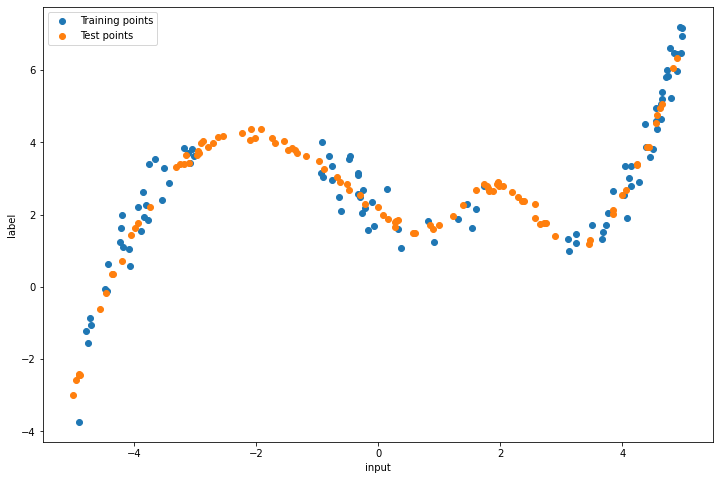

In [2]:
train_df = pd.read_csv('regression_dataset/train_data.csv')
test_df = pd.read_csv('regression_dataset/test_data.csv')



fig = plt.figure(figsize=(12,8))
plt.scatter(train_df.input, train_df.label, label='Training points')
plt.scatter(test_df.input, test_df.label, label='Test points')
plt.xlabel('input')
plt.ylabel('label')
plt.legend()
plt.show()

In [3]:
x = np.asarray(train_df.input).reshape(-1,1).astype(np.float32)
label = np.asarray(train_df.label).reshape(-1,1).astype(np.float32)

x, label = shuffle(x, label, random_state=0)

### Baseline-Method <a name="regression_bl_method"></a>

The architecture we define is a feed-forward neural network with two hidden layers, with a user-defined number of neurons, that will fire according to the ReLU activation function. 

This first baseline model do not include any dropouts, regularization or adaptive learning rate. The optimizer used in the learning process is the default SGD with momentum, considering Mean Squared Error (MSE) loss.

At first, we set some starting values for the number of hidden units $N_{h1}=8, N_{h2}=24$ in order to initialize the network. 
We can visualize the distribution of the weights connecting the 4 layers of the network: despite they are sparse, they appear distributed uniformly as their default initialization prescribes.

The optimal configuration of the hyperparameters is obtained by performing a Random Search for $N_{h1}, N_{h2}$ and the learning rate.
The number of hidden units is chosen among the set ${8, 16, 24}$, whereas the learning rate is sampled according to a LogUniform distribution in the range $[10^{-3}, 10^{-1}]$. 

Due to the reduced size of the training set a kFold Cross Validation approach, with k=5, is chosen to assess the best model.

In [4]:
class Net(nn.Module):
    
    def __init__(self, Ni, Nh1, Nh2, No):
        """
        Ni - Input size
        Nh1 - Neurons in the 1st hidden layer
        Nh2 - Neurons in the 2nd hidden layer
        No - Output size
        """
        super().__init__()
        
        print('Network initialized')
        self.fc1 = nn.Linear(in_features=Ni, out_features=Nh1)
        self.fc2 = nn.Linear(in_features=Nh1, out_features=Nh2)
        self.out = nn.Linear(in_features=Nh2, out_features=No)
        self.act = nn.ReLU()
       


    def forward(self, x, additional_out=False):
        x = self.act(self.fc1(x))
        x = self.act(self.fc2(x))
        x = self.out(x)
        return x
    
    
    def weight_plot(self, file):
        net = self
        h1_w = net.fc1.weight.data.cpu().numpy()
        h1_b = net.fc1.bias.data.cpu().numpy()

        h2_w = net.fc2.weight.data.cpu().numpy()
        h2_b = net.fc2.bias.data.cpu().numpy()

        out_w = net.out.weight.data.cpu().numpy()
        out_b = net.out.bias.data.cpu().numpy()

        fig, axs = plt.subplots(3, 1, figsize=(12,8))
        axs[0].hist(h1_w.flatten(), 50)
        axs[0].set_title('First hidden layer weights')
        axs[1].hist(h2_w.flatten(), 50)
        axs[1].set_title('Second hidden layer weights')
        axs[2].hist(out_w.flatten(), 50)
        axs[2].set_title('Output layer weights')
        [ax.grid() for ax in axs]
        plt.tight_layout()
        plt.savefig(file, dpi=300)
        plt.show()
    

        

Network initialized


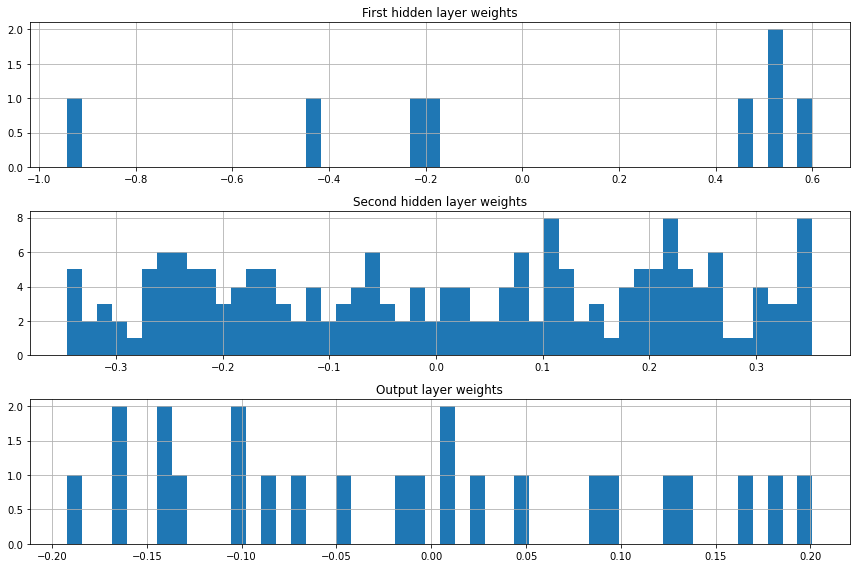

In [5]:
Ni=1
Nh1= 8
Nh2 = 24
No=1


net_skorch = NeuralNetRegressor(
             module=Net(Ni, Nh1, Nh2, No),
             max_epochs=600,
             lr=0.01
)

net_skorch.module.weight_plot('outfile/baseline_untrained.png')


In [6]:
grid = {'module__Ni' : [1], 
        'module__Nh1':        [8, 16, 24],
        'module__Nh2':        [8, 16, 24],
        'module__No' : [1], 
                 
       'lr':         loguniform.rvs(1e-3, 1e-1, size=500),
                   
       }


cv = KFold(n_splits=5, shuffle=True)
gs = RandomizedSearchCV(net_skorch, param_distributions=grid, cv=cv, n_iter=10)

gs.fit(x, label)
print(gs.best_score_, gs.best_params_)

params = gs.best_params_
net_skorch.set_params(**params)

Network initialized
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1       12.7039       18.1231  0.0029
      2       11.9002       17.1006  0.0021
      3       11.1681       16.0790  0.0021
      4       10.4479       15.1064  0.0018
      5        9.7731       14.0891  0.0021
      6        9.0785       12.9396  0.0019
      7        8.3144       11.6684  0.0019
      8        7.4884       10.3044  0.0018
      9        6.6312        8.9172  0.0020
     10        5.7973        7.5865  0.0020
     11        5.0435        6.3946  0.0023
     12        4.4193        5.4005  0.0019
     13        3.9499        4.6259  0.0023
     14        3.6296        4.0561  0.0023
     15        3.4285        3.6534  0.0021
     16        3.3091        3.3749  0.0013
     17        3.2384        3.1826  0.0024
     18        3.1945        3.0475  0.0017
     19        3.1635        2.9507  0.0017
     20        3.1385        2.8788  0.0026
     21     

    132        2.4367        1.9211  0.0016
    133        2.4351        1.9204  0.0018
    134        2.4334        1.9197  0.0019
    135        2.4318        1.9190  0.0020
    136        2.4302        1.9184  0.0025
    137        2.4285        1.9178  0.0020
    138        2.4270        1.9171  0.0018
    139        2.4254        1.9165  0.0019
    140        2.4238        1.9159  0.0021
    141        2.4222        1.9154  0.0029
    142        2.4207        1.9148  0.0023
    143        2.4191        1.9143  0.0018
    144        2.4176        1.9137  0.0019
    145        2.4161        1.9132  0.0018
    146        2.4145        1.9127  0.0018
    147        2.4130        1.9122  0.0027
    148        2.4115        1.9117  0.0019
    149        2.4100        1.9112  0.0020
    150        2.4086        1.9108  0.0020
    151        2.4071        1.9103  0.0024
    152        2.4056        1.9099  0.0028
    153        2.4042        1.9094  0.0026
    154        2.4027        1.9

    265        2.2777        1.8912  0.0017
    266        2.2768        1.8912  0.0016
    267        2.2759        1.8912  0.0016
    268        2.2750        1.8911  0.0017
    269        2.2741        1.8911  0.0016
    270        2.2732        1.8911  0.0017
    271        2.2723        1.8910  0.0017
    272        2.2714        1.8910  0.0016
    273        2.2705        1.8909  0.0017
    274        2.2695        1.8907  0.0016
    275        2.2685        1.8903  0.0016
    276        2.2672        1.8899  0.0017
    277        2.2658        1.8897  0.0017
    278        2.2643        1.8893  0.0016
    279        2.2625        1.8887  0.0017
    280        2.2606        1.8883  0.0016
    281        2.2587        1.8880  0.0017
    282        2.2566        1.8877  0.0012
    283        2.2546        1.8877  0.0026
    284        2.2526        1.8879  0.0020
    285        2.2507        1.8882  0.0017
    286        2.2488        1.8885  0.0018
    287        2.2472        1.8

    415        2.1305        1.8754  0.0023
    416        2.1297        1.8751  0.0021
    417        2.1290        1.8731  0.0021
    418        2.1282        1.8737  0.0022
    419        2.1274        1.8740  0.0022
    420        2.1266        1.8740  0.0017
    421        2.1259        1.8738  0.0027
    422        2.1251        1.8735  0.0019
    423        2.1243        1.8732  0.0017
    424        2.1235        1.8712  0.0017
    425        2.1228        1.8719  0.0017
    426        2.1220        1.8721  0.0016
    427        2.1212        1.8721  0.0018
    428        2.1204        1.8719  0.0017
    429        2.1196        1.8716  0.0018
    430        2.1188        1.8713  0.0017
    431        2.1180        1.8692  0.0017
    432        2.1173        1.8699  0.0017
    433        2.1165        1.8701  0.0018
    434        2.1157        1.8701  0.0016
    435        2.1149        1.8699  0.0018
    436        2.1141        1.8696  0.0017
    437        2.1133        1.8

    564        2.0067        1.8123  0.0018
    565        2.0058        1.8133  0.0016
    566        2.0049        1.8133  0.0017
    567        2.0040        1.8106  0.0017
    568        2.0031        1.8116  0.0017
    569        2.0021        1.8115  0.0017
    570        2.0012        1.8088  0.0017
    571        2.0003        1.8098  0.0016
    572        1.9993        1.8097  0.0019
    573        1.9985        1.8069  0.0019
    574        1.9975        1.8079  0.0020
    575        1.9966        1.8078  0.0021
    576        1.9957        1.8050  0.0017
    577        1.9948        1.8060  0.0018
    578        1.9938        1.8059  0.0019
    579        1.9929        1.8031  0.0017
    580        1.9920        1.8040  0.0018
    581        1.9910        1.8040  0.0021
    582        1.9901        1.8011  0.0021
    583        1.9891        1.8021  0.0019
    584        1.9882        1.7997  0.0022
    585        1.9873        1.8009  0.0023
    586        1.9863        1.8

     98        1.9584        4.5765  0.0019
     99        1.9538        4.5702  0.0016
    100        1.9492        4.5640  0.0018
    101        1.9447        4.5579  0.0016
    102        1.9402        4.5517  0.0016
    103        1.9358        4.5458  0.0016
    104        1.9314        4.5398  0.0017
    105        1.9270        4.5338  0.0016
    106        1.9227        4.5278  0.0017
    107        1.9184        4.5220  0.0016
    108        1.9142        4.5162  0.0017
    109        1.9100        4.5107  0.0016
    110        1.9058        4.5049  0.0018
    111        1.9017        4.4992  0.0018
    112        1.8976        4.4936  0.0018
    113        1.8936        4.4881  0.0018
    114        1.8895        4.4826  0.0019
    115        1.8856        4.4774  0.0023
    116        1.8816        4.4719  0.0015
    117        1.8777        4.4665  0.0016
    118        1.8738        4.4611  0.0017
    119        1.8700        4.4558  0.0018
    120        1.8662        4.4

    231        1.6045        4.0709  0.0018
    232        1.6031        4.0687  0.0020
    233        1.6018        4.0666  0.0019
    234        1.6005        4.0645  0.0020
    235        1.5992        4.0630  0.0016
    236        1.5979        4.0605  0.0017
    237        1.5966        4.0581  0.0016
    238        1.5953        4.0558  0.0016
    239        1.5941        4.0533  0.0016
    240        1.5929        4.0510  0.0017
    241        1.5917        4.0487  0.0019
    242        1.5905        4.0464  0.0018
    243        1.5894        4.0443  0.0020
    244        1.5882        4.0421  0.0024
    245        1.5871        4.0400  0.0017
    246        1.5859        4.0380  0.0018
    247        1.5848        4.0359  0.0026
    248        1.5837        4.0339  0.0017
    249        1.5825        4.0337  0.0018
    250        1.5811        4.0333  0.0016
    251        1.5797        4.0317  0.0017
    252        1.5783        4.0314  0.0016
    253        1.5766        4.0

    364        1.4502        3.6908  0.0017
    365        1.4496        3.6895  0.0017
    366        1.4490        3.6883  0.0017
    367        1.4484        3.6871  0.0017
    368        1.4478        3.6859  0.0016
    369        1.4472        3.6847  0.0020
    370        1.4466        3.6835  0.0018
    371        1.4460        3.6823  0.0019
    372        1.4454        3.6811  0.0022
    373        1.4448        3.6799  0.0018
    374        1.4442        3.6787  0.0019
    375        1.4436        3.6775  0.0018
    376        1.4430        3.6763  0.0019
    377        1.4424        3.6751  0.0022
    378        1.4418        3.6739  0.0021
    379        1.4412        3.6727  0.0017
    380        1.4406        3.6715  0.0018
    381        1.4400        3.6703  0.0017
    382        1.4394        3.6691  0.0018
    383        1.4388        3.6679  0.0017
    384        1.4382        3.6667  0.0017
    385        1.4376        3.6655  0.0016
    386        1.4370        3.6

    498        1.3699        3.5185  0.0017
    499        1.3693        3.5173  0.0017
    500        1.3687        3.5161  0.0016
    501        1.3681        3.5149  0.0017
    502        1.3675        3.5136  0.0016
    503        1.3669        3.5124  0.0016
    504        1.3663        3.5158  0.0017
    505        1.3657        3.5131  0.0017
    506        1.3651        3.5108  0.0017
    507        1.3645        3.5087  0.0017
    508        1.3639        3.5069  0.0017
    509        1.3633        3.5052  0.0016
    510        1.3627        3.5036  0.0016
    511        1.3622        3.5020  0.0017
    512        1.3616        3.5006  0.0017
    513        1.3610        3.4992  0.0016
    514        1.3604        3.4978  0.0016
    515        1.3598        3.4965  0.0017
    516        1.3592        3.4951  0.0017
    517        1.3586        3.4938  0.0018
    518        1.3580        3.4926  0.0018
    519        1.3574        3.4912  0.0015
    520        1.3568        3.4

     30        3.3461        3.7782  0.0017
     31        3.3247        3.7791  0.0019
     32        3.3036        3.7808  0.0016
     33        3.2829        3.7830  0.0017
     34        3.2625        3.7858  0.0017
     35        3.2425        3.7893  0.0016
     36        3.2228        3.7934  0.0017
     37        3.2035        3.7980  0.0016
     38        3.1846        3.8029  0.0016
     39        3.1661        3.8083  0.0016
     40        3.1480        3.8140  0.0017
     41        3.1303        3.8200  0.0016
     42        3.1130        3.8264  0.0018
     43        3.0961        3.8333  0.0016
     44        3.0795        3.8405  0.0017
     45        3.0634        3.8483  0.0016
     46        3.0476        3.8562  0.0017
     47        3.0323        3.8645  0.0017
     48        3.0173        3.8730  0.0017
     49        3.0028        3.8818  0.0017
     50        2.9886        3.8910  0.0017
     51        2.9749        3.9004  0.0015
     52        2.9615        3.9

    185        2.3696        4.1928  0.0017
    186        2.3670        4.1896  0.0015
    187        2.3643        4.1874  0.0017
    188        2.3617        4.1852  0.0016
    189        2.3590        4.1830  0.0017
    190        2.3564        4.1797  0.0016
    191        2.3538        4.1774  0.0016
    192        2.3511        4.1751  0.0016
    193        2.3485        4.1717  0.0018
    194        2.3459        4.1695  0.0016
    195        2.3433        4.1672  0.0016
    196        2.3407        4.1649  0.0016
    197        2.3381        4.1615  0.0016
    198        2.3355        4.1593  0.0016
    199        2.3329        4.1570  0.0018
    200        2.3303        4.1547  0.0016
    201        2.3277        4.1513  0.0018
    202        2.3251        4.1490  0.0017
    203        2.3226        4.1468  0.0017
    204        2.3200        4.1444  0.0017
    205        2.3174        4.1412  0.0018
    206        2.3149        4.1392  0.0018
    207        2.3124        4.1

    340        2.0138        3.8237  0.0016
    341        2.0118        3.8215  0.0018
    342        2.0097        3.8192  0.0016
    343        2.0077        3.8169  0.0017
    344        2.0056        3.8145  0.0016
    345        2.0036        3.8122  0.0018
    346        2.0016        3.8099  0.0017
    347        1.9995        3.8075  0.0017
    348        1.9975        3.8051  0.0013
    349        1.9955        3.8028  0.0021
    350        1.9934        3.8004  0.0016
    351        1.9914        3.7980  0.0018
    352        1.9894        3.7957  0.0016
    353        1.9874        3.7933  0.0018
    354        1.9853        3.7909  0.0016
    355        1.9833        3.7882  0.0016
    356        1.9813        3.7856  0.0015
    357        1.9793        3.7831  0.0018
    358        1.9773        3.7806  0.0018
    359        1.9753        3.7781  0.0018
    360        1.9733        3.7757  0.0016
    361        1.9713        3.7732  0.0017
    362        1.9693        3.7

    478        1.7446        3.4858  0.0017
    479        1.7428        3.4799  0.0017
    480        1.7409        3.4751  0.0016
    481        1.7391        3.4711  0.0016
    482        1.7372        3.4737  0.0017
    483        1.7354        3.4683  0.0016
    484        1.7335        3.4638  0.0016
    485        1.7317        3.4599  0.0016
    486        1.7298        3.4602  0.0016
    487        1.7280        3.4583  0.0016
    488        1.7262        3.4536  0.0016
    489        1.7243        3.4495  0.0017
    490        1.7225        3.4459  0.0017
    491        1.7206        3.4491  0.0012
    492        1.7188        3.4438  0.0021
    493        1.7169        3.4394  0.0016
    494        1.7151        3.4356  0.0017
    495        1.7132        3.4360  0.0016
    496        1.7114        3.4342  0.0016
    497        1.7095        3.4294  0.0018
    498        1.7077        3.4253  0.0017
    499        1.7058        3.4217  0.0016
    500        1.7040        3.4

     13        4.7214        7.6353  0.0016
     14        4.3500        6.9440  0.0016
     15        4.0292        6.3394  0.0017
     16        3.7611        5.8264  0.0016
     17        3.5438        5.3997  0.0018
     18        3.3734        5.0502  0.0018
     19        3.2417        4.7676  0.0016
     20        3.1406        4.5404  0.0017
     21        3.0631        4.3584  0.0016
     22        3.0035        4.2123  0.0022
     23        2.9568        4.0944  0.0018
     24        2.9196        3.9990  0.0016
     25        2.8893        3.9206  0.0017
     26        2.8639        3.8561  0.0017
     27        2.8422        3.8023  0.0016
     28        2.8233        3.7569  0.0017
     29        2.8064        3.7182  0.0016
     30        2.7912        3.6853  0.0016
     31        2.7772        3.6566  0.0017
     32        2.7642        3.6314  0.0016
     33        2.7519        3.6094  0.0017
     34        2.7402        3.5895  0.0016
     35        2.7290        3.5

    146        1.9255        2.9871  0.0017
    147        1.9210        2.9829  0.0017
    148        1.9165        2.9803  0.0017
    149        1.9121        2.9778  0.0017
    150        1.9077        2.9753  0.0017
    151        1.9033        2.9714  0.0017
    152        1.8991        2.9690  0.0016
    153        1.8948        2.9667  0.0017
    154        1.8906        2.9644  0.0017
    155        1.8864        2.9622  0.0017
    156        1.8823        2.9585  0.0017
    157        1.8782        2.9564  0.0017
    158        1.8742        2.9542  0.0016
    159        1.8702        2.9521  0.0017
    160        1.8662        2.9501  0.0015
    161        1.8623        2.9481  0.0016
    162        1.8585        2.9445  0.0016
    163        1.8547        2.9425  0.0016
    164        1.8509        2.9406  0.0017
    165        1.8471        2.9386  0.0015
    166        1.8434        2.9367  0.0017
    167        1.8398        2.9348  0.0019
    168        1.8361        2.9

    279        1.6137        2.7618  0.0016
    280        1.6126        2.7606  0.0016
    281        1.6116        2.7595  0.0016
    282        1.6106        2.7584  0.0018
    283        1.6095        2.7573  0.0017
    284        1.6085        2.7562  0.0017
    285        1.6075        2.7551  0.0021
    286        1.6065        2.7540  0.0024
    287        1.6055        2.7530  0.0022
    288        1.6045        2.7519  0.0018
    289        1.6035        2.7509  0.0018
    290        1.6025        2.7499  0.0018
    291        1.6015        2.7489  0.0016
    292        1.6005        2.7478  0.0017
    293        1.5996        2.7468  0.0016
    294        1.5986        2.7458  0.0017
    295        1.5976        2.7448  0.0017
    296        1.5967        2.7437  0.0017
    297        1.5957        2.7427  0.0016
    298        1.5948        2.7417  0.0018
    299        1.5938        2.7406  0.0017
    300        1.5929        2.7396  0.0017
    301        1.5919        2.7

    412        1.4965        2.5902  0.0017
    413        1.4957        2.5887  0.0016
    414        1.4949        2.5873  0.0018
    415        1.4940        2.5858  0.0017
    416        1.4932        2.5843  0.0018
    417        1.4924        2.5829  0.0017
    418        1.4916        2.5814  0.0017
    419        1.4908        2.5800  0.0017
    420        1.4899        2.5786  0.0018
    421        1.4891        2.5771  0.0017
    422        1.4883        2.5757  0.0019
    423        1.4875        2.5742  0.0016
    424        1.4866        2.5728  0.0016
    425        1.4858        2.5714  0.0018
    426        1.4850        2.5699  0.0019
    427        1.4842        2.5685  0.0017
    428        1.4833        2.5671  0.0019
    429        1.4825        2.5656  0.0017
    430        1.4817        2.5642  0.0017
    431        1.4808        2.5628  0.0017
    432        1.4800        2.5613  0.0016
    433        1.4792        2.5599  0.0017
    434        1.4784        2.5

    545        1.3824        2.3996  0.0016
    546        1.3815        2.3982  0.0016
    547        1.3806        2.3968  0.0017
    548        1.3797        2.3954  0.0018
    549        1.3788        2.3940  0.0017
    550        1.3779        2.3925  0.0015
    551        1.3770        2.3911  0.0017
    552        1.3761        2.3897  0.0016
    553        1.3752        2.3883  0.0017
    554        1.3743        2.3868  0.0017
    555        1.3734        2.3854  0.0017
    556        1.3725        2.3840  0.0016
    557        1.3716        2.3826  0.0016
    558        1.3707        2.3812  0.0018
    559        1.3698        2.3797  0.0018
    560        1.3688        2.3783  0.0017
    561        1.3679        2.3769  0.0021
    562        1.3670        2.3755  0.0018
    563        1.3661        2.3740  0.0017
    564        1.3652        2.3726  0.0020
    565        1.3643        2.3712  0.0019
    566        1.3634        2.3698  0.0017
    567        1.3625        2.3

     85        1.9653        4.0594  0.0016
     86        1.9621        4.0541  0.0016
     87        1.9589        4.0487  0.0017
     88        1.9558        4.0434  0.0016
     89        1.9527        4.0380  0.0015
     90        1.9496        4.0327  0.0017
     91        1.9466        4.0273  0.0017
     92        1.9436        4.0219  0.0017
     93        1.9406        4.0166  0.0016
     94        1.9376        4.0112  0.0017
     95        1.9347        4.0058  0.0017
     96        1.9318        4.0005  0.0016
     97        1.9289        3.9951  0.0017
     98        1.9261        3.9898  0.0016
     99        1.9232        3.9844  0.0017
    100        1.9204        3.9791  0.0016
    101        1.9176        3.9738  0.0017
    102        1.9149        3.9685  0.0016
    103        1.9121        3.9633  0.0017
    104        1.9094        3.9580  0.0017
    105        1.9067        3.9528  0.0017
    106        1.9040        3.9475  0.0015
    107        1.9014        3.9

    220        1.7255        3.5281  0.0017
    221        1.7247        3.5259  0.0015
    222        1.7238        3.5238  0.0018
    223        1.7229        3.5217  0.0016
    224        1.7221        3.5196  0.0018
    225        1.7212        3.5176  0.0016
    226        1.7204        3.5155  0.0018
    227        1.7195        3.5135  0.0017
    228        1.7187        3.5115  0.0018
    229        1.7179        3.5095  0.0019
    230        1.7170        3.5075  0.0017
    231        1.7162        3.5056  0.0017
    232        1.7153        3.5037  0.0018
    233        1.7145        3.5018  0.0017
    234        1.7137        3.4999  0.0017
    235        1.7129        3.4980  0.0016
    236        1.7121        3.4958  0.0016
    237        1.7113        3.4940  0.0016
    238        1.7105        3.4919  0.0017
    239        1.7096        3.4902  0.0017
    240        1.7088        3.4882  0.0016
    241        1.7081        3.4865  0.0016
    242        1.7072        3.4

    353        1.6219        3.3295  0.0016
    354        1.6211        3.3281  0.0017
    355        1.6204        3.3269  0.0016
    356        1.6196        3.3258  0.0017
    357        1.6188        3.3244  0.0016
    358        1.6180        3.3233  0.0018
    359        1.6172        3.3222  0.0016
    360        1.6164        3.3207  0.0017
    361        1.6157        3.3196  0.0016
    362        1.6149        3.3185  0.0017
    363        1.6141        3.3171  0.0016
    364        1.6133        3.3160  0.0017
    365        1.6125        3.3149  0.0016
    366        1.6117        3.3135  0.0017
    367        1.6109        3.3124  0.0018
    368        1.6101        3.3110  0.0016
    369        1.6094        3.3099  0.0017
    370        1.6086        3.3088  0.0017
    371        1.6078        3.3074  0.0017
    372        1.6070        3.3065  0.0017
    373        1.6062        3.3055  0.0017
    374        1.6054        3.3041  0.0018
    375        1.6046        3.3

    486        1.5117        3.1665  0.0017
    487        1.5108        3.1650  0.0017
    488        1.5099        3.1639  0.0017
    489        1.5090        3.1624  0.0016
    490        1.5081        3.1613  0.0017
    491        1.5072        3.1598  0.0016
    492        1.5063        3.1587  0.0017
    493        1.5054        3.1572  0.0018
    494        1.5044        3.1557  0.0018
    495        1.5036        3.1546  0.0017
    496        1.5026        3.1531  0.0018
    497        1.5017        3.1520  0.0016
    498        1.5008        3.1504  0.0028
    499        1.4999        3.1490  0.0018
    500        1.4990        3.1479  0.0017
    501        1.4981        3.1463  0.0017
    502        1.4972        3.1452  0.0017
    503        1.4963        3.1437  0.0017
    504        1.4954        3.1427  0.0017
    505        1.4944        3.1420  0.0018
    506        1.4934        3.1406  0.0017
    507        1.4924        3.1395  0.0016
    508        1.4915        3.1

     17        2.4595        1.9504  0.0017
     18        2.4307        1.9378  0.0016
     19        2.4023        1.9271  0.0018
     20        2.3740        1.9138  0.0016
     21        2.3459        1.8921  0.0018
     22        2.3183        1.8865  0.0017
     23        2.2920        1.8810  0.0018
     24        2.2672        1.8695  0.0016
     25        2.2407        1.8617  0.0018
     26        2.2152        1.8528  0.0017
     27        2.1903        1.8451  0.0017
     28        2.1674        1.8391  0.0017
     29        2.1452        1.8261  0.0017
     30        2.1226        1.8238  0.0017
     31        2.1006        1.8163  0.0017
     32        2.0800        1.8128  0.0016
     33        2.0594        1.8018  0.0017
     34        2.0413        1.8010  0.0016
     35        2.0220        1.7956  0.0018
     36        2.0035        1.7921  0.0016
     37        1.9859        1.7856  0.0017
     38        1.9685        1.7775  0.0016
     39        1.9522        1.7

    170        1.2185        1.4330  0.0016
    171        1.2157        0.8570  0.0017
    172        1.2127        1.4939  0.0017
    173        1.2136        0.7836  0.0018
    174        1.2147        1.6097  0.0017
    175        1.2235        0.6784  0.0017
    176        1.2337        1.8272  0.0018
    177        1.2622        0.5340  0.0017
    178        1.2948        2.2450  0.0016
    179        1.3748        0.3672  0.0017
    180        1.4645        3.0690  0.0017
    181        1.6897        0.2928  0.0017
    182        1.9157        4.6193  0.0016
    183        2.4295        0.2960  0.0017
    184        2.1809        5.0486  0.0016
    185        2.6584        0.2757  0.0017
    186        2.0185        4.0030  0.0017
    187        2.1329        0.3159  0.0017
    188        1.6546        2.8563  0.0018
    189        1.6267        0.4430  0.0018
    190        1.4480        2.2657  0.0017
    191        1.4107        0.5436  0.0017
    192        1.3394        1.9

    352        1.3078        2.5985  0.0018
    353        1.3876        0.2051  0.0016
    354        1.2828        2.5533  0.0017
    355        1.3678        0.2050  0.0018
    356        1.2597        2.4689  0.0017
    357        1.3268        0.2071  0.0017
    358        1.2452        2.5138  0.0018
    359        1.3539        0.2107  0.0018
    360        1.2520        2.4065  0.0017
    361        1.2992        0.2021  0.0016
    362        1.2164        2.3685  0.0017
    363        1.2790        0.1979  0.0017
    364        1.1945        2.3278  0.0016
    365        1.2585        0.1906  0.0016
    366        1.1720        2.2905  0.0019
    367        1.2364        0.1872  0.0017
    368        1.1694        2.4043  0.0017
    369        1.2900        0.1944  0.0017
    370        1.2337        2.5025  0.0018
    371        1.3343        0.1954  0.0017
    372        1.2575        2.5585  0.0018
    373        1.3605        0.1935  0.0016
    374        1.2632        2.5

    530        1.0550        2.2166  0.0017
    531        1.1549        0.1424  0.0017
    532        1.0599        2.2383  0.0018
    533        1.1651        0.1435  0.0017
    534        1.0657        2.2465  0.0016
    535        1.1688        0.1405  0.0017
    536        1.0555        2.1971  0.0017
    537        1.1440        0.1383  0.0016
    538        1.0435        2.2012  0.0017
    539        1.1455        0.1398  0.0018
    540        1.0507        2.2495  0.0018
    541        1.1689        0.1415  0.0017
    542        1.0590        2.2098  0.0017
    543        1.1490        0.1383  0.0016
    544        1.0447        2.2149  0.0018
    545        1.1512        0.1384  0.0016
    546        1.0449        2.1889  0.0017
    547        1.1377        0.1372  0.0016
    548        1.0377        2.2042  0.0017
    549        1.1448        0.1395  0.0016
    550        1.0479        2.2461  0.0017
    551        1.1649        0.1396  0.0017
    552        1.0491        2.2

     85        1.4007        3.7357  0.0017
     86        1.3968        3.7371  0.0017
     87        1.3931        3.7148  0.0017
     88        1.3891        3.7021  0.0017
     89        1.3851        3.6986  0.0017
     90        1.3810        3.6877  0.0017
     91        1.3769        3.6904  0.0017
     92        1.3726        3.6746  0.0017
     93        1.3683        3.6706  0.0018
     94        1.3639        3.6480  0.0017
     95        1.3595        3.6380  0.0017
     96        1.3552        3.6330  0.0018
     97        1.3510        3.6248  0.0017
     98        1.3469        3.6126  0.0019
     99        1.3427        3.6095  0.0019
    100        1.3379        3.5862  0.0018
    101        1.3322        3.5804  0.0016
    102        1.3266        3.5632  0.0018
    103        1.3196        3.5627  0.0016
    104        1.3120        3.5415  0.0017
    105        1.3059        3.5360  0.0017
    106        1.3000        3.5013  0.0017
    107        1.2942        3.4

    236        1.1787        3.7530  0.0018
    237        1.2612        2.2677  0.0018
    238        1.2638        3.9319  0.0018
    239        1.3615        2.2224  0.0017
    240        1.3213        4.0162  0.0018
    241        1.4044        2.2291  0.0017
    242        1.3051        3.9097  0.0018
    243        1.3445        2.2585  0.0017
    244        1.2265        3.6885  0.0017
    245        1.2287        2.3153  0.0019
    246        1.1428        3.4735  0.0018
    247        1.1300        2.3607  0.0018
    248        1.0706        3.2919  0.0018
    249        1.0567        2.3957  0.0017
    250        1.0183        3.1587  0.0018
    251        1.0080        2.4211  0.0017
    252        0.9850        3.0716  0.0019
    253        0.9784        2.4410  0.0016
    254        0.9636        3.0152  0.0018
    255        0.9595        2.4568  0.0017
    256        0.9512        2.9797  0.0018
    257        0.9492        2.4471  0.0016
    258        0.9435        2.9

    414        0.7817        2.4734  0.0019
    415        0.8040        1.8453  0.0017
    416        0.7924        2.5083  0.0017
    417        0.8213        1.8327  0.0018
    418        0.8100        2.5667  0.0016
    419        0.8516        1.8304  0.0017
    420        0.8388        2.6352  0.0017
    421        0.8898        1.8419  0.0018
    422        0.8748        2.7227  0.0017
    423        0.9418        1.9409  0.0024
    424        0.9276        2.8192  0.0019
    425        1.0076        2.2196  0.0018
    426        1.0250        2.9853  0.0018
    427        1.1230        2.3944  0.0018
    428        1.0954        3.0567  0.0017
    429        1.1762        2.4949  0.0017
    430        1.1132        3.0279  0.0018
    431        1.1646        2.4985  0.0018
    432        1.0742        2.8908  0.0017
    433        1.0867        2.4571  0.0018
    434        1.0078        2.7305  0.0017
    435        0.9968        2.4206  0.0018
    436        0.9485        2.6

    596        1.0670        2.7192  0.0019
    597        1.1309        2.2590  0.0017
    598        0.9790        2.4827  0.0018
    599        0.9807        2.1795  0.0017
    600        0.8829        2.2851  0.0023
Network initialized
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1       11.3565       14.6320  0.0022
      2        8.1642       11.0418  0.0026
      3        5.9127        7.6890  0.0018
      4        4.1013        5.6205  0.0018
      5        3.2663        4.9547  0.0019
      6        3.1218        4.8331  0.0021
      7        3.0881        4.7970  0.0019
      8        3.0581        4.7714  0.0023
      9        3.0293        4.7496  0.0019
     10        3.0016        4.7298  0.0018
     11        2.9748        4.7113  0.0026
     12        2.9489        4.6935  0.0019
     13        2.9238        4.6764  0.0019
     14        2.8995        4.6596  0.0019
     15        2.8758        4.6429  0.0023
     16     

    131        1.6623        3.3537  0.0020
    132        1.6670        3.6740  0.0021
    133        1.7052        3.4046  0.0025
    134        1.7291        4.0735  0.0026
    135        1.8212        3.4884  0.0028
    136        1.8253        4.1430  0.0024
    137        1.8449        3.4633  0.0018
    138        1.8262        4.1147  0.0018
    139        1.8329        3.4098  0.0018
    140        1.8004        4.1152  0.0020
    141        1.8301        3.3678  0.0017
    142        1.7833        4.0969  0.0019
    143        1.8217        3.3263  0.0019
    144        1.7643        4.0365  0.0020
    145        1.7987        3.2772  0.0021
    146        1.7380        4.0119  0.0021
    147        1.7879        3.2419  0.0026
    148        1.7224        3.9960  0.0022
    149        1.7802        3.2139  0.0021
    150        1.7105        3.9107  0.0020
    151        1.7497        3.1720  0.0019
    152        1.6861        3.7239  0.0028
    153        1.6890        3.1

    301        1.4077        2.9180  0.0018
    302        1.4119        3.0005  0.0020
    303        1.4114        2.9458  0.0019
    304        1.4193        2.9548  0.0020
    305        1.4008        2.9519  0.0024
    306        1.4111        2.9099  0.0019
    307        1.3895        2.9553  0.0019
    308        1.4017        2.8758  0.0018
    309        1.3812        2.9496  0.0017
    310        1.3788        2.8454  0.0018
    311        1.3764        2.9697  0.0020
    312        1.3796        2.8276  0.0018
    313        1.3791        3.0061  0.0017
    314        1.3901        2.8422  0.0017
    315        1.3982        3.0802  0.0017
    316        1.4319        2.7665  0.0018
    317        1.3779        3.0597  0.0018
    318        1.3882        2.6766  0.0017
    319        1.3510        3.0643  0.0017
    320        1.3741        2.6734  0.0016
    321        1.3599        3.1125  0.0017
    322        1.3936        2.7632  0.0017
    323        1.4127        3.2

    479        1.1286        3.2400  0.0020
    480        1.2771        2.0295  0.0018
    481        1.2062        3.4411  0.0017
    482        1.5034        1.9329  0.0019
    483        1.1232        3.1011  0.0020
    484        1.1974        1.8934  0.0019
    485        1.0922        3.0624  0.0021
    486        1.2110        2.0034  0.0019
    487        1.1389        3.1868  0.0019
    488        1.3940        1.9229  0.0019
    489        1.0601        2.8650  0.0019
    490        1.1128        1.8436  0.0018
    491        1.0192        2.7971  0.0017
    492        1.0778        1.8976  0.0018
    493        1.0533        2.9990  0.0019
    494        1.2886        2.0261  0.0020
    495        1.1087        3.0578  0.0020
    496        1.3546        1.9581  0.0023
    497        1.0564        2.8635  0.0020
    498        1.1190        1.8564  0.0021
    499        1.0322        2.8828  0.0019
    500        1.1074        1.8799  0.0021
    501        1.0654        3.1

     44        1.7663        2.9859  0.0017
     45        1.7599        2.9740  0.0019
     46        1.7519        2.9742  0.0019
     47        1.7421        2.9533  0.0019
     48        1.7364        2.9506  0.0020
     49        1.7309        2.9444  0.0022
     50        1.7255        2.9392  0.0017
     51        1.7202        2.9373  0.0018
     52        1.7150        2.9195  0.0018
     53        1.7099        2.9341  0.0020
     54        1.7087        2.9037  0.0019
     55        1.7037        2.9210  0.0021
     56        1.7038        2.8882  0.0019
     57        1.6970        2.8804  0.0018
     58        1.6910        2.8820  0.0017
     59        1.6851        2.8643  0.0017
     60        1.6797        2.8624  0.0016
     61        1.6741        2.8436  0.0017
     62        1.6687        2.8494  0.0017
     63        1.6635        2.8299  0.0018
     64        1.6587        2.8362  0.0016
     65        1.6540        2.8130  0.0018
     66        1.6495        2.8

    212        1.7999        3.8005  0.0017
    213        2.0103        2.2545  0.0015
    214        1.7686        3.6884  0.0019
    215        1.9091        2.2138  0.0019
    216        1.7073        3.4683  0.0019
    217        1.7868        2.1190  0.0020
    218        1.5877        3.1872  0.0029
    219        1.6321        1.9861  0.0017
    220        1.4423        2.9186  0.0018
    221        1.4634        1.9463  0.0018
    222        1.3644        2.7515  0.0018
    223        1.3814        1.9469  0.0017
    224        1.3356        2.6751  0.0017
    225        1.3553        1.9617  0.0017
    226        1.3359        2.6699  0.0019
    227        1.3659        1.9654  0.0017
    228        1.3434        2.7205  0.0018
    229        1.3883        2.0306  0.0016
    230        1.4110        2.8897  0.0017
    231        1.4985        2.2292  0.0016
    232        1.6011        3.2522  0.0017
    233        1.7554        2.2409  0.0018
    234        1.6512        3.3

    395        1.3714        1.7480  0.0016
    396        1.2606        2.7012  0.0020
    397        1.3635        1.7265  0.0018
    398        1.2461        2.7024  0.0019
    399        1.3557        1.7160  0.0020
    400        1.2431        2.7118  0.0022
    401        1.3560        1.7107  0.0019
    402        1.2443        2.7306  0.0018
    403        1.3650        1.7311  0.0019
    404        1.2658        2.7602  0.0018
    405        1.3904        1.7600  0.0020
    406        1.2900        2.8028  0.0018
    407        1.4229        1.7662  0.0020
    408        1.2968        2.8060  0.0022
    409        1.4250        1.7595  0.0018
    410        1.2872        2.7746  0.0021
    411        1.4058        1.7390  0.0020
    412        1.2665        2.7310  0.0022
    413        1.3760        1.7183  0.0021
    414        1.2452        2.6948  0.0019
    415        1.3531        1.7000  0.0019
    416        1.2278        2.6537  0.0019
    417        1.3284        1.6

    578        1.0827        2.5844  0.0018
    579        1.3042        1.5347  0.0017
    580        1.1134        2.5504  0.0017
    581        1.2562        1.4928  0.0018
    582        1.0769        2.4611  0.0020
    583        1.1737        1.4440  0.0018
    584        1.0398        2.4009  0.0022
    585        1.1220        1.4040  0.0019
    586        1.0097        2.3897  0.0018
    587        1.1254        1.4509  0.0017
    588        1.0539        2.4993  0.0018
    589        1.2277        1.5199  0.0021
    590        1.1063        2.5582  0.0018
    591        1.2824        1.5366  0.0021
    592        1.1153        2.5219  0.0025
    593        1.2432        1.5102  0.0020
    594        1.0913        2.4882  0.0019
    595        1.2242        1.4895  0.0020
    596        1.0664        2.4280  0.0021
    597        1.1836        1.4514  0.0020
    598        1.0264        2.3413  0.0021
    599        1.1210        1.4247  0.0018
    600        1.0045        2.3

    117        1.2155        2.4282  0.0018
    118        1.2101        2.4214  0.0017
    119        1.2050        2.4028  0.0016
    120        1.2001        2.4027  0.0017
    121        1.1954        2.3815  0.0019
    122        1.1913        2.3848  0.0017
    123        1.1875        2.3573  0.0018
    124        1.1852        2.3791  0.0017
    125        1.1838        2.3366  0.0018
    126        1.1858        2.3843  0.0017
    127        1.1912        2.3337  0.0019
    128        1.2049        2.4244  0.0020
    129        1.2260        2.3745  0.0019
    130        1.2729        2.5519  0.0020
    131        1.3322        2.5422  0.0018
    132        1.4731        2.8937  0.0017
    133        1.6131        3.0390  0.0018
    134        1.9808        3.6297  0.0017
    135        2.1609        3.8334  0.0020
    136        2.7825        4.1877  0.0019
    137        2.4313        3.7548  0.0021
    138        2.7436        3.7920  0.0023
    139        1.9408        2.8

    291        1.1855        1.8915  0.0017
    292        1.2296        2.5646  0.0020
    293        1.1804        1.8782  0.0020
    294        1.2183        2.5460  0.0021
    295        1.1729        1.8715  0.0020
    296        1.2132        2.5308  0.0019
    297        1.1659        1.8565  0.0017
    298        1.2008        2.5053  0.0017
    299        1.1535        1.8379  0.0018
    300        1.1855        2.4650  0.0019
    301        1.1388        1.8205  0.0020
    302        1.1707        2.4371  0.0021
    303        1.1278        1.8061  0.0019
    304        1.1622        2.4443  0.0017
    305        1.1273        1.8046  0.0017
    306        1.1624        2.4277  0.0019
    307        1.1221        1.8020  0.0017
    308        1.1606        2.4203  0.0018
    309        1.1232        1.8010  0.0023
    310        1.1623        2.4244  0.0018
    311        1.1242        1.8037  0.0018
    312        1.1652        2.4173  0.0020
    313        1.1265        1.8

    471        0.8641        1.5128  0.0018
    472        0.9298        1.7545  0.0019
    473        0.8763        1.5380  0.0019
    474        0.9509        1.7679  0.0021
    475        0.8901        1.5458  0.0017
    476        0.9554        1.7482  0.0018
    477        0.8958        1.5728  0.0017
    478        0.9825        1.8196  0.0018
    479        0.9233        1.6104  0.0017
    480        1.0146        1.8698  0.0020
    481        0.9427        1.6164  0.0019
    482        1.0198        1.8490  0.0021
    483        0.9406        1.6100  0.0019
    484        1.0158        1.8428  0.0018
    485        0.9352        1.5942  0.0021
    486        1.0054        1.8470  0.0021
    487        0.9317        1.6041  0.0019
    488        1.0173        1.8655  0.0019
    489        0.9294        1.5732  0.0020
    490        0.9893        1.8164  0.0020
    491        0.9097        1.5456  0.0022
    492        0.9663        1.7655  0.0022
    493        0.8888        1.5

     37        3.0322        3.0974  0.0017
     38        2.9996        2.9968  0.0017
     39        2.9722        2.9077  0.0017
     40        2.9489        2.8288  0.0019
     41        2.9290        2.7587  0.0018
     42        2.9119        2.6966  0.0020
     43        2.8971        2.6414  0.0019
     44        2.8842        2.5923  0.0020
     45        2.8727        2.5486  0.0017
     46        2.8624        2.5096  0.0017
     47        2.8531        2.4747  0.0016
     48        2.8446        2.4435  0.0018
     49        2.8368        2.4154  0.0018
     50        2.8294        2.3902  0.0016
     51        2.8224        2.3674  0.0017
     52        2.8158        2.3467  0.0016
     53        2.8095        2.3279  0.0017
     54        2.8034        2.3107  0.0018
     55        2.7976        2.2950  0.0016
     56        2.7918        2.2806  0.0018
     57        2.7862        2.2673  0.0015
     58        2.7808        2.2551  0.0018
     59        2.7753        2.2

    171        2.3578        1.8464  0.0018
    172        2.3555        1.8473  0.0016
    173        2.3531        1.8464  0.0016
    174        2.3508        1.8434  0.0016
    175        2.3486        1.8427  0.0016
    176        2.3463        1.8436  0.0017
    177        2.3439        1.8428  0.0017
    178        2.3416        1.8403  0.0017
    179        2.3394        1.8411  0.0017
    180        2.3371        1.8386  0.0016
    181        2.3351        1.8372  0.0016
    182        2.3327        1.8365  0.0017
    183        2.3304        1.8373  0.0017
    184        2.3281        1.8365  0.0017
    185        2.3260        1.8341  0.0017
    186        2.3238        1.8334  0.0018
    187        2.3215        1.8343  0.0017
    188        2.3194        1.8312  0.0016
    189        2.3173        1.8305  0.0018
    190        2.3150        1.8299  0.0017
    191        2.3128        1.8307  0.0017
    192        2.3107        1.8283  0.0016
    193        2.3086        1.8

    313        2.1018        1.7705  0.0017
    314        2.1005        1.7720  0.0017
    315        2.0991        1.7697  0.0018
    316        2.0978        1.7712  0.0016
    317        2.0965        1.7709  0.0017
    318        2.0950        1.7696  0.0017
    319        2.0937        1.7711  0.0016
    320        2.0924        1.7698  0.0017
    321        2.0910        1.7703  0.0018
    322        2.0898        1.7700  0.0018
    323        2.0884        1.7687  0.0020
    324        2.0871        1.7702  0.0025
    325        2.0858        1.7689  0.0017
    326        2.0844        1.7694  0.0018
    327        2.0832        1.7690  0.0016
    328        2.0818        1.7678  0.0016
    329        2.0806        1.7693  0.0018
    330        2.0793        1.7679  0.0018
    331        2.0779        1.7685  0.0019
    332        2.0767        1.7681  0.0021
    333        2.0754        1.7668  0.0020
    334        2.0742        1.7683  0.0019
    335        2.0729        1.7

    459        1.9448        1.7518  0.0015
    460        1.9439        1.7522  0.0017
    461        1.9431        1.7515  0.0016
    462        1.9422        1.7517  0.0017
    463        1.9413        1.7510  0.0017
    464        1.9405        1.7512  0.0018
    465        1.9396        1.7505  0.0017
    466        1.9388        1.7520  0.0016
    467        1.9380        1.7521  0.0022
    468        1.9372        1.7511  0.0019
    469        1.9363        1.7514  0.0017
    470        1.9355        1.7506  0.0018
    471        1.9347        1.7507  0.0017
    472        1.9338        1.7500  0.0019
    473        1.9330        1.7501  0.0019
    474        1.9321        1.7516  0.0026
    475        1.9314        1.7494  0.0019
    476        1.9305        1.7509  0.0017
    477        1.9297        1.7501  0.0018
    478        1.9289        1.7501  0.0018
    479        1.9280        1.7493  0.0017
    480        1.9273        1.7497  0.0018
    481        1.9264        1.7

      2        8.6475       11.8979  0.0019
      3        8.2764       11.5190  0.0017
      4        7.9249       11.1561  0.0018
      5        7.5903       10.8068  0.0016
      6        7.2706       10.4691  0.0017
      7        6.9636       10.1418  0.0016
      8        6.6685        9.8245  0.0017
      9        6.3851        9.5163  0.0016
     10        6.1128        9.2164  0.0017
     11        5.8518        8.9254  0.0015
     12        5.6019        8.6439  0.0018
     13        5.3634        8.3722  0.0017
     14        5.1364        8.1107  0.0017
     15        4.9212        7.8599  0.0017
     16        4.7179        7.6202  0.0019
     17        4.5268        7.3921  0.0016
     18        4.3480        7.1758  0.0021
     19        4.1816        6.9718  0.0023
     20        4.0275        6.7802  0.0018
     21        3.8855        6.6011  0.0018
     22        3.7554        6.4345  0.0021
     23        3.6367        6.2805  0.0017
     24        3.5292        6.1

    149        2.3124        5.0335  0.0016
    150        2.3094        5.0307  0.0016
    151        2.3064        5.0280  0.0017
    152        2.3033        5.0251  0.0016
    153        2.3003        5.0223  0.0017
    154        2.2973        5.0194  0.0016
    155        2.2943        5.0164  0.0017
    156        2.2913        5.0135  0.0017
    157        2.2883        5.0105  0.0017
    158        2.2853        5.0075  0.0018
    159        2.2822        5.0044  0.0017
    160        2.2792        5.0014  0.0018
    161        2.2762        4.9982  0.0019
    162        2.2732        4.9951  0.0021
    163        2.2702        4.9919  0.0020
    164        2.2671        4.9886  0.0019
    165        2.2641        4.9854  0.0018
    166        2.2611        4.9822  0.0017
    167        2.2581        4.9787  0.0018
    168        2.2550        4.9754  0.0018
    169        2.2520        4.9721  0.0017
    170        2.2490        4.9686  0.0017
    171        2.2459        4.9

    282        1.9025        4.4891  0.0017
    283        1.8995        4.4844  0.0016
    284        1.8964        4.4798  0.0018
    285        1.8933        4.4751  0.0017
    286        1.8902        4.4705  0.0017
    287        1.8872        4.4659  0.0016
    288        1.8841        4.4612  0.0017
    289        1.8810        4.4566  0.0016
    290        1.8780        4.4519  0.0018
    291        1.8749        4.4473  0.0017
    292        1.8718        4.4427  0.0018
    293        1.8688        4.4380  0.0017
    294        1.8657        4.4334  0.0018
    295        1.8627        4.4288  0.0017
    296        1.8597        4.4241  0.0018
    297        1.8566        4.4195  0.0016
    298        1.8536        4.4149  0.0017
    299        1.8505        4.4103  0.0017
    300        1.8475        4.4056  0.0018
    301        1.8445        4.4010  0.0017
    302        1.8415        4.3964  0.0017
    303        1.8384        4.3918  0.0016
    304        1.8354        4.3

    415        1.5437        3.9210  0.0016
    416        1.5417        3.9174  0.0016
    417        1.5396        3.9138  0.0016
    418        1.5376        3.9104  0.0018
    419        1.5356        3.9069  0.0017
    420        1.5336        3.9034  0.0018
    421        1.5316        3.9000  0.0017
    422        1.5297        3.8965  0.0017
    423        1.5277        3.8931  0.0016
    424        1.5258        3.8898  0.0017
    425        1.5239        3.8864  0.0016
    426        1.5219        3.8829  0.0017
    427        1.5200        3.8795  0.0016
    428        1.5181        3.8763  0.0018
    429        1.5163        3.8730  0.0016
    430        1.5144        3.8696  0.0018
    431        1.5125        3.8663  0.0017
    432        1.5107        3.8630  0.0017
    433        1.5089        3.8598  0.0018
    434        1.5070        3.8566  0.0017
    435        1.5052        3.8533  0.0018
    436        1.5034        3.8500  0.0019
    437        1.5016        3.8

    548        1.3704        3.5866  0.0017
    549        1.3697        3.5850  0.0016
    550        1.3690        3.5834  0.0016
    551        1.3683        3.5818  0.0017
    552        1.3676        3.5803  0.0017
    553        1.3669        3.5787  0.0016
    554        1.3662        3.5771  0.0017
    555        1.3656        3.5755  0.0017
    556        1.3649        3.5739  0.0019
    557        1.3642        3.5724  0.0017
    558        1.3635        3.5708  0.0017
    559        1.3629        3.5693  0.0029
    560        1.3622        3.5677  0.0017
    561        1.3616        3.5661  0.0019
    562        1.3609        3.5646  0.0018
    563        1.3603        3.5631  0.0018
    564        1.3597        3.5615  0.0017
    565        1.3590        3.5600  0.0018
    566        1.3584        3.5585  0.0017
    567        1.3578        3.5570  0.0018
    568        1.3572        3.5555  0.0018
    569        1.3566        3.5541  0.0017
    570        1.3560        3.5

     79        5.9444       13.3805  0.0017
     80        5.9197       13.3540  0.0018
     81        5.8953       13.3286  0.0019
     82        5.8712       13.3022  0.0020
     83        5.8475       13.2772  0.0019
     84        5.8240       13.2519  0.0017
     85        5.8009       13.2270  0.0017
     86        5.7781       13.2020  0.0016
     87        5.7556       13.1778  0.0021
     88        5.7334       13.1531  0.0018
     89        5.7114       13.1292  0.0019
     90        5.6898       13.1049  0.0017
     91        5.6684       13.0812  0.0018
     92        5.6473       13.0575  0.0017
     93        5.6264       13.0341  0.0018
     94        5.6058       13.0106  0.0018
     95        5.5855       12.9875  0.0017
     96        5.5654       12.9645  0.0017
     97        5.5456       12.9416  0.0018
     98        5.5260       12.9189  0.0017
     99        5.5066       12.8962  0.0017
    100        5.4874       12.8736  0.0017
    101        5.4685       12.8

    212        4.1068       10.7080  0.0016
    213        4.0985       10.6918  0.0017
    214        4.0903       10.6756  0.0016
    215        4.0821       10.6595  0.0017
    216        4.0739       10.6434  0.0018
    217        4.0658       10.6273  0.0016
    218        4.0578       10.6114  0.0016
    219        4.0498       10.5954  0.0017
    220        4.0418       10.5795  0.0017
    221        4.0339       10.5637  0.0018
    222        4.0260       10.5479  0.0016
    223        4.0182       10.5322  0.0017
    224        4.0104       10.5165  0.0016
    225        4.0026       10.5009  0.0017
    226        3.9949       10.4853  0.0016
    227        3.9873       10.4698  0.0018
    228        3.9797       10.4543  0.0017
    229        3.9721       10.4389  0.0017
    230        3.9646       10.4235  0.0017
    231        3.9571       10.4082  0.0017
    232        3.9496       10.3929  0.0017
    233        3.9422       10.3777  0.0017
    234        3.9348       10.3

    345        3.3182        8.9468  0.0017
    346        3.3141        8.9360  0.0017
    347        3.3099        8.9252  0.0017
    348        3.3058        8.9144  0.0016
    349        3.3017        8.9037  0.0018
    350        3.2977        8.8929  0.0017
    351        3.2936        8.8822  0.0016
    352        3.2896        8.8716  0.0017
    353        3.2856        8.8609  0.0015
    354        3.2816        8.8503  0.0016
    355        3.2776        8.8398  0.0017
    356        3.2736        8.8292  0.0017
    357        3.2697        8.8187  0.0018
    358        3.2658        8.8082  0.0020
    359        3.2619        8.7977  0.0017
    360        3.2580        8.7873  0.0017
    361        3.2541        8.7768  0.0018
    362        3.2502        8.7665  0.0018
    363        3.2464        8.7561  0.0018
    364        3.2426        8.7458  0.0017
    365        3.2388        8.7355  0.0018
    366        3.2350        8.7252  0.0016
    367        3.2313        8.7

    478        2.9072        7.7393  0.0017
    479        2.9050        7.7319  0.0016
    480        2.9028        7.7246  0.0018
    481        2.9006        7.7173  0.0016
    482        2.8984        7.7099  0.0018
    483        2.8963        7.7027  0.0016
    484        2.8941        7.6954  0.0022
    485        2.8920        7.6882  0.0018
    486        2.8898        7.6809  0.0018
    487        2.8877        7.6737  0.0017
    488        2.8856        7.6666  0.0019
    489        2.8835        7.6594  0.0017
    490        2.8814        7.6523  0.0018
    491        2.8794        7.6452  0.0017
    492        2.8773        7.6382  0.0018
    493        2.8752        7.6311  0.0020
    494        2.8732        7.6241  0.0017
    495        2.8712        7.6171  0.0017
    496        2.8691        7.6101  0.0019
    497        2.8671        7.6031  0.0018
    498        2.8651        7.5962  0.0017
    499        2.8631        7.5893  0.0017
    500        2.8611        7.5

      9        7.9962       12.3912  0.0018
     10        7.6023       11.7509  0.0018
     11        7.2120       11.1139  0.0017
     12        6.8280       10.4859  0.0016
     13        6.4541        9.8720  0.0019
     14        6.0932        9.2777  0.0018
     15        5.7489        8.7082  0.0018
     16        5.4243        8.1685  0.0017
     17        5.1219        7.6620  0.0019
     18        4.8432        7.1917  0.0017
     19        4.5894        6.7601  0.0018
     20        4.3617        6.3679  0.0017
     21        4.1597        6.0150  0.0018
     22        3.9832        5.7004  0.0018
     23        3.8305        5.4226  0.0017
     24        3.7001        5.1791  0.0018
     25        3.5897        4.9671  0.0018
     26        3.4973        4.7836  0.0017
     27        3.4204        4.6256  0.0019
     28        3.3569        4.4901  0.0017
     29        3.3046        4.3741  0.0016
     30        3.2616        4.2750  0.0019
     31        3.2263        4.1

    142        2.5304        3.4037  0.0016
    143        2.5260        3.4013  0.0016
    144        2.5216        3.3988  0.0016
    145        2.5173        3.3966  0.0017
    146        2.5129        3.3940  0.0016
    147        2.5086        3.3915  0.0017
    148        2.5042        3.3890  0.0016
    149        2.4999        3.3865  0.0016
    150        2.4956        3.3843  0.0019
    151        2.4914        3.3818  0.0016
    152        2.4871        3.3793  0.0016
    153        2.4829        3.3769  0.0017
    154        2.4786        3.3744  0.0017
    155        2.4744        3.3719  0.0017
    156        2.4702        3.3698  0.0016
    157        2.4660        3.3673  0.0017
    158        2.4618        3.3649  0.0016
    159        2.4576        3.3624  0.0017
    160        2.4535        3.3600  0.0016
    161        2.4493        3.3576  0.0017
    162        2.4452        3.3555  0.0017
    163        2.4411        3.3530  0.0016
    164        2.4369        3.3

    275        2.0691        3.1412  0.0017
    276        2.0666        3.1398  0.0017
    277        2.0640        3.1383  0.0017
    278        2.0615        3.1370  0.0017
    279        2.0590        3.1355  0.0018
    280        2.0565        3.1341  0.0016
    281        2.0541        3.1328  0.0017
    282        2.0516        3.1314  0.0017
    283        2.0492        3.1300  0.0019
    284        2.0467        3.1287  0.0016
    285        2.0443        3.1273  0.0019
    286        2.0419        3.1264  0.0017
    287        2.0395        3.1250  0.0017
    288        2.0371        3.1237  0.0017
    289        2.0347        3.1223  0.0017
    290        2.0323        3.1210  0.0019
    291        2.0300        3.1196  0.0016
    292        2.0277        3.1184  0.0017
    293        2.0253        3.1171  0.0017
    294        2.0230        3.1158  0.0016
    295        2.0207        3.1146  0.0018
    296        2.0184        3.1133  0.0016
    297        2.0161        3.1

    408        1.8306        3.0040  0.0018
    409        1.8294        3.0031  0.0018
    410        1.8283        3.0022  0.0018
    411        1.8271        3.0014  0.0019
    412        1.8260        3.0006  0.0017
    413        1.8248        2.9997  0.0018
    414        1.8237        2.9993  0.0017
    415        1.8226        2.9984  0.0017
    416        1.8215        2.9976  0.0018
    417        1.8204        2.9967  0.0017
    418        1.8193        2.9959  0.0018
    419        1.8182        2.9950  0.0018
    420        1.8171        2.9942  0.0017
    421        1.8160        2.9938  0.0017
    422        1.8149        2.9929  0.0017
    423        1.8138        2.9921  0.0018
    424        1.8127        2.9912  0.0018
    425        1.8117        2.9904  0.0017
    426        1.8106        2.9896  0.0017
    427        1.8096        2.9888  0.0017
    428        1.8085        2.9884  0.0017
    429        1.8075        2.9875  0.0016
    430        1.8065        2.9

    541        1.7204        2.9077  0.0018
    542        1.7198        2.9068  0.0017
    543        1.7191        2.9060  0.0018
    544        1.7185        2.9053  0.0017
    545        1.7179        2.9045  0.0018
    546        1.7173        2.9042  0.0015
    547        1.7167        2.9034  0.0019
    548        1.7161        2.9026  0.0017
    549        1.7155        2.9018  0.0017
    550        1.7149        2.9010  0.0017
    551        1.7144        2.9007  0.0017
    552        1.7138        2.8999  0.0018
    553        1.7132        2.8991  0.0016
    554        1.7126        2.8983  0.0016
    555        1.7120        2.8975  0.0017
    556        1.7114        2.8972  0.0016
    557        1.7108        2.8964  0.0017
    558        1.7103        2.8956  0.0017
    559        1.7097        2.8948  0.0019
    560        1.7091        2.8940  0.0016
    561        1.7085        2.8937  0.0016
    562        1.7079        2.8928  0.0016
    563        1.7074        2.8

     77        2.4249        4.6661  0.0017
     78        2.4210        4.6641  0.0017
     79        2.4172        4.6620  0.0016
     80        2.4133        4.6598  0.0016
     81        2.4095        4.6574  0.0019
     82        2.4057        4.6548  0.0015
     83        2.4020        4.6521  0.0017
     84        2.3982        4.6494  0.0018
     85        2.3945        4.6465  0.0017
     86        2.3908        4.6435  0.0017
     87        2.3871        4.6404  0.0017
     88        2.3834        4.6372  0.0016
     89        2.3797        4.6339  0.0017
     90        2.3761        4.6305  0.0016
     91        2.3725        4.6271  0.0018
     92        2.3688        4.6236  0.0017
     93        2.3653        4.6200  0.0018
     94        2.3617        4.6164  0.0017
     95        2.3581        4.6127  0.0018
     96        2.3546        4.6090  0.0017
     97        2.3511        4.6052  0.0018
     98        2.3475        4.6013  0.0018
     99        2.3440        4.5

    213        2.0237        4.1256  0.0017
    214        2.0218        4.1220  0.0017
    215        2.0199        4.1185  0.0017
    216        2.0179        4.1150  0.0017
    217        2.0160        4.1115  0.0016
    218        2.0141        4.1080  0.0017
    219        2.0122        4.1045  0.0017
    220        2.0103        4.1010  0.0017
    221        2.0085        4.0976  0.0016
    222        2.0066        4.0941  0.0016
    223        2.0047        4.0906  0.0017
    224        2.0029        4.0872  0.0016
    225        2.0011        4.0838  0.0017
    226        1.9992        4.0803  0.0016
    227        1.9974        4.0769  0.0017
    228        1.9956        4.0735  0.0016
    229        1.9938        4.0701  0.0018
    230        1.9920        4.0667  0.0017
    231        1.9902        4.0634  0.0017
    232        1.9885        4.0600  0.0017
    233        1.9867        4.0566  0.0018
    234        1.9849        4.0533  0.0016
    235        1.9832        4.0

    346        1.8389        3.7464  0.0017
    347        1.8380        3.7443  0.0017
    348        1.8371        3.7421  0.0018
    349        1.8362        3.7399  0.0017
    350        1.8353        3.7378  0.0017
    351        1.8343        3.7357  0.0019
    352        1.8334        3.7336  0.0016
    353        1.8325        3.7315  0.0017
    354        1.8316        3.7293  0.0017
    355        1.8307        3.7273  0.0018
    356        1.8299        3.7252  0.0017
    357        1.8290        3.7231  0.0018
    358        1.8281        3.7211  0.0017
    359        1.8272        3.7190  0.0017
    360        1.8264        3.7169  0.0017
    361        1.8255        3.7149  0.0016
    362        1.8246        3.7129  0.0017
    363        1.8238        3.7109  0.0018
    364        1.8229        3.7089  0.0018
    365        1.8221        3.7068  0.0017
    366        1.8213        3.7049  0.0016
    367        1.8204        3.7029  0.0018
    368        1.8196        3.7

    479        1.7494        3.5271  0.0016
    480        1.7490        3.5259  0.0017
    481        1.7485        3.5247  0.0018
    482        1.7480        3.5235  0.0017
    483        1.7475        3.5222  0.0019
    484        1.7470        3.5210  0.0016
    485        1.7465        3.5199  0.0017
    486        1.7461        3.5186  0.0019
    487        1.7456        3.5174  0.0017
    488        1.7451        3.5163  0.0017
    489        1.7446        3.5151  0.0018
    490        1.7441        3.5139  0.0016
    491        1.7437        3.5127  0.0016
    492        1.7432        3.5116  0.0018
    493        1.7427        3.5104  0.0018
    494        1.7423        3.5093  0.0017
    495        1.7418        3.5082  0.0017
    496        1.7413        3.5070  0.0017
    497        1.7409        3.5058  0.0017
    498        1.7404        3.5047  0.0016
    499        1.7400        3.5036  0.0019
    500        1.7395        3.5024  0.0017
    501        1.7390        3.5

     10        5.6547        7.8673  0.0016
     11        4.9921        6.7053  0.0017
     12        4.3612        5.6108  0.0016
     13        3.8099        4.6540  0.0017
     14        3.3747        3.8788  0.0017
     15        3.0662        3.2933  0.0016
     16        2.8696        2.8754  0.0018
     17        2.7554        2.5893  0.0015
     18        2.6930        2.3986  0.0017
     19        2.6595        2.2732  0.0016
     20        2.6405        2.1911  0.0017
     21        2.6283        2.1371  0.0018
     22        2.6192        2.1011  0.0017
     23        2.6114        2.0766  0.0016
     24        2.6042        2.0596  0.0018
     25        2.5973        2.0472  0.0016
     26        2.5906        2.0379  0.0017
     27        2.5840        2.0305  0.0015
     28        2.5775        2.0244  0.0016
     29        2.5710        2.0191  0.0017
     30        2.5646        2.0144  0.0016
     31        2.5583        2.0100  0.0015
     32        2.5521        2.0

    143        2.0529        1.7882  0.0017
    144        2.0494        1.7872  0.0018
    145        2.0458        1.7862  0.0017
    146        2.0423        1.7852  0.0022
    147        2.0389        1.7843  0.0017
    148        2.0353        1.7836  0.0018
    149        2.0317        1.7828  0.0018
    150        2.0281        1.7820  0.0016
    151        2.0246        1.7811  0.0016
    152        2.0210        1.7804  0.0018
    153        2.0173        1.7794  0.0018
    154        2.0137        1.7784  0.0017
    155        2.0100        1.7773  0.0016
    156        2.0063        1.7761  0.0017
    157        2.0027        1.7748  0.0018
    158        1.9991        1.7736  0.0018
    159        1.9955        1.7724  0.0017
    160        1.9919        1.7711  0.0018
    161        1.9883        1.7699  0.0017
    162        1.9847        1.7685  0.0017
    163        1.9812        1.7672  0.0017
    164        1.9777        1.7659  0.0017
    165        1.9742        1.7

    277        1.7446        1.6821  0.0017
    278        1.7432        1.6818  0.0018
    279        1.7418        1.6805  0.0018
    280        1.7404        1.6794  0.0018
    281        1.7390        1.6783  0.0018
    282        1.7376        1.6773  0.0018
    283        1.7362        1.6763  0.0017
    284        1.7349        1.6753  0.0017
    285        1.7335        1.6743  0.0016
    286        1.7321        1.6733  0.0018
    287        1.7307        1.6722  0.0018
    288        1.7294        1.6712  0.0018
    289        1.7280        1.6712  0.0017
    290        1.7267        1.6700  0.0018
    291        1.7253        1.6689  0.0017
    292        1.7240        1.6679  0.0017
    293        1.7226        1.6668  0.0018
    294        1.7213        1.6657  0.0017
    295        1.7200        1.6647  0.0016
    296        1.7187        1.6637  0.0018
    297        1.7173        1.6626  0.0016
    298        1.7160        1.6615  0.0017
    299        1.7147        1.6

    410        1.5703        1.5158  0.0017
    411        1.5689        1.5146  0.0018
    412        1.5676        1.5138  0.0017
    413        1.5663        1.5113  0.0016
    414        1.5650        1.5103  0.0018
    415        1.5637        1.5090  0.0016
    416        1.5624        1.5070  0.0017
    417        1.5611        1.5061  0.0018
    418        1.5597        1.5049  0.0018
    419        1.5584        1.5030  0.0017
    420        1.5571        1.5019  0.0017
    421        1.5558        1.5008  0.0018
    422        1.5545        1.4988  0.0017
    423        1.5532        1.4985  0.0015
    424        1.5519        1.4970  0.0018
    425        1.5506        1.4946  0.0019
    426        1.5492        1.4938  0.0020
    427        1.5479        1.4920  0.0017
    428        1.5466        1.4913  0.0019
    429        1.5453        1.4899  0.0018
    430        1.5440        1.4879  0.0020
    431        1.5427        1.4872  0.0018
    432        1.5413        1.4

    544        1.3973        1.3485  0.0017
    545        1.3961        1.3468  0.0018
    546        1.3948        1.3461  0.0019
    547        1.3936        1.3446  0.0017
    548        1.3924        1.3439  0.0016
    549        1.3911        1.3431  0.0019
    550        1.3899        1.3419  0.0016
    551        1.3887        1.3408  0.0017
    552        1.3874        1.3406  0.0018
    553        1.3862        1.3388  0.0017
    554        1.3850        1.3379  0.0017
    555        1.3838        1.3364  0.0019
    556        1.3825        1.3357  0.0016
    557        1.3813        1.3343  0.0018
    558        1.3801        1.3336  0.0018
    559        1.3789        1.3328  0.0017
    560        1.3777        1.3313  0.0017
    561        1.3764        1.3306  0.0019
    562        1.3752        1.3292  0.0016
    563        1.3740        1.3286  0.0016
    564        1.3728        1.3272  0.0017
    565        1.3716        1.3265  0.0017
    566        1.3703        1.3

     78        1.9658        4.3912  0.0017
     79        1.9574        4.3805  0.0017
     80        1.9491        4.3698  0.0016
     81        1.9408        4.3593  0.0021
     82        1.9326        4.3488  0.0017
     83        1.9245        4.3383  0.0018
     84        1.9164        4.3280  0.0018
     85        1.9084        4.3177  0.0018
     86        1.9005        4.3075  0.0017
     87        1.8926        4.2974  0.0018
     88        1.8848        4.2878  0.0021
     89        1.8771        4.2781  0.0019
     90        1.8694        4.2685  0.0017
     91        1.8619        4.2589  0.0018
     92        1.8543        4.2493  0.0018
     93        1.8469        4.2398  0.0017
     94        1.8395        4.2303  0.0018
     95        1.8322        4.2209  0.0016
     96        1.8249        4.2115  0.0017
     97        1.8178        4.2022  0.0018
     98        1.8106        4.1930  0.0016
     99        1.8036        4.1838  0.0016
    100        1.7966        4.1

    211        1.4023        3.5802  0.0019
    212        1.4009        3.5773  0.0017
    213        1.3996        3.5743  0.0018
    214        1.3982        3.5714  0.0020
    215        1.3969        3.5684  0.0023
    216        1.3956        3.5655  0.0021
    217        1.3943        3.5626  0.0020
    218        1.3930        3.5598  0.0018
    219        1.3918        3.5569  0.0019
    220        1.3905        3.5540  0.0017
    221        1.3893        3.5512  0.0020
    222        1.3880        3.5484  0.0017
    223        1.3868        3.5456  0.0017
    224        1.3856        3.5428  0.0018
    225        1.3844        3.5398  0.0017
    226        1.3832        3.5369  0.0017
    227        1.3821        3.5341  0.0017
    228        1.3809        3.5314  0.0018
    229        1.3797        3.5288  0.0018
    230        1.3786        3.5262  0.0018
    231        1.3775        3.5236  0.0019
    232        1.3763        3.5210  0.0017
    233        1.3752        3.5

    344        1.2783        3.2731  0.0022
    345        1.2775        3.2711  0.0018
    346        1.2767        3.2692  0.0016
    347        1.2759        3.2673  0.0016
    348        1.2752        3.2654  0.0017
    349        1.2744        3.2635  0.0018
    350        1.2736        3.2616  0.0017
    351        1.2729        3.2596  0.0022
    352        1.2721        3.2577  0.0026
    353        1.2713        3.2558  0.0017
    354        1.2705        3.2539  0.0019
    355        1.2698        3.2519  0.0018
    356        1.2690        3.2500  0.0021
    357        1.2682        3.2481  0.0022
    358        1.2675        3.2462  0.0021
    359        1.2667        3.2443  0.0018
    360        1.2659        3.2423  0.0017
    361        1.2652        3.2404  0.0019
    362        1.2644        3.2385  0.0024
    363        1.2636        3.2366  0.0018
    364        1.2629        3.2347  0.0019
    365        1.2621        3.2328  0.0022
    366        1.2613        3.2

    477        1.1775        3.0206  0.0018
    478        1.1768        3.0186  0.0018
    479        1.1760        3.0167  0.0016
    480        1.1753        3.0148  0.0026
    481        1.1745        3.0129  0.0023
    482        1.1738        3.0110  0.0025
    483        1.1730        3.0091  0.0018
    484        1.1723        3.0072  0.0019
    485        1.1715        3.0054  0.0017
    486        1.1708        3.0034  0.0017
    487        1.1700        3.0016  0.0025
    488        1.1693        2.9996  0.0017
    489        1.1685        2.9977  0.0017
    490        1.1678        2.9958  0.0018
    491        1.1670        2.9939  0.0018
    492        1.1663        2.9920  0.0018
    493        1.1655        2.9901  0.0020
    494        1.1648        2.9882  0.0018
    495        1.1640        2.9864  0.0023
    496        1.1633        2.9844  0.0016
    497        1.1625        2.9826  0.0018
    498        1.1618        2.9806  0.0020
    499        1.1610        2.9

      8        3.9617        7.7631  0.0022
      9        3.5933        6.9748  0.0017
     10        3.2974        6.3582  0.0019
     11        3.0995        5.8891  0.0017
     12        2.9735        5.5385  0.0017
     13        2.8962        5.3403  0.0016
     14        2.8511        5.1325  0.0016
     15        2.8193        4.9800  0.0021
     16        2.7973        4.8681  0.0018
     17        2.7798        4.7879  0.0018
     18        2.7644        4.7385  0.0016
     19        2.7536        4.6938  0.0016
     20        2.7447        4.6601  0.0017
     21        2.7364        4.6345  0.0022
     22        2.7285        4.6131  0.0017
     23        2.7211        4.5963  0.0017
     24        2.7139        4.5819  0.0018
     25        2.7067        4.5701  0.0019
     26        2.6997        4.5610  0.0017
     27        2.6928        4.5521  0.0017
     28        2.6859        4.5442  0.0017
     29        2.6789        4.5375  0.0017
     30        2.6688        4.5

    144        2.1840        4.1158  0.0017
    145        2.1809        4.1137  0.0017
    146        2.1777        4.1090  0.0021
    147        2.1746        4.1051  0.0018
    148        2.1715        4.1023  0.0018
    149        2.1684        4.1059  0.0017
    150        2.1654        4.1009  0.0024
    151        2.1623        4.0973  0.0017
    152        2.1594        4.1075  0.0018
    153        2.1563        4.0920  0.0021
    154        2.1522        4.0823  0.0016
    155        2.1481        4.0746  0.0017
    156        2.1448        4.0705  0.0017
    157        2.1418        4.0672  0.0018
    158        2.1388        4.0674  0.0017
    159        2.1358        4.0648  0.0018
    160        2.1329        4.0628  0.0028
    161        2.1300        4.0609  0.0017
    162        2.1272        4.0634  0.0017
    163        2.1244        4.0759  0.0017
    164        2.1218        4.0614  0.0019
    165        2.1188        4.0528  0.0022
    166        2.1160        4.0

    281        1.8785        3.7266  0.0025
    282        1.8769        3.7278  0.0018
    283        1.8753        3.7228  0.0020
    284        1.8737        3.7192  0.0024
    285        1.8721        3.7169  0.0017
    286        1.8705        3.7147  0.0019
    287        1.8689        3.7160  0.0022
    288        1.8674        3.7103  0.0021
    289        1.8658        3.7267  0.0017
    290        1.8645        3.7046  0.0023
    291        1.8626        3.6974  0.0018
    292        1.8611        3.6983  0.0018
    293        1.8595        3.6918  0.0022
    294        1.8579        3.6885  0.0018
    295        1.8563        3.6898  0.0017
    296        1.8548        3.6822  0.0016
    297        1.8532        3.6830  0.0017
    298        1.8516        3.6754  0.0018
    299        1.8501        3.6731  0.0017
    300        1.8485        3.6696  0.0017
    301        1.8469        3.6706  0.0018
    302        1.8454        3.6642  0.0018
    303        1.8438        3.6

    418        1.6701        3.3459  0.0024
    419        1.6687        3.3439  0.0018
    420        1.6672        3.3353  0.0017
    421        1.6657        3.3335  0.0019
    422        1.6642        3.3295  0.0016
    423        1.6627        3.3278  0.0017
    424        1.6613        3.3292  0.0017
    425        1.6598        3.3271  0.0018
    426        1.6583        3.3197  0.0015
    427        1.6568        3.3151  0.0017
    428        1.6553        3.3132  0.0018
    429        1.6539        3.3112  0.0016
    430        1.6524        3.3125  0.0016
    431        1.6509        3.3094  0.0017
    432        1.6495        3.3026  0.0016
    433        1.6480        3.2993  0.0018
    434        1.6465        3.2968  0.0017
    435        1.6450        3.2936  0.0017
    436        1.6436        3.2955  0.0016
    437        1.6421        3.2934  0.0016
    438        1.6406        3.2839  0.0017
    439        1.6392        3.2832  0.0017
    440        1.6377        3.2

    560        1.4497        2.9506  0.0018
    561        1.4481        2.9498  0.0017
    562        1.4464        2.9491  0.0019
    563        1.4448        2.9478  0.0016
    564        1.4431        2.9436  0.0018
    565        1.4415        2.9457  0.0021
    566        1.4398        2.9358  0.0018
    567        1.4381        2.9380  0.0016
    568        1.4364        2.9334  0.0018
    569        1.4348        2.9331  0.0017
    570        1.4331        2.9321  0.0017
    571        1.4314        2.9321  0.0018
    572        1.4298        2.9259  0.0020
    573        1.4281        2.9267  0.0017
    574        1.4264        2.9210  0.0017
    575        1.4247        2.9212  0.0017
    576        1.4230        2.9164  0.0020
    577        1.4213        2.9163  0.0016
    578        1.4196        2.9128  0.0022
    579        1.4179        2.9122  0.0020
    580        1.4162        2.9131  0.0018
    581        1.4145        2.9077  0.0018
    582        1.4129        2.9

     95        2.0553        3.1268  0.0021
     96        2.0493        3.1200  0.0018
     97        2.0434        3.1125  0.0019
     98        2.0364        3.1096  0.0021
     99        2.0298        3.1087  0.0019
    100        2.0234        3.1002  0.0017
    101        2.0175        3.0997  0.0024
    102        2.0111        3.0989  0.0019
    103        2.0055        3.0925  0.0019
    104        2.0002        3.0853  0.0019
    105        1.9937        3.0816  0.0021
    106        1.9875        3.0808  0.0016
    107        1.9815        3.0798  0.0018
    108        1.9762        3.0735  0.0019
    109        1.9711        3.0666  0.0019
    110        1.9650        3.0623  0.0017
    111        1.9591        3.0615  0.0023
    112        1.9534        3.0606  0.0017
    113        1.9481        3.0520  0.0017
    114        1.9429        3.0515  0.0019
    115        1.9373        3.0508  0.0019
    116        1.9322        3.0424  0.0017
    117        1.9271        3.0

    228        1.6129        2.7500  0.0018
    229        1.6112        2.7480  0.0024
    230        1.6095        2.7461  0.0028
    231        1.6078        2.7442  0.0027
    232        1.6061        2.7423  0.0017
    233        1.6043        2.7385  0.0018
    234        1.6027        2.7368  0.0020
    235        1.6010        2.7270  0.0026
    236        1.5995        2.7261  0.0029
    237        1.5977        2.7245  0.0020
    238        1.5960        2.7226  0.0018
    239        1.5943        2.7206  0.0024
    240        1.5926        2.7186  0.0029
    241        1.5909        2.7166  0.0027
    242        1.5892        2.7146  0.0020
    243        1.5875        2.7126  0.0020
    244        1.5858        2.7106  0.0020
    245        1.5842        2.7086  0.0022
    246        1.5825        2.7065  0.0026
    247        1.5808        2.7045  0.0032
    248        1.5791        2.7006  0.0033
    249        1.5775        2.6909  0.0022
    250        1.5760        2.6

    363        1.4051        2.4355  0.0019
    364        1.4037        2.4256  0.0021
    365        1.4024        2.4276  0.0019
    366        1.4010        2.4200  0.0018
    367        1.3995        2.4214  0.0019
    368        1.3980        2.4204  0.0026
    369        1.3965        2.4165  0.0018
    370        1.3951        2.4160  0.0019
    371        1.3937        2.4147  0.0027
    372        1.3922        2.4133  0.0016
    373        1.3908        2.4118  0.0026
    374        1.3893        2.4104  0.0031
    375        1.3879        2.4089  0.0018
    376        1.3865        2.4075  0.0026
    377        1.3850        2.4061  0.0019
    378        1.3836        2.4046  0.0027
    379        1.3821        2.3947  0.0027
    380        1.3809        2.3969  0.0018
    381        1.3795        2.3892  0.0027
    382        1.3780        2.3906  0.0018
    383        1.3765        2.3870  0.0020
    384        1.3751        2.3867  0.0032
    385        1.3736        2.3

    500        1.2090        2.1610  0.0018
    501        1.2077        2.1507  0.0016
    502        1.2065        2.1545  0.0017
    503        1.2051        2.1455  0.0018
    504        1.2036        2.1480  0.0016
    505        1.2021        2.1465  0.0018
    506        1.2007        2.1450  0.0016
    507        1.1993        2.1443  0.0017
    508        1.1979        2.1433  0.0017
    509        1.1965        2.1416  0.0016
    510        1.1951        2.1383  0.0018
    511        1.1938        2.1385  0.0016
    512        1.1924        2.1371  0.0017
    513        1.1910        2.1360  0.0018
    514        1.1896        2.1348  0.0017
    515        1.1883        2.1178  0.0017
    516        1.1877        2.1257  0.0017
    517        1.1855        2.1232  0.0016
    518        1.1841        2.1224  0.0019
    519        1.1827        2.1211  0.0016
    520        1.1814        2.1199  0.0017
    521        1.1800        2.1165  0.0018
    522        1.1787        2.1

     39        2.5563        4.9696  0.0019
     40        2.5479        4.9738  0.0017
     41        2.5396        4.9767  0.0016
     42        2.5315        4.9785  0.0017
     43        2.5235        4.9792  0.0017
     44        2.5155        4.9789  0.0017
     45        2.5077        4.9777  0.0018
     46        2.4999        4.9757  0.0016
     47        2.4922        4.9729  0.0017
     48        2.4846        4.9695  0.0017
     49        2.4770        4.9655  0.0018
     50        2.4695        4.9609  0.0017
     51        2.4621        4.9559  0.0017
     52        2.4547        4.9504  0.0017
     53        2.4473        4.9444  0.0018
     54        2.4401        4.9381  0.0015
     55        2.4328        4.9315  0.0018
     56        2.4256        4.9246  0.0016
     57        2.4185        4.9174  0.0016
     58        2.4114        4.9099  0.0016
     59        2.4043        4.9022  0.0018
     60        2.3973        4.8942  0.0016
     61        2.3903        4.8

    183        1.7289        3.7543  0.0019
    184        1.7253        3.7469  0.0018
    185        1.7218        3.7389  0.0016
    186        1.7183        3.7310  0.0016
    187        1.7149        3.7233  0.0018
    188        1.7114        3.7158  0.0017
    189        1.7081        3.7083  0.0017
    190        1.7047        3.7009  0.0020
    191        1.7014        3.6936  0.0019
    192        1.6981        3.6864  0.0018
    193        1.6949        3.6793  0.0018
    194        1.6916        3.6722  0.0017
    195        1.6884        3.6653  0.0018
    196        1.6853        3.6583  0.0018
    197        1.6822        3.6515  0.0019
    198        1.6791        3.6447  0.0017
    199        1.6760        3.6379  0.0018
    200        1.6730        3.6312  0.0018
    201        1.6700        3.6246  0.0018
    202        1.6670        3.6180  0.0017
    203        1.6640        3.6115  0.0019
    204        1.6611        3.6050  0.0017
    205        1.6582        3.5

    316        1.4279        3.1068  0.0016
    317        1.4261        3.1045  0.0017
    318        1.4243        3.1010  0.0017
    319        1.4225        3.0976  0.0018
    320        1.4206        3.0943  0.0016
    321        1.4188        3.0910  0.0017
    322        1.4170        3.0885  0.0016
    323        1.4152        3.0842  0.0018
    324        1.4133        3.0818  0.0017
    325        1.4115        3.0776  0.0017
    326        1.4097        3.0753  0.0018
    327        1.4079        3.0711  0.0017
    328        1.4060        3.0689  0.0018
    329        1.4042        3.0655  0.0019
    330        1.4024        3.0622  0.0015
    331        1.4005        3.0589  0.0017
    332        1.3987        3.0557  0.0018
    333        1.3969        3.0525  0.0017
    334        1.3951        3.0493  0.0016
    335        1.3932        3.0462  0.0019
    336        1.3914        3.0430  0.0017
    337        1.3896        3.0399  0.0018
    338        1.3878        3.0

    449        1.1846        2.7078  0.0018
    450        1.1828        2.7049  0.0016
    451        1.1810        2.7020  0.0019
    452        1.1792        2.6978  0.0017
    453        1.1774        2.6960  0.0018
    454        1.1755        2.6932  0.0016
    455        1.1737        2.6904  0.0017
    456        1.1719        2.6876  0.0016
    457        1.1701        2.6847  0.0018
    458        1.1683        2.6818  0.0016
    459        1.1665        2.6776  0.0016
    460        1.1647        2.6758  0.0018
    461        1.1629        2.6731  0.0017
    462        1.1610        2.6704  0.0017
    463        1.1592        2.6676  0.0017
    464        1.1574        2.6647  0.0018
    465        1.1556        2.6618  0.0017
    466        1.1538        2.6590  0.0016
    467        1.1520        2.6547  0.0016
    468        1.1502        2.6530  0.0016
    469        1.1483        2.6502  0.0019
    470        1.1465        2.6474  0.0016
    471        1.1447        2.6

    583        0.9593        2.3389  0.0017
    584        0.9580        2.3388  0.0018
    585        0.9566        2.3356  0.0017
    586        0.9552        2.3335  0.0017
    587        0.9539        2.3306  0.0018
    588        0.9525        2.3259  0.0017
    589        0.9512        2.3257  0.0017
    590        0.9498        2.3226  0.0016
    591        0.9485        2.3204  0.0017
    592        0.9471        2.3176  0.0028
    593        0.9458        2.3127  0.0017
    594        0.9445        2.3126  0.0019
    595        0.9432        2.3094  0.0017
    596        0.9419        2.3073  0.0018
    597        0.9407        2.3046  0.0018
    598        0.9394        2.3021  0.0017
    599        0.9381        2.2981  0.0017
    600        0.9369        2.2967  0.0019
Network initialized
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1       11.5045        1.8634  0.0014
      2        3.6866       10.2487  0.0021
      3     

    146        1.8269        3.3507  0.0016
    147        1.9385        0.5687  0.0018
    148        1.7353        3.0937  0.0022
    149        1.8348        0.5639  0.0017
    150        1.7208        3.3888  0.0017
    151        1.9502        0.5327  0.0017
    152        1.8036        3.3941  0.0018
    153        1.9449        0.5181  0.0017
    154        1.7877        3.5060  0.0017
    155        1.9874        0.5049  0.0018
    156        1.8188        3.5202  0.0017
    157        1.9894        0.5059  0.0017
    158        1.7951        3.4521  0.0020
    159        1.9585        0.5077  0.0018
    160        1.7756        3.3945  0.0017
    161        1.9334        0.5025  0.0017
    162        1.7807        3.5564  0.0017
    163        2.0016        0.5078  0.0017
    164        1.8582        3.5513  0.0018
    165        1.9976        0.4901  0.0017
    166        1.7970        3.4152  0.0018
    167        1.9365        0.5009  0.0018
    168        1.7353        3.2

    322        1.5123        3.2180  0.0018
    323        1.7092        0.3089  0.0017
    324        1.4934        3.2134  0.0018
    325        1.7055        0.3091  0.0019
    326        1.5011        3.2251  0.0021
    327        1.7091        0.3030  0.0020
    328        1.5090        3.3010  0.0017
    329        1.7419        0.3057  0.0019
    330        1.5272        3.2878  0.0018
    331        1.7348        0.3045  0.0018
    332        1.5089        3.2383  0.0019
    333        1.7117        0.3061  0.0019
    334        1.4946        3.1898  0.0018
    335        1.6889        0.3020  0.0017
    336        1.4832        3.2096  0.0022
    337        1.6965        0.3018  0.0019
    338        1.4961        3.2175  0.0020
    339        1.6987        0.2979  0.0019
    340        1.4891        3.2458  0.0022
    341        1.7104        0.3016  0.0034
    342        1.4977        3.2077  0.0023
    343        1.6922        0.2974  0.0022
    344        1.4789        3.1

    496        1.4839        3.0181  0.0018
    497        1.5569        0.2417  0.0018
    498        1.2785        2.6038  0.0018
    499        1.3580        0.2323  0.0018
    500        1.1906        2.5405  0.0020
    501        1.3249        0.2248  0.0017
    502        1.1826        2.6486  0.0019
    503        1.3732        0.2125  0.0017
    504        1.2492        2.9447  0.0016
    505        1.5016        0.2224  0.0018
    506        1.2970        3.0224  0.0016
    507        1.5385        0.2660  0.0018
    508        1.3913        3.1903  0.0018
    509        1.6368        0.2685  0.0018
    510        1.4159        2.9660  0.0017
    511        1.5267        0.2342  0.0018
    512        1.3011        2.7042  0.0017
    513        1.3981        0.2220  0.0017
    514        1.2106        2.6003  0.0027
    515        1.3463        0.2163  0.0017
    516        1.1836        2.6670  0.0018
    517        1.3757        0.2085  0.0018
    518        1.2486        2.9

     61        1.5298        3.9729  0.0019
     62        1.6809        4.4183  0.0025
     63        1.7171        4.3040  0.0017
     64        1.9604        3.3254  0.0018
     65        1.4876        4.0826  0.0017
     66        1.5714        4.1534  0.0018
     67        1.6578        4.2347  0.0017
     68        1.8677        3.5057  0.0018
     69        1.5135        4.0898  0.0017
     70        1.6279        4.0157  0.0017
     71        1.6252        4.2070  0.0017
     72        1.8131        3.8888  0.0017
     73        1.6084        4.1624  0.0017
     74        1.7628        3.8570  0.0016
     75        1.5942        4.1327  0.0017
     76        1.7382        3.8830  0.0021
     77        1.5970        4.0915  0.0016
     78        1.7233        3.8335  0.0018
     79        1.5769        4.0678  0.0018
     80        1.6998        4.0824  0.0017
     81        1.6492        4.1188  0.0017
     82        1.7742        3.9062  0.0017
     83        1.5983        4.0

    244        1.4551        3.0649  0.0017
    245        1.3330        3.5019  0.0015
    246        1.4668        3.0520  0.0018
    247        1.3338        3.5120  0.0017
    248        1.4714        3.0433  0.0027
    249        1.3338        3.5134  0.0019
    250        1.4724        3.0368  0.0024
    251        1.3335        3.5154  0.0019
    252        1.4747        3.0276  0.0017
    253        1.3325        3.5117  0.0019
    254        1.4727        3.0040  0.0021
    255        1.3254        3.4981  0.0018
    256        1.4644        3.0051  0.0018
    257        1.3248        3.4903  0.0018
    258        1.4624        2.9992  0.0017
    259        1.3218        3.4838  0.0017
    260        1.4592        2.9899  0.0018
    261        1.3190        3.4781  0.0020
    262        1.4572        2.9811  0.0018
    263        1.3166        3.4747  0.0016
    264        1.4555        2.9588  0.0019
    265        1.3101        3.4588  0.0017
    266        1.4452        2.8

    423        1.1173        3.0520  0.0017
    424        1.2555        2.4089  0.0017
    425        1.1032        3.0193  0.0019
    426        1.2370        2.4018  0.0020
    427        1.0984        3.0188  0.0017
    428        1.2386        2.4040  0.0020
    429        1.1003        3.0149  0.0018
    430        1.2380        2.4021  0.0017
    431        1.1032        3.0380  0.0020
    432        1.2534        2.4349  0.0021
    433        1.1163        3.0543  0.0017
    434        1.2663        2.4343  0.0017
    435        1.1167        3.0509  0.0016
    436        1.2645        2.3913  0.0020
    437        1.1005        3.0019  0.0016
    438        1.2325        2.3641  0.0019
    439        1.0894        2.9951  0.0018
    440        1.2303        2.3676  0.0017
    441        1.0898        2.9964  0.0017
    442        1.2331        2.3702  0.0018
    443        1.0904        3.0014  0.0018
    444        1.2364        2.3950  0.0017
    445        1.0980        2.9

    593        0.9343        2.5998  0.0019
    594        1.0607        1.9653  0.0020
    595        0.9288        2.5935  0.0018
    596        1.0581        1.9651  0.0019
    597        0.9297        2.5961  0.0019
    598        1.0616        2.0012  0.0017
    599        0.9430        2.6214  0.0020
    600        1.0822        2.0199  0.0017
Network initialized
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        9.5189       12.4118  0.0015
      2        5.7035        7.2772  0.0022
      3        3.3313        3.9466  0.0018
      4        2.8172        5.6699  0.0019
      5        2.8028        3.9755  0.0018
      6        2.6873        5.3109  0.0018
      7        2.6575        4.0153  0.0016
      8        2.5750        4.9979  0.0018
      9        2.5241        4.0290  0.0017
     10        2.4541        4.7391  0.0017
     11        2.4057        4.0334  0.0017
     12        2.3403        5.1407  0.0016
     13     

    163        1.6495        3.2497  0.0019
    164        1.7772        4.0500  0.0021
    165        2.0218        3.0502  0.0019
    166        1.7003        3.9219  0.0017
    167        1.8091        3.1051  0.0015
    168        1.7317        3.9579  0.0018
    169        1.8147        3.0489  0.0015
    170        1.7189        3.9940  0.0018
    171        1.7980        2.9493  0.0018
    172        1.6960        4.0374  0.0017
    173        1.7848        2.8592  0.0016
    174        1.6700        4.0559  0.0018
    175        1.7740        2.6221  0.0020
    176        1.5768        4.0147  0.0018
    177        1.6972        2.7018  0.0018
    178        1.6434        4.6920  0.0016
    179        2.4133        2.4932  0.0018
    180        1.5459        3.9449  0.0017
    181        1.5813        2.2521  0.0017
    182        1.4314        3.7222  0.0018
    183        1.4739        2.1885  0.0016
    184        1.3783        3.5395  0.0016
    185        1.4280        2.2

    347        1.4928        2.2249  0.0016
    348        1.3415        3.6229  0.0017
    349        1.4925        2.2191  0.0016
    350        1.3391        3.6152  0.0018
    351        1.4920        2.2233  0.0016
    352        1.3404        3.6179  0.0018
    353        1.4972        2.2254  0.0017
    354        1.3391        3.5971  0.0018
    355        1.4869        2.2116  0.0017
    356        1.3306        3.5899  0.0018
    357        1.4808        2.1997  0.0018
    358        1.3254        3.5803  0.0017
    359        1.4745        2.1914  0.0017
    360        1.3215        3.5707  0.0017
    361        1.4694        2.1869  0.0017
    362        1.3194        3.5785  0.0019
    363        1.4738        2.1879  0.0016
    364        1.3206        3.5798  0.0020
    365        1.4749        2.1843  0.0017
    366        1.3178        3.5737  0.0016
    367        1.4703        2.1741  0.0019
    368        1.3125        3.5551  0.0016
    369        1.4610        2.1

    515        1.2433        1.7003  0.0019
    516        1.0560        3.1066  0.0017
    517        1.2441        1.7089  0.0017
    518        1.0605        3.1225  0.0019
    519        1.2550        1.7383  0.0018
    520        1.0745        3.1455  0.0018
    521        1.2755        1.7909  0.0016
    522        1.0978        3.1687  0.0017
    523        1.2943        1.8198  0.0017
    524        1.1090        3.1707  0.0018
    525        1.2923        1.7496  0.0017
    526        1.0754        3.1158  0.0018
    527        1.2543        1.6959  0.0016
    528        1.0492        3.0857  0.0018
    529        1.2349        1.6820  0.0018
    530        1.0429        3.0628  0.0018
    531        1.2249        1.6831  0.0017
    532        1.0422        3.0730  0.0018
    533        1.2324        1.6960  0.0017
    534        1.0498        3.0978  0.0017
    535        1.2495        1.7308  0.0016
    536        1.0666        3.1320  0.0017
    537        1.2725        1.7

     86        1.6767        3.3316  0.0018
     87        1.7325        2.7583  0.0018
     88        1.9038        3.8105  0.0018
     89        2.1763        2.6096  0.0018
     90        1.8414        3.7220  0.0020
     91        2.0153        2.6460  0.0018
     92        1.8724        3.6930  0.0019
     93        2.0044        2.4832  0.0018
     94        1.7360        3.3881  0.0018
     95        1.6758        2.3313  0.0018
     96        1.6423        3.2786  0.0019
     97        1.6660        2.4850  0.0018
     98        1.7255        3.5289  0.0019
     99        1.9157        3.0192  0.0020
    100        2.1762        4.1967  0.0020
    101        2.4929        2.2241  0.0020
    102        1.7157        3.6097  0.0019
    103        1.7282        2.2288  0.0023
    104        1.6346        3.3938  0.0022
    105        1.7020        2.4121  0.0030
    106        1.6898        3.5663  0.0020
    107        1.9754        2.9663  0.0021
    108        2.0707        2.7

    267        1.4399        3.3026  0.0019
    268        1.7044        1.8707  0.0019
    269        1.4203        3.1965  0.0020
    270        1.5724        1.8294  0.0018
    271        1.3877        3.1501  0.0019
    272        1.5419        1.8244  0.0019
    273        1.3859        3.1955  0.0018
    274        1.5920        1.9186  0.0019
    275        1.4703        3.3685  0.0020
    276        1.7511        1.8475  0.0018
    277        1.4145        3.1667  0.0020
    278        1.5177        1.7708  0.0017
    279        1.3493        3.0949  0.0020
    280        1.4909        1.8150  0.0017
    281        1.3873        3.2228  0.0021
    282        1.6265        1.9197  0.0017
    283        1.4802        3.4357  0.0018
    284        1.8180        1.8173  0.0019
    285        1.3952        3.1482  0.0021
    286        1.4807        1.7217  0.0021
    287        1.3096        3.0148  0.0020
    288        1.4085        1.7666  0.0016
    289        1.3456        3.1

    449        1.1232        2.8751  0.0017
    450        1.2428        1.3490  0.0018
    451        1.0971        2.8400  0.0018
    452        1.2644        1.4981  0.0020
    453        1.2113        3.0524  0.0019
    454        1.5492        1.7409  0.0020
    455        1.3898        3.1550  0.0018
    456        1.5670        1.5902  0.0019
    457        1.2754        3.0489  0.0019
    458        1.3752        1.4656  0.0018
    459        1.1824        2.9592  0.0018
    460        1.3089        1.4579  0.0019
    461        1.1776        2.9471  0.0019
    462        1.3468        1.5484  0.0020
    463        1.2479        3.0444  0.0017
    464        1.4898        1.6453  0.0019
    465        1.3156        3.0563  0.0020
    466        1.4719        1.5667  0.0020
    467        1.2516        3.0025  0.0020
    468        1.3803        1.4884  0.0021
    469        1.1908        2.9241  0.0020
    470        1.3071        1.4377  0.0020
    471        1.1546        2.8

     27        2.0518        3.7941  0.0017
     28        2.0039        4.0601  0.0018
     29        2.0148        3.6750  0.0018
     30        1.9714        3.9859  0.0019
     31        1.9819        3.6571  0.0018
     32        1.9465        3.9296  0.0018
     33        1.9526        3.6312  0.0017
     34        1.9233        3.8728  0.0018
     35        1.9265        3.6015  0.0017
     36        1.9019        3.8191  0.0018
     37        1.9032        3.5714  0.0018
     38        1.8824        3.7729  0.0018
     39        1.8831        3.4952  0.0017
     40        1.8618        3.7375  0.0018
     41        1.8648        3.5003  0.0019
     42        1.8451        3.7117  0.0018
     43        1.8446        3.4508  0.0017
     44        1.8224        3.7147  0.0019
     45        1.8236        3.4238  0.0017
     46        1.8024        3.6434  0.0019
     47        1.8063        3.4239  0.0018
     48        1.7912        3.6176  0.0017
     49        1.7987        3.3

    202        1.4723        2.8315  0.0021
    203        1.7030        3.2102  0.0020
    204        1.5360        2.9257  0.0019
    205        1.7829        3.1336  0.0020
    206        1.5124        2.8231  0.0027
    207        1.6994        2.9719  0.0022
    208        1.4643        2.7477  0.0021
    209        1.6412        2.9132  0.0020
    210        1.4437        2.7348  0.0020
    211        1.6356        2.9434  0.0020
    212        1.4514        2.7646  0.0021
    213        1.6650        3.0115  0.0020
    214        1.4690        2.7701  0.0021
    215        1.6729        3.0462  0.0017
    216        1.4776        2.7567  0.0020
    217        1.6660        2.9736  0.0019
    218        1.4576        2.7266  0.0021
    219        1.6450        2.8784  0.0019
    220        1.4325        2.6954  0.0022
    221        1.6214        2.8772  0.0021
    222        1.4335        2.7208  0.0021
    223        1.6468        2.9388  0.0020
    224        1.4403        2.7

    374        1.2208        2.2488  0.0021
    375        1.4217        2.3354  0.0020
    376        1.2202        2.2559  0.0021
    377        1.4311        2.3500  0.0020
    378        1.2254        2.2522  0.0020
    379        1.4283        2.3292  0.0020
    380        1.2185        2.2417  0.0021
    381        1.4212        2.3133  0.0020
    382        1.2124        2.2342  0.0021
    383        1.4166        2.3170  0.0021
    384        1.2112        2.2347  0.0025
    385        1.4209        2.3360  0.0020
    386        1.2174        2.2334  0.0020
    387        1.4196        2.3148  0.0020
    388        1.2110        2.2251  0.0021
    389        1.4137        2.2945  0.0019
    390        1.2042        2.2146  0.0021
    391        1.4064        2.2824  0.0019
    392        1.1988        2.2070  0.0020
    393        1.4024        2.2931  0.0021
    394        1.2013        2.2138  0.0019
    395        1.4107        2.3051  0.0019
    396        1.2032        2.2

    546        1.0277        1.8755  0.0020
    547        1.2315        1.8715  0.0019
    548        1.0295        1.8784  0.0020
    549        1.2353        1.8731  0.0021
    550        1.0301        1.8796  0.0026
    551        1.2366        1.8648  0.0019
    552        1.0261        1.8738  0.0021
    553        1.2320        1.8635  0.0021
    554        1.0239        1.8673  0.0018
    555        1.2279        1.8612  0.0020
    556        1.0225        1.8658  0.0021
    557        1.2270        1.8521  0.0018
    558        1.0188        1.8602  0.0018
    559        1.2231        1.8519  0.0019
    560        1.0173        1.8568  0.0020
    561        1.2217        1.8530  0.0018
    562        1.0177        1.8585  0.0020
    563        1.2236        1.8473  0.0016
    564        1.0152        1.8550  0.0018
    565        1.2210        1.8482  0.0018
    566        1.0140        1.8525  0.0019
    567        1.2201        1.8474  0.0019
    568        1.0141        1.8

     97        1.4216        1.4071  0.0028
     98        1.3917        1.1668  0.0021
     99        1.3776        1.2993  0.0023
    100        1.3687        1.2079  0.0020
    101        1.3614        1.2583  0.0019
    102        1.3547        1.2181  0.0019
    103        1.3482        1.2374  0.0019
    104        1.3418        1.2160  0.0019
    105        1.3353        1.2290  0.0019
    106        1.3285        1.2119  0.0018
    107        1.3217        1.2144  0.0019
    108        1.3149        1.2030  0.0018
    109        1.3081        1.2013  0.0028
    110        1.3013        1.1920  0.0024
    111        1.2945        1.1883  0.0019
    112        1.2876        1.1799  0.0018
    113        1.2807        1.1750  0.0019
    114        1.2737        1.1672  0.0020
    115        1.2667        1.1615  0.0018
    116        1.2597        1.1518  0.0020
    117        1.2527        1.1473  0.0018
    118        1.2456        1.1383  0.0019
    119        1.2386        1.1

    273        1.2420        2.4241  0.0023
    274        1.4622        0.3340  0.0019
    275        1.1834        1.8810  0.0021
    276        1.2445        0.3243  0.0020
    277        1.1208        2.0986  0.0023
    278        1.2710        0.2501  0.0020
    279        1.2531        2.7028  0.0018
    280        1.5518        0.2931  0.0017
    281        1.4661        3.1344  0.0019
    282        1.8265        0.2699  0.0020
    283        1.2087        2.3919  0.0021
    284        1.4297        0.2705  0.0020
    285        1.1808        2.3202  0.0020
    286        1.3896        0.2572  0.0025
    287        1.1845        2.3797  0.0021
    288        1.4116        0.2551  0.0017
    289        1.1788        2.3481  0.0017
    290        1.3994        0.2569  0.0019
    291        1.1630        2.3229  0.0025
    292        1.3904        0.2677  0.0020
    293        1.1490        2.0392  0.0022
    294        1.2530        0.2403  0.0024
    295        1.1891        2.5

    453        0.9851        2.1774  0.0018
    454        1.2104        0.1815  0.0019
    455        1.0298        2.3540  0.0019
    456        1.3043        0.1890  0.0021
    457        1.0639        2.4115  0.0018
    458        1.3405        0.1868  0.0025
    459        1.0625        2.3652  0.0017
    460        1.3186        0.1833  0.0016
    461        1.0505        2.2989  0.0018
    462        1.2860        0.1787  0.0021
    463        1.0180        2.0958  0.0019
    464        1.1822        0.1768  0.0020
    465        0.9699        2.1351  0.0020
    466        1.1898        0.1753  0.0024
    467        0.9809        2.2169  0.0019
    468        1.2245        0.1862  0.0021
    469        1.0356        2.4693  0.0020
    470        1.3743        0.1854  0.0020
    471        1.0428        2.3329  0.0020
    472        1.3017        0.1817  0.0020
    473        1.0299        2.2639  0.0017
    474        1.2685        0.1833  0.0017
    475        0.9681        1.9

     24        1.7398        4.4195  0.0017
     25        1.7336        4.4107  0.0019
     26        1.7277        4.4065  0.0017
     27        1.7220        4.4013  0.0017
     28        1.7167        4.4548  0.0017
     29        1.7131        4.3906  0.0019
     30        1.7068        4.3737  0.0018
     31        1.7021        4.3635  0.0020
     32        1.6975        4.3554  0.0028
     33        1.6931        4.3477  0.0020
     34        1.6888        4.3387  0.0019
     35        1.6846        4.3282  0.0020
     36        1.6783        4.3132  0.0019
     37        1.6701        4.2922  0.0016
     38        1.6525        4.2797  0.0017
     39        1.6421        4.2225  0.0018
     40        1.6380        4.3342  0.0021
     41        1.6394        4.2010  0.0019
     42        1.6311        4.1992  0.0018
     43        1.6275        4.1894  0.0021
     44        1.6241        4.2009  0.0024
     45        1.6209        4.1644  0.0018
     46        1.6172        4.1

    167        1.4128        3.0966  0.0018
    168        1.4604        4.5400  0.0016
    169        1.5733        3.2746  0.0017
    170        1.6544        4.5538  0.0016
    171        1.5809        3.2473  0.0017
    172        1.6173        4.3042  0.0017
    173        1.4995        3.1558  0.0018
    174        1.5039        4.3360  0.0016
    175        1.5077        3.1078  0.0017
    176        1.4913        4.2733  0.0018
    177        1.4880        3.0458  0.0018
    178        1.4555        3.9758  0.0016
    179        1.3995        3.0088  0.0017
    180        1.3714        3.7459  0.0017
    181        1.3362        2.9888  0.0016
    182        1.3173        3.5959  0.0019
    183        1.2971        2.9850  0.0016
    184        1.2854        3.5020  0.0018
    185        1.2734        2.9797  0.0016
    186        1.2661        3.4457  0.0019
    187        1.2588        2.9693  0.0016
    188        1.2543        3.4134  0.0018
    189        1.2494        2.9

    342        1.4648        3.0595  0.0020
    343        1.3320        3.1830  0.0021
    344        1.3555        2.9710  0.0023
    345        1.2653        2.9826  0.0018
    346        1.2589        2.7925  0.0020
    347        1.1591        2.7984  0.0019
    348        1.1461        2.6638  0.0020
    349        1.0843        2.6892  0.0019
    350        1.0808        2.6142  0.0021
    351        1.0448        2.6178  0.0019
    352        1.0466        2.5978  0.0018
    353        1.0269        2.5743  0.0019
    354        1.0379        2.6169  0.0019
    355        1.0275        2.5636  0.0020
    356        1.0463        2.6572  0.0018
    357        1.0435        2.6054  0.0020
    358        1.0737        2.7250  0.0019
    359        1.0776        2.6947  0.0020
    360        1.1273        3.0047  0.0019
    361        1.1917        2.9066  0.0019
    362        1.2821        3.2367  0.0019
    363        1.3104        3.1515  0.0018
    364        1.4308        3.2

    524        1.0737        2.4833  0.0025
    525        1.0352        2.4381  0.0021
    526        1.0530        2.4751  0.0019
    527        1.0196        2.4223  0.0017
    528        1.0405        2.3860  0.0018
    529        0.9946        2.3798  0.0018
    530        1.0120        2.3341  0.0019
    531        0.9725        2.3469  0.0020
    532        0.9917        2.3120  0.0019
    533        0.9613        2.3649  0.0024
    534        0.9972        2.3746  0.0021
    535        0.9909        2.3967  0.0021
    536        1.0297        2.4879  0.0021
    537        1.0321        2.4893  0.0017
    538        1.0884        2.5497  0.0016
    539        1.0740        2.5697  0.0019
    540        1.1316        2.5679  0.0019
    541        1.1006        2.6594  0.0020
    542        1.1710        2.5475  0.0020
    543        1.1203        2.7144  0.0020
    544        1.1920        2.5154  0.0022
    545        1.1236        2.7260  0.0021
    546        1.1904        2.4

     83        1.9351        3.7620  0.0019
     84        1.9276        3.7529  0.0019
     85        1.9202        3.7532  0.0019
     86        1.9131        3.7316  0.0018
     87        1.9056        3.7174  0.0019
     88        1.8982        3.7076  0.0018
     89        1.8908        3.6979  0.0019
     90        1.8835        3.6887  0.0018
     91        1.8761        3.6797  0.0019
     92        1.8688        3.6694  0.0019
     93        1.8615        3.6612  0.0019
     94        1.8542        3.6613  0.0017
     95        1.8471        3.6382  0.0018
     96        1.8402        3.6769  0.0017
     97        1.8342        3.6163  0.0019
     98        1.8255        3.5967  0.0017
     99        1.8183        3.5917  0.0018
    100        1.8110        3.5786  0.0018
    101        1.8038        3.5833  0.0018
    102        1.7967        3.5510  0.0018
    103        1.7892        3.5394  0.0017
    104        1.7818        3.5293  0.0017
    105        1.7745        3.5

    240        1.7728        5.8182  0.0017
    241        1.9680        1.5513  0.0019
    242        1.7043        5.0652  0.0017
    243        1.6878        1.5428  0.0017
    244        1.4852        4.2588  0.0016
    245        1.4215        1.6332  0.0019
    246        1.3064        3.6969  0.0017
    247        1.2607        1.6974  0.0017
    248        1.2382        3.5859  0.0017
    249        1.2518        1.8654  0.0017
    250        1.3821        4.0634  0.0018
    251        1.4863        2.2479  0.0019
    252        1.7016        3.3969  0.0018
    253        1.2303        1.8468  0.0018
    254        1.1472        2.9897  0.0017
    255        1.0965        1.8562  0.0023
    256        1.0720        2.9393  0.0017
    257        1.0615        1.7876  0.0020
    258        1.0558        3.1456  0.0018
    259        1.0805        1.5570  0.0018
    260        1.1319        3.8898  0.0015
    261        1.2861        1.4626  0.0019
    262        1.4713        5.9

    421        1.1740        1.1383  0.0023
    422        1.0259        3.4509  0.0020
    423        1.1194        1.1116  0.0020
    424        0.9663        3.1448  0.0022
    425        1.0118        1.0937  0.0020
    426        0.9016        3.1518  0.0020
    427        1.0142        1.0945  0.0018
    428        0.9121        2.9727  0.0016
    429        0.9568        1.1124  0.0018
    430        0.8988        3.0568  0.0018
    431        1.0021        1.2447  0.0020
    432        1.0239        3.4392  0.0020
    433        1.1988        1.6250  0.0019
    434        1.3749        3.4275  0.0025
    435        1.1674        1.3802  0.0021
    436        1.1279        3.2264  0.0021
    437        1.0670        1.2473  0.0016
    438        0.9961        3.2722  0.0017
    439        1.0725        1.2058  0.0018
    440        0.9882        3.2774  0.0020
    441        1.0706        1.1785  0.0018
    442        0.9832        3.5391  0.0019
    443        1.1627        1.1

Network initialized
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1       13.6893       17.4348  0.0020
      2       10.0719       15.3463  0.0020
      3        8.5516       13.5426  0.0016
      4        7.3340       11.6355  0.0019
      5        6.1736        9.4509  0.0018
      6        4.9730        7.0967  0.0019
      7        3.8079        5.0975  0.0020
      8        2.9677        3.9908  0.0021
      9        2.6171        3.6015  0.0023
     10        2.5150        3.4751  0.0020
     11        2.4678        3.4131  0.0020
     12        2.4340        3.3744  0.0020
     13        2.4042        3.3467  0.0021
     14        2.3761        3.3248  0.0019
     15        2.3493        3.3065  0.0022
     16        2.3232        3.2887  0.0016
     17        2.2977        3.2719  0.0018
     18        2.2730        3.2561  0.0018
     19        2.2490        3.2418  0.0019
     20        2.2258        3.2275  0.0018
     21     

    139        1.5368        2.4984  0.0023
    140        1.5243        2.5829  0.0020
    141        1.5105        2.4749  0.0020
    142        1.5034        2.5650  0.0016
    143        1.4956        2.4618  0.0018
    144        1.4940        2.5608  0.0018
    145        1.4918        2.4584  0.0020
    146        1.4960        2.5704  0.0019
    147        1.4999        2.4688  0.0020
    148        1.5110        2.6064  0.0021
    149        1.5293        2.5091  0.0021
    150        1.5496        2.7122  0.0020
    151        1.6160        2.5995  0.0019
    152        1.6488        2.8226  0.0018
    153        1.7350        2.7442  0.0020
    154        1.7548        2.9660  0.0020
    155        1.8669        2.8356  0.0021
    156        1.8191        2.8980  0.0019
    157        1.7998        2.6655  0.0022
    158        1.6732        2.6056  0.0025
    159        1.5625        2.4798  0.0020
    160        1.4805        2.4330  0.0017
    161        1.4200        2.3

    316        1.1909        1.7444  0.0017
    317        1.1559        2.4431  0.0018
    318        1.2094        1.7868  0.0018
    319        1.1941        2.5339  0.0020
    320        1.2703        1.8903  0.0018
    321        1.2916        2.7207  0.0020
    322        1.4107        2.0553  0.0022
    323        1.4487        2.9573  0.0019
    324        1.5817        2.0924  0.0020
    325        1.5129        3.0751  0.0019
    326        1.6143        2.0574  0.0018
    327        1.4974        3.0442  0.0018
    328        1.5606        1.9702  0.0019
    329        1.4201        2.8911  0.0019
    330        1.4487        1.8938  0.0020
    331        1.3402        2.7359  0.0019
    332        1.3596        1.8019  0.0023
    333        1.2386        2.5546  0.0020
    334        1.2606        1.7451  0.0020
    335        1.1723        2.4361  0.0018
    336        1.1946        1.7166  0.0022
    337        1.1371        2.3831  0.0021
    338        1.1708        1.7

    496        1.1568        1.6289  0.0016
    497        1.1063        2.3244  0.0020
    498        1.1585        1.6246  0.0019
    499        1.1027        2.3215  0.0020
    500        1.1556        1.6207  0.0019
    501        1.1000        2.3147  0.0020
    502        1.1517        1.6159  0.0023
    503        1.0959        2.3117  0.0019
    504        1.1489        1.6116  0.0020
    505        1.0929        2.3056  0.0020
    506        1.1453        1.6109  0.0020
    507        1.0923        2.3088  0.0020
    508        1.1478        1.6088  0.0019
    509        1.0909        2.3067  0.0017
    510        1.1467        1.6064  0.0020
    511        1.0892        2.3005  0.0021
    512        1.1436        1.6030  0.0020
    513        1.0862        2.2975  0.0020
    514        1.1415        1.6002  0.0022
    515        1.0844        2.3020  0.0023
    516        1.1437        1.6130  0.0019
    517        1.0998        2.3290  0.0020
    518        1.1512        1.5

     51        1.9500        3.7144  0.0019
     52        1.9483        3.6783  0.0019
     53        1.9450        3.7032  0.0020
     54        1.9437        3.6640  0.0017
     55        1.9400        3.6643  0.0019
     56        1.9384        3.6911  0.0017
     57        1.9361        3.6541  0.0018
     58        1.9333        3.6788  0.0018
     59        1.9314        3.6406  0.0019
     60        1.9283        3.6673  0.0018
     61        1.9267        3.6272  0.0019
     62        1.9233        3.6579  0.0018
     63        1.9220        3.6140  0.0018
     64        1.9182        3.6490  0.0019
     65        1.9172        3.6008  0.0017
     66        1.9134        3.6058  0.0019
     67        1.9113        3.6356  0.0019
     68        1.9093        3.5926  0.0018
     69        1.9061        3.6252  0.0018
     70        1.9045        3.5791  0.0018
     71        1.9009        3.6163  0.0020
     72        1.8996        3.5655  0.0018
     73        1.8956        3.5

    210        1.6964        3.8920  0.0019
    211        1.6703        2.5667  0.0018
    212        1.6887        3.8415  0.0019
    213        1.6575        2.5675  0.0017
    214        1.6731        3.8846  0.0019
    215        1.6617        2.5425  0.0017
    216        1.7053        4.0268  0.0018
    217        1.6957        2.5375  0.0018
    218        1.7246        4.1032  0.0019
    219        1.7145        2.5429  0.0016
    220        1.7582        4.2092  0.0018
    221        1.7430        2.5613  0.0018
    222        1.8116        4.2918  0.0019
    223        1.7695        2.5790  0.0017
    224        1.8144        4.2993  0.0018
    225        1.7696        2.5760  0.0018
    226        1.8141        4.2665  0.0018
    227        1.7593        2.5652  0.0019
    228        1.8002        4.1494  0.0017
    229        1.7289        2.5521  0.0017
    230        1.7468        3.9820  0.0019
    231        1.6822        2.5381  0.0017
    232        1.7080        3.8

    390        1.6428        3.5382  0.0019
    391        1.5343        2.4666  0.0022
    392        1.6751        3.5965  0.0020
    393        1.5534        2.4746  0.0020
    394        1.6790        3.5798  0.0020
    395        1.5512        2.4727  0.0017
    396        1.6746        3.5374  0.0017
    397        1.5396        2.4590  0.0017
    398        1.6574        3.5150  0.0020
    399        1.5306        2.4499  0.0020
    400        1.6546        3.5157  0.0020
    401        1.5286        2.4411  0.0019
    402        1.6436        3.4749  0.0024
    403        1.5162        2.4325  0.0021
    404        1.6365        3.4814  0.0018
    405        1.5157        2.4254  0.0018
    406        1.6295        3.4684  0.0018
    407        1.5116        2.4253  0.0020
    408        1.6366        3.4879  0.0020
    409        1.5175        2.4258  0.0020
    410        1.6362        3.4805  0.0021
    411        1.5166        2.4293  0.0024
    412        1.6454        3.5

    566        1.4950        3.0075  0.0016
    567        1.3647        2.1653  0.0016
    568        1.5013        2.9926  0.0016
    569        1.3568        2.1446  0.0020
    570        1.4654        2.8583  0.0019
    571        1.3172        2.1158  0.0019
    572        1.4251        2.7847  0.0024
    573        1.2940        2.1075  0.0019
    574        1.4263        2.8963  0.0018
    575        1.3281        2.1455  0.0017
    576        1.4941        3.0282  0.0019
    577        1.3703        2.1838  0.0019
    578        1.5389        3.0375  0.0021
    579        1.3763        2.1661  0.0020
    580        1.4809        2.8340  0.0020
    581        1.3193        2.1330  0.0021
    582        1.4322        2.7620  0.0020
    583        1.2951        2.1123  0.0021
    584        1.4247        2.7775  0.0021
    585        1.2994        2.1183  0.0021
    586        1.4508        2.9302  0.0017
    587        1.3444        2.1654  0.0018
    588        1.5282        3.0

    107        2.9814        2.4503  0.0020
    108        2.9758        2.4409  0.0019
    109        2.9702        2.4326  0.0025
    110        2.9649        2.4237  0.0030
    111        2.9596        2.4151  0.0023
    112        2.9543        2.4068  0.0017
    113        2.9492        2.3983  0.0020
    114        2.9437        2.3900  0.0021
    115        2.9383        2.3820  0.0020
    116        2.9331        2.3741  0.0026
    117        2.9279        2.3664  0.0020
    118        2.9226        2.3585  0.0018
    119        2.9168        2.3508  0.0017
    120        2.9111        2.3432  0.0018
    121        2.9055        2.3359  0.0019
    122        2.9000        2.3287  0.0021
    123        2.8946        2.3217  0.0031
    124        2.8892        2.3148  0.0024
    125        2.8839        2.3081  0.0020
    126        2.8787        2.3016  0.0021
    127        2.8735        2.2950  0.0025
    128        2.8685        2.2887  0.0025
    129        2.8634        2.2

    241        2.4615        1.9348  0.0020
    242        2.4594        1.9348  0.0021
    243        2.4574        1.9323  0.0025
    244        2.4554        1.9324  0.0027
    245        2.4534        1.9324  0.0031
    246        2.4514        1.9299  0.0017
    247        2.4494        1.9300  0.0019
    248        2.4474        1.9300  0.0026
    249        2.4454        1.9275  0.0038
    250        2.4435        1.9276  0.0030
    251        2.4414        1.9277  0.0021
    252        2.4396        1.9252  0.0019
    253        2.4376        1.9252  0.0027
    254        2.4356        1.9253  0.0023
    255        2.4337        1.9227  0.0026
    256        2.4318        1.9228  0.0019
    257        2.4298        1.9228  0.0020
    258        2.4280        1.9203  0.0026
    259        2.4260        1.9205  0.0023
    260        2.4241        1.9206  0.0026
    261        2.4224        1.9182  0.0022
    262        2.4205        1.9184  0.0020
    263        2.4186        1.9

    388        2.2200        1.8562  0.0018
    389        2.2185        1.8567  0.0017
    390        2.2172        1.8544  0.0020
    391        2.2159        1.8551  0.0016
    392        2.2145        1.8558  0.0022
    393        2.2131        1.8534  0.0016
    394        2.2119        1.8542  0.0017
    395        2.2105        1.8548  0.0020
    396        2.2091        1.8553  0.0017
    397        2.2079        1.8530  0.0015
    398        2.2066        1.8537  0.0018
    399        2.2052        1.8542  0.0020
    400        2.2039        1.8520  0.0018
    401        2.2026        1.8527  0.0017
    402        2.2013        1.8533  0.0019
    403        2.2000        1.8511  0.0019
    404        2.1987        1.8517  0.0018
    405        2.1974        1.8524  0.0017
    406        2.1960        1.8502  0.0024
    407        2.1949        1.8509  0.0016
    408        2.1935        1.8516  0.0018
    409        2.1922        1.8522  0.0019
    410        2.1910        1.8

    538        2.0549        1.8438  0.0019
    539        2.0540        1.8444  0.0017
    540        2.0531        1.8417  0.0021
    541        2.0523        1.8426  0.0017
    542        2.0514        1.8433  0.0017
    543        2.0505        1.8440  0.0023
    544        2.0497        1.8446  0.0017
    545        2.0488        1.8420  0.0019
    546        2.0480        1.8428  0.0016
    547        2.0472        1.8435  0.0020
    548        2.0463        1.8441  0.0019
    549        2.0454        1.8448  0.0018
    550        2.0446        1.8421  0.0021
    551        2.0438        1.8429  0.0018
    552        2.0430        1.8437  0.0020
    553        2.0421        1.8443  0.0017
    554        2.0412        1.8450  0.0021
    555        2.0404        1.8422  0.0016
    556        2.0397        1.8430  0.0018
    557        2.0388        1.8437  0.0017
    558        2.0380        1.8444  0.0018
    559        2.0371        1.8451  0.0016
    560        2.0363        1.8

     78        2.4092        5.0855  0.0021
     79        2.4060        5.0812  0.0021
     80        2.4029        5.0770  0.0018
     81        2.3998        5.0727  0.0019
     82        2.3967        5.0686  0.0019
     83        2.3937        5.0644  0.0019
     84        2.3906        5.0604  0.0018
     85        2.3875        5.0563  0.0022
     86        2.3845        5.0524  0.0018
     87        2.3815        5.0489  0.0019
     88        2.3786        5.0459  0.0022
     89        2.3759        5.0430  0.0019
     90        2.3731        5.0400  0.0017
     91        2.3704        5.0373  0.0028
     92        2.3678        5.0347  0.0020
     93        2.3651        5.0320  0.0018
     94        2.3625        5.0293  0.0021
     95        2.3599        5.0265  0.0018
     96        2.3573        5.0238  0.0020
     97        2.3547        5.0211  0.0022
     98        2.3521        5.0183  0.0019
     99        2.3495        5.0155  0.0019
    100        2.3470        5.0

    211        2.1233        4.7765  0.0018
    212        2.1214        4.7745  0.0018
    213        2.1196        4.7724  0.0026
    214        2.1178        4.7703  0.0018
    215        2.1160        4.7682  0.0021
    216        2.1142        4.7661  0.0020
    217        2.1125        4.7639  0.0022
    218        2.1107        4.7618  0.0027
    219        2.1089        4.7597  0.0021
    220        2.1071        4.7576  0.0019
    221        2.1053        4.7555  0.0021
    222        2.1036        4.7534  0.0019
    223        2.1018        4.7513  0.0020
    224        2.1001        4.7492  0.0021
    225        2.0983        4.7471  0.0021
    226        2.0966        4.7450  0.0020
    227        2.0948        4.7429  0.0019
    228        2.0931        4.7408  0.0019
    229        2.0914        4.7387  0.0020
    230        2.0896        4.7366  0.0022
    231        2.0879        4.7345  0.0018
    232        2.0862        4.7325  0.0019
    233        2.0845        4.7

    344        1.9181        4.5282  0.0016
    345        1.9168        4.5266  0.0025
    346        1.9155        4.5252  0.0017
    347        1.9142        4.5233  0.0019
    348        1.9129        4.5220  0.0016
    349        1.9116        4.5200  0.0020
    350        1.9103        4.5182  0.0016
    351        1.9090        4.5168  0.0021
    352        1.9078        4.5146  0.0019
    353        1.9065        4.5128  0.0020
    354        1.9052        4.5115  0.0021
    355        1.9039        4.5097  0.0020
    356        1.9027        4.5081  0.0019
    357        1.9014        4.5062  0.0020
    358        1.9002        4.5045  0.0022
    359        1.8989        4.5029  0.0016
    360        1.8977        4.5011  0.0019
    361        1.8964        4.4991  0.0018
    362        1.8952        4.4983  0.0023
    363        1.8939        4.4962  0.0020
    364        1.8927        4.4944  0.0022
    365        1.8914        4.4930  0.0020
    366        1.8902        4.4

    477        1.7711        4.3364  0.0016
    478        1.7701        4.3352  0.0018
    479        1.7692        4.3337  0.0017
    480        1.7683        4.3328  0.0016
    481        1.7674        4.3316  0.0022
    482        1.7665        4.3301  0.0017
    483        1.7656        4.3293  0.0017
    484        1.7647        4.3281  0.0018
    485        1.7638        4.3265  0.0016
    486        1.7629        4.3251  0.0018
    487        1.7620        4.3246  0.0021
    488        1.7611        4.3231  0.0016
    489        1.7602        4.3217  0.0019
    490        1.7593        4.3202  0.0017
    491        1.7585        4.3198  0.0018
    492        1.7576        4.3183  0.0017
    493        1.7567        4.3168  0.0017
    494        1.7558        4.3161  0.0017
    495        1.7550        4.3146  0.0019
    496        1.7541        4.3136  0.0016
    497        1.7532        4.3121  0.0017
    498        1.7523        4.3114  0.0020
    499        1.7515        4.3

      8        6.2493       11.0231  0.0019
      9        5.8306       10.3137  0.0020
     10        5.4503        9.6577  0.0019
     11        5.1057        9.0537  0.0018
     12        4.7959        8.5005  0.0018
     13        4.5191        7.9966  0.0018
     14        4.2738        7.5408  0.0018
     15        4.0583        7.1312  0.0019
     16        3.8705        6.7652  0.0019
     17        3.7076        6.4403  0.0018
     18        3.5675        6.1546  0.0018
     19        3.4482        5.9050  0.0017
     20        3.3479        5.6884  0.0019
     21        3.2642        5.5014  0.0018
     22        3.1947        5.3410  0.0020
     23        3.1374        5.2040  0.0018
     24        3.0903        5.0875  0.0018
     25        3.0517        4.9889  0.0016
     26        3.0200        4.9059  0.0018
     27        2.9941        4.8362  0.0022
     28        2.9728        4.7779  0.0017
     29        2.9552        4.7295  0.0022
     30        2.9405        4.6

    152        2.6049        4.4950  0.0018
    153        2.6030        4.4937  0.0018
    154        2.6010        4.4923  0.0016
    155        2.5991        4.4910  0.0017
    156        2.5972        4.4896  0.0020
    157        2.5953        4.4883  0.0018
    158        2.5933        4.4869  0.0015
    159        2.5914        4.4856  0.0018
    160        2.5895        4.4842  0.0017
    161        2.5876        4.4828  0.0016
    162        2.5857        4.4815  0.0016
    163        2.5839        4.4801  0.0021
    164        2.5820        4.4787  0.0017
    165        2.5801        4.4774  0.0017
    166        2.5782        4.4760  0.0018
    167        2.5763        4.4747  0.0017
    168        2.5745        4.4733  0.0017
    169        2.5726        4.4719  0.0017
    170        2.5708        4.4706  0.0019
    171        2.5689        4.4692  0.0021
    172        2.5671        4.4678  0.0020
    173        2.5652        4.4665  0.0021
    174        2.5634        4.4

    285        2.3685        4.2991  0.0018
    286        2.3670        4.2981  0.0019
    287        2.3656        4.2967  0.0018
    288        2.3641        4.2953  0.0017
    289        2.3626        4.2940  0.0019
    290        2.3612        4.2926  0.0017
    291        2.3597        4.2917  0.0017
    292        2.3583        4.2904  0.0018
    293        2.3568        4.2890  0.0017
    294        2.3554        4.2876  0.0017
    295        2.3539        4.2863  0.0018
    296        2.3525        4.2854  0.0016
    297        2.3511        4.2840  0.0019
    298        2.3496        4.2827  0.0016
    299        2.3482        4.2813  0.0017
    300        2.3468        4.2800  0.0018
    301        2.3453        4.2787  0.0016
    302        2.3439        4.2778  0.0017
    303        2.3425        4.2765  0.0019
    304        2.3411        4.2751  0.0016
    305        2.3397        4.2738  0.0017
    306        2.3382        4.2725  0.0017
    307        2.3368        4.2

    418        2.1938        4.1402  0.0019
    419        2.1926        4.1395  0.0018
    420        2.1914        4.1383  0.0018
    421        2.1902        4.1371  0.0018
    422        2.1891        4.1359  0.0018
    423        2.1879        4.1347  0.0017
    424        2.1867        4.1335  0.0017
    425        2.1855        4.1324  0.0017
    426        2.1844        4.1312  0.0018
    427        2.1832        4.1305  0.0019
    428        2.1821        4.1293  0.0019
    429        2.1809        4.1281  0.0018
    430        2.1797        4.1268  0.0016
    431        2.1786        4.1257  0.0018
    432        2.1774        4.1245  0.0017
    433        2.1762        4.1233  0.0018
    434        2.1751        4.1222  0.0020
    435        2.1739        4.1215  0.0018
    436        2.1728        4.1202  0.0016
    437        2.1716        4.1190  0.0017
    438        2.1705        4.1178  0.0016
    439        2.1693        4.1166  0.0017
    440        2.1682        4.1

    551        2.0501        3.9879  0.0021
    552        2.0492        3.9867  0.0026
    553        2.0482        3.9856  0.0027
    554        2.0472        3.9844  0.0020
    555        2.0462        3.9832  0.0020
    556        2.0453        3.9821  0.0020
    557        2.0443        3.9814  0.0020
    558        2.0433        3.9801  0.0030
    559        2.0424        3.9789  0.0020
    560        2.0414        3.9776  0.0021
    561        2.0404        3.9764  0.0020
    562        2.0395        3.9752  0.0019
    563        2.0385        3.9739  0.0025
    564        2.0376        3.9728  0.0031
    565        2.0366        3.9716  0.0034
    566        2.0356        3.9704  0.0026
    567        2.0347        3.9692  0.0025
    568        2.0337        3.9681  0.0034
    569        2.0328        3.9669  0.0023
    570        2.0318        3.9663  0.0024
    571        2.0309        3.9650  0.0022
    572        2.0299        3.9637  0.0026
    573        2.0290        3.9

     82        2.9849        3.6987  0.0020
     83        2.9816        3.6965  0.0018
     84        2.9783        3.6943  0.0018
     85        2.9751        3.6923  0.0026
     86        2.9718        3.6903  0.0017
     87        2.9686        3.6883  0.0020
     88        2.9654        3.6865  0.0017
     89        2.9622        3.6847  0.0021
     90        2.9590        3.6829  0.0022
     91        2.9559        3.6812  0.0025
     92        2.9527        3.6795  0.0021
     93        2.9496        3.6778  0.0024
     94        2.9464        3.6761  0.0021
     95        2.9433        3.6744  0.0022
     96        2.9401        3.6728  0.0021
     97        2.9370        3.6712  0.0024
     98        2.9338        3.6696  0.0019
     99        2.9307        3.6680  0.0020
    100        2.9276        3.6664  0.0019
    101        2.9244        3.6647  0.0019
    102        2.9210        3.6629  0.0022
    103        2.9175        3.6611  0.0027
    104        2.9140        3.6

    215        2.5251        3.4496  0.0019
    216        2.5216        3.4475  0.0020
    217        2.5182        3.4455  0.0018
    218        2.5147        3.4434  0.0017
    219        2.5113        3.4414  0.0018
    220        2.5078        3.4393  0.0017
    221        2.5044        3.4373  0.0023
    222        2.5010        3.4353  0.0019
    223        2.4977        3.4333  0.0017
    224        2.4943        3.4313  0.0019
    225        2.4909        3.4293  0.0017
    226        2.4876        3.4274  0.0017
    227        2.4843        3.4254  0.0018
    228        2.4810        3.4235  0.0021
    229        2.4777        3.4215  0.0018
    230        2.4745        3.4196  0.0018
    231        2.4712        3.4177  0.0017
    232        2.4680        3.4158  0.0016
    233        2.4647        3.4139  0.0017
    234        2.4615        3.4120  0.0017
    235        2.4583        3.4101  0.0020
    236        2.4552        3.4082  0.0018
    237        2.4520        3.4

    348        2.1362        3.1677  0.0020
    349        2.1342        3.1673  0.0016
    350        2.1324        3.1649  0.0019
    351        2.1305        3.1645  0.0017
    352        2.1286        3.1621  0.0018
    353        2.1268        3.1618  0.0016
    354        2.1249        3.1614  0.0018
    355        2.1231        3.1590  0.0016
    356        2.1212        3.1587  0.0019
    357        2.1193        3.1562  0.0016
    358        2.1176        3.1559  0.0019
    359        2.1157        3.1556  0.0017
    360        2.1139        3.1531  0.0017
    361        2.1121        3.1529  0.0018
    362        2.1102        3.1504  0.0018
    363        2.1085        3.1501  0.0020
    364        2.1066        3.1498  0.0018
    365        2.1048        3.1474  0.0018
    366        2.1030        3.1471  0.0017
    367        2.1012        3.1447  0.0015
    368        2.0995        3.1444  0.0019
    369        2.0976        3.1441  0.0016
    370        2.0959        3.1

    481        1.9046        2.9981  0.0019
    482        1.9033        2.9980  0.0018
    483        1.9022        2.9955  0.0019
    484        1.9010        2.9955  0.0017
    485        1.8997        2.9954  0.0019
    486        1.8987        2.9929  0.0018
    487        1.8974        2.9929  0.0019
    488        1.8962        2.9928  0.0018
    489        1.8951        2.9904  0.0019
    490        1.8939        2.9903  0.0019
    491        1.8927        2.9903  0.0019
    492        1.8916        2.9879  0.0018
    493        1.8904        2.9879  0.0019
    494        1.8892        2.9878  0.0018
    495        1.8882        2.9855  0.0019
    496        1.8870        2.9855  0.0018
    497        1.8858        2.9854  0.0018
    498        1.8847        2.9831  0.0017
    499        1.8836        2.9831  0.0017
    500        1.8824        2.9830  0.0019
    501        1.8813        2.9807  0.0018
    502        1.8803        2.9806  0.0017
    503        1.8791        2.9

     12        6.9596        8.7009  0.0021
     13        6.5846        8.3962  0.0020
     14        6.2205        8.1038  0.0022
     15        5.8686        7.8238  0.0024
     16        5.5302        7.5739  0.0025
     17        5.2225        7.3385  0.0023
     18        4.9308        7.1144  0.0028
     19        4.6532        6.9021  0.0017
     20        4.3908        6.7019  0.0019
     21        4.1442        6.5141  0.0019
     22        3.9143        6.3388  0.0017
     23        3.7015        6.1759  0.0015
     24        3.5060        6.0251  0.0020
     25        3.3278        5.8862  0.0017
     26        3.1666        5.7588  0.0016
     27        3.0220        5.6420  0.0019
     28        2.8931        5.5354  0.0018
     29        2.7791        5.4382  0.0018
     30        2.6791        5.3496  0.0019
     31        2.5917        5.2683  0.0017
     32        2.5155        5.1941  0.0018
     33        2.4496        5.1263  0.0018
     34        2.3930        5.0

    145        1.9521        3.9741  0.0018
    146        1.9511        3.9721  0.0019
    147        1.9502        3.9696  0.0017
    148        1.9492        3.9671  0.0017
    149        1.9482        3.9644  0.0018
    150        1.9473        3.9620  0.0017
    151        1.9464        3.9599  0.0017
    152        1.9455        3.9573  0.0018
    153        1.9446        3.9548  0.0016
    154        1.9437        3.9523  0.0019
    155        1.9427        3.9498  0.0015
    156        1.9418        3.9480  0.0021
    157        1.9409        3.9456  0.0016
    158        1.9400        3.9434  0.0019
    159        1.9391        3.9411  0.0017
    160        1.9382        3.9388  0.0018
    161        1.9374        3.9365  0.0018
    162        1.9365        3.9348  0.0018
    163        1.9356        3.9326  0.0017
    164        1.9347        3.9283  0.0017
    165        1.9338        3.9264  0.0018
    166        1.9329        3.9242  0.0018
    167        1.9321        3.9

    278        1.8355        3.7208  0.0019
    279        1.8348        3.7196  0.0019
    280        1.8341        3.7179  0.0018
    281        1.8335        3.7143  0.0018
    282        1.8328        3.7129  0.0017
    283        1.8322        3.7112  0.0019
    284        1.8315        3.7096  0.0019
    285        1.8309        3.7085  0.0021
    286        1.8302        3.7068  0.0018
    287        1.8296        3.7050  0.0018
    288        1.8290        3.7036  0.0018
    289        1.8283        3.7020  0.0019
    290        1.8277        3.7010  0.0018
    291        1.8270        3.6993  0.0018
    292        1.8264        3.6980  0.0018
    293        1.8257        3.6964  0.0017
    294        1.8251        3.6948  0.0017
    295        1.8244        3.6932  0.0020
    296        1.8238        3.6922  0.0018
    297        1.8232        3.6906  0.0017
    298        1.8225        3.6892  0.0018
    299        1.8219        3.6876  0.0017
    300        1.8213        3.6

    411        1.7561        3.5404  0.0019
    412        1.7555        3.5390  0.0017
    413        1.7550        3.5378  0.0017
    414        1.7544        3.5372  0.0017
    415        1.7538        3.5358  0.0018
    416        1.7533        3.5345  0.0016
    417        1.7527        3.5331  0.0017
    418        1.7521        3.5321  0.0018
    419        1.7516        3.5312  0.0017
    420        1.7510        3.5299  0.0017
    421        1.7505        3.5285  0.0017
    422        1.7499        3.5275  0.0026
    423        1.7493        3.5268  0.0017
    424        1.7488        3.5253  0.0018
    425        1.7482        3.5240  0.0017
    426        1.7477        3.5229  0.0019
    427        1.7471        3.5217  0.0016
    428        1.7465        3.5209  0.0017
    429        1.7460        3.5195  0.0016
    430        1.7454        3.5185  0.0019
    431        1.7449        3.5172  0.0016
    432        1.7443        3.5158  0.0016
    433        1.7437        3.5

    544        1.6816        3.3966  0.0016
    545        1.6811        3.3959  0.0019
    546        1.6805        3.3947  0.0017
    547        1.6799        3.3938  0.0017
    548        1.6794        3.3927  0.0016
    549        1.6788        3.3916  0.0019
    550        1.6783        3.3909  0.0019
    551        1.6777        3.3899  0.0017
    552        1.6772        3.3887  0.0017
    553        1.6766        3.3874  0.0018
    554        1.6761        3.3863  0.0016
    555        1.6755        3.3861  0.0019
    556        1.6750        3.3848  0.0016
    557        1.6744        3.3836  0.0017
    558        1.6739        3.3827  0.0018
    559        1.6733        3.3815  0.0017
    560        1.6728        3.3808  0.0018
    561        1.6723        3.3796  0.0018
    562        1.6717        3.3788  0.0017
    563        1.6712        3.3776  0.0020
    564        1.6706        3.3770  0.0017
    565        1.6701        3.3757  0.0016
    566        1.6695        3.3

     92        1.6406        0.8945  0.0019
     93        1.6243        2.2493  0.0016
     94        1.6396        0.8857  0.0017
     95        1.6173        2.2562  0.0018
     96        1.6355        0.8515  0.0021
     97        1.6253        2.3309  0.0020
     98        1.6494        0.8113  0.0017
     99        1.6397        2.4346  0.0018
    100        1.6737        0.7527  0.0018
    101        1.6774        2.6110  0.0017
    102        1.7345        0.6959  0.0019
    103        1.8738        3.1497  0.0016
    104        1.9954        0.6192  0.0019
    105        1.8264        3.0995  0.0016
    106        1.9236        0.6087  0.0019
    107        1.9262        3.2762  0.0018
    108        2.0152        0.5837  0.0017
    109        1.8762        3.0954  0.0018
    110        1.9345        0.6650  0.0017
    111        1.6823        2.5431  0.0018
    112        1.7192        0.7003  0.0018
    113        1.6428        2.5149  0.0018
    114        1.6846        0.6

    271        1.4396        2.7400  0.0018
    272        1.6098        0.3480  0.0018
    273        1.6612        3.3081  0.0019
    274        1.9037        0.3300  0.0019
    275        1.6837        3.3584  0.0019
    276        1.9212        0.3249  0.0018
    277        1.6598        3.2429  0.0018
    278        1.8667        0.3216  0.0017
    279        1.5911        3.0071  0.0018
    280        1.7557        0.3558  0.0018
    281        1.4460        2.5660  0.0017
    282        1.5632        0.3701  0.0018
    283        1.3866        2.5438  0.0019
    284        1.5310        0.3543  0.0017
    285        1.4040        2.6536  0.0019
    286        1.5652        0.3328  0.0019
    287        1.4507        2.8563  0.0020
    288        1.6626        0.3283  0.0017
    289        1.6420        3.2983  0.0017
    290        1.8989        0.3102  0.0017
    291        1.6041        3.1653  0.0018
    292        1.8252        0.3148  0.0018
    293        1.5501        2.8

    450        1.6063        0.2353  0.0021
    451        1.4032        2.9793  0.0033
    452        1.6897        0.2275  0.0037
    453        1.3434        2.6852  0.0026
    454        1.5353        0.2298  0.0024
    455        1.3390        2.7630  0.0029
    456        1.5783        0.2366  0.0030
    457        1.4109        3.0991  0.0024
    458        1.7599        0.2309  0.0021
    459        1.3423        2.6497  0.0025
    460        1.5158        0.2260  0.0022
    461        1.3290        2.7206  0.0022
    462        1.5553        0.2317  0.0022
    463        1.3781        2.8926  0.0023
    464        1.6406        0.2256  0.0019
    465        1.3341        2.7717  0.0022
    466        1.5783        0.2332  0.0021
    467        1.3996        3.0914  0.0019
    468        1.7475        0.2263  0.0021
    469        1.3317        2.6733  0.0021
    470        1.5273        0.2272  0.0020
    471        1.3586        2.8352  0.0021
    472        1.6098        0.2

     19        1.8257        4.3445  0.0017
     20        1.7935        4.2294  0.0017
     21        1.7711        4.2484  0.0019
     22        1.7503        4.1826  0.0016
     23        1.7307        4.2574  0.0017
     24        1.7141        4.1552  0.0016
     25        1.6962        4.1299  0.0019
     26        1.6798        4.0862  0.0016
     27        1.6646        4.0962  0.0016
     28        1.6510        4.0736  0.0017
     29        1.6386        4.0630  0.0018
     30        1.6288        4.1352  0.0016
     31        1.6225        3.9815  0.0017
     32        1.6110        4.0410  0.0018
     33        1.6051        3.9969  0.0017
     34        1.5978        3.9221  0.0016
     35        1.5920        4.0478  0.0018
     36        1.5909        3.8484  0.0019
     37        1.5905        4.1108  0.0017
     38        1.6005        3.7962  0.0016
     39        1.6097        4.2384  0.0018
     40        1.6475        3.9596  0.0016
     41        1.7030        4.4

    189        1.4815        3.5070  0.0020
    190        1.5489        3.5900  0.0017
    191        1.4452        3.4673  0.0017
    192        1.4876        3.3903  0.0019
    193        1.3740        3.3865  0.0017
    194        1.3989        3.2452  0.0015
    195        1.3145        3.3044  0.0020
    196        1.3304        3.1630  0.0015
    197        1.2732        3.2408  0.0016
    198        1.2874        3.1192  0.0017
    199        1.2479        3.1941  0.0017
    200        1.2628        3.0982  0.0016
    201        1.2345        3.1655  0.0016
    202        1.2537        3.1008  0.0018
    203        1.2323        3.1541  0.0017
    204        1.2570        3.1267  0.0017
    205        1.2422        3.1686  0.0020
    206        1.2763        3.1602  0.0016
    207        1.2608        3.2155  0.0017
    208        1.3087        3.3250  0.0017
    209        1.3209        3.3136  0.0018
    210        1.3939        3.5449  0.0017
    211        1.4127        3.4

    369        1.1418        3.0076  0.0016
    370        1.2198        2.5981  0.0018
    371        1.1256        2.9836  0.0016
    372        1.2056        2.5910  0.0018
    373        1.1234        2.9902  0.0017
    374        1.2115        2.6585  0.0018
    375        1.1519        3.0421  0.0018
    376        1.2573        2.6910  0.0016
    377        1.1793        3.1027  0.0018
    378        1.2949        2.7325  0.0019
    379        1.2058        3.1517  0.0017
    380        1.3294        2.7378  0.0016
    381        1.2130        3.1559  0.0019
    382        1.3309        2.7127  0.0017
    383        1.1992        3.1140  0.0016
    384        1.3024        2.6930  0.0019
    385        1.1793        3.0564  0.0017
    386        1.2690        2.6068  0.0016
    387        1.1414        2.9914  0.0018
    388        1.2208        2.5314  0.0016
    389        1.1080        2.9424  0.0017
    390        1.1844        2.4965  0.0019
    391        1.0925        2.9

    548        1.1245        2.2183  0.0017
    549        1.0097        2.7011  0.0017
    550        1.1257        2.2321  0.0018
    551        1.0144        2.7043  0.0017
    552        1.1305        2.2353  0.0019
    553        1.0177        2.7023  0.0016
    554        1.1309        2.2281  0.0016
    555        1.0174        2.7121  0.0019
    556        1.1380        2.2343  0.0017
    557        1.0198        2.7025  0.0019
    558        1.1323        2.2212  0.0018
    559        1.0144        2.6983  0.0017
    560        1.1306        2.2216  0.0019
    561        1.0125        2.6825  0.0016
    562        1.1212        2.2070  0.0017
    563        1.0058        2.6750  0.0017
    564        1.1177        2.1987  0.0017
    565        1.0028        2.6667  0.0019
    566        1.1131        2.1974  0.0017
    567        1.0028        2.6723  0.0016
    568        1.1188        2.2058  0.0018
    569        1.0069        2.6717  0.0016
    570        1.1201        2.2

    117        1.8582        4.4024  0.0020
    118        1.9651        3.0907  0.0018
    119        1.8035        4.2411  0.0016
    120        1.8933        3.0159  0.0018
    121        1.7597        4.1535  0.0019
    122        1.8476        2.9960  0.0018
    123        1.7461        4.1373  0.0019
    124        1.8455        3.0799  0.0018
    125        1.7821        4.2333  0.0016
    126        1.9092        3.2145  0.0017
    127        1.8550        4.4264  0.0018
    128        2.0207        3.3044  0.0017
    129        1.9108        4.5391  0.0019
    130        2.0780        3.2789  0.0017
    131        1.8987        4.4630  0.0018
    132        2.0318        3.0042  0.0018
    133        1.7711        4.2195  0.0017
    134        1.8657        2.9122  0.0017
    135        1.7110        4.0843  0.0018
    136        1.7989        2.8168  0.0016
    137        1.6648        4.0177  0.0019
    138        1.7557        2.8802  0.0018
    139        1.6851        4.0

    298        1.5600        2.1259  0.0018
    299        1.3533        3.6769  0.0020
    300        1.5185        2.1459  0.0023
    301        1.3668        3.7922  0.0019
    302        1.6045        2.3040  0.0020
    303        1.4635        3.9950  0.0019
    304        1.7391        2.3183  0.0021
    305        1.4843        4.0029  0.0019
    306        1.7228        2.2718  0.0021
    307        1.4510        3.8741  0.0018
    308        1.6434        2.1449  0.0018
    309        1.3709        3.6892  0.0018
    310        1.5229        2.0564  0.0017
    311        1.3153        3.6027  0.0016
    312        1.4777        2.0668  0.0016
    313        1.3280        3.7139  0.0016
    314        1.5569        2.2360  0.0017
    315        1.4384        3.9803  0.0016
    316        1.7533        2.1860  0.0017
    317        1.4217        3.8852  0.0016
    318        1.5782        2.0205  0.0018
    319        1.3400        3.7531  0.0019
    320        1.4795        1.9

    481        1.2074        3.4614  0.0023
    482        1.3804        1.7464  0.0021
    483        1.1519        3.3527  0.0022
    484        1.2934        1.7069  0.0024
    485        1.1323        3.3270  0.0021
    486        1.2894        1.7566  0.0022
    487        1.1637        3.4059  0.0022
    488        1.3664        1.8584  0.0022
    489        1.2240        3.5313  0.0024
    490        1.4761        1.8450  0.0021
    491        1.2039        3.4193  0.0023
    492        1.3457        1.7425  0.0023
    493        1.1483        3.3334  0.0020
    494        1.2913        1.7453  0.0021
    495        1.1496        3.3469  0.0021
    496        1.3265        1.8081  0.0020
    497        1.1894        3.4761  0.0021
    498        1.4539        1.8185  0.0020
    499        1.1828        3.3789  0.0021
    500        1.3278        1.7203  0.0020
    501        1.1337        3.3094  0.0021
    502        1.2730        1.6708  0.0023
    503        1.1142        3.3

     56        1.6679        2.7496  0.0022
     57        1.6964        3.1860  0.0021
     58        1.9150        3.4277  0.0021
     59        2.2258        2.6958  0.0021
     60        1.6600        2.8859  0.0021
     61        1.6611        2.7072  0.0021
     62        1.6350        2.8686  0.0021
     63        1.7059        3.1437  0.0021
     64        1.9373        3.5159  0.0021
     65        2.2774        2.5482  0.0021
     66        1.6462        2.8577  0.0021
     67        1.6202        2.6123  0.0020
     68        1.5697        2.6778  0.0021
     69        1.5626        2.6666  0.0020
     70        1.5689        2.7222  0.0020
     71        1.6124        2.9947  0.0022
     72        1.8135        3.3607  0.0019
     73        2.1755        2.5985  0.0021
     74        1.6108        2.8472  0.0021
     75        1.5786        2.5563  0.0019
     76        1.5577        2.8224  0.0022
     77        1.6593        3.0887  0.0020
     78        1.9604        3.0

    235        1.5503        1.8205  0.0032
    236        1.3272        2.9377  0.0025
    237        1.4503        1.7994  0.0023
    238        1.2915        2.8684  0.0022
    239        1.4274        1.8138  0.0021
    240        1.2939        2.8600  0.0024
    241        1.4511        1.8312  0.0022
    242        1.2967        2.8136  0.0022
    243        1.3822        1.8402  0.0024
    244        1.3245        2.9802  0.0020
    245        1.5482        2.0058  0.0021
    246        1.4733        3.2113  0.0022
    247        1.7383        1.9079  0.0020
    248        1.3804        2.9623  0.0020
    249        1.4032        1.7360  0.0022
    250        1.2714        2.9202  0.0020
    251        1.4052        1.7962  0.0021
    252        1.3285        3.0595  0.0020
    253        1.5789        1.8809  0.0021
    254        1.4057        3.1605  0.0021
    255        1.6582        1.8911  0.0021
    256        1.3737        2.9533  0.0022
    257        1.3920        1.7

    417        1.3313        1.6284  0.0026
    418        1.1888        2.7636  0.0020
    419        1.3647        1.6306  0.0017
    420        1.1888        2.7527  0.0017
    421        1.3543        1.6219  0.0020
    422        1.1803        2.7309  0.0022
    423        1.3348        1.6110  0.0020
    424        1.1703        2.6927  0.0019
    425        1.2978        1.6042  0.0021
    426        1.1673        2.7274  0.0023
    427        1.3459        1.6314  0.0017
    428        1.1911        2.7707  0.0017
    429        1.3886        1.6339  0.0026
    430        1.1895        2.7222  0.0021
    431        1.3295        1.5981  0.0022
    432        1.1599        2.6683  0.0021
    433        1.2776        1.5841  0.0021
    434        1.1498        2.6925  0.0028
    435        1.3205        1.6131  0.0028
    436        1.1742        2.7427  0.0025
    437        1.3752        1.6229  0.0026
    438        1.1795        2.7002  0.0020
    439        1.3179        1.5

      2        3.9707        6.5321  0.0025
      3        3.1935        5.7871  0.0023
      4        3.8107        5.8626  0.0020
      5        3.0333        5.5930  0.0020
      6        3.5580        5.6746  0.0019
      7        2.8599        5.2519  0.0021
      8        3.2329        5.3538  0.0021
      9        2.7035        4.9972  0.0021
     10        2.9688        5.1312  0.0023
     11        2.5706        4.7807  0.0025
     12        2.7578        4.9662  0.0023
     13        2.4592        4.5852  0.0020
     14        2.5919        4.7547  0.0020
     15        2.3544        4.4223  0.0025
     16        2.4456        4.5976  0.0020
     17        2.2647        4.2817  0.0020
     18        2.3288        4.5037  0.0020
     19        2.1934        4.1378  0.0021
     20        2.2404        4.3473  0.0027
     21        2.1258        4.0311  0.0019
     22        2.1616        4.2930  0.0019
     23        2.0764        3.9142  0.0020
     24        2.1079        4.1

    175        1.6469        2.9140  0.0016
    176        1.7535        3.6277  0.0019
    177        1.6587        2.9446  0.0020
    178        1.7757        3.6983  0.0021
    179        1.6802        2.9891  0.0020
    180        1.8088        3.8047  0.0019
    181        1.7121        3.0448  0.0024
    182        1.8517        3.7828  0.0020
    183        1.7087        3.0309  0.0021
    184        1.8413        3.7529  0.0020
    185        1.6986        3.0057  0.0020
    186        1.8223        3.6964  0.0019
    187        1.6798        2.9678  0.0019
    188        1.7941        3.6072  0.0019
    189        1.6523        2.9204  0.0020
    190        1.7576        3.4883  0.0022
    191        1.6170        2.8630  0.0020
    192        1.7144        3.4625  0.0019
    193        1.6049        2.8509  0.0020
    194        1.7046        3.4792  0.0020
    195        1.6076        2.8681  0.0019
    196        1.7159        3.5212  0.0021
    197        1.6199        2.9

    354        1.6087        2.9818  0.0022
    355        1.4408        2.7987  0.0021
    356        1.6855        2.9392  0.0022
    357        1.4214        2.7212  0.0020
    358        1.6230        2.9303  0.0020
    359        1.4152        2.6870  0.0022
    360        1.5939        2.9415  0.0021
    361        1.4253        2.7696  0.0018
    362        1.6633        2.9204  0.0017
    363        1.4118        2.7103  0.0019
    364        1.6164        2.9104  0.0018
    365        1.4066        2.6756  0.0020
    366        1.5871        2.8771  0.0017
    367        1.3990        2.7161  0.0020
    368        1.6242        2.9074  0.0020
    369        1.4050        2.6768  0.0021
    370        1.5904        2.8883  0.0021
    371        1.4004        2.6753  0.0021
    372        1.5883        2.9282  0.0019
    373        1.4220        2.7797  0.0021
    374        1.6751        2.8529  0.0021
    375        1.3925        2.6584  0.0023
    376        1.5734        2.8

    530        1.5822        2.3478  0.0019
    531        1.2327        2.4619  0.0019
    532        1.4293        2.3806  0.0018
    533        1.2524        2.5588  0.0021
    534        1.5269        2.4327  0.0020
    535        1.2703        2.6320  0.0019
    536        1.5957        2.3445  0.0023
    537        1.2312        2.4524  0.0021
    538        1.4236        2.4278  0.0020
    539        1.2705        2.6370  0.0021
    540        1.6031        2.3022  0.0021
    541        1.2170        2.4292  0.0020
    542        1.4025        2.4228  0.0019
    543        1.2708        2.6454  0.0020
    544        1.6106        2.2473  0.0020
    545        1.2009        2.4086  0.0019
    546        1.3774        2.3814  0.0020
    547        1.2577        2.6298  0.0021
    548        1.5963        2.2238  0.0020
    549        1.1945        2.4041  0.0021
    550        1.3744        2.3878  0.0019
    551        1.2646        2.6621  0.0022
    552        1.6210        2.1

     78        2.1617        1.8680  0.0018
     79        2.1569        1.8668  0.0019
     80        2.1522        1.8659  0.0019
     81        2.1474        1.8646  0.0020
     82        2.1426        1.8636  0.0019
     83        2.1380        1.8622  0.0025
     84        2.1332        1.8611  0.0018
     85        2.1286        1.8602  0.0018
     86        2.1240        1.8588  0.0019
     87        2.1194        1.8578  0.0020
     88        2.1149        1.8564  0.0019
     89        2.1103        1.8553  0.0019
     90        2.1058        1.8543  0.0019
     91        2.1013        1.8530  0.0018
     92        2.0968        1.8519  0.0021
     93        2.0923        1.8509  0.0019
     94        2.0880        1.8496  0.0020
     95        2.0835        1.8485  0.0018
     96        2.0791        1.8475  0.0020
     97        2.0748        1.8466  0.0017
     98        2.0705        1.8454  0.0018
     99        2.0661        1.8443  0.0019
    100        2.0618        1.8

    211        1.6494        1.5984  0.0017
    212        1.6458        1.5949  0.0017
    213        1.6422        1.5914  0.0018
    214        1.6386        1.5879  0.0017
    215        1.6350        1.5844  0.0019
    216        1.6314        1.5809  0.0018
    217        1.6278        1.5773  0.0017
    218        1.6242        1.5708  0.0019
    219        1.6206        1.5699  0.0017
    220        1.6170        1.5665  0.0019
    221        1.6134        1.5629  0.0016
    222        1.6098        1.5593  0.0017
    223        1.6061        1.5557  0.0019
    224        1.6025        1.5521  0.0017
    225        1.5989        1.5485  0.0019
    226        1.5953        1.5449  0.0017
    227        1.5917        1.5381  0.0019
    228        1.5881        1.5375  0.0016
    229        1.5844        1.5339  0.0019
    230        1.5808        1.5302  0.0017
    231        1.5772        1.5265  0.0019
    232        1.5736        1.5229  0.0017
    233        1.5699        1.5

    355        1.1433        1.0740  0.0017
    356        1.1403        1.0836  0.0018
    357        1.1372        1.0687  0.0017
    358        1.1341        1.0774  0.0017
    359        1.1311        1.0201  0.0019
    360        1.1305        1.0840  0.0019
    361        1.1253        1.0500  0.0017
    362        1.1222        1.0727  0.0017
    363        1.1191        1.0449  0.0020
    364        1.1161        1.0675  0.0018
    365        1.1130        1.0392  0.0017
    366        1.1099        1.0630  0.0016
    367        1.1072        0.9888  0.0022
    368        1.1066        1.0745  0.0022
    369        1.1016        0.9736  0.0025
    370        1.1010        1.0788  0.0021
    371        1.0957        0.9992  0.0022
    372        1.0926        1.0708  0.0021
    373        1.0899        0.9863  0.0021
    374        1.0872        1.0757  0.0021
    375        1.0844        0.9678  0.0019
    376        1.0816        1.0844  0.0019
    377        1.0789        0.9

    518        4.2565        0.8147  0.0017
    519        2.8458        5.3012  0.0019
    520        2.9122        0.3301  0.0017
    521        1.9538        3.1957  0.0018
    522        1.6943        0.1735  0.0017
    523        1.3084        2.0250  0.0017
    524        1.1343        0.2501  0.0020
    525        1.0197        1.4793  0.0016
    526        0.9333        0.3568  0.0020
    527        0.9157        1.2344  0.0015
    528        0.8629        0.4283  0.0017
    529        0.8759        1.1240  0.0021
    530        0.8350        0.4684  0.0017
    531        0.8511        1.0549  0.0018
    532        0.8162        0.4898  0.0017
    533        0.8388        1.0219  0.0016
    534        0.8062        0.4938  0.0019
    535        0.8367        1.0174  0.0017
    536        0.8032        0.4908  0.0019
    537        0.8313        1.0156  0.0016
    538        0.7983        0.4821  0.0018
    539        0.8263        1.0202  0.0017
    540        0.7942        0.4

     72        1.6423        4.0139  0.0018
     73        1.6322        4.0021  0.0017
     74        1.6222        3.9866  0.0019
     75        1.6125        3.9712  0.0018
     76        1.6034        3.9540  0.0019
     77        1.5936        3.9418  0.0016
     78        1.5847        3.9281  0.0020
     79        1.5754        3.8703  0.0018
     80        1.5686        3.8908  0.0018
     81        1.5591        3.8873  0.0017
     82        1.5506        3.8787  0.0019
     83        1.5423        3.8684  0.0018
     84        1.5341        3.8574  0.0023
     85        1.5262        3.8469  0.0022
     86        1.5185        3.8373  0.0021
     87        1.5110        3.8278  0.0024
     88        1.5037        3.8184  0.0023
     89        1.4967        3.8112  0.0022
     90        1.4899        3.7951  0.0022
     91        1.4831        3.7827  0.0024
     92        1.4763        3.7687  0.0021
     93        1.4704        3.7576  0.0025
     94        1.4640        3.7

    206        1.2120        3.1859  0.0023
    207        1.2105        3.1816  0.0019
    208        1.2091        3.1782  0.0021
    209        1.2077        3.1750  0.0020
    210        1.2063        3.1729  0.0020
    211        1.2049        3.1686  0.0018
    212        1.2035        3.1653  0.0020
    213        1.2021        3.1632  0.0019
    214        1.2007        3.1590  0.0020
    215        1.1993        3.1557  0.0019
    216        1.1979        3.1536  0.0019
    217        1.1965        3.1494  0.0021
    218        1.1951        3.1461  0.0021
    219        1.1937        3.1442  0.0018
    220        1.1923        3.1400  0.0020
    221        1.1909        3.1368  0.0018
    222        1.1895        3.1347  0.0021
    223        1.1881        3.1307  0.0019
    224        1.1867        3.1274  0.0019
    225        1.1853        3.1314  0.0019
    226        1.1840        3.1150  0.0017
    227        1.1825        3.1120  0.0019
    228        1.1811        3.1

    341        1.0329        2.7638  0.0016
    342        1.0316        2.7615  0.0018
    343        1.0302        2.7486  0.0018
    344        1.0290        2.7668  0.0018
    345        1.0278        2.7415  0.0018
    346        1.0265        2.7503  0.0020
    347        1.0254        2.7335  0.0015
    348        1.0245        2.7329  0.0018
    349        1.0231        2.7293  0.0017
    350        1.0217        2.7286  0.0017
    351        1.0204        2.7236  0.0016
    352        1.0190        2.7215  0.0017
    353        1.0177        2.7214  0.0018
    354        1.0165        2.7153  0.0016
    355        1.0153        2.7154  0.0016
    356        1.0145        2.7103  0.0019
    357        1.0132        2.7039  0.0017
    358        1.0118        2.7063  0.0016
    359        1.0105        2.7062  0.0016
    360        1.0091        2.6986  0.0019
    361        1.0079        2.7021  0.0017
    362        1.0073        2.6935  0.0017
    363        1.0059        2.6

    483        0.8652        2.3359  0.0019
    484        0.8641        2.3213  0.0017
    485        0.8630        2.3418  0.0020
    486        0.8618        2.3233  0.0017
    487        0.8607        2.3356  0.0018
    488        0.8595        2.3224  0.0017
    489        0.8585        2.3333  0.0017
    490        0.8576        2.3183  0.0018
    491        0.8565        2.3274  0.0017
    492        0.8552        2.3186  0.0020
    493        0.8541        2.3211  0.0017
    494        0.8528        2.3182  0.0018
    495        0.8517        2.3165  0.0018
    496        0.8505        2.3169  0.0016
    497        0.8493        2.3126  0.0019
    498        0.8483        2.3150  0.0017
    499        0.8471        2.3103  0.0019
    500        0.8460        2.3108  0.0018
    501        0.8448        2.3083  0.0018
    502        0.8436        2.3069  0.0018
    503        0.8426        2.3129  0.0018
    504        0.8418        2.2897  0.0018
    505        0.8432        2.4

     43        2.3297        4.1373  0.0018
     44        2.3183        4.1264  0.0019
     45        2.3072        4.1152  0.0016
     46        2.2962        4.1043  0.0019
     47        2.2853        4.0935  0.0019
     48        2.2746        4.0828  0.0019
     49        2.2640        4.0718  0.0018
     50        2.2535        4.0611  0.0018
     51        2.2432        4.0507  0.0018
     52        2.2330        4.0405  0.0017
     53        2.2229        4.0304  0.0018
     54        2.2130        4.0204  0.0019
     55        2.2031        4.0105  0.0016
     56        2.1934        4.0008  0.0020
     57        2.1840        3.9906  0.0017
     58        2.1747        3.9807  0.0019
     59        2.1656        3.9711  0.0019
     60        2.1566        3.9616  0.0018
     61        2.1477        3.9526  0.0018
     62        2.1390        3.9433  0.0018
     63        2.1303        3.9342  0.0017
     64        2.1218        3.9255  0.0019
     65        2.1134        3.9

    177        1.6614        3.3290  0.0022
    178        1.6592        3.3277  0.0021
    179        1.6571        3.3247  0.0022
    180        1.6549        3.3217  0.0022
    181        1.6527        3.3193  0.0022
    182        1.6505        3.3182  0.0019
    183        1.6484        3.3154  0.0022
    184        1.6462        3.3123  0.0021
    185        1.6440        3.3112  0.0021
    186        1.6419        3.3377  0.0020
    187        1.6414        3.2918  0.0020
    188        1.6390        3.3321  0.0021
    189        1.6373        3.2947  0.0020
    190        1.6346        3.3913  0.0024
    191        1.6389        3.2511  0.0023
    192        1.6296        3.2594  0.0021
    193        1.6274        3.2508  0.0022
    194        1.6252        3.2457  0.0020
    195        1.6231        3.2424  0.0020
    196        1.6209        3.2369  0.0019
    197        1.6188        3.2327  0.0016
    198        1.6166        3.2299  0.0016
    199        1.6145        3.2

    315        1.3665        2.7841  0.0019
    316        1.3643        2.7820  0.0021
    317        1.3621        2.7758  0.0020
    318        1.3599        2.7742  0.0021
    319        1.3577        2.7709  0.0021
    320        1.3554        2.7649  0.0016
    321        1.3532        2.7631  0.0019
    322        1.3510        2.7564  0.0018
    323        1.3488        2.7548  0.0021
    324        1.3465        2.7526  0.0018
    325        1.3443        2.7464  0.0019
    326        1.3420        2.7456  0.0016
    327        1.3397        2.7406  0.0021
    328        1.3375        2.7414  0.0016
    329        1.3352        2.7354  0.0019
    330        1.3329        2.7356  0.0017
    331        1.3306        2.7300  0.0019
    332        1.3284        2.7311  0.0016
    333        1.3261        2.7252  0.0019
    334        1.3238        2.7256  0.0016
    335        1.3215        2.7200  0.0020
    336        1.3192        2.7203  0.0017
    337        1.3169        2.7

    474        1.2607        2.8710  0.0022
    475        1.2177        2.4027  0.0019
    476        1.2872        3.0475  0.0020
    477        1.2880        2.5028  0.0019
    478        1.3750        3.1932  0.0021
    479        1.3487        2.5365  0.0019
    480        1.4345        3.1734  0.0019
    481        1.3382        2.4835  0.0020
    482        1.4139        2.8762  0.0019
    483        1.2139        2.4045  0.0019
    484        1.2930        2.7396  0.0018
    485        1.1633        2.3644  0.0018
    486        1.2363        2.7362  0.0020
    487        1.1620        2.3367  0.0017
    488        1.2320        2.7658  0.0018
    489        1.1728        2.3456  0.0020
    490        1.2429        2.8485  0.0019
    491        1.2048        2.3922  0.0018
    492        1.2812        3.0646  0.0020
    493        1.2929        2.4971  0.0017
    494        1.3836        3.1143  0.0018
    495        1.3134        2.4701  0.0019
    496        1.3974        2.9

     42        2.5199        3.5524  0.0018
     43        2.5044        3.5447  0.0015
     44        2.4892        3.5371  0.0017
     45        2.4744        3.5297  0.0022
     46        2.4600        3.5224  0.0026
     47        2.4459        3.5152  0.0021
     48        2.4321        3.5082  0.0023
     49        2.4187        3.5014  0.0020
     50        2.4056        3.4947  0.0021
     51        2.3928        3.4845  0.0021
     52        2.3784        3.4592  0.0022
     53        2.3440        3.4604  0.0020
     54        2.3329        3.4442  0.0021
     55        2.3207        3.4290  0.0020
     56        2.3103        3.4164  0.0020
     57        2.3008        3.4063  0.0019
     58        2.2917        3.4044  0.0020
     59        2.2834        3.4032  0.0021
     60        2.2763        3.3948  0.0021
     61        2.2672        3.3867  0.0021
     62        2.2586        3.3806  0.0022
     63        2.2486        3.3654  0.0021
     64        2.2335        3.3

    175        1.6927        2.9024  0.0020
    176        1.6897        2.8982  0.0024
    177        1.6868        2.8939  0.0020
    178        1.6839        2.8896  0.0018
    179        1.6809        2.8855  0.0017
    180        1.6780        2.8813  0.0020
    181        1.6751        2.8771  0.0016
    182        1.6722        2.8730  0.0019
    183        1.6693        2.8688  0.0019
    184        1.6664        2.8646  0.0018
    185        1.6635        2.8604  0.0022
    186        1.6606        2.8562  0.0022
    187        1.6577        2.8521  0.0025
    188        1.6548        2.8479  0.0023
    189        1.6520        2.8438  0.0023
    190        1.6491        2.8346  0.0024
    191        1.6464        2.8268  0.0024
    192        1.6434        2.8214  0.0022
    193        1.6406        2.8166  0.0024
    194        1.6378        2.8120  0.0022
    195        1.6351        2.8075  0.0023
    196        1.6323        2.8031  0.0022
    197        1.6296        2.7

    308        1.3402        2.3449  0.0019
    309        1.3375        2.3411  0.0020
    310        1.3349        2.3325  0.0016
    311        1.3326        2.3247  0.0019
    312        1.3296        2.3203  0.0019
    313        1.3270        2.3177  0.0021
    314        1.3242        2.3140  0.0017
    315        1.3216        2.3108  0.0019
    316        1.3188        2.3075  0.0016
    317        1.3162        2.3041  0.0020
    318        1.3134        2.3010  0.0016
    319        1.3108        2.2975  0.0019
    320        1.3081        2.2943  0.0018
    321        1.3054        2.2908  0.0018
    322        1.3027        2.2877  0.0016
    323        1.3000        2.2842  0.0019
    324        1.2973        2.2811  0.0018
    325        1.2946        2.2773  0.0019
    326        1.2920        2.2746  0.0017
    327        1.2892        2.2710  0.0018
    328        1.2867        2.2615  0.0018
    329        1.2844        2.2546  0.0016
    330        1.2815        2.2

    460        1.3335        1.9343  0.0021
    461        1.2925        2.4238  0.0022
    462        1.2757        1.8992  0.0022
    463        1.2449        2.3540  0.0024
    464        1.2322        1.8765  0.0022
    465        1.2084        2.2969  0.0021
    466        1.1996        1.8594  0.0023
    467        1.1827        2.2580  0.0020
    468        1.1776        1.8482  0.0020
    469        1.1631        2.2260  0.0021
    470        1.1611        1.8402  0.0020
    471        1.1512        2.2081  0.0020
    472        1.1519        1.8359  0.0018
    473        1.1453        2.1997  0.0021
    474        1.1488        1.8340  0.0018
    475        1.1449        2.1957  0.0020
    476        1.1501        1.8404  0.0019
    477        1.1488        2.2046  0.0021
    478        1.1584        1.8475  0.0019
    479        1.1601        2.2195  0.0019
    480        1.1723        1.8602  0.0019
    481        1.1773        2.2575  0.0019
    482        1.1956        1.8

     31        2.4497        4.7808  0.0017
     32        2.4381        4.7677  0.0016
     33        2.4266        4.7543  0.0017
     34        2.4153        4.7405  0.0019
     35        2.4042        4.7264  0.0017
     36        2.3931        4.7122  0.0015
     37        2.3822        4.6977  0.0017
     38        2.3714        4.6831  0.0019
     39        2.3608        4.6684  0.0016
     40        2.3502        4.6537  0.0016
     41        2.3399        4.6390  0.0019
     42        2.3296        4.6241  0.0017
     43        2.3195        4.6092  0.0016
     44        2.3094        4.5943  0.0016
     45        2.2995        4.5793  0.0018
     46        2.2897        4.5644  0.0016
     47        2.2801        4.5494  0.0016
     48        2.2705        4.5345  0.0018
     49        2.2610        4.5196  0.0019
     50        2.2516        4.5047  0.0017
     51        2.2423        4.4900  0.0018
     52        2.2330        4.4752  0.0017
     53        2.2239        4.4

    168        1.6351        3.3652  0.0016
    169        1.6316        3.3588  0.0020
    170        1.6280        3.3522  0.0016
    171        1.6242        3.3464  0.0019
    172        1.6204        3.3406  0.0019
    173        1.6162        3.3335  0.0016
    174        1.6122        3.3395  0.0018
    175        1.6083        3.3224  0.0016
    176        1.6042        3.3104  0.0019
    177        1.6001        3.3015  0.0017
    178        1.5960        3.2937  0.0017
    179        1.5916        3.2861  0.0018
    180        1.5871        3.2794  0.0018
    181        1.5823        3.2717  0.0020
    182        1.5769        3.2630  0.0016
    183        1.5711        3.2648  0.0019
    184        1.5656        3.2431  0.0016
    185        1.5600        3.2281  0.0020
    186        1.5552        3.2149  0.0017
    187        1.5506        3.2035  0.0020
    188        1.5464        3.1911  0.0017
    189        1.5433        3.1962  0.0018
    190        1.5403        3.1

    303        1.2149        2.6330  0.0020
    304        1.2120        2.6180  0.0019
    305        1.2092        2.6288  0.0018
    306        1.2068        2.6092  0.0021
    307        1.2037        2.6177  0.0020
    308        1.2008        2.6022  0.0018
    309        1.1980        2.6122  0.0026
    310        1.1954        2.5951  0.0018
    311        1.1922        2.6007  0.0019
    312        1.1895        2.6126  0.0024
    313        1.1873        2.5832  0.0025
    314        1.1840        2.5678  0.0022
    315        1.1814        2.5728  0.0023
    316        1.1789        2.5535  0.0023
    317        1.1757        2.5603  0.0022
    318        1.1730        2.5450  0.0023
    319        1.1701        2.5523  0.0022
    320        1.1673        2.5381  0.0021
    321        1.1643        2.5432  0.0020
    322        1.1617        2.5291  0.0020
    323        1.1588        2.5363  0.0019
    324        1.1561        2.5206  0.0022
    325        1.1532        2.5

    460        1.2800        2.2074  0.0017
    461        1.1992        2.5522  0.0016
    462        1.2099        2.1577  0.0019
    463        1.1324        2.4636  0.0017
    464        1.1398        2.1224  0.0017
    465        1.0804        2.3974  0.0019
    466        1.0878        2.0973  0.0017
    467        1.0424        2.3505  0.0016
    468        1.0503        2.0783  0.0017
    469        1.0151        2.3105  0.0020
    470        1.0201        2.0964  0.0017
    471        0.9962        2.2775  0.0017
    472        1.0006        2.1280  0.0021
    473        0.9839        2.2568  0.0016
    474        0.9900        2.0833  0.0018
    475        0.9739        2.2499  0.0019
    476        0.9834        2.1030  0.0018
    477        0.9719        2.2436  0.0017
    478        0.9836        2.0714  0.0016
    479        0.9712        2.2517  0.0019
    480        0.9891        2.0989  0.0016
    481        0.9805        2.2630  0.0017
    482        1.0032        2.0

     33        1.9707        2.7094  0.0017
     34        1.9915        1.1305  0.0020
     35        1.9470        2.7135  0.0017
     36        1.9739        1.0502  0.0018
     37        1.9788        2.9867  0.0016
     38        2.0389        0.9764  0.0017
     39        2.0350        3.3036  0.0020
     40        2.1426        0.9297  0.0017
     41        2.1150        3.6220  0.0016
     42        2.2626        0.9036  0.0018
     43        2.1664        3.7005  0.0017
     44        2.2941        0.9092  0.0017
     45        1.9877        3.0685  0.0018
     46        2.0451        0.9765  0.0018
     47        1.9060        2.8451  0.0016
     48        1.9608        0.9608  0.0018
     49        1.9127        2.9617  0.0022
     50        1.9767        0.9231  0.0017
     51        2.0001        3.3553  0.0018
     52        2.1190        0.9088  0.0018
     53        2.1530        3.7979  0.0016
     54        2.3099        0.8488  0.0018
     55        2.0684        3.3

    204        1.7809        0.3372  0.0020
    205        1.5800        3.2675  0.0019
    206        1.7692        0.3346  0.0017
    207        1.5655        3.2376  0.0019
    208        1.7536        0.3320  0.0018
    209        1.5568        3.2411  0.0018
    210        1.7535        0.3296  0.0018
    211        1.5608        3.2439  0.0019
    212        1.7525        0.3251  0.0019
    213        1.5557        3.2665  0.0017
    214        1.7603        0.3196  0.0020
    215        1.5279        3.2010  0.0019
    216        1.7301        0.3160  0.0018
    217        1.5001        3.1307  0.0019
    218        1.6970        0.3108  0.0019
    219        1.4871        3.1508  0.0016
    220        1.7034        0.3051  0.0019
    221        1.4920        3.1823  0.0018
    222        1.7170        0.3010  0.0018
    223        1.4832        3.1750  0.0020
    224        1.7154        0.3001  0.0018
    225        1.4544        3.1044  0.0018
    226        1.6858        0.3

    375        1.0288        2.0293  0.0020
    376        1.1153        0.2162  0.0020
    377        0.9948        2.4036  0.0021
    378        1.2271        0.2626  0.0021
    379        1.3982        4.4657  0.0021
    380        2.3570        0.2249  0.0019
    381        1.4169        2.7720  0.0021
    382        1.4918        0.3020  0.0020
    383        1.1029        2.1596  0.0021
    384        1.2020        0.2705  0.0019
    385        0.9970        2.0674  0.0021
    386        1.1073        0.1812  0.0020
    387        1.0282        2.8945  0.0021
    388        1.4709        0.3198  0.0022
    389        1.5042        4.2730  0.0019
    390        2.2568        0.2626  0.0021
    391        1.3327        2.6454  0.0018
    392        1.4622        0.3479  0.0020
    393        1.0959        2.0834  0.0017
    394        1.1848        0.3234  0.0019
    395        0.9931        1.9185  0.0020
    396        1.0734        0.2622  0.0020
    397        0.9578        2.0

    558        1.0752        0.2060  0.0026
    559        0.8480        1.9058  0.0017
    560        0.9937        0.1573  0.0020
    561        0.8820        2.3154  0.0019
    562        1.1567        0.2125  0.0018
    563        1.1496        3.4222  0.0020
    564        1.7813        0.1802  0.0020
    565        1.1283        2.5043  0.0019
    566        1.3185        0.2211  0.0026
    567        0.9225        1.9366  0.0025
    568        1.0556        0.2053  0.0023
    569        0.8372        1.8907  0.0030
    570        0.9842        0.1519  0.0027
    571        0.8886        2.4169  0.0025
    572        1.2049        0.1896  0.0023
    573        1.1087        3.1580  0.0024
    574        1.6230        0.1799  0.0022
    575        1.1396        2.7081  0.0022
    576        1.3974        0.1974  0.0023
    577        0.9308        1.9630  0.0024
    578        1.0644        0.1930  0.0022
    579        0.8428        1.8892  0.0022
    580        0.9846        0.1

    117        1.4429        3.6967  0.0029
    118        1.5181        3.7145  0.0023
    119        1.5238        3.8848  0.0019
    120        1.6327        4.0097  0.0020
    121        1.6518        4.1152  0.0020
    122        1.7824        3.8430  0.0022
    123        1.6309        4.0622  0.0019
    124        1.7193        3.4619  0.0020
    125        1.5108        3.9011  0.0020
    126        1.5674        3.2653  0.0022
    127        1.4216        3.7474  0.0020
    128        1.4590        3.2391  0.0020
    129        1.3764        3.6149  0.0020
    130        1.4025        3.2296  0.0017
    131        1.3503        3.5422  0.0017
    132        1.3749        3.2081  0.0020
    133        1.3331        3.5092  0.0018
    134        1.3611        3.2599  0.0019
    135        1.3416        3.5100  0.0018
    136        1.3791        3.3037  0.0020
    137        1.3630        3.5531  0.0019
    138        1.4166        3.2912  0.0026
    139        1.3811        3.6

    296        1.2043        2.4465  0.0017
    297        1.0946        3.0943  0.0019
    298        1.2042        2.4649  0.0019
    299        1.1102        3.1576  0.0019
    300        1.2476        2.5183  0.0020
    301        1.1483        3.2861  0.0019
    302        1.3242        2.6419  0.0021
    303        1.2170        3.4530  0.0020
    304        1.4298        2.8166  0.0020
    305        1.3044        3.6003  0.0018
    306        1.5270        2.8002  0.0028
    307        1.3005        3.5287  0.0020
    308        1.4741        2.6822  0.0022
    309        1.2358        3.3601  0.0019
    310        1.3676        2.4848  0.0019
    311        1.1447        3.1737  0.0021
    312        1.2444        2.4086  0.0027
    313        1.0894        3.0646  0.0021
    314        1.1887        2.3978  0.0021
    315        1.0756        3.0466  0.0022
    316        1.1904        2.4198  0.0021
    317        1.0911        3.1089  0.0029
    318        1.2304        2.4

    475        0.9707        2.8463  0.0021
    476        1.1539        2.2854  0.0022
    477        1.0788        3.0941  0.0020
    478        1.3256        2.3894  0.0021
    479        1.1467        3.1953  0.0023
    480        1.3799        2.3335  0.0018
    481        1.1194        3.0812  0.0016
    482        1.2928        2.2454  0.0020
    483        1.0602        2.9211  0.0017
    484        1.1921        2.1680  0.0020
    485        1.0107        2.8102  0.0018
    486        1.1261        2.0398  0.0020
    487        0.9553        2.7150  0.0018
    488        1.0652        1.9881  0.0026
    489        0.9292        2.6866  0.0020
    490        1.0516        1.9948  0.0018
    491        0.9358        2.7310  0.0017
    492        1.0856        2.0537  0.0019
    493        0.9721        2.8369  0.0020
    494        1.1561        2.2591  0.0020
    495        1.0681        3.0486  0.0019
    496        1.3047        2.3443  0.0020
    497        1.1208        3.1

     51        2.2109        4.3792  0.0019
     52        2.3320        4.0558  0.0019
     53        2.1273        4.2814  0.0018
     54        2.1382        3.5903  0.0020
     55        1.9653        4.1748  0.0020
     56        1.9668        3.2726  0.0022
     57        1.8460        4.0404  0.0022
     58        1.8509        3.1955  0.0021
     59        1.7866        3.8829  0.0018
     60        1.7922        3.1930  0.0018
     61        1.7540        3.7608  0.0017
     62        1.7634        3.2221  0.0020
     63        1.7403        3.6801  0.0017
     64        1.7587        3.2785  0.0020
     65        1.7471        3.6599  0.0018
     66        1.7843        3.3990  0.0020
     67        1.7888        3.7415  0.0025
     68        1.8729        3.7492  0.0021
     69        1.9389        4.0807  0.0021
     70        2.1201        4.1531  0.0021
     71        2.1617        4.5004  0.0019
     72        2.3564        3.6938  0.0021
     73        2.0248        4.3

    232        1.5414        2.3486  0.0022
    233        1.4519        3.9055  0.0021
    234        1.6714        2.7692  0.0021
    235        1.6797        4.4204  0.0020
    236        2.0280        2.6920  0.0019
    237        1.6810        4.4095  0.0017
    238        1.8926        2.5922  0.0017
    239        1.6184        4.1709  0.0018
    240        1.7401        2.4093  0.0018
    241        1.5077        3.9234  0.0020
    242        1.6138        2.2639  0.0019
    243        1.4225        3.7653  0.0020
    244        1.5386        2.2532  0.0021
    245        1.4090        3.7638  0.0022
    246        1.5595        2.3900  0.0022
    247        1.4805        4.0054  0.0022
    248        1.7342        2.7459  0.0021
    249        1.6755        4.3893  0.0023
    250        1.9779        2.6131  0.0024
    251        1.6375        4.2677  0.0023
    252        1.7927        2.4790  0.0017
    253        1.5535        4.0518  0.0017
    254        1.6790        2.3

    412        1.5207        2.0853  0.0017
    413        1.3309        3.6749  0.0018
    414        1.5000        2.0105  0.0020
    415        1.2949        3.6316  0.0018
    416        1.4597        1.9418  0.0020
    417        1.2618        3.5814  0.0019
    418        1.4235        1.8618  0.0020
    419        1.2225        3.5073  0.0020
    420        1.3844        1.8171  0.0022
    421        1.1994        3.4988  0.0023
    422        1.3789        1.8229  0.0021
    423        1.2027        3.5065  0.0021
    424        1.3925        1.9242  0.0020
    425        1.2480        3.5795  0.0022
    426        1.4469        1.9957  0.0020
    427        1.2837        3.6394  0.0026
    428        1.4827        1.9986  0.0018
    429        1.2844        3.6040  0.0017
    430        1.4593        1.9469  0.0018
    431        1.2578        3.5752  0.0019
    432        1.4338        1.8957  0.0019
    433        1.2335        3.5250  0.0020
    434        1.3988        1.8

    591        1.0235        3.0952  0.0020
    592        1.2317        1.6293  0.0020
    593        1.0534        3.1181  0.0022
    594        1.2479        1.6363  0.0024
    595        1.0565        3.0865  0.0021
    596        1.2193        1.5524  0.0020
    597        1.0209        3.0630  0.0021
    598        1.1937        1.4722  0.0021
    599        0.9856        3.0033  0.0021
    600        1.1600        1.4248  0.0021
Network initialized
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1       10.8116        4.8793  0.0022
      2        3.1089        3.2308  0.0024
      3        2.7930        4.3532  0.0021
      4        2.7943        3.0679  0.0021
      5        2.7267        4.8057  0.0020
      6        2.8492        2.8936  0.0018
      7        2.6381        5.0343  0.0018
      8        2.8266        2.8491  0.0018
      9        2.4997        4.8071  0.0019
     10        2.6478        2.7562  0.0018
     11     

    166        1.5899        3.5947  0.0022
    167        1.8548        2.1399  0.0017
    168        1.6051        3.5888  0.0018
    169        1.8308        2.0637  0.0019
    170        1.5427        3.4076  0.0020
    171        1.6751        2.0167  0.0019
    172        1.4989        3.3460  0.0022
    173        1.6469        1.9901  0.0019
    174        1.4777        3.3787  0.0020
    175        1.6898        2.0860  0.0023
    176        1.5575        3.5473  0.0022
    177        1.8246        2.1265  0.0022
    178        1.5930        3.5759  0.0023
    179        1.8319        2.0538  0.0023
    180        1.5340        3.3870  0.0024
    181        1.6696        2.0036  0.0024
    182        1.4881        3.3173  0.0017
    183        1.6362        1.9775  0.0018
    184        1.4594        3.3036  0.0019
    185        1.6474        2.0503  0.0020
    186        1.5285        3.4946  0.0018
    187        1.7990        2.1044  0.0018
    188        1.5729        3.5

    343        1.2847        1.4440  0.0021
    344        1.0582        2.7217  0.0020
    345        1.1572        1.3996  0.0021
    346        1.0353        2.7543  0.0020
    347        1.2703        1.7097  0.0020
    348        1.3163        3.4887  0.0021
    349        2.0058        1.7325  0.0020
    350        1.2890        3.0247  0.0020
    351        1.3823        1.4675  0.0025
    352        1.0777        2.7625  0.0022
    353        1.1644        1.3888  0.0017
    354        1.0161        2.7049  0.0019
    355        1.2254        1.5911  0.0019
    356        1.2012        3.2162  0.0020
    357        1.7874        1.7575  0.0020
    358        1.2940        3.0135  0.0021
    359        1.4357        1.4941  0.0020
    360        1.0930        2.7810  0.0021
    361        1.1751        1.3881  0.0022
    362        1.0155        2.7035  0.0022
    363        1.1823        1.4930  0.0023
    364        1.1273        3.0826  0.0025
    365        1.6255        1.8

    525        1.3057        1.4918  0.0020
    526        1.1264        2.9145  0.0021
    527        1.5611        1.3962  0.0021
    528        0.9527        2.4714  0.0019
    529        0.9677        1.1456  0.0026
    530        0.7930        2.2720  0.0023
    531        0.8759        1.0699  0.0022
    532        0.7814        2.3089  0.0017
    533        0.9615        1.2570  0.0020
    534        0.9581        2.7767  0.0018
    535        1.4668        1.5642  0.0027
    536        1.1853        2.8738  0.0022
    537        1.4563        1.3570  0.0020
    538        0.9319        2.4510  0.0020
    539        0.9622        1.1237  0.0023
    540        0.7877        2.2750  0.0025
    541        0.8954        1.0901  0.0030
    542        0.8091        2.3903  0.0024
    543        1.0533        1.3901  0.0026
    544        1.0639        2.9399  0.0021
    545        1.6817        1.5089  0.0017
    546        1.0686        2.5531  0.0020
    547        1.0619        1.2

     96        1.7890        3.4509  0.0019
     97        1.8959        3.6515  0.0019
     98        1.6942        3.3532  0.0023
     99        1.7965        3.3955  0.0020
    100        1.6323        3.3501  0.0021
    101        1.7126        3.3187  0.0020
    102        1.6000        3.2777  0.0021
    103        1.6880        3.3575  0.0020
    104        1.5999        3.2628  0.0022
    105        1.7002        3.5195  0.0019
    106        1.6354        3.2897  0.0021
    107        1.7694        3.7007  0.0018
    108        1.6922        3.3778  0.0019
    109        1.8668        4.0675  0.0021
    110        1.7926        3.5151  0.0019
    111        2.0019        4.1321  0.0019
    112        1.8100        3.4932  0.0021
    113        1.9937        4.0177  0.0020
    114        1.7578        3.3707  0.0021
    115        1.8947        3.8147  0.0019
    116        1.6943        3.2714  0.0021
    117        1.8113        3.5787  0.0021
    118        1.6370        3.2

    275        1.6417        3.2122  0.0020
    276        1.4337        2.9899  0.0023
    277        1.6765        3.3701  0.0022
    278        1.4806        3.0756  0.0022
    279        1.7537        3.4143  0.0017
    280        1.4817        3.0328  0.0017
    281        1.7203        3.3862  0.0017
    282        1.4695        3.0176  0.0019
    283        1.7090        3.3689  0.0019
    284        1.4629        2.9905  0.0021
    285        1.6887        3.3497  0.0018
    286        1.4515        2.9815  0.0021
    287        1.6849        3.3438  0.0021
    288        1.4536        2.9789  0.0022
    289        1.6838        3.3183  0.0019
    290        1.4437        2.9517  0.0017
    291        1.6632        3.3194  0.0018
    292        1.4410        2.9635  0.0020
    293        1.6787        3.3645  0.0019
    294        1.4585        2.9885  0.0018
    295        1.7014        3.3321  0.0020
    296        1.4442        2.9419  0.0020
    297        1.6649        3.3

    453        1.5243        2.7615  0.0019
    454        1.2128        2.4213  0.0020
    455        1.4489        2.7367  0.0025
    456        1.1920        2.3821  0.0023
    457        1.4173        2.7349  0.0022
    458        1.2063        2.4325  0.0021
    459        1.4623        2.7223  0.0021
    460        1.2036        2.4085  0.0020
    461        1.4458        2.7234  0.0021
    462        1.1989        2.4136  0.0020
    463        1.4572        2.7616  0.0021
    464        1.2293        2.4550  0.0021
    465        1.4908        2.7285  0.0021
    466        1.1898        2.3495  0.0025
    467        1.4040        2.7008  0.0020
    468        1.1705        2.3279  0.0022
    469        1.3891        2.7011  0.0020
    470        1.1868        2.3868  0.0022
    471        1.4451        2.7383  0.0020
    472        1.2286        2.4567  0.0021
    473        1.5028        2.7257  0.0016
    474        1.1863        2.3369  0.0019
    475        1.4048        2.7

     23        2.1549        3.4105  0.0019
     24        2.1335        3.3853  0.0019
     25        2.1126        3.3650  0.0019
     26        2.0924        3.3473  0.0020
     27        2.0731        3.3363  0.0022
     28        2.0547        3.3128  0.0022
     29        2.0367        3.2940  0.0021
     30        2.0194        3.2790  0.0023
     31        2.0027        3.2650  0.0022
     32        1.9869        3.2568  0.0018
     33        1.9717        3.2352  0.0020
     34        1.9568        3.2192  0.0021
     35        1.9426        3.2066  0.0023
     36        1.9290        3.1952  0.0021
     37        1.9160        3.1839  0.0022
     38        1.9036        3.1782  0.0022
     39        1.8917        3.1581  0.0025
     40        1.8801        3.1441  0.0022
     41        1.8690        3.1340  0.0021
     42        1.8584        3.1244  0.0021
     43        1.8482        3.1154  0.0020
     44        1.8383        3.1063  0.0022
     45        1.8290        3.0

    168        1.3296        2.3718  0.0021
    169        1.3435        2.2844  0.0018
    170        1.3480        2.4227  0.0023
    171        1.3767        2.3232  0.0018
    172        1.4005        2.5622  0.0019
    173        1.4550        2.4302  0.0017
    174        1.4941        2.8495  0.0021
    175        1.6041        2.6985  0.0019
    176        1.6936        3.3087  0.0021
    177        1.8800        3.0105  0.0019
    178        1.9211        3.7433  0.0021
    179        2.1432        2.8908  0.0018
    180        1.9196        3.6490  0.0021
    181        2.0444        2.6808  0.0017
    182        1.7727        3.2610  0.0019
    183        1.7997        2.5550  0.0021
    184        1.6293        2.9016  0.0020
    185        1.6101        2.4038  0.0018
    186        1.4900        2.6298  0.0019
    187        1.4622        2.2857  0.0019
    188        1.3908        2.4657  0.0020
    189        1.3709        2.1927  0.0021
    190        1.3222        2.3

    350        1.2780        2.5095  0.0023
    351        1.3220        1.8121  0.0023
    352        1.2354        2.4288  0.0024
    353        1.2754        1.7535  0.0022
    354        1.1965        2.3649  0.0023
    355        1.2424        1.7506  0.0022
    356        1.1824        2.3406  0.0025
    357        1.2328        1.8056  0.0019
    358        1.2005        2.4128  0.0019
    359        1.2842        1.9112  0.0020
    360        1.2550        2.4903  0.0021
    361        1.3317        1.9350  0.0020
    362        1.2753        2.5224  0.0023
    363        1.3462        1.9205  0.0019
    364        1.2794        2.5155  0.0025
    365        1.3330        1.8531  0.0024
    366        1.2532        2.4715  0.0020
    367        1.3021        1.8024  0.0020
    368        1.2226        2.4131  0.0018
    369        1.2679        1.7654  0.0021
    370        1.1966        2.3679  0.0019
    371        1.2425        1.7548  0.0021
    372        1.1853        2.3

    530        1.0340        2.2177  0.0022
    531        1.1052        1.3800  0.0020
    532        1.0172        2.2078  0.0023
    533        1.1029        1.4162  0.0020
    534        1.0312        2.2661  0.0020
    535        1.1460        1.4670  0.0025
    536        1.0561        2.2632  0.0027
    537        1.1394        1.4119  0.0023
    538        1.0354        2.2235  0.0023
    539        1.1091        1.3400  0.0023
    540        1.0031        2.1843  0.0025
    541        1.0812        1.3092  0.0025
    542        0.9890        2.1830  0.0025
    543        1.0801        1.3201  0.0026
    544        0.9942        2.2140  0.0021
    545        1.0988        1.3417  0.0019
    546        1.0110        2.2437  0.0019
    547        1.1147        1.3538  0.0023
    548        1.0247        2.2651  0.0022
    549        1.1251        1.3593  0.0023
    550        1.0338        2.2625  0.0021
    551        1.1206        1.3254  0.0022
    552        1.0200        2.2

<class 'skorch.regressor.NeuralNetRegressor'>[uninitialized](
  module=Net(
    (fc1): Linear(in_features=1, out_features=8, bias=True)
    (fc2): Linear(in_features=8, out_features=24, bias=True)
    (out): Linear(in_features=24, out_features=1, bias=True)
    (act): ReLU()
  ),
  module__Nh1=24,
  module__Nh2=24,
  module__Ni=1,
  module__No=1,
)

In [7]:
print(gs.best_score_, gs.best_params_)

scores = cross_val_score(net_skorch, x, label, scoring='neg_mean_squared_error', cv=5)
net_skorch.fit(x, label)

0.6799611734716396 {'module__No': 1, 'module__Ni': 1, 'module__Nh2': 24, 'module__Nh1': 24, 'lr': 0.020370482172313076}
Network initialized
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        9.6534        7.2300  0.0034
      2        5.0995        4.0416  0.0022
      3        3.5605        3.6545  0.0023
      4        3.3933        3.5793  0.0024
      5        3.2601        3.4085  0.0023
      6        3.1453        3.2993  0.0021
      7        3.0493        3.1884  0.0021
      8        2.9725        3.1023  0.0018
      9        2.9121        3.0291  0.0019
     10        2.8647        2.9705  0.0019
     11        2.8264        2.9241  0.0019
     12        2.7940        2.8855  0.0021
     13        2.7657        2.8556  0.0020
     14        2.7417        2.8313  0.0020
     15        2.7194        2.8107  0.0021
     16        2.6977        2.7925  0.0019
     17        2.6771        2.7771  0.0020
     18        2.6567   

    142        1.3466        2.0203  0.0018
    143        1.3417        1.9897  0.0017
    144        1.3370        2.0045  0.0019
    145        1.3323        1.9812  0.0019
    146        1.3278        1.9915  0.0020
    147        1.3232        1.9709  0.0018
    148        1.3187        1.9796  0.0022
    149        1.3142        1.9595  0.0027
    150        1.3097        1.9685  0.0023
    151        1.3052        1.9461  0.0027
    152        1.3008        1.9591  0.0018
    153        1.2963        1.9329  0.0018
    154        1.2919        1.9498  0.0018
    155        1.2874        1.9182  0.0020
    156        1.2830        1.9423  0.0020
    157        1.2787        1.9011  0.0018
    158        1.2743        1.9380  0.0028
    159        1.2701        1.8793  0.0027
    160        1.2660        1.9409  0.0021
    161        1.2622        1.8152  0.0019
    162        1.2630        2.0004  0.0019
    163        1.2613        1.7215  0.0020
    164        1.2811        2.1

    312        1.1954        2.1030  0.0019
    313        1.1576        1.2471  0.0019
    314        1.1065        1.9761  0.0022
    315        1.0826        1.2573  0.0024
    316        1.0553        1.9192  0.0018
    317        1.0493        1.2546  0.0019
    318        1.0347        1.9061  0.0019
    319        1.0360        1.2425  0.0021
    320        1.0288        1.9313  0.0021
    321        1.0388        1.2245  0.0030
    322        1.0446        2.0276  0.0018
    323        1.0680        1.2091  0.0016
    324        1.0796        2.1790  0.0017
    325        1.1237        1.2036  0.0017
    326        1.1414        2.3972  0.0016
    327        1.2157        1.2159  0.0025
    328        1.2302        2.6597  0.0021
    329        1.3449        1.2319  0.0019
    330        1.4655        3.0973  0.0020
    331        1.6541        1.2643  0.0020
    332        1.5876        3.1997  0.0021
    333        1.7349        1.2424  0.0029
    334        1.4938        2.8

    487        1.1489        0.9374  0.0032
    488        1.1093        2.2079  0.0018
    489        1.1462        0.9360  0.0020
    490        1.1025        2.1919  0.0018
    491        1.1338        0.9327  0.0017
    492        1.0906        2.1674  0.0017
    493        1.1183        0.9282  0.0018
    494        1.0745        2.1271  0.0022
    495        1.0947        0.9218  0.0017
    496        1.0396        2.0825  0.0021
    497        1.0626        0.9169  0.0019
    498        1.0214        2.0587  0.0022
    499        1.0469        0.9128  0.0022
    500        1.0145        2.0489  0.0026
    501        1.0438        0.9086  0.0021
    502        1.0138        2.0585  0.0024
    503        1.0480        0.9077  0.0019
    504        1.0383        2.1056  0.0020
    505        1.0828        0.9093  0.0020
    506        1.0640        2.1460  0.0023
    507        1.1089        0.9116  0.0022
    508        1.0769        2.1735  0.0019
    509        1.1255        0.9

     45        1.5556        3.4424  0.0017
     46        1.5470        3.4325  0.0017
     47        1.5360        3.4268  0.0017
     48        1.5256        3.4198  0.0017
     49        1.5155        3.4150  0.0016
     50        1.5060        3.4068  0.0018
     51        1.4956        3.4052  0.0016
     52        1.4838        3.3934  0.0018
     53        1.4691        3.3807  0.0016
     54        1.4562        3.3588  0.0017
     55        1.4497        3.3387  0.0018
     56        1.4454        3.3236  0.0016
     57        1.4418        3.3223  0.0016
     58        1.4390        3.3174  0.0017
     59        1.4373        3.3275  0.0016
     60        1.4421        3.3222  0.0017
     61        1.4475        3.3652  0.0016
     62        1.4719        3.3900  0.0018
     63        1.5074        3.5005  0.0017
     64        1.5972        3.5973  0.0018
     65        1.7113        3.8303  0.0017
     66        1.9040        4.1135  0.0019
     67        2.1283        3.8

    211        1.1515        2.6713  0.0017
    212        1.1705        2.7239  0.0018
    213        1.2024        2.7347  0.0016
    214        1.2379        2.8724  0.0017
    215        1.2980        2.9450  0.0016
    216        1.4449        3.2427  0.0018
    217        1.5660        2.9900  0.0017
    218        1.4868        3.2519  0.0017
    219        1.5625        2.9403  0.0017
    220        1.4384        3.1194  0.0017
    221        1.4638        2.8866  0.0017
    222        1.3908        3.0124  0.0016
    223        1.3891        2.8565  0.0018
    224        1.3667        2.9534  0.0019
    225        1.3495        2.8429  0.0020
    226        1.3580        2.9248  0.0018
    227        1.3312        2.8270  0.0022
    228        1.3472        2.8963  0.0017
    229        1.3133        2.7947  0.0017
    230        1.3205        2.8476  0.0017
    231        1.2844        2.6960  0.0017
    232        1.2327        2.7161  0.0016
    233        1.2043        2.6

    388        1.0227        2.5267  0.0021
    389        1.0360        1.9355  0.0020
    390        1.0227        2.5260  0.0017
    391        1.0281        1.9162  0.0017
    392        1.0185        2.5427  0.0016
    393        1.0318        1.9012  0.0018
    394        1.0207        2.5673  0.0016
    395        1.0402        1.8867  0.0018
    396        1.0211        2.5687  0.0019
    397        1.0299        1.8642  0.0017
    398        1.0165        2.5878  0.0018
    399        1.0361        1.8512  0.0019
    400        1.0184        2.5986  0.0020
    401        1.0311        1.8298  0.0020
    402        1.0171        2.6314  0.0026
    403        1.0435        1.8163  0.0020
    404        1.0200        2.6452  0.0019
    405        1.0397        1.7956  0.0023
    406        1.0191        2.6637  0.0037
    407        1.0415        1.7785  0.0019
    408        1.0184        2.6830  0.0020
    409        1.0388        1.7478  0.0021
    410        1.0194        2.7

    556        0.9622        3.0464  0.0019
    557        1.0277        1.2640  0.0020
    558        0.9114        2.9342  0.0020
    559        0.9716        1.2273  0.0020
    560        0.8624        2.8106  0.0018
    561        0.9282        1.2184  0.0017
    562        0.8325        2.7270  0.0017
    563        0.9063        1.2249  0.0019
    564        0.8216        2.6941  0.0020
    565        0.9094        1.2472  0.0023
    566        0.8319        2.6709  0.0017
    567        0.9212        1.2861  0.0017
    568        0.8522        2.6596  0.0017
    569        0.9252        1.2924  0.0018
    570        0.8513        2.6370  0.0019
    571        0.9153        1.2860  0.0018
    572        0.8390        2.5729  0.0018
    573        0.8761        1.2453  0.0017
    574        0.7979        2.5061  0.0016
    575        0.8414        1.2263  0.0017
    576        0.7779        2.4900  0.0016
    577        0.8415        1.2309  0.0019
    578        0.7828        2.5

    105        1.5172        3.2784  0.0019
    106        1.5121        3.2907  0.0019
    107        1.5070        3.2580  0.0029
    108        1.4990        3.2670  0.0020
    109        1.4852        3.2251  0.0026
    110        1.4802        3.2551  0.0026
    111        1.4750        3.2109  0.0018
    112        1.4701        3.2390  0.0018
    113        1.4650        3.1960  0.0026
    114        1.4600        3.2290  0.0027
    115        1.4548        3.1806  0.0022
    116        1.4498        3.2187  0.0020
    117        1.4448        3.1577  0.0020
    118        1.4400        3.2061  0.0022
    119        1.4348        3.1409  0.0020
    120        1.4297        3.1937  0.0021
    121        1.4246        3.1209  0.0036
    122        1.4196        3.1835  0.0022
    123        1.4145        3.1000  0.0027
    124        1.4096        3.1742  0.0027
    125        1.4044        3.0793  0.0019
    126        1.3994        3.1673  0.0018
    127        1.3942        3.0

    271        1.8022        2.0880  0.0021
    272        1.4556        3.9395  0.0023
    273        1.5220        2.0441  0.0017
    274        1.2749        3.4279  0.0022
    275        1.2800        2.0377  0.0022
    276        1.1433        3.0869  0.0022
    277        1.1367        2.0466  0.0027
    278        1.0701        2.9018  0.0025
    279        1.0651        2.0549  0.0025
    280        1.0282        2.8007  0.0030
    281        1.0271        2.0552  0.0020
    282        1.0035        2.7531  0.0022
    283        1.0075        2.0444  0.0019
    284        0.9920        2.7512  0.0031
    285        1.0026        2.0218  0.0033
    286        0.9955        2.8041  0.0030
    287        1.0166        1.9949  0.0019
    288        1.0155        2.9204  0.0020
    289        1.0565        1.9687  0.0023
    290        1.0642        3.1297  0.0029
    291        1.1411        1.9607  0.0031
    292        1.1646        3.4843  0.0020
    293        1.3048        1.9

    450        0.9586        2.6201  0.0022
    451        1.0327        1.7944  0.0022
    452        0.9612        2.6251  0.0024
    453        1.0366        1.7967  0.0018
    454        0.9635        2.6398  0.0017
    455        1.0459        1.8023  0.0018
    456        0.9710        2.6398  0.0020
    457        1.0497        1.8051  0.0020
    458        0.9715        2.6348  0.0031
    459        1.0498        1.8159  0.0029
    460        0.9753        2.6475  0.0019
    461        1.0605        1.8199  0.0020
    462        0.9806        2.6381  0.0017
    463        1.0593        1.8092  0.0018
    464        0.9733        2.6220  0.0025
    465        1.0496        1.8060  0.0027
    466        0.9662        2.5994  0.0021
    467        1.0402        1.8017  0.0022
    468        0.9594        2.5809  0.0031
    469        1.0316        1.7988  0.0032
    470        0.9534        2.5638  0.0027
    471        1.0240        1.7961  0.0021
    472        0.9494        2.5

     21        2.2666        3.4495  0.0020
     22        2.2392        3.4323  0.0027
     23        2.2128        3.4219  0.0025
     24        2.1874        3.4101  0.0018
     25        2.1628        3.3996  0.0017
     26        2.1390        3.3891  0.0018
     27        2.1162        3.3793  0.0020
     28        2.0942        3.3699  0.0033
     29        2.0732        3.3613  0.0020
     30        2.0530        3.3564  0.0018
     31        2.0336        3.3524  0.0017
     32        2.0152        3.3488  0.0016
     33        1.9977        3.3397  0.0018
     34        1.9814        3.3280  0.0021
     35        1.9661        3.3215  0.0018
     36        1.9507        3.3066  0.0016
     37        1.9363        3.3080  0.0018
     38        1.9228        3.2982  0.0017
     39        1.9100        3.2980  0.0019
     40        1.8980        3.2840  0.0019
     41        1.8868        3.2915  0.0023
     42        1.8761        3.2756  0.0020
     43        1.8676        3.2

    184        1.5196        2.6746  0.0017
    185        1.5232        2.8176  0.0020
    186        1.5343        2.6857  0.0017
    187        1.5459        2.8636  0.0017
    188        1.5695        2.7181  0.0018
    189        1.5938        2.9521  0.0018
    190        1.6385        2.7861  0.0017
    191        1.6805        3.1278  0.0016
    192        1.7551        2.9349  0.0020
    193        1.8483        3.4342  0.0016
    194        1.9589        3.0620  0.0019
    195        1.9933        3.6082  0.0017
    196        2.0638        2.9128  0.0018
    197        1.8506        3.3271  0.0018
    198        1.8429        2.8742  0.0020
    199        1.8037        3.1862  0.0021
    200        1.7673        2.7911  0.0021
    201        1.7173        3.0343  0.0018
    202        1.6761        2.6896  0.0019
    203        1.6123        2.8990  0.0016
    204        1.5833        2.6358  0.0017
    205        1.5461        2.8144  0.0017
    206        1.5290        2.6

    361        1.4044        2.6723  0.0018
    362        1.4044        2.1431  0.0021
    363        1.3739        2.6234  0.0018
    364        1.3771        2.1219  0.0021
    365        1.3514        2.5930  0.0027
    366        1.3605        2.1136  0.0029
    367        1.3439        2.5932  0.0021
    368        1.3601        2.1211  0.0018
    369        1.3569        2.6381  0.0020
    370        1.3841        2.1615  0.0022
    371        1.4093        2.7541  0.0031
    372        1.4501        2.2144  0.0020
    373        1.4837        2.9211  0.0021
    374        1.5371        2.2248  0.0023
    375        1.5279        2.9844  0.0018
    376        1.5718        2.2148  0.0023
    377        1.5272        2.9633  0.0027
    378        1.5525        2.1904  0.0029
    379        1.5024        2.8999  0.0024
    380        1.5120        2.1659  0.0018
    381        1.4719        2.8311  0.0019
    382        1.4729        2.1300  0.0022
    383        1.4302        2.7

    533        1.2528        3.0776  0.0023
    534        1.3384        1.5326  0.0016
    535        1.2935        3.1579  0.0019
    536        1.3731        1.5399  0.0016
    537        1.3108        3.1993  0.0017
    538        1.3894        1.5397  0.0019
    539        1.3120        3.1579  0.0021
    540        1.3678        1.5328  0.0022
    541        1.2821        3.0811  0.0018
    542        1.3401        1.5293  0.0018
    543        1.2505        2.9470  0.0025
    544        1.2827        1.5030  0.0017
    545        1.2032        2.8690  0.0019
    546        1.2537        1.4987  0.0023
    547        1.1859        2.8145  0.0018
    548        1.2357        1.4988  0.0017
    549        1.1860        2.8300  0.0023
    550        1.2431        1.5066  0.0018
    551        1.2136        2.9315  0.0019
    552        1.2857        1.5187  0.0021
    553        1.2520        3.0259  0.0023
    554        1.3301        1.5304  0.0021
    555        1.2776        3.0

     82        1.4656        2.7381  0.0022
     83        1.4601        2.7259  0.0021
     84        1.4546        2.7209  0.0019
     85        1.4491        2.7070  0.0029
     86        1.4436        2.7029  0.0025
     87        1.4381        2.6924  0.0033
     88        1.4325        2.6809  0.0024
     89        1.4270        2.6739  0.0020
     90        1.4215        2.6634  0.0026
     91        1.4161        2.6547  0.0029
     92        1.4107        2.6475  0.0026
     93        1.4055        2.6351  0.0019
     94        1.4009        2.6360  0.0018
     95        1.3973        2.6173  0.0023
     96        1.3962        2.6413  0.0028
     97        1.4007        2.6184  0.0019
     98        1.4187        2.7229  0.0021
     99        1.4680        2.7532  0.0018
    100        1.5955        3.1867  0.0018
    101        1.8929        3.7309  0.0024
    102        2.5076        3.3532  0.0026
    103        2.0679        3.6213  0.0020
    104        2.3780        2.6

    255        1.2579        1.7647  0.0032
    256        1.1986        2.6765  0.0019
    257        1.2112        1.7479  0.0019
    258        1.1717        2.6399  0.0029
    259        1.1960        1.7455  0.0023
    260        1.1711        2.6530  0.0035
    261        1.2092        1.7568  0.0037
    262        1.1967        2.7173  0.0024
    263        1.2509        1.7829  0.0018
    264        1.2458        2.8256  0.0018
    265        1.3115        1.8161  0.0022
    266        1.3050        2.9568  0.0028
    267        1.3775        1.8461  0.0024
    268        1.3580        3.0567  0.0023
    269        1.4230        1.8641  0.0020
    270        1.3912        3.1034  0.0024
    271        1.4407        1.8524  0.0028
    272        1.3853        3.0713  0.0018
    273        1.4131        1.8077  0.0019
    274        1.3377        2.9732  0.0018
    275        1.3521        1.7630  0.0018
    276        1.2810        2.8616  0.0016
    277        1.2917        1.7

    434        1.0668        2.4954  0.0018
    435        1.0920        1.4654  0.0025
    436        1.0729        2.5065  0.0020
    437        1.0988        1.4834  0.0025
    438        1.0906        2.5329  0.0024
    439        1.1184        1.4953  0.0021
    440        1.1050        2.5540  0.0029
    441        1.1313        1.4992  0.0031
    442        1.1113        2.5631  0.0019
    443        1.1356        1.4894  0.0021
    444        1.1027        2.5435  0.0020
    445        1.1213        1.4836  0.0023
    446        1.0960        2.5314  0.0032
    447        1.1155        1.4773  0.0021
    448        1.0872        2.5056  0.0031
    449        1.1013        1.4661  0.0018
    450        1.0757        2.4872  0.0020
    451        1.0915        1.4617  0.0029
    452        1.0686        2.4749  0.0021
    453        1.0859        1.4595  0.0025
    454        1.0689        2.4774  0.0025
    455        1.0878        1.4562  0.0018
    456        1.0676        2.4

      2        7.5281        7.5877  0.0028
      3        4.6767        5.2178  0.0026
      4        3.1617        4.4472  0.0022
      5        2.8969        4.2971  0.0023
      6        2.8539        4.2248  0.0022
      7        2.8163        4.1696  0.0026
      8        2.7811        4.1241  0.0037
      9        2.7472        4.0855  0.0029
     10        2.7142        4.0503  0.0021
     11        2.6820        4.0162  0.0022
     12        2.6506        3.9839  0.0023
     13        2.6198        3.9526  0.0034
     14        2.5896        3.9221  0.0024
     15        2.5599        3.8922  0.0022
     16        2.5308        3.8626  0.0019
     17        2.5022        3.8334  0.0018
     18        2.4741        3.8043  0.0031
     19        2.4465        3.7754  0.0020
     20        2.4193        3.7468  0.0021
     21        2.3925        3.7185  0.0018
     22        2.3662        3.6905  0.0018
     23        2.3403        3.6627  0.0019
     24        2.3147        3.6

    136        1.2705        2.2631  0.0029
    137        1.2653        2.2690  0.0026
    138        1.2601        2.2507  0.0019
    139        1.2551        2.2561  0.0022
    140        1.2499        2.2344  0.0018
    141        1.2448        2.2461  0.0018
    142        1.2397        2.2156  0.0025
    143        1.2345        2.2337  0.0030
    144        1.2295        2.1984  0.0020
    145        1.2243        2.2090  0.0023
    146        1.2191        2.1901  0.0022
    147        1.2140        2.1996  0.0018
    148        1.2091        2.1732  0.0032
    149        1.2038        2.1752  0.0018
    150        1.1986        2.1659  0.0020
    151        1.1935        2.1657  0.0019
    152        1.1885        2.1474  0.0019
    153        1.1834        2.1537  0.0020
    154        1.1788        2.1321  0.0019
    155        1.1738        2.1278  0.0020
    156        1.1690        2.1310  0.0019
    157        1.1644        2.1165  0.0018
    158        1.1610        2.1

    311        1.4061        2.9733  0.0027
    312        1.6089        2.4144  0.0027
    313        1.5209        3.1252  0.0018
    314        1.7037        2.3608  0.0020
    315        1.4994        2.9824  0.0023
    316        1.6077        2.2974  0.0022
    317        1.4240        2.7486  0.0027
    318        1.4695        2.2168  0.0023
    319        1.3246        2.5015  0.0019
    320        1.3280        2.1319  0.0020
    321        1.2370        2.3143  0.0019
    322        1.2244        2.0425  0.0021
    323        1.1647        2.1827  0.0030
    324        1.1512        1.8350  0.0024
    325        1.0615        2.0375  0.0027
    326        1.0562        1.6953  0.0023
    327        0.9921        1.9687  0.0024
    328        0.9959        1.6220  0.0038
    329        0.9545        1.9272  0.0024
    330        0.9639        1.5839  0.0021
    331        0.9361        1.9171  0.0028
    332        0.9549        1.5674  0.0031
    333        0.9362        1.9

    495        0.9981        1.9804  0.0024
    496        1.0324        1.6345  0.0032
    497        0.9955        1.9772  0.0033
    498        1.0307        1.6340  0.0021
    499        0.9955        1.9755  0.0022
    500        1.0302        1.6296  0.0021
    501        0.9934        1.9737  0.0032
    502        1.0291        1.6192  0.0023
    503        0.9872        1.9683  0.0021
    504        1.0264        1.6250  0.0025
    505        0.9977        1.9864  0.0026
    506        1.0358        1.6201  0.0026
    507        0.9923        1.9794  0.0020
    508        1.0329        1.6236  0.0023
    509        1.0023        1.9945  0.0023
    510        1.0403        1.6174  0.0034
    511        0.9932        1.9775  0.0029
    512        1.0318        1.6122  0.0023
    513        0.9924        1.9729  0.0024
    514        1.0281        1.5984  0.0031
    515        0.9799        1.9513  0.0023
    516        1.0165        1.5981  0.0032
    517        0.9829        1.9

<class 'skorch.regressor.NeuralNetRegressor'>[initialized](
  module_=Net(
    (fc1): Linear(in_features=1, out_features=24, bias=True)
    (fc2): Linear(in_features=24, out_features=24, bias=True)
    (out): Linear(in_features=24, out_features=1, bias=True)
    (act): ReLU()
  ),
)

In [8]:
net_skorch.save_params(
    f_params='models/baseline_model.pkl', f_optimizer='models/baseline_opt.pkl', f_history='models/baseline_history.json')


### Baseline-Results <a name="regression_bl_results"></a>
The set of parameters selected by the Random Search procedure is $N_{h1}=24, N_{h2}=24, lr=2\cdot10^{-2}$. 

The loss curve, both in linear and semi-logarithmic scale, is reported in the plot below: we can see that the loss curve is able to converge after an unstable phase, but it still has a quite noisy trend.

The comparison between the training and validation loss highlights the overfitting behavior of the model.

This loss is evaluated using the default CVSplit(k=5) cross-validation splitting for the fit() method in NeuralNetRegressor.

Moreover, we can visualize the histograms of the network weights after the training phase, highlighting that the network has been trained and it have learned.

Finally, we predict the correspodent $y_{pred}$ for each $x$ in the test set and display the network predicted curve.
When comparing it with the test points $(x, y)$, it highlights the network poor performance.

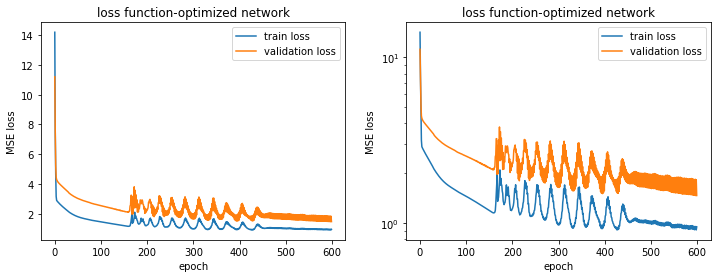

In [9]:
fig=plt.figure(figsize=(12, 4))

ax1=plt.subplot(1, 2, 1)
ax1.plot(net_skorch.history[:, 'train_loss'], label='train loss')
ax1.plot(net_skorch.history[:, 'valid_loss'], label='validation loss')

ax1.set_xlabel('epoch')
ax1.set_ylabel('MSE loss')
ax1.set_title('loss function-optimized network')
ax1.legend()



ax2=plt.subplot(1, 2, 2)
ax2.plot(net_skorch.history[:, 'train_loss'], label='train loss')
ax2.plot(net_skorch.history[:, 'valid_loss'], label='validation loss')

ax2.set_xlabel('epoch')
ax2.set_ylabel('MSE loss')
ax2.set_title('loss function-optimized network')
ax2.legend()
ax2.set_yscale('log')



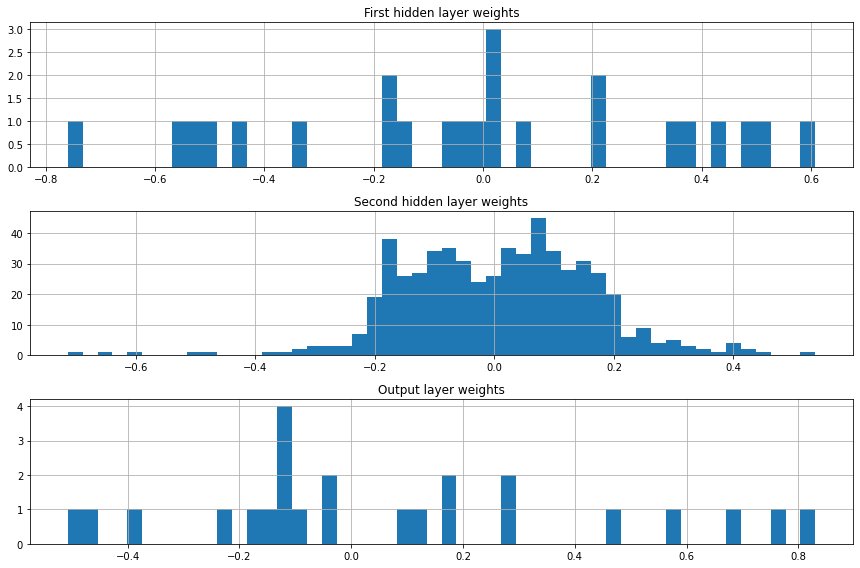

In [10]:
net_skorch.module_.weight_plot('outfile/baseline_trained.png')

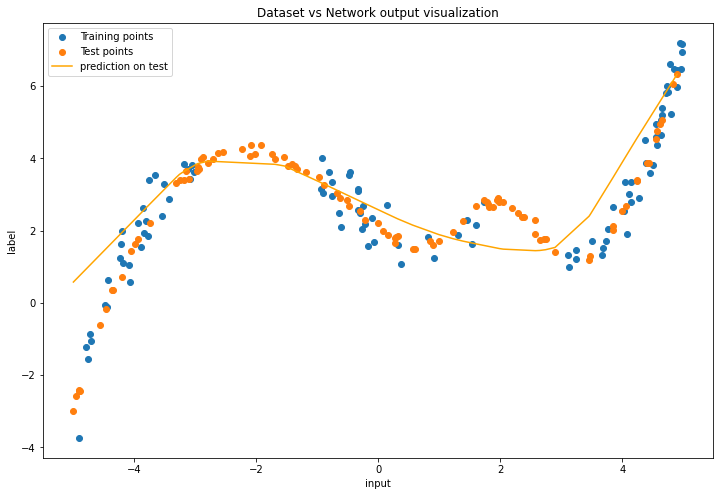

In [11]:
label_test = np.asarray(test_df.label).reshape(-1,1).astype(np.float32)
x_test = np.sort(np.asarray(test_df.input).reshape(-1,1).astype(np.float32), axis=0)
prediction = net_skorch.predict(x_test)

fig = plt.figure(figsize=(12,8))
plt.scatter(train_df.input, train_df.label, label='Training points')
plt.scatter(test_df.input, test_df.label, label='Test points')
plt.plot(x_test, prediction, label='prediction on test', color='orange')
plt.xlabel('input')
plt.ylabel('label')
plt.title('Dataset vs Network output visualization')
plt.legend()
plt.savefig('outfile/output_display.png', dpi=300)
plt.show()

### Complex Model-Method <a name="regression_cm_method"></a>
In addition to the baseline, a more complex model, that could have better prediction capabilities, has been implemented and tested.

The Network structure is the same, being constituted by two linear hidden layers.

The upgrades are the following: 
* the weights have been initialized following a Normal Xavier distribution with gain=$0.01$, as it can be visualized in the weights plot below,
* Dropouts have been included,
* an adaptive procedure for the learning rate, following an exponential decay has been set up in which $lr(t)=lr_0 \cdot \gamma^{t}$.

Moreover now, the Random Search procedure, apart from $N_{h1}, N_{h2}$ and the initial learning rate $lr_0$, aims at optimizing also: 
* the dropout rate
* the activation function
* the $l_2$ regularization amount ('weight-decay')

For each out of 50 trials, the optimization procedure is performed by Adam over 400 epochs.


In [12]:
class Complex_Net(nn.Module):
    
    def __init__(self, Ni, Nh1, Nh2, No, dropout, activation):
        """
        Ni - Input size
        Nh1 - Neurons in the 1st hidden layer
        Nh2 - Neurons in the 2nd hidden layer
        No - Output size
        """
        super().__init__()
        
        print('Network initialized')
        
        self.fc1 = nn.Linear(in_features=Ni, out_features=Nh1)
        self.fc2 = nn.Linear(in_features=Nh1, out_features=Nh2)
        self.out = nn.Linear(in_features=Nh2, out_features=No)
        
        self.act =activation
        
        self.dropout = nn.Dropout(dropout)
       
        
        self.fc1.weight = nn.init.xavier_normal_(self.fc1.weight,  gain=0.01 )
        self.fc2.weight = nn.init.xavier_normal_(self.fc2.weight, gain=0.01 )
        self.out.weigth = nn.init.xavier_normal_(self.out.weight,  gain=0.01)


    def forward(self, x, additional_out=False):
        
        x = self.dropout(x)
        x = self.act(self.fc1(x))
        
        x = self.dropout(x)
        x = self.act(self.fc2(x))
        
        x = self.out(x)
        
        return x

    
    
    def weight_plot(self, file):
        net = self
        h1_w = net.fc1.weight.data.cpu().numpy()
        h1_b = net.fc1.bias.data.cpu().numpy()

        h2_w = net.fc2.weight.data.cpu().numpy()
        h2_b = net.fc2.bias.data.cpu().numpy()

        out_w = net.out.weight.data.cpu().numpy()
        out_b = net.out.bias.data.cpu().numpy()

        fig, axs = plt.subplots(3, 1, figsize=(12,8))
        axs[0].hist(h1_w.flatten(), 50)
        axs[0].set_title('First hidden layer weights')
        axs[1].hist(h2_w.flatten(), 50)
        axs[1].set_title('Second hidden layer weights')
        axs[2].hist(out_w.flatten(), 50)
        axs[2].set_title('Output layer weights')
        [ax.grid() for ax in axs]
        plt.tight_layout()
        plt.savefig(file, dpi=300)
        plt.show()
    

            

        

Network initialized


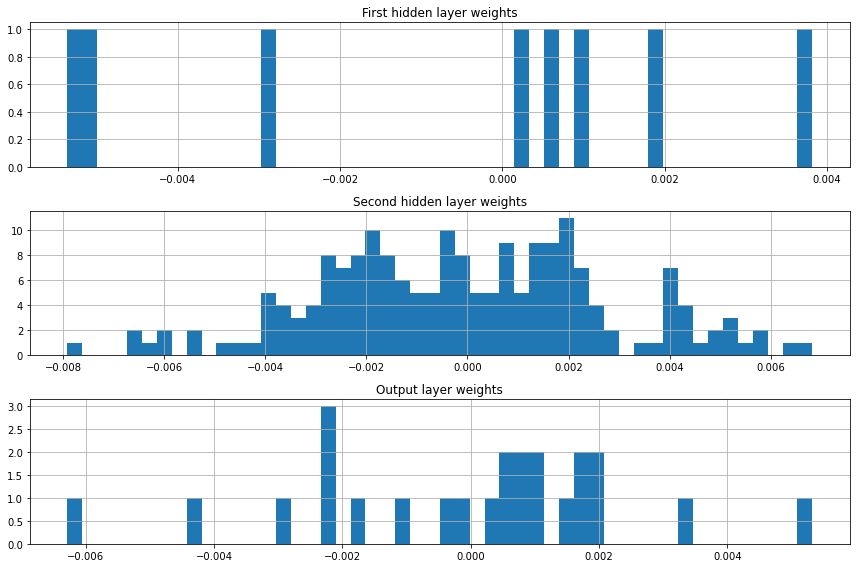

In [13]:
Ni = 1
Nh1 = 8
Nh2 = 24
No = 1

compl_net_skorch = NeuralNetRegressor(
    
                module=Complex_Net(Ni, Nh1, Nh2, No, 0.0, nn.ReLU()),
                max_epochs=400,
    
                callbacks=[
                         ('lr_scheduler',
                             LRScheduler(policy=ExponentialLR,
                                         gamma=0.99)),
                     ],
             
                optimizer = torch.optim.Adam,
                optimizer__lr = 0.1,
                optimizer__weight_decay = 10**-5
)

compl_net_skorch.module.weight_plot('outfile/opt_network_untrained.png')


In [14]:
grid = {'module__Ni' :        [1],
        'module__Nh1':        [8, 16, 24],
        'module__Nh2':        [8, 16, 24],
        'module__No' :        [1],
        'module__dropout':  loguniform.rvs(1e-5, 5e-1, size=500),
        'module__activation':   [nn.ReLU(), nn.LeakyReLU(), nn.Tanh()],
        'optimizer':  [torch.optim.Adam],
                 
       'optimizer__lr':         loguniform.rvs(1e-3, 1e-1, size=500),
       'optimizer__weight_decay': loguniform.rvs(1e-5, 1e-1, size=500),
       }


cv = KFold(n_splits=5, shuffle=True)
gs = RandomizedSearchCV(compl_net_skorch, param_distributions=grid, cv=cv, n_iter=50)
gs.fit(x, label)

Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       11.1249       15.9289  0.0013  0.0216
      2       11.1086       15.9118  0.0013  0.0031
      3       11.0921       15.8942  0.0013  0.0037
      4       11.0751       15.8761  0.0013  0.0027
      5       11.0577       15.8573  0.0013  0.0027
      6       11.0396       15.8376  0.0013  0.0024
      7       11.0207       15.8169  0.0012  0.0033
      8       11.0008       15.7951  0.0012  0.0036
      9       10.9800       15.7723  0.0012  0.0024
     10       10.9581       15.7484  0.0012  0.0026
     11       10.9353       15.7233  0.0012  0.0032
     12       10.9114       15.6971  0.0012  0.0029
     13       10.8865       15.6697  0.0012  0.0033
     14       10.8605       15.6411  0.0012  0.0025
     15       10.8337       15.6112  0.0011  0.0025
     16       10.8052       15.5801  0.0011  0.0046
     17       10.7759       15.5476  0.0011 

    117        4.9603        8.3404  0.0004  0.0027
    118        4.9144        8.2762  0.0004  0.0027
    119        4.8692        8.2127  0.0004  0.0024
    120        4.8247        8.1502  0.0004  0.0029
    121        4.7808        8.0884  0.0004  0.0040
    122        4.7377        8.0275  0.0004  0.0024
    123        4.6952        7.9673  0.0004  0.0021
    124        4.6613        7.9080  0.0004  0.0027
    125        4.6159        7.8495  0.0004  0.0032
    126        4.5718        7.7918  0.0004  0.0027
    127        4.5329        7.7348  0.0004  0.0020
    128        4.4990        7.6786  0.0004  0.0025
    129        4.4568        7.6232  0.0004  0.0032
    130        4.4173        7.5686  0.0004  0.0031
    131        4.4008        7.5147  0.0004  0.0023
    132        4.3675        7.4618  0.0004  0.0029
    133        4.3080        7.4096  0.0003  0.0034
    134        4.2726        7.3582  0.0003  0.0032
    135        4.2380        7.3076  0.0003  0.0033
    136     

    235        2.6958        4.7916  0.0001  0.0023
    236        2.6904        4.7814  0.0001  0.0028
    237        2.6853        4.7714  0.0001  0.0033
    238        2.6802        4.7616  0.0001  0.0021
    239        2.6754        4.7519  0.0001  0.0021
    240        2.6729        4.7424  0.0001  0.0020
    241        2.6657        4.7330  0.0001  0.0021
    242        2.6773        4.7238  0.0001  0.0029
    243        2.6564        4.7146  0.0001  0.0021
    244        2.6520        4.7056  0.0001  0.0023
    245        2.6474        4.6968  0.0001  0.0020
    246        2.6430        4.6881  0.0001  0.0021
    247        2.6386        4.6795  0.0001  0.0023
    248        2.6345        4.6710  0.0001  0.0026
    249        2.6303        4.6627  0.0001  0.0025
    250        2.6262        4.6545  0.0001  0.0024
    251        2.6222        4.6464  0.0001  0.0021
    252        2.6181        4.6384  0.0001  0.0021
    253        2.6143        4.6305  0.0001  0.0021
    254     

    358        2.4101        4.1891  0.0000  0.0021
    359        2.4104        4.1871  0.0000  0.0021
    360        2.4083        4.1851  0.0000  0.0027
    361        2.4075        4.1831  0.0000  0.0029
    362        2.4067        4.1811  0.0000  0.0033
    363        2.4148        4.1792  0.0000  0.0023
    364        2.4050        4.1772  0.0000  0.0021
    365        2.4042        4.1753  0.0000  0.0025
    366        2.4034        4.1735  0.0000  0.0025
    367        2.4027        4.1716  0.0000  0.0029
    368        2.4018        4.1698  0.0000  0.0023
    369        2.4011        4.1679  0.0000  0.0027
    370        2.4003        4.1662  0.0000  0.0027
    371        2.3996        4.1644  0.0000  0.0032
    372        2.3988        4.1626  0.0000  0.0026
    373        2.3852        4.1609  0.0000  0.0021
    374        2.3974        4.1592  0.0000  0.0028
    375        2.3966        4.1575  0.0000  0.0024
    376        2.3957        4.1558  0.0000  0.0029
    377     

     77        7.2098        9.0181  0.0006  0.0028
     78        7.1376        8.9473  0.0006  0.0026
     79        7.0704        8.8767  0.0006  0.0026
     80        7.0157        8.8064  0.0006  0.0021
     81        6.9369        8.7362  0.0006  0.0024
     82        6.8706        8.6662  0.0006  0.0025
     83        6.8049        8.5964  0.0006  0.0026
     84        6.7427        8.5269  0.0006  0.0029
     85        6.6728        8.4578  0.0006  0.0021
     86        6.6120        8.3891  0.0006  0.0024
     87        6.5446        8.3208  0.0006  0.0021
     88        6.4914        8.2529  0.0005  0.0020
     89        6.4192        8.1853  0.0005  0.0027
     90        6.3535        8.1181  0.0005  0.0021
     91        6.2925        8.0512  0.0005  0.0027
     92        6.2296        7.9847  0.0005  0.0025
     93        6.1677        7.9186  0.0005  0.0021
     94        6.1065        7.8528  0.0005  0.0032
     95        6.0461        7.7875  0.0005  0.0024
     96     

    195        3.0418        4.1357  0.0002  0.0024
    196        3.0324        4.1210  0.0002  0.0032
    197        3.0228        4.1065  0.0002  0.0027
    198        3.0138        4.0923  0.0002  0.0027
    199        3.0050        4.0782  0.0002  0.0029
    200        3.0127        4.0644  0.0002  0.0028
    201        2.9950        4.0508  0.0002  0.0029
    202        2.9796        4.0375  0.0002  0.0022
    203        2.9716        4.0244  0.0002  0.0024
    204        2.9968        4.0114  0.0002  0.0022
    205        2.9608        3.9987  0.0002  0.0024
    206        2.9481        3.9862  0.0002  0.0030
    207        2.9406        3.9739  0.0002  0.0023
    208        2.9333        3.9618  0.0002  0.0026
    209        2.9261        3.9499  0.0002  0.0023
    210        2.9191        3.9381  0.0002  0.0030
    211        2.9122        3.9266  0.0002  0.0041
    212        2.9054        3.9153  0.0002  0.0022
    213        2.8988        3.9042  0.0002  0.0023
    214     

    320        2.5779        3.3125  0.0001  0.0022
    321        2.5887        3.3101  0.0001  0.0020
    322        2.5876        3.3076  0.0001  0.0031
    323        2.5866        3.3053  0.0001  0.0023
    324        2.5930        3.3029  0.0001  0.0024
    325        2.5888        3.3006  0.0001  0.0030
    326        2.5886        3.2983  0.0001  0.0026
    327        2.5825        3.2960  0.0000  0.0034
    328        2.6075        3.2938  0.0000  0.0021
    329        2.5806        3.2915  0.0000  0.0024
    330        2.5796        3.2894  0.0000  0.0022
    331        2.5787        3.2872  0.0000  0.0029
    332        2.5796        3.2851  0.0000  0.0035
    333        2.5835        3.2830  0.0000  0.0026
    334        2.5759        3.2809  0.0000  0.0031
    335        2.5769        3.2788  0.0000  0.0022
    336        2.5752        3.2768  0.0000  0.0029
    337        2.5733        3.2748  0.0000  0.0028
    338        2.5724        3.2728  0.0000  0.0028
    339     

     42        9.8594       16.5173  0.0009  0.0021
     43        9.7865       16.4232  0.0009  0.0020
     44        9.7186       16.3274  0.0009  0.0020
     45        9.6371       16.2297  0.0008  0.0022
     46        9.5606       16.1303  0.0008  0.0021
     47        9.4830       16.0292  0.0008  0.0022
     48        9.4043       15.9265  0.0008  0.0021
     49        9.3245       15.8223  0.0008  0.0021
     50        9.2438       15.7164  0.0008  0.0022
     51        9.1621       15.6091  0.0008  0.0019
     52        9.0828       15.5004  0.0008  0.0035
     53        8.9962       15.3903  0.0008  0.0022
     54        8.9120       15.2789  0.0008  0.0022
     55        8.8272       15.1663  0.0008  0.0022
     56        8.7444       15.0526  0.0008  0.0021
     57        8.6555       14.9377  0.0007  0.0022
     58        8.5688       14.8219  0.0007  0.0023
     59        8.4816       14.7050  0.0007  0.0029
     60        8.3960       14.5872  0.0007  0.0022
     61     

    160        2.8313        5.8901  0.0003  0.0034
    161        2.8150        5.8538  0.0003  0.0025
    162        2.7991        5.8182  0.0003  0.0036
    163        2.7814        5.7833  0.0003  0.0021
    164        2.7687        5.7490  0.0003  0.0026
    165        2.7541        5.7155  0.0003  0.0032
    166        2.7411        5.6827  0.0003  0.0024
    167        2.7286        5.6507  0.0002  0.0026
    168        2.7205        5.6194  0.0002  0.0020
    169        2.7114        5.5887  0.0002  0.0025
    170        2.6997        5.5587  0.0002  0.0023
    171        2.6743        5.5293  0.0002  0.0029
    172        2.6499        5.5006  0.0002  0.0022
    173        2.6439        5.4725  0.0002  0.0021
    174        2.6429        5.4449  0.0002  0.0022
    175        2.6337        5.4180  0.0002  0.0027
    176        2.6170        5.3917  0.0002  0.0021
    177        2.6065        5.3658  0.0002  0.0021
    178        2.6097        5.3404  0.0002  0.0023
    179     

    280        2.2121        4.2131  0.0001  0.0020
    281        2.2107        4.2092  0.0001  0.0021
    282        2.2337        4.2053  0.0001  0.0027
    283        2.2077        4.2015  0.0001  0.0027
    284        2.2127        4.1978  0.0001  0.0029
    285        2.2068        4.1941  0.0001  0.0025
    286        2.2067        4.1905  0.0001  0.0023
    287        2.2080        4.1869  0.0001  0.0039
    288        2.2231        4.1834  0.0001  0.0030
    289        2.2029        4.1800  0.0001  0.0031
    290        2.2019        4.1766  0.0001  0.0022
    291        2.2010        4.1732  0.0001  0.0026
    292        2.2001        4.1699  0.0001  0.0035
    293        2.1992        4.1666  0.0001  0.0031
    294        2.1983        4.1634  0.0001  0.0025
    295        2.1962        4.1602  0.0001  0.0035
    296        2.1966        4.1571  0.0001  0.0035
    297        2.1957        4.1540  0.0001  0.0026
    298        2.1950        4.1510  0.0001  0.0028
    299     

      8        9.3537       15.8789  0.0012  0.0021
      9        9.3343       15.8557  0.0012  0.0023
     10        9.3142       15.8315  0.0012  0.0021
     11        9.2934       15.8065  0.0012  0.0020
     12        9.2719       15.7806  0.0012  0.0021
     13        9.2497       15.7538  0.0012  0.0022
     14        9.2268       15.7260  0.0012  0.0033
     15        9.2032       15.6973  0.0011  0.0022
     16        9.1789       15.6676  0.0011  0.0027
     17        9.1537       15.6368  0.0011  0.0021
     18        9.1279       15.6051  0.0011  0.0024
     19        9.1013       15.5722  0.0011  0.0028
     20        9.0740       15.5384  0.0011  0.0022
     21        9.0457       15.5034  0.0011  0.0031
     22        9.0168       15.4674  0.0011  0.0023
     23        8.9870       15.4302  0.0011  0.0034
     24        8.9566       15.3920  0.0010  0.0021
     25        8.9253       15.3526  0.0010  0.0022
     26        8.8933       15.3122  0.0010  0.0028
     27     

    126        4.4464        8.6425  0.0004  0.0023
    127        4.4149        8.5874  0.0004  0.0026
    128        4.3838        8.5330  0.0004  0.0023
    129        4.3532        8.4791  0.0004  0.0030
    130        4.3379        8.4259  0.0004  0.0037
    131        4.2944        8.3734  0.0004  0.0035
    132        4.2640        8.3214  0.0004  0.0025
    133        4.2352        8.2701  0.0003  0.0027
    134        4.2067        8.2194  0.0003  0.0028
    135        4.1765        8.1693  0.0003  0.0027
    136        4.1513        8.1197  0.0003  0.0022
    137        4.1240        8.0708  0.0003  0.0022
    138        4.0974        8.0225  0.0003  0.0033
    139        4.0772        7.9748  0.0003  0.0022
    140        4.0451        7.9277  0.0003  0.0031
    141        4.0196        7.8812  0.0003  0.0022
    142        4.0006        7.8353  0.0003  0.0031
    143        4.0048        7.7901  0.0003  0.0024
    144        3.9614        7.7454  0.0003  0.0023
    145     

    244        2.7822        5.3661  0.0001  0.0032
    245        2.7615        5.3554  0.0001  0.0025
    246        2.7596        5.3450  0.0001  0.0038
    247        2.7550        5.3347  0.0001  0.0038
    248        2.7503        5.3245  0.0001  0.0020
    249        2.7459        5.3145  0.0001  0.0024
    250        2.7415        5.3045  0.0001  0.0046
    251        2.7296        5.2947  0.0001  0.0026
    252        2.7330        5.2851  0.0001  0.0026
    253        2.7288        5.2756  0.0001  0.0022
    254        2.7246        5.2662  0.0001  0.0021
    255        2.7207        5.2570  0.0001  0.0026
    256        2.7165        5.2479  0.0001  0.0023
    257        2.7125        5.2389  0.0001  0.0028
    258        2.7087        5.2300  0.0001  0.0020
    259        2.7047        5.2213  0.0001  0.0024
    260        2.7031        5.2126  0.0001  0.0024
    261        2.6981        5.2041  0.0001  0.0022
    262        2.6935        5.1957  0.0001  0.0029
    263     

    366        2.4761        4.7072  0.0000  0.0024
    367        2.4828        4.7048  0.0000  0.0028
    368        2.4826        4.7024  0.0000  0.0032
    369        2.4817        4.7001  0.0000  0.0028
    370        2.4807        4.6978  0.0000  0.0022
    371        2.4797        4.6955  0.0000  0.0031
    372        2.4786        4.6932  0.0000  0.0023
    373        2.4778        4.6910  0.0000  0.0023
    374        2.4769        4.6888  0.0000  0.0026
    375        2.4734        4.6866  0.0000  0.0022
    376        2.4750        4.6844  0.0000  0.0031
    377        2.4739        4.6823  0.0000  0.0023
    378        2.4733        4.6801  0.0000  0.0021
    379        2.4737        4.6780  0.0000  0.0019
    380        2.4715        4.6760  0.0000  0.0022
    381        2.4719        4.6739  0.0000  0.0021
    382        2.4698        4.6719  0.0000  0.0021
    383        2.4700        4.6699  0.0000  0.0022
    384        2.4681        4.6679  0.0000  0.0024
    385     

     84        4.8463        7.5364  0.0006  0.0023
     85        4.7550        7.4184  0.0006  0.0025
     86        4.6657        7.3024  0.0006  0.0030
     87        4.5783        7.1884  0.0006  0.0029
     88        4.4929        7.0765  0.0005  0.0026
     89        4.4095        6.9668  0.0005  0.0032
     90        4.3283        6.8594  0.0005  0.0026
     91        4.2490        6.7542  0.0005  0.0025
     92        4.1764        6.6512  0.0005  0.0028
     93        4.0965        6.5506  0.0005  0.0021
     94        4.0233        6.4522  0.0005  0.0021
     95        3.9522        6.3562  0.0005  0.0023
     96        3.9530        6.2626  0.0005  0.0022
     97        3.8192        6.1713  0.0005  0.0025
     98        3.7510        6.0823  0.0005  0.0023
     99        3.6880        5.9957  0.0005  0.0021
    100        3.6270        5.9114  0.0005  0.0025
    101        3.6056        5.8295  0.0005  0.0022
    102        3.5108        5.7498  0.0005  0.0022
    103     

    204        2.1695        3.7008  0.0002  0.0022
    205        2.1780        3.7000  0.0002  0.0030
    206        2.1780        3.6993  0.0002  0.0020
    207        2.1753        3.6987  0.0002  0.0021
    208        2.1739        3.6982  0.0002  0.0022
    209        2.1629        3.6978  0.0002  0.0019
    210        2.1715        3.6975  0.0002  0.0020
    211        2.1703        3.6973  0.0002  0.0020
    212        2.1906        3.6972  0.0002  0.0021
    213        2.1678        3.6971  0.0002  0.0021
    214        2.1667        3.6970  0.0002  0.0022
    215        2.1654        3.6969  0.0002  0.0021
    216        2.1687        3.6968  0.0002  0.0021
    217        2.1688        3.6967  0.0002  0.0022
    218        2.1817        3.6966  0.0001  0.0022
    219        2.1611        3.6965  0.0001  0.0022
    220        2.1528        3.6964  0.0001  0.0021
    221        2.1622        3.6963  0.0001  0.0030
    222        2.1579        3.6963  0.0001  0.0023
    223     

    357        2.0935        3.7281  0.0000  0.0030
    358        2.0958        3.7283  0.0000  0.0021
    359        2.0931        3.7285  0.0000  0.0027
    360        2.0934        3.7287  0.0000  0.0024
    361        2.1165        3.7288  0.0000  0.0037
    362        2.0926        3.7290  0.0000  0.0025
    363        2.0924        3.7292  0.0000  0.0026
    364        2.1006        3.7294  0.0000  0.0035
    365        2.0921        3.7296  0.0000  0.0024
    366        2.1041        3.7298  0.0000  0.0025
    367        2.0917        3.7300  0.0000  0.0029
    368        2.0915        3.7301  0.0000  0.0035
    369        2.0913        3.7303  0.0000  0.0024
    370        2.0681        3.7305  0.0000  0.0026
    371        2.0910        3.7307  0.0000  0.0038
    372        2.0791        3.7308  0.0000  0.0031
    373        2.0820        3.7310  0.0000  0.0028
    374        2.1050        3.7311  0.0000  0.0030
    375        2.0904        3.7313  0.0000  0.0025
    376     

    106        1.3102        2.0032  0.0105  0.0033
    107        1.3228        2.0475  0.0104  0.0033
    108        1.4082        2.1069  0.0103  0.0025
    109        1.4841        2.1356  0.0102  0.0025
    110        2.0640        2.0575  0.0101  0.0026
    111        1.3602        1.9844  0.0100  0.0023
    112        1.2156        1.9175  0.0099  0.0033
    113        1.2700        1.9440  0.0098  0.0025
    114        1.5317        2.0398  0.0097  0.0023
    115        1.5076        2.1366  0.0096  0.0029
    116        1.1098        2.1382  0.0095  0.0032
    117        1.2533        2.0832  0.0094  0.0022
    118        1.4079        1.9877  0.0093  0.0023
    119        1.1866        1.9778  0.0092  0.0023
    120        1.3297        2.0138  0.0091  0.0030
    121        1.3100        2.0310  0.0090  0.0033
    122        1.3779        2.0102  0.0090  0.0037
    123        1.2721        1.9897  0.0089  0.0031
    124        1.2971        1.9651  0.0088  0.0023
    125     

    260        0.9435        1.6492  0.0022  0.0035
    261        1.0996        1.6794  0.0022  0.0030
    262        1.3504        1.7121  0.0022  0.0026
    263        0.9455        1.7265  0.0022  0.0020
    264        0.9416        1.7264  0.0021  0.0034
    265        1.1804        1.7318  0.0021  0.0026
    266        0.9452        1.7139  0.0021  0.0021
    267        0.8243        1.6842  0.0021  0.0024
    268        1.0235        1.6492  0.0021  0.0023
    269        1.0111        1.6033  0.0020  0.0030
    270        0.8880        1.5608  0.0020  0.0036
    271        1.0144        1.5377  0.0020  0.0034
    272        1.3785        1.5503  0.0020  0.0025
    273        1.0649        1.5802  0.0020  0.0027
    274        1.0206        1.6002  0.0019  0.0037
    275        1.0813        1.6154  0.0019  0.0028
    276        0.8458        1.6302  0.0019  0.0032
    277        0.9556        1.6291  0.0019  0.0024
    278        1.1368        1.6305  0.0019  0.0035
    279     

     10        2.6096        1.4668  0.0276  0.0034
     11        3.3929        1.4157  0.0273  0.0020
     12        3.4464        1.3465  0.0270  0.0026
     13        3.4152        1.4091  0.0268  0.0025
     14        2.3158        1.7160  0.0265  0.0026
     15        2.3344        2.1839  0.0262  0.0034
     16        1.9242        2.6420  0.0260  0.0031
     17        2.1718        2.9825  0.0257  0.0030
     18        2.3483        3.1825  0.0255  0.0024
     19        2.4880        3.2392  0.0252  0.0031
     20        2.3397        3.1587  0.0250  0.0031
     21        2.5228        2.9846  0.0247  0.0027
     22        2.2840        2.7171  0.0245  0.0023
     23        2.3967        2.4000  0.0242  0.0022
     24        2.0656        2.0906  0.0240  0.0034
     25        1.9892        1.9117  0.0237  0.0030
     26        1.7878        1.7235  0.0235  0.0033
     27        1.7962        1.5314  0.0233  0.0028
     28        2.2454        1.5381  0.0230  0.0041
     29     

    162        1.1782        1.2041  0.0060  0.0021
    163        1.1945        1.2211  0.0059  0.0024
    164        1.3239        1.2151  0.0059  0.0024
    165        0.9754        1.1810  0.0058  0.0024
    166        0.9509        1.1453  0.0058  0.0026
    167        1.3342        1.1202  0.0057  0.0023
    168        1.1015        1.1049  0.0056  0.0029
    169        1.0984        1.0921  0.0056  0.0023
    170        1.0782        1.0845  0.0055  0.0024
    171        1.3332        1.0801  0.0055  0.0023
    172        1.0596        1.0773  0.0054  0.0021
    173        1.0008        1.0786  0.0054  0.0022
    174        0.9949        1.0688  0.0053  0.0021
    175        1.1358        1.0667  0.0053  0.0027
    176        0.9184        1.0630  0.0052  0.0022
    177        1.3282        1.0588  0.0052  0.0026
    178        1.1002        1.0610  0.0051  0.0029
    179        1.0351        1.0578  0.0050  0.0027
    180        1.4509        1.0535  0.0050  0.0024
    181     

    314        0.6812        0.8278  0.0013  0.0023
    315        0.6311        0.8316  0.0013  0.0025
    316        0.6841        0.8333  0.0013  0.0036
    317        0.7824        0.8323  0.0013  0.0026
    318        0.8213        0.8281  0.0012  0.0025
    319        0.7449        0.8185  0.0012  0.0029
    320        0.5605        0.8091  0.0012  0.0028
    321        0.6261        0.7957  0.0012  0.0027
    322        0.6453        0.7812  0.0012  0.0028
    323        0.9375        0.7700  0.0012  0.0024
    324        0.6456        0.7609  0.0012  0.0026
    325        0.6260        0.7542  0.0012  0.0033
    326        0.6645        0.7460  0.0012  0.0027
    327        0.9682        0.7422  0.0011  0.0024
    328        0.6677        0.7385  0.0011  0.0026
    329        0.6087        0.7385  0.0011  0.0030
    330        0.6082        0.7415  0.0011  0.0025
    331        0.7247        0.7499  0.0011  0.0029
    332        0.9624        0.7616  0.0011  0.0027
    333     

     62        1.2958        2.3705  0.0164  0.0022
     63        1.3246        2.3149  0.0162  0.0024
     64        1.4056        2.2637  0.0160  0.0030
     65        1.1707        2.2865  0.0159  0.0031
     66        1.2919        2.2407  0.0157  0.0027
     67        1.4014        2.1082  0.0156  0.0024
     68        1.1886        2.0699  0.0154  0.0021
     69        1.2331        2.0401  0.0152  0.0033
     70        1.2471        2.0730  0.0151  0.0024
     71        1.4192        2.1230  0.0149  0.0027
     72        1.2949        2.0524  0.0148  0.0025
     73        1.2781        2.0873  0.0146  0.0023
     74        1.1997        2.2399  0.0145  0.0026
     75        1.2854        2.3741  0.0144  0.0031
     76        1.5164        2.1747  0.0142  0.0033
     77        1.3774        2.1007  0.0141  0.0027
     78        1.4284        2.2188  0.0139  0.0034
     79        1.4861        2.5094  0.0138  0.0031
     80        1.4375        2.6209  0.0137  0.0038
     81     

    216        1.0286        1.7980  0.0035  0.0025
    217        0.9565        1.7511  0.0034  0.0031
    218        0.9210        1.7421  0.0034  0.0024
    219        1.2864        1.7685  0.0034  0.0032
    220        0.8862        1.7898  0.0033  0.0023
    221        0.9354        1.7970  0.0033  0.0024
    222        0.9901        1.7906  0.0033  0.0026
    223        1.4122        1.8228  0.0032  0.0029
    224        1.2143        1.8499  0.0032  0.0033
    225        1.1111        1.8539  0.0032  0.0035
    226        1.3650        1.8740  0.0031  0.0030
    227        0.9129        1.8893  0.0031  0.0023
    228        1.0153        1.8909  0.0031  0.0029
    229        1.0043        1.8815  0.0031  0.0026
    230        0.9419        1.8728  0.0030  0.0025
    231        1.2007        1.8588  0.0030  0.0023
    232        1.1797        1.8277  0.0030  0.0026
    233        0.9017        1.7920  0.0029  0.0037
    234        0.9419        1.7389  0.0029  0.0024
    235     

    370        0.8166        1.6093  0.0007  0.0023
    371        0.7066        1.6203  0.0007  0.0035
    372        0.9016        1.6294  0.0007  0.0033
    373        0.6726        1.6341  0.0007  0.0033
    374        0.8651        1.6396  0.0007  0.0030
    375        0.7316        1.6436  0.0007  0.0035
    376        0.7341        1.6438  0.0007  0.0031
    377        1.0362        1.6418  0.0007  0.0028
    378        0.8678        1.6327  0.0007  0.0024
    379        0.9814        1.6215  0.0007  0.0033
    380        0.8048        1.6071  0.0007  0.0034
    381        0.9017        1.5925  0.0007  0.0027
    382        0.9359        1.5770  0.0007  0.0025
    383        1.2500        1.5686  0.0006  0.0023
    384        0.8129        1.5590  0.0006  0.0043
    385        0.8287        1.5556  0.0006  0.0040
    386        0.8109        1.5604  0.0006  0.0026
    387        1.1897        1.5707  0.0006  0.0026
    388        0.7394        1.5808  0.0006  0.0031
    389     

    117        0.7456        1.9071  0.0094  0.0033
    118        1.0274        1.9555  0.0093  0.0027
    119        0.8258        1.9590  0.0092  0.0035
    120        0.9996        1.9128  0.0091  0.0021
    121        1.0389        1.8976  0.0090  0.0024
    122        1.1695        1.8587  0.0090  0.0022
    123        0.7279        1.8592  0.0089  0.0032
    124        1.0322        1.9165  0.0088  0.0025
    125        0.8710        2.0402  0.0087  0.0029
    126        0.7863        2.1047  0.0086  0.0024
    127        0.7439        1.9580  0.0085  0.0033
    128        0.8758        1.7849  0.0084  0.0026
    129        0.9033        1.6727  0.0083  0.0067
    130        0.7685        1.6740  0.0083  0.0020
    131        0.7019        1.7905  0.0082  0.0021
    132        0.8819        2.0210  0.0081  0.0021
    133        0.8791        2.3222  0.0080  0.0023
    134        0.9143        2.2849  0.0079  0.0020
    135        0.9883        2.1197  0.0079  0.0022
    136     

    269        0.3612        1.3377  0.0020  0.0025
    270        0.4061        1.3072  0.0020  0.0024
    271        0.5248        1.2801  0.0020  0.0035
    272        0.5048        1.2503  0.0020  0.0024
    273        0.7440        1.2535  0.0020  0.0025
    274        0.3757        1.2663  0.0019  0.0022
    275        0.5106        1.2817  0.0019  0.0021
    276        0.4155        1.2894  0.0019  0.0033
    277        0.3605        1.3066  0.0019  0.0033
    278        0.5141        1.3245  0.0019  0.0028
    279        0.5365        1.3393  0.0018  0.0036
    280        0.6037        1.3396  0.0018  0.0029
    281        0.4066        1.3518  0.0018  0.0020
    282        0.5426        1.3420  0.0018  0.0022
    283        0.3739        1.3252  0.0018  0.0027
    284        0.3341        1.3071  0.0018  0.0024
    285        0.4432        1.3019  0.0017  0.0031
    286        0.3622        1.2986  0.0017  0.0036
    287        0.4498        1.2841  0.0017  0.0026
    288     

     18        1.8600        4.8863  0.0255  0.0023
     19        2.0855        5.4676  0.0252  0.0023
     20        2.2998        5.9062  0.0250  0.0023
     21        2.3450        6.1965  0.0247  0.0033
     22        2.4705        6.3189  0.0245  0.0025
     23        2.7166        6.3133  0.0242  0.0024
     24        2.3454        6.1746  0.0240  0.0022
     25        2.3618        5.9238  0.0237  0.0021
     26        2.3180        5.6049  0.0235  0.0032
     27        2.2532        5.2554  0.0233  0.0027
     28        2.1353        4.8966  0.0230  0.0024
     29        2.0128        4.5534  0.0228  0.0033
     30        2.0568        4.2547  0.0226  0.0029
     31        1.9909        4.0203  0.0223  0.0033
     32        1.8653        3.8422  0.0221  0.0025
     33        2.1683        3.7457  0.0219  0.0027
     34        2.3008        3.7093  0.0217  0.0021
     35        1.9729        3.7134  0.0215  0.0026
     36        2.0343        3.7663  0.0212  0.0037
     37     

    171        1.3826        2.5811  0.0055  0.0024
    172        1.5204        2.5966  0.0054  0.0028
    173        1.5548        2.6356  0.0054  0.0022
    174        1.5021        2.6622  0.0053  0.0022
    175        1.6622        2.6809  0.0053  0.0020
    176        1.5701        2.6786  0.0052  0.0019
    177        1.5942        2.6524  0.0052  0.0022
    178        1.5238        2.6182  0.0051  0.0023
    179        1.4922        2.5928  0.0050  0.0025
    180        1.4594        2.5699  0.0050  0.0025
    181        1.4729        2.5657  0.0049  0.0024
    182        1.4987        2.5820  0.0049  0.0024
    183        1.6237        2.5999  0.0048  0.0023
    184        1.6238        2.5809  0.0048  0.0030
    185        1.4238        2.5985  0.0048  0.0025
    186        1.3708        2.5952  0.0047  0.0023
    187        1.5520        2.5670  0.0047  0.0024
    188        1.3550        2.5243  0.0046  0.0030
    189        1.6923        2.4870  0.0046  0.0027
    190     

    323        1.3263        2.2221  0.0012  0.0024
    324        1.1679        2.2365  0.0012  0.0020
    325        1.4432        2.2522  0.0012  0.0024
    326        1.3952        2.2652  0.0012  0.0026
    327        1.5356        2.2732  0.0011  0.0023
    328        1.2073        2.2784  0.0011  0.0036
    329        1.4648        2.2781  0.0011  0.0025
    330        1.2892        2.2729  0.0011  0.0024
    331        1.5732        2.2663  0.0011  0.0022
    332        1.4174        2.2593  0.0011  0.0025
    333        1.2973        2.2483  0.0011  0.0027
    334        1.4685        2.2339  0.0011  0.0021
    335        1.3381        2.2151  0.0011  0.0024
    336        1.1630        2.2024  0.0010  0.0025
    337        1.4041        2.1951  0.0010  0.0033
    338        1.2832        2.1885  0.0010  0.0033
    339        1.5404        2.1862  0.0010  0.0029
    340        1.3930        2.1873  0.0010  0.0021
    341        1.2953        2.1888  0.0010  0.0023
    342     

     69        0.7072        2.0630  0.0354  0.0026
     70        0.6925        2.5389  0.0351  0.0022
     71        1.2638        2.6057  0.0347  0.0026
     72        1.1114        2.1484  0.0344  0.0030
     73        0.7746        1.8024  0.0340  0.0026
     74        0.6398        1.9362  0.0337  0.0027
     75        0.9947        1.8766  0.0333  0.0023
     76        0.7199        2.3698  0.0330  0.0027
     77        0.4815        2.8660  0.0327  0.0033
     78        0.9848        2.5340  0.0324  0.0024
     79        0.7513        1.6160  0.0320  0.0027
     80        1.1889        1.4954  0.0317  0.0022
     81        0.7610        2.0157  0.0314  0.0033
     82        0.4742        3.2279  0.0311  0.0027
     83        1.1730        3.0633  0.0308  0.0021
     84        0.9850        1.8165  0.0305  0.0024
     85        1.3616        1.6659  0.0302  0.0020
     86        0.8700        2.0030  0.0299  0.0029
     87        0.7556        2.4668  0.0296  0.0034
     88     

    225        0.4170        2.1839  0.0074  0.0029
    226        0.5543        2.3581  0.0073  0.0025
    227        0.5926        2.4566  0.0072  0.0018
    228        1.0644        2.5081  0.0072  0.0023
    229        0.5699        2.4878  0.0071  0.0031
    230        0.5229        2.4318  0.0070  0.0030
    231        0.3556        2.3972  0.0070  0.0023
    232        0.5992        2.3659  0.0069  0.0029
    233        0.6276        2.2782  0.0068  0.0024
    234        0.9444        2.2056  0.0067  0.0024
    235        0.5958        2.1329  0.0067  0.0023
    236        0.7174        2.0650  0.0066  0.0026
    237        0.7055        2.0793  0.0065  0.0031
    238        0.6704        2.0837  0.0065  0.0024
    239        0.4892        2.1081  0.0064  0.0029
    240        0.5841        2.1333  0.0064  0.0024
    241        0.7093        2.1174  0.0063  0.0028
    242        0.9142        2.1327  0.0062  0.0030
    243        0.6829        2.1344  0.0062  0.0024
    244     

    383        0.4653        2.3540  0.0015  0.0024
    384        0.8044        2.3631  0.0015  0.0030
    385        0.6933        2.3608  0.0015  0.0021
    386        0.4032        2.3385  0.0015  0.0022
    387        0.4633        2.3171  0.0014  0.0030
    388        0.3724        2.2941  0.0014  0.0025
    389        0.6517        2.2706  0.0014  0.0028
    390        0.6716        2.2392  0.0014  0.0023
    391        0.6115        2.2182  0.0014  0.0030
    392        0.8033        2.1795  0.0014  0.0034
    393        0.5878        2.1334  0.0014  0.0033
    394        0.9486        2.0960  0.0014  0.0023
    395        0.4712        2.0685  0.0013  0.0025
    396        0.8831        2.0503  0.0013  0.0032
    397        0.4342        2.0426  0.0013  0.0033
    398        1.1293        2.0482  0.0013  0.0032
    399        0.5595        2.0636  0.0013  0.0024
    400        1.0042        2.0791  0.0013  0.0029
Network initialized
  epoch    train_loss    valid_loss      lr 

    131        0.5633        1.1933  0.0190  0.0031
    132        0.6114        1.5294  0.0188  0.0030
    133        0.6705        1.7113  0.0186  0.0022
    134        0.9212        1.6251  0.0184  0.0026
    135        0.8927        1.2953  0.0182  0.0027
    136        0.5615        1.1135  0.0181  0.0023
    137        0.6618        1.1172  0.0179  0.0024
    138        0.8245        1.2376  0.0177  0.0022
    139        0.5676        1.4421  0.0175  0.0026
    140        0.4502        1.6180  0.0174  0.0038
    141        1.2612        1.6634  0.0172  0.0026
    142        0.3747        1.5806  0.0170  0.0024
    143        0.9996        1.3725  0.0168  0.0026
    144        0.5303        1.2220  0.0167  0.0034
    145        1.0112        1.1080  0.0165  0.0032
    146        1.0014        1.1920  0.0163  0.0028
    147        1.1351        1.3872  0.0162  0.0021
    148        0.4864        1.5412  0.0160  0.0031
    149        0.6630        1.5090  0.0158  0.0033
    150     

    288        0.3338        1.4068  0.0039  0.0029
    289        0.6705        1.4023  0.0039  0.0033
    290        0.5130        1.3701  0.0038  0.0024
    291        0.6802        1.3413  0.0038  0.0031
    292        0.8193        1.3015  0.0038  0.0023
    293        0.5953        1.2628  0.0037  0.0031
    294        0.9809        1.2136  0.0037  0.0028
    295        0.6423        1.2019  0.0037  0.0026
    296        0.3984        1.2375  0.0036  0.0023
    297        0.5205        1.2834  0.0036  0.0025
    298        0.7740        1.3331  0.0035  0.0040
    299        0.7975        1.3834  0.0035  0.0024
    300        0.7142        1.4267  0.0035  0.0028
    301        0.6645        1.4473  0.0034  0.0023
    302        1.1304        1.4324  0.0034  0.0033
    303        0.6698        1.4198  0.0034  0.0033
    304        0.7763        1.3946  0.0033  0.0028
    305        0.5720        1.3648  0.0033  0.0023
    306        0.6957        1.3468  0.0033  0.0027
    307     

     39        1.6602        3.4127  0.0479  0.0019
     40        1.7979        3.4841  0.0474  0.0023
     41        1.5755        3.0179  0.0469  0.0031
     42        1.7382        2.6612  0.0465  0.0027
     43        1.8825        2.7948  0.0460  0.0027
     44        1.6758        2.9357  0.0455  0.0026
     45        1.6847        2.8906  0.0451  0.0024
     46        1.6417        2.7312  0.0446  0.0026
     47        1.4910        2.8339  0.0442  0.0023
     48        1.5216        2.7611  0.0437  0.0031
     49        1.3986        2.6146  0.0433  0.0025
     50        1.3094        2.4372  0.0429  0.0028
     51        1.4441        2.5621  0.0424  0.0027
     52        1.4632        2.8198  0.0420  0.0025
     53        1.4381        3.2138  0.0416  0.0030
     54        1.6072        2.7646  0.0412  0.0025
     55        1.2235        2.0952  0.0408  0.0035
     56        1.5709        2.1287  0.0404  0.0022
     57        1.5639        3.0395  0.0400  0.0037
     58     

    191        0.9964        2.2461  0.0104  0.0020
    192        0.6246        2.1274  0.0103  0.0027
    193        0.5439        2.1017  0.0102  0.0027
    194        0.5845        2.0177  0.0101  0.0022
    195        0.6306        2.0528  0.0100  0.0026
    196        0.4092        2.1518  0.0099  0.0031
    197        0.6253        2.2053  0.0098  0.0033
    198        0.8359        2.2073  0.0097  0.0022
    199        0.4756        2.2794  0.0096  0.0019
    200        0.5830        2.4100  0.0095  0.0025
    201        0.4258        2.5100  0.0094  0.0029
    202        0.5559        2.5613  0.0093  0.0028
    203        0.7385        2.4891  0.0092  0.0024
    204        0.8602        2.2348  0.0091  0.0023
    205        0.8629        2.1875  0.0090  0.0027
    206        0.7746        2.1665  0.0089  0.0030
    207        0.7886        2.2675  0.0088  0.0029
    208        0.6708        2.3130  0.0088  0.0027
    209        1.0640        2.3698  0.0087  0.0022
    210     

    349        0.7097        2.3138  0.0021  0.0023
    350        0.6328        2.2856  0.0021  0.0024
    351        0.7159        2.2654  0.0021  0.0034
    352        0.6188        2.2638  0.0021  0.0029
    353        0.7376        2.2781  0.0020  0.0029
    354        0.7612        2.3095  0.0020  0.0022
    355        0.4828        2.3287  0.0020  0.0029
    356        0.4257        2.3386  0.0020  0.0028
    357        1.1296        2.3394  0.0020  0.0024
    358        0.8040        2.3451  0.0019  0.0022
    359        0.5052        2.3613  0.0019  0.0022
    360        0.7553        2.3703  0.0019  0.0033
    361        0.3753        2.3793  0.0019  0.0029
    362        0.3810        2.3937  0.0019  0.0025
    363        0.7482        2.4106  0.0018  0.0023
    364        0.7996        2.4622  0.0018  0.0025
    365        0.3706        2.5135  0.0018  0.0033
    366        0.6393        2.5523  0.0018  0.0029
    367        0.8766        2.5754  0.0018  0.0028
    368     

     97        1.1255        2.1229  0.0267  0.0024
     98        0.8081        2.2019  0.0265  0.0027
     99        0.7686        2.6858  0.0262  0.0030
    100        0.9133        3.0803  0.0259  0.0027
    101        1.0111        3.0408  0.0257  0.0026
    102        0.9732        2.7942  0.0254  0.0023
    103        0.8416        2.5260  0.0252  0.0025
    104        0.6767        2.3894  0.0249  0.0032
    105        0.6351        2.5248  0.0247  0.0029
    106        0.7431        2.6507  0.0244  0.0021
    107        0.8642        2.6761  0.0242  0.0021
    108        1.1505        2.7288  0.0239  0.0022
    109        0.8268        2.6963  0.0237  0.0031
    110        0.8269        2.7291  0.0235  0.0030
    111        0.9539        2.7265  0.0232  0.0024
    112        1.0400        2.6327  0.0230  0.0024
    113        0.5363        2.5367  0.0228  0.0027
    114        0.4712        2.4916  0.0225  0.0039
    115        1.1554        2.4915  0.0223  0.0028
    116     

    254        0.6636        2.2879  0.0055  0.0029
    255        0.8677        2.2717  0.0055  0.0022
    256        0.5258        2.3432  0.0054  0.0029
    257        1.0714        2.3781  0.0054  0.0023
    258        0.8932        2.4498  0.0053  0.0023
    259        0.6502        2.5088  0.0052  0.0028
    260        0.5973        2.5314  0.0052  0.0024
    261        0.6903        2.4922  0.0051  0.0028
    262        0.4389        2.4571  0.0051  0.0023
    263        0.7230        2.3981  0.0050  0.0022
    264        0.7264        2.3931  0.0050  0.0034
    265        0.9243        2.4121  0.0049  0.0023
    266        0.5441        2.4567  0.0049  0.0028
    267        0.5041        2.4789  0.0048  0.0026
    268        0.4883        2.4839  0.0048  0.0026
    269        0.7161        2.4711  0.0047  0.0029
    270        0.5559        2.4496  0.0047  0.0025
    271        0.6447        2.4319  0.0047  0.0027
    272        0.9275        2.4471  0.0046  0.0023
    273     

      7        4.5559        5.5895  0.0660  0.0022
      8        4.4467        4.8571  0.0654  0.0031
      9        2.6130        4.7833  0.0647  0.0027
     10        1.8617        5.2491  0.0641  0.0025
     11        2.1771        5.8017  0.0634  0.0028
     12        2.5733        6.1910  0.0628  0.0021
     13        2.9538        6.4586  0.0622  0.0031
     14        2.9909        6.4969  0.0616  0.0028
     15        2.8154        6.2987  0.0609  0.0024
     16        2.7148        5.8847  0.0603  0.0022
     17        2.3939        5.3384  0.0597  0.0025
     18        2.2968        4.8268  0.0591  0.0033
     19        2.0216        4.4383  0.0585  0.0030
     20        1.8032        4.1818  0.0580  0.0026
     21        2.3335        3.9941  0.0574  0.0024
     22        2.2808        3.8282  0.0568  0.0027
     23        2.4308        3.9509  0.0562  0.0030
     24        2.1316        4.2387  0.0557  0.0033
     25        1.9247        4.6008  0.0551  0.0023
     26     

    158        0.6617        2.3337  0.0145  0.0022
    159        1.1728        2.2130  0.0143  0.0029
    160        0.8534        2.1023  0.0142  0.0027
    161        1.2881        2.1015  0.0140  0.0020
    162        0.9364        2.0440  0.0139  0.0021
    163        0.8144        2.0805  0.0138  0.0019
    164        0.4572        2.1075  0.0136  0.0019
    165        0.6124        2.1381  0.0135  0.0021
    166        0.6503        2.1570  0.0134  0.0021
    167        0.6994        2.1391  0.0132  0.0021
    168        0.5520        2.1122  0.0131  0.0019
    169        0.5049        2.0948  0.0130  0.0018
    170        0.5569        2.0657  0.0128  0.0017
    171        0.6597        2.1425  0.0127  0.0018
    172        0.4312        2.1864  0.0126  0.0018
    173        0.6893        2.2077  0.0125  0.0019
    174        0.7678        2.2186  0.0123  0.0020
    175        1.5493        2.3098  0.0122  0.0018
    176        0.7545        2.3385  0.0121  0.0019
    177     

    315        0.6474        2.2543  0.0030  0.0023
    316        0.6554        2.2405  0.0030  0.0033
    317        0.4160        2.2195  0.0029  0.0025
    318        0.5361        2.1899  0.0029  0.0023
    319        1.0205        2.1694  0.0029  0.0024
    320        0.7034        2.1634  0.0028  0.0027
    321        0.5825        2.1585  0.0028  0.0022
    322        0.6893        2.1669  0.0028  0.0020
    323        1.0744        2.1885  0.0028  0.0023
    324        0.5836        2.2102  0.0027  0.0023
    325        0.3772        2.2478  0.0027  0.0021
    326        0.8932        2.2774  0.0027  0.0030
    327        0.8729        2.3108  0.0026  0.0034
    328        1.2374        2.3459  0.0026  0.0025
    329        0.7404        2.3750  0.0026  0.0029
    330        0.9788        2.3817  0.0026  0.0026
    331        0.5138        2.3627  0.0025  0.0030
    332        0.7143        2.3166  0.0025  0.0025
    333        0.6439        2.2759  0.0025  0.0031
    334     

     54        2.7697        5.1267  0.0026  0.0020
     55        3.4149        4.9283  0.0026  0.0019
     56        2.6954        4.7431  0.0026  0.0020
     57        4.2348        4.5806  0.0025  0.0019
     58        2.7965        4.4357  0.0025  0.0020
     59        3.0325        4.3103  0.0025  0.0020
     60        2.9251        4.2090  0.0025  0.0024
     61        3.3383        4.1317  0.0024  0.0038
     62        3.6938        4.0722  0.0024  0.0023
     63        3.0006        4.0247  0.0024  0.0025
     64        3.0450        3.9826  0.0024  0.0030
     65        3.3719        3.9552  0.0023  0.0022
     66        3.0104        3.9390  0.0023  0.0022
     67        3.1953        3.9273  0.0023  0.0021
     68        3.2118        3.9245  0.0023  0.0021
     69        3.5445        3.9351  0.0022  0.0022
     70        2.9515        3.9542  0.0022  0.0023
     71        3.4594        3.9788  0.0022  0.0025
     72        2.9690        4.0097  0.0022  0.0022
     73     

    208        2.9624        4.6781  0.0006  0.0027
    209        2.5113        4.6767  0.0005  0.0025
    210        2.7966        4.6771  0.0005  0.0024
    211        2.8996        4.6787  0.0005  0.0028
    212        3.2278        4.6803  0.0005  0.0023
    213        3.1221        4.6818  0.0005  0.0021
    214        2.9614        4.6840  0.0005  0.0024
    215        2.7922        4.6865  0.0005  0.0025
    216        2.3252        4.6881  0.0005  0.0025
    217        2.8640        4.6906  0.0005  0.0024
    218        3.0348        4.6931  0.0005  0.0021
    219        2.5621        4.6941  0.0005  0.0024
    220        2.5617        4.6932  0.0005  0.0023
    221        3.2713        4.6943  0.0005  0.0023
    222        3.1340        4.6964  0.0005  0.0023
    223        3.1688        4.7000  0.0005  0.0024
    224        2.8443        4.7027  0.0005  0.0025
    225        3.0607        4.7064  0.0005  0.0025
    226        2.6882        4.7088  0.0005  0.0022
    227     

    366        3.1368        4.7115  0.0001  0.0031
    367        2.8191        4.7113  0.0001  0.0033
    368        2.5353        4.7106  0.0001  0.0032
    369        2.4310        4.7096  0.0001  0.0028
    370        3.4166        4.7093  0.0001  0.0033
    371        2.9744        4.7089  0.0001  0.0032
    372        2.8627        4.7087  0.0001  0.0027
    373        2.3572        4.7082  0.0001  0.0025
    374        2.5522        4.7074  0.0001  0.0031
    375        2.7267        4.7067  0.0001  0.0028
    376        2.6838        4.7061  0.0001  0.0035
    377        2.9673        4.7059  0.0001  0.0029
    378        2.7354        4.7058  0.0001  0.0022
    379        2.5328        4.7054  0.0001  0.0028
    380        2.8390        4.7051  0.0001  0.0035
    381        2.8756        4.7048  0.0001  0.0024
    382        2.4169        4.7046  0.0001  0.0024
    383        2.5394        4.7044  0.0001  0.0033
    384        2.9644        4.7042  0.0001  0.0024
    385     

     98        3.2115        3.3818  0.0017  0.0022
     99        4.5529        3.3878  0.0017  0.0025
    100        3.6741        3.3917  0.0016  0.0028
    101        3.3166        3.3938  0.0016  0.0021
    102        3.3299        3.3973  0.0016  0.0022
    103        3.1774        3.4008  0.0016  0.0020
    104        3.0818        3.4008  0.0016  0.0022
    105        3.3889        3.3993  0.0016  0.0025
    106        2.9095        3.3970  0.0015  0.0023
    107        2.9724        3.3959  0.0015  0.0020
    108        3.3633        3.3940  0.0015  0.0022
    109        3.0977        3.3927  0.0015  0.0021
    110        2.9387        3.3903  0.0015  0.0021
    111        3.9832        3.3899  0.0015  0.0021
    112        2.5714        3.3861  0.0015  0.0025
    113        3.9445        3.3833  0.0014  0.0024
    114        3.2937        3.3814  0.0014  0.0028
    115        4.4149        3.3827  0.0014  0.0024
    116        3.2377        3.3833  0.0014  0.0030
    117     

    241        3.0548        2.8992  0.0004  0.0029
    242        3.3091        2.8972  0.0004  0.0022
    243        3.1162        2.8957  0.0004  0.0021
    244        2.9642        2.8933  0.0004  0.0030
    245        3.4459        2.8910  0.0004  0.0027
    246        3.3409        2.8895  0.0004  0.0027
    247        2.3317        2.8880  0.0004  0.0021
    248        2.8659        2.8862  0.0004  0.0022
    249        3.2969        2.8852  0.0004  0.0034
    250        2.9728        2.8840  0.0004  0.0023
    251        3.2980        2.8825  0.0004  0.0025
    252        2.4795        2.8810  0.0004  0.0022
    253        2.9836        2.8798  0.0004  0.0023
    254        2.6949        2.8791  0.0003  0.0030
    255        2.7830        2.8784  0.0003  0.0026
    256        3.7058        2.8784  0.0003  0.0030
    257        2.9135        2.8793  0.0003  0.0025
    258        2.6356        2.8798  0.0003  0.0025
    259        2.8962        2.8800  0.0003  0.0036
    260     

    391        2.7834        2.8598  0.0001  0.0024
    392        3.2221        2.8594  0.0001  0.0030
    393        2.6217        2.8589  0.0001  0.0034
    394        3.4632        2.8585  0.0001  0.0032
    395        2.4452        2.8580  0.0001  0.0046
    396        2.5653        2.8575  0.0001  0.0032
    397        3.2782        2.8571  0.0001  0.0039
    398        3.1328        2.8567  0.0001  0.0024
    399        2.6474        2.8562  0.0001  0.0024
    400        2.8452        2.8558  0.0001  0.0026
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       10.7504       17.7017  0.0044  0.0030
      2       10.7175       17.6638  0.0044  0.0027
      3       10.6847       17.6240  0.0044  0.0021
      4       10.6500       17.5817  0.0043  0.0032
      5       10.6135       17.5367  0.0043  0.0021
      6       10.5748       17.4888  0.0042  0.0023
      7       10.5333       17.4377  0.0042 

    121        3.1584        5.0401  0.0013  0.0018
    122        2.5576        5.0404  0.0013  0.0023
    123        2.7594        5.0403  0.0013  0.0024
    124        2.8874        5.0372  0.0013  0.0024
    125        3.4630        5.0355  0.0013  0.0042
    126        3.1439        5.0292  0.0013  0.0021
    127        2.6358        5.0230  0.0013  0.0023
    128        3.0946        5.0205  0.0012  0.0022
    129        2.7888        5.0197  0.0012  0.0021
    130        2.3940        5.0193  0.0012  0.0031
    131        2.8252        5.0214  0.0012  0.0045
    132        3.4105        5.0242  0.0012  0.0036
    133        2.9847        5.0263  0.0012  0.0025
    134        2.9862        5.0273  0.0012  0.0026
    135        2.8372        5.0248  0.0012  0.0025
    136        2.6169        5.0226  0.0011  0.0028
    137        2.9408        5.0197  0.0011  0.0025
    138        2.6958        5.0138  0.0011  0.0024
    139        3.4359        5.0130  0.0011  0.0043
    140     

    279        2.3676        5.0782  0.0003  0.0027
    280        2.5274        5.0781  0.0003  0.0041
    281        2.5376        5.0791  0.0003  0.0028
    282        2.7170        5.0810  0.0003  0.0036
    283        2.6319        5.0838  0.0003  0.0037
    284        2.6482        5.0870  0.0003  0.0034
    285        3.1160        5.0913  0.0003  0.0035
    286        2.5680        5.0940  0.0003  0.0034
    287        2.6440        5.0963  0.0003  0.0026
    288        2.6655        5.0987  0.0002  0.0031
    289        2.8547        5.1008  0.0002  0.0037
    290        2.9290        5.1031  0.0002  0.0029
    291        2.8371        5.1059  0.0002  0.0025
    292        2.7117        5.1094  0.0002  0.0038
    293        2.5198        5.1123  0.0002  0.0039
    294        2.6541        5.1159  0.0002  0.0024
    295        3.4375        5.1208  0.0002  0.0021
    296        2.8866        5.1244  0.0002  0.0024
    297        2.4866        5.1265  0.0002  0.0034
    298     

     26        9.6706       16.0417  0.0035  0.0029
     27        9.5577       15.9329  0.0034  0.0022
     28        9.5177       15.8167  0.0034  0.0023
     29        9.3827       15.6927  0.0034  0.0022
     30        9.2755       15.5606  0.0033  0.0025
     31        9.2248       15.4202  0.0033  0.0032
     32        9.1961       15.2720  0.0033  0.0022
     33        9.0192       15.1151  0.0032  0.0020
     34        8.9965       14.9498  0.0032  0.0034
     35        8.7488       14.7755  0.0032  0.0021
     36        8.6544       14.5921  0.0031  0.0027
     37        8.6151       14.4000  0.0031  0.0026
     38        8.5775       14.2001  0.0031  0.0028
     39        8.2097       13.9908  0.0030  0.0025
     40        8.1369       13.7725  0.0030  0.0023
     41        7.8893       13.5450  0.0030  0.0028
     42        8.0425       13.3105  0.0029  0.0026
     43        7.6533       13.0673  0.0029  0.0025
     44        7.7773       12.8180  0.0029  0.0024
     45     

    167        2.5144        4.3095  0.0008  0.0021
    168        2.3058        4.3245  0.0008  0.0021
    169        2.1739        4.3383  0.0008  0.0022
    170        2.5042        4.3536  0.0008  0.0021
    171        2.9993        4.3669  0.0008  0.0021
    172        2.4283        4.3781  0.0008  0.0022
    173        3.1247        4.3899  0.0008  0.0020
    174        2.1883        4.3981  0.0008  0.0023
    175        2.7209        4.4072  0.0008  0.0022
    176        2.3461        4.4147  0.0008  0.0024
    177        2.3740        4.4221  0.0008  0.0032
    178        2.3603        4.4295  0.0008  0.0021
    179        1.9322        4.4325  0.0007  0.0021
    180        2.4981        4.4348  0.0007  0.0022
    181        2.6353        4.4368  0.0007  0.0026
    182        2.8379        4.4381  0.0007  0.0023
    183        2.6797        4.4381  0.0007  0.0024
    184        2.3236        4.4405  0.0007  0.0032
    185        2.4816        4.4419  0.0007  0.0024
    186     

    324        2.6585        4.6160  0.0002  0.0031
    325        2.6550        4.6159  0.0002  0.0033
    326        2.9253        4.6168  0.0002  0.0049
    327        2.4503        4.6179  0.0002  0.0038
    328        2.7534        4.6188  0.0002  0.0029
    329        2.2164        4.6199  0.0002  0.0022
    330        2.4787        4.6214  0.0002  0.0031
    331        2.1415        4.6227  0.0002  0.0030
    332        2.3217        4.6231  0.0002  0.0025
    333        2.7111        4.6240  0.0002  0.0024
    334        1.9670        4.6241  0.0002  0.0027
    335        2.3382        4.6244  0.0002  0.0025
    336        2.1790        4.6246  0.0002  0.0037
    337        2.1161        4.6250  0.0002  0.0022
    338        2.1823        4.6254  0.0002  0.0024
    339        2.6757        4.6260  0.0001  0.0028
    340        2.0879        4.6260  0.0001  0.0033
    341        1.8175        4.6252  0.0001  0.0025
    342        2.4826        4.6248  0.0001  0.0025
    343     

     62        3.1767        4.0782  0.0024  0.0022
     63        1.8407        4.0236  0.0024  0.0024
     64        3.1850        3.9810  0.0024  0.0020
     65        2.4003        3.9518  0.0023  0.0023
     66        2.4046        3.9316  0.0023  0.0020
     67        2.5284        3.9156  0.0023  0.0024
     68        3.0512        3.9080  0.0023  0.0021
     69        2.1157        3.9026  0.0022  0.0024
     70        2.7491        3.9063  0.0022  0.0020
     71        2.7443        3.9148  0.0022  0.0019
     72        2.7116        3.9285  0.0022  0.0021
     73        2.8144        3.9459  0.0022  0.0022
     74        2.8367        3.9661  0.0021  0.0024
     75        2.8245        3.9906  0.0021  0.0020
     76        3.0252        4.0152  0.0021  0.0020
     77        2.6809        4.0435  0.0021  0.0022
     78        3.3505        4.0811  0.0021  0.0021
     79        2.5232        4.1158  0.0020  0.0024
     80        2.8609        4.1509  0.0020  0.0025
     81     

    218        2.3157        4.8813  0.0005  0.0021
    219        2.4061        4.8852  0.0005  0.0022
    220        2.6868        4.8885  0.0005  0.0023
    221        2.4848        4.8918  0.0005  0.0022
    222        2.3560        4.8957  0.0005  0.0021
    223        2.6559        4.8985  0.0005  0.0021
    224        2.1919        4.9004  0.0005  0.0024
    225        1.9138        4.9017  0.0005  0.0025
    226        2.3554        4.9023  0.0005  0.0022
    227        2.2217        4.9031  0.0005  0.0022
    228        2.0831        4.9034  0.0005  0.0024
    229        2.5737        4.9034  0.0004  0.0025
    230        2.6521        4.9040  0.0004  0.0023
    231        2.2771        4.9043  0.0004  0.0028
    232        2.1296        4.9043  0.0004  0.0024
    233        2.1580        4.9041  0.0004  0.0022
    234        2.3920        4.9039  0.0004  0.0034
    235        1.8637        4.9035  0.0004  0.0031
    236        2.4802        4.9042  0.0004  0.0030
    237     

    376        2.5358        4.9016  0.0001  0.0024
    377        2.4871        4.9010  0.0001  0.0027
    378        2.5008        4.9005  0.0001  0.0036
    379        2.0410        4.8997  0.0001  0.0029
    380        2.3014        4.8986  0.0001  0.0022
    381        2.0069        4.8977  0.0001  0.0022
    382        2.3015        4.8968  0.0001  0.0032
    383        2.3644        4.8961  0.0001  0.0028
    384        2.3873        4.8957  0.0001  0.0028
    385        2.7560        4.8955  0.0001  0.0033
    386        2.7323        4.8955  0.0001  0.0030
    387        2.0101        4.8953  0.0001  0.0035
    388        2.0666        4.8951  0.0001  0.0032
    389        1.9074        4.8948  0.0001  0.0024
    390        2.3512        4.8945  0.0001  0.0027
    391        2.4275        4.8943  0.0001  0.0035
    392        2.4421        4.8940  0.0001  0.0030
    393        2.5761        4.8936  0.0001  0.0026
    394        2.3654        4.8931  0.0001  0.0030
    395     

    107        1.1412        1.5128  0.0076  0.0029
    108        1.1354        1.5054  0.0075  0.0027
    109        1.1296        1.4958  0.0074  0.0035
    110        1.1239        1.4852  0.0073  0.0024
    111        1.1182        1.4763  0.0073  0.0025
    112        1.1125        1.4701  0.0072  0.0022
    113        1.1071        1.4663  0.0071  0.0032
    114        1.1022        1.4630  0.0071  0.0031
    115        1.0962        1.4563  0.0070  0.0026
    116        1.0907        1.4492  0.0069  0.0025
    117        1.0853        1.4439  0.0069  0.0022
    118        1.0800        1.4370  0.0068  0.0032
    119        1.0682        1.4261  0.0067  0.0027
    120        1.0693        1.4217  0.0066  0.0025
    121        1.0640        1.4221  0.0066  0.0024
    122        1.0588        1.4191  0.0065  0.0038
    123        1.0537        1.4082  0.0064  0.0025
    124        1.0485        1.3966  0.0064  0.0038
    125        1.0435        1.3929  0.0063  0.0024
    126     

    233        0.5485        0.8850  0.0021  0.0027
    234        0.5453        0.8854  0.0021  0.0032
    235        0.5499        0.8859  0.0021  0.0025
    236        0.5396        0.8854  0.0021  0.0025
    237        0.5368        0.8828  0.0021  0.0032
    238        0.5340        0.8768  0.0020  0.0029
    239        0.5312        0.8681  0.0020  0.0027
    240        0.5284        0.8612  0.0020  0.0032
    241        0.5256        0.8586  0.0020  0.0029
    242        0.5229        0.8601  0.0020  0.0040
    243        0.5203        0.8620  0.0019  0.0034
    244        0.5178        0.8616  0.0019  0.0023
    245        0.5154        0.8582  0.0019  0.0026
    246        0.5128        0.8527  0.0019  0.0027
    247        0.5104        0.8470  0.0019  0.0037
    248        0.5079        0.8428  0.0018  0.0031
    249        0.5055        0.8403  0.0018  0.0032
    250        0.5032        0.8388  0.0018  0.0028
    251        0.5010        0.8385  0.0018  0.0031
    252     

    356        0.4022        0.7241  0.0006  0.0026
    357        0.4019        0.7237  0.0006  0.0026
    358        0.4016        0.7236  0.0006  0.0028
    359        0.4012        0.7238  0.0006  0.0033
    360        0.4009        0.7236  0.0006  0.0030
    361        0.4006        0.7232  0.0006  0.0033
    362        0.4025        0.7233  0.0006  0.0030
    363        0.3999        0.7231  0.0006  0.0029
    364        0.3996        0.7224  0.0006  0.0027
    365        0.3993        0.7214  0.0006  0.0031
    366        0.3990        0.7205  0.0006  0.0029
    367        0.3987        0.7198  0.0006  0.0030
    368        0.3984        0.7194  0.0005  0.0030
    369        0.3981        0.7194  0.0005  0.0023
    370        0.3978        0.7196  0.0005  0.0022
    371        0.3975        0.7197  0.0005  0.0034
    372        0.3972        0.7199  0.0005  0.0020
    373        0.3969        0.7201  0.0005  0.0022
    374        0.3966        0.7200  0.0005  0.0022
    375     

     90        1.9625        1.9402  0.0090  0.0024
     91        1.9466        1.9271  0.0089  0.0031
     92        1.9304        1.9158  0.0088  0.0028
     93        1.9146        1.9000  0.0087  0.0027
     94        1.8978        1.8815  0.0086  0.0026
     95        1.8838        1.8667  0.0085  0.0027
     96        1.8683        1.8510  0.0085  0.0036
     97        1.8530        1.8299  0.0084  0.0024
     98        1.8377        1.8116  0.0083  0.0030
     99        1.8228        1.7973  0.0082  0.0023
    100        1.8082        1.7805  0.0081  0.0033
    101        1.7937        1.7633  0.0080  0.0027
    102        1.7791        1.7505  0.0080  0.0029
    103        1.7649        1.7399  0.0079  0.0036
    104        1.7509        1.7305  0.0078  0.0030
    105        1.7380        1.7259  0.0077  0.0038
    106        1.7255        1.7082  0.0077  0.0034
    107        1.7127        1.6893  0.0076  0.0024
    108        1.7003        1.6774  0.0075  0.0033
    109     

    215        1.3491        1.3342  0.0026  0.0023
    216        1.3481        1.3251  0.0025  0.0023
    217        1.3476        1.3156  0.0025  0.0022
    218        1.3458        1.3128  0.0025  0.0022
    219        1.3449        1.3169  0.0025  0.0035
    220        1.3436        1.3228  0.0024  0.0019
    221        1.3427        1.3238  0.0024  0.0031
    222        1.3418        1.3185  0.0024  0.0022
    223        1.3407        1.3115  0.0024  0.0022
    224        1.3397        1.3076  0.0023  0.0021
    225        1.3388        1.3086  0.0023  0.0021
    226        1.3377        1.3122  0.0023  0.0022
    227        1.3367        1.3142  0.0023  0.0023
    228        1.3359        1.3119  0.0022  0.0022
    229        1.3349        1.3071  0.0022  0.0035
    230        1.3339        1.3030  0.0022  0.0024
    231        1.3330        1.3018  0.0022  0.0025
    232        1.3321        1.3033  0.0022  0.0031
    233        1.3311        1.3048  0.0021  0.0023
    234     

    339        1.2658        1.2261  0.0007  0.0037
    340        1.2654        1.2256  0.0007  0.0022
    341        1.2650        1.2252  0.0007  0.0022
    342        1.2646        1.2248  0.0007  0.0023
    343        1.2643        1.2245  0.0007  0.0022
    344        1.2639        1.2242  0.0007  0.0024
    345        1.2636        1.2240  0.0007  0.0024
    346        1.2632        1.2238  0.0007  0.0021
    347        1.2543        1.2235  0.0007  0.0026
    348        1.2625        1.2232  0.0007  0.0031
    349        1.2622        1.2227  0.0007  0.0025
    350        1.2618        1.2221  0.0007  0.0024
    351        1.2615        1.2216  0.0007  0.0021
    352        1.2611        1.2212  0.0006  0.0026
    353        1.2608        1.2208  0.0006  0.0021
    354        1.2605        1.2204  0.0006  0.0020
    355        1.2601        1.2200  0.0006  0.0024
    356        1.2598        1.2198  0.0006  0.0022
    357        1.2595        1.2196  0.0006  0.0021
    358     

     75        1.9026        3.8287  0.0104  0.0030
     76        1.8946        3.8002  0.0103  0.0024
     77        1.8868        3.7660  0.0102  0.0022
     78        1.8791        3.7266  0.0101  0.0023
     79        1.8715        3.6859  0.0100  0.0023
     80        1.8641        3.6487  0.0099  0.0021
     81        1.8564        3.6144  0.0098  0.0026
     82        1.8483        3.5790  0.0097  0.0036
     83        1.8398        3.5417  0.0096  0.0022
     84        1.8312        3.5062  0.0095  0.0021
     85        1.8223        3.4768  0.0094  0.0022
     86        1.8130        3.4538  0.0094  0.0020
     87        1.8034        3.4344  0.0093  0.0022
     88        1.7932        3.4187  0.0092  0.0021
     89        1.7826        3.4091  0.0091  0.0022
     90        1.7716        3.4023  0.0090  0.0023
     91        1.7603        3.3899  0.0089  0.0023
     92        1.7490        3.3676  0.0088  0.0021
     93        1.7378        3.3355  0.0087  0.0022
     94     

    199        0.6945        1.6868  0.0030  0.0029
    200        0.6778        1.6587  0.0030  0.0034
    201        0.6858        1.6471  0.0029  0.0029
    202        0.6814        1.6560  0.0029  0.0029
    203        0.6770        1.6688  0.0029  0.0028
    204        0.6728        1.6736  0.0029  0.0039
    205        0.6695        1.6701  0.0028  0.0022
    206        0.6651        1.6530  0.0028  0.0023
    207        0.6610        1.6301  0.0028  0.0027
    208        0.6570        1.6168  0.0027  0.0023
    209        0.6534        1.6157  0.0027  0.0025
    210        0.6498        1.6215  0.0027  0.0032
    211        0.6462        1.6292  0.0027  0.0024
    212        0.6427        1.6280  0.0026  0.0031
    213        0.6393        1.6203  0.0026  0.0029
    214        0.6359        1.6037  0.0026  0.0021
    215        0.6323        1.5862  0.0026  0.0035
    216        0.6295        1.5809  0.0025  0.0022
    217        0.6261        1.5848  0.0025  0.0028
    218     

    322        0.4705        1.3449  0.0009  0.0023
    323        0.4700        1.3418  0.0009  0.0022
    324        0.4699        1.3397  0.0009  0.0022
    325        0.4689        1.3390  0.0008  0.0024
    326        0.4684        1.3394  0.0008  0.0023
    327        0.4678        1.3404  0.0008  0.0020
    328        0.4673        1.3414  0.0008  0.0021
    329        0.4668        1.3416  0.0008  0.0023
    330        0.4663        1.3408  0.0008  0.0021
    331        0.4658        1.3378  0.0008  0.0020
    332        0.4653        1.3349  0.0008  0.0020
    333        0.4648        1.3328  0.0008  0.0022
    334        0.4644        1.3319  0.0008  0.0020
    335        0.4639        1.3320  0.0008  0.0022
    336        0.4634        1.3330  0.0008  0.0031
    337        0.4630        1.3342  0.0008  0.0021
    338        0.4625        1.3352  0.0007  0.0022
    339        0.4621        1.3354  0.0007  0.0028
    340        0.4617        1.3348  0.0007  0.0020
    341     

     51        1.7484        3.6326  0.0133  0.0020
     52        1.7334        3.6176  0.0132  0.0019
     53        1.7163        3.6069  0.0130  0.0022
     54        1.6973        3.5977  0.0129  0.0020
     55        1.6777        3.5897  0.0128  0.0021
     56        1.6581        3.5781  0.0126  0.0023
     57        1.6389        3.5644  0.0125  0.0021
     58        1.6191        3.5500  0.0124  0.0027
     59        1.5983        3.5233  0.0123  0.0022
     60        1.5768        3.4740  0.0121  0.0020
     61        1.5545        3.3994  0.0120  0.0020
     62        1.5317        3.3227  0.0119  0.0021
     63        1.5084        3.2726  0.0118  0.0022
     64        1.4848        3.2115  0.0117  0.0022
     65        1.4605        3.1581  0.0116  0.0024
     66        1.4365        3.1362  0.0114  0.0023
     67        1.4128        3.1390  0.0113  0.0024
     68        1.3879        3.1341  0.0112  0.0019
     69        1.3633        3.1057  0.0111  0.0021
     70     

    175        0.4763        1.0265  0.0038  0.0020
    176        0.4739        1.0158  0.0038  0.0021
    177        0.4711        1.0078  0.0037  0.0036
    178        0.4680        1.0089  0.0037  0.0022
    179        0.4657        1.0109  0.0037  0.0021
    180        0.4636        1.0076  0.0036  0.0021
    181        0.4611        1.0006  0.0036  0.0022
    182        0.4587        0.9953  0.0036  0.0020
    183        0.4563        0.9970  0.0035  0.0020
    184        0.4537        0.9965  0.0035  0.0022
    185        0.4511        0.9892  0.0035  0.0021
    186        0.4598        0.9862  0.0034  0.0021
    187        0.4480        0.9677  0.0034  0.0034
    188        0.4448        0.9554  0.0034  0.0021
    189        0.4433        0.9589  0.0033  0.0020
    190        0.4404        0.9675  0.0033  0.0021
    191        0.4384        0.9649  0.0033  0.0021
    192        0.4363        0.9573  0.0032  0.0021
    193        0.4335        0.9517  0.0032  0.0020
    194     

    297        0.3323        0.7227  0.0011  0.0021
    298        0.3144        0.7203  0.0011  0.0019
    299        0.3140        0.7186  0.0011  0.0019
    300        0.3135        0.7177  0.0011  0.0022
    301        0.3735        0.7130  0.0011  0.0035
    302        0.3125        0.7114  0.0011  0.0020
    303        0.3120        0.7131  0.0011  0.0021
    304        0.3115        0.7165  0.0010  0.0022
    305        0.3110        0.7193  0.0010  0.0024
    306        0.3105        0.7197  0.0010  0.0022
    307        0.3101        0.7174  0.0010  0.0028
    308        0.3096        0.7134  0.0010  0.0022
    309        0.3091        0.7092  0.0010  0.0023
    310        0.3049        0.7114  0.0010  0.0021
    311        0.3082        0.7127  0.0010  0.0024
    312        0.3078        0.7120  0.0010  0.0027
    313        0.3073        0.7095  0.0010  0.0022
    314        0.3069        0.7061  0.0009  0.0020
    315        0.3065        0.7029  0.0009  0.0022
    316     

     18        2.2675        4.4891  0.0185  0.0023
     19        2.0135        4.6540  0.0183  0.0025
     20        1.9569        4.9142  0.0182  0.0031
     21        2.0382        5.1823  0.0180  0.0026
     22        2.1770        5.3917  0.0178  0.0024
     23        2.3051        5.5097  0.0176  0.0021
     24        2.3845        5.5312  0.0174  0.0021
     25        2.4042        5.4664  0.0173  0.0024
     26        2.3698        5.3335  0.0171  0.0024
     27        2.2956        5.1543  0.0169  0.0024
     28        2.2000        4.9519  0.0168  0.0028
     29        2.1023        4.7500  0.0166  0.0022
     30        2.0198        4.5698  0.0164  0.0029
     31        1.9656        4.4269  0.0163  0.0020
     32        1.9460        4.3255  0.0161  0.0031
     33        1.9584        4.2508  0.0159  0.0024
     34        1.9903        4.2013  0.0158  0.0021
     35        2.0252        4.1657  0.0156  0.0021
     36        2.0483        4.1349  0.0155  0.0020
     37     

    149        0.5187        1.7215  0.0050  0.0022
    150        0.5107        1.7237  0.0049  0.0023
    151        0.5047        1.6896  0.0049  0.0023
    152        0.4970        1.6566  0.0048  0.0030
    153        0.4915        1.6571  0.0048  0.0023
    154        0.4851        1.6771  0.0047  0.0023
    155        0.4790        1.6757  0.0047  0.0021
    156        0.4731        1.6512  0.0046  0.0028
    157        0.4666        1.6391  0.0046  0.0022
    158        0.4614        1.6441  0.0045  0.0020
    159        0.4553        1.6450  0.0045  0.0022
    160        0.4500        1.6373  0.0044  0.0023
    161        0.4446        1.6232  0.0044  0.0024
    162        0.4397        1.6153  0.0044  0.0038
    163        0.4348        1.6004  0.0043  0.0030
    164        0.4299        1.5751  0.0043  0.0021
    165        0.4253        1.5548  0.0042  0.0022
    166        0.4209        1.5284  0.0042  0.0029
    167        0.4165        1.5046  0.0041  0.0023
    168     

    277        0.2864        1.2406  0.0014  0.0023
    278        0.2862        1.2403  0.0014  0.0023
    279        0.2859        1.2403  0.0013  0.0020
    280        0.2855        1.2403  0.0013  0.0024
    281        0.2851        1.2402  0.0013  0.0037
    282        0.2847        1.2395  0.0013  0.0022
    283        0.2846        1.2384  0.0013  0.0022
    284        0.2843        1.2371  0.0013  0.0020
    285        0.2840        1.2358  0.0013  0.0022
    286        0.2837        1.2347  0.0013  0.0020
    287        0.3584        1.2344  0.0012  0.0021
    288        0.2830        1.2346  0.0012  0.0022
    289        0.2829        1.2352  0.0012  0.0022
    290        0.2825        1.2360  0.0012  0.0022
    291        0.2823        1.2361  0.0012  0.0021
    292        0.2821        1.2357  0.0012  0.0022
    293        0.2818        1.2348  0.0012  0.0022
    294        0.2816        1.2338  0.0012  0.0021
    295        0.2814        1.2331  0.0011  0.0021
    296     

      8       11.6534       16.3100  0.0101  0.0020
      9       11.4964       16.1197  0.0100  0.0022
     10       11.3234       15.9076  0.0099  0.0020
     11       11.1330       15.6714  0.0098  0.0024
     12       10.9236       15.4091  0.0097  0.0026
     13       10.6937       15.1191  0.0096  0.0023
     14       10.4422       14.7992  0.0095  0.0021
     15       10.1681       14.4479  0.0094  0.0022
     16        9.8708       14.0653  0.0093  0.0024
     17        9.5540       13.6506  0.0092  0.0036
     18        9.2138       13.2034  0.0091  0.0022
     19        8.8399       12.7247  0.0090  0.0021
     20        8.4518       12.2154  0.0089  0.0024
     21        8.0436       11.6804  0.0088  0.0021
     22        7.6180       11.1199  0.0087  0.0022
     23        7.1828       10.5366  0.0087  0.0021
     24        6.7251        9.9314  0.0086  0.0021
     25        6.2651        9.3101  0.0085  0.0020
     26        5.8010        8.6766  0.0084  0.0021
     27     

    147        2.0426        3.7294  0.0025  0.0021
    148        2.0416        3.7278  0.0025  0.0024
    149        2.0927        3.7262  0.0024  0.0022
    150        2.0093        3.7221  0.0024  0.0029
    151        2.0382        3.7182  0.0024  0.0022
    152        2.0370        3.7149  0.0024  0.0021
    153        2.0412        3.7124  0.0023  0.0021
    154        2.0348        3.7108  0.0023  0.0026
    155        2.0338        3.7101  0.0023  0.0028
    156        2.0327        3.7105  0.0023  0.0024
    157        1.9929        3.7107  0.0023  0.0022
    158        2.0308        3.7117  0.0022  0.0030
    159        2.0298        3.7132  0.0022  0.0032
    160        2.0289        3.7149  0.0022  0.0024
    161        2.0281        3.7166  0.0022  0.0023
    162        2.0272        3.7182  0.0021  0.0023
    163        2.0264        3.7193  0.0021  0.0021
    164        2.0255        3.7198  0.0021  0.0022
    165        2.0245        3.7197  0.0021  0.0022
    166     

    296        1.9518        3.5949  0.0006  0.0021
    297        1.9515        3.5935  0.0006  0.0034
    298        1.9511        3.5922  0.0005  0.0024
    299        1.9508        3.5913  0.0005  0.0023
    300        1.9505        3.5907  0.0005  0.0021
    301        1.9500        3.5903  0.0005  0.0020
    302        1.9499        3.5900  0.0005  0.0020
    303        1.9495        3.5899  0.0005  0.0034
    304        1.9492        3.5900  0.0005  0.0025
    305        1.9303        3.5881  0.0005  0.0022
    306        1.9486        3.5865  0.0005  0.0023
    307        1.9432        3.5852  0.0005  0.0026
    308        1.9480        3.5843  0.0005  0.0027
    309        1.9477        3.5837  0.0005  0.0023
    310        1.9191        3.5832  0.0005  0.0023
    311        1.9471        3.5830  0.0005  0.0023
    312        1.9468        3.5829  0.0005  0.0031
    313        1.9465        3.5831  0.0005  0.0021
    314        1.9463        3.5833  0.0005  0.0022
    315     

     41        2.4091        2.9503  0.0072  0.0020
     42        2.6201        2.9833  0.0072  0.0028
     43        2.4351        2.9814  0.0071  0.0025
     44        2.4430        2.9508  0.0070  0.0024
     45        2.4304        2.8979  0.0069  0.0035
     46        2.4186        2.8291  0.0069  0.0021
     47        2.3848        2.7509  0.0068  0.0024
     48        2.3603        2.6690  0.0067  0.0024
     49        2.3377        2.5878  0.0067  0.0026
     50        2.3199        2.5108  0.0066  0.0023
     51        2.3097        2.4407  0.0065  0.0020
     52        2.3000        2.3799  0.0065  0.0024
     53        2.2979        2.3297  0.0064  0.0031
     54        2.4026        2.2902  0.0063  0.0024
     55        2.3032        2.2616  0.0063  0.0029
     56        2.3134        2.2432  0.0062  0.0024
     57        2.3110        2.2346  0.0061  0.0026
     58        2.3130        2.2347  0.0061  0.0026
     59        2.3262        2.2422  0.0060  0.0022
     60     

    194        2.1820        2.2823  0.0016  0.0023
    195        2.1811        2.2812  0.0015  0.0028
    196        2.1802        2.2798  0.0015  0.0030
    197        2.1793        2.2785  0.0015  0.0025
    198        2.1784        2.2770  0.0015  0.0024
    199        2.1775        2.2756  0.0015  0.0027
    200        2.1765        2.2743  0.0015  0.0031
    201        2.2270        2.2730  0.0014  0.0022
    202        2.1850        2.2717  0.0014  0.0024
    203        2.1677        2.2702  0.0014  0.0025
    204        2.1723        2.2689  0.0014  0.0025
    205        2.1712        2.2677  0.0014  0.0029
    206        2.1700        2.2665  0.0014  0.0023
    207        2.1689        2.2653  0.0014  0.0024
    208        2.1678        2.2640  0.0013  0.0024
    209        2.1667        2.2627  0.0013  0.0030
    210        2.1656        2.2614  0.0013  0.0031
    211        2.1645        2.2601  0.0013  0.0023
    212        2.1634        2.2587  0.0013  0.0024
    213     

    341        2.0911        2.1721  0.0004  0.0023
    342        2.0626        2.1712  0.0004  0.0022
    343        2.0905        2.1705  0.0003  0.0020
    344        2.0903        2.1698  0.0003  0.0023
    345        2.0901        2.1692  0.0003  0.0025
    346        2.0899        2.1688  0.0003  0.0023
    347        2.0896        2.1683  0.0003  0.0024
    348        2.0894        2.1680  0.0003  0.0025
    349        2.0894        2.1677  0.0003  0.0032
    350        2.0889        2.1675  0.0003  0.0024
    351        2.0886        2.1673  0.0003  0.0022
    352        2.0980        2.1671  0.0003  0.0022
    353        2.0881        2.1669  0.0003  0.0022
    354        2.0878        2.1666  0.0003  0.0025
    355        2.0876        2.1664  0.0003  0.0029
    356        2.0874        2.1662  0.0003  0.0022
    357        2.0871        2.1659  0.0003  0.0023
    358        2.0869        2.1656  0.0003  0.0021
    359        2.0957        2.1653  0.0003  0.0039
    360     

     83        2.1621        4.0598  0.0047  0.0022
     84        2.1485        4.0590  0.0047  0.0020
     85        2.1612        4.0614  0.0046  0.0022
     86        2.1551        4.0664  0.0046  0.0022
     87        2.1601        4.0741  0.0045  0.0031
     88        2.1761        4.0835  0.0045  0.0026
     89        2.1613        4.0944  0.0045  0.0025
     90        2.1587        4.1064  0.0044  0.0028
     91        2.1583        4.1188  0.0044  0.0025
     92        2.1579        4.1312  0.0043  0.0033
     93        2.1576        4.1426  0.0043  0.0022
     94        2.1572        4.1528  0.0042  0.0024
     95        2.1573        4.1613  0.0042  0.0021
     96        2.1566        4.1681  0.0042  0.0021
     97        2.1565        4.1728  0.0041  0.0023
     98        2.1558        4.1764  0.0041  0.0025
     99        2.1567        4.1788  0.0040  0.0024
    100        2.1549        4.1802  0.0040  0.0031
    101        2.1546        4.1808  0.0040  0.0024
    102     

    235        2.0082        3.8529  0.0010  0.0031
    236        2.0064        3.8506  0.0010  0.0024
    237        2.0047        3.8493  0.0010  0.0023
    238        1.9936        3.8473  0.0010  0.0021
    239        2.0012        3.8460  0.0010  0.0021
    240        1.9997        3.8452  0.0010  0.0021
    241        1.9977        3.8442  0.0010  0.0022
    242        1.9959        3.8428  0.0010  0.0024
    243        1.9958        3.8412  0.0009  0.0023
    244        1.9924        3.8394  0.0009  0.0027
    245        1.9907        3.8371  0.0009  0.0023
    246        1.9889        3.8344  0.0009  0.0031
    247        1.9925        3.8312  0.0009  0.0024
    248        1.9866        3.8276  0.0009  0.0026
    249        1.9837        3.8237  0.0009  0.0024
    250        1.9819        3.8200  0.0009  0.0029
    251        1.9802        3.8165  0.0009  0.0022
    252        1.9881        3.8107  0.0009  0.0024
    253        1.9768        3.8057  0.0009  0.0024
    254     

    377        1.8861        3.5771  0.0002  0.0022
    378        1.8352        3.5747  0.0002  0.0022
    379        1.8346        3.5726  0.0002  0.0024
    380        1.8340        3.5708  0.0002  0.0023
    381        1.8334        3.5692  0.0002  0.0022
    382        1.8328        3.5678  0.0002  0.0021
    383        1.8322        3.5667  0.0002  0.0022
    384        1.8316        3.5658  0.0002  0.0025
    385        1.8310        3.5652  0.0002  0.0023
    386        2.0367        3.5672  0.0002  0.0027
    387        1.8295        3.5688  0.0002  0.0023
    388        1.8294        3.5702  0.0002  0.0037
    389        1.8289        3.5711  0.0002  0.0024
    390        1.8283        3.5718  0.0002  0.0022
    391        1.8278        3.5720  0.0002  0.0028
    392        1.8267        3.5719  0.0002  0.0029
    393        1.8268        3.5714  0.0002  0.0022
    394        1.8309        3.5705  0.0002  0.0021
    395        1.7982        3.5685  0.0002  0.0021
    396     

    116        1.9061        4.0904  0.0034  0.0025
    117        1.9055        4.0879  0.0034  0.0022
    118        1.9264        4.0851  0.0033  0.0026
    119        1.9043        4.0823  0.0033  0.0031
    120        1.9038        4.0794  0.0033  0.0022
    121        1.9114        4.0764  0.0032  0.0021
    122        1.8994        4.0736  0.0032  0.0024
    123        1.9021        4.0712  0.0032  0.0023
    124        1.9016        4.0693  0.0031  0.0025
    125        1.9010        4.0677  0.0031  0.0040
    126        1.9004        4.0666  0.0031  0.0023
    127        1.8998        4.0658  0.0030  0.0024
    128        1.8875        4.0648  0.0030  0.0022
    129        1.8986        4.0640  0.0030  0.0023
    130        1.8980        4.0636  0.0030  0.0029
    131        1.8896        4.0629  0.0029  0.0023
    132        1.8969        4.0624  0.0029  0.0024
    133        1.8962        4.0620  0.0029  0.0025
    134        1.8956        4.0614  0.0028  0.0034
    135     

    269        1.8097        3.9792  0.0007  0.0023
    270        1.8424        3.9804  0.0007  0.0027
    271        1.8204        3.9811  0.0007  0.0023
    272        1.8201        3.9812  0.0007  0.0021
    273        1.8199        3.9808  0.0007  0.0025
    274        2.0068        3.9839  0.0007  0.0026
    275        1.8195        3.9860  0.0007  0.0023
    276        1.8193        3.9873  0.0007  0.0032
    277        1.8191        3.9880  0.0007  0.0021
    278        1.8189        3.9879  0.0007  0.0024
    279        1.8187        3.9874  0.0007  0.0023
    280        1.8184        3.9865  0.0007  0.0031
    281        1.8182        3.9851  0.0006  0.0027
    282        1.8179        3.9834  0.0006  0.0025
    283        1.7942        3.9803  0.0006  0.0023
    284        1.8173        3.9774  0.0006  0.0024
    285        1.8170        3.9746  0.0006  0.0031
    286        1.8167        3.9719  0.0006  0.0036
    287        1.8185        3.9692  0.0006  0.0026
    288     

     18        5.5590        7.3415  0.0091  0.0024
     19        4.8401        6.4506  0.0090  0.0024
     20        4.2088        5.6031  0.0089  0.0023
     21        3.6403        4.8360  0.0088  0.0028
     22        3.1664        4.1905  0.0087  0.0023
     23        2.8334        3.7097  0.0087  0.0023
     24        2.6287        3.4210  0.0086  0.0022
     25        2.6219        3.3130  0.0085  0.0021
     26        2.7418        3.3338  0.0084  0.0026
     27        2.9271        3.4040  0.0083  0.0034
     28        3.0998        3.4560  0.0082  0.0028
     29        3.1706        3.4595  0.0081  0.0025
     30        3.1406        3.4228  0.0081  0.0022
     31        3.0233        3.3706  0.0080  0.0029
     32        2.8547        3.3406  0.0079  0.0030
     33        2.7640        3.3471  0.0078  0.0023
     34        2.5342        3.3978  0.0077  0.0023
     35        2.3946        3.4898  0.0077  0.0023
     36        2.3065        3.6125  0.0076  0.0031
     37     

    165        1.8842        4.3733  0.0021  0.0033
    166        1.8836        4.3739  0.0021  0.0024
    167        1.8830        4.3749  0.0020  0.0023
    168        1.8825        4.3759  0.0020  0.0028
    169        1.8820        4.3769  0.0020  0.0023
    170        1.8814        4.3777  0.0020  0.0022
    171        1.8810        4.3772  0.0020  0.0021
    172        1.8805        4.3756  0.0019  0.0029
    173        1.8801        4.3732  0.0019  0.0022
    174        1.8797        4.3703  0.0019  0.0024
    175        1.8793        4.3674  0.0019  0.0023
    176        1.9125        4.3646  0.0019  0.0029
    177        1.8715        4.3647  0.0018  0.0031
    178        2.0691        4.3714  0.0018  0.0023
    179        1.8774        4.3780  0.0018  0.0022
    180        1.8766        4.3830  0.0018  0.0024
    181        1.8883        4.3865  0.0018  0.0025
    182        1.8637        4.3877  0.0018  0.0023
    183        1.8752        4.3879  0.0017  0.0025
    184     

    320        1.8417        4.3480  0.0004  0.0028
    321        1.8416        4.3476  0.0004  0.0025
    322        1.8415        4.3473  0.0004  0.0026
    323        1.8414        4.3472  0.0004  0.0024
    324        1.8264        4.3470  0.0004  0.0022
    325        1.8411        4.3470  0.0004  0.0024
    326        1.8410        4.3470  0.0004  0.0034
    327        1.8409        4.3470  0.0004  0.0022
    328        1.7757        4.3498  0.0004  0.0021
    329        1.8406        4.3521  0.0004  0.0022
    330        1.8404        4.3540  0.0004  0.0023
    331        1.8486        4.3556  0.0004  0.0024
    332        1.8401        4.3569  0.0004  0.0042
    333        1.8399        4.3577  0.0004  0.0023
    334        1.8249        4.3582  0.0004  0.0022
    335        1.8397        4.3583  0.0004  0.0023
    336        1.8395        4.3582  0.0004  0.0034
    337        1.8394        4.3577  0.0004  0.0032
    338        1.8393        4.3571  0.0004  0.0022
    339     

     57        8.1752       12.3509  0.0013  0.0021
     58        8.0603       12.2420  0.0013  0.0022
     59        8.0122       12.1326  0.0013  0.0022
     60        7.8457       12.0219  0.0013  0.0023
     61        7.8052       11.9108  0.0013  0.0023
     62        7.7962       11.7992  0.0013  0.0023
     63        7.6435       11.6866  0.0013  0.0025
     64        7.4839       11.5732  0.0013  0.0023
     65        7.4252       11.4591  0.0012  0.0030
     66        7.4236       11.3447  0.0012  0.0028
     67        7.2001       11.2297  0.0012  0.0024
     68        7.2812       11.1149  0.0012  0.0021
     69        7.1418       11.0001  0.0012  0.0023
     70        7.1179       10.8857  0.0012  0.0022
     71        6.8529       10.7715  0.0012  0.0025
     72        6.7731       10.6572  0.0012  0.0027
     73        6.7926       10.5432  0.0011  0.0022
     74        6.6410       10.4292  0.0011  0.0023
     75        6.5127       10.3151  0.0011  0.0023
     76     

    183        2.5406        4.0245  0.0004  0.0026
    184        2.6026        4.0118  0.0004  0.0038
    185        2.6335        3.9995  0.0004  0.0021
    186        3.0042        3.9879  0.0004  0.0022
    187        2.5571        3.9757  0.0004  0.0021
    188        2.8775        3.9631  0.0004  0.0026
    189        2.7802        3.9512  0.0004  0.0028
    190        2.7657        3.9396  0.0004  0.0023
    191        2.5177        3.9276  0.0003  0.0023
    192        2.4183        3.9154  0.0003  0.0022
    193        3.1749        3.9043  0.0003  0.0026
    194        2.6848        3.8930  0.0003  0.0031
    195        2.7286        3.8823  0.0003  0.0023
    196        2.7942        3.8716  0.0003  0.0021
    197        2.7096        3.8609  0.0003  0.0022
    198        2.7032        3.8503  0.0003  0.0035
    199        2.6917        3.8397  0.0003  0.0020
    200        2.6658        3.8306  0.0003  0.0022
    201        2.6282        3.8220  0.0003  0.0021
    202     

    317        2.4512        3.4354  0.0001  0.0022
    318        2.2926        3.4341  0.0001  0.0021
    319        2.8510        3.4327  0.0001  0.0022
    320        2.3970        3.4316  0.0001  0.0020
    321        2.6605        3.4303  0.0001  0.0021
    322        2.6955        3.4293  0.0001  0.0022
    323        2.2342        3.4282  0.0001  0.0021
    324        2.5221        3.4267  0.0001  0.0021
    325        2.4438        3.4249  0.0001  0.0021
    326        2.5149        3.4238  0.0001  0.0024
    327        2.8126        3.4229  0.0001  0.0022
    328        2.8138        3.4227  0.0001  0.0020
    329        2.3888        3.4225  0.0001  0.0021
    330        2.7662        3.4225  0.0001  0.0021
    331        2.5408        3.4224  0.0001  0.0021
    332        2.3831        3.4220  0.0001  0.0021
    333        2.4771        3.4213  0.0001  0.0020
    334        2.8722        3.4206  0.0001  0.0023
    335        2.3131        3.4201  0.0001  0.0025
    336     

     43        8.5627       10.4609  0.0015  0.0023
     44        8.4860       10.3433  0.0015  0.0023
     45        8.3959       10.2242  0.0015  0.0029
     46        8.3064       10.1035  0.0015  0.0022
     47        8.0921        9.9811  0.0015  0.0021
     48        7.9703        9.8571  0.0015  0.0035
     49        7.9042        9.7319  0.0015  0.0022
     50        7.7367        9.6055  0.0014  0.0026
     51        7.6449        9.4781  0.0014  0.0022
     52        7.6295        9.3500  0.0014  0.0019
     53        7.3719        9.2208  0.0014  0.0022
     54        7.2597        9.0909  0.0014  0.0022
     55        7.0452        8.9602  0.0014  0.0020
     56        7.1287        8.8293  0.0014  0.0020
     57        7.0206        8.6982  0.0013  0.0022
     58        6.8548        8.5672  0.0013  0.0022
     59        6.7766        8.4361  0.0013  0.0022
     60        6.4893        8.3051  0.0013  0.0022
     61        6.3980        8.1741  0.0013  0.0022
     62     

    170        2.4579        2.8055  0.0004  0.0021
    171        2.3948        2.8007  0.0004  0.0021
    172        2.2183        2.7955  0.0004  0.0021
    173        2.4500        2.7907  0.0004  0.0024
    174        2.4542        2.7861  0.0004  0.0021
    175        2.6057        2.7817  0.0004  0.0023
    176        2.5056        2.7774  0.0004  0.0020
    177        2.7194        2.7734  0.0004  0.0021
    178        3.0417        2.7695  0.0004  0.0020
    179        2.5450        2.7657  0.0004  0.0021
    180        2.3627        2.7620  0.0004  0.0037
    181        3.0097        2.7585  0.0004  0.0021
    182        2.4142        2.7551  0.0004  0.0020
    183        2.4419        2.7518  0.0004  0.0022
    184        2.4426        2.7486  0.0004  0.0028
    185        2.3844        2.7454  0.0004  0.0020
    186        3.0974        2.7424  0.0004  0.0021
    187        2.4844        2.7395  0.0004  0.0022
    188        2.6668        2.7369  0.0004  0.0020
    189     

    305        2.3901        2.5645  0.0001  0.0024
    306        2.2990        2.5641  0.0001  0.0024
    307        2.4410        2.5636  0.0001  0.0025
    308        2.3344        2.5630  0.0001  0.0032
    309        2.4360        2.5625  0.0001  0.0022
    310        2.3616        2.5619  0.0001  0.0019
    311        2.4229        2.5612  0.0001  0.0023
    312        2.7964        2.5606  0.0001  0.0025
    313        2.3249        2.5599  0.0001  0.0031
    314        2.3162        2.5593  0.0001  0.0025
    315        2.5948        2.5587  0.0001  0.0027
    316        2.6116        2.5580  0.0001  0.0021
    317        2.2582        2.5573  0.0001  0.0022
    318        2.4741        2.5566  0.0001  0.0029
    319        2.4710        2.5560  0.0001  0.0023
    320        2.2544        2.5553  0.0001  0.0023
    321        2.8100        2.5546  0.0001  0.0021
    322        2.5266        2.5540  0.0001  0.0022
    323        2.6791        2.5533  0.0001  0.0022
    324     

     33        8.5043       14.9376  0.0017  0.0024
     34        8.4152       14.8477  0.0017  0.0021
     35        8.3594       14.7548  0.0017  0.0022
     36        8.2913       14.6588  0.0017  0.0022
     37        8.2194       14.5598  0.0016  0.0021
     38        8.1557       14.4578  0.0016  0.0021
     39        8.0861       14.3529  0.0016  0.0020
     40        7.9607       14.2449  0.0016  0.0020
     41        7.9007       14.1341  0.0016  0.0022
     42        7.7982       14.0202  0.0016  0.0020
     43        7.7948       13.9038  0.0015  0.0021
     44        7.6357       13.7847  0.0015  0.0021
     45        7.6053       13.6632  0.0015  0.0023
     46        7.5070       13.5394  0.0015  0.0022
     47        7.4005       13.4132  0.0015  0.0024
     48        7.3960       13.2849  0.0015  0.0024
     49        7.2593       13.1545  0.0015  0.0022
     50        7.1263       13.0215  0.0014  0.0026
     51        7.0235       12.8864  0.0014  0.0027
     52     

    159        2.3810        3.9973  0.0005  0.0022
    160        2.5946        3.9878  0.0005  0.0021
    161        2.5151        3.9790  0.0005  0.0020
    162        2.3540        3.9699  0.0005  0.0029
    163        2.6278        3.9616  0.0005  0.0022
    164        2.2096        3.9533  0.0005  0.0022
    165        2.2911        3.9458  0.0005  0.0024
    166        2.6292        3.9395  0.0004  0.0021
    167        2.4486        3.9333  0.0004  0.0022
    168        2.4219        3.9274  0.0004  0.0022
    169        2.4247        3.9215  0.0004  0.0021
    170        2.6908        3.9148  0.0004  0.0022
    171        2.2242        3.9077  0.0004  0.0029
    172        2.2471        3.9001  0.0004  0.0025
    173        2.3546        3.8927  0.0004  0.0021
    174        2.3733        3.8859  0.0004  0.0020
    175        2.3214        3.8807  0.0004  0.0025
    176        2.3561        3.8758  0.0004  0.0025
    177        2.4173        3.8707  0.0004  0.0023
    178     

    293        2.3914        3.6439  0.0001  0.0021
    294        2.2885        3.6427  0.0001  0.0022
    295        1.9447        3.6412  0.0001  0.0022
    296        2.2156        3.6398  0.0001  0.0023
    297        2.5706        3.6386  0.0001  0.0021
    298        2.6210        3.6387  0.0001  0.0022
    299        2.0860        3.6386  0.0001  0.0021
    300        2.1280        3.6380  0.0001  0.0036
    301        2.1204        3.6374  0.0001  0.0022
    302        2.1966        3.6368  0.0001  0.0021
    303        1.9807        3.6360  0.0001  0.0021
    304        1.9809        3.6348  0.0001  0.0021
    305        2.3542        3.6335  0.0001  0.0020
    306        2.3922        3.6327  0.0001  0.0021
    307        2.1228        3.6317  0.0001  0.0021
    308        2.2213        3.6308  0.0001  0.0020
    309        2.2888        3.6299  0.0001  0.0022
    310        2.1872        3.6290  0.0001  0.0023
    311        2.2311        3.6281  0.0001  0.0023
    312     

     23        7.2910       13.3989  0.0019  0.0023
     24        7.2480       13.3285  0.0019  0.0022
     25        7.1923       13.2553  0.0019  0.0027
     26        7.1353       13.1792  0.0018  0.0023
     27        7.0699       13.1002  0.0018  0.0029
     28        7.0411       13.0185  0.0018  0.0022
     29        6.9560       12.9338  0.0018  0.0021
     30        6.9117       12.8462  0.0018  0.0022
     31        6.8469       12.7557  0.0017  0.0021
     32        6.7986       12.6623  0.0017  0.0023
     33        6.7361       12.5663  0.0017  0.0019
     34        6.6508       12.4675  0.0017  0.0022
     35        6.5629       12.3658  0.0017  0.0021
     36        6.4882       12.2611  0.0017  0.0020
     37        6.4260       12.1541  0.0016  0.0020
     38        6.3381       12.0445  0.0016  0.0021
     39        6.2933       11.9326  0.0016  0.0022
     40        6.2246       11.8183  0.0016  0.0022
     41        6.1155       11.7015  0.0016  0.0021
     42     

    147        2.0268        3.7352  0.0005  0.0023
    148        2.0876        3.7318  0.0005  0.0024
    149        2.1003        3.7285  0.0005  0.0025
    150        2.1601        3.7251  0.0005  0.0021
    151        2.0187        3.7222  0.0005  0.0022
    152        2.2719        3.7201  0.0005  0.0020
    153        2.0874        3.7189  0.0005  0.0022
    154        2.0177        3.7173  0.0005  0.0021
    155        2.0159        3.7156  0.0005  0.0028
    156        2.0210        3.7134  0.0005  0.0025
    157        2.2009        3.7117  0.0005  0.0021
    158        2.0970        3.7100  0.0005  0.0021
    159        2.0152        3.7087  0.0005  0.0024
    160        2.0411        3.7076  0.0005  0.0019
    161        2.0483        3.7069  0.0005  0.0023
    162        2.1828        3.7066  0.0005  0.0021
    163        2.0041        3.7064  0.0005  0.0023
    164        1.9783        3.7065  0.0005  0.0021
    165        1.8550        3.7061  0.0005  0.0022
    166     

    300        1.9927        3.7542  0.0001  0.0025
    301        2.0133        3.7546  0.0001  0.0027
    302        1.9051        3.7549  0.0001  0.0023
    303        2.0252        3.7552  0.0001  0.0025
    304        1.9824        3.7555  0.0001  0.0030
    305        1.9220        3.7557  0.0001  0.0024
    306        2.0189        3.7563  0.0001  0.0025
    307        2.0843        3.7571  0.0001  0.0024
    308        2.0876        3.7578  0.0001  0.0032
    309        1.9135        3.7585  0.0001  0.0025
    310        1.8937        3.7590  0.0001  0.0025
    311        2.0445        3.7596  0.0001  0.0024
    312        1.9326        3.7601  0.0001  0.0025
    313        1.9729        3.7606  0.0001  0.0029
    314        2.0162        3.7611  0.0001  0.0037
    315        1.8945        3.7613  0.0001  0.0023
    316        1.9536        3.7616  0.0001  0.0023
    317        1.9547        3.7619  0.0001  0.0030
    318        1.9050        3.7621  0.0001  0.0030
    319     

     41        8.0800       11.7256  0.0016  0.0024
     42        7.9559       11.6307  0.0016  0.0023
     43        7.8780       11.5335  0.0015  0.0024
     44        7.8366       11.4346  0.0015  0.0026
     45        7.6801       11.3333  0.0015  0.0027
     46        7.6613       11.2302  0.0015  0.0024
     47        7.5439       11.1252  0.0015  0.0021
     48        7.4723       11.0184  0.0015  0.0022
     49        7.4117       10.9100  0.0015  0.0020
     50        7.2339       10.7996  0.0014  0.0021
     51        7.2229       10.6877  0.0014  0.0023
     52        7.0643       10.5741  0.0014  0.0023
     53        6.9586       10.4587  0.0014  0.0020
     54        6.9396       10.3421  0.0014  0.0036
     55        6.8092       10.2243  0.0014  0.0025
     56        6.8048       10.1059  0.0014  0.0024
     57        6.6754        9.9868  0.0013  0.0025
     58        6.5683        9.8669  0.0013  0.0027
     59        6.4831        9.7464  0.0013  0.0023
     60     

    166        2.4109        3.7643  0.0004  0.0022
    167        2.3566        3.7608  0.0004  0.0020
    168        2.2951        3.7572  0.0004  0.0021
    169        2.3422        3.7536  0.0004  0.0021
    170        2.2512        3.7501  0.0004  0.0020
    171        2.2572        3.7468  0.0004  0.0021
    172        2.5701        3.7439  0.0004  0.0023
    173        2.3620        3.7411  0.0004  0.0022
    174        2.4784        3.7384  0.0004  0.0024
    175        2.4299        3.7359  0.0004  0.0031
    176        2.2614        3.7335  0.0004  0.0023
    177        2.3368        3.7313  0.0004  0.0020
    178        2.2881        3.7293  0.0004  0.0023
    179        2.2435        3.7274  0.0004  0.0020
    180        2.1781        3.7252  0.0004  0.0022
    181        2.1480        3.7230  0.0004  0.0020
    182        2.4009        3.7208  0.0004  0.0022
    183        2.3389        3.7186  0.0004  0.0020
    184        2.2710        3.7166  0.0004  0.0022
    185     

    308        2.5501        3.6852  0.0001  0.0028
    309        2.1417        3.6854  0.0001  0.0028
    310        2.1908        3.6857  0.0001  0.0023
    311        2.2139        3.6860  0.0001  0.0024
    312        2.3831        3.6862  0.0001  0.0022
    313        2.0114        3.6864  0.0001  0.0026
    314        2.2679        3.6867  0.0001  0.0023
    315        2.1432        3.6870  0.0001  0.0022
    316        1.9975        3.6872  0.0001  0.0021
    317        2.1946        3.6875  0.0001  0.0021
    318        2.2372        3.6877  0.0001  0.0022
    319        2.1343        3.6878  0.0001  0.0022
    320        2.3523        3.6880  0.0001  0.0021
    321        2.1650        3.6880  0.0001  0.0023
    322        2.5401        3.6881  0.0001  0.0022
    323        2.0631        3.6882  0.0001  0.0022
    324        2.3399        3.6882  0.0001  0.0023
    325        2.3048        3.6883  0.0001  0.0023
    326        2.0509        3.6883  0.0001  0.0026
    327     

     48        4.3821        6.9095  0.0021  0.0023
     49        4.1734        6.6191  0.0020  0.0030
     50        3.9921        6.3377  0.0020  0.0026
     51        3.8204        6.0661  0.0020  0.0028
     52        3.6590        5.8054  0.0020  0.0022
     53        3.5089        5.5567  0.0020  0.0022
     54        3.3706        5.3211  0.0019  0.0028
     55        3.2439        5.1000  0.0019  0.0025
     56        3.1300        4.8934  0.0019  0.0022
     57        3.0325        4.7020  0.0019  0.0022
     58        2.9398        4.5259  0.0019  0.0022
     59        2.8634        4.3654  0.0018  0.0024
     60        2.7989        4.2205  0.0018  0.0021
     61        2.7456        4.0907  0.0018  0.0022
     62        2.7026        3.9753  0.0018  0.0019
     63        2.6689        3.8737  0.0018  0.0023
     64        2.6432        3.7851  0.0018  0.0037
     65        2.6243        3.7086  0.0017  0.0023
     66        2.6110        3.6432  0.0017  0.0029
     67     

    186        2.2517        3.8339  0.0005  0.0021
    187        2.2511        3.8347  0.0005  0.0020
    188        2.2506        3.8354  0.0005  0.0023
    189        2.2500        3.8362  0.0005  0.0021
    190        2.2497        3.8371  0.0005  0.0024
    191        2.2489        3.8379  0.0005  0.0021
    192        2.2480        3.8387  0.0005  0.0023
    193        2.2479        3.8395  0.0005  0.0021
    194        2.2474        3.8403  0.0005  0.0022
    195        2.2469        3.8410  0.0005  0.0024
    196        2.2410        3.8417  0.0005  0.0024
    197        2.2519        3.8423  0.0005  0.0024
    198        2.2455        3.8428  0.0005  0.0029
    199        2.2450        3.8433  0.0005  0.0021
    200        2.2360        3.8438  0.0004  0.0020
    201        2.2441        3.8442  0.0004  0.0023
    202        2.2437        3.8447  0.0004  0.0023
    203        2.2399        3.8451  0.0004  0.0029
    204        2.2428        3.8456  0.0004  0.0025
    205     

    343        2.2307        3.8619  0.0001  0.0025
    344        2.3639        3.8620  0.0001  0.0028
    345        2.2380        3.8621  0.0001  0.0032
    346        2.2307        3.8622  0.0001  0.0029
    347        2.2332        3.8623  0.0001  0.0023
    348        2.2582        3.8624  0.0001  0.0021
    349        2.2306        3.8625  0.0001  0.0025
    350        2.2306        3.8626  0.0001  0.0031
    351        2.2306        3.8627  0.0001  0.0023
    352        2.2306        3.8627  0.0001  0.0034
    353        2.2241        3.8628  0.0001  0.0024
    354        2.2306        3.8629  0.0001  0.0028
    355        2.2305        3.8630  0.0001  0.0028
    356        2.2110        3.8630  0.0001  0.0024
    357        2.2305        3.8630  0.0001  0.0029
    358        2.2305        3.8630  0.0001  0.0025
    359        2.2305        3.8631  0.0001  0.0031
    360        2.2305        3.8631  0.0001  0.0025
    361        2.2305        3.8632  0.0001  0.0025
    362     

     74        2.8138        3.6115  0.0016  0.0020
     75        2.7729        3.5261  0.0016  0.0022
     76        2.7371        3.4464  0.0016  0.0023
     77        2.7060        3.3723  0.0015  0.0026
     78        2.6790        3.3036  0.0015  0.0024
     79        2.6557        3.2399  0.0015  0.0027
     80        2.6358        3.1810  0.0015  0.0023
     81        2.5778        3.1263  0.0015  0.0023
     82        2.6040        3.0759  0.0015  0.0021
     83        2.5914        3.0298  0.0015  0.0023
     84        2.5806        2.9876  0.0014  0.0022
     85        2.5711        2.9491  0.0014  0.0023
     86        2.5629        2.9139  0.0014  0.0023
     87        2.5556        2.8820  0.0014  0.0023
     88        2.5489        2.8529  0.0014  0.0025
     89        2.5428        2.8264  0.0014  0.0030
     90        2.5369        2.8024  0.0014  0.0023
     91        2.5312        2.7807  0.0013  0.0023
     92        2.5256        2.7614  0.0013  0.0021
     93     

    199        2.3159        2.4747  0.0005  0.0022
    200        2.3155        2.4740  0.0004  0.0021
    201        2.3124        2.4732  0.0004  0.0022
    202        2.3148        2.4724  0.0004  0.0019
    203        2.3173        2.4717  0.0004  0.0022
    204        2.3141        2.4710  0.0004  0.0031
    205        2.3137        2.4704  0.0004  0.0022
    206        2.3134        2.4699  0.0004  0.0023
    207        2.3007        2.4693  0.0004  0.0022
    208        2.3128        2.4687  0.0004  0.0023
    209        2.2962        2.4680  0.0004  0.0020
    210        2.3121        2.4674  0.0004  0.0036
    211        2.3192        2.4667  0.0004  0.0020
    212        2.3115        2.4660  0.0004  0.0023
    213        2.3112        2.4654  0.0004  0.0021
    214        2.3110        2.4648  0.0004  0.0022
    215        2.3107        2.4643  0.0004  0.0021
    216        2.4284        2.4641  0.0004  0.0021
    217        2.3198        2.4638  0.0004  0.0022
    218     

    334        2.2965        2.4358  0.0001  0.0021
    335        2.2823        2.4357  0.0001  0.0022
    336        2.2964        2.4356  0.0001  0.0022
    337        2.2964        2.4355  0.0001  0.0021
    338        2.2963        2.4354  0.0001  0.0023
    339        2.2963        2.4353  0.0001  0.0020
    340        2.3109        2.4352  0.0001  0.0023
    341        2.2962        2.4351  0.0001  0.0022
    342        2.2962        2.4350  0.0001  0.0024
    343        2.2961        2.4350  0.0001  0.0024
    344        2.2782        2.4348  0.0001  0.0034
    345        2.2961        2.4347  0.0001  0.0021
    346        2.3035        2.4347  0.0001  0.0023
    347        2.2960        2.4346  0.0001  0.0029
    348        2.3118        2.4345  0.0001  0.0022
    349        2.2959        2.4344  0.0001  0.0024
    350        2.2473        2.4342  0.0001  0.0023
    351        2.2958        2.4341  0.0001  0.0032
    352        2.2866        2.4339  0.0001  0.0034
    353     

     58        2.3211        3.8520  0.0019  0.0024
     59        2.3134        3.7411  0.0018  0.0021
     60        2.3108        3.6474  0.0018  0.0024
     61        2.3064        3.5788  0.0018  0.0024
     62        2.3085        3.5265  0.0018  0.0037
     63        2.3073        3.4870  0.0018  0.0021
     64        2.3043        3.4628  0.0018  0.0021
     65        2.3239        3.4497  0.0017  0.0020
     66        2.2943        3.4471  0.0017  0.0023
     67        2.2862        3.4546  0.0017  0.0029
     68        2.2768        3.4704  0.0017  0.0029
     69        2.2665        3.4930  0.0017  0.0026
     70        2.2576        3.5218  0.0017  0.0021
     71        2.2446        3.5562  0.0016  0.0022
     72        2.2428        3.5947  0.0016  0.0029
     73        2.2202        3.6358  0.0016  0.0027
     74        2.2152        3.6785  0.0016  0.0023
     75        2.2075        3.7204  0.0016  0.0021
     76        2.2031        3.7605  0.0016  0.0023
     77     

    207        2.1107        3.9858  0.0004  0.0021
    208        2.1106        3.9858  0.0004  0.0020
    209        2.1105        3.9859  0.0004  0.0030
    210        2.0921        3.9853  0.0004  0.0028
    211        2.1104        3.9849  0.0004  0.0023
    212        2.1104        3.9846  0.0004  0.0028
    213        2.1103        3.9844  0.0004  0.0024
    214        2.1102        3.9842  0.0004  0.0027
    215        2.1020        3.9840  0.0004  0.0023
    216        2.1101        3.9838  0.0004  0.0022
    217        2.1100        3.9836  0.0004  0.0023
    218        2.1100        3.9835  0.0004  0.0023
    219        2.1099        3.9833  0.0004  0.0023
    220        2.1112        3.9832  0.0004  0.0024
    221        2.1031        3.9831  0.0004  0.0031
    222        2.1369        3.9828  0.0004  0.0023
    223        2.1097        3.9826  0.0004  0.0033
    224        2.1096        3.9824  0.0004  0.0028
    225        2.1096        3.9823  0.0003  0.0034
    226     

    365        2.1068        3.9780  0.0001  0.0024
    366        2.1050        3.9780  0.0001  0.0032
    367        2.1050        3.9780  0.0001  0.0024
    368        2.1049        3.9780  0.0001  0.0025
    369        2.1155        3.9780  0.0001  0.0025
    370        2.1049        3.9780  0.0001  0.0032
    371        2.1049        3.9779  0.0001  0.0029
    372        2.1049        3.9779  0.0001  0.0023
    373        2.1049        3.9779  0.0001  0.0023
    374        2.1049        3.9779  0.0001  0.0024
    375        2.1048        3.9779  0.0001  0.0025
    376        2.1048        3.9779  0.0001  0.0026
    377        2.1048        3.9779  0.0001  0.0021
    378        2.1048        3.9779  0.0001  0.0024
    379        2.1048        3.9779  0.0001  0.0025
    380        2.1048        3.9779  0.0001  0.0027
    381        2.1051        3.9779  0.0001  0.0037
    382        2.1016        3.9779  0.0001  0.0023
    383        2.1027        3.9778  0.0001  0.0025
    384     

     96        1.9085        4.0452  0.0013  0.0024
     97        1.9081        4.0493  0.0013  0.0025
     98        1.9078        4.0536  0.0012  0.0031
     99        1.9074        4.0581  0.0012  0.0023
    100        1.9149        4.0627  0.0012  0.0022
    101        1.9027        4.0675  0.0012  0.0025
    102        1.8967        4.0722  0.0012  0.0027
    103        1.9126        4.0768  0.0012  0.0021
    104        1.9057        4.0813  0.0012  0.0023
    105        1.9048        4.0856  0.0012  0.0023
    106        1.9023        4.0896  0.0012  0.0037
    107        1.9047        4.0934  0.0011  0.0027
    108        1.9045        4.0968  0.0011  0.0022
    109        1.9180        4.0995  0.0011  0.0022
    110        1.9045        4.1019  0.0011  0.0021
    111        1.9041        4.1038  0.0011  0.0022
    112        1.9044        4.1050  0.0011  0.0030
    113        1.9044        4.1056  0.0011  0.0021
    114        1.9085        4.1056  0.0011  0.0022
    115     

    254        1.8998        4.0142  0.0003  0.0030
    255        1.8998        4.0144  0.0003  0.0024
    256        1.8998        4.0146  0.0003  0.0025
    257        1.8997        4.0148  0.0003  0.0029
    258        1.9020        4.0150  0.0002  0.0029
    259        1.8997        4.0151  0.0002  0.0027
    260        1.9053        4.0152  0.0002  0.0022
    261        1.8997        4.0153  0.0002  0.0025
    262        1.9001        4.0154  0.0002  0.0023
    263        1.9001        4.0155  0.0002  0.0031
    264        1.8996        4.0156  0.0002  0.0023
    265        1.8996        4.0156  0.0002  0.0025
    266        1.8996        4.0156  0.0002  0.0024
    267        1.8996        4.0157  0.0002  0.0024
    268        1.9028        4.0157  0.0002  0.0040
    269        1.8996        4.0157  0.0002  0.0026
    270        1.8996        4.0157  0.0002  0.0024
    271        1.8996        4.0157  0.0002  0.0024
    272        1.9013        4.0156  0.0002  0.0030
    273     

      8       11.8167       15.6497  0.0031  0.0022
      9       11.7117       15.5337  0.0031  0.0019
     10       11.5979       15.4075  0.0030  0.0025
     11       11.4749       15.2708  0.0030  0.0032
     12       11.3432       15.1233  0.0030  0.0023
     13       11.2009       14.9647  0.0029  0.0026
     14       11.0496       14.7946  0.0029  0.0025
     15       10.8885       14.6126  0.0029  0.0032
     16       10.7173       14.4184  0.0028  0.0028
     17       10.5361       14.2117  0.0028  0.0023
     18       10.3446       13.9923  0.0028  0.0026
     19       10.1428       13.7601  0.0028  0.0032
     20        9.9308       13.5151  0.0027  0.0031
     21        9.7117       13.2573  0.0027  0.0021
     22        9.4770       12.9869  0.0027  0.0024
     23        9.2357       12.7042  0.0027  0.0025
     24        8.9852       12.4094  0.0026  0.0024
     25        8.7262       12.1030  0.0026  0.0022
     26        8.4590       11.7856  0.0026  0.0027
     27     

    144        1.9256        4.1658  0.0008  0.0022
    145        1.9243        4.1652  0.0008  0.0021
    146        1.9251        4.1647  0.0008  0.0023
    147        1.9248        4.1642  0.0008  0.0022
    148        1.9246        4.1639  0.0008  0.0022
    149        1.9244        4.1635  0.0007  0.0023
    150        1.9241        4.1632  0.0007  0.0023
    151        1.9239        4.1629  0.0007  0.0021
    152        1.9237        4.1626  0.0007  0.0021
    153        1.9235        4.1624  0.0007  0.0021
    154        1.9229        4.1622  0.0007  0.0022
    155        1.9230        4.1620  0.0007  0.0020
    156        1.9228        4.1618  0.0007  0.0021
    157        1.9226        4.1617  0.0007  0.0022
    158        1.9224        4.1616  0.0007  0.0024
    159        1.9221        4.1614  0.0007  0.0024
    160        1.9219        4.1613  0.0007  0.0024
    161        1.9233        4.1612  0.0007  0.0023
    162        1.9215        4.1612  0.0007  0.0020
    163     

    302        1.9016        4.1602  0.0002  0.0025
    303        1.9015        4.1601  0.0002  0.0030
    304        1.9093        4.1601  0.0002  0.0021
    305        1.9013        4.1600  0.0002  0.0023
    306        1.9013        4.1599  0.0002  0.0025
    307        1.9005        4.1599  0.0002  0.0024
    308        1.9011        4.1599  0.0002  0.0025
    309        1.9010        4.1598  0.0001  0.0036
    310        1.9010        4.1598  0.0001  0.0024
    311        1.9009        4.1598  0.0001  0.0021
    312        1.9008        4.1598  0.0001  0.0023
    313        1.9012        4.1598  0.0001  0.0026
    314        1.9007        4.1598  0.0001  0.0029
    315        1.9006        4.1598  0.0001  0.0023
    316        1.9005        4.1598  0.0001  0.0025
    317        1.9004        4.1598  0.0001  0.0020
    318        1.9103        4.1597  0.0001  0.0029
    319        1.9003        4.1597  0.0001  0.0030
    320        1.9002        4.1597  0.0001  0.0029
    321     

     43        6.6197       10.9048  0.0036  0.0021
     44        6.9142       10.7439  0.0036  0.0023
     45        6.5183       10.5793  0.0036  0.0022
     46        6.2456       10.4128  0.0035  0.0023
     47        6.2137       10.2462  0.0035  0.0028
     48        6.0564       10.0790  0.0035  0.0023
     49        6.0025        9.9127  0.0034  0.0021
     50        5.7849        9.7444  0.0034  0.0021
     51        6.0404        9.5752  0.0034  0.0020
     52        5.5788        9.4071  0.0033  0.0022
     53        5.5660        9.2370  0.0033  0.0022
     54        5.4608        9.0701  0.0033  0.0024
     55        5.1473        8.8996  0.0032  0.0026
     56        5.2192        8.7296  0.0032  0.0030
     57        5.2278        8.5675  0.0032  0.0021
     58        4.7441        8.4063  0.0031  0.0022
     59        4.9192        8.2469  0.0031  0.0021
     60        4.8607        8.0886  0.0031  0.0022
     61        4.1391        7.9291  0.0030  0.0022
     62     

    184        2.6824        4.3903  0.0009  0.0021
    185        2.2668        4.3954  0.0009  0.0019
    186        2.7533        4.3991  0.0009  0.0020
    187        2.4966        4.3986  0.0009  0.0021
    188        2.4993        4.3976  0.0008  0.0024
    189        2.5793        4.3951  0.0008  0.0023
    190        2.2892        4.3887  0.0008  0.0023
    191        3.0271        4.3828  0.0008  0.0025
    192        2.5403        4.3768  0.0008  0.0020
    193        2.3906        4.3702  0.0008  0.0026
    194        2.7161        4.3648  0.0008  0.0028
    195        2.6626        4.3643  0.0008  0.0021
    196        2.3480        4.3641  0.0008  0.0019
    197        2.2568        4.3637  0.0008  0.0021
    198        2.7551        4.3667  0.0008  0.0024
    199        2.9604        4.3684  0.0008  0.0021
    200        2.2269        4.3696  0.0008  0.0023
    201        3.1106        4.3713  0.0007  0.0028
    202        2.6900        4.3720  0.0007  0.0021
    203     

    342        2.7187        4.3941  0.0002  0.0025
    343        2.5934        4.3946  0.0002  0.0024
    344        2.3551        4.3944  0.0002  0.0025
    345        3.0652        4.3947  0.0002  0.0022
    346        2.2173        4.3950  0.0002  0.0031
    347        2.9970        4.3948  0.0002  0.0023
    348        2.2143        4.3946  0.0002  0.0022
    349        2.5043        4.3947  0.0002  0.0024
    350        2.4701        4.3947  0.0002  0.0029
    351        2.4994        4.3945  0.0002  0.0025
    352        2.3426        4.3942  0.0002  0.0021
    353        2.5087        4.3936  0.0002  0.0024
    354        2.0166        4.3933  0.0002  0.0023
    355        2.4186        4.3936  0.0002  0.0032
    356        2.1506        4.3945  0.0002  0.0035
    357        2.0881        4.3956  0.0002  0.0023
    358        2.7526        4.3969  0.0002  0.0024
    359        2.3664        4.3974  0.0002  0.0023
    360        2.6274        4.3978  0.0002  0.0032
    361     

     76        3.4712        3.1210  0.0026  0.0024
     77        3.4051        3.1112  0.0026  0.0021
     78        3.5177        3.1056  0.0026  0.0021
     79        3.0922        3.1042  0.0025  0.0022
     80        2.8295        3.1073  0.0025  0.0021
     81        3.2227        3.1129  0.0025  0.0019
     82        3.4007        3.1211  0.0025  0.0020
     83        4.0397        3.1304  0.0024  0.0020
     84        3.2567        3.1433  0.0024  0.0022
     85        2.8974        3.1578  0.0024  0.0025
     86        3.2028        3.1752  0.0024  0.0022
     87        4.6134        3.1941  0.0023  0.0024
     88        2.8949        3.2113  0.0023  0.0021
     89        3.1905        3.2275  0.0023  0.0021
     90        2.8242        3.2448  0.0023  0.0020
     91        2.3955        3.2568  0.0023  0.0019
     92        3.8584        3.2668  0.0022  0.0019
     93        3.2542        3.2751  0.0022  0.0020
     94        2.8947        3.2844  0.0022  0.0023
     95     

    218        2.4156        2.7713  0.0006  0.0020
    219        2.6366        2.7685  0.0006  0.0021
    220        2.9898        2.7659  0.0006  0.0019
    221        2.4787        2.7632  0.0006  0.0020
    222        2.8544        2.7610  0.0006  0.0019
    223        2.7159        2.7594  0.0006  0.0024
    224        2.9899        2.7580  0.0006  0.0024
    225        2.4470        2.7555  0.0006  0.0025
    226        2.4352        2.7525  0.0006  0.0025
    227        2.4587        2.7496  0.0006  0.0030
    228        2.6375        2.7471  0.0006  0.0023
    229        2.5345        2.7441  0.0006  0.0022
    230        2.7256        2.7411  0.0006  0.0021
    231        2.7065        2.7373  0.0006  0.0020
    232        3.1310        2.7338  0.0005  0.0021
    233        3.1480        2.7312  0.0005  0.0019
    234        2.8609        2.7293  0.0005  0.0020
    235        3.1306        2.7275  0.0005  0.0021
    236        3.1399        2.7266  0.0005  0.0021
    237     

    363        2.3891        2.6847  0.0001  0.0023
    364        2.5925        2.6847  0.0001  0.0023
    365        2.2175        2.6845  0.0001  0.0022
    366        2.8343        2.6845  0.0001  0.0023
    367        2.7462        2.6843  0.0001  0.0030
    368        2.6181        2.6841  0.0001  0.0021
    369        3.0990        2.6843  0.0001  0.0020
    370        2.4894        2.6844  0.0001  0.0020
    371        3.2867        2.6848  0.0001  0.0021
    372        3.1289        2.6853  0.0001  0.0024
    373        2.3501        2.6856  0.0001  0.0673
    374        2.3167        2.6856  0.0001  0.0031
    375        3.0758        2.6859  0.0001  0.0023
    376        2.7942        2.6864  0.0001  0.0023
    377        2.5258        2.6868  0.0001  0.0023
    378        2.7818        2.6872  0.0001  0.0022
    379        2.9469        2.6877  0.0001  0.0022
    380        2.5798        2.6881  0.0001  0.0025
    381        2.4735        2.6886  0.0001  0.0024
    382     

     99        2.6359        4.6440  0.0021  0.0023
    100        2.1803        4.6586  0.0021  0.0023
    101        2.4107        4.6656  0.0020  0.0023
    102        2.4902        4.6700  0.0020  0.0019
    103        2.7350        4.6747  0.0020  0.0018
    104        2.0076        4.6713  0.0020  0.0020
    105        2.4739        4.6689  0.0020  0.0021
    106        2.3041        4.6593  0.0019  0.0021
    107        2.1455        4.6474  0.0019  0.0020
    108        2.5632        4.6352  0.0019  0.0024
    109        2.4660        4.6222  0.0019  0.0030
    110        2.4735        4.6171  0.0019  0.0021
    111        2.5160        4.6145  0.0018  0.0020
    112        2.6718        4.6174  0.0018  0.0020
    113        2.6074        4.6210  0.0018  0.0020
    114        2.3615        4.6281  0.0018  0.0029
    115        2.5277        4.6410  0.0018  0.0025
    116        1.9820        4.6439  0.0018  0.0021
    117        2.0131        4.6412  0.0017  0.0023
    118     

    257        1.8832        4.7282  0.0004  0.0029
    258        2.1481        4.7293  0.0004  0.0031
    259        2.4850        4.7311  0.0004  0.0022
    260        2.0342        4.7326  0.0004  0.0020
    261        2.5471        4.7355  0.0004  0.0022
    262        2.1107        4.7368  0.0004  0.0028
    263        2.1265        4.7349  0.0004  0.0029
    264        2.1302        4.7333  0.0004  0.0029
    265        2.3725        4.7302  0.0004  0.0024
    266        2.0687        4.7252  0.0004  0.0024
    267        2.6480        4.7218  0.0004  0.0027
    268        2.4369        4.7187  0.0004  0.0032
    269        2.1961        4.7155  0.0004  0.0027
    270        1.9426        4.7112  0.0004  0.0023
    271        2.2640        4.7066  0.0004  0.0023
    272        2.4423        4.7034  0.0004  0.0029
    273        2.5562        4.7009  0.0004  0.0027
    274        2.0373        4.6972  0.0004  0.0026
    275        2.3556        4.6974  0.0004  0.0023
    276     

     10        9.3329       15.7741  0.0051  0.0030
     11        9.2640       15.6603  0.0050  0.0026
     12        9.1642       15.5406  0.0050  0.0023
     13        9.0508       15.4147  0.0049  0.0027
     14        8.9431       15.2825  0.0049  0.0023
     15        8.8422       15.1441  0.0048  0.0030
     16        8.7301       14.9991  0.0048  0.0022
     17        8.6208       14.8474  0.0047  0.0021
     18        8.4972       14.6895  0.0047  0.0023
     19        8.3733       14.5249  0.0046  0.0022
     20        8.2207       14.3532  0.0046  0.0025
     21        8.0708       14.1746  0.0045  0.0023
     22        7.9296       13.9889  0.0045  0.0023
     23        7.8563       13.7966  0.0045  0.0022
     24        7.6581       13.5974  0.0044  0.0023
     25        7.4729       13.3910  0.0044  0.0033
     26        7.5389       13.1803  0.0043  0.0029
     27        7.2293       12.9628  0.0043  0.0026
     28        7.1198       12.7394  0.0042  0.0021
     29     

    146        1.5973        4.7641  0.0013  0.0020
    147        2.4278        4.7741  0.0013  0.0021
    148        2.2786        4.7859  0.0013  0.0020
    149        1.6859        4.8011  0.0013  0.0020
    150        1.6623        4.8089  0.0012  0.0021
    151        2.2904        4.8206  0.0012  0.0020
    152        1.8717        4.8329  0.0012  0.0021
    153        1.3072        4.8325  0.0012  0.0020
    154        1.9234        4.8266  0.0012  0.0021
    155        2.1506        4.8164  0.0012  0.0022
    156        1.7107        4.8030  0.0012  0.0022
    157        1.8362        4.7827  0.0012  0.0021
    158        2.2461        4.7625  0.0011  0.0021
    159        2.3405        4.7562  0.0011  0.0021
    160        1.9476        4.7402  0.0011  0.0021
    161        1.5844        4.7230  0.0011  0.0021
    162        1.5340        4.7135  0.0011  0.0021
    163        1.6795        4.7036  0.0011  0.0020
    164        1.8845        4.6994  0.0011  0.0022
    165     

     44        9.0223       12.4757  0.0036  0.0030
     45        8.9422       12.2969  0.0036  0.0022
     46        8.6595       12.1148  0.0035  0.0022
     47        8.6451       11.9307  0.0035  0.0021
     48        8.6202       11.7450  0.0035  0.0031
     49        8.5511       11.5581  0.0034  0.0024
     50        8.1683       11.3691  0.0034  0.0020
     51        7.9848       11.1785  0.0034  0.0023
     52        8.1326       10.9877  0.0033  0.0020
     53        7.5094       10.7939  0.0033  0.0021
     54        7.3342       10.5980  0.0033  0.0019
     55        7.4244       10.4019  0.0032  0.0019
     56        7.1370       10.2052  0.0032  0.0019
     57        6.8954       10.0076  0.0032  0.0021
     58        7.1917        9.8115  0.0031  0.0022
     59        6.9017        9.6162  0.0031  0.0023
     60        6.2805        9.4205  0.0031  0.0025
     61        5.9632        9.2241  0.0030  0.0027
     62        6.3076        9.0293  0.0030  0.0019
     63     

    182        3.8202        4.1328  0.0009  0.0021
    183        2.4143        4.1352  0.0009  0.0020
    184        3.3738        4.1376  0.0009  0.0022
    185        2.4892        4.1394  0.0009  0.0021
    186        2.4082        4.1407  0.0009  0.0021
    187        2.7989        4.1409  0.0009  0.0031
    188        3.9707        4.1415  0.0008  0.0022
    189        2.7207        4.1421  0.0008  0.0022
    190        3.0147        4.1435  0.0008  0.0021
    191        2.9377        4.1446  0.0008  0.0020
    192        3.4081        4.1453  0.0008  0.0022
    193        3.3609        4.1453  0.0008  0.0020
    194        3.3696        4.1448  0.0008  0.0020
    195        3.7735        4.1442  0.0008  0.0021
    196        2.9824        4.1428  0.0008  0.0021
    197        2.1465        4.1408  0.0008  0.0020
    198        2.4530        4.1390  0.0008  0.0021
    199        3.0607        4.1382  0.0008  0.0020
    200        3.1523        4.1375  0.0008  0.0020
    201     

    340        2.9130        4.1431  0.0002  0.0022
    341        3.3246        4.1429  0.0002  0.0020
    342        2.6295        4.1428  0.0002  0.0025
    343        3.2718        4.1430  0.0002  0.0032
    344        2.1398        4.1429  0.0002  0.0023
    345        2.2383        4.1426  0.0002  0.0030
    346        3.0415        4.1424  0.0002  0.0021
    347        3.4443        4.1423  0.0002  0.0026
    348        2.8423        4.1422  0.0002  0.0031
    349        2.8144        4.1421  0.0002  0.0022
    350        3.7022        4.1422  0.0002  0.0023
    351        3.4642        4.1421  0.0002  0.0031
    352        2.9958        4.1423  0.0002  0.0032
    353        2.9911        4.1426  0.0002  0.0022
    354        3.0631        4.1429  0.0002  0.0023
    355        3.5804        4.1434  0.0002  0.0022
    356        3.1605        4.1437  0.0002  0.0023
    357        2.6491        4.1440  0.0002  0.0026
    358        2.7142        4.1443  0.0002  0.0027
    359     

     72        4.7914        8.8476  0.0009  0.0023
     73        4.7431        8.7969  0.0009  0.0023
     74        4.7019        8.7476  0.0009  0.0023
     75        4.5998        8.6995  0.0009  0.0020
     76        4.5638        8.6518  0.0009  0.0023
     77        4.4468        8.6046  0.0009  0.0026
     78        4.4691        8.5575  0.0009  0.0020
     79        4.4866        8.5118  0.0009  0.0024
     80        4.4673        8.4675  0.0009  0.0023
     81        4.3595        8.4233  0.0009  0.0024
     82        4.3629        8.3798  0.0008  0.0022
     83        4.2994        8.3374  0.0008  0.0030
     84        4.3305        8.2963  0.0008  0.0022
     85        4.2049        8.2557  0.0008  0.0023
     86        4.2023        8.2156  0.0008  0.0020
     87        4.2291        8.1768  0.0008  0.0022
     88        4.3328        8.1405  0.0008  0.0031
     89        4.1027        8.1044  0.0008  0.0027
     90        4.2746        8.0706  0.0008  0.0024
     91     

    202        2.9783        6.5313  0.0003  0.0022
    203        3.0675        6.5278  0.0003  0.0022
    204        2.7313        6.5232  0.0002  0.0022
    205        2.9516        6.5182  0.0002  0.0022
    206        2.8248        6.5123  0.0002  0.0021
    207        3.1688        6.5069  0.0002  0.0033
    208        2.8205        6.5016  0.0002  0.0022
    209        3.0798        6.4966  0.0002  0.0021
    210        2.9276        6.4918  0.0002  0.0020
    211        2.9866        6.4870  0.0002  0.0022
    212        3.0439        6.4825  0.0002  0.0023
    213        2.8153        6.4771  0.0002  0.0022
    214        3.0845        6.4719  0.0002  0.0020
    215        2.8574        6.4668  0.0002  0.0022
    216        3.1124        6.4621  0.0002  0.0024
    217        2.8621        6.4577  0.0002  0.0021
    218        2.9629        6.4531  0.0002  0.0022
    219        3.3460        6.4497  0.0002  0.0020
    220        3.0767        6.4464  0.0002  0.0022
    221     

    336        2.7279        6.2125  0.0001  0.0020
    337        3.0592        6.2120  0.0001  0.0022
    338        2.5140        6.2113  0.0001  0.0022
    339        2.8012        6.2106  0.0001  0.0022
    340        2.5463        6.2097  0.0001  0.0021
    341        2.9967        6.2090  0.0001  0.0022
    342        2.5810        6.2081  0.0001  0.0021
    343        2.7213        6.2071  0.0001  0.0025
    344        2.6712        6.2062  0.0001  0.0025
    345        2.4463        6.2049  0.0001  0.0023
    346        2.6424        6.2038  0.0001  0.0026
    347        2.6160        6.2024  0.0001  0.0028
    348        2.6499        6.2011  0.0001  0.0027
    349        2.7475        6.1999  0.0001  0.0024
    350        2.8882        6.1988  0.0001  0.0025
    351        2.9097        6.1977  0.0001  0.0023
    352        2.7868        6.1967  0.0001  0.0031
    353        2.7386        6.1958  0.0001  0.0022
    354        3.1555        6.1952  0.0001  0.0024
    355     

     60        5.4551        6.8527  0.0011  0.0036
     61        5.3186        6.7776  0.0010  0.0032
     62        5.2384        6.7048  0.0010  0.0023
     63        5.2713        6.6343  0.0010  0.0024
     64        5.1773        6.5659  0.0010  0.0028
     65        5.0447        6.4996  0.0010  0.0023
     66        5.0566        6.4353  0.0010  0.0021
     67        4.9345        6.3731  0.0010  0.0021
     68        4.9407        6.3127  0.0010  0.0020
     69        4.9262        6.2542  0.0010  0.0023
     70        4.8219        6.1974  0.0010  0.0021
     71        4.8480        6.1425  0.0009  0.0022
     72        4.8176        6.0893  0.0009  0.0020
     73        4.7272        6.0376  0.0009  0.0020
     74        4.7358        5.9874  0.0009  0.0022
     75        4.6441        5.9386  0.0009  0.0021
     76        4.7182        5.8914  0.0009  0.0023
     77        4.4945        5.8456  0.0009  0.0022
     78        4.4868        5.8011  0.0009  0.0020
     79     

    188        3.0430        3.9924  0.0003  0.0020
    189        3.0709        3.9868  0.0003  0.0022
    190        3.2563        3.9816  0.0003  0.0024
    191        3.1455        3.9764  0.0003  0.0024
    192        3.0132        3.9714  0.0003  0.0030
    193        3.0520        3.9665  0.0003  0.0022
    194        3.4006        3.9621  0.0003  0.0021
    195        2.9386        3.9576  0.0003  0.0023
    196        2.7914        3.9529  0.0003  0.0022
    197        3.1899        3.9483  0.0003  0.0022
    198        3.0898        3.9439  0.0003  0.0034
    199        3.0873        3.9396  0.0003  0.0023
    200        2.9395        3.9353  0.0003  0.0025
    201        2.9524        3.9307  0.0003  0.0025
    202        3.0236        3.9262  0.0003  0.0030
    203        3.0322        3.9218  0.0003  0.0024
    204        3.3642        3.9179  0.0002  0.0023
    205        3.0732        3.9141  0.0002  0.0021
    206        3.1351        3.9104  0.0002  0.0022
    207     

    322        2.7994        3.6720  0.0001  0.0021
    323        2.8539        3.6710  0.0001  0.0021
    324        2.8411        3.6700  0.0001  0.0022
    325        2.7937        3.6690  0.0001  0.0023
    326        2.8281        3.6679  0.0001  0.0023
    327        2.9621        3.6669  0.0001  0.0026
    328        2.9915        3.6660  0.0001  0.0030
    329        2.6467        3.6650  0.0001  0.0025
    330        2.8349        3.6640  0.0001  0.0022
    331        2.6751        3.6630  0.0001  0.0022
    332        2.9792        3.6620  0.0001  0.0039
    333        2.8079        3.6610  0.0001  0.0025
    334        2.7982        3.6600  0.0001  0.0023
    335        2.8421        3.6590  0.0001  0.0033
    336        2.9509        3.6580  0.0001  0.0023
    337        2.7333        3.6571  0.0001  0.0022
    338        2.7225        3.6561  0.0001  0.0023
    339        2.9236        3.6552  0.0001  0.0024
    340        2.8986        3.6542  0.0001  0.0023
    341     

     48        6.5046       12.1980  0.0012  0.0027
     49        6.3486       12.0669  0.0012  0.0024
     50        6.3263       11.9395  0.0012  0.0027
     51        6.1736       11.8158  0.0012  0.0021
     52        6.1220       11.6960  0.0011  0.0021
     53        6.1115       11.5799  0.0011  0.0022
     54        5.9677       11.4678  0.0011  0.0024
     55        5.7986       11.3577  0.0011  0.0024
     56        5.8393       11.2512  0.0011  0.0024
     57        5.7850       11.1483  0.0011  0.0039
     58        5.4484       11.0478  0.0011  0.0023
     59        5.5313       10.9503  0.0011  0.0026
     60        5.3777       10.8554  0.0011  0.0027
     61        5.2862       10.7629  0.0010  0.0023
     62        5.2546       10.6732  0.0010  0.0021
     63        5.3116       10.5862  0.0010  0.0019
     64        5.1568       10.5015  0.0010  0.0023
     65        5.1300       10.4198  0.0010  0.0023
     66        5.0252       10.3403  0.0010  0.0033
     67     

    176        3.1181        7.1823  0.0003  0.0023
    177        3.0495        7.1761  0.0003  0.0023
    178        2.7501        7.1683  0.0003  0.0021
    179        2.9398        7.1598  0.0003  0.0021
    180        2.8802        7.1512  0.0003  0.0020
    181        3.3590        7.1441  0.0003  0.0023
    182        2.7655        7.1362  0.0003  0.0028
    183        2.7865        7.1278  0.0003  0.0022
    184        2.9404        7.1195  0.0003  0.0021
    185        2.9018        7.1113  0.0003  0.0022
    186        3.2237        7.1042  0.0003  0.0022
    187        3.0751        7.0973  0.0003  0.0023
    188        3.0272        7.0907  0.0003  0.0021
    189        3.0707        7.0847  0.0003  0.0022
    190        2.9484        7.0783  0.0003  0.0021
    191        3.0935        7.0720  0.0003  0.0036
    192        2.9908        7.0663  0.0003  0.0023
    193        2.8500        7.0603  0.0003  0.0021
    194        2.7462        7.0539  0.0003  0.0023
    195     

    310        2.5618        6.5862  0.0001  0.0022
    311        2.6564        6.5840  0.0001  0.0021
    312        2.6074        6.5821  0.0001  0.0022
    313        2.7317        6.5801  0.0001  0.0029
    314        2.7735        6.5783  0.0001  0.0028
    315        3.0920        6.5769  0.0001  0.0025
    316        2.6861        6.5754  0.0001  0.0026
    317        2.7744        6.5741  0.0001  0.0024
    318        2.7371        6.5728  0.0001  0.0024
    319        2.4525        6.5714  0.0001  0.0022
    320        2.7035        6.5699  0.0001  0.0023
    321        2.6990        6.5685  0.0001  0.0022
    322        2.6739        6.5672  0.0001  0.0022
    323        2.9630        6.5663  0.0001  0.0026
    324        2.5829        6.5655  0.0001  0.0028
    325        2.6115        6.5645  0.0001  0.0022
    326        2.4552        6.5633  0.0001  0.0024
    327        2.5275        6.5619  0.0001  0.0022
    328        3.1043        6.5609  0.0001  0.0025
    329     

     37        5.7481       11.2589  0.0013  0.0031
     38        5.6230       11.1164  0.0013  0.0022
     39        5.5370       10.9774  0.0013  0.0022
     40        5.5126       10.8423  0.0013  0.0023
     41        5.3616       10.7125  0.0013  0.0023
     42        5.1999       10.5864  0.0013  0.0021
     43        5.0955       10.4637  0.0013  0.0021
     44        5.1459       10.3461  0.0012  0.0023
     45        4.9101       10.2306  0.0012  0.0020
     46        4.9046       10.1200  0.0012  0.0022
     47        4.7891       10.0133  0.0012  0.0020
     48        4.6746        9.9095  0.0012  0.0023
     49        4.7207        9.8108  0.0012  0.0022
     50        4.5283        9.7158  0.0012  0.0022
     51        4.4791        9.6240  0.0012  0.0023
     52        4.4905        9.5354  0.0011  0.0023
     53        4.3660        9.4514  0.0011  0.0023
     54        4.2814        9.3708  0.0011  0.0022
     55        4.3017        9.2936  0.0011  0.0021
     56     

    164        2.3036        6.2857  0.0004  0.0022
    165        2.2936        6.2793  0.0004  0.0021
    166        2.3695        6.2728  0.0004  0.0023
    167        2.3135        6.2664  0.0004  0.0021
    168        2.5358        6.2611  0.0004  0.0022
    169        2.3122        6.2554  0.0004  0.0021
    170        2.3153        6.2497  0.0004  0.0020
    171        2.3461        6.2443  0.0003  0.0022
    172        2.3380        6.2386  0.0003  0.0022
    173        2.1637        6.2319  0.0003  0.0023
    174        2.5384        6.2271  0.0003  0.0022
    175        2.2960        6.2224  0.0003  0.0021
    176        2.3081        6.2183  0.0003  0.0026
    177        2.3146        6.2145  0.0003  0.0021
    178        2.1506        6.2102  0.0003  0.0020
    179        2.1535        6.2051  0.0003  0.0023
    180        2.3949        6.2008  0.0003  0.0021
    181        2.3247        6.1965  0.0003  0.0021
    182        2.1956        6.1918  0.0003  0.0020
    183     

    298        2.0052        5.8093  0.0001  0.0021
    299        1.8638        5.8085  0.0001  0.0022
    300        2.0519        5.8074  0.0001  0.0022
    301        2.1614        5.8063  0.0001  0.0023
    302        1.8927        5.8050  0.0001  0.0022
    303        2.1322        5.8037  0.0001  0.0022
    304        2.3034        5.8028  0.0001  0.0024
    305        1.9702        5.8017  0.0001  0.0022
    306        1.9873        5.8003  0.0001  0.0020
    307        1.9959        5.7989  0.0001  0.0022
    308        2.1014        5.7975  0.0001  0.0023
    309        2.1916        5.7963  0.0001  0.0021
    310        2.0849        5.7952  0.0001  0.0022
    311        2.2797        5.7941  0.0001  0.0022
    312        2.0999        5.7930  0.0001  0.0021
    313        1.9132        5.7916  0.0001  0.0020
    314        1.9319        5.7898  0.0001  0.0023
    315        1.9966        5.7881  0.0001  0.0023
    316        2.1253        5.7865  0.0001  0.0024
    317     

     28        8.2124       11.9126  0.0015  0.0028
     29        8.0838       11.7568  0.0014  0.0023
     30        7.9185       11.6020  0.0014  0.0024
     31        7.7447       11.4488  0.0014  0.0023
     32        7.5625       11.2972  0.0014  0.0023
     33        7.6691       11.1493  0.0014  0.0023
     34        7.3073       11.0033  0.0014  0.0024
     35        7.1597       10.8603  0.0014  0.0022
     36        7.0703       10.7206  0.0013  0.0022
     37        6.8947       10.5839  0.0013  0.0021
     38        6.9315       10.4517  0.0013  0.0023
     39        6.7247       10.3234  0.0013  0.0021
     40        6.5627       10.1985  0.0013  0.0023
     41        6.5276       10.0778  0.0013  0.0021
     42        6.3426        9.9606  0.0013  0.0021
     43        6.2725        9.8480  0.0013  0.0036
     44        6.0817        9.7387  0.0012  0.0021
     45        6.0610        9.6336  0.0012  0.0022
     46        5.9721        9.5325  0.0012  0.0020
     47     

    152        2.7939        6.5325  0.0004  0.0021
    153        2.7517        6.5254  0.0004  0.0020
    154        2.7836        6.5187  0.0004  0.0023
    155        2.7606        6.5120  0.0004  0.0023
    156        2.7701        6.5054  0.0004  0.0021
    157        2.7377        6.4984  0.0004  0.0021
    158        2.8055        6.4920  0.0004  0.0021
    159        2.7813        6.4861  0.0004  0.0021
    160        2.8182        6.4807  0.0004  0.0019
    161        2.7300        6.4749  0.0004  0.0021
    162        2.7765        6.4689  0.0004  0.0022
    163        2.7588        6.4632  0.0004  0.0022
    164        2.7773        6.4575  0.0004  0.0020
    165        2.7524        6.4518  0.0004  0.0020
    166        2.6982        6.4459  0.0004  0.0020
    167        2.7104        6.4399  0.0004  0.0022
    168        2.7012        6.4338  0.0004  0.0021
    169        2.7187        6.4276  0.0004  0.0023
    170        2.6747        6.4214  0.0004  0.0020
    171     

    284        2.4912        6.0727  0.0001  0.0025
    285        2.5824        6.0712  0.0001  0.0023
    286        2.5184        6.0697  0.0001  0.0023
    287        2.5773        6.0682  0.0001  0.0022
    288        2.4767        6.0668  0.0001  0.0021
    289        2.5342        6.0653  0.0001  0.0023
    290        2.4797        6.0636  0.0001  0.0027
    291        2.5579        6.0621  0.0001  0.0021
    292        2.5708        6.0606  0.0001  0.0022
    293        2.6090        6.0593  0.0001  0.0024
    294        2.6005        6.0582  0.0001  0.0021
    295        2.5312        6.0571  0.0001  0.0021
    296        2.5622        6.0559  0.0001  0.0023
    297        2.6433        6.0551  0.0001  0.0022
    298        2.4911        6.0542  0.0001  0.0022
    299        2.5017        6.0533  0.0001  0.0021
    300        2.4816        6.0522  0.0001  0.0023
    301        2.5196        6.0511  0.0001  0.0023
    302        2.5292        6.0500  0.0001  0.0024
    303     

     14        2.7558        3.9130  0.0213  0.0022
     15        2.7817        3.9969  0.0211  0.0024
     16        4.2296        4.1245  0.0209  0.0022
     17        4.0634        4.0562  0.0207  0.0022
     18        3.7679        3.9564  0.0205  0.0022
     19        3.3224        3.9442  0.0203  0.0022
     20        3.7201        4.0953  0.0201  0.0021
     21        2.9287        4.3899  0.0199  0.0023
     22        1.9318        4.7511  0.0197  0.0022
     23        2.6268        5.0986  0.0195  0.0022
     24        2.3295        5.3842  0.0193  0.0022
     25        2.4168        5.5749  0.0191  0.0020
     26        2.8799        5.6904  0.0189  0.0023
     27        2.8246        5.7160  0.0187  0.0027
     28        2.9601        5.6710  0.0185  0.0023
     29        2.7343        5.5527  0.0183  0.0033
     30        2.5037        5.3683  0.0182  0.0033
     31        2.7470        5.1360  0.0180  0.0023
     32        2.7481        4.8787  0.0178  0.0022
     33     

    168        1.9464        3.7506  0.0045  0.0024
    169        1.7845        3.7125  0.0045  0.0038
    170        2.0656        3.6927  0.0044  0.0024
    171        2.2422        3.6774  0.0044  0.0023
    172        2.0675        3.7010  0.0044  0.0025
    173        2.2446        3.7460  0.0043  0.0026
    174        2.0489        3.8093  0.0043  0.0028
    175        1.8266        3.8753  0.0042  0.0025
    176        1.7410        3.9221  0.0042  0.0023
    177        1.8156        3.9551  0.0041  0.0024
    178        1.5079        3.9767  0.0041  0.0025
    179        1.9626        3.9847  0.0041  0.0026
    180        2.2418        3.9731  0.0040  0.0025
    181        1.5526        3.9220  0.0040  0.0024
    182        2.0702        3.9028  0.0039  0.0022
    183        1.7908        3.8667  0.0039  0.0036
    184        2.1465        3.8458  0.0039  0.0030
    185        1.9403        3.8277  0.0038  0.0027
    186        1.6823        3.8286  0.0038  0.0025
    187     

    326        2.1637        3.7332  0.0009  0.0024
    327        1.4358        3.7438  0.0009  0.0025
    328        1.5083        3.7479  0.0009  0.0032
    329        1.9446        3.7606  0.0009  0.0022
    330        1.9077        3.7591  0.0009  0.0019
    331        1.6839        3.7572  0.0009  0.0022
    332        1.9043        3.7618  0.0009  0.0023
    333        1.4134        3.7664  0.0009  0.0023
    334        1.7253        3.7657  0.0009  0.0030
    335        1.4171        3.7568  0.0008  0.0029
    336        1.6286        3.7496  0.0008  0.0023
    337        1.3444        3.7404  0.0008  0.0022
    338        1.4718        3.7313  0.0008  0.0025
    339        1.6396        3.7280  0.0008  0.0033
    340        2.1244        3.7264  0.0008  0.0024
    341        1.8848        3.7174  0.0008  0.0028
    342        1.4802        3.7119  0.0008  0.0025
    343        1.8139        3.7131  0.0008  0.0026
    344        1.6626        3.7098  0.0008  0.0029
    345     

     75        2.1177        2.2099  0.0115  0.0025
     76        2.6257        2.1936  0.0114  0.0035
     77        2.3861        2.1817  0.0113  0.0024
     78        1.9161        2.1661  0.0112  0.0031
     79        2.4289        2.1871  0.0111  0.0024
     80        2.0797        2.2061  0.0110  0.0024
     81        2.0760        2.2447  0.0109  0.0022
     82        2.0322        2.2719  0.0108  0.0021
     83        2.0090        2.2636  0.0107  0.0023
     84        2.2652        2.2739  0.0106  0.0038
     85        1.9409        2.2700  0.0104  0.0023
     86        2.1217        2.2278  0.0103  0.0028
     87        2.0287        2.1484  0.0102  0.0024
     88        2.3611        2.0918  0.0101  0.0032
     89        2.1135        2.0535  0.0100  0.0022
     90        2.1838        2.0850  0.0099  0.0023
     91        2.2736        2.1171  0.0098  0.0030
     92        2.3794        2.1574  0.0097  0.0028
     93        2.5081        2.1987  0.0096  0.0032
     94     

    231        1.5267        2.1357  0.0024  0.0023
    232        1.1402        2.1193  0.0024  0.0027
    233        1.3841        2.1187  0.0024  0.0028
    234        0.9338        2.1313  0.0023  0.0036
    235        1.3832        2.1412  0.0023  0.0023
    236        1.0335        2.1462  0.0023  0.0031
    237        1.1356        2.1434  0.0023  0.0025
    238        1.2177        2.1444  0.0022  0.0022
    239        0.9672        2.1624  0.0022  0.0024
    240        1.2708        2.1685  0.0022  0.0024
    241        1.2739        2.1726  0.0022  0.0028
    242        1.0852        2.1642  0.0022  0.0022
    243        0.8689        2.1646  0.0021  0.0024
    244        1.0860        2.1530  0.0021  0.0032
    245        1.6070        2.1479  0.0021  0.0027
    246        1.3049        2.1236  0.0021  0.0032
    247        1.0354        2.1063  0.0021  0.0025
    248        1.4589        2.1232  0.0020  0.0027
    249        1.3270        2.1614  0.0020  0.0030
    250     

    388        1.5623        2.3554  0.0005  0.0025
    389        0.9194        2.3487  0.0005  0.0025
    390        1.1658        2.3425  0.0005  0.0026
    391        0.9287        2.3400  0.0005  0.0020
    392        1.5713        2.3367  0.0005  0.0023
    393        1.2148        2.3374  0.0005  0.0026
    394        1.2647        2.3322  0.0005  0.0030
    395        1.0535        2.3267  0.0005  0.0032
    396        0.9397        2.3196  0.0005  0.0032
    397        1.0534        2.3093  0.0005  0.0025
    398        0.9738        2.3022  0.0004  0.0029
    399        0.8372        2.2930  0.0004  0.0025
    400        1.6132        2.2870  0.0004  0.0024
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       13.3848       20.4744  0.0243  0.0034
      2       13.1474       20.1452  0.0241  0.0031
      3       12.8591       19.6992  0.0238  0.0022
      4       12.4738       19.1134  0.0236 

    135        1.8563        4.0560  0.0063  0.0021
    136        1.8298        4.0991  0.0063  0.0024
    137        1.5570        4.1290  0.0062  0.0023
    138        2.2875        4.1608  0.0061  0.0025
    139        1.6563        4.1697  0.0061  0.0036
    140        2.1589        4.1679  0.0060  0.0026
    141        1.6967        4.1405  0.0059  0.0026
    142        1.9527        4.1207  0.0059  0.0026
    143        2.2563        4.1171  0.0058  0.0023
    144        1.7161        4.0889  0.0058  0.0033
    145        1.9365        4.0679  0.0057  0.0024
    146        1.8899        4.0326  0.0057  0.0024
    147        2.1854        4.0016  0.0056  0.0025
    148        1.6034        3.9488  0.0055  0.0038
    149        1.9072        3.9018  0.0055  0.0022
    150        1.7677        3.8607  0.0054  0.0023
    151        1.9312        3.8420  0.0054  0.0023
    152        1.6197        3.8208  0.0053  0.0023
    153        2.2098        3.8393  0.0053  0.0035
    154     

    291        1.5324        4.0502  0.0013  0.0025
    292        0.9850        4.0348  0.0013  0.0024
    293        1.9205        4.0200  0.0013  0.0037
    294        1.1388        3.9931  0.0013  0.0031
    295        1.5246        3.9587  0.0013  0.0026
    296        1.6101        3.9168  0.0013  0.0021
    297        1.7281        3.8874  0.0012  0.0022
    298        1.1209        3.8696  0.0012  0.0026
    299        1.2346        3.8592  0.0012  0.0024
    300        1.5644        3.8598  0.0012  0.0024
    301        1.3210        3.8522  0.0012  0.0032
    302        2.0074        3.8609  0.0012  0.0026
    303        1.3384        3.8577  0.0012  0.0026
    304        1.3502        3.8618  0.0012  0.0029
    305        1.4921        3.8773  0.0011  0.0024
    306        1.4065        3.9065  0.0011  0.0031
    307        1.3867        3.9427  0.0011  0.0024
    308        1.4521        3.9751  0.0011  0.0034
    309        1.2200        3.9995  0.0011  0.0024
    310     

     40        2.3638        3.8091  0.0164  0.0024
     41        1.9038        3.8597  0.0163  0.0031
     42        1.8858        3.9402  0.0161  0.0024
     43        2.0226        4.0348  0.0159  0.0024
     44        2.0175        4.1412  0.0158  0.0022
     45        2.0046        4.2485  0.0156  0.0023
     46        2.0325        4.3449  0.0155  0.0023
     47        2.0631        4.4461  0.0153  0.0024
     48        1.7859        4.4873  0.0151  0.0025
     49        1.9267        4.5059  0.0150  0.0024
     50        2.0880        4.4986  0.0148  0.0027
     51        2.2341        4.5163  0.0147  0.0023
     52        2.2488        4.5218  0.0146  0.0031
     53        1.9188        4.5054  0.0144  0.0023
     54        2.1512        4.4939  0.0143  0.0024
     55        2.1437        4.4771  0.0141  0.0026
     56        2.2255        4.4580  0.0140  0.0031
     57        2.0558        4.4335  0.0138  0.0022
     58        1.8282        4.4006  0.0137  0.0025
     59     

    197        1.4666        4.0229  0.0034  0.0025
    198        1.4955        4.0233  0.0034  0.0030
    199        1.3034        4.0369  0.0033  0.0031
    200        1.7163        4.0665  0.0033  0.0029
    201        1.5327        4.0996  0.0033  0.0022
    202        1.5914        4.1213  0.0032  0.0027
    203        1.4977        4.1385  0.0032  0.0030
    204        1.7940        4.1581  0.0032  0.0025
    205        1.6939        4.1748  0.0031  0.0024
    206        1.7537        4.1982  0.0031  0.0024
    207        1.7213        4.1968  0.0031  0.0029
    208        1.7212        4.1874  0.0030  0.0034
    209        1.5043        4.1576  0.0030  0.0025
    210        1.7292        4.1438  0.0030  0.0022
    211        1.7368        4.1321  0.0029  0.0026
    212        1.6140        4.1369  0.0029  0.0026
    213        1.8675        4.1488  0.0029  0.0023
    214        1.6447        4.1799  0.0029  0.0025
    215        1.4543        4.1860  0.0028  0.0025
    216     

    355        1.3632        4.0929  0.0007  0.0024
    356        1.4373        4.0946  0.0007  0.0022
    357        1.5453        4.0931  0.0007  0.0031
    358        1.7574        4.0943  0.0007  0.0027
    359        1.4263        4.0878  0.0007  0.0025
    360        1.5505        4.0856  0.0007  0.0025
    361        1.6645        4.0805  0.0007  0.0031
    362        1.5981        4.0792  0.0006  0.0033
    363        1.8201        4.0765  0.0006  0.0023
    364        2.1378        4.0809  0.0006  0.0021
    365        1.5130        4.0848  0.0006  0.0024
    366        1.3805        4.0872  0.0006  0.0024
    367        1.6464        4.0930  0.0006  0.0023
    368        1.5059        4.0975  0.0006  0.0025
    369        1.4935        4.0993  0.0006  0.0029
    370        1.3138        4.1026  0.0006  0.0022
    371        1.3939        4.0994  0.0006  0.0025
    372        1.4295        4.0953  0.0006  0.0030
    373        1.3918        4.0901  0.0006  0.0029
    374     

    105        2.0798        4.3949  0.0085  0.0024
    106        1.8937        4.2896  0.0085  0.0026
    107        1.8891        4.1819  0.0084  0.0023
    108        1.7612        4.0769  0.0083  0.0021
    109        2.0613        3.9914  0.0082  0.0020
    110        1.5095        3.9288  0.0081  0.0023
    111        2.0174        3.9193  0.0080  0.0023
    112        1.6169        3.9135  0.0080  0.0024
    113        1.9979        3.9429  0.0079  0.0025
    114        1.6646        3.9943  0.0078  0.0026
    115        1.9084        4.0234  0.0077  0.0036
    116        1.7277        4.0237  0.0076  0.0022
    117        1.9266        3.9903  0.0076  0.0025
    118        1.6972        3.9299  0.0075  0.0023
    119        1.7149        3.8759  0.0074  0.0024
    120        2.0919        3.8480  0.0073  0.0027
    121        2.1065        3.8338  0.0073  0.0028
    122        1.8256        3.8418  0.0072  0.0021
    123        1.9757        3.8360  0.0071  0.0023
    124     

    262        1.4318        3.5159  0.0018  0.0022
    263        1.3988        3.4905  0.0017  0.0020
    264        1.8891        3.4743  0.0017  0.0022
    265        1.7073        3.4731  0.0017  0.0024
    266        1.4962        3.4866  0.0017  0.0023
    267        1.5246        3.5104  0.0017  0.0026
    268        1.6721        3.5347  0.0017  0.0029
    269        1.2324        3.5557  0.0016  0.0022
    270        1.3711        3.5581  0.0016  0.0021
    271        1.2409        3.5488  0.0016  0.0024
    272        1.6669        3.5455  0.0016  0.0024
    273        1.8078        3.5341  0.0016  0.0022
    274        1.6823        3.5232  0.0016  0.0026
    275        1.3264        3.5131  0.0015  0.0029
    276        2.1299        3.4991  0.0015  0.0022
    277        1.6475        3.4818  0.0015  0.0020
    278        1.5329        3.4750  0.0015  0.0022
    279        1.6195        3.4775  0.0015  0.0027
    280        1.7860        3.4745  0.0015  0.0020
    281     

     14        2.6824        5.3578  0.0491  0.0022
     15        2.7216        5.0729  0.0486  0.0021
     16        2.5489        4.3067  0.0482  0.0020
     17        2.3236        3.9315  0.0477  0.0026
     18        1.9710        3.5079  0.0472  0.0025
     19        1.7189        2.4937  0.0467  0.0023
     20        1.7417        1.9319  0.0463  0.0030
     21        2.3339        2.3181  0.0458  0.0022
     22        2.3249        2.5998  0.0453  0.0023
     23        1.8608        2.3254  0.0449  0.0028
     24        1.5706        2.2155  0.0444  0.0022
     25        1.8595        2.8672  0.0440  0.0024
     26        1.5221        3.3378  0.0436  0.0024
     27        1.7618        2.9516  0.0431  0.0023
     28        1.8186        2.3923  0.0427  0.0028
     29        1.6323        2.1262  0.0423  0.0030
     30        1.6334        2.2858  0.0418  0.0026
     31        1.4898        2.3068  0.0414  0.0023
     32        1.2012        2.1458  0.0410  0.0023
     33     

    168        0.3850        1.3129  0.0105  0.0041
    169        0.3734        1.3170  0.0103  0.0025
    170        0.7076        1.4352  0.0102  0.0022
    171        0.8271        1.5354  0.0101  0.0027
    172        0.4378        1.6569  0.0100  0.0033
    173        0.8589        1.7062  0.0099  0.0036
    174        0.4214        1.6602  0.0098  0.0031
    175        0.9413        1.4854  0.0097  0.0024
    176        0.5549        1.3422  0.0096  0.0030
    177        0.4646        1.2409  0.0095  0.0034
    178        0.4846        1.2670  0.0095  0.0023
    179        0.7035        1.4138  0.0094  0.0025
    180        0.4937        1.5706  0.0093  0.0031
    181        0.6260        1.7261  0.0092  0.0037
    182        0.4198        1.7461  0.0091  0.0034
    183        0.5266        1.6625  0.0090  0.0023
    184        0.4539        1.5909  0.0089  0.0028
    185        0.5599        1.5134  0.0088  0.0035
    186        0.6621        1.3754  0.0087  0.0028
    187     

    326        0.6184        1.5415  0.0021  0.0022
    327        0.5888        1.5042  0.0021  0.0028
    328        0.4142        1.4649  0.0021  0.0029
    329        0.3507        1.4260  0.0021  0.0030
    330        0.4357        1.3988  0.0021  0.0026
    331        0.7970        1.3912  0.0020  0.0023
    332        0.5166        1.3616  0.0020  0.0032
    333        0.6817        1.3518  0.0020  0.0025
    334        0.5693        1.3598  0.0020  0.0036
    335        0.5734        1.3681  0.0020  0.0026
    336        0.4971        1.3991  0.0019  0.0027
    337        0.3784        1.4400  0.0019  0.0025
    338        0.4214        1.4588  0.0019  0.0025
    339        0.3513        1.4705  0.0019  0.0023
    340        0.5007        1.4721  0.0019  0.0025
    341        0.3749        1.4612  0.0018  0.0035
    342        0.6965        1.4655  0.0018  0.0028
    343        0.3533        1.4751  0.0018  0.0023
    344        0.3968        1.4905  0.0018  0.0030
    345     

     76        1.9487        1.5303  0.0264  0.0032
     77        1.6541        1.5638  0.0261  0.0027
     78        1.7418        1.6457  0.0258  0.0028
     79        1.6457        1.5858  0.0256  0.0023
     80        1.7126        1.5601  0.0253  0.0024
     81        1.5834        1.6031  0.0251  0.0033
     82        1.7915        1.7387  0.0248  0.0023
     83        1.2578        1.5951  0.0246  0.0022
     84        1.7119        1.3465  0.0243  0.0022
     85        1.5390        1.2490  0.0241  0.0024
     86        1.4587        1.1909  0.0238  0.0025
     87        1.5229        1.2487  0.0236  0.0024
     88        1.7982        1.3599  0.0234  0.0028
     89        1.5551        1.3998  0.0231  0.0025
     90        1.3139        1.3353  0.0229  0.0022
     91        1.6534        1.3688  0.0227  0.0029
     92        1.4855        1.4387  0.0224  0.0035
     93        1.6310        1.5655  0.0222  0.0024
     94        1.4779        1.6398  0.0220  0.0030
     95     

    229        0.9656        1.1074  0.0057  0.0028
    230        1.0848        1.1293  0.0056  0.0024
    231        1.5403        1.1353  0.0055  0.0024
    232        1.2595        1.1252  0.0055  0.0026
    233        0.6780        1.0936  0.0054  0.0035
    234        1.1115        1.0256  0.0054  0.0021
    235        0.9743        0.9967  0.0053  0.0023
    236        0.7747        0.9751  0.0053  0.0023
    237        0.8360        0.9665  0.0052  0.0026
    238        1.0403        0.9468  0.0052  0.0025
    239        0.6738        0.9358  0.0051  0.0024
    240        0.9248        0.9333  0.0051  0.0027
    241        0.8107        0.9311  0.0050  0.0022
    242        0.6445        0.9438  0.0050  0.0023
    243        1.0565        0.9700  0.0049  0.0031
    244        0.5916        0.9925  0.0049  0.0026
    245        1.0184        1.0184  0.0048  0.0025
    246        0.7604        1.0333  0.0048  0.0032
    247        0.7108        1.0354  0.0047  0.0028
    248     

    383        0.6207        0.8994  0.0012  0.0024
    384        0.6167        0.8842  0.0012  0.0031
    385        0.6788        0.8781  0.0012  0.0022
    386        0.6397        0.8735  0.0012  0.0023
    387        0.6920        0.8717  0.0012  0.0024
    388        1.0876        0.8728  0.0011  0.0025
    389        0.5562        0.8713  0.0011  0.0028
    390        1.0146        0.8758  0.0011  0.0023
    391        0.7343        0.8757  0.0011  0.0025
    392        0.7757        0.8773  0.0011  0.0021
    393        1.1757        0.8803  0.0011  0.0021
    394        0.9839        0.8751  0.0011  0.0032
    395        0.5598        0.8659  0.0011  0.0027
    396        1.1832        0.8630  0.0011  0.0025
    397        0.7361        0.8606  0.0010  0.0028
    398        0.6865        0.8590  0.0010  0.0027
    399        0.5623        0.8558  0.0010  0.0033
    400        0.4563        0.8532  0.0010  0.0023
Network initialized
  epoch    train_loss    valid_loss      lr 

    132        0.4374        1.7955  0.0150  0.0025
    133        0.6443        1.6473  0.0149  0.0023
    134        0.7038        1.4652  0.0147  0.0024
    135        0.7149        1.4515  0.0146  0.0030
    136        0.8172        1.4654  0.0144  0.0025
    137        0.8255        1.5837  0.0143  0.0023
    138        0.4887        1.6238  0.0141  0.0023
    139        0.4783        1.6508  0.0140  0.0020
    140        0.7470        1.6348  0.0139  0.0025
    141        0.5769        1.5764  0.0137  0.0024
    142        0.3947        1.4458  0.0136  0.0025
    143        0.5964        1.3122  0.0134  0.0024
    144        0.5757        1.4272  0.0133  0.0032
    145        0.8014        1.5666  0.0132  0.0022
    146        0.9888        1.6767  0.0130  0.0023
    147        0.4325        1.7041  0.0129  0.0023
    148        0.9673        1.6903  0.0128  0.0023
    149        0.4041        1.5276  0.0127  0.0027
    150        0.4947        1.3717  0.0125  0.0026
    151     

    288        0.3721        1.4283  0.0031  0.0023
    289        0.8304        1.4252  0.0031  0.0022
    290        0.4096        1.4308  0.0031  0.0023
    291        0.8011        1.4000  0.0030  0.0022
    292        0.3465        1.3551  0.0030  0.0025
    293        0.5158        1.2963  0.0030  0.0023
    294        0.5847        1.2689  0.0029  0.0029
    295        0.3781        1.2811  0.0029  0.0025
    296        0.7503        1.3175  0.0029  0.0021
    297        0.3709        1.3645  0.0029  0.0023
    298        0.6039        1.4045  0.0028  0.0022
    299        0.7927        1.4657  0.0028  0.0024
    300        0.2998        1.5064  0.0028  0.0025
    301        0.3711        1.5384  0.0027  0.0024
    302        1.0710        1.5676  0.0027  0.0037
    303        0.5817        1.5611  0.0027  0.0021
    304        0.3884        1.5070  0.0027  0.0024
    305        0.5660        1.4627  0.0026  0.0022
    306        0.6984        1.4087  0.0026  0.0025
    307     

     39        1.3903        3.1153  0.0382  0.0023
     40        1.4617        3.7311  0.0378  0.0024
     41        1.8199        3.7465  0.0375  0.0024
     42        1.3332        3.0433  0.0371  0.0020
     43        1.3004        2.9838  0.0367  0.0021
     44        1.3642        3.2256  0.0363  0.0024
     45        1.2398        2.8454  0.0360  0.0025
     46        1.1888        3.1548  0.0356  0.0024
     47        1.3223        2.7039  0.0353  0.0026
     48        1.1836        2.0057  0.0349  0.0032
     49        1.4557        2.3780  0.0346  0.0021
     50        1.0354        2.8497  0.0342  0.0030
     51        1.0861        2.7699  0.0339  0.0021
     52        1.2755        2.2107  0.0335  0.0023
     53        1.1695        2.1410  0.0332  0.0023
     54        1.2786        2.5955  0.0329  0.0024
     55        1.1207        3.0852  0.0325  0.0032
     56        1.2449        2.9635  0.0322  0.0026
     57        1.1670        2.6654  0.0319  0.0025
     58     

    190        0.5570        1.5399  0.0084  0.0022
    191        0.3284        1.5076  0.0083  0.0024
    192        0.4032        1.4407  0.0082  0.0025
    193        0.4183        1.3307  0.0081  0.0022
    194        0.3344        1.2842  0.0080  0.0028
    195        0.3451        1.3317  0.0080  0.0026
    196        0.4967        1.4150  0.0079  0.0022
    197        0.6899        1.4912  0.0078  0.0022
    198        0.7110        1.4828  0.0077  0.0023
    199        0.5906        1.5018  0.0077  0.0024
    200        0.7355        1.5127  0.0076  0.0023
    201        0.3848        1.5535  0.0075  0.0022
    202        0.5901        1.5461  0.0074  0.0022
    203        0.3705        1.4880  0.0074  0.0024
    204        0.3417        1.4658  0.0073  0.0021
    205        0.3201        1.4528  0.0072  0.0023
    206        0.4880        1.4477  0.0071  0.0030
    207        0.3993        1.4670  0.0071  0.0028
    208        0.5592        1.5010  0.0070  0.0023
    209     

    347        0.3811        1.3852  0.0017  0.0026
    348        0.4657        1.3853  0.0017  0.0027
    349        0.3043        1.3951  0.0017  0.0021
    350        0.4365        1.4029  0.0017  0.0022
    351        0.2587        1.4273  0.0017  0.0022
    352        0.3179        1.4405  0.0016  0.0025
    353        0.3400        1.4529  0.0016  0.0024
    354        0.2740        1.4694  0.0016  0.0025
    355        0.4997        1.4843  0.0016  0.0028
    356        0.4118        1.5054  0.0016  0.0025
    357        0.8371        1.5052  0.0016  0.0020
    358        0.4511        1.4897  0.0015  0.0023
    359        0.3547        1.4717  0.0015  0.0021
    360        0.7339        1.4535  0.0015  0.0025
    361        0.5216        1.4338  0.0015  0.0023
    362        0.2958        1.4148  0.0015  0.0023
    363        0.2734        1.4021  0.0015  0.0032
    364        0.4598        1.3994  0.0015  0.0023
    365        0.3324        1.4032  0.0014  0.0025
    366     

     96        1.3228        2.5501  0.0216  0.0021
     97        1.3874        2.5357  0.0213  0.0022
     98        1.3785        2.5362  0.0211  0.0025
     99        1.3229        2.5542  0.0209  0.0025
    100        1.3613        2.5593  0.0207  0.0024
    101        1.2973        2.5832  0.0205  0.0028
    102        1.1647        2.5299  0.0203  0.0024
    103        1.2788        2.4807  0.0201  0.0022
    104        1.1497        2.3995  0.0199  0.0022
    105        1.2277        2.2850  0.0197  0.0028
    106        1.1378        2.2489  0.0195  0.0024
    107        1.0636        2.3076  0.0193  0.0024
    108        1.0761        2.3407  0.0191  0.0024
    109        1.2042        2.4008  0.0189  0.0036
    110        1.1317        2.4112  0.0187  0.0024
    111        1.1393        2.4434  0.0185  0.0019
    112        1.2222        2.3176  0.0184  0.0023
    113        1.1468        2.1746  0.0182  0.0022
    114        1.2985        2.1841  0.0180  0.0025
    115     

    249        0.3929        1.8278  0.0046  0.0023
    250        0.8056        1.8819  0.0046  0.0026
    251        0.3732        1.9395  0.0045  0.0025
    252        0.6638        1.9509  0.0045  0.0024
    253        0.3604        1.8816  0.0044  0.0025
    254        0.2760        1.8085  0.0044  0.0025
    255        0.4859        1.7421  0.0044  0.0024
    256        0.3921        1.6628  0.0043  0.0024
    257        0.3807        1.6443  0.0043  0.0020
    258        0.3296        1.7302  0.0042  0.0022
    259        0.3657        1.8883  0.0042  0.0022
    260        0.7051        1.9843  0.0041  0.0025
    261        0.7037        1.9413  0.0041  0.0024
    262        0.5699        1.8785  0.0041  0.0025
    263        0.2987        1.8114  0.0040  0.0025
    264        0.3924        1.7702  0.0040  0.0024
    265        0.6191        1.7253  0.0039  0.0022
    266        0.3729        1.7604  0.0039  0.0023
    267        0.4085        1.7863  0.0039  0.0028
    268     

      4       10.6256       15.2348  0.0058  0.0025
      5       10.4410       15.0211  0.0057  0.0023
      6       10.2375       14.7860  0.0057  0.0031
      7       10.0160       14.5298  0.0056  0.0023
      8        9.7766       14.2529  0.0056  0.0021
      9        9.5179       13.9560  0.0055  0.0022
     10        9.2447       13.6401  0.0054  0.0023
     11        8.9551       13.3065  0.0054  0.0023
     12        8.6563       12.9568  0.0053  0.0023
     13        8.3392       12.5931  0.0053  0.0030
     14        8.0171       12.2176  0.0052  0.0027
     15        7.6872       11.8331  0.0052  0.0024
     16        7.3528       11.4426  0.0051  0.0022
     17        7.0170       11.0490  0.0051  0.0022
     18        6.6842       10.6554  0.0050  0.0023
     19        6.3500       10.2647  0.0050  0.0025
     20        6.0250        9.8797  0.0049  0.0030
     21        5.7089        9.5030  0.0049  0.0024
     22        5.4094        9.1367  0.0048  0.0023
     23     

    143        2.2964        4.4289  0.0014  0.0020
    144        2.2835        4.4280  0.0014  0.0020
    145        2.2888        4.4271  0.0014  0.0021
    146        2.2724        4.4261  0.0014  0.0021
    147        2.2840        4.4251  0.0014  0.0021
    148        2.2839        4.4242  0.0014  0.0025
    149        2.2838        4.4233  0.0013  0.0024
    150        2.2820        4.4224  0.0013  0.0021
    151        2.2792        4.4215  0.0013  0.0021
    152        2.2851        4.4206  0.0013  0.0021
    153        2.2814        4.4198  0.0013  0.0021
    154        2.2834        4.4191  0.0013  0.0020
    155        2.2882        4.4183  0.0013  0.0022
    156        2.2892        4.4175  0.0013  0.0019
    157        2.2832        4.4169  0.0012  0.0022
    158        2.2840        4.4166  0.0012  0.0020
    159        2.2830        4.4164  0.0012  0.0021
    160        2.2787        4.4161  0.0012  0.0021
    161        2.2829        4.4158  0.0012  0.0022
    162     

    301        2.3009        4.3700  0.0003  0.0020
    302        2.2703        4.3692  0.0003  0.0023
    303        2.2762        4.3685  0.0003  0.0022
    304        2.2762        4.3681  0.0003  0.0023
    305        2.2838        4.3677  0.0003  0.0022
    306        2.2762        4.3675  0.0003  0.0023
    307        2.2899        4.3674  0.0003  0.0026
    308        2.2761        4.3674  0.0003  0.0025
    309        2.2832        4.3675  0.0003  0.0020
    310        2.2840        4.3677  0.0003  0.0020
    311        2.2760        4.3680  0.0003  0.0023
    312        2.2760        4.3683  0.0003  0.0021
    313        2.2760        4.3687  0.0003  0.0022
    314        2.2759        4.3691  0.0003  0.0022
    315        2.2770        4.3696  0.0003  0.0026
    316        2.2745        4.3701  0.0003  0.0025
    317        2.2713        4.3706  0.0002  0.0022
    318        2.2773        4.3710  0.0002  0.0021
    319        2.2758        4.3714  0.0002  0.0023
    320     

     42        2.6550        2.9585  0.0039  0.0020
     43        2.4610        2.9063  0.0039  0.0019
     44        2.4295        2.8594  0.0039  0.0021
     45        2.4345        2.8173  0.0038  0.0022
     46        2.4352        2.7796  0.0038  0.0021
     47        2.4191        2.7463  0.0038  0.0023
     48        2.4216        2.7170  0.0037  0.0028
     49        2.4115        2.6917  0.0037  0.0022
     50        2.4096        2.6699  0.0036  0.0021
     51        2.4024        2.6514  0.0036  0.0022
     52        2.4065        2.6360  0.0036  0.0023
     53        2.4052        2.6232  0.0035  0.0021
     54        2.4039        2.6129  0.0035  0.0023
     55        2.4080        2.6047  0.0035  0.0021
     56        2.4181        2.5984  0.0034  0.0021
     57        2.4109        2.5937  0.0034  0.0020
     58        2.4115        2.5903  0.0034  0.0020
     59        2.4013        2.5880  0.0033  0.0023
     60        2.4231        2.5864  0.0033  0.0019
     61     

    195        2.4120        2.7141  0.0008  0.0019
    196        2.4060        2.7138  0.0008  0.0020
    197        2.4060        2.7135  0.0008  0.0021
    198        2.4059        2.7132  0.0008  0.0024
    199        2.4132        2.7129  0.0008  0.0021
    200        2.4056        2.7126  0.0008  0.0023
    201        2.4217        2.7124  0.0008  0.0030
    202        2.4054        2.7121  0.0008  0.0023
    203        2.4012        2.7118  0.0008  0.0019
    204        2.4052        2.7116  0.0008  0.0020
    205        2.4919        2.7112  0.0008  0.0022
    206        2.4233        2.7108  0.0008  0.0022
    207        2.4117        2.7104  0.0008  0.0024
    208        2.3960        2.7101  0.0007  0.0023
    209        2.4046        2.7097  0.0007  0.0027
    210        2.4045        2.7095  0.0007  0.0024
    211        2.5683        2.7093  0.0007  0.0022
    212        2.3936        2.7092  0.0007  0.0024
    213        2.4043        2.7091  0.0007  0.0021
    214     

    353        2.3973        2.6887  0.0002  0.0024
    354        2.3954        2.6886  0.0002  0.0028
    355        2.3982        2.6886  0.0002  0.0023
    356        2.3892        2.6885  0.0002  0.0023
    357        2.3954        2.6885  0.0002  0.0019
    358        2.3954        2.6884  0.0002  0.0021
    359        2.4096        2.6883  0.0002  0.0024
    360        2.3953        2.6883  0.0002  0.0021
    361        2.4060        2.6882  0.0002  0.0024
    362        2.4013        2.6882  0.0002  0.0025
    363        2.3952        2.6882  0.0002  0.0026
    364        2.3943        2.6881  0.0002  0.0022
    365        2.4005        2.6881  0.0002  0.0023
    366        2.3951        2.6880  0.0002  0.0022
    367        2.3378        2.6880  0.0002  0.0023
    368        2.3951        2.6879  0.0001  0.0023
    369        2.3951        2.6878  0.0001  0.0025
    370        2.3950        2.6878  0.0001  0.0026
    371        2.4010        2.6877  0.0001  0.0021
    372     

     89        2.1870        4.5763  0.0025  0.0022
     90        2.1834        4.5831  0.0024  0.0021
     91        2.1884        4.5894  0.0024  0.0019
     92        2.1829        4.5951  0.0024  0.0018
     93        2.1846        4.6002  0.0024  0.0022
     94        2.1895        4.6045  0.0023  0.0028
     95        2.1854        4.6084  0.0023  0.0022
     96        2.1857        4.6118  0.0023  0.0022
     97        2.1860        4.6148  0.0023  0.0023
     98        2.1863        4.6174  0.0022  0.0023
     99        2.1866        4.6198  0.0022  0.0022
    100        2.1917        4.6215  0.0022  0.0020
    101        2.1871        4.6230  0.0022  0.0020
    102        2.1899        4.6242  0.0022  0.0021
    103        2.1942        4.6250  0.0021  0.0022
    104        2.1876        4.6258  0.0021  0.0022
    105        2.1877        4.6263  0.0021  0.0023
    106        2.1920        4.6270  0.0021  0.0028
    107        2.1878        4.6274  0.0021  0.0022
    108     

    247        2.1826        4.5485  0.0005  0.0023
    248        2.1507        4.5480  0.0005  0.0019
    249        2.2038        4.5475  0.0005  0.0021
    250        2.1825        4.5470  0.0005  0.0021
    251        2.1823        4.5465  0.0005  0.0023
    252        2.1824        4.5461  0.0005  0.0022
    253        2.1824        4.5457  0.0005  0.0022
    254        2.1865        4.5453  0.0005  0.0026
    255        2.1800        4.5449  0.0005  0.0024
    256        2.1889        4.5446  0.0005  0.0020
    257        2.1822        4.5444  0.0005  0.0022
    258        2.1883        4.5443  0.0005  0.0021
    259        2.1977        4.5442  0.0004  0.0023
    260        2.1796        4.5441  0.0004  0.0022
    261        2.1821        4.5439  0.0004  0.0023
    262        2.1821        4.5438  0.0004  0.0027
    263        2.1955        4.5436  0.0004  0.0022
    264        2.1877        4.5434  0.0004  0.0022
    265        2.1820        4.5432  0.0004  0.0022
    266     

      2        8.3293       14.5985  0.0059  0.0026
      3        8.2224       14.4591  0.0058  0.0022
      4        8.1027       14.2979  0.0058  0.0021
      5        7.9654       14.1130  0.0057  0.0022
      6        7.8096       13.9039  0.0057  0.0024
      7        7.6350       13.6706  0.0056  0.0030
      8        7.4432       13.4134  0.0056  0.0025
      9        7.2363       13.1330  0.0055  0.0022
     10        7.0109       12.8303  0.0054  0.0019
     11        6.7737       12.5068  0.0054  0.0021
     12        6.5247       12.1642  0.0053  0.0024
     13        6.2631       11.8048  0.0053  0.0024
     14        5.9948       11.4311  0.0052  0.0023
     15        5.7225       11.0461  0.0052  0.0027
     16        5.4456       10.6531  0.0051  0.0022
     17        5.1711       10.2555  0.0051  0.0023
     18        4.8947        9.8570  0.0050  0.0021
     19        4.6208        9.4612  0.0050  0.0024
     20        4.3606        9.0718  0.0049  0.0021
     21     

    143        1.9182        4.3458  0.0014  0.0030
    144        1.9114        4.3453  0.0014  0.0023
    145        1.9182        4.3448  0.0014  0.0021
    146        1.9154        4.3445  0.0014  0.0019
    147        1.9182        4.3443  0.0014  0.0022
    148        1.9187        4.3443  0.0014  0.0023
    149        1.9188        4.3445  0.0013  0.0026
    150        1.9189        4.3449  0.0013  0.0023
    151        1.9190        4.3454  0.0013  0.0026
    152        1.9190        4.3460  0.0013  0.0023
    153        1.9169        4.3466  0.0013  0.0023
    154        1.9193        4.3472  0.0013  0.0023
    155        1.9245        4.3485  0.0013  0.0020
    156        1.9194        4.3496  0.0013  0.0022
    157        1.9194        4.3505  0.0012  0.0020
    158        1.9146        4.3495  0.0012  0.0023
    159        1.9200        4.3485  0.0012  0.0020
    160        1.9197        4.3477  0.0012  0.0021
    161        1.9233        4.3469  0.0012  0.0021
    162     

    301        1.9233        4.3485  0.0003  0.0026
    302        1.9316        4.3497  0.0003  0.0027
    303        1.9161        4.3505  0.0003  0.0019
    304        1.9233        4.3512  0.0003  0.0022
    305        1.9154        4.3515  0.0003  0.0021
    306        1.9234        4.3517  0.0003  0.0021
    307        1.9338        4.3517  0.0003  0.0023
    308        1.9234        4.3516  0.0003  0.0024
    309        1.9321        4.3512  0.0003  0.0029
    310        1.9234        4.3508  0.0003  0.0025
    311        1.9234        4.3502  0.0003  0.0019
    312        1.9234        4.3496  0.0003  0.0020
    313        1.9257        4.3490  0.0003  0.0024
    314        1.9260        4.3484  0.0003  0.0024
    315        1.9221        4.3477  0.0003  0.0023
    316        1.9153        4.3470  0.0003  0.0022
    317        1.9312        4.3462  0.0002  0.0030
    318        1.9235        4.3455  0.0002  0.0024
    319        1.9235        4.3448  0.0002  0.0024
    320     

     42        2.2510        5.1411  0.0039  0.0023
     43        2.2432        5.0829  0.0039  0.0019
     44        2.2360        5.0220  0.0039  0.0021
     45        2.2304        4.9591  0.0038  0.0022
     46        2.2262        4.8947  0.0038  0.0023
     47        2.2228        4.8300  0.0038  0.0022
     48        2.3007        4.7707  0.0037  0.0022
     49        2.2184        4.7138  0.0037  0.0023
     50        2.2568        4.6610  0.0036  0.0022
     51        2.2170        4.6129  0.0036  0.0019
     52        2.2197        4.5708  0.0036  0.0019
     53        2.2212        4.5359  0.0035  0.0021
     54        2.2268        4.5088  0.0035  0.0023
     55        2.2226        4.4898  0.0035  0.0023
     56        2.2129        4.4789  0.0034  0.0023
     57        2.2393        4.4751  0.0034  0.0023
     58        2.2228        4.4781  0.0034  0.0027
     59        2.2116        4.4864  0.0033  0.0020
     60        2.2177        4.4995  0.0033  0.0021
     61     

    192        2.1597        4.7157  0.0009  0.0021
    193        2.1595        4.7155  0.0009  0.0023
    194        2.1676        4.7152  0.0009  0.0023
    195        2.1591        4.7150  0.0008  0.0024
    196        2.1589        4.7147  0.0008  0.0023
    197        2.1514        4.7150  0.0008  0.0022
    198        2.1585        4.7152  0.0008  0.0024
    199        2.1526        4.7159  0.0008  0.0022
    200        2.1616        4.7166  0.0008  0.0019
    201        2.1488        4.7170  0.0008  0.0021
    202        2.1641        4.7171  0.0008  0.0021
    203        2.1576        4.7171  0.0008  0.0022
    204        2.1622        4.7167  0.0008  0.0022
    205        2.1722        4.7161  0.0008  0.0024
    206        2.1640        4.7153  0.0008  0.0027
    207        2.1569        4.7145  0.0008  0.0023
    208        2.1632        4.7135  0.0007  0.0023
    209        2.1565        4.7125  0.0007  0.0023
    210        2.1471        4.7114  0.0007  0.0023
    211     

    350        2.1433        4.6699  0.0002  0.0022
    351        2.1432        4.6694  0.0002  0.0022
    352        2.1432        4.6689  0.0002  0.0023
    353        2.1508        4.6685  0.0002  0.0022
    354        2.1295        4.6681  0.0002  0.0023
    355        2.1431        4.6677  0.0002  0.0027
    356        2.1430        4.6674  0.0002  0.0024
    357        2.1306        4.6671  0.0002  0.0018
    358        2.1429        4.6668  0.0002  0.0022
    359        2.1611        4.6665  0.0002  0.0021
    360        2.1827        4.6666  0.0002  0.0022
    361        2.1381        4.6667  0.0002  0.0023
    362        2.1294        4.6665  0.0002  0.0024
    363        2.1387        4.6663  0.0002  0.0028
    364        2.1421        4.6662  0.0002  0.0023
    365        2.1407        4.6660  0.0002  0.0023
    366        2.1511        4.6658  0.0002  0.0022
    367        2.1447        4.6656  0.0002  0.0025
    368        2.1426        4.6655  0.0001  0.0022
    369     

     89        0.8156        1.8516  0.0342  0.0024
     90        0.7978        1.8376  0.0338  0.0022
     91        0.7784        1.8445  0.0335  0.0027
     92        0.7613        1.8544  0.0331  0.0025
     93        0.7440        1.8238  0.0328  0.0024
     94        0.7269        1.7693  0.0325  0.0022
     95        0.7095        1.7367  0.0322  0.0024
     96        0.6950        1.7563  0.0318  0.0023
     97        0.6783        1.7553  0.0315  0.0022
     98        0.6645        1.6997  0.0312  0.0023
     99        0.6486        1.6520  0.0309  0.0023
    100        0.6372        1.6496  0.0306  0.0023
    101        0.7915        1.6465  0.0303  0.0023
    102        0.6122        1.6305  0.0300  0.0023
    103        0.6008        1.6114  0.0297  0.0022
    104        0.5889        1.5885  0.0294  0.0022
    105        0.5787        1.5592  0.0291  0.0023
    106        0.5687        1.5394  0.0288  0.0025
    107        0.5608        1.5629  0.0285  0.0032
    108     

    216        0.3648        1.1887  0.0095  0.0023
    217        0.3645        1.1869  0.0094  0.0021
    218        0.3642        1.1851  0.0093  0.0021
    219        0.3640        1.1840  0.0093  0.0020
    220        0.3637        1.1838  0.0092  0.0023
    221        0.3616        1.1836  0.0091  0.0024
    222        0.3631        1.1828  0.0090  0.0024
    223        0.3629        1.1812  0.0089  0.0023
    224        0.3626        1.1794  0.0088  0.0020
    225        0.3623        1.1783  0.0087  0.0021
    226        0.3621        1.1778  0.0086  0.0023
    227        0.3618        1.1775  0.0085  0.0020
    228        0.3616        1.1769  0.0085  0.0023
    229        0.3613        1.1756  0.0084  0.0023
    230        0.3611        1.1742  0.0083  0.0021
    231        0.3609        1.1731  0.0082  0.0021
    232        0.3606        1.1723  0.0081  0.0021
    233        0.3604        1.1718  0.0080  0.0020
    234        0.3601        1.1712  0.0080  0.0023
    235     

    345        0.3452        1.1111  0.0026  0.0020
    346        0.3420        1.1085  0.0026  0.0023
    347        0.3451        1.1069  0.0026  0.0024
    348        0.3451        1.1065  0.0025  0.0021
    349        0.3450        1.1072  0.0025  0.0024
    350        0.3449        1.1085  0.0025  0.0029
    351        0.3448        1.1100  0.0025  0.0022
    352        0.3447        1.1112  0.0024  0.0022
    353        0.3446        1.1116  0.0024  0.0020
    354        0.3446        1.1112  0.0024  0.0022
    355        0.3445        1.1101  0.0024  0.0023
    356        0.3444        1.1087  0.0023  0.0024
    357        0.3443        1.1073  0.0023  0.0021
    358        0.3443        1.1061  0.0023  0.0024
    359        0.3442        1.1054  0.0023  0.0019
    360        0.3441        1.1052  0.0022  0.0022
    361        0.3441        1.1053  0.0022  0.0023
    362        0.3440        1.1057  0.0022  0.0023
    363        0.3439        1.1061  0.0022  0.0022
    364     

     83        0.4883        0.3963  0.0363  0.0022
     84        0.4590        0.3628  0.0359  0.0024
     85        0.4809        0.3565  0.0356  0.0022
     86        0.4354        0.3931  0.0352  0.0023
     87        0.4541        0.3316  0.0349  0.0022
     88        0.4308        0.3291  0.0345  0.0023
     89        0.4281        0.3585  0.0342  0.0024
     90        0.4314        0.3171  0.0338  0.0023
     91        0.4108        0.3092  0.0335  0.0028
     92        0.4230        0.3214  0.0331  0.0022
     93        0.4063        0.3340  0.0328  0.0022
     94        0.4087        0.3141  0.0325  0.0024
     95        0.4074        0.3052  0.0322  0.0022
     96        0.3969        0.3177  0.0318  0.0023
     97        0.4021        0.2992  0.0315  0.0024
     98        0.3925        0.3021  0.0312  0.0022
     99        0.3955        0.3152  0.0309  0.0024
    100        0.3896        0.3189  0.0306  0.0032
    101        0.3890        0.3036  0.0303  0.0023
    102     

    221        0.3162        0.2651  0.0091  0.0020
    222        0.3137        0.2666  0.0090  0.0022
    223        0.3159        0.2686  0.0089  0.0022
    224        0.3150        0.2673  0.0088  0.0022
    225        0.3124        0.2689  0.0087  0.0024
    226        0.3137        0.2679  0.0086  0.0022
    227        0.3149        0.2655  0.0085  0.0031
    228        0.3117        0.2657  0.0085  0.0024
    229        0.3127        0.2651  0.0084  0.0036
    230        0.3117        0.2654  0.0083  0.0025
    231        0.3567        0.2643  0.0082  0.0022
    232        0.3110        0.2632  0.0081  0.0022
    233        0.3107        0.2625  0.0080  0.0021
    234        0.3106        0.2615  0.0080  0.0022
    235        0.3103        0.2610  0.0079  0.0022
    236        0.3154        0.2605  0.0078  0.0022
    237        0.3101        0.2605  0.0077  0.0022
    238        0.3099        0.2608  0.0076  0.0021
    239        0.3166        0.2600  0.0076  0.0023
    240     

    365        0.2967        0.2507  0.0021  0.0023
    366        0.2965        0.2505  0.0021  0.0022
    367        0.2965        0.2503  0.0021  0.0024
    368        0.2965        0.2502  0.0021  0.0024
    369        0.2964        0.2502  0.0020  0.0027
    370        0.2964        0.2502  0.0020  0.0024
    371        0.2963        0.2503  0.0020  0.0024
    372        0.2962        0.2503  0.0020  0.0021
    373        0.2962        0.2503  0.0020  0.0018
    374        0.2961        0.2504  0.0019  0.0021
    375        0.2961        0.2504  0.0019  0.0021
    376        0.2960        0.2504  0.0019  0.0025
    377        0.2960        0.2504  0.0019  0.0027
    378        0.2959        0.2503  0.0019  0.0024
    379        0.2959        0.2502  0.0019  0.0029
    380        0.2958        0.2501  0.0018  0.0022
    381        0.3025        0.2500  0.0018  0.0023
    382        0.2958        0.2500  0.0018  0.0023
    383        0.2957        0.2500  0.0018  0.0023
    384     

     97        0.3622        1.4201  0.0315  0.0025
     98        0.3727        1.4227  0.0312  0.0024
     99        0.3599        1.4583  0.0309  0.0023
    100        0.3671        1.4195  0.0306  0.0023
    101        0.3579        1.4124  0.0303  0.0024
    102        0.3606        1.4256  0.0300  0.0020
    103        0.3559        1.4278  0.0297  0.0024
    104        0.3582        1.4053  0.0294  0.0024
    105        0.3564        1.4037  0.0291  0.0024
    106        0.3553        1.4204  0.0288  0.0024
    107        0.3552        1.4119  0.0285  0.0026
    108        0.3519        1.4009  0.0282  0.0024
    109        0.3707        1.4003  0.0279  0.0020
    110        0.3489        1.4180  0.0277  0.0021
    111        0.3508        1.4034  0.0274  0.0023
    112        0.3471        1.3953  0.0271  0.0032
    113        0.3493        1.4002  0.0268  0.0023
    114        0.3457        1.4140  0.0266  0.0024
    115        0.3482        1.3901  0.0263  0.0027
    116     

    235        0.3002        1.2089  0.0079  0.0030
    236        0.2998        1.2174  0.0078  0.0022
    237        0.2997        1.2205  0.0077  0.0021
    238        0.2997        1.2161  0.0076  0.0036
    239        0.2994        1.2082  0.0076  0.0025
    240        0.3143        1.2021  0.0075  0.0023
    241        0.2991        1.2013  0.0074  0.0024
    242        0.2990        1.2052  0.0073  0.0025
    243        0.2987        1.2102  0.0073  0.0025
    244        0.2986        1.2122  0.0072  0.0024
    245        0.3895        1.2125  0.0071  0.0025
    246        0.2984        1.2062  0.0071  0.0023
    247        0.2982        1.1985  0.0070  0.0024
    248        0.2980        1.1941  0.0069  0.0022
    249        0.2980        1.1947  0.0068  0.0023
    250        0.2979        1.1985  0.0068  0.0025
    251        0.2978        1.2023  0.0067  0.0024
    252        0.2976        1.2026  0.0066  0.0023
    253        0.2975        1.1989  0.0066  0.0022
    254     

    374        0.2871        1.1504  0.0019  0.0021
    375        0.2871        1.1492  0.0019  0.0022
    376        0.2871        1.1484  0.0019  0.0020
    377        0.2870        1.1479  0.0019  0.0035
    378        0.2965        1.1495  0.0019  0.0023
    379        0.2869        1.1511  0.0019  0.0022
    380        0.2869        1.1519  0.0018  0.0020
    381        0.2869        1.1518  0.0018  0.0022
    382        0.2869        1.1509  0.0018  0.0022
    383        0.2868        1.1496  0.0018  0.0022
    384        0.2867        1.1482  0.0018  0.0021
    385        0.2867        1.1470  0.0017  0.0023
    386        0.2866        1.1462  0.0017  0.0023
    387        0.2866        1.1459  0.0017  0.0024
    388        0.2866        1.1463  0.0017  0.0026
    389        0.2865        1.1471  0.0017  0.0024
    390        0.2865        1.1479  0.0017  0.0022
    391        0.2864        1.1486  0.0016  0.0023
    392        0.2864        1.1489  0.0016  0.0022
    393     

    109        0.3763        1.4189  0.0279  0.0022
    110        0.3741        1.4069  0.0277  0.0025
    111        0.3729        1.4036  0.0274  0.0023
    112        0.3713        1.4026  0.0271  0.0024
    113        0.3705        1.3968  0.0268  0.0031
    114        0.3690        1.3985  0.0266  0.0022
    115        0.3679        1.3968  0.0263  0.0024
    116        0.3667        1.3900  0.0260  0.0023
    117        0.3656        1.3798  0.0258  0.0038
    118        0.3649        1.3798  0.0255  0.0023
    119        0.3635        1.3823  0.0253  0.0026
    120        0.3667        1.3775  0.0250  0.0023
    121        0.3615        1.3692  0.0248  0.0026
    122        0.3600        1.3665  0.0245  0.0022
    123        0.3595        1.3648  0.0243  0.0022
    124        0.3586        1.3620  0.0240  0.0021
    125        0.3576        1.3577  0.0238  0.0035
    126        0.3566        1.3559  0.0236  0.0023
    127        0.3554        1.3522  0.0233  0.0022
    128     

    236        0.3070        1.1594  0.0078  0.0022
    237        0.3068        1.1586  0.0077  0.0022
    238        0.3066        1.1573  0.0076  0.0022
    239        0.4082        1.1637  0.0076  0.0021
    240        0.3088        1.1625  0.0075  0.0019
    241        0.3085        1.1551  0.0074  0.0022
    242        0.2920        1.1525  0.0073  0.0024
    243        0.3060        1.1517  0.0073  0.0022
    244        0.3060        1.1527  0.0072  0.0023
    245        0.3056        1.1544  0.0071  0.0022
    246        0.3054        1.1548  0.0071  0.0024
    247        0.3054        1.1530  0.0070  0.0022
    248        0.3171        1.1508  0.0069  0.0021
    249        0.3049        1.1483  0.0068  0.0034
    250        0.3047        1.1464  0.0068  0.0024
    251        0.3045        1.1457  0.0067  0.0021
    252        0.3044        1.1459  0.0066  0.0023
    253        0.3041        1.1465  0.0066  0.0026
    254        0.3039        1.1465  0.0065  0.0023
    255     

    377        0.2920        1.0870  0.0019  0.0025
    378        0.2904        1.0872  0.0019  0.0022
    379        0.2919        1.0870  0.0019  0.0022
    380        0.2918        1.0867  0.0018  0.0021
    381        0.2918        1.0863  0.0018  0.0024
    382        0.2910        1.0857  0.0018  0.0023
    383        0.2917        1.0853  0.0018  0.0021
    384        0.2917        1.0852  0.0018  0.0021
    385        0.2916        1.0852  0.0017  0.0024
    386        0.2916        1.0852  0.0017  0.0022
    387        0.2915        1.0852  0.0017  0.0021
    388        0.2914        1.0850  0.0017  0.0023
    389        0.2914        1.0847  0.0017  0.0022
    390        0.2914        1.0843  0.0017  0.0020
    391        0.2913        1.0838  0.0016  0.0020
    392        0.2905        1.0837  0.0016  0.0022
    393        0.2912        1.0837  0.0016  0.0024
    394        0.2912        1.0838  0.0016  0.0024
    395        0.2912        1.0835  0.0016  0.0023
    396     

    107        1.0006        2.3169  0.0285  0.0021
    108        0.9922        2.3072  0.0282  0.0023
    109        0.9835        2.2990  0.0279  0.0022
    110        0.9750        2.2943  0.0277  0.0024
    111        0.9663        2.2880  0.0274  0.0025
    112        0.9577        2.2776  0.0271  0.0030
    113        0.9490        2.2674  0.0268  0.0027
    114        0.9403        2.2575  0.0266  0.0023
    115        0.9316        2.2447  0.0263  0.0022
    116        0.9227        2.2305  0.0260  0.0020
    117        0.9139        2.2188  0.0258  0.0025
    118        0.9051        2.2083  0.0255  0.0022
    119        0.8962        2.1971  0.0253  0.0022
    120        0.8873        2.1872  0.0250  0.0033
    121        0.8784        2.1796  0.0248  0.0025
    122        0.8694        2.1715  0.0245  0.0024
    123        0.8604        2.1617  0.0243  0.0021
    124        0.8513        2.1573  0.0240  0.0022
    125        0.8464        2.1410  0.0238  0.0024
    126     

    227        0.4180        1.5423  0.0085  0.0022
    228        0.4166        1.5416  0.0085  0.0021
    229        0.4151        1.5426  0.0084  0.0025
    230        0.4136        1.5437  0.0083  0.0024
    231        0.4123        1.5433  0.0082  0.0032
    232        0.4110        1.5408  0.0081  0.0022
    233        0.4096        1.5366  0.0080  0.0022
    234        0.4082        1.5320  0.0080  0.0021
    235        0.4069        1.5300  0.0079  0.0028
    236        0.4058        1.5273  0.0078  0.0021
    237        0.4046        1.5241  0.0077  0.0023
    238        0.4032        1.5217  0.0076  0.0018
    239        0.4009        1.5212  0.0076  0.0021
    240        0.4009        1.5233  0.0075  0.0022
    241        0.3995        1.5237  0.0074  0.0020
    242        0.3986        1.5208  0.0073  0.0023
    243        0.3974        1.5156  0.0073  0.0020
    244        0.3960        1.5108  0.0072  0.0021
    245        0.3952        1.5109  0.0071  0.0020
    246     

    353        0.3333        1.4210  0.0024  0.0023
    354        0.3329        1.4206  0.0024  0.0020
    355        0.3326        1.4201  0.0024  0.0023
    356        0.3323        1.4195  0.0023  0.0024
    357        0.3320        1.4189  0.0023  0.0022
    358        0.3317        1.4183  0.0023  0.0021
    359        0.3432        1.4178  0.0023  0.0023
    360        0.3311        1.4173  0.0022  0.0022
    361        0.3308        1.4169  0.0022  0.0024
    362        0.3305        1.4166  0.0022  0.0023
    363        0.3302        1.4163  0.0022  0.0022
    364        0.3299        1.4161  0.0022  0.0023
    365        0.3296        1.4158  0.0021  0.0022
    366        0.3505        1.4153  0.0021  0.0021
    367        0.3290        1.4148  0.0021  0.0021
    368        0.3287        1.4143  0.0021  0.0022
    369        0.3285        1.4139  0.0020  0.0021
    370        0.3282        1.4134  0.0020  0.0022
    371        0.3279        1.4130  0.0020  0.0023
    372     

     72        3.8581        7.5633  0.0007  0.0024
     73        3.8560        7.5022  0.0007  0.0022
     74        3.8024        7.4428  0.0007  0.0022
     75        3.7426        7.3851  0.0007  0.0022
     76        3.6914        7.3290  0.0007  0.0022
     77        3.6366        7.2744  0.0007  0.0020
     78        3.6430        7.2213  0.0007  0.0024
     79        3.5733        7.1696  0.0007  0.0023
     80        3.5413        7.1192  0.0007  0.0021
     81        3.5159        7.0700  0.0007  0.0021
     82        3.4886        7.0221  0.0007  0.0022
     83        3.4083        6.9751  0.0007  0.0024
     84        3.4126        6.9292  0.0007  0.0023
     85        3.3862        6.8844  0.0007  0.0024
     86        3.3551        6.8407  0.0007  0.0027
     87        3.3326        6.7980  0.0006  0.0020
     88        3.3046        6.7562  0.0006  0.0028
     89        3.2724        6.7154  0.0006  0.0025
     90        3.2561        6.6754  0.0006  0.0024
     91     

    198        2.4156        4.9806  0.0002  0.0023
    199        2.4063        4.9762  0.0002  0.0022
    200        2.4011        4.9718  0.0002  0.0021
    201        2.4012        4.9674  0.0002  0.0020
    202        2.4081        4.9631  0.0002  0.0021
    203        2.3968        4.9588  0.0002  0.0021
    204        2.3905        4.9546  0.0002  0.0022
    205        2.3928        4.9504  0.0002  0.0025
    206        2.3918        4.9462  0.0002  0.0022
    207        2.3886        4.9421  0.0002  0.0021
    208        2.3924        4.9380  0.0002  0.0020
    209        2.3910        4.9340  0.0002  0.0024
    210        2.3852        4.9300  0.0002  0.0022
    211        2.3845        4.9261  0.0002  0.0020
    212        2.3867        4.9223  0.0002  0.0023
    213        2.3783        4.9185  0.0002  0.0022
    214        2.3802        4.9147  0.0002  0.0021
    215        2.3757        4.9109  0.0002  0.0021
    216        2.3848        4.9072  0.0002  0.0022
    217     

    330        2.3126        4.6851  0.0001  0.0022
    331        2.2537        4.6842  0.0001  0.0024
    332        2.3218        4.6832  0.0001  0.0024
    333        2.3146        4.6823  0.0001  0.0024
    334        2.3119        4.6813  0.0001  0.0023
    335        2.3118        4.6804  0.0001  0.0024
    336        2.3111        4.6795  0.0001  0.0023
    337        2.3073        4.6786  0.0001  0.0022
    338        2.3084        4.6777  0.0001  0.0022
    339        2.5745        4.6769  0.0001  0.0022
    340        2.2996        4.6762  0.0001  0.0023
    341        2.3166        4.6755  0.0001  0.0023
    342        2.2667        4.6747  0.0000  0.0024
    343        2.3109        4.6739  0.0000  0.0024
    344        2.3060        4.6731  0.0000  0.0022
    345        2.3396        4.6723  0.0000  0.0019
    346        2.3107        4.6716  0.0000  0.0022
    347        2.3262        4.6708  0.0000  0.0023
    348        2.3148        4.6700  0.0000  0.0018
    349     

     55        4.6572        6.0135  0.0009  0.0024
     56        4.5892        5.9281  0.0009  0.0022
     57        4.5115        5.8457  0.0009  0.0025
     58        4.4395        5.7661  0.0009  0.0029
     59        4.3770        5.6892  0.0009  0.0021
     60        4.3057        5.6149  0.0008  0.0023
     61        4.2496        5.5432  0.0008  0.0022
     62        4.1944        5.4740  0.0008  0.0023
     63        4.1504        5.4071  0.0008  0.0031
     64        4.0729        5.3425  0.0008  0.0022
     65        4.0295        5.2802  0.0008  0.0021
     66        3.9829        5.2200  0.0008  0.0025
     67        3.9334        5.1619  0.0008  0.0022
     68        3.8879        5.1057  0.0008  0.0022
     69        3.8859        5.0514  0.0008  0.0022
     70        3.8075        4.9990  0.0008  0.0025
     71        3.7575        4.9484  0.0008  0.0022
     72        3.7251        4.8994  0.0007  0.0021
     73        3.6823        4.8520  0.0007  0.0022
     74     

    177        2.5418        3.1967  0.0003  0.0020
    178        2.5454        3.1921  0.0003  0.0024
    179        2.5708        3.1877  0.0003  0.0021
    180        2.4840        3.1833  0.0003  0.0022
    181        2.5432        3.1790  0.0003  0.0023
    182        2.5359        3.1747  0.0002  0.0025
    183        2.5335        3.1705  0.0002  0.0022
    184        2.5616        3.1664  0.0002  0.0023
    185        2.5298        3.1623  0.0002  0.0022
    186        2.5249        3.1583  0.0002  0.0023
    187        2.5259        3.1544  0.0002  0.0020
    188        2.5291        3.1505  0.0002  0.0035
    189        2.5234        3.1467  0.0002  0.0021
    190        2.5231        3.1429  0.0002  0.0023
    191        2.5270        3.1392  0.0002  0.0029
    192        2.5457        3.1355  0.0002  0.0022
    193        2.5181        3.1320  0.0002  0.0020
    194        2.5146        3.1285  0.0002  0.0022
    195        2.5399        3.1251  0.0002  0.0020
    196     

    310        2.4324        2.9254  0.0001  0.0025
    311        2.4401        2.9246  0.0001  0.0023
    312        2.4169        2.9239  0.0001  0.0024
    313        2.4364        2.9231  0.0001  0.0025
    314        2.4344        2.9224  0.0001  0.0022
    315        2.4293        2.9216  0.0001  0.0023
    316        2.4379        2.9209  0.0001  0.0023
    317        2.4340        2.9202  0.0001  0.0023
    318        2.4263        2.9195  0.0001  0.0024
    319        2.4306        2.9188  0.0001  0.0021
    320        2.4381        2.9181  0.0001  0.0023
    321        2.4307        2.9174  0.0001  0.0024
    322        2.4330        2.9167  0.0001  0.0022
    323        2.4378        2.9160  0.0001  0.0023
    324        2.4235        2.9154  0.0001  0.0025
    325        2.4334        2.9147  0.0001  0.0023
    326        2.4498        2.9140  0.0001  0.0023
    327        2.4251        2.9134  0.0001  0.0025
    328        2.4296        2.9127  0.0001  0.0021
    329     

     37        7.7578       13.8746  0.0011  0.0031
     38        7.6101       13.6810  0.0011  0.0022
     39        7.4546       13.4905  0.0010  0.0022
     40        7.3046       13.3032  0.0010  0.0030
     41        7.1518       13.1194  0.0010  0.0023
     42        7.0063       12.9392  0.0010  0.0022
     43        6.8690       12.7629  0.0010  0.0021
     44        6.7266       12.5904  0.0010  0.0022
     45        6.6013       12.4220  0.0010  0.0022
     46        6.4699       12.2576  0.0010  0.0023
     47        6.3438       12.0973  0.0010  0.0022
     48        6.2368       11.9411  0.0010  0.0021
     49        6.1006       11.7891  0.0009  0.0020
     50        5.9853       11.6411  0.0009  0.0022
     51        5.8748       11.4972  0.0009  0.0022
     52        5.7757       11.3574  0.0009  0.0023
     53        5.7110       11.2215  0.0009  0.0022
     54        5.5718       11.0896  0.0009  0.0020
     55        5.4875       10.9615  0.0009  0.0021
     56     

    156        2.5362        6.1977  0.0003  0.0023
    157        2.5836        6.1820  0.0003  0.0023
    158        2.5991        6.1665  0.0003  0.0025
    159        2.6613        6.1515  0.0003  0.0024
    160        2.5677        6.1368  0.0003  0.0020
    161        2.5697        6.1224  0.0003  0.0022
    162        2.5484        6.1082  0.0003  0.0023
    163        2.5397        6.0942  0.0003  0.0021
    164        2.5590        6.0805  0.0003  0.0023
    165        2.5693        6.0670  0.0003  0.0022
    166        2.4871        6.0536  0.0003  0.0023
    167        2.5193        6.0405  0.0003  0.0024
    168        2.5127        6.0275  0.0003  0.0024
    169        2.5097        6.0148  0.0003  0.0020
    170        2.5098        6.0023  0.0003  0.0024
    171        2.5103        5.9900  0.0003  0.0022
    172        2.5022        5.9779  0.0003  0.0022
    173        2.5151        5.9660  0.0003  0.0023
    174        2.4463        5.9542  0.0003  0.0023
    175     

    288        2.2464        5.3100  0.0001  0.0023
    289        2.2783        5.3074  0.0001  0.0024
    290        2.2692        5.3049  0.0001  0.0021
    291        2.2267        5.3023  0.0001  0.0023
    292        2.2739        5.2998  0.0001  0.0022
    293        2.2706        5.2973  0.0001  0.0028
    294        2.2734        5.2949  0.0001  0.0024
    295        2.2835        5.2924  0.0001  0.0022
    296        2.2698        5.2901  0.0001  0.0023
    297        2.2549        5.2877  0.0001  0.0021
    298        2.2715        5.2854  0.0001  0.0021
    299        2.3594        5.2832  0.0001  0.0023
    300        2.2585        5.2809  0.0001  0.0024
    301        2.2674        5.2787  0.0001  0.0020
    302        2.2676        5.2765  0.0001  0.0023
    303        2.2639        5.2743  0.0001  0.0023
    304        2.2651        5.2722  0.0001  0.0021
    305        2.2802        5.2701  0.0001  0.0025
    306        2.2587        5.2680  0.0001  0.0024
    307     

     18        8.5029       14.7456  0.0013  0.0024
     19        8.3941       14.6103  0.0013  0.0024
     20        8.2902       14.4694  0.0013  0.0023
     21        8.1780       14.3232  0.0013  0.0024
     22        8.0624       14.1720  0.0012  0.0023
     23        7.9402       14.0162  0.0012  0.0022
     24        7.8251       13.8562  0.0012  0.0021
     25        7.6963       13.6923  0.0012  0.0023
     26        7.5670       13.5251  0.0012  0.0027
     27        7.4392       13.3548  0.0012  0.0025
     28        7.3052       13.1820  0.0012  0.0021
     29        7.1806       13.0070  0.0012  0.0024
     30        7.0554       12.8306  0.0011  0.0024
     31        6.9055       12.6529  0.0011  0.0026
     32        6.7888       12.4748  0.0011  0.0023
     33        6.6395       12.2964  0.0011  0.0027
     34        6.5098       12.1181  0.0011  0.0021
     35        6.3825       11.9404  0.0011  0.0023
     36        6.2362       11.7637  0.0011  0.0028
     37     

    137        2.0924        5.3951  0.0004  0.0022
    138        2.1086        5.3789  0.0004  0.0021
    139        2.0998        5.3631  0.0004  0.0022
    140        2.1116        5.3479  0.0004  0.0021
    141        2.0994        5.3331  0.0004  0.0023
    142        2.1051        5.3188  0.0004  0.0023
    143        2.0853        5.3049  0.0004  0.0021
    144        2.0835        5.2913  0.0004  0.0025
    145        2.0847        5.2780  0.0004  0.0023
    146        2.0787        5.2650  0.0004  0.0028
    147        2.0709        5.2523  0.0004  0.0024
    148        2.0666        5.2399  0.0003  0.0024
    149        2.0794        5.2278  0.0003  0.0021
    150        2.0748        5.2161  0.0003  0.0023
    151        2.0929        5.2047  0.0003  0.0020
    152        2.0561        5.1935  0.0003  0.0020
    153        2.0560        5.1827  0.0003  0.0023
    154        2.0370        5.1720  0.0003  0.0022
    155        2.0480        5.1615  0.0003  0.0026
    156     

    270        1.9231        4.6184  0.0001  0.0024
    271        1.9055        4.6161  0.0001  0.0023
    272        1.9198        4.6138  0.0001  0.0023
    273        1.9120        4.6115  0.0001  0.0023
    274        1.9184        4.6093  0.0001  0.0022
    275        1.9069        4.6070  0.0001  0.0025
    276        1.9099        4.6049  0.0001  0.0025
    277        1.9205        4.6029  0.0001  0.0022
    278        1.9349        4.6009  0.0001  0.0034
    279        1.9087        4.5990  0.0001  0.0024
    280        1.9007        4.5970  0.0001  0.0022
    281        1.9036        4.5951  0.0001  0.0022
    282        1.9034        4.5931  0.0001  0.0023
    283        1.9086        4.5912  0.0001  0.0021
    284        2.0031        4.5896  0.0001  0.0023
    285        1.9037        4.5880  0.0001  0.0024
    286        1.8638        4.5861  0.0001  0.0022
    287        1.9062        4.5843  0.0001  0.0024
    288        1.9215        4.5825  0.0001  0.0023
    289     

      2       11.4707       15.3862  0.0015  0.0026
      3       11.4358       15.3504  0.0015  0.0023
      4       11.3996       15.3117  0.0015  0.0022
      5       11.3606       15.2691  0.0015  0.0036
      6       11.3177       15.2221  0.0015  0.0029
      7       11.2707       15.1701  0.0014  0.0023
      8       11.2189       15.1131  0.0014  0.0028
      9       11.1619       15.0509  0.0014  0.0024
     10       11.0998       14.9834  0.0014  0.0022
     11       11.0330       14.9106  0.0014  0.0022
     12       10.9627       14.8323  0.0014  0.0024
     13       10.8863       14.7485  0.0014  0.0022
     14       10.8041       14.6591  0.0013  0.0021
     15       10.7167       14.5641  0.0013  0.0023
     16       10.6286       14.4633  0.0013  0.0021
     17       10.5321       14.3569  0.0013  0.0023
     18       10.4313       14.2450  0.0013  0.0023
     19       10.3224       14.1276  0.0013  0.0021
     20       10.2129       14.0050  0.0013  0.0022
     21     

    120        2.7010        5.9669  0.0005  0.0020
    121        2.6984        5.9524  0.0005  0.0023
    122        2.6845        5.9381  0.0005  0.0021
    123        2.6734        5.9241  0.0004  0.0021
    124        2.6661        5.9103  0.0004  0.0020
    125        2.6581        5.8967  0.0004  0.0021
    126        2.6517        5.8834  0.0004  0.0021
    127        2.6384        5.8703  0.0004  0.0024
    128        2.6331        5.8575  0.0004  0.0023
    129        2.6198        5.8448  0.0004  0.0023
    130        2.6571        5.8326  0.0004  0.0024
    131        2.6017        5.8206  0.0004  0.0024
    132        2.6031        5.8087  0.0004  0.0029
    133        2.6487        5.7978  0.0004  0.0023
    134        2.5786        5.7869  0.0004  0.0024
    135        2.5905        5.7761  0.0004  0.0020
    136        2.5830        5.7655  0.0004  0.0022
    137        2.5594        5.7550  0.0004  0.0020
    138        2.5585        5.7446  0.0004  0.0023
    139     

    248        2.3041        5.1858  0.0001  0.0021
    249        2.3301        5.1837  0.0001  0.0021
    250        2.3066        5.1817  0.0001  0.0022
    251        2.3091        5.1797  0.0001  0.0022
    252        2.3086        5.1777  0.0001  0.0024
    253        2.3117        5.1757  0.0001  0.0024
    254        2.3454        5.1738  0.0001  0.0025
    255        2.3078        5.1719  0.0001  0.0023
    256        2.2954        5.1700  0.0001  0.0022
    257        2.3105        5.1682  0.0001  0.0024
    258        2.2915        5.1663  0.0001  0.0023
    259        2.2997        5.1645  0.0001  0.0020
    260        2.2971        5.1627  0.0001  0.0023
    261        2.3075        5.1610  0.0001  0.0023
    262        2.3078        5.1592  0.0001  0.0023
    263        2.3030        5.1575  0.0001  0.0025
    264        2.2983        5.1558  0.0001  0.0024
    265        2.3106        5.1540  0.0001  0.0031
    266        2.3034        5.1523  0.0001  0.0026
    267     

    382        2.2545        5.0400  0.0000  0.0023
    383        2.2784        5.0395  0.0000  0.0022
    384        2.2645        5.0390  0.0000  0.0023
    385        2.2679        5.0386  0.0000  0.0023
    386        2.2685        5.0381  0.0000  0.0024
    387        2.2624        5.0376  0.0000  0.0024
    388        2.2676        5.0372  0.0000  0.0022
    389        2.2697        5.0367  0.0000  0.0023
    390        2.2531        5.0363  0.0000  0.0021
    391        2.2728        5.0358  0.0000  0.0024
    392        2.2977        5.0354  0.0000  0.0022
    393        2.2647        5.0349  0.0000  0.0022
    394        2.2630        5.0345  0.0000  0.0023
    395        2.2820        5.0342  0.0000  0.0023
    396        2.2532        5.0337  0.0000  0.0026
    397        2.2652        5.0333  0.0000  0.0026
    398        2.2709        5.0329  0.0000  0.0022
    399        2.3299        5.0326  0.0000  0.0021
    400        2.2733        5.0322  0.0000  0.0024
Network init

    111        0.5062        0.7220  0.0302  0.0033
    112        0.4931        0.6839  0.0299  0.0022
    113        0.4718        0.6670  0.0296  0.0020
    114        0.4762        0.6309  0.0293  0.0025
    115        0.4815        0.5629  0.0290  0.0026
    116        0.4588        0.5819  0.0287  0.0023
    117        0.4435        0.6468  0.0284  0.0031
    118        0.4455        0.5887  0.0282  0.0026
    119        0.4292        0.5372  0.0279  0.0023
    120        0.4222        0.5480  0.0276  0.0025
    121        0.4162        0.5587  0.0273  0.0030
    122        0.4069        0.5587  0.0270  0.0023
    123        0.4032        0.5512  0.0268  0.0023
    124        0.3922        0.5386  0.0265  0.0024
    125        0.3896        0.5109  0.0262  0.0022
    126        0.3802        0.5161  0.0260  0.0024
    127        0.3764        0.5292  0.0257  0.0026
    128        0.3878        0.4910  0.0255  0.0020
    129        0.3650        0.4651  0.0252  0.0024
    130     

    259        0.2664        0.4037  0.0068  0.0030
    260        0.2646        0.4077  0.0068  0.0027
    261        0.2589        0.4123  0.0067  0.0025
    262        0.2676        0.4121  0.0066  0.0025
    263        0.2687        0.4095  0.0066  0.0026
    264        0.2666        0.4067  0.0065  0.0026
    265        0.2672        0.4032  0.0064  0.0025
    266        0.2667        0.4009  0.0064  0.0021
    267        0.2666        0.4017  0.0063  0.0021
    268        0.2706        0.4045  0.0062  0.0023
    269        0.2673        0.4047  0.0062  0.0023
    270        0.2668        0.4031  0.0061  0.0023
    271        0.2651        0.4022  0.0060  0.0022
    272        0.2670        0.4017  0.0060  0.0029
    273        0.2653        0.4006  0.0059  0.0024
    274        0.3410        0.4006  0.0059  0.0028
    275        0.2656        0.4016  0.0058  0.0027
    276        0.2659        0.4022  0.0058  0.0026
    277        0.2807        0.4039  0.0057  0.0025
    278     

     11        3.1257        3.0063  0.0825  0.0024
     12        2.4168        2.0182  0.0817  0.0027
     13        2.2688        1.6582  0.0809  0.0026
     14        2.8598        1.6111  0.0801  0.0020
     15        3.0321        1.6584  0.0793  0.0023
     16        2.5219        1.9961  0.0785  0.0023
     17        2.2184        2.5401  0.0777  0.0023
     18        2.1774        2.9362  0.0769  0.0033
     19        2.3157        2.9874  0.0761  0.0025
     20        2.3358        2.7128  0.0754  0.0027
     21        2.2088        2.2557  0.0746  0.0024
     22        2.0660        1.8181  0.0739  0.0031
     23        2.0809        1.5599  0.0731  0.0027
     24        2.2119        1.5926  0.0724  0.0021
     25        2.1096        1.8272  0.0717  0.0027
     26        1.9769        2.1341  0.0710  0.0023
     27        1.9164        2.2884  0.0703  0.0026
     28        1.9731        2.2051  0.0696  0.0023
     29        1.9306        1.9523  0.0689  0.0023
     30     

    148        0.3046        0.2321  0.0208  0.0021
    149        0.3039        0.2578  0.0206  0.0022
    150        0.2995        0.2911  0.0204  0.0024
    151        0.3026        0.2828  0.0202  0.0023
    152        0.2917        0.2595  0.0200  0.0021
    153        0.2966        0.2374  0.0198  0.0020
    154        0.2973        0.2325  0.0196  0.0023
    155        0.3041        0.2474  0.0194  0.0023
    156        0.3422        0.3071  0.0192  0.0022
    157        0.3232        0.3102  0.0190  0.0023
    158        0.3043        0.2559  0.0188  0.0025
    159        0.2956        0.2218  0.0186  0.0030
    160        0.2993        0.2209  0.0185  0.0022
    161        0.2982        0.2429  0.0183  0.0023
    162        0.2933        0.2815  0.0181  0.0021
    163        0.4306        0.2864  0.0179  0.0033
    164        0.2967        0.2572  0.0177  0.0022
    165        0.3606        0.2452  0.0176  0.0024
    166        0.2921        0.2353  0.0174  0.0024
    167     

    303        0.2702        0.2255  0.0044  0.0023
    304        0.2700        0.2265  0.0043  0.0024
    305        0.2732        0.2269  0.0043  0.0045
    306        0.3024        0.2340  0.0043  0.0024
    307        0.2701        0.2377  0.0042  0.0023
    308        0.2702        0.2369  0.0042  0.0033
    309        0.2698        0.2321  0.0041  0.0024
    310        0.2701        0.2256  0.0041  0.0024
    311        0.2780        0.2186  0.0040  0.0028
    312        0.4333        0.2219  0.0040  0.0029
    313        0.2695        0.2251  0.0040  0.0033
    314        0.2694        0.2275  0.0039  0.0026
    315        0.2720        0.2285  0.0039  0.0025
    316        0.2693        0.2284  0.0038  0.0021
    317        0.2690        0.2266  0.0038  0.0022
    318        0.2654        0.2277  0.0038  0.0023
    319        0.2716        0.2272  0.0037  0.0024
    320        0.2691        0.2255  0.0037  0.0025
    321        0.2691        0.2231  0.0037  0.0025
    322     

     51        1.1562        2.4416  0.0552  0.0023
     52        1.1087        2.6128  0.0546  0.0026
     53        1.0635        2.4964  0.0541  0.0031
     54        1.0389        2.2340  0.0536  0.0025
     55        0.9733        2.1590  0.0530  0.0024
     56        0.9256        2.2403  0.0525  0.0026
     57        0.8919        2.2283  0.0520  0.0040
     58        0.8605        1.9652  0.0514  0.0026
     59        0.8417        1.9830  0.0509  0.0026
     60        0.7789        2.1563  0.0504  0.0025
     61        0.9484        1.7768  0.0499  0.0020
     62        0.7185        1.8488  0.0494  0.0023
     63        0.6750        1.9039  0.0489  0.0023
     64        0.6536        1.6748  0.0484  0.0023
     65        0.6183        1.8178  0.0480  0.0024
     66        0.5937        1.9283  0.0475  0.0025
     67        0.5798        1.6186  0.0470  0.0028
     68        0.5648        1.6109  0.0465  0.0023
     69        0.6803        1.5335  0.0461  0.0024
     70     

    193        0.3100        1.2191  0.0132  0.0024
    194        0.3085        1.2334  0.0131  0.0022
    195        0.3247        1.2127  0.0130  0.0022
    196        0.3048        1.1857  0.0129  0.0025
    197        0.3083        1.1780  0.0127  0.0021
    198        0.2951        1.1893  0.0126  0.0024
    199        0.3074        1.2125  0.0125  0.0029
    200        0.3298        1.2180  0.0123  0.0024
    201        0.3147        1.1997  0.0122  0.0022
    202        0.3057        1.1784  0.0121  0.0025
    203        0.3058        1.1733  0.0120  0.0022
    204        0.3118        1.1809  0.0119  0.0024
    205        0.3059        1.1972  0.0117  0.0023
    206        0.3020        1.2055  0.0116  0.0023
    207        0.3094        1.2103  0.0115  0.0026
    208        0.3093        1.2019  0.0114  0.0025
    209        0.3051        1.1860  0.0113  0.0022
    210        0.3113        1.1808  0.0112  0.0022
    211        0.3060        1.1859  0.0111  0.0025
    212     

    348        0.2947        1.1289  0.0028  0.0032
    349        0.2946        1.1284  0.0028  0.0028
    350        0.3036        1.1294  0.0027  0.0022
    351        0.2947        1.1315  0.0027  0.0022
    352        0.3062        1.1348  0.0027  0.0024
    353        0.3258        1.1374  0.0027  0.0025
    354        0.2983        1.1383  0.0026  0.0023
    355        0.2917        1.1385  0.0026  0.0024
    356        0.2943        1.1366  0.0026  0.0025
    357        0.2972        1.1344  0.0025  0.0025
    358        0.2943        1.1319  0.0025  0.0029
    359        0.2942        1.1295  0.0025  0.0026
    360        0.2872        1.1282  0.0025  0.0022
    361        0.2882        1.1268  0.0024  0.0022
    362        0.2941        1.1267  0.0024  0.0024
    363        0.3004        1.1262  0.0024  0.0024
    364        0.2946        1.1271  0.0024  0.0025
    365        0.2947        1.1300  0.0024  0.0034
    366        0.2972        1.1320  0.0023  0.0025
    367     

     87        0.4025        1.4333  0.0384  0.0032
     88        0.3930        1.4420  0.0381  0.0029
     89        0.3879        1.4004  0.0377  0.0030
     90        0.3843        1.3578  0.0373  0.0024
     91        0.3695        1.3560  0.0369  0.0024
     92        0.3729        1.3728  0.0366  0.0024
     93        0.3575        1.3495  0.0362  0.0025
     94        0.3539        1.3027  0.0358  0.0024
     95        0.3376        1.2909  0.0355  0.0024
     96        0.3449        1.3074  0.0351  0.0024
     97        0.3385        1.2970  0.0348  0.0022
     98        0.3403        1.2602  0.0344  0.0020
     99        0.3354        1.2483  0.0341  0.0038
    100        0.3317        1.2270  0.0337  0.0023
    101        0.5136        1.2859  0.0334  0.0022
    102        0.3538        1.2651  0.0331  0.0024
    103        0.3281        1.2388  0.0327  0.0028
    104        0.3474        1.2154  0.0324  0.0024
    105        0.3228        1.2576  0.0321  0.0023
    106     

    225        0.2607        1.0034  0.0096  0.0022
    226        0.2605        1.0039  0.0095  0.0028
    227        0.2618        1.0042  0.0094  0.0026
    228        0.2652        1.0031  0.0093  0.0024
    229        0.2601        1.0010  0.0092  0.0024
    230        0.2598        1.0000  0.0091  0.0025
    231        0.2590        1.0001  0.0090  0.0023
    232        0.2595        1.0000  0.0090  0.0023
    233        0.2595        0.9995  0.0089  0.0021
    234        0.2589        0.9983  0.0088  0.0022
    235        0.2590        0.9961  0.0087  0.0022
    236        0.6629        1.0046  0.0086  0.0022
    237        0.2677        1.0113  0.0085  0.0023
    238        0.2902        1.0049  0.0084  0.0022
    239        0.2728        0.9949  0.0083  0.0023
    240        0.2685        0.9937  0.0083  0.0021
    241        0.2686        0.9972  0.0082  0.0021
    242        0.2697        0.9964  0.0081  0.0024
    243        0.2715        0.9921  0.0080  0.0021
    244     

    370        0.5456        0.9448  0.0022  0.0022
    371        0.2489        0.9447  0.0022  0.0024
    372        0.2490        0.9443  0.0022  0.0031
    373        0.2489        0.9436  0.0022  0.0022
    374        0.2414        0.9428  0.0021  0.0020
    375        0.2488        0.9420  0.0021  0.0028
    376        0.2505        0.9415  0.0021  0.0026
    377        0.4144        0.9395  0.0021  0.0040
    378        0.2489        0.9384  0.0021  0.0026
    379        0.2492        0.9381  0.0020  0.0027
    380        0.2490        0.9381  0.0020  0.0023
    381        0.2492        0.9387  0.0020  0.0033
    382        0.2490        0.9398  0.0020  0.0022
    383        0.2488        0.9410  0.0020  0.0025
    384        0.2488        0.9421  0.0019  0.0025
    385        0.3411        0.9419  0.0019  0.0031
    386        0.2481        0.9412  0.0019  0.0022
    387        0.2488        0.9403  0.0019  0.0025
    388        0.3330        0.9398  0.0019  0.0022
    389     

    105        0.2299        1.3794  0.0321  0.0026
    106        0.2286        1.3860  0.0318  0.0024
    107        0.3529        1.3910  0.0314  0.0027
    108        0.2429        1.3730  0.0311  0.0031
    109        0.2269        1.3841  0.0308  0.0023
    110        0.2425        1.3705  0.0305  0.0022
    111        0.2295        1.3791  0.0302  0.0025
    112        0.2346        1.3866  0.0299  0.0024
    113        0.2301        1.3747  0.0296  0.0024
    114        0.2276        1.3703  0.0293  0.0024
    115        0.2320        1.3670  0.0290  0.0022
    116        0.2227        1.3843  0.0287  0.0023
    117        0.2297        1.3766  0.0284  0.0026
    118        0.2263        1.3659  0.0282  0.0026
    119        0.2250        1.3697  0.0279  0.0023
    120        0.2269        1.3737  0.0276  0.0021
    121        0.2212        1.3780  0.0273  0.0036
    122        0.2271        1.3719  0.0270  0.0023
    123        0.2254        1.3705  0.0268  0.0022
    124     

    259        0.2150        1.3510  0.0068  0.0027
    260        0.2153        1.3546  0.0068  0.0027
    261        0.2150        1.3561  0.0067  0.0035
    262        0.2148        1.3544  0.0066  0.0025
    263        0.2143        1.3523  0.0066  0.0025
    264        0.2146        1.3515  0.0065  0.0025
    265        0.2147        1.3521  0.0064  0.0022
    266        0.2143        1.3534  0.0064  0.0023
    267        0.2146        1.3544  0.0063  0.0023
    268        0.2145        1.3542  0.0062  0.0024
    269        0.2175        1.3540  0.0062  0.0022
    270        0.2140        1.3532  0.0061  0.0024
    271        0.2143        1.3524  0.0060  0.0026
    272        0.2144        1.3519  0.0060  0.0025
    273        0.2163        1.3519  0.0059  0.0025
    274        0.2141        1.3522  0.0059  0.0023
    275        0.2141        1.3525  0.0058  0.0026
    276        0.2142        1.3528  0.0058  0.0029
    277        0.2119        1.3547  0.0057  0.0030
    278     

     12        2.7943        3.6979  0.0488  0.0024
     13        2.3981        4.1656  0.0483  0.0025
     14        2.2430        4.6706  0.0478  0.0023
     15        2.2797        5.1089  0.0473  0.0024
     16        2.4206        5.4554  0.0469  0.0028
     17        2.5945        5.6527  0.0464  0.0020
     18        2.7141        5.6579  0.0459  0.0023
     19        2.7187        5.4902  0.0455  0.0024
     20        2.6149        5.2131  0.0450  0.0025
     21        2.4742        4.8789  0.0446  0.0028
     22        2.3507        4.5050  0.0441  0.0023
     23        2.2294        4.1370  0.0437  0.0031
     24        2.1813        3.8560  0.0432  0.0024
     25        2.2029        3.6803  0.0428  0.0030
     26        2.2488        3.5959  0.0424  0.0031
     27        2.4532        3.6018  0.0420  0.0024
     28        2.3342        3.5820  0.0415  0.0021
     29        2.3277        3.5639  0.0411  0.0023
     30        2.2914        3.6151  0.0407  0.0025
     31     

    146        1.4483        2.1376  0.0127  0.0022
    147        1.4147        2.1600  0.0126  0.0022
    148        1.4001        2.1709  0.0124  0.0019
    149        1.3884        2.1340  0.0123  0.0021
    150        1.3744        2.0646  0.0122  0.0023
    151        1.3594        2.0050  0.0121  0.0022
    152        1.3483        1.9789  0.0119  0.0022
    153        1.3359        1.9843  0.0118  0.0022
    154        1.3175        2.0049  0.0117  0.0020
    155        1.3011        1.9838  0.0116  0.0022
    156        1.2948        1.9320  0.0115  0.0021
    157        1.3294        1.8870  0.0114  0.0020
    158        1.2688        1.8604  0.0112  0.0021
    159        1.2566        1.8540  0.0111  0.0020
    160        1.2439        1.8524  0.0110  0.0021
    161        1.2320        1.8359  0.0109  0.0021
    162        1.2202        1.8007  0.0108  0.0020
    163        1.2081        1.7627  0.0107  0.0019
    164        1.2009        1.7432  0.0106  0.0019
    165     

    271        0.5056        0.8560  0.0036  0.0020
    272        0.5036        0.8542  0.0036  0.0021
    273        0.5001        0.8531  0.0035  0.0022
    274        0.4994        0.8524  0.0035  0.0018
    275        0.4972        0.8515  0.0035  0.0022
    276        0.4953        0.8499  0.0034  0.0021
    277        0.4934        0.8472  0.0034  0.0019
    278        0.4915        0.8435  0.0034  0.0020
    279        0.4960        0.8390  0.0033  0.0021
    280        0.4877        0.8346  0.0033  0.0019
    281        0.4860        0.8309  0.0033  0.0022
    282        0.4843        0.8282  0.0032  0.0021
    283        0.4826        0.8268  0.0032  0.0018
    284        0.4852        0.8281  0.0032  0.0021
    285        0.4792        0.8287  0.0031  0.0022
    286        0.4777        0.8274  0.0031  0.0018
    287        0.4761        0.8238  0.0031  0.0028
    288        0.4745        0.8187  0.0030  0.0021
    289        0.4729        0.8135  0.0030  0.0021
    290     

      2        9.6797       10.1431  0.0539  0.0023
      3        8.3372        8.6050  0.0534  0.0018
      4        6.9575        6.6387  0.0529  0.0021
      5        5.1795        4.6329  0.0523  0.0020
      6        3.5404        3.2279  0.0518  0.0023
      7        2.6940        2.4633  0.0513  0.0022
      8        2.6969        2.3581  0.0508  0.0022
      9        3.0663        3.0218  0.0503  0.0025
     10        3.6900        2.7339  0.0498  0.0023
     11        3.4862        2.3403  0.0493  0.0020
     12        3.0989        2.3830  0.0488  0.0020
     13        2.8761        2.5585  0.0483  0.0021
     14        2.6947        2.7456  0.0478  0.0023
     15        2.5541        2.9991  0.0473  0.0022
     16        2.5284        3.2954  0.0469  0.0023
     17        2.6137        3.5125  0.0464  0.0021
     18        2.7023        3.5385  0.0459  0.0023
     19        2.7047        3.3515  0.0455  0.0025
     20        2.6045        3.0349  0.0450  0.0021
     21     

    131        0.4840        0.5017  0.0148  0.0022
    132        0.4643        0.4517  0.0146  0.0020
    133        0.4492        0.4178  0.0145  0.0025
    134        0.4452        0.4625  0.0143  0.0023
    135        0.4307        0.4465  0.0142  0.0022
    136        0.4276        0.4066  0.0140  0.0022
    137        0.4137        0.4121  0.0139  0.0020
    138        0.4043        0.4096  0.0138  0.0022
    139        0.3986        0.3746  0.0136  0.0031
    140        0.3920        0.3778  0.0135  0.0024
    141        0.3852        0.3961  0.0133  0.0021
    142        0.3809        0.3738  0.0132  0.0022
    143        0.4642        0.3416  0.0131  0.0024
    144        0.3754        0.3726  0.0129  0.0029
    145        0.3679        0.3681  0.0128  0.0020
    146        0.3552        0.3401  0.0127  0.0022
    147        0.3598        0.3303  0.0126  0.0020
    148        0.3581        0.3551  0.0124  0.0021
    149        0.3615        0.3624  0.0123  0.0021
    150     

    279        0.2900        0.2652  0.0033  0.0023
    280        0.3128        0.2716  0.0033  0.0028
    281        0.3107        0.2741  0.0033  0.0020
    282        0.2988        0.2723  0.0032  0.0033
    283        0.2918        0.2700  0.0032  0.0023
    284        0.2982        0.2674  0.0032  0.0023
    285        0.3128        0.2683  0.0031  0.0023
    286        0.2983        0.2698  0.0031  0.0022
    287        0.3161        0.2717  0.0031  0.0025
    288        0.3132        0.2730  0.0030  0.0025
    289        0.2981        0.2714  0.0030  0.0024
    290        0.2980        0.2666  0.0030  0.0023
    291        0.2979        0.2607  0.0030  0.0022
    292        0.3177        0.2539  0.0029  0.0024
    293        0.2979        0.2512  0.0029  0.0028
    294        0.2980        0.2533  0.0029  0.0024
    295        0.2978        0.2589  0.0028  0.0023
    296        0.2876        0.2652  0.0028  0.0023
    297        0.2981        0.2702  0.0028  0.0026
    298     

     30        2.3054        3.7191  0.0407  0.0023
     31        2.2846        3.8076  0.0403  0.0023
     32        2.2315        3.9412  0.0399  0.0022
     33        2.1717        4.1240  0.0395  0.0025
     34        2.1284        4.3362  0.0391  0.0027
     35        2.1150        4.5436  0.0387  0.0022
     36        2.1193        4.7163  0.0383  0.0019
     37        2.1322        4.8393  0.0379  0.0024
     38        2.1463        4.9090  0.0376  0.0032
     39        2.1647        4.9281  0.0372  0.0022
     40        2.1620        4.9016  0.0368  0.0023
     41        2.1625        4.8351  0.0365  0.0023
     42        2.1480        4.7375  0.0361  0.0029
     43        2.1299        4.6209  0.0357  0.0025
     44        2.1093        4.4989  0.0354  0.0022
     45        2.0924        4.3823  0.0350  0.0022
     46        2.0830        4.2763  0.0347  0.0025
     47        2.0821        4.1818  0.0343  0.0024
     48        2.0800        4.1015  0.0340  0.0030
     49     

    160        0.5983        1.0667  0.0110  0.0025
    161        0.5878        1.0647  0.0109  0.0029
    162        0.5718        1.0716  0.0108  0.0025
    163        0.5593        1.0553  0.0107  0.0020
    164        0.5470        1.0169  0.0106  0.0019
    165        0.5319        0.9861  0.0105  0.0020
    166        0.5236        0.9812  0.0104  0.0021
    167        0.5223        0.9883  0.0103  0.0023
    168        0.5005        0.9746  0.0102  0.0023
    169        0.5457        0.9560  0.0101  0.0021
    170        0.4823        0.9238  0.0100  0.0027
    171        0.4626        0.9308  0.0099  0.0022
    172        0.4643        0.9186  0.0098  0.0027
    173        0.4564        0.8882  0.0097  0.0029
    174        0.6591        0.8787  0.0096  0.0020
    175        0.4702        0.8681  0.0095  0.0021
    176        0.4358        0.8601  0.0094  0.0022
    177        0.4067        0.8565  0.0093  0.0024
    178        0.4416        0.8439  0.0092  0.0019
    179     

    300        0.3256        0.6856  0.0027  0.0023
    301        0.3253        0.6796  0.0027  0.0031
    302        0.3255        0.6769  0.0026  0.0023
    303        0.3256        0.6781  0.0026  0.0029
    304        0.3216        0.6817  0.0026  0.0020
    305        0.5203        0.6848  0.0026  0.0023
    306        0.3257        0.6875  0.0025  0.0024
    307        0.3260        0.6883  0.0025  0.0021
    308        0.3259        0.6872  0.0025  0.0023
    309        0.4007        0.6929  0.0025  0.0024
    310        0.3580        0.6946  0.0024  0.0026
    311        0.3256        0.6921  0.0024  0.0023
    312        0.4067        0.6852  0.0024  0.0022
    313        0.3279        0.6795  0.0024  0.0025
    314        0.3250        0.6766  0.0023  0.0027
    315        0.3258        0.6778  0.0023  0.0023
    316        0.3309        0.6818  0.0023  0.0023
    317        0.3251        0.6872  0.0023  0.0023
    318        0.3256        0.6917  0.0023  0.0022
    319     

     50        1.6525        4.0405  0.0333  0.0024
     51        1.6459        3.9746  0.0330  0.0021
     52        1.6345        3.8768  0.0326  0.0029
     53        1.6236        3.7736  0.0323  0.0023
     54        1.6135        3.6816  0.0320  0.0021
     55        1.6080        3.6125  0.0317  0.0020
     56        1.6048        3.5696  0.0313  0.0022
     57        1.5917        3.5458  0.0310  0.0023
     58        1.5879        3.5281  0.0307  0.0028
     59        1.5822        3.5139  0.0304  0.0021
     60        1.5753        3.5124  0.0301  0.0024
     61        1.5650        3.5316  0.0298  0.0025
     62        1.5584        3.5689  0.0295  0.0025
     63        1.5521        3.6136  0.0292  0.0032
     64        1.5461        3.6502  0.0289  0.0023
     65        1.5414        3.6621  0.0286  0.0027
     66        1.5367        3.6405  0.0284  0.0022
     67        1.5339        3.5903  0.0281  0.0020
     68        1.5244        3.5277  0.0278  0.0020
     69     

    177        0.4254        1.0763  0.0093  0.0020
    178        0.4123        1.0499  0.0092  0.0019
    179        0.4148        1.0465  0.0091  0.0022
    180        0.4181        1.0912  0.0090  0.0021
    181        0.4066        1.0710  0.0089  0.0020
    182        0.3932        1.0149  0.0088  0.0020
    183        0.4083        0.9933  0.0087  0.0023
    184        0.3933        1.0125  0.0087  0.0021
    185        0.3910        1.0321  0.0086  0.0019
    186        0.3851        1.0147  0.0085  0.0023
    187        0.4293        0.9775  0.0084  0.0021
    188        0.3770        0.9639  0.0083  0.0019
    189        0.3746        0.9712  0.0082  0.0021
    190        0.3713        0.9808  0.0082  0.0021
    191        0.3568        0.9694  0.0081  0.0020
    192        0.3655        0.9504  0.0080  0.0021
    193        0.3615        0.9431  0.0079  0.0020
    194        0.3602        0.9489  0.0078  0.0022
    195        0.3576        0.9553  0.0078  0.0019
    196     

    324        0.2956        0.7547  0.0021  0.0021
    325        0.2880        0.7506  0.0021  0.0024
    326        0.2881        0.7500  0.0021  0.0023
    327        0.2901        0.7528  0.0021  0.0023
    328        0.2879        0.7571  0.0020  0.0023
    329        0.2877        0.7616  0.0020  0.0020
    330        0.2876        0.7650  0.0020  0.0021
    331        0.2966        0.7671  0.0020  0.0022
    332        0.3039        0.7680  0.0020  0.0023
    333        0.2872        0.7672  0.0019  0.0022
    334        0.2872        0.7655  0.0019  0.0022
    335        0.2871        0.7635  0.0019  0.0022
    336        0.2870        0.7616  0.0019  0.0029
    337        0.2868        0.7600  0.0019  0.0022
    338        0.2867        0.7589  0.0018  0.0022
    339        0.2866        0.7579  0.0018  0.0020
    340        0.3190        0.7603  0.0018  0.0031
    341        0.2864        0.7615  0.0018  0.0023
    342        0.3034        0.7654  0.0018  0.0023
    343     

     68        2.1610        4.5079  0.0278  0.0022
     69        2.1509        4.5098  0.0275  0.0022
     70        2.1469        4.5289  0.0272  0.0024
     71        2.1425        4.5604  0.0270  0.0021
     72        2.1371        4.5978  0.0267  0.0023
     73        2.1308        4.6306  0.0264  0.0023
     74        2.1320        4.6558  0.0262  0.0025
     75        2.1447        4.6661  0.0259  0.0020
     76        2.1259        4.6635  0.0256  0.0021
     77        2.1454        4.6435  0.0254  0.0033
     78        2.1191        4.6121  0.0251  0.0023
     79        2.1153        4.5747  0.0249  0.0023
     80        2.1118        4.5380  0.0246  0.0025
     81        2.1089        4.5083  0.0244  0.0026
     82        2.1063        4.4903  0.0241  0.0025
     83        2.1037        4.4862  0.0239  0.0024
     84        2.1442        4.5048  0.0237  0.0027
     85        2.0979        4.5295  0.0234  0.0023
     86        2.0936        4.5513  0.0232  0.0026
     87     

    211        1.5586        4.0676  0.0066  0.0024
    212        1.5410        4.0734  0.0065  0.0023
    213        1.5347        4.0865  0.0065  0.0022
    214        1.5088        4.0929  0.0064  0.0023
    215        1.5020        4.0856  0.0063  0.0025
    216        1.5015        4.0657  0.0063  0.0027
    217        1.4884        4.0438  0.0062  0.0024
    218        1.4817        4.0293  0.0062  0.0022
    219        1.4750        4.0260  0.0061  0.0034
    220        1.4682        4.0305  0.0060  0.0024
    221        1.4475        4.0304  0.0060  0.0021
    222        1.4544        4.0297  0.0059  0.0024
    223        1.4474        4.0275  0.0059  0.0023
    224        1.4403        4.0235  0.0058  0.0021
    225        1.4316        4.0160  0.0057  0.0021
    226        1.4260        4.0062  0.0057  0.0023
    227        1.4186        3.9939  0.0056  0.0022
    228        1.4110        3.9796  0.0056  0.0022
    229        1.3805        3.9746  0.0055  0.0024
    230     

    341        0.6224        2.1924  0.0018  0.0023
    342        0.6198        2.1828  0.0018  0.0021
    343        0.6207        2.1680  0.0018  0.0024
    344        0.6807        2.1395  0.0017  0.0022
    345        0.7528        2.1446  0.0017  0.0021
    346        0.6188        2.1521  0.0017  0.0019
    347        0.6182        2.1602  0.0017  0.0029
    348        0.6172        2.1655  0.0017  0.0024
    349        0.6170        2.1675  0.0016  0.0022
    350        0.6165        2.1652  0.0016  0.0023
    351        0.6124        2.1529  0.0016  0.0025
    352        0.8058        2.1402  0.0016  0.0022
    353        0.6149        2.1309  0.0016  0.0026
    354        0.6140        2.1255  0.0016  0.0023
    355        0.6141        2.1247  0.0016  0.0021
    356        0.6135        2.1273  0.0015  0.0020
    357        0.6129        2.1311  0.0015  0.0021
    358        0.6125        2.1341  0.0015  0.0029
    359        0.6119        2.1345  0.0015  0.0024
    360     

     69        7.1647       11.2596  0.0006  0.0022
     70        7.0739       11.1464  0.0006  0.0023
     71        6.9834       11.0332  0.0006  0.0031
     72        6.9049       10.9201  0.0006  0.0024
     73        6.8034       10.8071  0.0006  0.0023
     74        6.7141       10.6944  0.0006  0.0023
     75        6.6253       10.5820  0.0006  0.0022
     76        6.5371       10.4700  0.0006  0.0025
     77        6.4494       10.3583  0.0006  0.0021
     78        6.3624       10.2472  0.0006  0.0021
     79        6.2760       10.1365  0.0006  0.0024
     80        6.1904       10.0265  0.0006  0.0026
     81        6.1092        9.9170  0.0006  0.0030
     82        6.0215        9.8082  0.0006  0.0026
     83        5.9383        9.7002  0.0006  0.0023
     84        5.8560        9.5929  0.0006  0.0022
     85        5.7746        9.4864  0.0006  0.0021
     86        5.6941        9.3809  0.0005  0.0021
     87        5.6146        9.2762  0.0005  0.0022
     88     

    187        2.4308        4.3762  0.0002  0.0023
    188        2.4255        4.3638  0.0002  0.0022
    189        2.4204        4.3517  0.0002  0.0021
    190        2.4155        4.3399  0.0002  0.0024
    191        2.4107        4.3284  0.0002  0.0020
    192        2.4061        4.3172  0.0002  0.0023
    193        2.4016        4.3062  0.0002  0.0022
    194        2.3973        4.2954  0.0002  0.0022
    195        2.3930        4.2850  0.0002  0.0022
    196        2.3889        4.2747  0.0002  0.0021
    197        2.3849        4.2647  0.0002  0.0022
    198        2.3810        4.2550  0.0002  0.0023
    199        2.3773        4.2454  0.0002  0.0022
    200        2.3736        4.2361  0.0002  0.0020
    201        2.3701        4.2270  0.0002  0.0021
    202        2.3666        4.2181  0.0002  0.0021
    203        2.3633        4.2094  0.0002  0.0023
    204        2.3600        4.2010  0.0002  0.0020
    205        2.3569        4.1927  0.0002  0.0024
    206     

    305        2.2419        3.8456  0.0001  0.0030
    306        2.2416        3.8444  0.0001  0.0024
    307        2.2412        3.8432  0.0001  0.0023
    308        2.2421        3.8420  0.0001  0.0023
    309        2.2406        3.8408  0.0001  0.0023
    310        2.2403        3.8397  0.0001  0.0024
    311        2.2399        3.8385  0.0001  0.0023
    312        2.2396        3.8374  0.0001  0.0025
    313        2.2393        3.8363  0.0001  0.0026
    314        2.2390        3.8352  0.0001  0.0025
    315        2.2387        3.8342  0.0001  0.0032
    316        2.2384        3.8331  0.0001  0.0025
    317        2.2381        3.8321  0.0001  0.0024
    318        2.2378        3.8310  0.0001  0.0022
    319        2.2376        3.8300  0.0001  0.0024
    320        2.2373        3.8290  0.0001  0.0024
    321        2.2370        3.8281  0.0001  0.0024
    322        2.2367        3.8271  0.0001  0.0023
    323        2.2365        3.8262  0.0001  0.0022
    324     

     21       10.6336       12.6078  0.0010  0.0024
     22       10.5849       12.5544  0.0010  0.0023
     23       10.5340       12.4987  0.0010  0.0025
     24       10.4809       12.4409  0.0010  0.0040
     25       10.4256       12.3808  0.0010  0.0028
     26       10.3681       12.3185  0.0010  0.0026
     27       10.3085       12.2539  0.0010  0.0023
     28       10.2464       12.1871  0.0010  0.0031
     29       10.1822       12.1181  0.0010  0.0028
     30       10.1159       12.0469  0.0010  0.0034
     31       10.0474       11.9735  0.0009  0.0023
     32        9.9767       11.8979  0.0009  0.0025
     33        9.9039       11.8203  0.0009  0.0023
     34        9.8290       11.7405  0.0009  0.0026
     35        9.7521       11.6586  0.0009  0.0023
     36        9.6731       11.5747  0.0009  0.0024
     37        9.5921       11.4888  0.0009  0.0024
     38        9.5092       11.4009  0.0009  0.0022
     39        9.4243       11.3112  0.0009  0.0025
     40     

    139        2.5765        3.2790  0.0003  0.0024
    140        2.5652        3.2550  0.0003  0.0021
    141        2.5544        3.2318  0.0003  0.0023
    142        2.5442        3.2093  0.0003  0.0022
    143        2.5344        3.1876  0.0003  0.0024
    144        2.5252        3.1665  0.0003  0.0024
    145        2.5163        3.1462  0.0003  0.0022
    146        2.5079        3.1265  0.0003  0.0026
    147        2.5000        3.1075  0.0003  0.0024
    148        2.4924        3.0891  0.0003  0.0024
    149        2.4852        3.0713  0.0003  0.0024
    150        2.4783        3.0540  0.0003  0.0026
    151        2.4718        3.0374  0.0003  0.0025
    152        2.4655        3.0213  0.0003  0.0025
    153        2.4596        3.0057  0.0003  0.0032
    154        2.4540        2.9906  0.0003  0.0032
    155        2.4487        2.9760  0.0003  0.0029
    156        2.4436        2.9619  0.0003  0.0026
    157        2.4387        2.9482  0.0003  0.0028
    158     

    257        2.3267        2.5203  0.0001  0.0022
    258        2.3265        2.5193  0.0001  0.0023
    259        2.3263        2.5183  0.0001  0.0019
    260        2.3261        2.5173  0.0001  0.0021
    261        2.3259        2.5163  0.0001  0.0022
    262        2.3257        2.5154  0.0001  0.0021
    263        2.3255        2.5144  0.0001  0.0020
    264        2.3253        2.5135  0.0001  0.0022
    265        2.3251        2.5126  0.0001  0.0022
    266        2.3249        2.5118  0.0001  0.0021
    267        2.3158        2.5109  0.0001  0.0021
    268        2.3246        2.5100  0.0001  0.0023
    269        2.3244        2.5092  0.0001  0.0020
    270        2.3242        2.5083  0.0001  0.0022
    271        2.3240        2.5075  0.0001  0.0022
    272        2.3239        2.5067  0.0001  0.0020
    273        2.3237        2.5059  0.0001  0.0022
    274        2.3235        2.5052  0.0001  0.0022
    275        2.3233        2.5044  0.0001  0.0021
    276     

    384        2.3135        2.4628  0.0000  0.0022
    385        2.3135        2.4626  0.0000  0.0022
    386        2.3134        2.4624  0.0000  0.0022
    387        2.3134        2.4623  0.0000  0.0021
    388        2.3133        2.4621  0.0000  0.0020
    389        2.3133        2.4619  0.0000  0.0021
    390        2.3133        2.4618  0.0000  0.0036
    391        2.3132        2.4616  0.0000  0.0021
    392        2.3132        2.4614  0.0000  0.0022
    393        2.3131        2.4613  0.0000  0.0021
    394        2.3131        2.4611  0.0000  0.0022
    395        2.3130        2.4609  0.0000  0.0020
    396        2.3130        2.4608  0.0000  0.0020
    397        2.3130        2.4606  0.0000  0.0029
    398        2.3129        2.4605  0.0000  0.0024
    399        2.3129        2.4603  0.0000  0.0021
    400        2.3128        2.4602  0.0000  0.0025
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------ 

    100        4.2121        8.7238  0.0005  0.0021
    101        4.1546        8.6286  0.0005  0.0023
    102        4.0983        8.5348  0.0005  0.0022
    103        4.0451        8.4422  0.0005  0.0023
    104        3.9890        8.3511  0.0005  0.0020
    105        3.9361        8.2612  0.0004  0.0024
    106        3.8844        8.1727  0.0004  0.0022
    107        3.8337        8.0856  0.0004  0.0023
    108        3.7843        7.9999  0.0004  0.0020
    109        3.7359        7.9157  0.0004  0.0021
    110        3.6888        7.8328  0.0004  0.0020
    111        3.6427        7.7514  0.0004  0.0023
    112        3.5977        7.6715  0.0004  0.0019
    113        3.5538        7.5930  0.0004  0.0027
    114        3.5111        7.5159  0.0004  0.0025
    115        3.4694        7.4401  0.0004  0.0024
    116        3.4287        7.3657  0.0004  0.0025
    117        3.3892        7.2927  0.0004  0.0026
    118        3.3506        7.2211  0.0004  0.0026
    119     

    218        2.1999        4.4102  0.0001  0.0024
    219        2.1984        4.4032  0.0001  0.0022
    220        2.1970        4.3964  0.0001  0.0026
    221        2.1956        4.3898  0.0001  0.0030
    222        2.1943        4.3833  0.0001  0.0025
    223        2.1930        4.3769  0.0001  0.0023
    224        2.1918        4.3707  0.0001  0.0026
    225        2.1905        4.3646  0.0001  0.0028
    226        2.1893        4.3586  0.0001  0.0026
    227        2.1882        4.3527  0.0001  0.0023
    228        2.1871        4.3470  0.0001  0.0028
    229        2.1860        4.3414  0.0001  0.0026
    230        2.1849        4.3359  0.0001  0.0023
    231        2.1839        4.3305  0.0001  0.0025
    232        2.1829        4.3252  0.0001  0.0024
    233        2.1712        4.3200  0.0001  0.0025
    234        2.1809        4.3149  0.0001  0.0024
    235        2.1800        4.3099  0.0001  0.0022
    236        2.1791        4.3050  0.0001  0.0022
    237     

    343        2.1424        4.0736  0.0000  0.0022
    344        2.1423        4.0728  0.0000  0.0030
    345        2.1422        4.0720  0.0000  0.0028
    346        2.1420        4.0711  0.0000  0.0033
    347        2.1419        4.0703  0.0000  0.0031
    348        2.1418        4.0695  0.0000  0.0026
    349        2.1417        4.0687  0.0000  0.0027
    350        2.1416        4.0680  0.0000  0.0026
    351        2.1415        4.0672  0.0000  0.0025
    352        2.1414        4.0664  0.0000  0.0027
    353        2.1413        4.0657  0.0000  0.0027
    354        2.1412        4.0650  0.0000  0.0027
    355        2.1411        4.0642  0.0000  0.0023
    356        2.1410        4.0635  0.0000  0.0023
    357        2.1409        4.0628  0.0000  0.0025
    358        2.1409        4.0621  0.0000  0.0025
    359        2.1408        4.0614  0.0000  0.0026
    360        2.1407        4.0607  0.0000  0.0023
    361        2.1406        4.0600  0.0000  0.0023
    362     

     61        7.7754       13.7009  0.0007  0.0030
     62        7.7202       13.6221  0.0007  0.0025
     63        7.6662       13.5426  0.0007  0.0025
     64        7.6091       13.4626  0.0007  0.0027
     65        7.5531       13.3819  0.0007  0.0026
     66        7.4969       13.3007  0.0007  0.0028
     67        7.4406       13.2192  0.0007  0.0025
     68        7.3841       13.1371  0.0007  0.0025
     69        7.3248       13.0547  0.0006  0.0025
     70        7.2706       12.9719  0.0006  0.0025
     71        7.2137       12.8888  0.0006  0.0025
     72        7.1569       12.8053  0.0006  0.0024
     73        7.1000       12.7217  0.0006  0.0024
     74        7.0431       12.6378  0.0006  0.0024
     75        6.9863       12.5540  0.0006  0.0024
     76        6.9295       12.4700  0.0006  0.0025
     77        6.8729       12.3859  0.0006  0.0025
     78        6.8163       12.3017  0.0006  0.0022
     79        6.7599       12.2176  0.0006  0.0028
     80     

    179        3.3084        6.4272  0.0002  0.0025
    180        3.2944        6.3993  0.0002  0.0021
    181        3.2807        6.3719  0.0002  0.0022
    182        3.2672        6.3449  0.0002  0.0026
    183        3.2540        6.3183  0.0002  0.0025
    184        3.2409        6.2922  0.0002  0.0023
    185        3.2282        6.2664  0.0002  0.0025
    186        3.2156        6.2411  0.0002  0.0024
    187        3.2033        6.2161  0.0002  0.0024
    188        3.1912        6.1915  0.0002  0.0020
    189        3.1793        6.1673  0.0002  0.0023
    190        3.1676        6.1435  0.0002  0.0024
    191        3.1562        6.1201  0.0002  0.0027
    192        3.1449        6.0970  0.0002  0.0022
    193        3.1339        6.0743  0.0002  0.0024
    194        3.1230        6.0520  0.0002  0.0022
    195        3.1124        6.0300  0.0002  0.0022
    196        3.1019        6.0084  0.0002  0.0033
    197        3.0916        5.9871  0.0002  0.0022
    198     

    297        2.5931        4.8941  0.0001  0.0021
    298        2.5910        4.8891  0.0001  0.0022
    299        2.5888        4.8843  0.0001  0.0021
    300        2.5868        4.8795  0.0001  0.0023
    301        2.5847        4.8747  0.0001  0.0019
    302        2.5827        4.8700  0.0001  0.0021
    303        2.5807        4.8654  0.0001  0.0027
    304        2.5787        4.8609  0.0001  0.0027
    305        2.5768        4.8564  0.0001  0.0023
    306        2.5749        4.8519  0.0001  0.0027
    307        2.5730        4.8475  0.0001  0.0025
    308        2.5711        4.8432  0.0001  0.0025
    309        2.5692        4.8389  0.0001  0.0038
    310        2.5674        4.8347  0.0001  0.0023
    311        2.5656        4.8305  0.0001  0.0026
    312        2.5638        4.8264  0.0001  0.0022
    313        2.5621        4.8223  0.0001  0.0022
    314        2.5604        4.8183  0.0001  0.0025
    315        2.5586        4.8143  0.0001  0.0023
    316     

     14       10.4000       14.3432  0.0011  0.0021
     15       10.3788       14.3211  0.0011  0.0022
     16       10.3570       14.2984  0.0011  0.0022
     17       10.3346       14.2750  0.0011  0.0022
     18       10.3117       14.2510  0.0011  0.0021
     19       10.2882       14.2262  0.0011  0.0021
     20       10.2640       14.2008  0.0011  0.0020
     21       10.2393       14.1746  0.0010  0.0020
     22       10.2140       14.1477  0.0010  0.0021
     23       10.1880       14.1200  0.0010  0.0022
     24       10.1614       14.0916  0.0010  0.0022
     25       10.1342       14.0625  0.0010  0.0021
     26       10.1064       14.0325  0.0010  0.0019
     27       10.0780       14.0018  0.0010  0.0023
     28       10.0489       13.9703  0.0010  0.0021
     29       10.0194       13.9380  0.0010  0.0037
     30        9.9888       13.9049  0.0010  0.0023
     31        9.9578       13.8710  0.0009  0.0022
     32        9.9262       13.8363  0.0009  0.0019
     33     

    132        5.6750        8.6652  0.0003  0.0022
    133        5.6422        8.6222  0.0003  0.0023
    134        5.6098        8.5796  0.0003  0.0024
    135        5.5777        8.5375  0.0003  0.0021
    136        5.5460        8.4958  0.0003  0.0022
    137        5.5147        8.4546  0.0003  0.0022
    138        5.4838        8.4138  0.0003  0.0023
    139        5.4533        8.3735  0.0003  0.0022
    140        5.4231        8.3336  0.0003  0.0023
    141        5.3933        8.2942  0.0003  0.0020
    142        5.3639        8.2552  0.0003  0.0024
    143        5.3348        8.2166  0.0003  0.0022
    144        5.3061        8.1784  0.0003  0.0022
    145        5.2778        8.1407  0.0003  0.0020
    146        5.2586        8.1035  0.0003  0.0022
    147        5.2222        8.0666  0.0003  0.0023
    148        5.1950        8.0302  0.0003  0.0019
    149        5.1681        7.9942  0.0003  0.0023
    150        5.1415        7.9586  0.0003  0.0020
    151     

    250        3.7074        5.9498  0.0001  0.0029
    251        3.7008        5.9400  0.0001  0.0022
    252        3.6942        5.9303  0.0001  0.0020
    253        3.6878        5.9207  0.0001  0.0020
    254        3.6814        5.9113  0.0001  0.0021
    255        3.6752        5.9019  0.0001  0.0022
    256        3.6690        5.8927  0.0001  0.0022
    257        3.6629        5.8836  0.0001  0.0020
    258        3.6568        5.8746  0.0001  0.0021
    259        3.6509        5.8658  0.0001  0.0019
    260        3.6450        5.8570  0.0001  0.0022
    261        3.6392        5.8483  0.0001  0.0021
    262        3.6335        5.8398  0.0001  0.0024
    263        3.6279        5.8313  0.0001  0.0021
    264        3.6223        5.8230  0.0001  0.0025
    265        3.6168        5.8147  0.0001  0.0019
    266        3.6114        5.8066  0.0001  0.0023
    267        3.6060        5.7985  0.0001  0.0021
    268        3.6007        5.7906  0.0001  0.0023
    269     

    368        3.2977        5.3256  0.0000  0.0022
    369        3.2961        5.3231  0.0000  0.0020
    370        3.2945        5.3206  0.0000  0.0023
    371        3.2930        5.3181  0.0000  0.0022
    372        3.2914        5.3157  0.0000  0.0020
    373        3.2899        5.3133  0.0000  0.0022
    374        3.2884        5.3110  0.0000  0.0020
    375        3.2869        5.3086  0.0000  0.0022
    376        3.2854        5.3063  0.0000  0.0022
    377        3.2840        5.3040  0.0000  0.0024
    378        3.2825        5.3018  0.0000  0.0027
    379        3.2811        5.2995  0.0000  0.0024
    380        3.2797        5.2973  0.0000  0.0024
    381        3.2783        5.2951  0.0000  0.0031
    382        3.2769        5.2929  0.0000  0.0021
    383        3.2756        5.2908  0.0000  0.0023
    384        3.2742        5.2887  0.0000  0.0021
    385        3.2729        5.2866  0.0000  0.0024
    386        3.2716        5.2845  0.0000  0.0021
    387     

    102        2.3853        3.9659  0.0039  0.0020
    103        2.2461        3.9668  0.0038  0.0022
    104        2.6750        3.9746  0.0038  0.0024
    105        2.2866        3.9902  0.0038  0.0034
    106        2.3448        4.0080  0.0037  0.0019
    107        2.1443        4.0245  0.0037  0.0021
    108        2.6990        4.0422  0.0036  0.0022
    109        2.3379        4.0590  0.0036  0.0019
    110        2.1356        4.0771  0.0036  0.0024
    111        2.4633        4.0962  0.0035  0.0020
    112        2.3664        4.1154  0.0035  0.0024
    113        2.3423        4.1301  0.0035  0.0023
    114        2.2623        4.1426  0.0034  0.0020
    115        2.1048        4.1454  0.0034  0.0024
    116        2.2400        4.1476  0.0034  0.0034
    117        2.2665        4.1481  0.0033  0.0020
    118        2.5203        4.1493  0.0033  0.0023
    119        2.5784        4.1538  0.0033  0.0021
    120        2.5103        4.1559  0.0032  0.0023
    121     

    260        2.3136        4.0890  0.0008  0.0025
    261        2.1888        4.0918  0.0008  0.0022
    262        1.9719        4.0919  0.0008  0.0023
    263        2.5090        4.0939  0.0008  0.0022
    264        2.1670        4.0948  0.0008  0.0023
    265        2.2173        4.0966  0.0008  0.0023
    266        2.3241        4.0976  0.0007  0.0022
    267        2.1655        4.0974  0.0007  0.0024
    268        2.1338        4.0974  0.0007  0.0026
    269        1.9592        4.0963  0.0007  0.0023
    270        2.3753        4.0953  0.0007  0.0023
    271        2.2597        4.0923  0.0007  0.0023
    272        2.2100        4.0897  0.0007  0.0023
    273        2.3964        4.0880  0.0007  0.0023
    274        2.2249        4.0860  0.0007  0.0022
    275        2.1763        4.0840  0.0007  0.0024
    276        2.4280        4.0815  0.0007  0.0025
    277        2.5324        4.0804  0.0007  0.0023
    278        2.1877        4.0802  0.0007  0.0023
    279     

     12        6.4368        7.4671  0.0096  0.0033
     13        5.7492        6.7795  0.0095  0.0026
     14        5.0835        6.0594  0.0094  0.0024
     15        4.7106        5.3232  0.0093  0.0021
     16        3.7310        4.5900  0.0092  0.0024
     17        3.3981        3.8865  0.0091  0.0024
     18        2.9519        3.2455  0.0090  0.0023
     19        2.6409        2.7014  0.0089  0.0024
     20        2.5509        2.2930  0.0088  0.0024
     21        2.6556        2.0341  0.0087  0.0026
     22        2.6080        1.8844  0.0087  0.0026
     23        3.2123        1.8214  0.0086  0.0025
     24        2.9256        1.7973  0.0085  0.0022
     25        3.6429        1.8024  0.0084  0.0029
     26        3.0488        1.8375  0.0083  0.0034
     27        2.6659        1.9033  0.0082  0.0026
     28        2.6322        2.0005  0.0082  0.0026
     29        2.4567        2.1262  0.0081  0.0026
     30        2.2413        2.2657  0.0080  0.0028
     31     

    165        2.3624        2.3269  0.0021  0.0026
    166        2.1218        2.3195  0.0020  0.0024
    167        2.4201        2.3102  0.0020  0.0025
    168        2.4661        2.3021  0.0020  0.0028
    169        2.4580        2.2961  0.0020  0.0040
    170        2.2336        2.2899  0.0020  0.0021
    171        2.2579        2.2838  0.0019  0.0023
    172        2.5145        2.2817  0.0019  0.0027
    173        2.7773        2.2840  0.0019  0.0028
    174        2.0422        2.2833  0.0019  0.0023
    175        2.6794        2.2827  0.0019  0.0027
    176        2.1906        2.2812  0.0018  0.0029
    177        2.1783        2.2805  0.0018  0.0027
    178        2.2076        2.2812  0.0018  0.0026
    179        2.1578        2.2800  0.0018  0.0027
    180        2.4000        2.2828  0.0018  0.0026
    181        2.6008        2.2899  0.0018  0.0021
    182        2.2489        2.2954  0.0017  0.0029
    183        2.1888        2.2973  0.0017  0.0029
    184     

    323        2.0468        2.2196  0.0004  0.0022
    324        2.1255        2.2199  0.0004  0.0027
    325        2.0534        2.2206  0.0004  0.0025
    326        2.4446        2.2221  0.0004  0.0024
    327        2.2638        2.2236  0.0004  0.0023
    328        2.4130        2.2250  0.0004  0.0029
    329        2.1572        2.2276  0.0004  0.0029
    330        2.5330        2.2312  0.0004  0.0026
    331        2.4997        2.2342  0.0004  0.0029
    332        1.9804        2.2369  0.0004  0.0028
    333        2.3139        2.2398  0.0004  0.0025
    334        1.8276        2.2414  0.0004  0.0026
    335        2.4379        2.2431  0.0004  0.0024
    336        2.1276        2.2447  0.0004  0.0026
    337        2.6089        2.2470  0.0004  0.0026
    338        1.7971        2.2489  0.0004  0.0029
    339        2.4156        2.2497  0.0004  0.0023
    340        1.9580        2.2500  0.0004  0.0023
    341        1.9191        2.2492  0.0004  0.0027
    342     

     68        2.2580        4.2680  0.0055  0.0022
     69        2.1425        4.2915  0.0054  0.0024
     70        2.4792        4.3248  0.0053  0.0022
     71        2.7325        4.3619  0.0053  0.0022
     72        2.2327        4.3879  0.0052  0.0021
     73        2.1387        4.4125  0.0052  0.0029
     74        2.4331        4.4388  0.0051  0.0024
     75        2.5235        4.4560  0.0051  0.0025
     76        2.0934        4.4594  0.0050  0.0026
     77        2.0658        4.4594  0.0050  0.0027
     78        2.3887        4.4601  0.0049  0.0024
     79        2.1112        4.4516  0.0049  0.0022
     80        2.3660        4.4487  0.0048  0.0024
     81        2.5058        4.4470  0.0048  0.0026
     82        2.4361        4.4439  0.0047  0.0023
     83        2.2851        4.4469  0.0047  0.0024
     84        2.3371        4.4427  0.0046  0.0024
     85        2.1198        4.4302  0.0046  0.0023
     86        2.2234        4.4126  0.0046  0.0026
     87     

    226        2.1823        4.2596  0.0011  0.0025
    227        2.4352        4.2592  0.0011  0.0025
    228        2.5246        4.2607  0.0011  0.0023
    229        2.5650        4.2630  0.0011  0.0024
    230        2.5232        4.2688  0.0011  0.0025
    231        2.6130        4.2758  0.0011  0.0031
    232        2.4762        4.2841  0.0010  0.0027
    233        2.4017        4.2934  0.0010  0.0031
    234        2.3854        4.3022  0.0010  0.0025
    235        2.6638        4.3118  0.0010  0.0023
    236        1.9261        4.3156  0.0010  0.0024
    237        2.4994        4.3184  0.0010  0.0024
    238        2.2055        4.3176  0.0010  0.0023
    239        2.7656        4.3191  0.0010  0.0022
    240        2.0367        4.3191  0.0010  0.0026
    241        2.1524        4.3173  0.0010  0.0029
    242        2.5621        4.3184  0.0009  0.0029
    243        2.5829        4.3211  0.0009  0.0030
    244        2.3985        4.3243  0.0009  0.0025
    245     

    384        2.0276        4.2909  0.0002  0.0027
    385        2.2583        4.2893  0.0002  0.0029
    386        2.3934        4.2880  0.0002  0.0027
    387        2.3673        4.2873  0.0002  0.0029
    388        2.3562        4.2867  0.0002  0.0029
    389        2.0816        4.2861  0.0002  0.0033
    390        2.3805        4.2857  0.0002  0.0038
    391        2.3044        4.2857  0.0002  0.0024
    392        2.4868        4.2862  0.0002  0.0022
    393        2.2190        4.2868  0.0002  0.0024
    394        2.4233        4.2876  0.0002  0.0025
    395        2.2172        4.2885  0.0002  0.0024
    396        2.1560        4.2891  0.0002  0.0024
    397        2.2381        4.2896  0.0002  0.0044
    398        2.2421        4.2905  0.0002  0.0032
    399        2.0618        4.2908  0.0002  0.0026
    400        2.2352        4.2911  0.0002  0.0029
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------ 

    130        1.8944        4.0821  0.0029  0.0029
    131        1.9532        4.0864  0.0029  0.0025
    132        1.6728        4.0801  0.0029  0.0023
    133        1.8878        4.0781  0.0028  0.0022
    134        2.0594        4.0897  0.0028  0.0024
    135        1.6885        4.1014  0.0028  0.0022
    136        1.9302        4.1114  0.0028  0.0042
    137        1.5431        4.1190  0.0027  0.0025
    138        1.8176        4.1153  0.0027  0.0031
    139        1.7595        4.1036  0.0027  0.0031
    140        2.2464        4.1099  0.0026  0.0028
    141        2.0022        4.1181  0.0026  0.0027
    142        1.7432        4.1218  0.0026  0.0023
    143        2.0790        4.1354  0.0026  0.0022
    144        1.9258        4.1465  0.0025  0.0025
    145        1.9621        4.1567  0.0025  0.0023
    146        1.8160        4.1559  0.0025  0.0023
    147        2.0971        4.1603  0.0025  0.0024
    148        1.9417        4.1649  0.0024  0.0023
    149     

    288        1.7875        3.9965  0.0006  0.0023
    289        1.8011        3.9993  0.0006  0.0024
    290        1.7036        3.9980  0.0006  0.0021
    291        1.9083        3.9990  0.0006  0.0025
    292        1.8026        4.0016  0.0006  0.0031
    293        1.7738        4.0056  0.0006  0.0022
    294        1.6892        4.0067  0.0006  0.0037
    295        1.7813        4.0055  0.0006  0.0023
    296        1.7920        4.0022  0.0006  0.0031
    297        1.6722        3.9960  0.0005  0.0024
    298        1.8307        3.9904  0.0005  0.0023
    299        1.7631        3.9839  0.0005  0.0033
    300        1.6588        3.9773  0.0005  0.0033
    301        1.9725        3.9739  0.0005  0.0030
    302        1.6383        3.9710  0.0005  0.0029
    303        1.6222        3.9689  0.0005  0.0024
    304        1.6013        3.9646  0.0005  0.0022
    305        1.4732        3.9601  0.0005  0.0024
    306        1.5485        3.9570  0.0005  0.0023
    307     

     35        2.0399        4.1763  0.0076  0.0023
     36        1.9704        4.3538  0.0075  0.0020
     37        2.2550        4.5260  0.0074  0.0021
     38        2.4175        4.6984  0.0074  0.0022
     39        1.9489        4.8509  0.0073  0.0024
     40        2.3762        4.9824  0.0072  0.0023
     41        2.1536        5.0832  0.0072  0.0024
     42        2.3754        5.1588  0.0071  0.0024
     43        2.2889        5.2124  0.0070  0.0029
     44        2.1771        5.2401  0.0069  0.0035
     45        2.1144        5.2367  0.0069  0.0022
     46        2.2117        5.2123  0.0068  0.0021
     47        2.4679        5.1799  0.0067  0.0021
     48        1.9017        5.1329  0.0067  0.0021
     49        2.2185        5.0749  0.0066  0.0023
     50        2.1495        5.0114  0.0065  0.0022
     51        2.1100        4.9492  0.0065  0.0022
     52        1.9727        4.8754  0.0064  0.0022
     53        2.3188        4.8114  0.0063  0.0026
     54     

    192        1.8702        4.3752  0.0016  0.0028
    193        1.6958        4.3837  0.0016  0.0028
    194        1.6980        4.3927  0.0015  0.0020
    195        1.7835        4.3965  0.0015  0.0024
    196        1.8854        4.3996  0.0015  0.0022
    197        1.8324        4.3982  0.0015  0.0025
    198        2.1502        4.4034  0.0015  0.0024
    199        1.7707        4.4058  0.0015  0.0023
    200        1.6635        4.4078  0.0014  0.0028
    201        1.9077        4.4117  0.0014  0.0029
    202        1.8290        4.4186  0.0014  0.0027
    203        1.9630        4.4229  0.0014  0.0030
    204        1.5414        4.4241  0.0014  0.0023
    205        1.8602        4.4233  0.0014  0.0026
    206        1.9768        4.4228  0.0014  0.0023
    207        1.6686        4.4219  0.0013  0.0025
    208        2.1661        4.4237  0.0013  0.0024
    209        1.9267        4.4248  0.0013  0.0024
    210        1.8805        4.4250  0.0013  0.0030
    211     

    350        1.6818        4.3669  0.0003  0.0024
    351        1.6050        4.3672  0.0003  0.0023
    352        1.7774        4.3680  0.0003  0.0024
    353        1.8945        4.3687  0.0003  0.0031
    354        1.5959        4.3688  0.0003  0.0033
    355        1.9125        4.3695  0.0003  0.0030
    356        1.8129        4.3705  0.0003  0.0027
    357        1.7089        4.3714  0.0003  0.0034
    358        1.8274        4.3720  0.0003  0.0022
    359        1.6202        4.3720  0.0003  0.0022
    360        1.6228        4.3711  0.0003  0.0024
    361        1.9141        4.3699  0.0003  0.0024
    362        1.5583        4.3688  0.0003  0.0024
    363        2.0592        4.3689  0.0003  0.0031
    364        1.8982        4.3691  0.0003  0.0030
    365        1.6489        4.3692  0.0003  0.0024
    366        1.7713        4.3693  0.0003  0.0026
    367        1.8311        4.3694  0.0003  0.0024
    368        1.9492        4.3698  0.0003  0.0024
    369     

    101        2.2687        4.3234  0.0097  0.0025
    102        2.2685        4.3192  0.0096  0.0029
    103        2.2682        4.3155  0.0095  0.0030
    104        2.2679        4.3125  0.0094  0.0022
    105        2.2677        4.3103  0.0093  0.0022
    106        2.2674        4.3087  0.0092  0.0022
    107        2.2672        4.3076  0.0091  0.0024
    108        2.2670        4.3070  0.0090  0.0022
    109        2.2668        4.3067  0.0090  0.0024
    110        2.2667        4.3066  0.0089  0.0029
    111        2.2665        4.3067  0.0088  0.0025
    112        2.2663        4.3068  0.0087  0.0026
    113        2.2662        4.3070  0.0086  0.0037
    114        2.2660        4.3072  0.0085  0.0026
    115        2.2658        4.3073  0.0084  0.0029
    116        2.2656        4.3073  0.0083  0.0023
    117        2.2655        4.3072  0.0083  0.0019
    118        2.2653        4.3067  0.0082  0.0022
    119        2.2650        4.3059  0.0081  0.0021
    120     

    243        2.2369        4.1455  0.0023  0.0021
    244        2.2368        4.1449  0.0023  0.0018
    245        2.2367        4.1443  0.0023  0.0021
    246        2.2366        4.1438  0.0023  0.0021
    247        2.2365        4.1432  0.0022  0.0022
    248        2.2364        4.1427  0.0022  0.0021
    249        2.2363        4.1421  0.0022  0.0021
    250        2.2362        4.1416  0.0022  0.0023
    251        2.2361        4.1410  0.0021  0.0027
    252        2.2360        4.1405  0.0021  0.0023
    253        2.2359        4.1400  0.0021  0.0022
    254        2.2358        4.1395  0.0021  0.0022
    255        2.2357        4.1390  0.0021  0.0024
    256        2.2356        4.1385  0.0020  0.0025
    257        2.2355        4.1380  0.0020  0.0024
    258        2.2354        4.1375  0.0020  0.0023
    259        2.2353        4.1370  0.0020  0.0022
    260        2.2352        4.1366  0.0020  0.0024
    261        2.2351        4.1361  0.0019  0.0021
    262     

    392        2.2291        4.1040  0.0005  0.0021
    393        2.2291        4.1039  0.0005  0.0023
    394        2.2290        4.1038  0.0005  0.0023
    395        2.2290        4.1036  0.0005  0.0021
    396        2.2290        4.1035  0.0005  0.0021
    397        2.2290        4.1034  0.0005  0.0024
    398        2.2290        4.1033  0.0005  0.0029
    399        2.2289        4.1032  0.0005  0.0026
    400        2.2289        4.1031  0.0005  0.0023
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.2561       13.7661  0.0265  0.0021
      2       11.6718       12.7462  0.0262  0.0025
      3       10.7171       11.4101  0.0260  0.0023
      4        9.4618        9.8228  0.0257  0.0023
      5        7.9761        8.1260  0.0255  0.0024
      6        6.4156        6.5017  0.0252  0.0026
      7        4.9783        5.0979  0.0250  0.0026
      8        3.8218        3.9909  0.0247 

    141        2.3512        2.6281  0.0065  0.0023
    142        2.3514        2.6283  0.0064  0.0021
    143        2.3517        2.6284  0.0064  0.0022
    144        2.3519        2.6285  0.0063  0.0022
    145        2.3521        2.6285  0.0062  0.0028
    146        2.3524        2.6286  0.0062  0.0026
    147        2.3526        2.6287  0.0061  0.0019
    148        2.3528        2.6287  0.0060  0.0022
    149        2.3530        2.6288  0.0060  0.0026
    150        2.3533        2.6288  0.0059  0.0027
    151        2.3535        2.6289  0.0059  0.0021
    152        2.3537        2.6289  0.0058  0.0024
    153        2.3539        2.6290  0.0058  0.0022
    154        2.3541        2.6290  0.0057  0.0033
    155        2.3543        2.6291  0.0056  0.0027
    156        2.3546        2.6291  0.0056  0.0026
    157        2.3548        2.6292  0.0055  0.0029
    158        2.3550        2.6293  0.0055  0.0023
    159        2.3552        2.6294  0.0054  0.0026
    160     

    299        2.3718        2.6386  0.0013  0.0026
    300        2.3719        2.6386  0.0013  0.0030
    301        2.3719        2.6387  0.0013  0.0022
    302        2.3720        2.6387  0.0013  0.0025
    303        2.3721        2.6387  0.0013  0.0022
    304        2.3721        2.6387  0.0013  0.0023
    305        2.3722        2.6387  0.0012  0.0022
    306        2.3722        2.6387  0.0012  0.0027
    307        2.3723        2.6387  0.0012  0.0026
    308        2.3723        2.6388  0.0012  0.0027
    309        2.3724        2.6388  0.0012  0.0022
    310        2.3724        2.6388  0.0012  0.0027
    311        2.3725        2.6388  0.0012  0.0026
    312        2.3726        2.6388  0.0012  0.0027
    313        2.3726        2.6388  0.0012  0.0023
    314        2.3727        2.6388  0.0011  0.0022
    315        2.3727        2.6388  0.0011  0.0025
    316        2.3728        2.6388  0.0011  0.0032
    317        2.3728        2.6389  0.0011  0.0027
    318     

     50        2.1497        4.2960  0.0162  0.0028
     51        2.1469        4.3495  0.0160  0.0023
     52        2.1447        4.4062  0.0159  0.0024
     53        2.1437        4.4621  0.0157  0.0024
     54        2.1442        4.5134  0.0156  0.0031
     55        2.1459        4.5570  0.0154  0.0025
     56        2.1482        4.5910  0.0153  0.0024
     57        2.1506        4.6153  0.0151  0.0025
     58        2.1528        4.6304  0.0149  0.0023
     59        2.1547        4.6375  0.0148  0.0019
     60        2.1561        4.6377  0.0147  0.0022
     61        2.1568        4.6320  0.0145  0.0024
     62        2.1568        4.6215  0.0144  0.0022
     63        2.1562        4.6070  0.0142  0.0029
     64        2.1552        4.5893  0.0141  0.0023
     65        2.1541        4.5690  0.0139  0.0025
     66        2.1531        4.5469  0.0138  0.0028
     67        2.1523        4.5237  0.0137  0.0029
     68        2.1517        4.5004  0.0135  0.0027
     69     

    208        2.1621        4.3887  0.0033  0.0022
    209        2.1558        4.3876  0.0033  0.0022
    210        2.1557        4.3866  0.0032  0.0022
    211        2.1556        4.3856  0.0032  0.0022
    212        2.1555        4.3847  0.0032  0.0024
    213        2.1555        4.3839  0.0031  0.0022
    214        2.1554        4.3831  0.0031  0.0023
    215        2.1553        4.3824  0.0031  0.0026
    216        2.1552        4.3818  0.0031  0.0027
    217        2.1551        4.3811  0.0030  0.0020
    218        2.1550        4.3806  0.0030  0.0020
    219        2.1549        4.3800  0.0030  0.0022
    220        2.1549        4.3794  0.0029  0.0023
    221        2.1548        4.3789  0.0029  0.0028
    222        2.1547        4.3783  0.0029  0.0026
    223        2.1546        4.3778  0.0028  0.0025
    224        2.1546        4.3772  0.0028  0.0029
    225        2.1545        4.3766  0.0028  0.0029
    226        2.1544        4.3760  0.0028  0.0038
    227     

    366        2.1471        4.3215  0.0007  0.0022
    367        2.1471        4.3213  0.0007  0.0022
    368        2.1471        4.3212  0.0007  0.0027
    369        2.1470        4.3210  0.0007  0.0026
    370        2.1470        4.3208  0.0006  0.0020
    371        2.1470        4.3206  0.0006  0.0022
    372        2.1470        4.3205  0.0006  0.0022
    373        2.1469        4.3203  0.0006  0.0031
    374        2.1469        4.3201  0.0006  0.0024
    375        2.1469        4.3200  0.0006  0.0023
    376        2.1469        4.3198  0.0006  0.0028
    377        2.1468        4.3197  0.0006  0.0033
    378        2.1468        4.3195  0.0006  0.0038
    379        2.1468        4.3193  0.0006  0.0029
    380        2.1468        4.3192  0.0006  0.0021
    381        2.1467        4.3190  0.0006  0.0020
    382        2.1467        4.3188  0.0006  0.0024
    383        2.1467        4.3187  0.0006  0.0023
    384        2.1467        4.3185  0.0006  0.0022
    385     

    109        1.7994        3.9893  0.0090  0.0025
    110        1.7986        3.9869  0.0089  0.0023
    111        1.7979        3.9847  0.0088  0.0033
    112        1.7972        3.9827  0.0087  0.0026
    113        1.7965        3.9812  0.0086  0.0026
    114        1.7959        3.9802  0.0085  0.0024
    115        1.7952        3.9797  0.0084  0.0026
    116        1.7945        3.9797  0.0083  0.0023
    117        1.7938        3.9799  0.0083  0.0024
    118        1.7931        3.9802  0.0082  0.0019
    119        1.7924        3.9803  0.0081  0.0021
    120        1.7917        3.9801  0.0080  0.0021
    121        1.7910        3.9797  0.0079  0.0025
    122        1.7903        3.9789  0.0079  0.0023
    123        1.7896        3.9779  0.0078  0.0023
    124        1.7889        3.9767  0.0077  0.0025
    125        1.7882        3.9755  0.0076  0.0031
    126        1.7875        3.9743  0.0075  0.0030
    127        1.7868        3.9730  0.0075  0.0026
    128     

    245        1.7158        3.8178  0.0023  0.0024
    246        1.7154        3.8170  0.0023  0.0019
    247        1.7150        3.8162  0.0022  0.0023
    248        1.7146        3.8153  0.0022  0.0022
    249        1.7142        3.8145  0.0022  0.0021
    250        1.7138        3.8137  0.0022  0.0021
    251        1.7134        3.8129  0.0021  0.0023
    252        1.7130        3.8121  0.0021  0.0023
    253        1.7126        3.8113  0.0021  0.0028
    254        1.7122        3.8105  0.0021  0.0021
    255        1.7118        3.8097  0.0021  0.0022
    256        1.7114        3.8089  0.0020  0.0021
    257        1.7110        3.8081  0.0020  0.0020
    258        1.7106        3.8074  0.0020  0.0024
    259        1.7102        3.8066  0.0020  0.0031
    260        1.7099        3.8059  0.0020  0.0021
    261        1.7095        3.8051  0.0019  0.0022
    262        1.7091        3.8044  0.0019  0.0022
    263        1.7087        3.8036  0.0019  0.0023
    264     

    381        1.6809        3.7495  0.0006  0.0021
    382        1.6807        3.7493  0.0006  0.0026
    383        1.6806        3.7490  0.0006  0.0029
    384        1.6804        3.7487  0.0006  0.0023
    385        1.6803        3.7485  0.0006  0.0023
    386        1.6802        3.7482  0.0006  0.0026
    387        1.6800        3.7480  0.0005  0.0024
    388        1.6799        3.7477  0.0005  0.0024
    389        1.6798        3.7475  0.0005  0.0023
    390        1.6797        3.7472  0.0005  0.0023
    391        1.6795        3.7470  0.0005  0.0021
    392        1.6794        3.7468  0.0005  0.0032
    393        1.6793        3.7465  0.0005  0.0026
    394        1.6792        3.7463  0.0005  0.0022
    395        1.6790        3.7461  0.0005  0.0022
    396        1.6789        3.7458  0.0005  0.0023
    397        1.6788        3.7456  0.0005  0.0022
    398        1.6787        3.7454  0.0005  0.0023
    399        1.6786        3.7451  0.0005  0.0022
    400     

    118        2.1035        4.5363  0.0082  0.0033
    119        2.1028        4.5337  0.0081  0.0024
    120        2.1021        4.5312  0.0080  0.0023
    121        2.1014        4.5288  0.0079  0.0023
    122        2.1007        4.5266  0.0079  0.0024
    123        2.1000        4.5244  0.0078  0.0023
    124        2.0994        4.5224  0.0077  0.0024
    125        2.0987        4.5206  0.0076  0.0022
    126        2.0981        4.5188  0.0075  0.0024
    127        2.0976        4.5172  0.0075  0.0025
    128        2.0970        4.5156  0.0074  0.0023
    129        2.0964        4.5141  0.0073  0.0024
    130        2.0959        4.5126  0.0072  0.0023
    131        2.0954        4.5112  0.0072  0.0023
    132        2.0949        4.5097  0.0071  0.0021
    133        2.0945        4.5082  0.0070  0.0021
    134        2.0940        4.5068  0.0070  0.0022
    135        2.0936        4.5053  0.0069  0.0023
    136        2.0932        4.5038  0.0068  0.0021
    137     

    265        2.0704        4.4290  0.0019  0.0023
    266        2.0703        4.4287  0.0018  0.0026
    267        2.0703        4.4285  0.0018  0.0030
    268        2.0702        4.4283  0.0018  0.0025
    269        2.0702        4.4281  0.0018  0.0023
    270        2.0701        4.4279  0.0018  0.0023
    271        2.0700        4.4278  0.0018  0.0029
    272        2.0700        4.4276  0.0017  0.0024
    273        2.0699        4.4275  0.0017  0.0024
    274        2.0699        4.4273  0.0017  0.0023
    275        2.0698        4.4272  0.0017  0.0024
    276        2.0698        4.4271  0.0017  0.0025
    277        2.0697        4.4269  0.0017  0.0029
    278        2.0696        4.4267  0.0016  0.0028
    279        2.0696        4.4266  0.0016  0.0024
    280        2.0695        4.4264  0.0016  0.0024
    281        2.0695        4.4262  0.0016  0.0024
    282        2.0694        4.4260  0.0016  0.0026
    283        2.0694        4.4259  0.0016  0.0027
    284     

      4        9.8969       14.5540  0.0033  0.0023
      5        9.7846       14.4281  0.0033  0.0023
      6        9.6642       14.2931  0.0033  0.0023
      7        9.5357       14.1488  0.0032  0.0027
      8        9.3989       13.9948  0.0032  0.0024
      9        9.2538       13.8311  0.0032  0.0023
     10        9.1005       13.6577  0.0031  0.0023
     11        8.9390       13.4746  0.0031  0.0030
     12        8.7697       13.2818  0.0031  0.0023
     13        8.5927       13.0797  0.0031  0.0023
     14        8.4083       12.8684  0.0030  0.0023
     15        8.2171       12.6484  0.0030  0.0024
     16        8.0194       12.4201  0.0030  0.0022
     17        7.8159       12.1841  0.0029  0.0021
     18        7.6073       11.9412  0.0029  0.0022
     19        7.3943       11.6919  0.0029  0.0023
     20        7.1772       11.4372  0.0028  0.0021
     21        6.9575       11.1780  0.0028  0.0022
     22        6.7358       10.9152  0.0028  0.0021
     23     

    132        2.2702        4.2703  0.0009  0.0024
    133        2.2701        4.2709  0.0009  0.0022
    134        2.2700        4.2714  0.0009  0.0018
    135        2.2703        4.2719  0.0009  0.0022
    136        2.2806        4.2723  0.0009  0.0022
    137        2.2698        4.2727  0.0009  0.0020
    138        2.2811        4.2730  0.0009  0.0022
    139        2.2697        4.2733  0.0009  0.0022
    140        2.2696        4.2736  0.0009  0.0018
    141        2.2696        4.2739  0.0008  0.0022
    142        2.2695        4.2741  0.0008  0.0021
    143        2.2695        4.2743  0.0008  0.0019
    144        2.2694        4.2745  0.0008  0.0022
    145        2.2694        4.2747  0.0008  0.0020
    146        2.2693        4.2749  0.0008  0.0020
    147        2.2692        4.2751  0.0008  0.0022
    148        2.2692        4.2752  0.0008  0.0021
    149        2.2691        4.2753  0.0008  0.0020
    150        2.2691        4.2754  0.0008  0.0021
    151     

    290        2.2656        4.2688  0.0002  0.0029
    291        2.2655        4.2688  0.0002  0.0027
    292        2.2655        4.2688  0.0002  0.0027
    293        2.2655        4.2687  0.0002  0.0024
    294        2.2655        4.2687  0.0002  0.0021
    295        2.2655        4.2687  0.0002  0.0031
    296        2.2655        4.2686  0.0002  0.0022
    297        2.2655        4.2686  0.0002  0.0022
    298        2.2655        4.2686  0.0002  0.0023
    299        2.2654        4.2686  0.0002  0.0022
    300        2.2654        4.2685  0.0002  0.0025
    301        2.2654        4.2685  0.0002  0.0026
    302        2.2654        4.2685  0.0002  0.0019
    303        2.2654        4.2685  0.0002  0.0021
    304        2.2606        4.2684  0.0002  0.0021
    305        2.2654        4.2684  0.0002  0.0032
    306        2.2584        4.2684  0.0002  0.0027
    307        2.2654        4.2683  0.0002  0.0023
    308        2.2654        4.2683  0.0002  0.0025
    309     

    170        2.3969        2.6256  0.0006  0.0026
    171        2.3969        2.6256  0.0006  0.0031
    172        2.3969        2.6257  0.0006  0.0024
    173        2.3772        2.6257  0.0006  0.0024
    174        2.3865        2.6257  0.0006  0.0024
    175        2.3968        2.6257  0.0006  0.0026
    176        2.3909        2.6257  0.0006  0.0024
    177        2.3967        2.6258  0.0006  0.0023
    178        2.3967        2.6258  0.0006  0.0022
    179        2.3967        2.6258  0.0006  0.0024
    180        2.3967        2.6258  0.0006  0.0023
    181        2.3966        2.6258  0.0006  0.0022
    182        2.3966        2.6258  0.0006  0.0022
    183        2.3966        2.6258  0.0006  0.0023
    184        2.3966        2.6258  0.0005  0.0022
    185        2.3965        2.6258  0.0005  0.0024
    186        2.3965        2.6258  0.0005  0.0022
    187        2.3965        2.6258  0.0005  0.0022
    188        2.3965        2.6258  0.0005  0.0022
    189     

    328        2.3948        2.6252  0.0001  0.0023
    329        2.3782        2.6252  0.0001  0.0023
    330        2.3832        2.6252  0.0001  0.0021
    331        2.3948        2.6252  0.0001  0.0025
    332        2.3948        2.6252  0.0001  0.0029
    333        2.3948        2.6251  0.0001  0.0023
    334        2.3948        2.6251  0.0001  0.0025
    335        2.3948        2.6251  0.0001  0.0028
    336        2.3948        2.6251  0.0001  0.0033
    337        2.3948        2.6251  0.0001  0.0030
    338        2.3948        2.6251  0.0001  0.0029
    339        2.3948        2.6251  0.0001  0.0020
    340        2.3948        2.6251  0.0001  0.0022
    341        2.3948        2.6251  0.0001  0.0023
    342        2.3948        2.6251  0.0001  0.0023
    343        2.3948        2.6251  0.0001  0.0022
    344        2.3948        2.6251  0.0001  0.0022
    345        2.3947        2.6251  0.0001  0.0023
    346        2.3947        2.6251  0.0001  0.0028
    347     

     63        2.2095        4.7839  0.0018  0.0020
     64        2.2030        4.7352  0.0018  0.0021
     65        2.1977        4.6906  0.0018  0.0023
     66        2.1934        4.6497  0.0018  0.0023
     67        2.1901        4.6126  0.0018  0.0022
     68        2.1876        4.5789  0.0018  0.0023
     69        2.1858        4.5484  0.0017  0.0024
     70        2.1846        4.5210  0.0017  0.0028
     71        2.1838        4.4965  0.0017  0.0031
     72        2.1701        4.4745  0.0017  0.0022
     73        2.1831        4.4550  0.0017  0.0023
     74        2.1831        4.4377  0.0017  0.0021
     75        2.1832        4.4226  0.0016  0.0024
     76        2.1833        4.4094  0.0016  0.0022
     77        2.1927        4.3980  0.0016  0.0023
     78        2.1835        4.3883  0.0016  0.0028
     79        2.1836        4.3800  0.0016  0.0023
     80        2.1728        4.3731  0.0016  0.0024
     81        2.1836        4.3674  0.0015  0.0028
     82     

    215        2.1712        4.4346  0.0004  0.0028
    216        2.1712        4.4345  0.0004  0.0019
    217        2.1840        4.4345  0.0004  0.0021
    218        2.1711        4.4344  0.0004  0.0022
    219        2.1711        4.4344  0.0004  0.0023
    220        2.1711        4.4343  0.0004  0.0034
    221        2.1611        4.4342  0.0004  0.0024
    222        2.1710        4.4342  0.0004  0.0025
    223        2.1710        4.4341  0.0004  0.0029
    224        2.1710        4.4341  0.0004  0.0029
    225        2.1709        4.4340  0.0004  0.0037
    226        2.1709        4.4340  0.0004  0.0027
    227        2.1709        4.4339  0.0004  0.0026
    228        2.1709        4.4339  0.0004  0.0029
    229        2.1708        4.4338  0.0003  0.0022
    230        2.1708        4.4338  0.0003  0.0021
    231        2.1708        4.4337  0.0003  0.0021
    232        2.1042        4.4335  0.0003  0.0025
    233        2.1707        4.4333  0.0003  0.0022
    234     

    373        2.1690        4.4302  0.0001  0.0030
    374        2.1690        4.4302  0.0001  0.0033
    375        2.1737        4.4301  0.0001  0.0022
    376        2.1644        4.4301  0.0001  0.0021
    377        2.1690        4.4301  0.0001  0.0022
    378        2.1689        4.4301  0.0001  0.0023
    379        2.1689        4.4301  0.0001  0.0023
    380        2.1689        4.4301  0.0001  0.0023
    381        2.1689        4.4301  0.0001  0.0021
    382        2.1689        4.4300  0.0001  0.0025
    383        2.1689        4.4300  0.0001  0.0028
    384        2.1689        4.4300  0.0001  0.0037
    385        2.1689        4.4300  0.0001  0.0025
    386        2.1689        4.4300  0.0001  0.0020
    387        2.1689        4.4300  0.0001  0.0021
    388        2.1689        4.4300  0.0001  0.0022
    389        2.1689        4.4300  0.0001  0.0024
    390        2.1654        4.4300  0.0001  0.0021
    391        2.1689        4.4299  0.0001  0.0023
    392     

    103        1.8848        4.0848  0.0012  0.0021
    104        1.8845        4.0857  0.0012  0.0022
    105        1.8842        4.0866  0.0012  0.0022
    106        1.8839        4.0876  0.0012  0.0032
    107        1.8795        4.0885  0.0012  0.0023
    108        1.8834        4.0894  0.0012  0.0023
    109        1.8817        4.0906  0.0012  0.0021
    110        1.8829        4.0917  0.0012  0.0029
    111        1.8778        4.0929  0.0011  0.0028
    112        1.8824        4.0942  0.0011  0.0024
    113        1.8822        4.0954  0.0011  0.0022
    114        1.8820        4.0967  0.0011  0.0024
    115        1.8818        4.0980  0.0011  0.0024
    116        1.8816        4.0993  0.0011  0.0027
    117        1.8718        4.1006  0.0011  0.0025
    118        1.8812        4.1019  0.0011  0.0023
    119        1.8810        4.1032  0.0011  0.0022
    120        1.8809        4.1044  0.0010  0.0032
    121        1.8807        4.1057  0.0010  0.0031
    122     

    260        1.8687        4.1053  0.0003  0.0029
    261        1.8686        4.1052  0.0003  0.0033
    262        1.8686        4.1051  0.0002  0.0027
    263        1.8686        4.1050  0.0002  0.0028
    264        1.8659        4.1048  0.0002  0.0023
    265        1.8685        4.1046  0.0002  0.0020
    266        1.8684        4.1044  0.0002  0.0022
    267        1.8684        4.1043  0.0002  0.0022
    268        1.8683        4.1041  0.0002  0.0022
    269        1.8683        4.1040  0.0002  0.0024
    270        1.8683        4.1038  0.0002  0.0021
    271        1.8682        4.1037  0.0002  0.0025
    272        1.8682        4.1036  0.0002  0.0029
    273        1.8681        4.1035  0.0002  0.0024
    274        1.8681        4.1034  0.0002  0.0021
    275        1.8681        4.1033  0.0002  0.0022
    276        1.8680        4.1032  0.0002  0.0023
    277        1.8680        4.1031  0.0002  0.0033
    278        1.8680        4.1031  0.0002  0.0023
    279     

     12       10.5402       14.2367  0.0031  0.0025
     13       10.3134       13.9888  0.0031  0.0022
     14       10.0690       13.7305  0.0030  0.0022
     15        9.8199       13.4626  0.0030  0.0023
     16        9.5628       13.1857  0.0030  0.0029
     17        9.3009       12.9009  0.0029  0.0026
     18        9.0284       12.6091  0.0029  0.0025
     19        8.7530       12.3115  0.0029  0.0030
     20        8.4737       12.0091  0.0028  0.0029
     21        8.1915       11.7033  0.0028  0.0026
     22        7.9077       11.3952  0.0028  0.0022
     23        7.6234       11.0861  0.0028  0.0020
     24        7.3399       10.7774  0.0027  0.0021
     25        7.0584       10.4703  0.0027  0.0021
     26        6.7800       10.1660  0.0027  0.0023
     27        6.5058        9.8659  0.0027  0.0025
     28        6.2370        9.5710  0.0026  0.0023
     29        5.9824        9.2825  0.0026  0.0026
     30        5.7252        9.0015  0.0026  0.0028
     31     

    143        2.1845        4.6642  0.0008  0.0023
    144        2.1789        4.6644  0.0008  0.0020
    145        2.1870        4.6646  0.0008  0.0020
    146        2.1869        4.6648  0.0008  0.0021
    147        2.1868        4.6649  0.0008  0.0023
    148        2.1867        4.6651  0.0008  0.0023
    149        2.1867        4.6652  0.0008  0.0024
    150        2.1866        4.6653  0.0008  0.0023
    151        2.1865        4.6654  0.0008  0.0022
    152        2.1864        4.6655  0.0008  0.0029
    153        2.1864        4.6656  0.0007  0.0021
    154        2.1863        4.6657  0.0007  0.0021
    155        2.1862        4.6657  0.0007  0.0021
    156        2.1862        4.6658  0.0007  0.0021
    157        2.1861        4.6658  0.0007  0.0022
    158        2.1860        4.6658  0.0007  0.0019
    159        2.1860        4.6659  0.0007  0.0028
    160        2.1859        4.6659  0.0007  0.0031
    161        2.1858        4.6659  0.0007  0.0023
    162     

    301        2.1806        4.6581  0.0002  0.0028
    302        2.1806        4.6581  0.0002  0.0020
    303        2.1806        4.6580  0.0002  0.0022
    304        2.1805        4.6580  0.0002  0.0021
    305        2.1805        4.6580  0.0002  0.0032
    306        2.1805        4.6579  0.0002  0.0025
    307        2.1805        4.6579  0.0002  0.0024
    308        2.1825        4.6579  0.0002  0.0024
    309        2.1805        4.6578  0.0002  0.0029
    310        2.1855        4.6578  0.0002  0.0037
    311        2.1804        4.6578  0.0002  0.0028
    312        2.1804        4.6578  0.0002  0.0028
    313        2.1804        4.6578  0.0001  0.0023
    314        2.1804        4.6578  0.0001  0.0021
    315        2.1803        4.6577  0.0001  0.0022
    316        2.1803        4.6577  0.0001  0.0022
    317        2.1803        4.6577  0.0001  0.0023
    318        2.1803        4.6577  0.0001  0.0023
    319        2.1803        4.6577  0.0001  0.0023
    320     

     48        1.4237        2.0154  0.0236  0.0027
     49        1.3941        1.9427  0.0234  0.0026
     50        1.3770        1.9401  0.0232  0.0024
     51        1.3594        1.8555  0.0229  0.0035
     52        1.3294        1.7821  0.0227  0.0024
     53        1.3154        1.7371  0.0225  0.0023
     54        1.2918        1.5932  0.0222  0.0022
     55        1.2723        1.4982  0.0220  0.0021
     56        1.2525        1.5879  0.0218  0.0024
     57        1.2228        1.6712  0.0216  0.0026
     58        1.2113        1.5149  0.0214  0.0024
     59        1.1810        1.3682  0.0212  0.0024
     60        1.1562        1.3417  0.0209  0.0023
     61        1.1337        1.3701  0.0207  0.0028
     62        1.0962        1.4116  0.0205  0.0030
     63        1.0763        1.3302  0.0203  0.0026
     64        1.0424        1.1781  0.0201  0.0024
     65        1.0150        1.2126  0.0199  0.0029
     66        0.9842        1.3200  0.0197  0.0022
     67     

    178        0.2633        0.5432  0.0064  0.0024
    179        0.2632        0.5426  0.0063  0.0025
    180        0.2632        0.5445  0.0063  0.0024
    181        0.2631        0.5447  0.0062  0.0024
    182        0.2631        0.5439  0.0061  0.0020
    183        0.2630        0.5455  0.0061  0.0026
    184        0.2629        0.5470  0.0060  0.0023
    185        0.2629        0.5468  0.0060  0.0024
    186        0.2628        0.5465  0.0059  0.0023
    187        0.2627        0.5471  0.0058  0.0021
    188        0.2627        0.5478  0.0058  0.0021
    189        0.2627        0.5485  0.0057  0.0024
    190        0.2625        0.5491  0.0057  0.0024
    191        0.2625        0.5490  0.0056  0.0024
    192        0.2625        0.5489  0.0056  0.0026
    193        0.2624        0.5496  0.0055  0.0024
    194        0.2624        0.5507  0.0054  0.0023
    195        0.2624        0.5513  0.0054  0.0029
    196        0.2624        0.5507  0.0053  0.0021
    197     

    331        0.2584        0.5594  0.0014  0.0022
    332        0.2584        0.5593  0.0014  0.0021
    333        0.2584        0.5592  0.0013  0.0024
    334        0.2584        0.5595  0.0013  0.0028
    335        0.2584        0.5598  0.0013  0.0029
    336        0.2584        0.5599  0.0013  0.0028
    337        0.2584        0.5599  0.0013  0.0026
    338        0.2584        0.5597  0.0013  0.0028
    339        0.2583        0.5595  0.0013  0.0039
    340        0.2583        0.5595  0.0013  0.0027
    341        0.2583        0.5596  0.0012  0.0030
    342        0.2552        0.5600  0.0012  0.0027
    343        0.2583        0.5604  0.0012  0.0023
    344        0.2583        0.5604  0.0012  0.0022
    345        0.2583        0.5601  0.0012  0.0024
    346        0.2583        0.5599  0.0012  0.0025
    347        0.2583        0.5597  0.0012  0.0024
    348        0.2538        0.5618  0.0012  0.0023
    349        0.2583        0.5631  0.0011  0.0024
    350     

     75        1.3488        1.2171  0.0180  0.0022
     76        1.3130        1.1648  0.0178  0.0022
     77        1.2768        1.1101  0.0177  0.0026
     78        1.2440        1.1291  0.0175  0.0033
     79        1.2093        1.0822  0.0173  0.0023
     80        1.1755        1.0534  0.0171  0.0026
     81        1.1430        1.0372  0.0170  0.0029
     82        1.1151        0.9492  0.0168  0.0028
     83        1.0922        1.0419  0.0166  0.0032
     84        1.0655        0.9738  0.0165  0.0025
     85        1.1431        0.9683  0.0163  0.0023
     86        1.0124        1.0351  0.0161  0.0025
     87        0.9966        0.8991  0.0160  0.0025
     88        0.9701        0.9226  0.0158  0.0024
     89        0.9432        0.9988  0.0156  0.0023
     90        0.9309        0.8681  0.0155  0.0026
     91        0.9085        0.8647  0.0153  0.0025
     92        0.8840        0.8845  0.0152  0.0022
     93        0.8654        0.8172  0.0150  0.0024
     94     

    203        0.2309        0.2125  0.0050  0.0023
    204        0.2309        0.2198  0.0049  0.0022
    205        0.2307        0.2210  0.0049  0.0022
    206        0.2305        0.2160  0.0048  0.0022
    207        0.2305        0.2194  0.0048  0.0023
    208        0.2303        0.2245  0.0047  0.0022
    209        0.2306        0.2113  0.0047  0.0023
    210        0.2306        0.2114  0.0046  0.0021
    211        0.2301        0.2173  0.0046  0.0023
    212        0.2299        0.2160  0.0045  0.0025
    213        0.2302        0.2196  0.0045  0.0031
    214        0.2298        0.2245  0.0045  0.0021
    215        0.2320        0.2156  0.0044  0.0023
    216        0.2300        0.2127  0.0044  0.0021
    217        0.2299        0.2184  0.0043  0.0033
    218        0.2298        0.2192  0.0043  0.0022
    219        0.2299        0.2139  0.0042  0.0020
    220        0.2301        0.2157  0.0042  0.0023
    221        0.2300        0.2205  0.0042  0.0025
    222     

    352        0.2275        0.2158  0.0011  0.0026
    353        0.2326        0.2154  0.0011  0.0026
    354        0.2275        0.2167  0.0011  0.0025
    355        0.2275        0.2176  0.0011  0.0025
    356        0.2274        0.2177  0.0011  0.0023
    357        0.2275        0.2170  0.0011  0.0020
    358        0.2274        0.2159  0.0010  0.0024
    359        0.2274        0.2147  0.0010  0.0026
    360        0.2274        0.2153  0.0010  0.0025
    361        0.2274        0.2160  0.0010  0.0024
    362        0.2274        0.2165  0.0010  0.0024
    363        0.2274        0.2167  0.0010  0.0024
    364        0.2274        0.2165  0.0010  0.0027
    365        0.2274        0.2174  0.0010  0.0023
    366        0.2274        0.2166  0.0010  0.0027
    367        0.2274        0.2171  0.0010  0.0028
    368        0.2273        0.2169  0.0009  0.0023
    369        0.2274        0.2177  0.0009  0.0022
    370        0.2274        0.2177  0.0009  0.0024
    371     

     89        0.5388        0.9529  0.0156  0.0025
     90        0.5193        0.9112  0.0155  0.0023
     91        0.4992        0.8298  0.0153  0.0024
     92        0.4806        0.8219  0.0152  0.0022
     93        0.4564        0.8189  0.0150  0.0024
     94        0.4446        0.7608  0.0149  0.0028
     95        0.4268        0.7417  0.0147  0.0025
     96        0.4276        0.7424  0.0146  0.0027
     97        0.3958        0.6978  0.0144  0.0031
     98        0.3812        0.6913  0.0143  0.0021
     99        0.3667        0.6670  0.0141  0.0021
    100        0.3536        0.6432  0.0140  0.0023
    101        0.3424        0.6402  0.0139  0.0024
    102        0.3318        0.6087  0.0137  0.0022
    103        0.3214        0.6057  0.0136  0.0023
    104        0.3117        0.5934  0.0135  0.0025
    105        0.3036        0.5725  0.0133  0.0029
    106        0.2971        0.5952  0.0132  0.0028
    107        0.2927        0.5468  0.0131  0.0029
    108     

    229        0.2322        0.5113  0.0038  0.0021
    230        0.2322        0.5121  0.0038  0.0024
    231        0.2323        0.5109  0.0038  0.0023
    232        0.2320        0.5097  0.0037  0.0021
    233        0.2347        0.5099  0.0037  0.0025
    234        0.2320        0.5111  0.0036  0.0028
    235        0.2323        0.5107  0.0036  0.0022
    236        0.2320        0.5103  0.0036  0.0022
    237        0.2325        0.5099  0.0035  0.0028
    238        0.2322        0.5095  0.0035  0.0025
    239        0.2318        0.5102  0.0035  0.0023
    240        0.2329        0.5104  0.0034  0.0023
    241        0.2318        0.5101  0.0034  0.0022
    242        0.2316        0.5102  0.0034  0.0024
    243        0.2318        0.5100  0.0033  0.0026
    244        0.2316        0.5100  0.0033  0.0027
    245        0.2334        0.5119  0.0033  0.0026
    246        0.2320        0.5114  0.0032  0.0024
    247        0.2317        0.5100  0.0032  0.0027
    248     

    378        0.2303        0.5060  0.0009  0.0026
    379        0.2303        0.5059  0.0008  0.0026
    380        0.2303        0.5059  0.0008  0.0034
    381        0.2303        0.5059  0.0008  0.0025
    382        0.2303        0.5059  0.0008  0.0023
    383        0.2300        0.5059  0.0008  0.0024
    384        0.2303        0.5060  0.0008  0.0038
    385        0.2302        0.5060  0.0008  0.0022
    386        0.2302        0.5060  0.0008  0.0023
    387        0.2302        0.5060  0.0008  0.0023
    388        0.2302        0.5060  0.0008  0.0021
    389        0.2302        0.5059  0.0008  0.0021
    390        0.2302        0.5059  0.0008  0.0023
    391        0.2302        0.5059  0.0008  0.0022
    392        0.2302        0.5058  0.0007  0.0024
    393        0.2302        0.5058  0.0007  0.0035
    394        0.2302        0.5059  0.0007  0.0025
    395        0.2302        0.5059  0.0007  0.0028
    396        0.2302        0.5059  0.0007  0.0023
    397     

    113        0.3780        1.3364  0.0123  0.0032
    114        0.3734        1.2990  0.0122  0.0025
    115        0.3678        1.2811  0.0120  0.0027
    116        0.3633        1.2965  0.0119  0.0024
    117        0.3600        1.2580  0.0118  0.0023
    118        0.3567        1.2758  0.0117  0.0025
    119        0.3537        1.2576  0.0116  0.0022
    120        0.3508        1.2395  0.0115  0.0023
    121        0.3491        1.2580  0.0113  0.0030
    122        0.3471        1.2355  0.0112  0.0024
    123        0.3438        1.2356  0.0111  0.0024
    124        0.3413        1.2594  0.0110  0.0029
    125        0.3411        1.2250  0.0109  0.0029
    126        0.3385        1.2321  0.0108  0.0023
    127        0.3348        1.2517  0.0107  0.0022
    128        0.3347        1.2168  0.0106  0.0026
    129        0.3313        1.2151  0.0105  0.0026
    130        0.3291        1.2389  0.0104  0.0025
    131        0.3286        1.2176  0.0103  0.0029
    132     

    247        0.3045        1.1440  0.0032  0.0024
    248        0.3045        1.1417  0.0032  0.0025
    249        0.3043        1.1406  0.0031  0.0023
    250        0.3043        1.1429  0.0031  0.0023
    251        0.3041        1.1448  0.0031  0.0023
    252        0.3041        1.1420  0.0030  0.0023
    253        0.3039        1.1397  0.0030  0.0023
    254        0.3035        1.1417  0.0030  0.0022
    255        0.3038        1.1421  0.0029  0.0023
    256        0.3036        1.1402  0.0029  0.0022
    257        0.3036        1.1394  0.0029  0.0023
    258        0.3035        1.1406  0.0029  0.0022
    259        0.3034        1.1413  0.0028  0.0022
    260        0.3033        1.1403  0.0028  0.0022
    261        0.3032        1.1376  0.0028  0.0024
    262        0.3032        1.1367  0.0027  0.0024
    263        0.3031        1.1392  0.0027  0.0020
    264        0.3029        1.1412  0.0027  0.0023
    265        0.3030        1.1382  0.0027  0.0024
    266     

    382        0.2947        1.1153  0.0008  0.0024
    383        0.2966        1.1147  0.0008  0.0020
    384        0.2965        1.1138  0.0008  0.0019
    385        0.3026        1.1139  0.0008  0.0020
    386        0.2965        1.1144  0.0008  0.0018
    387        0.2955        1.1150  0.0008  0.0019
    388        0.2964        1.1149  0.0008  0.0018
    389        0.2964        1.1142  0.0008  0.0019
    390        0.2964        1.1133  0.0008  0.0019
    391        0.2964        1.1130  0.0008  0.0019
    392        0.2963        1.1133  0.0007  0.0019
    393        0.2963        1.1142  0.0007  0.0026
    394        0.2959        1.1154  0.0007  0.0018
    395        0.2963        1.1156  0.0007  0.0018
    396        0.2963        1.1149  0.0007  0.0019
    397        0.2962        1.1137  0.0007  0.0019
    398        0.2961        1.1123  0.0007  0.0019
    399        0.2961        1.1117  0.0007  0.0019
    400        0.2961        1.1123  0.0007  0.0018
Network init

    112        0.2914        0.8773  0.0124  0.0018
    113        0.2897        0.9166  0.0123  0.0019
    114        0.2846        0.8789  0.0122  0.0024
    115        0.2802        0.8526  0.0120  0.0022
    116        0.2792        0.8951  0.0119  0.0019
    117        0.2766        0.8690  0.0118  0.0019
    118        0.2718        0.8337  0.0117  0.0019
    119        0.2706        0.8638  0.0116  0.0019
    120        0.2688        0.8682  0.0115  0.0019
    121        0.2659        0.8237  0.0113  0.0019
    122        0.2633        0.8364  0.0112  0.0020
    123        0.2622        0.8652  0.0111  0.0018
    124        0.2623        0.8292  0.0110  0.0018
    125        0.2589        0.8262  0.0109  0.0018
    126        0.2587        0.8560  0.0108  0.0018
    127        0.2583        0.8364  0.0107  0.0021
    128        0.2557        0.8194  0.0106  0.0019
    129        0.2562        0.8472  0.0105  0.0019
    130        0.2548        0.8450  0.0104  0.0018
    131     

    250        0.2206        0.9533  0.0031  0.0024
    251        0.2205        0.9533  0.0031  0.0025
    252        0.2205        0.9536  0.0030  0.0027
    253        0.2204        0.9549  0.0030  0.0025
    254        0.2203        0.9563  0.0030  0.0027
    255        0.2202        0.9575  0.0029  0.0026
    256        0.2202        0.9583  0.0029  0.0025
    257        0.2201        0.9582  0.0029  0.0024
    258        0.2201        0.9604  0.0029  0.0024
    259        0.2200        0.9636  0.0028  0.0024
    260        0.2199        0.9638  0.0028  0.0021
    261        0.2198        0.9621  0.0028  0.0019
    262        0.2198        0.9612  0.0027  0.0022
    263        0.2197        0.9633  0.0027  0.0023
    264        0.2197        0.9671  0.0027  0.0025
    265        0.2195        0.9698  0.0027  0.0022
    266        0.2195        0.9698  0.0026  0.0040
    267        0.2194        0.9683  0.0026  0.0024
    268        0.2194        0.9694  0.0026  0.0022
    269     

    390        0.2160        0.9883  0.0008  0.0025
    391        0.2160        0.9888  0.0008  0.0023
    392        0.2160        0.9895  0.0007  0.0024
    393        0.2159        0.9907  0.0007  0.0022
    394        0.2159        0.9912  0.0007  0.0021
    395        0.2159        0.9911  0.0007  0.0020
    396        0.2159        0.9907  0.0007  0.0022
    397        0.2159        0.9901  0.0007  0.0023
    398        0.2159        0.9894  0.0007  0.0023
    399        0.2159        0.9893  0.0007  0.0029
    400        0.2161        0.9891  0.0007  0.0022
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.5905       17.4307  0.0034  0.0023
      2       12.5598       17.3996  0.0033  0.0025
      3       12.5298       17.3685  0.0033  0.0022
      4       12.4996       17.3369  0.0033  0.0021
      5       12.4690       17.3046  0.0032  0.0021
      6       12.4378       17.2718  0.0032 

    108        5.0305        8.5094  0.0012  0.0031
    109        4.9649        8.4239  0.0011  0.0025
    110        4.9004        8.3396  0.0011  0.0025
    111        4.8665        8.2566  0.0011  0.0025
    112        4.7749        8.1746  0.0011  0.0024
    113        4.7139        8.0938  0.0011  0.0026
    114        4.6539        8.0141  0.0011  0.0026
    115        4.5951        7.9356  0.0011  0.0024
    116        4.5459        7.8582  0.0011  0.0024
    117        4.4808        7.7819  0.0011  0.0024
    118        4.4253        7.7067  0.0010  0.0025
    119        4.3709        7.6326  0.0010  0.0024
    120        4.3176        7.5596  0.0010  0.0024
    121        4.2653        7.4877  0.0010  0.0023
    122        4.2142        7.4168  0.0010  0.0024
    123        4.1660        7.3470  0.0010  0.0023
    124        4.1148        7.2782  0.0010  0.0025
    125        4.0667        7.2106  0.0010  0.0022
    126        4.0197        7.1441  0.0010  0.0023
    127     

    227        2.3045        4.2827  0.0003  0.0023
    228        2.3007        4.2736  0.0003  0.0020
    229        2.2970        4.2646  0.0003  0.0022
    230        2.2934        4.2558  0.0003  0.0019
    231        2.2899        4.2471  0.0003  0.0021
    232        2.2864        4.2387  0.0003  0.0022
    233        2.2830        4.2303  0.0003  0.0022
    234        2.2925        4.2222  0.0003  0.0021
    235        2.2764        4.2142  0.0003  0.0022
    236        2.2732        4.2063  0.0003  0.0022
    237        2.2868        4.1986  0.0003  0.0024
    238        2.2671        4.1910  0.0003  0.0024
    239        2.2641        4.1835  0.0003  0.0025
    240        2.2612        4.1762  0.0003  0.0027
    241        2.2583        4.1690  0.0003  0.0019
    242        2.2555        4.1620  0.0003  0.0022
    243        2.2528        4.1550  0.0003  0.0022
    244        2.2501        4.1482  0.0003  0.0022
    245        2.2474        4.1415  0.0003  0.0020
    246     

    358        2.1198        3.7893  0.0001  0.0024
    359        2.1193        3.7881  0.0001  0.0025
    360        2.1188        3.7868  0.0001  0.0025
    361        2.1186        3.7856  0.0001  0.0024
    362        2.1181        3.7844  0.0001  0.0025
    363        2.1173        3.7832  0.0001  0.0023
    364        2.1173        3.7820  0.0001  0.0024
    365        2.1298        3.7808  0.0001  0.0025
    366        2.1166        3.7797  0.0001  0.0023
    367        2.1162        3.7785  0.0001  0.0023
    368        2.0732        3.7774  0.0001  0.0023
    369        2.1359        3.7762  0.0001  0.0023
    370        2.1150        3.7751  0.0001  0.0023
    371        2.1147        3.7740  0.0001  0.0023
    372        2.1143        3.7729  0.0001  0.0022
    373        2.1147        3.7718  0.0001  0.0022
    374        2.1135        3.7707  0.0001  0.0022
    375        2.1132        3.7696  0.0001  0.0023
    376        2.1124        3.7686  0.0001  0.0024
    377     

     79        5.3878        7.0705  0.0015  0.0026
     80        5.2876        6.9617  0.0015  0.0025
     81        5.1903        6.8541  0.0015  0.0025
     82        5.0946        6.7472  0.0015  0.0026
     83        5.0432        6.6411  0.0015  0.0025
     84        4.9088        6.5361  0.0015  0.0024
     85        4.8193        6.4323  0.0015  0.0023
     86        4.7305        6.3298  0.0014  0.0025
     87        4.6441        6.2287  0.0014  0.0026
     88        4.5596        6.1289  0.0014  0.0024
     89        4.4771        6.0307  0.0014  0.0023
     90        4.3966        5.9338  0.0014  0.0024
     91        4.3182        5.8386  0.0014  0.0023
     92        4.2418        5.7456  0.0014  0.0023
     93        4.1675        5.6546  0.0013  0.0021
     94        4.0953        5.5653  0.0013  0.0029
     95        4.0253        5.4781  0.0013  0.0024
     96        3.9574        5.3932  0.0013  0.0022
     97        3.8916        5.3106  0.0013  0.0023
     98     

    197        2.3501        2.6877  0.0005  0.0025
    198        2.3485        2.6837  0.0005  0.0023
    199        2.3474        2.6800  0.0005  0.0022
    200        2.3461        2.6764  0.0005  0.0022
    201        2.3448        2.6725  0.0005  0.0022
    202        2.3436        2.6686  0.0004  0.0023
    203        2.3423        2.6648  0.0004  0.0022
    204        2.3410        2.6614  0.0004  0.0022
    205        2.3399        2.6584  0.0004  0.0022
    206        2.3387        2.6555  0.0004  0.0021
    207        2.3376        2.6527  0.0004  0.0021
    208        2.3364        2.6498  0.0004  0.0021
    209        2.3353        2.6467  0.0004  0.0022
    210        2.3342        2.6433  0.0004  0.0022
    211        2.3350        2.6399  0.0004  0.0021
    212        2.3323        2.6367  0.0004  0.0022
    213        2.3310        2.6339  0.0004  0.0020
    214        2.3299        2.6314  0.0004  0.0023
    215        2.3363        2.6292  0.0004  0.0021
    216     

    324        2.2659        2.4875  0.0001  0.0020
    325        2.2656        2.4869  0.0001  0.0022
    326        2.2653        2.4863  0.0001  0.0019
    327        2.2166        2.4857  0.0001  0.0023
    328        2.2647        2.4850  0.0001  0.0019
    329        2.2644        2.4845  0.0001  0.0018
    330        2.2641        2.4839  0.0001  0.0023
    331        2.2638        2.4833  0.0001  0.0019
    332        2.2635        2.4828  0.0001  0.0019
    333        2.2632        2.4822  0.0001  0.0027
    334        2.2612        2.4817  0.0001  0.0027
    335        2.2990        2.4812  0.0001  0.0026
    336        2.2624        2.4807  0.0001  0.0026
    337        2.2621        2.4801  0.0001  0.0026
    338        2.2713        2.4796  0.0001  0.0025
    339        2.2616        2.4791  0.0001  0.0026
    340        2.2613        2.4785  0.0001  0.0024
    341        2.2610        2.4780  0.0001  0.0025
    342        2.2608        2.4775  0.0001  0.0024
    343     

     49        8.0163       14.2101  0.0021  0.0021
     50        7.9333       14.0812  0.0021  0.0021
     51        7.8384       13.9511  0.0020  0.0021
     52        7.7427       13.8193  0.0020  0.0019
     53        7.6464       13.6864  0.0020  0.0020
     54        7.5496       13.5524  0.0020  0.0020
     55        7.4522       13.4170  0.0020  0.0019
     56        7.3545       13.2806  0.0019  0.0022
     57        7.2564       13.1435  0.0019  0.0019
     58        7.1580       13.0056  0.0019  0.0021
     59        7.0595       12.8670  0.0019  0.0019
     60        6.9610       12.7276  0.0019  0.0021
     61        6.8625       12.5869  0.0018  0.0020
     62        6.7640       12.4451  0.0018  0.0022
     63        6.6657       12.3026  0.0018  0.0018
     64        6.5674       12.1597  0.0018  0.0021
     65        6.4693       12.0163  0.0018  0.0019
     66        6.3714       11.8725  0.0018  0.0021
     67        6.2738       11.7286  0.0017  0.0020
     68     

    168        2.1854        3.9974  0.0006  0.0021
    169        2.1817        3.9811  0.0006  0.0020
    170        2.1781        3.9655  0.0006  0.0022
    171        2.1746        3.9503  0.0006  0.0020
    172        2.1712        3.9355  0.0006  0.0023
    173        2.1679        3.9210  0.0006  0.0021
    174        2.1648        3.9069  0.0006  0.0020
    175        2.1617        3.8931  0.0006  0.0024
    176        2.1587        3.8798  0.0006  0.0019
    177        2.1587        3.8668  0.0006  0.0025
    178        2.1528        3.8542  0.0006  0.0021
    179        2.1499        3.8418  0.0006  0.0022
    180        2.1476        3.8299  0.0006  0.0022
    181        2.1450        3.8183  0.0006  0.0020
    182        2.1424        3.8069  0.0005  0.0026
    183        2.1398        3.7957  0.0005  0.0027
    184        2.1374        3.7848  0.0005  0.0026
    185        2.1350        3.7742  0.0005  0.0025
    186        2.1327        3.7638  0.0005  0.0025
    187     

    303        2.0320        3.3207  0.0002  0.0019
    304        2.0431        3.3195  0.0002  0.0023
    305        2.0313        3.3184  0.0002  0.0018
    306        2.0310        3.3174  0.0002  0.0021
    307        2.0307        3.3163  0.0002  0.0021
    308        2.0304        3.3152  0.0002  0.0019
    309        2.0303        3.3142  0.0002  0.0021
    310        2.0298        3.3132  0.0002  0.0018
    311        2.0295        3.3122  0.0001  0.0021
    312        2.0293        3.3112  0.0001  0.0020
    313        2.0290        3.3102  0.0001  0.0018
    314        2.0287        3.3092  0.0001  0.0021
    315        2.0284        3.3083  0.0001  0.0020
    316        2.0281        3.3073  0.0001  0.0018
    317        2.0279        3.3063  0.0001  0.0024
    318        2.0276        3.3054  0.0001  0.0019
    319        2.0273        3.3045  0.0001  0.0023
    320        1.9809        3.3036  0.0001  0.0019
    321        2.0549        3.3026  0.0001  0.0021
    322     

     29        6.9342       12.8317  0.0026  0.0021
     30        6.8483       12.7086  0.0025  0.0021
     31        6.7695       12.5818  0.0025  0.0021
     32        6.6707       12.4513  0.0025  0.0019
     33        6.5792       12.3172  0.0024  0.0022
     34        6.4857       12.1794  0.0024  0.0021
     35        6.3907       12.0379  0.0024  0.0020
     36        6.2940       11.8930  0.0024  0.0020
     37        6.1956       11.7451  0.0024  0.0022
     38        6.0959       11.5939  0.0023  0.0021
     39        5.9956       11.4395  0.0023  0.0021
     40        5.8961       11.2820  0.0023  0.0023
     41        5.7895       11.1215  0.0023  0.0021
     42        5.6851       10.9581  0.0022  0.0020
     43        5.5796       10.7919  0.0022  0.0021
     44        5.4766       10.6233  0.0022  0.0022
     45        5.3667       10.4524  0.0022  0.0021
     46        5.2625       10.2795  0.0021  0.0022
     47        5.1521       10.1046  0.0021  0.0020
     48     

    151        1.9064        3.5913  0.0007  0.0021
    152        1.9048        3.5932  0.0007  0.0020
    153        1.9032        3.5950  0.0007  0.0022
    154        1.9020        3.5965  0.0007  0.0019
    155        1.9003        3.5978  0.0007  0.0022
    156        1.8988        3.5989  0.0007  0.0019
    157        1.9059        3.5996  0.0007  0.0021
    158        1.8959        3.6001  0.0007  0.0019
    159        1.9288        3.6004  0.0007  0.0021
    160        1.8931        3.6004  0.0007  0.0022
    161        1.8943        3.6003  0.0007  0.0021
    162        1.8903        3.6000  0.0007  0.0021
    163        1.8890        3.5996  0.0007  0.0021
    164        1.8877        3.5990  0.0007  0.0021
    165        1.8934        3.5985  0.0007  0.0028
    166        1.8850        3.5978  0.0006  0.0026
    167        1.8838        3.5970  0.0006  0.0025
    168        1.8510        3.5960  0.0006  0.0025
    169        1.8812        3.5949  0.0006  0.0025
    170     

    306        1.7999        3.6090  0.0002  0.0022
    307        1.7997        3.6090  0.0002  0.0018
    308        1.7994        3.6091  0.0002  0.0022
    309        1.7992        3.6092  0.0002  0.0019
    310        1.7990        3.6092  0.0002  0.0021
    311        1.7987        3.6093  0.0001  0.0020
    312        1.7985        3.6093  0.0001  0.0019
    313        1.7983        3.6093  0.0001  0.0023
    314        1.7938        3.6092  0.0001  0.0020
    315        1.7979        3.6092  0.0001  0.0022
    316        1.7977        3.6091  0.0001  0.0019
    317        1.7975        3.6090  0.0001  0.0018
    318        1.7972        3.6089  0.0001  0.0022
    319        1.7970        3.6089  0.0001  0.0019
    320        1.7968        3.6088  0.0001  0.0021
    321        1.7966        3.6087  0.0001  0.0022
    322        1.7964        3.6087  0.0001  0.0021
    323        1.7962        3.6086  0.0001  0.0022
    324        1.8008        3.6086  0.0001  0.0019
    325     

     46       10.7004       14.3610  0.0021  0.0023
     47       10.6167       14.2623  0.0021  0.0025
     48       10.5316       14.1617  0.0021  0.0025
     49       10.4420       14.0588  0.0021  0.0033
     50       10.3574       13.9540  0.0021  0.0025
     51       10.2683       13.8473  0.0020  0.0022
     52       10.1781       13.7386  0.0020  0.0024
     53       10.0866       13.6278  0.0020  0.0023
     54        9.9940       13.5157  0.0020  0.0022
     55        9.9002       13.4022  0.0020  0.0022
     56        9.8053       13.2873  0.0019  0.0024
     57        9.7096       13.1709  0.0019  0.0024
     58        9.6153       13.0534  0.0019  0.0022
     59        9.5164       12.9349  0.0019  0.0023
     60        9.4170       12.8152  0.0019  0.0023
     61        9.3180       12.6942  0.0018  0.0022
     62        9.2183       12.5719  0.0018  0.0023
     63        9.1180       12.4484  0.0018  0.0022
     64        9.0172       12.3237  0.0018  0.0023
     65     

    164        3.0802        4.2377  0.0007  0.0023
    165        3.1058        4.2171  0.0007  0.0021
    166        3.0580        4.1972  0.0006  0.0024
    167        3.0475        4.1778  0.0006  0.0023
    168        3.0374        4.1590  0.0006  0.0028
    169        3.0195        4.1408  0.0006  0.0027
    170        3.0183        4.1231  0.0006  0.0028
    171        3.0092        4.1060  0.0006  0.0022
    172        3.0005        4.0891  0.0006  0.0022
    173        2.9920        4.0724  0.0006  0.0021
    174        2.9839        4.0565  0.0006  0.0024
    175        2.9760        4.0411  0.0006  0.0023
    176        2.9685        4.0266  0.0006  0.0020
    177        2.9612        4.0125  0.0006  0.0025
    178        2.9541        3.9986  0.0006  0.0020
    179        2.9474        3.9850  0.0006  0.0023
    180        2.9408        3.9719  0.0006  0.0021
    181        2.9345        3.9591  0.0006  0.0020
    182        2.9284        3.9466  0.0005  0.0023
    183     

    286        2.7311        3.5205  0.0002  0.0023
    287        2.7305        3.5195  0.0002  0.0024
    288        2.7300        3.5185  0.0002  0.0024
    289        2.7295        3.5176  0.0002  0.0023
    290        2.7290        3.5167  0.0002  0.0023
    291        2.7285        3.5158  0.0002  0.0022
    292        2.7280        3.5150  0.0002  0.0023
    293        2.7276        3.5140  0.0002  0.0024
    294        2.7270        3.5131  0.0002  0.0022
    295        2.7265        3.5122  0.0002  0.0025
    296        2.7260        3.5113  0.0002  0.0022
    297        2.7254        3.5104  0.0002  0.0024
    298        2.7251        3.5096  0.0002  0.0021
    299        2.7256        3.5088  0.0002  0.0022
    300        2.7241        3.5080  0.0002  0.0023
    301        2.7237        3.5072  0.0002  0.0022
    302        2.7232        3.5065  0.0002  0.0024
    303        2.6599        3.5058  0.0002  0.0021
    304        2.7224        3.5050  0.0002  0.0022
    305     

     14        5.6037        9.0684  0.0079  0.0026
     15        5.0880        8.5013  0.0078  0.0039
     16        4.6274        7.9874  0.0077  0.0024
     17        4.2197        7.5236  0.0076  0.0024
     18        3.8625        7.1053  0.0075  0.0025
     19        3.5528        6.7254  0.0075  0.0034
     20        3.2871        6.3741  0.0074  0.0026
     21        3.0607        6.0413  0.0073  0.0024
     22        2.8678        5.7199  0.0072  0.0025
     23        2.7045        5.4095  0.0072  0.0022
     24        2.5674        5.1179  0.0071  0.0023
     25        2.4568        4.8588  0.0070  0.0024
     26        2.3733        4.6423  0.0070  0.0023
     27        2.3114        4.4662  0.0069  0.0024
     28        2.2619        4.3270  0.0068  0.0026
     29        2.2240        4.2202  0.0068  0.0026
     30        2.2019        4.1269  0.0067  0.0025
     31        2.1931        4.0245  0.0066  0.0023
     32        2.1896        3.9112  0.0066  0.0024
     33     

    281        2.0369        3.6085  0.0005  0.0025
    282        2.0369        3.6083  0.0005  0.0023
    283        2.0368        3.6082  0.0005  0.0023
    284        2.0368        3.6080  0.0005  0.0022
    285        2.0367        3.6078  0.0005  0.0023
    286        2.0367        3.6077  0.0005  0.0024
    287        2.0366        3.6075  0.0005  0.0023
    288        2.0366        3.6073  0.0005  0.0026
    289        2.0365        3.6072  0.0005  0.0023
    290        2.0365        3.6070  0.0005  0.0023
    291        2.0364        3.6069  0.0005  0.0023
    292        2.0364        3.6067  0.0005  0.0023
    293        2.0363        3.6066  0.0005  0.0021
    294        2.0363        3.6064  0.0005  0.0024
    295        2.0362        3.6062  0.0005  0.0024
    296        2.0362        3.6061  0.0005  0.0027
    297        2.0361        3.6059  0.0005  0.0024
    298        2.0361        3.6058  0.0005  0.0025
    299        2.0361        3.6057  0.0004  0.0023
    300     

     13        5.7090        6.8021  0.0079  0.0026
     14        5.1994        6.2603  0.0079  0.0025
     15        4.7438        5.7663  0.0078  0.0026
     16        4.3412        5.3220  0.0077  0.0024
     17        3.9907        4.9280  0.0076  0.0020
     18        3.6901        4.5818  0.0075  0.0021
     19        3.4349        4.2770  0.0075  0.0028
     20        3.2182        4.0056  0.0074  0.0024
     21        3.0323        3.7612  0.0073  0.0023
     22        2.8706        3.5410  0.0072  0.0023
     23        2.7290        3.3483  0.0072  0.0023
     24        2.6075        3.1928  0.0071  0.0025
     25        2.5108        3.0837  0.0070  0.0026
     26        2.4455        3.0019  0.0070  0.0024
     27        2.4060        2.9019  0.0069  0.0034
     28        2.3708        2.7768  0.0068  0.0023
     29        2.3346        2.6543  0.0068  0.0021
     30        2.3089        2.5594  0.0067  0.0025
     31        2.3021        2.4945  0.0066  0.0024
     32     

    146        2.1694        2.4567  0.0021  0.0022
    147        2.1691        2.4565  0.0021  0.0024
    148        2.1688        2.4564  0.0020  0.0023
    149        2.1686        2.4562  0.0020  0.0024
    150        2.1683        2.4560  0.0020  0.0023
    151        2.1680        2.4559  0.0020  0.0025
    152        2.1677        2.4557  0.0020  0.0022
    153        2.1674        2.4556  0.0019  0.0024
    154        2.1672        2.4554  0.0019  0.0023
    155        2.1669        2.4553  0.0019  0.0023
    156        2.1667        2.4552  0.0019  0.0023
    157        2.1664        2.4551  0.0019  0.0023
    158        2.1661        2.4550  0.0018  0.0024
    159        2.1659        2.4548  0.0018  0.0021
    160        2.1657        2.4547  0.0018  0.0022
    161        2.1654        2.4545  0.0018  0.0023
    162        2.1652        2.4543  0.0018  0.0024
    163        2.1649        2.4541  0.0018  0.0024
    164        2.1647        2.4540  0.0017  0.0022
    165     

    282        2.1514        2.4444  0.0005  0.0025
    283        2.1513        2.4444  0.0005  0.0024
    284        2.1513        2.4444  0.0005  0.0024
    285        2.1512        2.4444  0.0005  0.0027
    286        2.1512        2.4444  0.0005  0.0026
    287        2.1512        2.4444  0.0005  0.0023
    288        2.1511        2.4443  0.0005  0.0022
    289        2.1511        2.4443  0.0005  0.0022
    290        2.1510        2.4443  0.0005  0.0023
    291        2.1510        2.4443  0.0005  0.0024
    292        2.1509        2.4442  0.0005  0.0021
    293        2.1509        2.4442  0.0005  0.0023
    294        2.1508        2.4441  0.0005  0.0025
    295        2.1508        2.4441  0.0005  0.0024
    296        2.1507        2.4441  0.0005  0.0024
    297        2.1507        2.4440  0.0005  0.0022
    298        2.1507        2.4440  0.0005  0.0026
    299        2.1506        2.4439  0.0004  0.0024
    300        2.1506        2.4439  0.0004  0.0025
    301     

     13        5.6508       10.4942  0.0079  0.0024
     14        5.1285        9.8282  0.0079  0.0024
     15        4.6621        9.2169  0.0078  0.0023
     16        4.2482        8.6565  0.0077  0.0023
     17        3.8836        8.1418  0.0076  0.0024
     18        3.5647        7.6663  0.0075  0.0022
     19        3.2876        7.2223  0.0075  0.0024
     20        3.0480        6.8031  0.0074  0.0022
     21        2.8412        6.4053  0.0073  0.0024
     22        2.6639        6.0310  0.0072  0.0024
     23        2.5143        5.6872  0.0072  0.0025
     24        2.3923        5.3825  0.0071  0.0024
     25        2.2962        5.1192  0.0070  0.0023
     26        2.2220        4.8940  0.0070  0.0022
     27        2.1580        4.7033  0.0069  0.0023
     28        2.1108        4.5416  0.0068  0.0024
     29        2.0801        4.3936  0.0068  0.0024
     30        2.0618        4.2473  0.0067  0.0023
     31        2.0498        4.1054  0.0066  0.0023
     32     

    146        1.9340        3.8709  0.0021  0.0022
    147        1.9338        3.8705  0.0021  0.0021
    148        1.9336        3.8702  0.0020  0.0024
    149        1.9334        3.8698  0.0020  0.0024
    150        1.9332        3.8694  0.0020  0.0024
    151        1.9331        3.8690  0.0020  0.0021
    152        1.9329        3.8687  0.0020  0.0023
    153        1.9327        3.8683  0.0019  0.0031
    154        1.9325        3.8679  0.0019  0.0025
    155        1.9323        3.8675  0.0019  0.0021
    156        1.9322        3.8671  0.0019  0.0019
    157        1.9320        3.8667  0.0019  0.0023
    158        1.9318        3.8663  0.0018  0.0024
    159        1.9317        3.8659  0.0018  0.0022
    160        1.9315        3.8654  0.0018  0.0025
    161        1.9314        3.8650  0.0018  0.0026
    162        1.9312        3.8646  0.0018  0.0031
    163        1.9329        3.8643  0.0018  0.0028
    164        1.9309        3.8639  0.0017  0.0021
    165     

    281        1.9222        3.8362  0.0005  0.0025
    282        1.9221        3.8361  0.0005  0.0026
    283        1.9221        3.8360  0.0005  0.0024
    284        1.9221        3.8359  0.0005  0.0022
    285        1.9220        3.8358  0.0005  0.0026
    286        1.9220        3.8357  0.0005  0.0023
    287        1.9220        3.8356  0.0005  0.0022
    288        1.9219        3.8355  0.0005  0.0023
    289        1.9219        3.8354  0.0005  0.0021
    290        1.9219        3.8353  0.0005  0.0024
    291        1.9218        3.8352  0.0005  0.0020
    292        1.9218        3.8351  0.0005  0.0024
    293        1.9218        3.8350  0.0005  0.0025
    294        1.9218        3.8349  0.0005  0.0023
    295        1.9217        3.8348  0.0005  0.0022
    296        1.9217        3.8348  0.0005  0.0023
    297        1.9217        3.8347  0.0005  0.0023
    298        1.9216        3.8346  0.0005  0.0025
    299        1.9216        3.8345  0.0004  0.0027
    300     

     13        3.6043        7.9212  0.0079  0.0023
     14        3.2546        7.4676  0.0079  0.0024
     15        2.9591        7.0615  0.0078  0.0025
     16        2.7139        6.6879  0.0077  0.0023
     17        2.5122        6.3346  0.0076  0.0022
     18        2.3460        5.9903  0.0075  0.0022
     19        2.2075        5.6441  0.0075  0.0023
     20        2.0898        5.2874  0.0074  0.0027
     21        1.9875        4.9179  0.0073  0.0023
     22        1.8993        4.5457  0.0072  0.0023
     23        1.8302        4.1996  0.0072  0.0022
     24        1.7907        3.9247  0.0071  0.0021
     25        1.7827        3.7422  0.0070  0.0025
     26        1.7792        3.6307  0.0070  0.0022
     27        1.7629        3.5774  0.0069  0.0025
     28        1.7459        3.5722  0.0068  0.0023
     29        1.7437        3.5853  0.0068  0.0024
     30        1.7573        3.5733  0.0067  0.0029
     31        1.7733        3.5127  0.0066  0.0023
     32     

    146        1.4871        3.3392  0.0021  0.0022
    147        1.4867        3.3383  0.0021  0.0025
    148        1.4863        3.3373  0.0020  0.0026
    149        1.4859        3.3364  0.0020  0.0022
    150        1.4854        3.3354  0.0020  0.0023
    151        1.4850        3.3344  0.0020  0.0021
    152        1.4847        3.3334  0.0020  0.0023
    153        1.4843        3.3325  0.0019  0.0022
    154        1.4839        3.3316  0.0019  0.0021
    155        1.4835        3.3307  0.0019  0.0022
    156        1.4832        3.3299  0.0019  0.0024
    157        1.4828        3.3291  0.0019  0.0023
    158        1.4824        3.3284  0.0018  0.0023
    159        1.4821        3.3276  0.0018  0.0022
    160        1.4818        3.3269  0.0018  0.0023
    161        1.4814        3.3262  0.0018  0.0022
    162        1.4811        3.3255  0.0018  0.0021
    163        1.4808        3.3248  0.0018  0.0023
    164        1.4804        3.3241  0.0017  0.0023
    165     

    281        1.4629        3.2894  0.0005  0.0024
    282        1.4629        3.2892  0.0005  0.0023
    283        1.4628        3.2891  0.0005  0.0025
    284        1.4635        3.2889  0.0005  0.0027
    285        1.4627        3.2887  0.0005  0.0024
    286        1.4626        3.2886  0.0005  0.0023
    287        1.4626        3.2884  0.0005  0.0025
    288        1.4625        3.2883  0.0005  0.0023
    289        1.4624        3.2882  0.0005  0.0024
    290        1.4624        3.2881  0.0005  0.0024
    291        1.4623        3.2880  0.0005  0.0025
    292        1.4623        3.2880  0.0005  0.0024
    293        1.4622        3.2879  0.0005  0.0025
    294        1.4622        3.2878  0.0005  0.0024
    295        1.4621        3.2878  0.0005  0.0024
    296        1.4620        3.2877  0.0005  0.0024
    297        1.4620        3.2876  0.0005  0.0023
    298        1.4619        3.2875  0.0005  0.0023
    299        1.4619        3.2874  0.0004  0.0023
    300     

     25        2.5363        6.2322  0.0070  0.0023
     26        2.4987        6.1468  0.0070  0.0027
     27        2.4725        6.0415  0.0069  0.0030
     28        2.4524        5.9050  0.0068  0.0028
     29        2.4341        5.7263  0.0068  0.0030
     30        2.4113        5.4961  0.0067  0.0026
     31        2.3826        5.2106  0.0066  0.0033
     32        2.3464        4.8765  0.0066  0.0028
     33        2.3047        4.5173  0.0065  0.0027
     34        2.2653        4.1778  0.0064  0.0025
     35        2.2426        3.9176  0.0064  0.0026
     36        2.2532        3.7765  0.0063  0.0024
     37        2.2946        3.7250  0.0062  0.0022
     38        2.3287        3.7104  0.0062  0.0023
     39        2.3307        3.7215  0.0061  0.0026
     40        2.3100        3.7679  0.0060  0.0024
     41        2.2860        3.8537  0.0060  0.0024
     42        2.2721        3.9670  0.0059  0.0022
     43        2.2715        4.0840  0.0059  0.0024
     44     

    170        2.2179        4.0814  0.0016  0.0025
    171        2.2179        4.0801  0.0016  0.0020
    172        2.2179        4.0788  0.0016  0.0022
    173        2.2178        4.0776  0.0016  0.0024
    174        2.2178        4.0764  0.0016  0.0024
    175        2.2178        4.0753  0.0016  0.0023
    176        2.2177        4.0743  0.0015  0.0023
    177        2.2177        4.0736  0.0015  0.0024
    178        2.2176        4.0729  0.0015  0.0028
    179        2.2176        4.0724  0.0015  0.0023
    180        2.2176        4.0721  0.0015  0.0030
    181        2.2175        4.0719  0.0015  0.0022
    182        2.2175        4.0718  0.0015  0.0022
    183        2.2175        4.0717  0.0014  0.0022
    184        2.2174        4.0718  0.0014  0.0026
    185        2.2174        4.0718  0.0014  0.0023
    186        2.2173        4.0719  0.0014  0.0022
    187        2.2173        4.0719  0.0014  0.0026
    188        2.2173        4.0720  0.0014  0.0023
    189     

    322        2.2148        4.0497  0.0004  0.0021
    323        2.2148        4.0497  0.0004  0.0023
    324        2.2148        4.0497  0.0003  0.0024
    325        2.2148        4.0497  0.0003  0.0025
    326        2.2148        4.0496  0.0003  0.0036
    327        2.2147        4.0496  0.0003  0.0025
    328        2.2147        4.0496  0.0003  0.0027
    329        2.2147        4.0495  0.0003  0.0040
    330        2.2149        4.0494  0.0003  0.0026
    331        2.2147        4.0493  0.0003  0.0033
    332        2.2147        4.0492  0.0003  0.0022
    333        2.2147        4.0491  0.0003  0.0024
    334        2.2147        4.0490  0.0003  0.0022
    335        2.2147        4.0489  0.0003  0.0024
    336        2.2147        4.0488  0.0003  0.0026
    337        2.2147        4.0487  0.0003  0.0024
    338        2.2147        4.0486  0.0003  0.0025
    339        2.2146        4.0485  0.0003  0.0029
    340        2.2147        4.0485  0.0003  0.0027
    341     

     69        1.2953        1.7086  0.0303  0.0028
     70        1.2385        1.6838  0.0300  0.0025
     71        1.4519        1.9556  0.0297  0.0024
     72        1.5571        2.3726  0.0294  0.0025
     73        1.5125        2.6374  0.0291  0.0032
     74        1.6403        2.4761  0.0288  0.0040
     75        1.2082        2.3424  0.0286  0.0023
     76        1.3084        2.2991  0.0283  0.0026
     77        1.1710        2.3880  0.0280  0.0025
     78        1.3674        1.8476  0.0277  0.0021
     79        1.0483        1.5339  0.0274  0.0026
     80        1.1216        1.5589  0.0272  0.0026
     81        1.1060        1.8663  0.0269  0.0023
     82        1.0755        2.0129  0.0266  0.0024
     83        1.3628        2.0487  0.0264  0.0023
     84        1.1770        2.0423  0.0261  0.0023
     85        1.2621        2.0895  0.0258  0.0027
     86        1.1126        2.2264  0.0256  0.0026
     87        1.2974        2.1609  0.0253  0.0021
     88     

    222        0.5255        1.5123  0.0065  0.0025
    223        0.5610        1.4692  0.0065  0.0028
    224        0.5377        1.2658  0.0064  0.0034
    225        0.4781        1.1096  0.0063  0.0027
    226        0.4732        1.0593  0.0063  0.0025
    227        0.4031        1.0771  0.0062  0.0026
    228        0.5467        1.1765  0.0061  0.0027
    229        0.6086        1.3333  0.0061  0.0030
    230        0.6299        1.5280  0.0060  0.0025
    231        0.6272        1.6030  0.0060  0.0022
    232        0.4207        1.5130  0.0059  0.0024
    233        0.4875        1.3375  0.0058  0.0025
    234        0.5214        1.1850  0.0058  0.0024
    235        0.6619        1.1131  0.0057  0.0023
    236        0.4038        1.1042  0.0057  0.0025
    237        0.5371        1.1309  0.0056  0.0026
    238        1.0403        1.1913  0.0056  0.0031
    239        0.6645        1.2764  0.0055  0.0028
    240        0.3727        1.3438  0.0054  0.0024
    241     

    380        0.3239        1.1929  0.0013  0.0032
    381        0.3528        1.1877  0.0013  0.0023
    382        0.5045        1.1798  0.0013  0.0024
    383        0.6245        1.1658  0.0013  0.0024
    384        0.6498        1.1598  0.0013  0.0025
    385        0.4431        1.1527  0.0013  0.0023
    386        0.3430        1.1573  0.0013  0.0027
    387        0.9324        1.1696  0.0012  0.0029
    388        0.6545        1.1842  0.0012  0.0032
    389        0.6940        1.1884  0.0012  0.0036
    390        0.3737        1.1946  0.0012  0.0031
    391        0.4336        1.2011  0.0012  0.0029
    392        0.7843        1.2183  0.0012  0.0024
    393        0.4241        1.2296  0.0012  0.0021
    394        0.4435        1.2292  0.0012  0.0036
    395        0.7052        1.2284  0.0011  0.0023
    396        0.3687        1.2252  0.0011  0.0023
    397        0.4390        1.2239  0.0011  0.0022
    398        0.4945        1.2195  0.0011  0.0023
    399     

    125        0.6954        0.6100  0.0173  0.0026
    126        0.5059        0.7208  0.0171  0.0024
    127        0.6599        0.7387  0.0169  0.0024
    128        0.6160        0.5799  0.0168  0.0023
    129        0.5537        0.5539  0.0166  0.0028
    130        0.4742        0.5694  0.0164  0.0024
    131        0.6974        0.6668  0.0163  0.0024
    132        0.4381        0.7690  0.0161  0.0029
    133        0.5063        0.8080  0.0159  0.0029
    134        0.6276        0.7339  0.0158  0.0031
    135        0.4960        0.6413  0.0156  0.0031
    136        0.4083        0.5566  0.0155  0.0029
    137        0.7372        0.5447  0.0153  0.0029
    138        0.4742        0.6228  0.0152  0.0032
    139        0.5968        0.7516  0.0150  0.0030
    140        0.6984        0.7411  0.0149  0.0028
    141        0.6186        0.6324  0.0147  0.0036
    142        0.4277        0.5711  0.0146  0.0024
    143        0.3536        0.6214  0.0144  0.0021
    144     

    282        0.5092        0.6028  0.0036  0.0028
    283        0.7991        0.5947  0.0035  0.0027
    284        0.3867        0.5799  0.0035  0.0021
    285        0.5066        0.5682  0.0035  0.0024
    286        0.3674        0.5576  0.0034  0.0022
    287        0.4464        0.5547  0.0034  0.0024
    288        0.5273        0.5502  0.0034  0.0025
    289        0.3628        0.5626  0.0033  0.0025
    290        0.6096        0.5779  0.0033  0.0025
    291        0.4505        0.5895  0.0033  0.0025
    292        0.6530        0.6014  0.0032  0.0028
    293        0.5646        0.5919  0.0032  0.0027
    294        0.8492        0.5619  0.0032  0.0030
    295        0.4456        0.5388  0.0031  0.0031
    296        0.4816        0.5166  0.0031  0.0030
    297        0.7219        0.5148  0.0031  0.0024
    298        0.3799        0.5178  0.0030  0.0024
    299        0.3789        0.5306  0.0030  0.0024
    300        0.6495        0.5534  0.0030  0.0023
    301     

     33        1.5143        2.1573  0.0436  0.0022
     34        1.6712        2.6212  0.0431  0.0032
     35        1.4008        2.5595  0.0427  0.0024
     36        1.5284        2.5159  0.0423  0.0021
     37        1.5451        2.9481  0.0418  0.0024
     38        1.4541        3.0792  0.0414  0.0023
     39        1.2445        2.6221  0.0410  0.0021
     40        1.6597        2.5788  0.0406  0.0027
     41        1.3316        2.9348  0.0402  0.0024
     42        1.4943        2.4468  0.0398  0.0025
     43        1.3483        2.0915  0.0394  0.0020
     44        1.3170        2.1949  0.0390  0.0023
     45        1.1764        2.5555  0.0386  0.0024
     46        1.2933        2.0617  0.0382  0.0031
     47        1.3736        1.9032  0.0378  0.0022
     48        1.2520        2.0171  0.0375  0.0024
     49        1.3716        2.3498  0.0371  0.0025
     50        1.2497        2.2295  0.0367  0.0026
     51        1.1235        2.2036  0.0364  0.0026
     52     

    184        0.6562        1.2713  0.0096  0.0026
    185        0.3223        1.1732  0.0095  0.0025
    186        0.5813        1.1138  0.0094  0.0034
    187        0.4278        1.0962  0.0093  0.0023
    188        0.7207        1.1989  0.0092  0.0024
    189        0.5579        1.4313  0.0091  0.0023
    190        0.4998        1.5486  0.0090  0.0022
    191        0.3934        1.4867  0.0089  0.0023
    192        0.6756        1.3326  0.0088  0.0023
    193        0.6411        1.1497  0.0087  0.0030
    194        0.4069        1.0872  0.0086  0.0024
    195        0.3648        1.1498  0.0086  0.0023
    196        0.4098        1.2844  0.0085  0.0019
    197        0.4540        1.3517  0.0084  0.0021
    198        0.9743        1.3580  0.0083  0.0023
    199        0.5960        1.2993  0.0082  0.0029
    200        0.3937        1.2220  0.0081  0.0032
    201        0.4021        1.1951  0.0081  0.0024
    202        0.3908        1.1618  0.0080  0.0023
    203     

    342        0.3910        1.3745  0.0020  0.0022
    343        0.5203        1.3226  0.0019  0.0022
    344        0.4092        1.2500  0.0019  0.0026
    345        0.5735        1.1749  0.0019  0.0025
    346        0.6639        1.1235  0.0019  0.0029
    347        0.3234        1.0890  0.0019  0.0027
    348        0.5327        1.0697  0.0018  0.0025
    349        0.6189        1.0763  0.0018  0.0029
    350        0.3852        1.0884  0.0018  0.0031
    351        0.6544        1.1145  0.0018  0.0036
    352        0.6626        1.1661  0.0018  0.0028
    353        0.3005        1.2318  0.0017  0.0029
    354        0.5730        1.2963  0.0017  0.0027
    355        0.5309        1.3573  0.0017  0.0022
    356        0.6144        1.3855  0.0017  0.0024
    357        0.3119        1.3808  0.0017  0.0024
    358        0.3140        1.3607  0.0017  0.0024
    359        0.3868        1.3168  0.0016  0.0024
    360        0.5810        1.2724  0.0016  0.0024
    361     

     89        0.4479        1.4433  0.0248  0.0026
     90        0.4987        1.4280  0.0246  0.0021
     91        0.3337        1.2212  0.0243  0.0022
     92        0.4849        1.1521  0.0241  0.0023
     93        0.3372        1.5296  0.0238  0.0024
     94        0.3736        1.4255  0.0236  0.0026
     95        0.5153        1.3271  0.0234  0.0022
     96        0.3959        1.4281  0.0231  0.0023
     97        0.3253        1.5183  0.0229  0.0023
     98        0.3348        1.3820  0.0227  0.0027
     99        0.3678        1.3103  0.0224  0.0023
    100        0.5465        1.4204  0.0222  0.0021
    101        0.3509        1.4832  0.0220  0.0022
    102        0.3024        1.3488  0.0218  0.0030
    103        0.4647        1.2675  0.0216  0.0030
    104        0.3050        1.2669  0.0213  0.0025
    105        0.3469        1.3516  0.0211  0.0022
    106        0.5628        1.3893  0.0209  0.0022
    107        0.5494        1.3886  0.0207  0.0027
    108     

    244        0.4795        1.3885  0.0052  0.0030
    245        0.3071        1.2996  0.0052  0.0025
    246        0.2919        1.2289  0.0051  0.0024
    247        0.5071        1.2296  0.0051  0.0023
    248        0.3244        1.2409  0.0050  0.0027
    249        0.4438        1.2824  0.0050  0.0036
    250        0.5324        1.3181  0.0049  0.0027
    251        0.4130        1.3160  0.0049  0.0027
    252        0.5849        1.3026  0.0048  0.0025
    253        0.3879        1.2959  0.0048  0.0032
    254        0.3009        1.3062  0.0047  0.0030
    255        0.2659        1.3376  0.0047  0.0027
    256        0.5505        1.3769  0.0046  0.0025
    257        0.4775        1.4060  0.0046  0.0021
    258        0.5074        1.4130  0.0045  0.0023
    259        0.3740        1.3702  0.0045  0.0022
    260        0.3676        1.3049  0.0044  0.0025
    261        0.4810        1.2576  0.0044  0.0023
    262        0.5223        1.2373  0.0044  0.0022
    263     

  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.0243       14.8601  0.0601  0.0027
      2       10.9168       11.9440  0.0595  0.0027
      3        8.0757        7.7899  0.0589  0.0022
      4        4.4910        4.0170  0.0583  0.0024
      5        2.0107        6.1392  0.0577  0.0025
      6        5.8244        5.2125  0.0571  0.0024
      7        3.6559        4.5529  0.0566  0.0024
      8        2.0644        5.2306  0.0560  0.0023
      9        2.1873        6.1917  0.0554  0.0025
     10        2.7988        6.7958  0.0549  0.0029
     11        3.1904        6.8817  0.0543  0.0028
     12        2.9667        6.5157  0.0538  0.0028
     13        2.6889        5.8627  0.0533  0.0027
     14        2.2135        5.0568  0.0527  0.0023
     15        2.0229        4.3997  0.0522  0.0023
     16        2.0928        4.0659  0.0517  0.0024
     17        2.3885        3.8070  0.0512  0.0024
     18     

    147        0.7200        2.1514  0.0139  0.0026
    148        0.4674        1.9716  0.0137  0.0022
    149        0.4471        2.0037  0.0136  0.0022
    150        0.8166        1.9270  0.0134  0.0025
    151        1.2684        1.9538  0.0133  0.0024
    152        0.4250        2.0538  0.0132  0.0021
    153        0.4843        2.1449  0.0130  0.0025
    154        0.5567        2.1946  0.0129  0.0021
    155        0.6178        2.1870  0.0128  0.0025
    156        1.0926        2.2240  0.0127  0.0027
    157        0.4881        2.1654  0.0125  0.0029
    158        0.3714        2.0139  0.0124  0.0033
    159        0.4735        1.9145  0.0123  0.0031
    160        0.4824        1.9073  0.0122  0.0030
    161        0.7524        1.9257  0.0120  0.0022
    162        0.3958        2.0261  0.0119  0.0019
    163        0.5623        2.0538  0.0118  0.0023
    164        0.7447        2.0396  0.0117  0.0024
    165        0.4898        2.0145  0.0116  0.0023
    166     

    303        0.4302        1.7351  0.0029  0.0026
    304        0.7672        1.7312  0.0029  0.0020
    305        0.5360        1.7373  0.0028  0.0023
    306        0.3670        1.7493  0.0028  0.0024
    307        0.5525        1.7555  0.0028  0.0023
    308        0.4599        1.7545  0.0027  0.0023
    309        0.4589        1.7520  0.0027  0.0021
    310        0.6334        1.7269  0.0027  0.0022
    311        0.6076        1.7154  0.0027  0.0023
    312        0.7778        1.7082  0.0026  0.0029
    313        0.3262        1.7038  0.0026  0.0027
    314        0.4392        1.7135  0.0026  0.0028
    315        0.5366        1.7308  0.0026  0.0035
    316        0.4325        1.7463  0.0025  0.0028
    317        0.3925        1.7510  0.0025  0.0027
    318        0.6883        1.7601  0.0025  0.0021
    319        0.7687        1.7645  0.0025  0.0024
    320        0.6020        1.7625  0.0024  0.0024
    321        0.6615        1.7595  0.0024  0.0022
    322     

     49        1.5011        2.4043  0.0139  0.0029
     50        1.4694        2.4515  0.0137  0.0026
     51        1.4640        2.4594  0.0136  0.0026
     52        1.7222        2.5146  0.0135  0.0024
     53        1.4609        2.4979  0.0133  0.0031
     54        1.4557        2.4290  0.0132  0.0026
     55        1.5295        2.3747  0.0131  0.0025
     56        1.4290        2.3293  0.0129  0.0027
     57        1.4187        2.2402  0.0128  0.0024
     58        1.3981        2.1248  0.0127  0.0023
     59        1.3854        2.0421  0.0126  0.0026
     60        1.3749        1.9857  0.0124  0.0023
     61        1.3686        1.8984  0.0123  0.0024
     62        1.3634        1.8185  0.0122  0.0025
     63        1.3623        1.7869  0.0121  0.0025
     64        1.3589        1.7865  0.0119  0.0023
     65        1.3548        1.7724  0.0118  0.0024
     66        1.3447        1.7721  0.0117  0.0021
     67        1.3393        1.8160  0.0116  0.0020
     68     

    177        0.5687        0.8592  0.0038  0.0021
    178        0.5655        0.8725  0.0038  0.0024
    179        0.5621        0.8869  0.0038  0.0023
    180        0.5594        0.8859  0.0037  0.0024
    181        0.5561        0.8663  0.0037  0.0022
    182        0.5528        0.8448  0.0036  0.0021
    183        0.5525        0.8375  0.0036  0.0021
    184        0.5472        0.8470  0.0036  0.0024
    185        0.5439        0.8595  0.0035  0.0022
    186        0.5413        0.8584  0.0035  0.0021
    187        0.5389        0.8422  0.0035  0.0023
    188        0.5353        0.8235  0.0034  0.0021
    189        0.5325        0.8152  0.0034  0.0022
    190        0.5299        0.8195  0.0034  0.0032
    191        0.5278        0.8207  0.0033  0.0023
    192        0.5602        0.8182  0.0033  0.0022
    193        0.5224        0.8065  0.0033  0.0022
    194        0.5259        0.7900  0.0032  0.0024
    195        0.5174        0.7931  0.0032  0.0021
    196     

    311        0.3774        0.6276  0.0010  0.0024
    312        0.3768        0.6253  0.0010  0.0023
    313        0.3763        0.6227  0.0010  0.0024
    314        0.3757        0.6204  0.0010  0.0021
    315        0.3776        0.6194  0.0010  0.0022
    316        0.3736        0.6206  0.0009  0.0024
    317        0.3742        0.6210  0.0009  0.0023
    318        0.3739        0.6209  0.0009  0.0023
    319        0.3733        0.6204  0.0009  0.0025
    320        0.3728        0.6196  0.0009  0.0032
    321        0.3723        0.6193  0.0009  0.0024
    322        0.3717        0.6200  0.0009  0.0028
    323        0.3714        0.6204  0.0009  0.0023
    324        0.3829        0.6242  0.0009  0.0024
    325        0.3706        0.6258  0.0009  0.0024
    326        0.3778        0.6251  0.0009  0.0023
    327        0.3697        0.6220  0.0008  0.0025
    328        0.3700        0.6179  0.0008  0.0026
    329        0.3732        0.6176  0.0008  0.0022
    330     

     45        1.7265        1.8478  0.0145  0.0020
     46        1.6934        1.7670  0.0143  0.0022
     47        1.6693        1.6573  0.0142  0.0022
     48        1.6473        1.5519  0.0140  0.0022
     49        1.6352        1.4796  0.0139  0.0024
     50        1.6181        1.4461  0.0137  0.0022
     51        1.6174        1.4402  0.0136  0.0024
     52        1.6288        1.4226  0.0135  0.0026
     53        1.5911        1.4054  0.0133  0.0025
     54        1.5685        1.4205  0.0132  0.0023
     55        1.5474        1.4697  0.0131  0.0024
     56        1.5389        1.5241  0.0129  0.0024
     57        1.5280        1.5417  0.0128  0.0026
     58        1.5168        1.5522  0.0127  0.0029
     59        1.5108        1.5811  0.0126  0.0023
     60        1.5037        1.6097  0.0124  0.0023
     61        1.4974        1.5994  0.0123  0.0022
     62        1.4898        1.5617  0.0122  0.0024
     63        1.4813        1.5369  0.0121  0.0022
     64     

    179        0.9016        0.8908  0.0038  0.0024
    180        0.8964        0.8764  0.0037  0.0025
    181        0.8935        0.8748  0.0037  0.0025
    182        0.8891        0.8835  0.0036  0.0024
    183        0.8846        0.8895  0.0036  0.0024
    184        0.8800        0.8838  0.0036  0.0024
    185        0.8770        0.8691  0.0035  0.0021
    186        0.8724        0.8590  0.0035  0.0023
    187        0.8689        0.8592  0.0035  0.0024
    188        0.8646        0.8666  0.0034  0.0026
    189        0.8954        0.8676  0.0034  0.0027
    190        0.8659        0.8581  0.0034  0.0024
    191        0.8525        0.8455  0.0033  0.0023
    192        0.8489        0.8377  0.0033  0.0025
    193        0.8420        0.8402  0.0033  0.0024
    194        0.8582        0.8660  0.0032  0.0025
    195        0.8660        0.8687  0.0032  0.0024
    196        0.8350        0.8458  0.0032  0.0024
    197        0.8291        0.8247  0.0031  0.0025
    198     

    315        0.5922        0.6077  0.0010  0.0021
    316        0.5913        0.6091  0.0009  0.0021
    317        0.5904        0.6110  0.0009  0.0025
    318        0.5952        0.6118  0.0009  0.0026
    319        0.5818        0.6115  0.0009  0.0024
    320        0.5839        0.6097  0.0009  0.0028
    321        0.5866        0.6070  0.0009  0.0023
    322        0.5885        0.6036  0.0009  0.0025
    323        0.5854        0.6008  0.0009  0.0030
    324        0.5849        0.5996  0.0009  0.0028
    325        0.5814        0.5996  0.0009  0.0040
    326        0.5832        0.6010  0.0009  0.0022
    327        0.5826        0.6030  0.0008  0.0025
    328        0.5846        0.6046  0.0008  0.0023
    329        0.5812        0.6057  0.0008  0.0023
    330        0.5804        0.6058  0.0008  0.0029
    331        0.5799        0.6053  0.0008  0.0026
    332        0.5791        0.6043  0.0008  0.0024
    333        0.5796        0.6032  0.0008  0.0023
    334     

     52        1.3321        2.5158  0.0135  0.0023
     53        1.3241        2.4441  0.0133  0.0024
     54        1.3013        2.3749  0.0132  0.0022
     55        1.3027        2.2930  0.0131  0.0025
     56        1.2967        2.2063  0.0129  0.0031
     57        1.2736        2.1381  0.0128  0.0024
     58        1.2827        2.0829  0.0127  0.0025
     59        1.2807        2.0259  0.0126  0.0025
     60        1.2781        1.9894  0.0124  0.0023
     61        1.2998        1.9739  0.0123  0.0025
     62        1.2749        1.9614  0.0122  0.0025
     63        1.3118        1.9780  0.0121  0.0023
     64        1.2762        1.9815  0.0119  0.0025
     65        1.2665        2.0051  0.0118  0.0028
     66        1.2696        2.0452  0.0117  0.0026
     67        1.2609        2.0714  0.0116  0.0029
     68        1.2651        2.0953  0.0115  0.0032
     69        1.2563        2.1287  0.0114  0.0024
     70        1.2621        2.1535  0.0112  0.0023
     71     

    190        0.9043        1.4400  0.0034  0.0025
    191        0.8798        1.4341  0.0033  0.0025
    192        0.8757        1.4272  0.0033  0.0024
    193        0.8704        1.4302  0.0033  0.0022
    194        0.8689        1.4359  0.0032  0.0024
    195        0.8662        1.4395  0.0032  0.0024
    196        0.8990        1.4414  0.0032  0.0022
    197        0.8591        1.4356  0.0031  0.0022
    198        0.8569        1.4200  0.0031  0.0023
    199        0.8529        1.4047  0.0031  0.0027
    200        0.8496        1.3966  0.0030  0.0025
    201        0.8705        1.3981  0.0030  0.0021
    202        0.8443        1.4042  0.0030  0.0023
    203        0.8406        1.4114  0.0030  0.0023
    204        0.8392        1.4124  0.0029  0.0025
    205        0.8362        1.4057  0.0029  0.0025
    206        0.8328        1.3960  0.0029  0.0024
    207        0.8333        1.3859  0.0028  0.0025
    208        0.8288        1.3785  0.0028  0.0024
    209     

    322        0.6623        1.1061  0.0009  0.0025
    323        0.6712        1.1042  0.0009  0.0024
    324        0.6701        1.1030  0.0009  0.0023
    325        0.6700        1.1023  0.0009  0.0022
    326        0.6694        1.1021  0.0009  0.0023
    327        0.6688        1.1022  0.0008  0.0024
    328        0.6679        1.1024  0.0008  0.0022
    329        0.6677        1.1026  0.0008  0.0022
    330        0.6671        1.1026  0.0008  0.0022
    331        0.6715        1.1012  0.0008  0.0025
    332        0.6736        1.0986  0.0008  0.0024
    333        0.6653        1.0962  0.0008  0.0022
    334        0.6649        1.0944  0.0008  0.0024
    335        0.6586        1.0925  0.0008  0.0025
    336        0.6639        1.0942  0.0008  0.0022
    337        0.6630        1.0960  0.0008  0.0022
    338        0.6630        1.0975  0.0008  0.0023
    339        0.6623        1.0988  0.0008  0.0021
    340        0.6618        1.0997  0.0007  0.0023
    341     

     63        1.3150        2.8039  0.0121  0.0024
     64        1.2621        2.8149  0.0119  0.0023
     65        1.2420        2.8221  0.0118  0.0026
     66        1.2177        2.8252  0.0117  0.0022
     67        1.1964        2.8215  0.0116  0.0024
     68        1.1745        2.7994  0.0115  0.0024
     69        1.1346        2.7445  0.0114  0.0025
     70        1.1279        2.6684  0.0112  0.0023
     71        1.1043        2.5852  0.0111  0.0026
     72        1.0800        2.5066  0.0110  0.0025
     73        1.0566        2.4400  0.0109  0.0024
     74        1.0266        2.3920  0.0108  0.0034
     75        1.0127        2.3511  0.0107  0.0023
     76        0.9889        2.3241  0.0106  0.0026
     77        0.9686        2.3069  0.0105  0.0023
     78        0.9465        2.2767  0.0104  0.0026
     79        0.9319        2.2221  0.0103  0.0023
     80        0.9079        2.1502  0.0102  0.0037
     81        0.8905        2.0723  0.0101  0.0024
     82     

    189        0.3678        0.8416  0.0034  0.0024
    190        0.3790        0.8345  0.0034  0.0022
    191        0.3653        0.8321  0.0033  0.0022
    192        0.3650        0.8351  0.0033  0.0022
    193        0.3618        0.8391  0.0033  0.0024
    194        0.3618        0.8412  0.0032  0.0026
    195        0.3606        0.8392  0.0032  0.0025
    196        0.3590        0.8350  0.0032  0.0033
    197        0.3584        0.8288  0.0031  0.0021
    198        0.3573        0.8233  0.0031  0.0021
    199        0.3562        0.8206  0.0031  0.0037
    200        0.3553        0.8208  0.0030  0.0024
    201        0.3540        0.8222  0.0030  0.0023
    202        0.3531        0.8224  0.0030  0.0021
    203        0.3567        0.8291  0.0030  0.0022
    204        0.3514        0.8271  0.0029  0.0024
    205        0.3505        0.8175  0.0029  0.0021
    206        0.3493        0.8060  0.0029  0.0025
    207        0.3480        0.7986  0.0028  0.0022
    208     

    333        0.5011        0.7167  0.0008  0.0024
    334        0.2955        0.7185  0.0008  0.0023
    335        0.2869        0.7183  0.0008  0.0025
    336        0.2842        0.7162  0.0008  0.0021
    337        0.2861        0.7135  0.0008  0.0023
    338        0.2885        0.7070  0.0008  0.0021
    339        0.2855        0.7021  0.0008  0.0023
    340        0.2853        0.6987  0.0007  0.0025
    341        0.2994        0.6978  0.0007  0.0022
    342        0.2819        0.6983  0.0007  0.0023
    343        0.3494        0.6955  0.0007  0.0025
    344        0.2846        0.6937  0.0007  0.0031
    345        0.2826        0.6934  0.0007  0.0027
    346        0.2845        0.6939  0.0007  0.0024
    347        0.3607        0.6955  0.0007  0.0019
    348        0.3035        0.6952  0.0007  0.0022
    349        0.2835        0.6967  0.0007  0.0023
    350        0.2827        0.6987  0.0007  0.0026
    351        0.2825        0.7001  0.0007  0.0024
    352     

     72        1.2663        2.3691  0.0110  0.0024
     73        1.2417        2.2061  0.0109  0.0020
     74        1.2189        2.1173  0.0108  0.0029
     75        1.1947        2.1302  0.0107  0.0029
     76        1.1691        2.1352  0.0106  0.0026
     77        1.1665        2.0640  0.0105  0.0022
     78        1.1251        1.9962  0.0104  0.0023
     79        1.1044        1.9602  0.0103  0.0023
     80        1.0831        1.8919  0.0102  0.0025
     81        1.0667        1.8089  0.0101  0.0024
     82        1.0502        1.8118  0.0100  0.0022
     83        1.0332        1.8695  0.0099  0.0023
     84        1.0195        1.8613  0.0098  0.0029
     85        1.0072        1.8039  0.0097  0.0037
     86        0.9995        1.7809  0.0096  0.0027
     87        1.0236        1.8740  0.0095  0.0025
     88        0.9901        1.8117  0.0094  0.0025
     89        0.9716        1.7909  0.0093  0.0025
     90        0.9762        1.8419  0.0092  0.0024
     91     

    224        0.9427        1.8260  0.0024  0.0026
    225        0.9430        1.8228  0.0024  0.0026
    226        0.9323        1.8138  0.0023  0.0025
    227        0.9426        1.8014  0.0023  0.0026
    228        0.9424        1.7914  0.0023  0.0036
    229        0.9425        1.7868  0.0023  0.0029
    230        0.9426        1.7885  0.0023  0.0026
    231        0.9425        1.7949  0.0022  0.0025
    232        0.9550        1.8034  0.0022  0.0022
    233        0.9423        1.8104  0.0022  0.0021
    234        0.9714        1.8101  0.0022  0.0021
    235        1.1764        1.7837  0.0021  0.0025
    236        0.9425        1.7675  0.0021  0.0021
    237        0.9426        1.7651  0.0021  0.0037
    238        0.9473        1.7766  0.0021  0.0023
    239        0.9428        1.7950  0.0021  0.0025
    240        0.9425        1.8121  0.0020  0.0030
    241        1.0522        1.8092  0.0020  0.0022
    242        0.9387        1.8029  0.0020  0.0021
    243     

    381        0.9425        1.7796  0.0005  0.0023
    382        0.9425        1.7813  0.0005  0.0024
    383        1.0031        1.7811  0.0005  0.0021
    384        0.9473        1.7822  0.0005  0.0026
    385        0.9427        1.7840  0.0005  0.0029
    386        0.9607        1.7842  0.0005  0.0028
    387        0.9446        1.7855  0.0005  0.0027
    388        0.9423        1.7874  0.0005  0.0024
    389        0.9424        1.7898  0.0005  0.0023
    390        0.9424        1.7923  0.0005  0.0024
    391        0.9416        1.7953  0.0004  0.0024
    392        0.9422        1.7981  0.0004  0.0022
    393        0.9424        1.8001  0.0004  0.0022
    394        0.9458        1.8018  0.0004  0.0030
    395        0.9427        1.8022  0.0004  0.0029
    396        0.9424        1.8016  0.0004  0.0029
    397        0.9425        1.8002  0.0004  0.0037
    398        0.9424        1.7984  0.0004  0.0026
    399        0.9424        1.7964  0.0004  0.0029
    400     

    119        2.2639        4.3681  0.0013  0.0027
    120        2.2727        4.3689  0.0013  0.0025
    121        2.2757        4.3691  0.0013  0.0024
    122        2.2662        4.3689  0.0013  0.0026
    123        2.2696        4.3681  0.0013  0.0024
    124        2.2708        4.3669  0.0013  0.0022
    125        2.2678        4.3652  0.0013  0.0026
    126        2.2709        4.3633  0.0012  0.0025
    127        2.2690        4.3612  0.0012  0.0025
    128        2.2659        4.3589  0.0012  0.0022
    129        2.2619        4.3566  0.0012  0.0024
    130        2.2611        4.3545  0.0012  0.0022
    131        2.2655        4.3525  0.0012  0.0025
    132        2.2792        4.3506  0.0012  0.0023
    133        2.2684        4.3490  0.0012  0.0022
    134        2.2708        4.3476  0.0011  0.0024
    135        2.2674        4.3465  0.0011  0.0024
    136        2.2674        4.3460  0.0011  0.0025
    137        2.2641        4.3457  0.0011  0.0025
    138     

    277        2.2575        4.2965  0.0003  0.0022
    278        2.2616        4.2961  0.0003  0.0023
    279        2.2575        4.2957  0.0003  0.0026
    280        2.2545        4.2953  0.0003  0.0036
    281        2.2643        4.2950  0.0003  0.0030
    282        2.2527        4.2946  0.0003  0.0029
    283        2.2554        4.2943  0.0003  0.0028
    284        2.2951        4.2939  0.0003  0.0033
    285        2.2611        4.2937  0.0003  0.0029
    286        2.2625        4.2934  0.0002  0.0023
    287        2.2584        4.2932  0.0002  0.0024
    288        2.2585        4.2931  0.0002  0.0027
    289        2.2521        4.2930  0.0002  0.0024
    290        2.2557        4.2929  0.0002  0.0026
    291        2.2559        4.2928  0.0002  0.0028
    292        2.2560        4.2927  0.0002  0.0024
    293        2.2645        4.2926  0.0002  0.0025
    294        2.2572        4.2925  0.0002  0.0029
    295        2.2558        4.2924  0.0002  0.0023
    296     

     25        3.6781        4.7053  0.0034  0.0025
     26        3.4767        4.4579  0.0034  0.0033
     27        3.2988        4.2315  0.0034  0.0025
     28        3.1500        4.0250  0.0033  0.0026
     29        3.0104        3.8377  0.0033  0.0022
     30        2.8987        3.6688  0.0033  0.0022
     31        2.7954        3.5175  0.0032  0.0023
     32        2.7201        3.3831  0.0032  0.0024
     33        2.6447        3.2639  0.0032  0.0026
     34        2.5880        3.1588  0.0031  0.0022
     35        2.5397        3.0662  0.0031  0.0024
     36        2.5074        2.9849  0.0031  0.0023
     37        2.4756        2.9136  0.0030  0.0030
     38        2.4548        2.8513  0.0030  0.0024
     39        2.4354        2.7973  0.0030  0.0025
     40        2.4247        2.7510  0.0029  0.0024
     41        2.4189        2.7117  0.0029  0.0024
     42        2.4246        2.6789  0.0029  0.0032
     43        2.4683        2.6521  0.0029  0.0028
     44     

    173        2.5634        2.6740  0.0008  0.0024
    174        2.3874        2.6740  0.0008  0.0025
    175        2.3857        2.6740  0.0008  0.0025
    176        2.3888        2.6740  0.0008  0.0030
    177        2.3852        2.6740  0.0007  0.0027
    178        2.3881        2.6740  0.0007  0.0025
    179        2.3849        2.6740  0.0007  0.0030
    180        2.3930        2.6740  0.0007  0.0030
    181        2.3735        2.6742  0.0007  0.0027
    182        2.3808        2.6743  0.0007  0.0024
    183        2.3869        2.6744  0.0007  0.0026
    184        2.3868        2.6744  0.0007  0.0028
    185        2.3703        2.6744  0.0007  0.0025
    186        2.3926        2.6743  0.0007  0.0028
    187        2.3817        2.6741  0.0007  0.0027
    188        2.3841        2.6740  0.0007  0.0027
    189        2.3895        2.6738  0.0007  0.0027
    190        2.3856        2.6735  0.0007  0.0026
    191        2.3935        2.6733  0.0006  0.0035
    192     

    331        2.3748        2.6439  0.0002  0.0022
    332        2.3800        2.6438  0.0002  0.0023
    333        2.3732        2.6437  0.0002  0.0022
    334        2.3846        2.6435  0.0002  0.0026
    335        2.3690        2.6434  0.0002  0.0030
    336        2.3760        2.6433  0.0002  0.0025
    337        2.3773        2.6431  0.0001  0.0022
    338        2.3772        2.6430  0.0001  0.0025
    339        2.3640        2.6429  0.0001  0.0023
    340        2.3780        2.6427  0.0001  0.0027
    341        2.3694        2.6426  0.0001  0.0026
    342        2.3733        2.6425  0.0001  0.0026
    343        2.3748        2.6423  0.0001  0.0023
    344        2.3908        2.6422  0.0001  0.0032
    345        2.3830        2.6421  0.0001  0.0031
    346        2.3732        2.6420  0.0001  0.0029
    347        2.3688        2.6418  0.0001  0.0032
    348        2.3900        2.6417  0.0001  0.0029
    349        2.3699        2.6416  0.0001  0.0029
    350     

     68        2.1637        4.3119  0.0022  0.0023
     69        2.1685        4.3301  0.0022  0.0024
     70        2.1633        4.3487  0.0022  0.0022
     71        2.1637        4.3673  0.0022  0.0025
     72        2.1634        4.3854  0.0021  0.0030
     73        2.1622        4.4030  0.0021  0.0023
     74        2.1627        4.4196  0.0021  0.0024
     75        2.1631        4.4350  0.0021  0.0025
     76        2.1656        4.4493  0.0021  0.0025
     77        2.1611        4.4622  0.0020  0.0025
     78        2.1626        4.4739  0.0020  0.0024
     79        2.1617        4.4844  0.0020  0.0023
     80        2.1667        4.4938  0.0020  0.0021
     81        2.1619        4.5021  0.0020  0.0022
     82        2.1623        4.5096  0.0019  0.0022
     83        2.1643        4.5162  0.0019  0.0023
     84        2.1652        4.5222  0.0019  0.0025
     85        2.1659        4.5276  0.0019  0.0022
     86        2.2359        4.5328  0.0019  0.0023
     87     

    226        2.1222        4.4876  0.0005  0.0026
    227        2.1739        4.4868  0.0005  0.0024
    228        2.1656        4.4860  0.0004  0.0024
    229        2.1724        4.4853  0.0004  0.0023
    230        2.3630        4.4859  0.0004  0.0024
    231        2.1667        4.4865  0.0004  0.0025
    232        2.1730        4.4870  0.0004  0.0029
    233        2.1708        4.4874  0.0004  0.0023
    234        2.1700        4.4877  0.0004  0.0022
    235        2.1722        4.4880  0.0004  0.0023
    236        2.1669        4.4882  0.0004  0.0023
    237        2.1665        4.4884  0.0004  0.0031
    238        2.1699        4.4886  0.0004  0.0024
    239        2.1713        4.4886  0.0004  0.0024
    240        2.1742        4.4886  0.0004  0.0025
    241        2.1691        4.4885  0.0004  0.0028
    242        2.1766        4.4884  0.0004  0.0027
    243        2.1619        4.4883  0.0004  0.0029
    244        2.1741        4.4882  0.0004  0.0029
    245     

    384        2.1712        4.4577  0.0001  0.0027
    385        2.1760        4.4576  0.0001  0.0024
    386        2.1741        4.4575  0.0001  0.0025
    387        2.1676        4.4574  0.0001  0.0025
    388        2.1680        4.4573  0.0001  0.0022
    389        2.1708        4.4572  0.0001  0.0026
    390        2.1649        4.4571  0.0001  0.0031
    391        2.1648        4.4570  0.0001  0.0027
    392        2.1649        4.4569  0.0001  0.0032
    393        2.1706        4.4568  0.0001  0.0023
    394        2.1639        4.4568  0.0001  0.0023
    395        2.1713        4.4567  0.0001  0.0023
    396        2.1537        4.4566  0.0001  0.0022
    397        2.1743        4.4565  0.0001  0.0026
    398        2.1598        4.4564  0.0001  0.0024
    399        2.1606        4.4563  0.0001  0.0028
    400        2.1732        4.4562  0.0001  0.0028
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------ 

    125        1.8969        4.2589  0.0013  0.0025
    126        1.8945        4.2582  0.0012  0.0028
    127        1.8976        4.2572  0.0012  0.0027
    128        1.9043        4.2558  0.0012  0.0026
    129        1.8952        4.2543  0.0012  0.0025
    130        1.8987        4.2531  0.0012  0.0026
    131        1.8947        4.2519  0.0012  0.0020
    132        1.8525        4.2474  0.0012  0.0024
    133        1.8838        4.2431  0.0012  0.0024
    134        1.9014        4.2394  0.0011  0.0022
    135        1.9031        4.2363  0.0011  0.0022
    136        1.9037        4.2342  0.0011  0.0022
    137        1.9003        4.2329  0.0011  0.0025
    138        1.9024        4.2323  0.0011  0.0025
    139        1.9015        4.2325  0.0011  0.0031
    140        1.8983        4.2332  0.0011  0.0021
    141        1.8993        4.2344  0.0011  0.0022
    142        1.8996        4.2358  0.0011  0.0021
    143        1.9049        4.2376  0.0010  0.0024
    144     

    283        1.9115        4.2754  0.0003  0.0024
    284        1.9168        4.2755  0.0003  0.0023
    285        1.9154        4.2753  0.0003  0.0027
    286        1.9108        4.2751  0.0002  0.0026
    287        1.9043        4.2749  0.0002  0.0021
    288        1.9081        4.2746  0.0002  0.0022
    289        1.9021        4.2742  0.0002  0.0022
    290        1.9140        4.2738  0.0002  0.0029
    291        1.9126        4.2732  0.0002  0.0025
    292        1.9105        4.2727  0.0002  0.0024
    293        1.9100        4.2721  0.0002  0.0022
    294        1.9166        4.2715  0.0002  0.0028
    295        1.9300        4.2709  0.0002  0.0029
    296        1.9142        4.2703  0.0002  0.0030
    297        1.9076        4.2698  0.0002  0.0029
    298        1.9123        4.2693  0.0002  0.0028
    299        1.9156        4.2687  0.0002  0.0030
    300        1.9152        4.2681  0.0002  0.0029
    301        1.9191        4.2675  0.0002  0.0024
    302     

     29        2.5543        5.7563  0.0033  0.0026
     30        2.4840        5.6563  0.0033  0.0028
     31        2.4686        5.5646  0.0032  0.0024
     32        2.3831        5.4751  0.0032  0.0022
     33        2.3498        5.3856  0.0032  0.0027
     34        2.3239        5.2943  0.0031  0.0029
     35        2.2981        5.2005  0.0031  0.0024
     36        2.2806        5.1039  0.0031  0.0023
     37        2.2999        5.0055  0.0030  0.0025
     38        2.2615        4.9050  0.0030  0.0027
     39        2.2498        4.8041  0.0030  0.0026
     40        2.2360        4.7054  0.0029  0.0027
     41        2.2387        4.6110  0.0029  0.0024
     42        2.2346        4.5244  0.0029  0.0026
     43        2.2337        4.4482  0.0029  0.0034
     44        2.2369        4.3855  0.0028  0.0026
     45        2.2380        4.3383  0.0028  0.0024
     46        2.2425        4.3070  0.0028  0.0026
     47        2.2293        4.2899  0.0027  0.0035
     48     

    180        2.1612        4.6979  0.0007  0.0034
    181        2.1668        4.6969  0.0007  0.0028
    182        2.1604        4.6959  0.0007  0.0026
    183        2.1622        4.6948  0.0007  0.0025
    184        2.1529        4.6936  0.0007  0.0026
    185        2.1648        4.6923  0.0007  0.0028
    186        2.1573        4.6912  0.0007  0.0025
    187        2.1583        4.6900  0.0007  0.0024
    188        2.1546        4.6890  0.0007  0.0027
    189        2.1570        4.6881  0.0007  0.0023
    190        2.1516        4.6871  0.0007  0.0020
    191        2.1609        4.6862  0.0006  0.0023
    192        2.1560        4.6851  0.0006  0.0023
    193        2.1483        4.6843  0.0006  0.0022
    194        2.1570        4.6834  0.0006  0.0024
    195        2.1515        4.6827  0.0006  0.0024
    196        2.1626        4.6820  0.0006  0.0024
    197        2.1517        4.6812  0.0006  0.0023
    198        2.1564        4.6806  0.0006  0.0029
    199     

    337        2.1337        4.6333  0.0001  0.0024
    338        2.1348        4.6330  0.0001  0.0034
    339        2.1404        4.6326  0.0001  0.0029
    340        2.1298        4.6323  0.0001  0.0031
    341        2.1387        4.6320  0.0001  0.0033
    342        2.1337        4.6317  0.0001  0.0028
    343        2.1356        4.6315  0.0001  0.0028
    344        2.1324        4.6312  0.0001  0.0029
    345        2.1226        4.6310  0.0001  0.0023
    346        2.1426        4.6307  0.0001  0.0022
    347        2.1300        4.6305  0.0001  0.0024
    348        2.1379        4.6302  0.0001  0.0025
    349        2.1294        4.6300  0.0001  0.0024
    350        2.1310        4.6298  0.0001  0.0025
    351        2.1331        4.6295  0.0001  0.0025
    352        2.1426        4.6292  0.0001  0.0025
    353        2.1408        4.6290  0.0001  0.0027
    354        2.1404        4.6287  0.0001  0.0029
    355        2.1398        4.6285  0.0001  0.0032
    356     

     69        9.4640       14.0604  0.0007  0.0027
     70        9.4332       14.0234  0.0007  0.0029
     71        9.4023       13.9862  0.0007  0.0024
     72        9.3713       13.9488  0.0007  0.0023
     73        9.3402       13.9112  0.0007  0.0024
     74        9.3089       13.8735  0.0007  0.0040
     75        9.2776       13.8355  0.0007  0.0024
     76        9.2462       13.7975  0.0007  0.0025
     77        9.2148       13.7593  0.0007  0.0022
     78        9.1833       13.7209  0.0007  0.0023
     79        9.1517       13.6825  0.0007  0.0023
     80        9.1201       13.6440  0.0007  0.0023
     81        9.0885       13.6054  0.0007  0.0026
     82        9.0569       13.5667  0.0006  0.0023
     83        9.0252       13.5280  0.0006  0.0023
     84        8.9935       13.4892  0.0006  0.0023
     85        8.9618       13.4504  0.0006  0.0024
     86        8.9302       13.4115  0.0006  0.0024
     87        8.8985       13.3725  0.0006  0.0026
     88     

    187        6.4832       10.2703  0.0002  0.0023
    188        6.4683       10.2502  0.0002  0.0022
    189        6.4534       10.2303  0.0002  0.0028
    190        6.4388       10.2106  0.0002  0.0023
    191        6.4243       10.1911  0.0002  0.0024
    192        6.4100       10.1719  0.0002  0.0022
    193        6.3958       10.1528  0.0002  0.0022
    194        6.3817       10.1339  0.0002  0.0025
    195        6.3678       10.1153  0.0002  0.0022
    196        6.3541       10.0968  0.0002  0.0022
    197        6.3405       10.0785  0.0002  0.0023
    198        6.3271       10.0604  0.0002  0.0020
    199        6.3138       10.0424  0.0002  0.0024
    200        6.3006       10.0247  0.0002  0.0022
    201        6.2876       10.0071  0.0002  0.0021
    202        6.2747        9.9897  0.0002  0.0025
    203        6.2620        9.9725  0.0002  0.0021
    204        6.2494        9.9555  0.0002  0.0024
    205        6.2369        9.9387  0.0002  0.0022
    206     

    305        5.4855        8.9095  0.0001  0.0026
    306        5.4814        8.9037  0.0001  0.0026
    307        5.4773        8.8980  0.0001  0.0024
    308        5.4733        8.8924  0.0001  0.0026
    309        5.4693        8.8868  0.0001  0.0025
    310        5.4653        8.8812  0.0001  0.0026
    311        5.4624        8.8758  0.0001  0.0023
    312        5.4576        8.8704  0.0001  0.0026
    313        5.4537        8.8650  0.0001  0.0024
    314        5.4499        8.8597  0.0001  0.0022
    315        5.4462        8.8544  0.0001  0.0025
    316        5.4425        8.8492  0.0001  0.0024
    317        5.4388        8.8441  0.0001  0.0023
    318        5.4352        8.8390  0.0001  0.0037
    319        5.4316        8.8339  0.0001  0.0027
    320        5.4281        8.8289  0.0001  0.0023
    321        5.4246        8.8240  0.0001  0.0024
    322        5.4211        8.8191  0.0001  0.0022
    323        5.4177        8.8143  0.0001  0.0022
    324     

     21       12.1283       14.2329  0.0012  0.0026
     22       12.1037       14.2064  0.0012  0.0030
     23       12.0783       14.1792  0.0012  0.0023
     24       12.0521       14.1511  0.0012  0.0021
     25       12.0250       14.1222  0.0011  0.0026
     26       11.9970       14.0924  0.0011  0.0029
     27       11.9682       14.0618  0.0011  0.0028
     28       11.9385       14.0303  0.0011  0.0023
     29       11.9080       13.9980  0.0011  0.0019
     30       11.8765       13.9648  0.0011  0.0024
     31       11.8441       13.9308  0.0011  0.0020
     32       11.8109       13.8958  0.0011  0.0023
     33       11.7768       13.8601  0.0011  0.0022
     34       11.7417       13.8234  0.0010  0.0022
     35       11.7058       13.7859  0.0010  0.0023
     36       11.6690       13.7476  0.0010  0.0020
     37       11.6313       13.7084  0.0010  0.0018
     38       11.5927       13.6684  0.0010  0.0023
     39       11.5533       13.6276  0.0010  0.0021
     40     

    139        6.3248        8.2769  0.0004  0.0019
    140        6.2864        8.2356  0.0004  0.0024
    141        6.2485        8.1947  0.0004  0.0020
    142        6.2110        8.1543  0.0004  0.0022
    143        6.1740        8.1143  0.0003  0.0020
    144        6.1375        8.0748  0.0003  0.0022
    145        6.1073        8.0357  0.0003  0.0020
    146        6.0659        7.9971  0.0003  0.0020
    147        6.0308        7.9589  0.0003  0.0024
    148        5.9962        7.9212  0.0003  0.0020
    149        5.9620        7.8839  0.0003  0.0023
    150        5.9283        7.8470  0.0003  0.0022
    151        5.8950        7.8106  0.0003  0.0024
    152        5.8622        7.7746  0.0003  0.0020
    153        5.8298        7.7390  0.0003  0.0023
    154        5.7979        7.7038  0.0003  0.0022
    155        5.7664        7.6691  0.0003  0.0021
    156        5.7353        7.6348  0.0003  0.0022
    157        5.7046        7.6009  0.0003  0.0021
    158     

    257        4.0920        5.6918  0.0001  0.0023
    258        4.0848        5.6823  0.0001  0.0024
    259        4.0777        5.6730  0.0001  0.0021
    260        4.0706        5.6638  0.0001  0.0024
    261        4.0637        5.6547  0.0001  0.0020
    262        4.0568        5.6457  0.0001  0.0023
    263        4.0501        5.6369  0.0001  0.0021
    264        4.0434        5.6281  0.0001  0.0022
    265        4.0368        5.6195  0.0001  0.0025
    266        4.0303        5.6110  0.0001  0.0021
    267        4.0239        5.6026  0.0001  0.0021
    268        4.0176        5.5942  0.0001  0.0021
    269        4.0114        5.5860  0.0001  0.0023
    270        4.0052        5.5779  0.0001  0.0020
    271        3.9991        5.5698  0.0001  0.0023
    272        3.9932        5.5618  0.0001  0.0020
    273        3.9872        5.5540  0.0001  0.0023
    274        3.9814        5.5462  0.0001  0.0034
    275        3.9756        5.5385  0.0001  0.0022
    276     

    375        3.6479        5.0863  0.0000  0.0025
    376        3.6462        5.0838  0.0000  0.0024
    377        3.6445        5.0814  0.0000  0.0025
    378        3.6428        5.0790  0.0000  0.0024
    379        3.6411        5.0766  0.0000  0.0022
    380        3.6395        5.0743  0.0000  0.0026
    381        3.6379        5.0719  0.0000  0.0024
    382        3.6363        5.0696  0.0000  0.0025
    383        3.6347        5.0673  0.0000  0.0021
    384        3.6332        5.0651  0.0000  0.0023
    385        3.6316        5.0629  0.0000  0.0024
    386        3.6301        5.0606  0.0000  0.0022
    387        3.6286        5.0585  0.0000  0.0024
    388        3.6271        5.0563  0.0000  0.0024
    389        3.6256        5.0542  0.0000  0.0020
    390        3.6241        5.0520  0.0000  0.0023
    391        3.6227        5.0499  0.0000  0.0025
    392        3.6213        5.0479  0.0000  0.0023
    393        3.6198        5.0458  0.0000  0.0021
    394     

     91        7.1103       13.1040  0.0006  0.0023
     92        7.0676       13.0440  0.0006  0.0024
     93        7.0251       12.9841  0.0006  0.0022
     94        6.9826       12.9243  0.0006  0.0024
     95        6.9403       12.8646  0.0006  0.0024
     96        6.8982       12.8050  0.0006  0.0025
     97        6.8562       12.7455  0.0006  0.0024
     98        6.8145       12.6861  0.0005  0.0025
     99        6.7729       12.6269  0.0005  0.0026
    100        6.7315       12.5679  0.0005  0.0023
    101        6.6903       12.5091  0.0005  0.0023
    102        6.6493       12.4504  0.0005  0.0025
    103        6.6085       12.3920  0.0005  0.0023
    104        6.5679       12.3338  0.0005  0.0023
    105        6.5276       12.2758  0.0005  0.0024
    106        6.4875       12.2181  0.0005  0.0025
    107        6.4477       12.1607  0.0005  0.0024
    108        6.4081       12.1035  0.0005  0.0022
    109        6.3688       12.0466  0.0005  0.0026
    110     

    209        3.9484        8.2608  0.0002  0.0024
    210        3.9365        8.2403  0.0002  0.0024
    211        3.9248        8.2199  0.0002  0.0022
    212        3.9133        8.1999  0.0002  0.0024
    213        3.9019        8.1800  0.0002  0.0025
    214        3.8906        8.1604  0.0002  0.0023
    215        3.8795        8.1411  0.0002  0.0025
    216        3.8686        8.1219  0.0002  0.0030
    217        3.8578        8.1030  0.0002  0.0022
    218        3.8471        8.0844  0.0002  0.0022
    219        3.8366        8.0659  0.0002  0.0025
    220        3.8262        8.0477  0.0002  0.0024
    221        3.8160        8.0296  0.0002  0.0029
    222        3.8059        8.0118  0.0002  0.0023
    223        3.7959        7.9942  0.0002  0.0021
    224        3.7861        7.9768  0.0002  0.0024
    225        3.7764        7.9596  0.0002  0.0024
    226        3.7668        7.9426  0.0002  0.0026
    227        3.7574        7.9258  0.0002  0.0021
    228     

    327        3.2236        6.9239  0.0001  0.0027
    328        3.2209        6.9184  0.0001  0.0027
    329        3.2182        6.9130  0.0001  0.0026
    330        3.2155        6.9076  0.0001  0.0028
    331        3.2128        6.9023  0.0001  0.0027
    332        3.2102        6.8971  0.0001  0.0028
    333        3.2076        6.8919  0.0001  0.0027
    334        3.2051        6.8868  0.0001  0.0027
    335        3.2025        6.8817  0.0001  0.0023
    336        3.2000        6.8767  0.0001  0.0026
    337        3.1976        6.8718  0.0000  0.0025
    338        3.1951        6.8669  0.0000  0.0024
    339        3.1927        6.8620  0.0000  0.0025
    340        3.1904        6.8572  0.0000  0.0024
    341        3.1880        6.8525  0.0000  0.0025
    342        3.1856        6.8478  0.0000  0.0025
    343        3.1833        6.8432  0.0000  0.0025
    344        3.1810        6.8386  0.0000  0.0025
    345        3.1788        6.8340  0.0000  0.0025
    346     

     43        8.3825       14.6566  0.0010  0.0020
     44        8.3506       14.6131  0.0009  0.0020
     45        8.3184       14.5689  0.0009  0.0024
     46        8.2857       14.5239  0.0009  0.0020
     47        8.2526       14.4783  0.0009  0.0022
     48        8.2191       14.4319  0.0009  0.0020
     49        8.1853       14.3848  0.0009  0.0021
     50        8.1510       14.3369  0.0009  0.0025
     51        8.1164       14.2884  0.0009  0.0020
     52        8.0814       14.2392  0.0009  0.0020
     53        8.0461       14.1893  0.0009  0.0023
     54        8.0105       14.1388  0.0009  0.0019
     55        7.9745       14.0877  0.0008  0.0020
     56        7.9382       14.0361  0.0008  0.0024
     57        7.9017       13.9839  0.0008  0.0020
     58        7.8649       13.9310  0.0008  0.0022
     59        7.8279       13.8776  0.0008  0.0023
     60        7.7906       13.8237  0.0008  0.0019
     61        7.7532       13.7695  0.0008  0.0021
     62     

    161        4.6216        8.7236  0.0003  0.0020
    162        4.6032        8.6907  0.0003  0.0023
    163        4.5851        8.6580  0.0003  0.0021
    164        4.5672        8.6258  0.0003  0.0023
    165        4.5496        8.5939  0.0003  0.0021
    166        4.5322        8.5624  0.0003  0.0024
    167        4.5150        8.5312  0.0003  0.0020
    168        4.4981        8.5003  0.0003  0.0024
    169        4.4814        8.4699  0.0003  0.0018
    170        4.4648        8.4397  0.0003  0.0024
    171        4.4485        8.4098  0.0003  0.0022
    172        4.4324        8.3801  0.0003  0.0023
    173        4.4165        8.3508  0.0003  0.0019
    174        4.4007        8.3218  0.0003  0.0023
    175        4.3852        8.2931  0.0003  0.0021
    176        4.3699        8.2646  0.0003  0.0021
    177        4.3547        8.2366  0.0002  0.0025
    178        4.3398        8.2089  0.0002  0.0020
    179        4.3250        8.1815  0.0002  0.0023
    180     

    279        3.5144        6.6078  0.0001  0.0023
    280        3.5104        6.5998  0.0001  0.0021
    281        3.5065        6.5918  0.0001  0.0025
    282        3.5026        6.5840  0.0001  0.0020
    283        3.4988        6.5762  0.0001  0.0024
    284        3.4950        6.5686  0.0001  0.0023
    285        3.4913        6.5610  0.0001  0.0021
    286        3.4876        6.5535  0.0001  0.0025
    287        3.4839        6.5461  0.0001  0.0022
    288        3.4803        6.5387  0.0001  0.0023
    289        3.4768        6.5315  0.0001  0.0025
    290        3.4733        6.5243  0.0001  0.0019
    291        3.4698        6.5172  0.0001  0.0025
    292        3.4664        6.5102  0.0001  0.0021
    293        3.4630        6.5033  0.0001  0.0023
    294        3.4596        6.4965  0.0001  0.0023
    295        3.4563        6.4897  0.0001  0.0021
    296        3.4530        6.4829  0.0001  0.0023
    297        3.4498        6.4763  0.0001  0.0019
    298     

    397        3.2564        6.0752  0.0000  0.0022
    398        3.2553        6.0730  0.0000  0.0023
    399        3.2543        6.0708  0.0000  0.0027
    400        3.2533        6.0687  0.0000  0.0023
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       13.0346       16.9440  0.0015  0.0022
      2       13.0169       16.9262  0.0014  0.0027
      3       12.9989       16.9079  0.0014  0.0023
      4       12.9804       16.8892  0.0014  0.0023
      5       12.9615       16.8700  0.0014  0.0026
      6       12.9421       16.8502  0.0014  0.0029
      7       12.9222       16.8300  0.0014  0.0023
      8       12.9018       16.8091  0.0014  0.0022
      9       12.8809       16.7877  0.0013  0.0021
     10       12.8594       16.7656  0.0013  0.0025
     11       12.8374       16.7428  0.0013  0.0025
     12       12.8147       16.7193  0.0013  0.0021
     13       12.7914       16.6951  0.0013 

    113        7.5072       10.4534  0.0005  0.0026
    114        7.4527       10.3847  0.0005  0.0024
    115        7.3986       10.3164  0.0005  0.0024
    116        7.3449       10.2486  0.0005  0.0025
    117        7.2917       10.1813  0.0005  0.0028
    118        7.2390       10.1144  0.0004  0.0025
    119        7.1867       10.0481  0.0004  0.0023
    120        7.1348        9.9823  0.0004  0.0026
    121        7.0834        9.9170  0.0004  0.0027
    122        7.0325        9.8522  0.0004  0.0024
    123        6.9820        9.7879  0.0004  0.0026
    124        6.9320        9.7241  0.0004  0.0025
    125        6.8826        9.6609  0.0004  0.0027
    126        6.8336        9.5983  0.0004  0.0023
    127        6.7851        9.5362  0.0004  0.0026
    128        6.7371        9.4748  0.0004  0.0023
    129        6.6896        9.4138  0.0004  0.0025
    130        6.6426        9.3534  0.0004  0.0023
    131        6.5962        9.2935  0.0004  0.0024
    132     

    231        4.1128        5.9296  0.0001  0.0020
    232        4.1024        5.9144  0.0001  0.0021
    233        4.0921        5.8994  0.0001  0.0026
    234        4.0820        5.8847  0.0001  0.0021
    235        4.0720        5.8701  0.0001  0.0021
    236        4.0622        5.8558  0.0001  0.0023
    237        4.0525        5.8416  0.0001  0.0022
    238        4.0429        5.8276  0.0001  0.0022
    239        4.0335        5.8139  0.0001  0.0021
    240        4.0243        5.8003  0.0001  0.0020
    241        4.0152        5.7869  0.0001  0.0024
    242        4.0062        5.7738  0.0001  0.0021
    243        3.9973        5.7608  0.0001  0.0021
    244        3.9886        5.7480  0.0001  0.0028
    245        3.9800        5.7354  0.0001  0.0029
    246        3.9715        5.7229  0.0001  0.0027
    247        3.9631        5.7106  0.0001  0.0041
    248        3.9549        5.6985  0.0001  0.0026
    249        3.9468        5.6865  0.0001  0.0024
    250     

    349        3.5076        5.0239  0.0000  0.0021
    350        3.5054        5.0205  0.0000  0.0026
    351        3.5033        5.0172  0.0000  0.0027
    352        3.5012        5.0139  0.0000  0.0021
    353        3.4991        5.0107  0.0000  0.0022
    354        3.4970        5.0075  0.0000  0.0024
    355        3.4950        5.0044  0.0000  0.0020
    356        3.4930        5.0012  0.0000  0.0030
    357        3.4910        4.9981  0.0000  0.0022
    358        3.4890        4.9951  0.0000  0.0022
    359        3.4870        4.9921  0.0000  0.0023
    360        3.4851        4.9891  0.0000  0.0023
    361        3.4832        4.9861  0.0000  0.0024
    362        3.4813        4.9832  0.0000  0.0022
    363        3.4795        4.9803  0.0000  0.0024
    364        3.4776        4.9775  0.0000  0.0025
    365        3.4758        4.9747  0.0000  0.0024
    366        3.4740        4.9719  0.0000  0.0030
    367        3.4722        4.9691  0.0000  0.0021
    368     

     66        4.3772        8.2259  0.0015  0.0025
     67        4.1120        8.1540  0.0015  0.0024
     68        4.6978        8.0864  0.0015  0.0023
     69        4.3633        8.0222  0.0015  0.0023
     70        4.0607        7.9580  0.0015  0.0023
     71        4.0381        7.8933  0.0015  0.0025
     72        4.2247        7.8321  0.0014  0.0025
     73        3.9724        7.7719  0.0014  0.0023
     74        4.1350        7.7142  0.0014  0.0024
     75        4.1599        7.6575  0.0014  0.0024
     76        3.6207        7.6020  0.0014  0.0024
     77        3.6538        7.5467  0.0014  0.0025
     78        3.9326        7.4944  0.0014  0.0024
     79        3.9982        7.4427  0.0013  0.0024
     80        4.0692        7.3955  0.0013  0.0024
     81        3.9317        7.3504  0.0013  0.0022
     82        3.9197        7.3077  0.0013  0.0022
     83        3.6818        7.2667  0.0013  0.0023
     84        3.4557        7.2252  0.0013  0.0023
     85     

    199        2.9515        6.2225  0.0004  0.0019
    200        2.8483        6.2228  0.0004  0.0020
    201        3.1867        6.2233  0.0004  0.0021
    202        3.0382        6.2235  0.0004  0.0018
    203        3.1374        6.2238  0.0004  0.0018
    204        3.2337        6.2247  0.0004  0.0024
    205        3.0976        6.2256  0.0004  0.0019
    206        2.5362        6.2259  0.0004  0.0020
    207        2.6873        6.2253  0.0004  0.0027
    208        2.8772        6.2246  0.0004  0.0026
    209        3.2336        6.2251  0.0004  0.0027
    210        2.9872        6.2260  0.0004  0.0026
    211        2.7758        6.2259  0.0004  0.0026
    212        3.0023        6.2266  0.0004  0.0025
    213        2.6876        6.2263  0.0003  0.0026
    214        2.4150        6.2249  0.0003  0.0025
    215        3.2461        6.2248  0.0003  0.0025
    216        3.2482        6.2243  0.0003  0.0024
    217        3.0039        6.2241  0.0003  0.0026
    218     

    352        2.3959        6.2157  0.0001  0.0023
    353        2.9061        6.2153  0.0001  0.0019
    354        2.8544        6.2150  0.0001  0.0020
    355        3.0971        6.2147  0.0001  0.0023
    356        3.1415        6.2145  0.0001  0.0018
    357        2.9276        6.2142  0.0001  0.0019
    358        2.4954        6.2139  0.0001  0.0025
    359        3.1416        6.2136  0.0001  0.0027
    360        2.9945        6.2132  0.0001  0.0027
    361        3.5195        6.2131  0.0001  0.0026
    362        2.5055        6.2129  0.0001  0.0026
    363        3.1165        6.2128  0.0001  0.0020
    364        2.7969        6.2127  0.0001  0.0019
    365        2.7147        6.2126  0.0001  0.0018
    366        3.2223        6.2125  0.0001  0.0019
    367        3.3036        6.2126  0.0001  0.0019
    368        3.0269        6.2128  0.0001  0.0020
    369        2.8741        6.2129  0.0001  0.0021
    370        2.2539        6.2127  0.0001  0.0021
    371     

     83        3.4754        3.9668  0.0013  0.0019
     84        3.1662        3.9440  0.0013  0.0023
     85        3.3897        3.9224  0.0013  0.0020
     86        3.4550        3.9021  0.0012  0.0022
     87        2.9380        3.8819  0.0012  0.0021
     88        3.6107        3.8641  0.0012  0.0024
     89        2.9778        3.8467  0.0012  0.0021
     90        3.2057        3.8307  0.0012  0.0020
     91        3.0875        3.8158  0.0012  0.0022
     92        3.0339        3.8016  0.0012  0.0020
     93        3.3397        3.7872  0.0012  0.0021
     94        3.1556        3.7722  0.0012  0.0020
     95        3.1213        3.7575  0.0011  0.0021
     96        2.9858        3.7417  0.0011  0.0020
     97        3.3600        3.7277  0.0011  0.0020
     98        3.1179        3.7129  0.0011  0.0021
     99        3.1962        3.6988  0.0011  0.0019
    100        3.4430        3.6862  0.0011  0.0022
    101        3.1537        3.6742  0.0011  0.0019
    102     

    222        2.9872        3.3703  0.0003  0.0029
    223        2.8875        3.3704  0.0003  0.0028
    224        3.0788        3.3706  0.0003  0.0027
    225        2.7353        3.3705  0.0003  0.0028
    226        2.5827        3.3703  0.0003  0.0030
    227        3.4790        3.3705  0.0003  0.0028
    228        3.2315        3.3708  0.0003  0.0028
    229        3.0550        3.3711  0.0003  0.0029
    230        2.6468        3.3711  0.0003  0.0027
    231        2.7960        3.3709  0.0003  0.0026
    232        2.6486        3.3706  0.0003  0.0028
    233        2.9413        3.3702  0.0003  0.0028
    234        2.9636        3.3698  0.0003  0.0027
    235        3.0622        3.3696  0.0003  0.0026
    236        2.8019        3.3694  0.0003  0.0026
    237        2.8145        3.3689  0.0003  0.0026
    238        3.3582        3.3686  0.0003  0.0027
    239        2.6317        3.3682  0.0003  0.0027
    240        3.4495        3.3683  0.0003  0.0026
    241     

    368        3.3140        3.3503  0.0001  0.0023
    369        2.7963        3.3505  0.0001  0.0022
    370        3.1575        3.3509  0.0001  0.0023
    371        2.3620        3.3511  0.0001  0.0022
    372        2.8583        3.3512  0.0001  0.0024
    373        3.1394        3.3514  0.0001  0.0022
    374        2.9248        3.3515  0.0001  0.0022
    375        3.0812        3.3517  0.0001  0.0021
    376        3.0119        3.3519  0.0001  0.0023
    377        2.5454        3.3521  0.0001  0.0022
    378        2.6581        3.3521  0.0001  0.0027
    379        2.8117        3.3521  0.0001  0.0029
    380        2.7474        3.3521  0.0001  0.0026
    381        3.0531        3.3522  0.0001  0.0026
    382        2.6541        3.3522  0.0001  0.0027
    383        2.4362        3.3521  0.0001  0.0030
    384        3.1550        3.3521  0.0001  0.0027
    385        2.6131        3.3521  0.0001  0.0026
    386        2.9978        3.3520  0.0001  0.0027
    387     

     96        3.4817        7.4270  0.0011  0.0026
     97        3.4916        7.3943  0.0011  0.0026
     98        3.1786        7.3647  0.0011  0.0026
     99        2.7628        7.3343  0.0011  0.0024
    100        3.2964        7.3027  0.0011  0.0024
    101        3.1239        7.2713  0.0011  0.0025
    102        3.7057        7.2418  0.0011  0.0025
    103        3.2198        7.2142  0.0011  0.0023
    104        3.6724        7.1899  0.0010  0.0026
    105        3.1329        7.1655  0.0010  0.0024
    106        3.1250        7.1426  0.0010  0.0025
    107        2.9298        7.1206  0.0010  0.0024
    108        3.1823        7.0979  0.0010  0.0022
    109        3.3406        7.0781  0.0010  0.0019
    110        3.0222        7.0568  0.0010  0.0020
    111        3.1277        7.0368  0.0010  0.0020
    112        2.8492        7.0166  0.0010  0.0019
    113        3.0637        6.9982  0.0010  0.0021
    114        3.1429        6.9819  0.0009  0.0022
    115     

    231        2.4406        6.3509  0.0003  0.0022
    232        2.8336        6.3484  0.0003  0.0022
    233        3.2041        6.3466  0.0003  0.0022
    234        2.6825        6.3445  0.0003  0.0023
    235        3.0640        6.3432  0.0003  0.0023
    236        3.2658        6.3433  0.0003  0.0023
    237        3.0119        6.3436  0.0003  0.0023
    238        2.6645        6.3446  0.0003  0.0021
    239        3.2797        6.3465  0.0003  0.0023
    240        2.7560        6.3480  0.0003  0.0024
    241        2.3561        6.3483  0.0003  0.0030
    242        3.1531        6.3491  0.0003  0.0023
    243        2.6186        6.3491  0.0003  0.0022
    244        2.6745        6.3487  0.0003  0.0028
    245        3.2423        6.3482  0.0003  0.0026
    246        3.4436        6.3488  0.0002  0.0027
    247        3.0590        6.3497  0.0002  0.0028
    248        2.7973        6.3505  0.0002  0.0026
    249        3.0212        6.3512  0.0002  0.0027
    250     

    374        2.8355        6.2892  0.0001  0.0028
    375        3.0461        6.2891  0.0001  0.0032
    376        2.6332        6.2887  0.0001  0.0028
    377        2.3317        6.2883  0.0001  0.0028
    378        2.9742        6.2878  0.0001  0.0027
    379        2.5917        6.2873  0.0001  0.0027
    380        3.3674        6.2871  0.0001  0.0021
    381        2.9929        6.2869  0.0001  0.0019
    382        2.9375        6.2868  0.0001  0.0021
    383        2.8798        6.2867  0.0001  0.0022
    384        2.5164        6.2866  0.0001  0.0023
    385        3.0368        6.2866  0.0001  0.0021
    386        3.3225        6.2867  0.0001  0.0022
    387        2.5971        6.2868  0.0001  0.0022
    388        2.9464        6.2869  0.0001  0.0023
    389        3.0403        6.2869  0.0001  0.0027
    390        3.3664        6.2870  0.0001  0.0027
    391        3.0303        6.2872  0.0001  0.0021
    392        2.4595        6.2873  0.0001  0.0023
    393     

    100        2.3254        6.1206  0.0011  0.0027
    101        2.4459        6.1113  0.0011  0.0026
    102        2.3849        6.1020  0.0011  0.0028
    103        2.2768        6.0937  0.0011  0.0026
    104        2.1702        6.0849  0.0010  0.0023
    105        2.1519        6.0746  0.0010  0.0026
    106        2.2615        6.0637  0.0010  0.0024
    107        2.6950        6.0567  0.0010  0.0022
    108        2.3810        6.0507  0.0010  0.0026
    109        2.5984        6.0465  0.0010  0.0023
    110        2.4205        6.0424  0.0010  0.0026
    111        2.3843        6.0386  0.0010  0.0025
    112        2.4351        6.0347  0.0010  0.0025
    113        2.4565        6.0315  0.0010  0.0023
    114        2.2910        6.0284  0.0009  0.0024
    115        2.3197        6.0254  0.0009  0.0023
    116        2.0685        6.0213  0.0009  0.0026
    117        2.0711        6.0155  0.0009  0.0023
    118        2.1862        6.0089  0.0009  0.0023
    119     

    243        2.1753        5.8678  0.0003  0.0027
    244        1.9226        5.8680  0.0003  0.0024
    245        2.1753        5.8676  0.0003  0.0023
    246        2.2775        5.8671  0.0002  0.0022
    247        2.3239        5.8664  0.0002  0.0023
    248        2.4432        5.8661  0.0002  0.0027
    249        2.0380        5.8653  0.0002  0.0023
    250        2.0554        5.8644  0.0002  0.0025
    251        2.0195        5.8631  0.0002  0.0022
    252        1.8943        5.8614  0.0002  0.0024
    253        2.0975        5.8594  0.0002  0.0024
    254        2.0167        5.8573  0.0002  0.0025
    255        2.0937        5.8552  0.0002  0.0023
    256        2.1166        5.8531  0.0002  0.0023
    257        2.2866        5.8513  0.0002  0.0023
    258        1.9964        5.8491  0.0002  0.0025
    259        2.3251        5.8469  0.0002  0.0023
    260        2.1674        5.8447  0.0002  0.0023
    261        2.1891        5.8428  0.0002  0.0023
    262     

Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       13.0533       16.8965  0.0029  0.0023
      2       12.9686       16.8122  0.0029  0.0028
      3       12.8828       16.7244  0.0029  0.0019
      4       12.7939       16.6318  0.0028  0.0020
      5       12.7007       16.5337  0.0028  0.0021
      6       12.5988       16.4298  0.0028  0.0027
      7       12.4961       16.3198  0.0028  0.0028
      8       12.3801       16.2039  0.0027  0.0024
      9       12.2756       16.0820  0.0027  0.0021
     10       12.1585       15.9540  0.0027  0.0023
     11       12.0186       15.8199  0.0027  0.0025
     12       11.8859       15.6798  0.0026  0.0027
     13       11.7608       15.5338  0.0026  0.0028
     14       11.6150       15.3822  0.0026  0.0028
     15       11.4667       15.2249  0.0025  0.0028
     16       11.2710       15.0619  0.0025  0.0036
     17       11.1848       14.8944  0.0025 

    123        2.5949        6.2292  0.0009  0.0022
    124        2.5251        6.2210  0.0009  0.0031
    125        2.7669        6.2143  0.0008  0.0022
    126        2.9607        6.2083  0.0008  0.0025
    127        2.6620        6.2021  0.0008  0.0025
    128        2.7143        6.1964  0.0008  0.0031
    129        2.7162        6.1911  0.0008  0.0034
    130        2.5062        6.1852  0.0008  0.0027
    131        2.8252        6.1796  0.0008  0.0023
    132        2.4746        6.1734  0.0008  0.0025
    133        2.5698        6.1663  0.0008  0.0023
    134        2.7432        6.1602  0.0008  0.0025
    135        2.6613        6.1545  0.0008  0.0025
    136        2.7747        6.1489  0.0008  0.0025
    137        2.7586        6.1427  0.0007  0.0027
    138        2.7691        6.1371  0.0007  0.0027
    139        2.7046        6.1323  0.0007  0.0025
    140        2.5187        6.1266  0.0007  0.0025
    141        2.4146        6.1211  0.0007  0.0025
    142     

    258        2.5205        5.9456  0.0002  0.0022
    259        2.7408        5.9453  0.0002  0.0023
    260        2.3567        5.9453  0.0002  0.0022
    261        2.6758        5.9456  0.0002  0.0024
    262        2.5518        5.9463  0.0002  0.0023
    263        2.6983        5.9468  0.0002  0.0022
    264        2.5899        5.9474  0.0002  0.0024
    265        2.5723        5.9481  0.0002  0.0021
    266        2.2606        5.9485  0.0002  0.0022
    267        2.4573        5.9486  0.0002  0.0023
    268        2.6743        5.9487  0.0002  0.0022
    269        2.5452        5.9486  0.0002  0.0022
    270        2.4879        5.9484  0.0002  0.0020
    271        2.4175        5.9480  0.0002  0.0024
    272        2.6118        5.9478  0.0002  0.0023
    273        2.4072        5.9471  0.0002  0.0022
    274        2.4066        5.9462  0.0002  0.0020
    275        2.6593        5.9455  0.0002  0.0022
    276        2.3718        5.9448  0.0002  0.0026
    277     

    398        2.4880        5.9177  0.0001  0.0022
    399        2.4754        5.9178  0.0001  0.0024
    400        2.4267        5.9179  0.0001  0.0024
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       10.9399       15.7365  0.0015  0.0022
      2       10.9231       15.7194  0.0014  0.0025
      3       10.9066       15.7023  0.0014  0.0021
      4       10.8900       15.6847  0.0014  0.0024
      5       10.8731       15.6664  0.0014  0.0024
      6       10.8555       15.6472  0.0014  0.0023
      7       10.8370       15.6268  0.0014  0.0025
      8       10.8176       15.6054  0.0014  0.0037
      9       10.7971       15.5828  0.0013  0.0022
     10       10.7755       15.5589  0.0013  0.0025
     11       10.7529       15.5338  0.0013  0.0024
     12       10.7291       15.5073  0.0013  0.0025
     13       10.7042       15.4796  0.0013  0.0032
     14       10.6781       15.4504  0.0013 

    115        3.5488        5.8891  0.0005  0.0028
    116        3.5082        5.8215  0.0005  0.0035
    117        3.4690        5.7557  0.0005  0.0027
    118        3.4312        5.6917  0.0004  0.0026
    119        3.3946        5.6294  0.0004  0.0025
    120        3.3593        5.5688  0.0004  0.0027
    121        3.3253        5.5099  0.0004  0.0027
    122        3.2925        5.4526  0.0004  0.0025
    123        3.2608        5.3970  0.0004  0.0024
    124        3.2304        5.3430  0.0004  0.0027
    125        3.2011        5.2906  0.0004  0.0025
    126        3.1728        5.2397  0.0004  0.0026
    127        3.1457        5.1902  0.0004  0.0028
    128        3.1196        5.1423  0.0004  0.0027
    129        3.0945        5.0958  0.0004  0.0026
    130        3.0703        5.0508  0.0004  0.0024
    131        3.0472        5.0071  0.0004  0.0025
    132        3.0249        4.9648  0.0004  0.0026
    133        3.0035        4.9239  0.0004  0.0028
    134     

    233        2.4573        3.7477  0.0001  0.0021
    234        2.4562        3.7457  0.0001  0.0023
    235        2.4550        3.7439  0.0001  0.0023
    236        2.4539        3.7420  0.0001  0.0025
    237        2.4528        3.7402  0.0001  0.0026
    238        2.4517        3.7385  0.0001  0.0025
    239        2.4506        3.7367  0.0001  0.0028
    240        2.4496        3.7351  0.0001  0.0025
    241        2.4485        3.7334  0.0001  0.0031
    242        2.4475        3.7318  0.0001  0.0023
    243        2.4465        3.7302  0.0001  0.0025
    244        2.4455        3.7286  0.0001  0.0034
    245        2.4445        3.7271  0.0001  0.0021
    246        2.4436        3.7257  0.0001  0.0022
    247        2.4427        3.7242  0.0001  0.0022
    248        2.4418        3.7228  0.0001  0.0022
    249        2.4409        3.7215  0.0001  0.0022
    250        2.4400        3.7201  0.0001  0.0022
    251        2.4391        3.7188  0.0001  0.0024
    252     

    353        2.3929        3.6636  0.0000  0.0027
    354        2.3926        3.6634  0.0000  0.0024
    355        2.3924        3.6632  0.0000  0.0029
    356        2.3922        3.6630  0.0000  0.0027
    357        2.3920        3.6629  0.0000  0.0028
    358        2.3918        3.6627  0.0000  0.0025
    359        2.3915        3.6625  0.0000  0.0026
    360        2.3913        3.6623  0.0000  0.0031
    361        2.3911        3.6622  0.0000  0.0030
    362        2.3909        3.6620  0.0000  0.0028
    363        2.3907        3.6619  0.0000  0.0027
    364        2.3905        3.6617  0.0000  0.0028
    365        2.3903        3.6615  0.0000  0.0040
    366        2.3901        3.6614  0.0000  0.0025
    367        2.3899        3.6612  0.0000  0.0038
    368        2.3897        3.6611  0.0000  0.0024
    369        2.3895        3.6609  0.0000  0.0023
    370        2.3893        3.6608  0.0000  0.0024
    371        2.3891        3.6606  0.0000  0.0024
    372     

     69        5.7608        7.3971  0.0007  0.0023
     70        5.6507        7.2754  0.0007  0.0021
     71        5.5419        7.1546  0.0007  0.0022
     72        5.4344        7.0347  0.0007  0.0025
     73        5.3284        6.9157  0.0007  0.0021
     74        5.2239        6.7979  0.0007  0.0024
     75        5.1210        6.6812  0.0007  0.0020
     76        5.0198        6.5658  0.0007  0.0021
     77        4.9205        6.4518  0.0007  0.0023
     78        4.8229        6.3392  0.0007  0.0021
     79        4.7273        6.2281  0.0007  0.0024
     80        4.6373        6.1186  0.0007  0.0021
     81        4.5419        6.0107  0.0007  0.0021
     82        4.4523        5.9046  0.0006  0.0025
     83        4.3648        5.8002  0.0006  0.0020
     84        4.2795        5.6977  0.0006  0.0023
     85        4.1963        5.5969  0.0006  0.0021
     86        4.1154        5.4981  0.0006  0.0020
     87        4.0390        5.4012  0.0006  0.0025
     88     

    188        2.3173        2.5106  0.0002  0.0023
    189        2.3167        2.5084  0.0002  0.0021
    190        2.3162        2.5063  0.0002  0.0023
    191        2.3157        2.5043  0.0002  0.0022
    192        2.3153        2.5023  0.0002  0.0020
    193        2.3148        2.5004  0.0002  0.0023
    194        2.3144        2.4986  0.0002  0.0021
    195        2.3139        2.4968  0.0002  0.0024
    196        2.3135        2.4950  0.0002  0.0022
    197        2.3131        2.4934  0.0002  0.0021
    198        2.3126        2.4917  0.0002  0.0024
    199        2.3122        2.4901  0.0002  0.0021
    200        2.3118        2.4886  0.0002  0.0023
    201        2.3115        2.4871  0.0002  0.0020
    202        2.3111        2.4856  0.0002  0.0024
    203        2.3107        2.4842  0.0002  0.0020
    204        2.3103        2.4829  0.0002  0.0025
    205        2.3100        2.4815  0.0002  0.0020
    206        2.3096        2.4802  0.0002  0.0025
    207     

    310        2.2913        2.4268  0.0001  0.0022
    311        2.2912        2.4266  0.0001  0.0023
    312        2.2912        2.4264  0.0001  0.0023
    313        2.2911        2.4262  0.0001  0.0021
    314        2.2910        2.4260  0.0001  0.0024
    315        2.2909        2.4258  0.0001  0.0022
    316        2.2908        2.4257  0.0001  0.0024
    317        2.2907        2.4255  0.0001  0.0020
    318        2.2906        2.4253  0.0001  0.0025
    319        2.2906        2.4251  0.0001  0.0021
    320        2.2905        2.4250  0.0001  0.0028
    321        2.2904        2.4248  0.0001  0.0019
    322        2.2903        2.4246  0.0001  0.0025
    323        2.2903        2.4245  0.0001  0.0023
    324        2.2902        2.4243  0.0001  0.0023
    325        2.2901        2.4241  0.0001  0.0029
    326        2.2900        2.4240  0.0001  0.0023
    327        2.2899        2.4238  0.0001  0.0022
    328        2.2899        2.4237  0.0001  0.0020
    329     

     26        9.6165       16.3206  0.0011  0.0024
     27        9.5553       16.2423  0.0011  0.0032
     28        9.4921       16.1612  0.0011  0.0024
     29        9.4269       16.0772  0.0011  0.0025
     30        9.3596       15.9904  0.0011  0.0024
     31        9.2903       15.9008  0.0011  0.0037
     32        9.2190       15.8082  0.0011  0.0028
     33        9.1458       15.7129  0.0011  0.0023
     34        9.0705       15.6147  0.0010  0.0022
     35        8.9933       15.5137  0.0010  0.0025
     36        8.9142       15.4100  0.0010  0.0023
     37        8.8333       15.3035  0.0010  0.0023
     38        8.7506       15.1943  0.0010  0.0025
     39        8.6661       15.0825  0.0010  0.0024
     40        8.5799       14.9681  0.0010  0.0025
     41        8.4921       14.8513  0.0010  0.0024
     42        8.4026       14.7319  0.0010  0.0024
     43        8.3117       14.6102  0.0010  0.0025
     44        8.2194       14.4861  0.0009  0.0021
     45     

    144        2.2873        4.5739  0.0003  0.0024
    145        2.2812        4.5501  0.0003  0.0024
    146        2.2754        4.5272  0.0003  0.0024
    147        2.2700        4.5052  0.0003  0.0023
    148        2.2648        4.4839  0.0003  0.0023
    149        2.2599        4.4635  0.0003  0.0023
    150        2.2553        4.4438  0.0003  0.0024
    151        2.2510        4.4249  0.0003  0.0024
    152        2.2469        4.4067  0.0003  0.0024
    153        2.2430        4.3891  0.0003  0.0023
    154        2.2394        4.3722  0.0003  0.0025
    155        2.2359        4.3560  0.0003  0.0026
    156        2.2326        4.3403  0.0003  0.0023
    157        2.2295        4.3253  0.0003  0.0022
    158        2.2266        4.3108  0.0003  0.0022
    159        2.2238        4.2969  0.0003  0.0025
    160        2.2212        4.2835  0.0003  0.0023
    161        2.2187        4.2706  0.0003  0.0024
    162        2.2163        4.2582  0.0003  0.0023
    163     

    262        2.1620        3.9377  0.0001  0.0022
    263        2.1619        3.9373  0.0001  0.0023
    264        2.1617        3.9369  0.0001  0.0024
    265        2.1580        3.9365  0.0001  0.0024
    266        2.1615        3.9361  0.0001  0.0032
    267        2.1613        3.9357  0.0001  0.0026
    268        2.1612        3.9354  0.0001  0.0022
    269        2.1611        3.9350  0.0001  0.0024
    270        2.1609        3.9347  0.0001  0.0023
    271        2.1608        3.9344  0.0001  0.0023
    272        2.1607        3.9341  0.0001  0.0022
    273        2.1606        3.9337  0.0001  0.0026
    274        2.1605        3.9334  0.0001  0.0029
    275        2.1603        3.9332  0.0001  0.0031
    276        2.1602        3.9329  0.0001  0.0028
    277        2.1601        3.9326  0.0001  0.0030
    278        2.1600        3.9323  0.0001  0.0031
    279        2.1599        3.9321  0.0001  0.0029
    280        2.1598        3.9318  0.0001  0.0029
    281     

    396        2.1521        3.9223  0.0000  0.0022
    397        2.1521        3.9223  0.0000  0.0021
    398        2.1521        3.9223  0.0000  0.0025
    399        2.1520        3.9223  0.0000  0.0020
    400        2.1520        3.9223  0.0000  0.0020
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1        8.2853       14.6586  0.0015  0.0033
      2        8.2742       14.6454  0.0014  0.0027
      3        8.2628       14.6316  0.0014  0.0021
      4        8.2509       14.6170  0.0014  0.0021
      5        8.2384       14.6017  0.0014  0.0022
      6        8.2252       14.5853  0.0014  0.0020
      7        8.2113       14.5680  0.0014  0.0021
      8        8.1965       14.5497  0.0014  0.0022
      9        8.1810       14.5302  0.0013  0.0025
     10        8.1646       14.5097  0.0013  0.0022
     11        8.1473       14.4880  0.0013  0.0021
     12        8.1292       14.4651  0.0013 

    112        3.5256        7.0528  0.0005  0.0021
    113        3.4924        6.9862  0.0005  0.0037
    114        3.4600        6.9209  0.0005  0.0022
    115        3.4283        6.8566  0.0005  0.0020
    116        3.3974        6.7934  0.0005  0.0021
    117        3.3671        6.7314  0.0005  0.0022
    118        3.3376        6.6705  0.0004  0.0020
    119        3.3087        6.6107  0.0004  0.0023
    120        3.2806        6.5519  0.0004  0.0020
    121        3.2531        6.4943  0.0004  0.0022
    122        3.2263        6.4378  0.0004  0.0022
    123        3.2002        6.3823  0.0004  0.0020
    124        3.1742        6.3279  0.0004  0.0024
    125        3.1499        6.2746  0.0004  0.0021
    126        3.1257        6.2223  0.0004  0.0023
    127        3.1021        6.1710  0.0004  0.0023
    128        3.0794        6.1208  0.0004  0.0020
    129        3.0566        6.0716  0.0004  0.0023
    130        3.0348        6.0234  0.0004  0.0020
    131     

    230        2.2651        4.1805  0.0001  0.0025
    231        2.2647        4.1759  0.0001  0.0024
    232        2.2607        4.1715  0.0001  0.0025
    233        2.2586        4.1671  0.0001  0.0023
    234        2.2565        4.1628  0.0001  0.0023
    235        2.2544        4.1586  0.0001  0.0025
    236        2.2524        4.1545  0.0001  0.0038
    237        2.2504        4.1505  0.0001  0.0023
    238        2.2484        4.1465  0.0001  0.0024
    239        2.2465        4.1426  0.0001  0.0024
    240        2.2446        4.1388  0.0001  0.0022
    241        2.2427        4.1351  0.0001  0.0022
    242        2.2408        4.1314  0.0001  0.0023
    243        2.2390        4.1278  0.0001  0.0023
    244        2.2372        4.1242  0.0001  0.0024
    245        2.2355        4.1208  0.0001  0.0022
    246        2.2337        4.1174  0.0001  0.0025
    247        2.2320        4.1140  0.0001  0.0024
    248        2.2303        4.1107  0.0001  0.0021
    249     

    350        2.1376        3.9464  0.0000  0.0027
    351        2.1372        3.9456  0.0000  0.0026
    352        2.1367        3.9449  0.0000  0.0026
    353        2.1363        3.9442  0.0000  0.0025
    354        2.1359        3.9435  0.0000  0.0025
    355        2.1354        3.9428  0.0000  0.0023
    356        2.1350        3.9421  0.0000  0.0024
    357        2.1346        3.9414  0.0000  0.0027
    358        2.1342        3.9407  0.0000  0.0025
    359        2.1338        3.9401  0.0000  0.0025
    360        2.1362        3.9394  0.0000  0.0026
    361        2.1330        3.9388  0.0000  0.0026
    362        2.1326        3.9381  0.0000  0.0024
    363        2.1322        3.9375  0.0000  0.0026
    364        2.1318        3.9368  0.0000  0.0024
    365        2.1315        3.9362  0.0000  0.0023
    366        2.1311        3.9356  0.0000  0.0023
    367        2.1307        3.9350  0.0000  0.0022
    368        2.1304        3.9344  0.0000  0.0026
    369     

     68        5.1793        7.8808  0.0007  0.0022
     69        5.0550        7.7192  0.0007  0.0020
     70        4.9331        7.5599  0.0007  0.0035
     71        4.8137        7.4030  0.0007  0.0020
     72        4.6970        7.2488  0.0007  0.0023
     73        4.5831        7.0974  0.0007  0.0022
     74        4.4720        6.9491  0.0007  0.0023
     75        4.3639        6.8038  0.0007  0.0022
     76        4.2588        6.6617  0.0007  0.0021
     77        4.1568        6.5230  0.0007  0.0022
     78        4.0580        6.3877  0.0007  0.0020
     79        3.9625        6.2562  0.0007  0.0023
     80        3.8701        6.1283  0.0007  0.0022
     81        3.7811        6.0040  0.0007  0.0021
     82        3.6954        5.8834  0.0006  0.0023
     83        3.6130        5.7666  0.0006  0.0021
     84        3.5339        5.6536  0.0006  0.0024
     85        3.4582        5.5444  0.0006  0.0021
     86        3.3857        5.4391  0.0006  0.0021
     87     

    191        2.1412        3.6882  0.0002  0.0022
    192        2.1399        3.6898  0.0002  0.0028
    193        2.1386        3.6914  0.0002  0.0022
    194        2.1373        3.6930  0.0002  0.0024
    195        2.1361        3.6946  0.0002  0.0021
    196        2.1348        3.6962  0.0002  0.0023
    197        2.1336        3.6978  0.0002  0.0021
    198        2.1324        3.6993  0.0002  0.0022
    199        2.1312        3.7009  0.0002  0.0022
    200        2.1300        3.7024  0.0002  0.0021
    201        2.1289        3.7039  0.0002  0.0023
    202        2.1278        3.7054  0.0002  0.0025
    203        2.1267        3.7069  0.0002  0.0023
    204        2.1256        3.7084  0.0002  0.0020
    205        2.1245        3.7098  0.0002  0.0026
    206        2.1234        3.7113  0.0002  0.0021
    207        2.1224        3.7127  0.0002  0.0025
    208        2.1214        3.7141  0.0002  0.0022
    209        2.1203        3.7155  0.0002  0.0024
    210     

    333        2.0616        3.8190  0.0001  0.0022
    334        2.0614        3.8194  0.0001  0.0023
    335        2.0612        3.8199  0.0001  0.0023
    336        2.0610        3.8203  0.0001  0.0020
    337        2.0608        3.8207  0.0000  0.0022
    338        2.0606        3.8211  0.0000  0.0022
    339        2.0604        3.8216  0.0000  0.0020
    340        2.0602        3.8220  0.0000  0.0024
    341        2.0601        3.8224  0.0000  0.0022
    342        2.0599        3.8228  0.0000  0.0022
    343        2.0597        3.8232  0.0000  0.0024
    344        2.0595        3.8236  0.0000  0.0023
    345        2.0594        3.8240  0.0000  0.0020
    346        2.0592        3.8244  0.0000  0.0025
    347        2.0590        3.8248  0.0000  0.0022
    348        2.0589        3.8251  0.0000  0.0022
    349        2.0587        3.8255  0.0000  0.0024
    350        2.0585        3.8259  0.0000  0.0022
    351        2.0584        3.8263  0.0000  0.0022
    352     

     70        1.3701        2.4813  0.0245  0.0023
     71        1.5943        2.6612  0.0243  0.0021
     72        1.5975        2.5011  0.0240  0.0023
     73        1.3602        2.3381  0.0238  0.0021
     74        1.2665        2.2924  0.0235  0.0025
     75        1.6008        2.4528  0.0233  0.0022
     76        1.4759        2.4832  0.0231  0.0025
     77        1.3299        2.3158  0.0228  0.0020
     78        1.6888        2.2187  0.0226  0.0026
     79        1.6360        2.3721  0.0224  0.0023
     80        1.3782        2.5920  0.0222  0.0022
     81        1.6838        2.3983  0.0219  0.0022
     82        1.3234        2.3073  0.0217  0.0024
     83        1.4500        2.3374  0.0215  0.0021
     84        1.1064        2.2690  0.0213  0.0024
     85        1.2422        2.1247  0.0211  0.0023
     86        1.5418        2.0440  0.0209  0.0021
     87        1.1560        2.0712  0.0207  0.0024
     88        1.0527        2.2080  0.0205  0.0021
     89     

    223        0.4401        1.5251  0.0053  0.0023
    224        0.5030        1.5578  0.0052  0.0022
    225        0.7286        1.5890  0.0052  0.0022
    226        0.4114        1.6307  0.0051  0.0028
    227        1.2047        1.6343  0.0051  0.0025
    228        0.7561        1.5620  0.0050  0.0027
    229        0.7913        1.5219  0.0050  0.0029
    230        0.6094        1.4995  0.0049  0.0028
    231        1.0602        1.4732  0.0049  0.0023
    232        0.4058        1.4817  0.0048  0.0028
    233        0.5947        1.5170  0.0048  0.0027
    234        0.5669        1.5726  0.0047  0.0026
    235        0.6090        1.6018  0.0047  0.0027
    236        0.5750        1.6007  0.0046  0.0028
    237        0.6278        1.5732  0.0046  0.0025
    238        0.5161        1.5392  0.0045  0.0024
    239        0.4126        1.5357  0.0045  0.0025
    240        0.5069        1.5239  0.0044  0.0025
    241        0.6031        1.5373  0.0044  0.0027
    242     

    380        0.3723        1.5436  0.0011  0.0022
    381        0.4352        1.5571  0.0011  0.0024
    382        0.6370        1.5646  0.0011  0.0024
    383        0.5831        1.5648  0.0011  0.0026
    384        0.7983        1.5619  0.0010  0.0023
    385        0.7387        1.5594  0.0010  0.0025
    386        0.9230        1.5586  0.0010  0.0033
    387        0.4286        1.5545  0.0010  0.0032
    388        0.4593        1.5509  0.0010  0.0033
    389        0.6312        1.5414  0.0010  0.0022
    390        0.5464        1.5271  0.0010  0.0024
    391        0.6459        1.5186  0.0010  0.0024
    392        0.5042        1.5122  0.0010  0.0027
    393        0.8652        1.5001  0.0010  0.0026
    394        0.5608        1.4881  0.0009  0.0022
    395        0.5169        1.4771  0.0009  0.0038
    396        0.7454        1.4660  0.0009  0.0025
    397        0.8640        1.4626  0.0009  0.0028
    398        0.4338        1.4626  0.0009  0.0023
    399     

    125        0.6440        0.9002  0.0141  0.0027
    126        0.9081        0.9612  0.0140  0.0025
    127        0.7149        0.9794  0.0138  0.0025
    128        0.9099        0.9443  0.0137  0.0022
    129        0.5554        0.8053  0.0135  0.0024
    130        1.0914        0.7302  0.0134  0.0024
    131        0.5310        0.7232  0.0133  0.0025
    132        0.8114        0.7724  0.0131  0.0023
    133        0.9968        0.8750  0.0130  0.0021
    134        0.4748        0.9170  0.0129  0.0023
    135        0.9121        0.8716  0.0128  0.0025
    136        1.2931        0.8401  0.0126  0.0025
    137        0.6034        0.7613  0.0125  0.0028
    138        0.6734        0.6443  0.0124  0.0029
    139        0.6506        0.5818  0.0123  0.0025
    140        0.8268        0.6161  0.0121  0.0025
    141        0.4855        0.7350  0.0120  0.0022
    142        0.6981        0.8690  0.0119  0.0023
    143        0.6806        0.9245  0.0118  0.0024
    144     

    280        0.3589        0.6601  0.0030  0.0030
    281        0.6770        0.6852  0.0029  0.0029
    282        0.3187        0.7052  0.0029  0.0026
    283        0.4508        0.7152  0.0029  0.0026
    284        0.3450        0.7249  0.0029  0.0029
    285        0.6100        0.7224  0.0028  0.0031
    286        0.3011        0.7128  0.0028  0.0029
    287        0.5707        0.6983  0.0028  0.0026
    288        0.5147        0.6775  0.0027  0.0026
    289        0.9149        0.6519  0.0027  0.0025
    290        0.4248        0.6352  0.0027  0.0022
    291        0.7344        0.6249  0.0027  0.0023
    292        0.6109        0.6270  0.0026  0.0021
    293        0.3987        0.6375  0.0026  0.0023
    294        0.3207        0.6634  0.0026  0.0024
    295        0.8862        0.6980  0.0026  0.0023
    296        0.5058        0.7265  0.0025  0.0025
    297        0.9984        0.7489  0.0025  0.0023
    298        0.4922        0.7586  0.0025  0.0026
    299     

     33        2.0197        3.2356  0.0356  0.0024
     34        2.0291        3.3231  0.0352  0.0030
     35        2.1963        3.4794  0.0348  0.0024
     36        1.9894        3.6751  0.0345  0.0024
     37        1.9594        3.8836  0.0342  0.0024
     38        1.7092        4.0097  0.0338  0.0026
     39        2.1757        4.1043  0.0335  0.0029
     40        1.8795        4.1276  0.0331  0.0027
     41        2.0144        4.0619  0.0328  0.0026
     42        1.9596        3.8620  0.0325  0.0027
     43        1.8225        3.5381  0.0322  0.0032
     44        1.8992        3.2563  0.0318  0.0036
     45        1.7970        3.0893  0.0315  0.0027
     46        1.9388        3.0961  0.0312  0.0029
     47        1.6076        3.1732  0.0309  0.0026
     48        1.9031        3.3211  0.0306  0.0028
     49        2.1223        3.4992  0.0303  0.0026
     50        1.8336        3.5762  0.0300  0.0025
     51        1.6563        3.6240  0.0297  0.0027
     52     

    184        0.6850        1.3809  0.0078  0.0024
    185        0.7784        1.3842  0.0077  0.0031
    186        0.6254        1.3609  0.0076  0.0023
    187        0.6631        1.3424  0.0076  0.0029
    188        0.6309        1.3230  0.0075  0.0025
    189        0.6229        1.3414  0.0074  0.0024
    190        0.9190        1.3917  0.0073  0.0031
    191        0.7582        1.4303  0.0073  0.0024
    192        0.8972        1.4549  0.0072  0.0024
    193        1.0459        1.4885  0.0071  0.0025
    194        0.4912        1.4946  0.0070  0.0022
    195        0.6858        1.4637  0.0070  0.0024
    196        0.9844        1.4036  0.0069  0.0023
    197        0.5464        1.3558  0.0068  0.0022
    198        0.7009        1.3120  0.0068  0.0028
    199        0.5378        1.2947  0.0067  0.0026
    200        0.6189        1.2983  0.0066  0.0035
    201        0.9006        1.3162  0.0066  0.0028
    202        0.8295        1.3466  0.0065  0.0027
    203     

    338        0.4864        1.1712  0.0017  0.0024
    339        0.5118        1.2056  0.0016  0.0026
    340        0.5776        1.2249  0.0016  0.0027
    341        0.3058        1.2444  0.0016  0.0031
    342        0.4510        1.2519  0.0016  0.0022
    343        0.6638        1.2531  0.0016  0.0024
    344        0.5906        1.2592  0.0016  0.0022
    345        0.3806        1.2624  0.0015  0.0026
    346        0.4952        1.2641  0.0015  0.0023
    347        0.4771        1.2547  0.0015  0.0032
    348        0.4440        1.2417  0.0015  0.0024
    349        0.5826        1.2323  0.0015  0.0032
    350        0.6089        1.2181  0.0015  0.0029
    351        0.3165        1.2084  0.0015  0.0032
    352        0.4588        1.1942  0.0014  0.0029
    353        0.3983        1.1804  0.0014  0.0024
    354        0.4450        1.1765  0.0014  0.0027
    355        0.3544        1.1736  0.0014  0.0026
    356        0.3648        1.1805  0.0014  0.0026
    357     

     86        0.6598        1.9225  0.0209  0.0023
     87        0.6517        1.8001  0.0207  0.0024
     88        0.7728        1.9297  0.0205  0.0023
     89        0.7801        2.0547  0.0203  0.0022
     90        0.7139        2.0170  0.0200  0.0024
     91        0.7413        1.9370  0.0198  0.0024
     92        0.7284        2.0077  0.0196  0.0024
     93        0.9520        2.1628  0.0195  0.0029
     94        0.7828        2.1025  0.0193  0.0023
     95        0.6684        1.8839  0.0191  0.0023
     96        0.5999        1.8422  0.0189  0.0031
     97        0.7652        1.9580  0.0187  0.0024
     98        0.7437        2.0313  0.0185  0.0026
     99        0.6120        1.9640  0.0183  0.0024
    100        0.5485        1.8437  0.0181  0.0030
    101        0.5850        1.7878  0.0179  0.0022
    102        1.1059        1.9250  0.0178  0.0033
    103        0.6909        2.0651  0.0176  0.0026
    104        1.2601        1.9538  0.0174  0.0025
    105     

    239        0.5326        1.3301  0.0045  0.0023
    240        0.6190        1.3219  0.0044  0.0020
    241        0.5763        1.3036  0.0044  0.0024
    242        0.4765        1.2796  0.0044  0.0022
    243        0.4825        1.2291  0.0043  0.0022
    244        0.2784        1.2072  0.0043  0.0022
    245        0.4184        1.2214  0.0042  0.0023
    246        0.3798        1.2771  0.0042  0.0022
    247        0.3798        1.3614  0.0041  0.0028
    248        0.4349        1.4050  0.0041  0.0032
    249        0.5118        1.4205  0.0041  0.0028
    250        0.3063        1.4265  0.0040  0.0024
    251        0.5382        1.3986  0.0040  0.0021
    252        0.6178        1.3442  0.0039  0.0023
    253        0.2620        1.3162  0.0039  0.0025
    254        0.2783        1.3085  0.0039  0.0023
    255        0.3066        1.2921  0.0038  0.0024
    256        0.5248        1.2590  0.0038  0.0024
    257        0.6795        1.1910  0.0037  0.0025
    258     

    397        0.2770        1.3149  0.0009  0.0027
    398        0.5790        1.3021  0.0009  0.0027
    399        0.3448        1.2931  0.0009  0.0033
    400        0.5512        1.2815  0.0009  0.0026
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.1562       15.4469  0.0490  0.0021
      2       11.4927       14.4082  0.0485  0.0031
      3       10.4868       12.8188  0.0481  0.0024
      4        9.0676       10.5948  0.0476  0.0024
      5        7.1347        7.8185  0.0471  0.0024
      6        5.1079        4.8559  0.0466  0.0027
      7        2.6421        3.5062  0.0462  0.0033
      8        2.7747        4.7993  0.0457  0.0032
      9        3.6110        5.0666  0.0453  0.0032
     10        3.6225        4.3437  0.0448  0.0027
     11        2.6545        3.8014  0.0443  0.0030
     12        2.0605        3.9123  0.0439  0.0027
     13        1.9988        4.5127  0.0435 

    142        0.9227        2.0686  0.0119  0.0026
    143        1.0516        1.7749  0.0118  0.0029
    144        0.9003        1.6439  0.0117  0.0026
    145        0.9975        1.6560  0.0115  0.0024
    146        0.8460        1.8916  0.0114  0.0021
    147        1.0353        2.1606  0.0113  0.0035
    148        0.8086        2.2354  0.0112  0.0024
    149        0.7902        2.0394  0.0111  0.0023
    150        0.8466        1.8369  0.0110  0.0022
    151        1.0647        1.7341  0.0109  0.0023
    152        0.8127        1.7536  0.0108  0.0024
    153        1.1368        1.8727  0.0106  0.0025
    154        0.8112        2.0528  0.0105  0.0031
    155        0.7415        2.0166  0.0104  0.0027
    156        0.6728        1.8672  0.0103  0.0029
    157        0.7783        1.7298  0.0102  0.0033
    158        1.2326        1.6952  0.0101  0.0028
    159        0.6780        1.7401  0.0100  0.0030
    160        1.4792        1.8139  0.0099  0.0027
    161     

    296        0.4466        1.4270  0.0025  0.0024
    297        0.5018        1.4385  0.0025  0.0039
    298        0.3420        1.4506  0.0025  0.0027
    299        0.7044        1.4489  0.0025  0.0026
    300        0.3358        1.4448  0.0024  0.0027
    301        0.3322        1.4525  0.0024  0.0025
    302        0.7278        1.4525  0.0024  0.0025
    303        0.7221        1.4497  0.0024  0.0026
    304        0.6089        1.4464  0.0023  0.0025
    305        0.3748        1.4446  0.0023  0.0026
    306        0.4011        1.4461  0.0023  0.0026
    307        0.5555        1.4383  0.0023  0.0026
    308        0.3674        1.4303  0.0022  0.0026
    309        0.3390        1.4092  0.0022  0.0020
    310        0.4426        1.3977  0.0022  0.0023
    311        0.7518        1.4011  0.0022  0.0023
    312        0.8490        1.4162  0.0022  0.0022
    313        0.4177        1.4319  0.0021  0.0023
    314        0.5490        1.4346  0.0021  0.0022
    315     

     38        9.3195       13.9429  0.0010  0.0029
     39        9.2689       13.8858  0.0010  0.0027
     40        9.2182       13.8287  0.0010  0.0021
     41        9.1676       13.7716  0.0010  0.0023
     42        9.1170       13.7147  0.0010  0.0025
     43        9.0665       13.6579  0.0010  0.0024
     44        9.0162       13.6013  0.0010  0.0025
     45        8.9661       13.5450  0.0010  0.0023
     46        8.9162       13.4889  0.0009  0.0022
     47        8.8665       13.4332  0.0009  0.0023
     48        8.8168       13.3778  0.0009  0.0029
     49        8.7681       13.3228  0.0009  0.0026
     50        8.7193       13.2681  0.0009  0.0026
     51        8.6709       13.2139  0.0009  0.0024
     52        8.6228       13.1601  0.0009  0.0029
     53        8.5751       13.1067  0.0009  0.0029
     54        8.5278       13.0538  0.0009  0.0025
     55        8.4808       13.0014  0.0009  0.0024
     56        8.4343       12.9495  0.0009  0.0024
     57     

    156        5.9308       10.2555  0.0003  0.0032
    157        5.9202       10.2438  0.0003  0.0022
    158        5.9098       10.2322  0.0003  0.0023
    159        5.8995       10.2208  0.0003  0.0025
    160        5.8894       10.2095  0.0003  0.0025
    161        5.8794       10.1984  0.0003  0.0022
    162        5.8695       10.1874  0.0003  0.0028
    163        5.8597       10.1765  0.0003  0.0027
    164        5.8502       10.1657  0.0003  0.0022
    165        5.8407       10.1551  0.0003  0.0021
    166        5.8313       10.1447  0.0003  0.0028
    167        5.8221       10.1343  0.0003  0.0026
    168        5.8130       10.1241  0.0003  0.0021
    169        5.8040       10.1140  0.0003  0.0025
    170        5.7951       10.1040  0.0003  0.0022
    171        5.7864       10.0941  0.0003  0.0023
    172        5.7777       10.0844  0.0003  0.0023
    173        5.7692       10.0748  0.0003  0.0022
    174        5.7608       10.0653  0.0003  0.0023
    175     

    274        5.2765        9.4957  0.0001  0.0028
    275        5.2739        9.4926  0.0001  0.0031
    276        5.2713        9.4894  0.0001  0.0025
    277        5.2688        9.4863  0.0001  0.0025
    278        5.2663        9.4832  0.0001  0.0026
    279        5.2638        9.4802  0.0001  0.0025
    280        5.2613        9.4771  0.0001  0.0026
    281        5.2589        9.4741  0.0001  0.0026
    282        5.2565        9.4712  0.0001  0.0024
    283        5.2534        9.4683  0.0001  0.0024
    284        5.2518        9.4654  0.0001  0.0024
    285        5.2495        9.4625  0.0001  0.0025
    286        5.2472        9.4597  0.0001  0.0024
    287        5.2449        9.4568  0.0001  0.0025
    288        5.2426        9.4541  0.0001  0.0024
    289        5.2404        9.4513  0.0001  0.0025
    290        5.2382        9.4486  0.0001  0.0024
    291        5.2360        9.4459  0.0001  0.0025
    292        5.2338        9.4432  0.0001  0.0025
    293     

    392        5.1004        9.2760  0.0000  0.0023
    393        5.0996        9.2751  0.0000  0.0024
    394        5.0988        9.2741  0.0000  0.0024
    395        5.0981        9.2732  0.0000  0.0023
    396        5.0974        9.2722  0.0000  0.0026
    397        5.0966        9.2713  0.0000  0.0026
    398        5.0959        9.2704  0.0000  0.0021
    399        5.0952        9.2695  0.0000  0.0021
    400        5.0944        9.2686  0.0000  0.0020
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       10.9085       12.9328  0.0015  0.0032
      2       10.8951       12.9188  0.0015  0.0028
      3       10.8820       12.9044  0.0014  0.0023
      4       10.8686       12.8895  0.0014  0.0023
      5       10.8547       12.8739  0.0014  0.0024
      6       10.8401       12.8575  0.0014  0.0022
      7       10.8249       12.8403  0.0014  0.0026
      8       10.8088       12.8220  0.0014 

    108        6.7948        8.5397  0.0005  0.0024
    109        6.7723        8.5143  0.0005  0.0018
    110        6.7502        8.4893  0.0005  0.0023
    111        6.7294        8.4647  0.0005  0.0019
    112        6.7069        8.4405  0.0005  0.0024
    113        6.6859        8.4167  0.0005  0.0020
    114        6.6651        8.3932  0.0005  0.0023
    115        6.6447        8.3702  0.0005  0.0022
    116        6.6247        8.3475  0.0005  0.0025
    117        6.6049        8.3252  0.0005  0.0023
    118        6.5855        8.3032  0.0005  0.0022
    119        6.5663        8.2816  0.0005  0.0019
    120        6.5475        8.2604  0.0004  0.0024
    121        6.5290        8.2394  0.0004  0.0021
    122        6.5107        8.2188  0.0004  0.0024
    123        6.4929        8.1986  0.0004  0.0034
    124        6.4751        8.1786  0.0004  0.0024
    125        6.4577        8.1590  0.0004  0.0021
    126        6.4406        8.1396  0.0004  0.0023
    127     

    226        5.5304        7.1102  0.0002  0.0029
    227        5.5259        7.1051  0.0002  0.0025
    228        5.5215        7.1001  0.0002  0.0027
    229        5.5172        7.0951  0.0001  0.0026
    230        5.5128        7.0902  0.0001  0.0025
    231        5.5086        7.0854  0.0001  0.0026
    232        5.5044        7.0806  0.0001  0.0030
    233        5.5002        7.0758  0.0001  0.0027
    234        5.4961        7.0712  0.0001  0.0025
    235        5.4920        7.0665  0.0001  0.0025
    236        5.4880        7.0619  0.0001  0.0023
    237        5.4840        7.0574  0.0001  0.0027
    238        5.4801        7.0529  0.0001  0.0024
    239        5.4762        7.0485  0.0001  0.0026
    240        5.4723        7.0441  0.0001  0.0024
    241        5.4685        7.0398  0.0001  0.0026
    242        5.4648        7.0355  0.0001  0.0023
    243        5.4610        7.0313  0.0001  0.0023
    244        5.4574        7.0271  0.0001  0.0023
    245     

    344        5.2351        6.7741  0.0000  0.0020
    345        5.2339        6.7726  0.0000  0.0023
    346        5.2327        6.7712  0.0000  0.0022
    347        5.2315        6.7698  0.0000  0.0022
    348        5.2302        6.7685  0.0000  0.0024
    349        5.2291        6.7671  0.0000  0.0025
    350        5.2279        6.7658  0.0000  0.0024
    351        5.2267        6.7644  0.0000  0.0025
    352        5.2256        6.7631  0.0000  0.0031
    353        5.2244        6.7618  0.0000  0.0026
    354        5.2233        6.7605  0.0000  0.0021
    355        5.2222        6.7592  0.0000  0.0039
    356        5.2210        6.7580  0.0000  0.0026
    357        5.2199        6.7567  0.0000  0.0021
    358        5.2189        6.7555  0.0000  0.0024
    359        5.2178        6.7543  0.0000  0.0023
    360        5.2167        6.7530  0.0000  0.0025
    361        5.2157        6.7518  0.0000  0.0020
    362        5.2146        6.7507  0.0000  0.0026
    363     

     60        9.1002       15.6069  0.0008  0.0022
     61        9.0512       15.5478  0.0008  0.0026
     62        9.0030       15.4897  0.0008  0.0031
     63        8.9556       15.4325  0.0008  0.0024
     64        8.9088       15.3763  0.0008  0.0024
     65        8.8629       15.3210  0.0008  0.0023
     66        8.8176       15.2667  0.0008  0.0020
     67        8.7731       15.2133  0.0008  0.0023
     68        8.7292       15.1608  0.0008  0.0023
     69        8.6861       15.1091  0.0007  0.0025
     70        8.6437       15.0584  0.0007  0.0023
     71        8.6019       15.0085  0.0007  0.0023
     72        8.5608       14.9594  0.0007  0.0023
     73        8.5206       14.9112  0.0007  0.0024
     74        8.4805       14.8638  0.0007  0.0021
     75        8.4413       14.8172  0.0007  0.0024
     76        8.4028       14.7714  0.0007  0.0021
     77        8.3648       14.7264  0.0007  0.0024
     78        8.3275       14.6821  0.0007  0.0023
     79     

    178        6.4354       12.4192  0.0002  0.0027
    179        6.4268       12.4083  0.0002  0.0026
    180        6.4183       12.3976  0.0002  0.0025
    181        6.4098       12.3869  0.0002  0.0024
    182        6.4015       12.3764  0.0002  0.0022
    183        6.3933       12.3660  0.0002  0.0023
    184        6.3852       12.3557  0.0002  0.0033
    185        6.3772       12.3455  0.0002  0.0029
    186        6.3692       12.3355  0.0002  0.0028
    187        6.3614       12.3255  0.0002  0.0030
    188        6.3537       12.3157  0.0002  0.0027
    189        6.3460       12.3060  0.0002  0.0027
    190        6.3385       12.2963  0.0002  0.0027
    191        6.3310       12.2868  0.0002  0.0034
    192        6.3236       12.2774  0.0002  0.0036
    193        6.3164       12.2682  0.0002  0.0027
    194        6.3092       12.2590  0.0002  0.0026
    195        6.3021       12.2499  0.0002  0.0027
    196        6.2950       12.2409  0.0002  0.0026
    197     

    296        5.8773       11.6924  0.0001  0.0020
    297        5.8750       11.6893  0.0001  0.0022
    298        5.8727       11.6863  0.0001  0.0023
    299        5.8705       11.6832  0.0001  0.0022
    300        5.8683       11.6802  0.0001  0.0023
    301        5.8661       11.6772  0.0001  0.0021
    302        5.8639       11.6743  0.0001  0.0025
    303        5.8617       11.6713  0.0001  0.0020
    304        5.8596       11.6684  0.0001  0.0025
    305        5.8575       11.6656  0.0001  0.0021
    306        5.8554       11.6627  0.0001  0.0025
    307        5.8533       11.6599  0.0001  0.0022
    308        5.8512       11.6571  0.0001  0.0023
    309        5.8492       11.6544  0.0001  0.0022
    310        5.8472       11.6517  0.0001  0.0023
    311        5.8452       11.6490  0.0001  0.0030
    312        5.8432       11.6463  0.0001  0.0029
    313        5.8413       11.6436  0.0001  0.0028
    314        5.8394       11.6410  0.0001  0.0028
    315     

     12       10.1583       16.7734  0.0013  0.0023
     13       10.1238       16.7305  0.0013  0.0020
     14       10.0877       16.6855  0.0013  0.0021
     15       10.0500       16.6385  0.0013  0.0022
     16       10.0109       16.5895  0.0013  0.0020
     17        9.9703       16.5385  0.0013  0.0025
     18        9.9283       16.4856  0.0012  0.0020
     19        9.8849       16.4309  0.0012  0.0024
     20        9.8401       16.3743  0.0012  0.0020
     21        9.7941       16.3160  0.0012  0.0020
     22        9.7469       16.2560  0.0012  0.0025
     23        9.6985       16.1944  0.0012  0.0020
     24        9.6490       16.1313  0.0012  0.0025
     25        9.5985       16.0667  0.0012  0.0021
     26        9.5471       16.0008  0.0012  0.0024
     27        9.4947       15.9337  0.0011  0.0023
     28        9.4416       15.8655  0.0011  0.0020
     29        9.3877       15.7962  0.0011  0.0024
     30        9.3333       15.7261  0.0011  0.0020
     31     

    130        5.7118       11.4404  0.0004  0.0021
    131        5.6965       11.4223  0.0004  0.0024
    132        5.6814       11.4044  0.0004  0.0023
    133        5.6665       11.3868  0.0004  0.0021
    134        5.6518       11.3695  0.0004  0.0023
    135        5.6374       11.3524  0.0004  0.0021
    136        5.6232       11.3356  0.0004  0.0025
    137        5.6092       11.3189  0.0004  0.0022
    138        5.5953       11.3026  0.0004  0.0019
    139        5.5817       11.2864  0.0004  0.0023
    140        5.5683       11.2705  0.0004  0.0023
    141        5.5551       11.2548  0.0004  0.0023
    142        5.5421       11.2393  0.0004  0.0025
    143        5.5292       11.2240  0.0004  0.0021
    144        5.5166       11.2089  0.0004  0.0024
    145        5.5041       11.1941  0.0003  0.0023
    146        5.4918       11.1794  0.0003  0.0022
    147        5.4797       11.1649  0.0003  0.0023
    148        5.4677       11.1507  0.0003  0.0020
    149     

    248        4.8052       10.3404  0.0001  0.0026
    249        4.8018       10.3362  0.0001  0.0024
    250        4.7984       10.3320  0.0001  0.0025
    251        4.7951       10.3278  0.0001  0.0025
    252        4.7918       10.3237  0.0001  0.0024
    253        4.7886       10.3196  0.0001  0.0024
    254        4.7854       10.3155  0.0001  0.0026
    255        4.7822       10.3115  0.0001  0.0026
    256        4.7791       10.3076  0.0001  0.0026
    257        4.7759       10.3037  0.0001  0.0024
    258        4.7729       10.2998  0.0001  0.0025
    259        4.7698       10.2960  0.0001  0.0024
    260        4.7668       10.2922  0.0001  0.0023
    261        4.7639       10.2885  0.0001  0.0023
    262        4.7609       10.2848  0.0001  0.0022
    263        4.7580       10.2811  0.0001  0.0023
    264        4.7551       10.2775  0.0001  0.0024
    265        4.7523       10.2739  0.0001  0.0026
    266        4.7495       10.2703  0.0001  0.0025
    267     

    366        4.5778       10.0519  0.0000  0.0026
    367        4.5768       10.0506  0.0000  0.0027
    368        4.5759       10.0494  0.0000  0.0027
    369        4.5749       10.0482  0.0000  0.0025
    370        4.5740       10.0470  0.0000  0.0025
    371        4.5731       10.0458  0.0000  0.0027
    372        4.5721       10.0446  0.0000  0.0028
    373        4.5712       10.0435  0.0000  0.0027
    374        4.5710       10.0423  0.0000  0.0024
    375        4.5694       10.0412  0.0000  0.0025
    376        4.5685       10.0400  0.0000  0.0027
    377        4.5677       10.0389  0.0000  0.0026
    378        4.5668       10.0378  0.0000  0.0025
    379        4.5659       10.0367  0.0000  0.0026
    380        4.5651       10.0356  0.0000  0.0025
    381        4.5643       10.0345  0.0000  0.0025
    382        4.5634       10.0335  0.0000  0.0025
    383        4.5626       10.0324  0.0000  0.0029
    384        4.5618       10.0313  0.0000  0.0024
    385     

     82        9.5898       13.3690  0.0007  0.0025
     83        9.5464       13.3283  0.0006  0.0021
     84        9.5037       13.2883  0.0006  0.0030
     85        9.4617       13.2490  0.0006  0.0021
     86        9.4204       13.2103  0.0006  0.0024
     87        9.3797       13.1723  0.0006  0.0020
     88        9.3397       13.1349  0.0006  0.0022
     89        9.3004       13.0981  0.0006  0.0022
     90        9.2617       13.0619  0.0006  0.0021
     91        9.2236       13.0262  0.0006  0.0022
     92        9.1862       12.9912  0.0006  0.0020
     93        9.1493       12.9567  0.0006  0.0025
     94        9.1131       12.9227  0.0006  0.0021
     95        9.0781       12.8893  0.0006  0.0021
     96        9.0423       12.8564  0.0006  0.0023
     97        9.0078       12.8240  0.0006  0.0020
     98        8.9738       12.7921  0.0006  0.0024
     99        8.9417       12.7607  0.0006  0.0020
    100        8.9075       12.7298  0.0005  0.0023
    101     

    200        7.1920       11.0985  0.0002  0.0020
    201        7.1838       11.0906  0.0002  0.0023
    202        7.1757       11.0828  0.0002  0.0020
    203        7.1676       11.0752  0.0002  0.0027
    204        7.1597       11.0676  0.0002  0.0021
    205        7.1518       11.0601  0.0002  0.0022
    206        7.1441       11.0526  0.0002  0.0025
    207        7.1364       11.0453  0.0002  0.0020
    208        7.1288       11.0381  0.0002  0.0024
    209        7.1213       11.0309  0.0002  0.0020
    210        7.1139       11.0238  0.0002  0.0023
    211        7.1066       11.0168  0.0002  0.0021
    212        7.0994       11.0099  0.0002  0.0025
    213        7.0922       11.0031  0.0002  0.0021
    214        7.0851       10.9963  0.0002  0.0024
    215        7.0782       10.9896  0.0002  0.0021
    216        7.0727       10.9830  0.0002  0.0021
    217        7.0644       10.9765  0.0002  0.0021
    218        7.0577       10.9700  0.0002  0.0023
    219     

    318        6.6529       10.5823  0.0001  0.0023
    319        6.6506       10.5801  0.0001  0.0021
    320        6.6488       10.5780  0.0001  0.0024
    321        6.6462       10.5759  0.0001  0.0023
    322        6.6440       10.5738  0.0001  0.0024
    323        6.6419       10.5718  0.0001  0.0024
    324        6.6397       10.5697  0.0001  0.0022
    325        6.6376       10.5677  0.0001  0.0029
    326        6.6356       10.5657  0.0001  0.0022
    327        6.6335       10.5637  0.0001  0.0022
    328        6.6314       10.5618  0.0001  0.0025
    329        6.6294       10.5599  0.0001  0.0023
    330        6.6274       10.5579  0.0001  0.0023
    331        6.6254       10.5560  0.0001  0.0023
    332        6.6235       10.5542  0.0001  0.0023
    333        6.6215       10.5523  0.0001  0.0026
    334        6.6196       10.5505  0.0001  0.0023
    335        6.6177       10.5486  0.0001  0.0022
    336        6.6158       10.5468  0.0001  0.0022
    337     

     40        1.8105        2.7944  0.0393  0.0025
     41        1.7919        2.7209  0.0389  0.0025
     42        1.7309        2.7717  0.0385  0.0024
     43        1.7159        2.8687  0.0381  0.0026
     44        1.7234        2.8216  0.0378  0.0027
     45        1.6844        2.6685  0.0374  0.0024
     46        1.6360        2.4953  0.0370  0.0026
     47        1.6332        2.3322  0.0366  0.0024
     48        1.6137        2.2570  0.0363  0.0026
     49        1.5859        2.3053  0.0359  0.0025
     50        1.5514        2.4183  0.0355  0.0027
     51        1.5210        2.4390  0.0352  0.0025
     52        1.4968        2.2563  0.0348  0.0024
     53        1.4544        2.0326  0.0345  0.0024
     54        1.4255        1.9360  0.0341  0.0025
     55        1.4008        1.9799  0.0338  0.0023
     56        1.3541        2.1030  0.0335  0.0025
     57        1.3194        2.0801  0.0331  0.0022
     58        1.2853        1.8659  0.0328  0.0024
     59     

    175        0.2606        0.4154  0.0101  0.0025
    176        0.2603        0.4211  0.0100  0.0026
    177        0.2602        0.4244  0.0099  0.0028
    178        0.2602        0.4224  0.0098  0.0026
    179        0.2601        0.4176  0.0097  0.0024
    180        0.2599        0.4139  0.0096  0.0024
    181        0.2599        0.4123  0.0095  0.0026
    182        0.2599        0.4137  0.0094  0.0039
    183        0.2520        0.4127  0.0093  0.0024
    184        0.2669        0.4263  0.0092  0.0026
    185        0.2612        0.4306  0.0092  0.0024
    186        0.2632        0.4130  0.0091  0.0024
    187        0.2623        0.4107  0.0090  0.0026
    188        0.2606        0.4226  0.0089  0.0022
    189        0.2626        0.4155  0.0088  0.0024
    190        0.2595        0.4095  0.0087  0.0023
    191        0.2621        0.4149  0.0086  0.0026
    192        0.2590        0.4256  0.0085  0.0026
    193        0.2615        0.4164  0.0084  0.0023
    194     

    331        0.2521        0.3986  0.0021  0.0026
    332        0.2521        0.3986  0.0021  0.0027
    333        0.2521        0.3988  0.0021  0.0029
    334        0.2520        0.3990  0.0020  0.0026
    335        0.2520        0.3992  0.0020  0.0027
    336        0.2520        0.3994  0.0020  0.0024
    337        0.2519        0.3997  0.0020  0.0026
    338        0.2519        0.3999  0.0020  0.0024
    339        0.2518        0.3996  0.0019  0.0025
    340        0.2519        0.3994  0.0019  0.0038
    341        0.2518        0.3994  0.0019  0.0023
    342        0.2518        0.3994  0.0019  0.0023
    343        0.2486        0.3993  0.0019  0.0023
    344        0.2518        0.3989  0.0019  0.0023
    345        0.2599        0.3984  0.0018  0.0025
    346        0.2517        0.3980  0.0018  0.0021
    347        0.2517        0.3978  0.0018  0.0024
    348        0.2517        0.3979  0.0018  0.0025
    349        0.2517        0.3983  0.0018  0.0023
    350     

     83        2.1044        2.4938  0.0255  0.0036
     84        2.1043        2.4991  0.0253  0.0025
     85        2.1044        2.4988  0.0250  0.0026
     86        2.1044        2.4932  0.0248  0.0026
     87        2.1043        2.4851  0.0245  0.0024
     88        2.1041        2.4780  0.0243  0.0024
     89        2.1042        2.4740  0.0240  0.0022
     90        2.1042        2.4734  0.0238  0.0025
     91        2.1041        2.4750  0.0235  0.0023
     92        2.1041        2.4767  0.0233  0.0024
     93        2.1042        2.4769  0.0231  0.0028
     94        2.1042        2.4755  0.0228  0.0024
     95        2.1041        2.4739  0.0226  0.0028
     96        2.1040        2.4737  0.0224  0.0025
     97        2.1040        2.4756  0.0222  0.0024
     98        2.1040        2.4793  0.0219  0.0026
     99        2.1040        2.4836  0.0217  0.0026
    100        2.1040        2.4869  0.0215  0.0022
    101        2.1040        2.4881  0.0213  0.0022
    102     

    232        2.1034        2.4791  0.0057  0.0028
    233        2.1034        2.4795  0.0056  0.0029
    234        2.1034        2.4794  0.0056  0.0028
    235        2.1034        2.4795  0.0055  0.0026
    236        2.1034        2.4793  0.0055  0.0027
    237        2.1034        2.4788  0.0054  0.0026
    238        2.1034        2.4781  0.0054  0.0029
    239        2.1034        2.4774  0.0053  0.0027
    240        2.1034        2.4769  0.0053  0.0025
    241        2.1034        2.4766  0.0052  0.0024
    242        2.1034        2.4766  0.0052  0.0028
    243        2.1034        2.4768  0.0051  0.0026
    244        2.1032        2.4772  0.0051  0.0025
    245        2.1034        2.4777  0.0050  0.0024
    246        2.1034        2.4781  0.0050  0.0027
    247        2.1034        2.4784  0.0049  0.0026
    248        2.1034        2.4786  0.0049  0.0024
    249        2.1034        2.4785  0.0048  0.0025
    250        2.1034        2.4783  0.0048  0.0027
    251     

    390        2.1033        2.4770  0.0012  0.0029
    391        2.1033        2.4770  0.0012  0.0028
    392        2.1033        2.4771  0.0011  0.0030
    393        2.1033        2.4772  0.0011  0.0027
    394        2.1033        2.4772  0.0011  0.0028
    395        2.1033        2.4772  0.0011  0.0029
    396        2.1032        2.4773  0.0011  0.0029
    397        2.1032        2.4773  0.0011  0.0029
    398        2.1032        2.4773  0.0011  0.0029
    399        2.1032        2.4773  0.0011  0.0029
    400        2.1032        2.4773  0.0011  0.0027
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       11.8933       17.2556  0.0582  0.0021
      2       10.3226       12.8338  0.0576  0.0033
      3        6.6791       10.1345  0.0570  0.0027
      4        4.6488        7.8882  0.0564  0.0026
      5        3.3519        5.9655  0.0559  0.0028
      6        2.6423        4.2220  0.0553 

    134        1.8715        3.8513  0.0153  0.0024
    135        1.8732        3.8529  0.0151  0.0025
    136        1.8715        3.8536  0.0150  0.0025
    137        1.8715        3.8534  0.0148  0.0025
    138        1.8715        3.8528  0.0147  0.0025
    139        1.8715        3.8522  0.0145  0.0026
    140        1.8715        3.8518  0.0144  0.0027
    141        1.8715        3.8515  0.0142  0.0023
    142        1.8735        3.8528  0.0141  0.0024
    143        1.8715        3.8530  0.0140  0.0024
    144        1.8716        3.8519  0.0138  0.0026
    145        1.8715        3.8505  0.0137  0.0024
    146        1.8715        3.8496  0.0135  0.0026
    147        1.8715        3.8493  0.0134  0.0026
    148        1.8715        3.8495  0.0133  0.0024
    149        1.8714        3.8501  0.0131  0.0026
    150        1.8715        3.8503  0.0130  0.0025
    151        1.8715        3.8499  0.0129  0.0026
    152        1.8714        3.8491  0.0128  0.0024
    153     

    289        1.8711        3.8518  0.0032  0.0028
    290        1.8711        3.8517  0.0032  0.0027
    291        1.8711        3.8516  0.0032  0.0028
    292        1.8711        3.8515  0.0031  0.0027
    293        1.8711        3.8515  0.0031  0.0028
    294        1.8711        3.8515  0.0031  0.0027
    295        1.8711        3.8515  0.0030  0.0026
    296        1.8711        3.8515  0.0030  0.0026
    297        1.8711        3.8516  0.0030  0.0027
    298        1.8711        3.8516  0.0029  0.0025
    299        1.8711        3.8517  0.0029  0.0026
    300        1.8711        3.8518  0.0029  0.0026
    301        1.8711        3.8518  0.0029  0.0026
    302        1.8711        3.8518  0.0028  0.0028
    303        1.8711        3.8518  0.0028  0.0027
    304        1.8711        3.8518  0.0028  0.0028
    305        1.8711        3.8518  0.0027  0.0028
    306        1.8711        3.8518  0.0027  0.0027
    307        1.8711        3.8518  0.0027  0.0027
    308     

     41        1.4146        3.6213  0.0389  0.0029
     42        1.4012        3.4652  0.0385  0.0027
     43        1.3923        3.3479  0.0381  0.0027
     44        1.3899        3.2822  0.0378  0.0027
     45        1.3917        3.2178  0.0374  0.0028
     46        1.3976        3.1440  0.0370  0.0027
     47        1.4009        3.1225  0.0366  0.0026
     48        1.4033        3.1595  0.0363  0.0028
     49        1.4001        3.2053  0.0359  0.0025
     50        1.3979        3.2522  0.0355  0.0021
     51        1.3910        3.2918  0.0352  0.0021
     52        1.3873        3.3621  0.0348  0.0021
     53        1.3862        3.4460  0.0345  0.0023
     54        1.3871        3.4970  0.0341  0.0024
     55        1.3891        3.5109  0.0338  0.0023
     56        1.3906        3.5207  0.0335  0.0025
     57        1.3915        3.5298  0.0331  0.0023
     58        1.3903        3.5136  0.0328  0.0024
     59        1.3889        3.4648  0.0325  0.0021
     60     

    185        1.3725        3.3587  0.0092  0.0026
    186        1.3725        3.3582  0.0091  0.0026
    187        1.3724        3.3577  0.0090  0.0029
    188        1.3724        3.3574  0.0089  0.0025
    189        1.3724        3.3572  0.0088  0.0028
    190        1.3724        3.3569  0.0087  0.0029
    191        1.3724        3.3566  0.0086  0.0024
    192        1.3723        3.3562  0.0085  0.0025
    193        1.3723        3.3558  0.0084  0.0026
    194        1.3723        3.3555  0.0084  0.0027
    195        1.3723        3.3553  0.0083  0.0024
    196        1.3723        3.3551  0.0082  0.0025
    197        1.3722        3.3548  0.0081  0.0023
    198        1.3722        3.3545  0.0080  0.0024
    199        1.3722        3.3541  0.0080  0.0025
    200        1.3722        3.3539  0.0079  0.0024
    201        1.3722        3.3537  0.0078  0.0021
    202        1.3722        3.3536  0.0077  0.0024
    203        1.3722        3.3533  0.0076  0.0024
    204     

    336        1.3715        3.3403  0.0020  0.0035
    337        1.3718        3.3408  0.0020  0.0027
    338        1.3714        3.3413  0.0020  0.0026
    339        1.3716        3.3416  0.0019  0.0025
    340        1.3714        3.3417  0.0019  0.0027
    341        1.3714        3.3415  0.0019  0.0027
    342        1.3714        3.3410  0.0019  0.0026
    343        1.3714        3.3406  0.0019  0.0027
    344        1.3714        3.3402  0.0019  0.0036
    345        1.3714        3.3399  0.0018  0.0026
    346        1.3714        3.3399  0.0018  0.0025
    347        1.3714        3.3401  0.0018  0.0025
    348        1.3714        3.3404  0.0018  0.0027
    349        1.3744        3.3429  0.0018  0.0027
    350        1.3714        3.3446  0.0017  0.0023
    351        1.3715        3.3450  0.0017  0.0026
    352        1.3715        3.3441  0.0017  0.0024
    353        1.3715        3.3424  0.0017  0.0026
    354        1.3714        3.3405  0.0017  0.0026
    355     

     81        0.6976        2.8554  0.0260  0.0032
     82        0.6998        2.8731  0.0258  0.0025
     83        0.6976        2.8904  0.0255  0.0023
     84        0.6995        2.8794  0.0253  0.0026
     85        0.6979        2.8751  0.0250  0.0026
     86        0.6992        2.8858  0.0248  0.0025
     87        0.6980        2.8882  0.0245  0.0026
     88        0.6986        2.8715  0.0243  0.0023
     89        0.6979        2.8649  0.0240  0.0025
     90        0.6981        2.8708  0.0238  0.0025
     91        0.6927        2.8699  0.0235  0.0024
     92        0.6984        2.8522  0.0233  0.0023
     93        0.6978        2.8477  0.0231  0.0025
     94        0.6981        2.8570  0.0228  0.0025
     95        0.6979        2.8559  0.0226  0.0024
     96        0.6979        2.8450  0.0224  0.0024
     97        0.6979        2.8463  0.0222  0.0025
     98        0.6978        2.8572  0.0219  0.0024
     99        0.6978        2.8580  0.0217  0.0024
    100     

    239        0.6967        2.8493  0.0053  0.0024
    240        0.6967        2.8493  0.0053  0.0023
    241        0.6967        2.8490  0.0052  0.0023
    242        0.6966        2.8487  0.0052  0.0024
    243        0.6966        2.8485  0.0051  0.0023
    244        0.6966        2.8485  0.0051  0.0022
    245        0.6966        2.8485  0.0050  0.0024
    246        0.6966        2.8486  0.0050  0.0033
    247        0.6966        2.8485  0.0049  0.0035
    248        0.6966        2.8483  0.0049  0.0022
    249        0.6966        2.8480  0.0048  0.0025
    250        0.6965        2.8479  0.0048  0.0022
    251        0.6966        2.8478  0.0047  0.0024
    252        0.6966        2.8478  0.0047  0.0025
    253        0.6965        2.8478  0.0046  0.0022
    254        0.6965        2.8477  0.0046  0.0026
    255        0.6965        2.8475  0.0045  0.0023
    256        0.6965        2.8473  0.0045  0.0030
    257        0.6965        2.8471  0.0044  0.0034
    258     

    397        0.6940        2.8171  0.0011  0.0034
    398        0.6940        2.8168  0.0011  0.0028
    399        0.6939        2.8165  0.0011  0.0029
    400        0.6939        2.8161  0.0011  0.0027
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.1622       16.9544  0.0038  0.0021
      2       12.0990       16.8851  0.0038  0.0034
      3       12.0321       16.8076  0.0038  0.0028
      4       11.9576       16.7195  0.0037  0.0026
      5       11.8733       16.6190  0.0037  0.0021
      6       11.7777       16.5045  0.0037  0.0024
      7       11.6698       16.3750  0.0036  0.0036
      8       11.5487       16.2294  0.0036  0.0025
      9       11.4139       16.0666  0.0035  0.0022
     10       11.2646       15.8856  0.0035  0.0022
     11       11.1003       15.6856  0.0035  0.0022
     12       10.9210       15.4657  0.0034  0.0022
     13       10.7248       15.2253  0.0034 

    131        2.1961        3.8332  0.0010  0.0024
    132        2.1960        3.8318  0.0010  0.0022
    133        2.1847        3.8302  0.0010  0.0021
    134        2.2023        3.8287  0.0010  0.0024
    135        2.1957        3.8274  0.0010  0.0022
    136        2.2001        3.8262  0.0010  0.0024
    137        2.1955        3.8251  0.0010  0.0025
    138        2.1954        3.8241  0.0010  0.0026
    139        2.1953        3.8233  0.0010  0.0025
    140        2.1896        3.8225  0.0010  0.0023
    141        2.1927        3.8217  0.0009  0.0024
    142        2.1950        3.8211  0.0009  0.0022
    143        2.1949        3.8206  0.0009  0.0024
    144        2.1948        3.8202  0.0009  0.0025
    145        2.1947        3.8199  0.0009  0.0022
    146        2.1919        3.8196  0.0009  0.0021
    147        2.2218        3.8194  0.0009  0.0026
    148        2.1943        3.8192  0.0009  0.0027
    149        2.1942        3.8191  0.0009  0.0027
    150     

    289        2.1787        3.8010  0.0002  0.0028
    290        2.1786        3.8010  0.0002  0.0030
    291        2.1814        3.8009  0.0002  0.0028
    292        2.1786        3.8008  0.0002  0.0029
    293        2.1785        3.8007  0.0002  0.0028
    294        2.1839        3.8006  0.0002  0.0027
    295        2.1785        3.8005  0.0002  0.0025
    296        2.1784        3.8004  0.0002  0.0021
    297        2.1789        3.8003  0.0002  0.0022
    298        2.1784        3.8002  0.0002  0.0023
    299        2.1673        3.8000  0.0002  0.0029
    300        2.1810        3.7994  0.0002  0.0020
    301        2.1667        3.7987  0.0002  0.0023
    302        2.1782        3.7980  0.0002  0.0022
    303        2.1782        3.7975  0.0002  0.0021
    304        2.1782        3.7971  0.0002  0.0024
    305        2.1781        3.7968  0.0002  0.0027
    306        2.1781        3.7965  0.0002  0.0026
    307        2.1781        3.7963  0.0002  0.0023
    308     

     34        4.3569        5.5250  0.0028  0.0026
     35        4.0543        5.1601  0.0027  0.0028
     36        3.7858        4.8051  0.0027  0.0024
     37        3.5014        4.4628  0.0027  0.0024
     38        3.2569        4.1365  0.0027  0.0025
     39        3.0379        3.8287  0.0026  0.0024
     40        2.8470        3.5417  0.0026  0.0022
     41        2.7032        3.2776  0.0026  0.0022
     42        2.5535        3.0385  0.0025  0.0023
     43        2.4589        2.8251  0.0025  0.0022
     44        2.3919        2.6382  0.0025  0.0021
     45        2.3865        2.4772  0.0025  0.0024
     46        2.3406        2.3422  0.0024  0.0024
     47        2.3484        2.2337  0.0024  0.0021
     48        2.3702        2.1497  0.0024  0.0024
     49        2.3975        2.0856  0.0024  0.0025
     50        2.4300        2.0373  0.0023  0.0029
     51        2.4497        2.0019  0.0023  0.0035
     52        2.4655        1.9773  0.0023  0.0023
     53     

    184        2.1403        2.1988  0.0006  0.0027
    185        2.1390        2.1975  0.0006  0.0031
    186        2.1377        2.1962  0.0006  0.0026
    187        2.1364        2.1949  0.0006  0.0027
    188        2.1279        2.1937  0.0006  0.0025
    189        2.1337        2.1925  0.0006  0.0028
    190        2.1600        2.1913  0.0006  0.0028
    191        2.1311        2.1902  0.0006  0.0029
    192        2.1414        2.1889  0.0006  0.0025
    193        2.1285        2.1877  0.0006  0.0027
    194        2.1272        2.1864  0.0006  0.0026
    195        2.1259        2.1852  0.0005  0.0027
    196        2.1246        2.1840  0.0005  0.0025
    197        2.1234        2.1829  0.0005  0.0026
    198        2.1236        2.1817  0.0005  0.0026
    199        2.1202        2.1805  0.0005  0.0025
    200        2.1196        2.1793  0.0005  0.0023
    201        2.1194        2.1781  0.0005  0.0023
    202        2.2526        2.1769  0.0005  0.0022
    203     

    334        2.0316        2.0661  0.0001  0.0022
    335        1.9762        2.0653  0.0001  0.0023
    336        2.0127        2.0646  0.0001  0.0025
    337        2.0123        2.0640  0.0001  0.0022
    338        2.0119        2.0634  0.0001  0.0028
    339        1.9971        2.0628  0.0001  0.0028
    340        2.0111        2.0622  0.0001  0.0030
    341        2.0108        2.0617  0.0001  0.0028
    342        2.0115        2.0612  0.0001  0.0025
    343        2.0100        2.0607  0.0001  0.0026
    344        2.0096        2.0603  0.0001  0.0026
    345        2.0093        2.0599  0.0001  0.0024
    346        2.0104        2.0595  0.0001  0.0027
    347        2.0086        2.0590  0.0001  0.0025
    348        2.0168        2.0586  0.0001  0.0041
    349        2.0020        2.0582  0.0001  0.0024
    350        2.0077        2.0579  0.0001  0.0024
    351        2.0072        2.0575  0.0001  0.0025
    352        2.0059        2.0572  0.0001  0.0027
    353     

     75        2.1128        4.0532  0.0018  0.0019
     76        2.1114        4.0190  0.0018  0.0022
     77        2.1106        3.9877  0.0018  0.0024
     78        2.1061        3.9594  0.0018  0.0022
     79        2.1112        3.9346  0.0018  0.0022
     80        2.1105        3.9132  0.0017  0.0021
     81        2.1109        3.8954  0.0017  0.0024
     82        2.1114        3.8811  0.0017  0.0023
     83        2.1118        3.8701  0.0017  0.0025
     84        2.0975        3.8619  0.0017  0.0027
     85        2.1125        3.8568  0.0017  0.0026
     86        2.1126        3.8544  0.0016  0.0024
     87        2.1126        3.8545  0.0016  0.0024
     88        2.1124        3.8567  0.0016  0.0022
     89        2.1990        3.8618  0.0016  0.0024
     90        2.1117        3.8684  0.0016  0.0025
     91        2.1113        3.8762  0.0016  0.0025
     92        2.1200        3.8849  0.0015  0.0025
     93        2.1103        3.8942  0.0015  0.0024
     94     

    232        2.1150        3.9435  0.0004  0.0028
    233        2.0732        3.9433  0.0004  0.0028
    234        2.1068        3.9430  0.0004  0.0030
    235        2.1021        3.9427  0.0004  0.0027
    236        2.1021        3.9424  0.0004  0.0028
    237        2.1020        3.9422  0.0004  0.0026
    238        2.1073        3.9420  0.0004  0.0022
    239        2.1019        3.9418  0.0004  0.0024
    240        2.0994        3.9417  0.0003  0.0022
    241        2.1017        3.9415  0.0003  0.0031
    242        2.1017        3.9414  0.0003  0.0023
    243        2.1016        3.9414  0.0003  0.0025
    244        2.1015        3.9413  0.0003  0.0022
    245        2.1015        3.9413  0.0003  0.0021
    246        2.1140        3.9412  0.0003  0.0024
    247        2.1013        3.9411  0.0003  0.0028
    248        2.0949        3.9410  0.0003  0.0038
    249        2.1065        3.9409  0.0003  0.0026
    250        2.0845        3.9406  0.0003  0.0023
    251     

    390        2.0959        3.9313  0.0001  0.0022
    391        2.0859        3.9312  0.0001  0.0024
    392        2.0964        3.9312  0.0001  0.0027
    393        2.0964        3.9311  0.0001  0.0028
    394        2.0964        3.9311  0.0001  0.0026
    395        2.0673        3.9309  0.0001  0.0021
    396        2.0964        3.9307  0.0001  0.0024
    397        2.0964        3.9306  0.0001  0.0022
    398        2.0964        3.9305  0.0001  0.0022
    399        2.0941        3.9304  0.0001  0.0032
    400        2.0964        3.9303  0.0001  0.0024
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1        8.3390       14.6946  0.0038  0.0018
      2        8.3053       14.6554  0.0038  0.0030
      3        8.2714       14.6100  0.0038  0.0030
      4        8.2325       14.5561  0.0037  0.0029
      5        8.1866       14.4929  0.0037  0.0029
      6        8.1332       14.4194  0.0037 

    126        1.9225        4.1452  0.0011  0.0022
    127        1.9300        4.1470  0.0011  0.0025
    128        1.9187        4.1488  0.0011  0.0022
    129        1.9179        4.1498  0.0011  0.0024
    130        1.9170        4.1507  0.0011  0.0023
    131        1.9162        4.1507  0.0010  0.0026
    132        1.9153        4.1506  0.0010  0.0021
    133        1.9086        4.1503  0.0010  0.0024
    134        1.9135        4.1499  0.0010  0.0029
    135        1.9126        4.1494  0.0010  0.0025
    136        1.9117        4.1487  0.0010  0.0028
    137        1.9065        4.1467  0.0010  0.0027
    138        1.9142        4.1446  0.0010  0.0023
    139        1.9092        4.1427  0.0010  0.0030
    140        1.9083        4.1410  0.0010  0.0024
    141        1.9190        4.1398  0.0009  0.0024
    142        1.9068        4.1389  0.0009  0.0023
    143        1.9059        4.1384  0.0009  0.0024
    144        1.9051        4.1370  0.0009  0.0023
    145     

    277        1.8351        3.9938  0.0002  0.0029
    278        1.8353        3.9917  0.0002  0.0028
    279        1.8357        3.9901  0.0002  0.0028
    280        1.8245        3.9888  0.0002  0.0025
    281        1.8319        3.9879  0.0002  0.0028
    282        1.8336        3.9874  0.0002  0.0028
    283        1.8253        3.9871  0.0002  0.0026
    284        1.8330        3.9871  0.0002  0.0025
    285        1.8327        3.9873  0.0002  0.0027
    286        1.8324        3.9877  0.0002  0.0027
    287        1.8321        3.9883  0.0002  0.0027
    288        1.8319        3.9889  0.0002  0.0026
    289        1.8316        3.9896  0.0002  0.0020
    290        1.8313        3.9903  0.0002  0.0023
    291        1.8305        3.9910  0.0002  0.0025
    292        1.8343        3.9913  0.0002  0.0024
    293        1.8316        3.9916  0.0002  0.0024
    294        1.8302        3.9918  0.0002  0.0023
    295        1.8300        3.9918  0.0002  0.0025
    296     

     24        7.9402       11.3470  0.0031  0.0024
     25        7.6657       11.0282  0.0030  0.0022
     26        7.3946       10.6970  0.0030  0.0021
     27        7.1055       10.3544  0.0030  0.0022
     28        6.8156       10.0014  0.0029  0.0024
     29        6.5203        9.6392  0.0029  0.0022
     30        6.2142        9.2692  0.0029  0.0022
     31        5.9085        8.8929  0.0028  0.0023
     32        5.6010        8.5124  0.0028  0.0024
     33        5.2936        8.1294  0.0028  0.0024
     34        4.9881        7.7461  0.0028  0.0024
     35        4.6811        7.3645  0.0027  0.0028
     36        4.3907        6.9873  0.0027  0.0024
     37        4.1032        6.6173  0.0027  0.0030
     38        3.8254        6.2578  0.0027  0.0044
     39        3.5620        5.9109  0.0026  0.0024
     40        3.3169        5.5798  0.0026  0.0022
     41        3.0824        5.2672  0.0026  0.0023
     42        2.8715        4.9770  0.0025  0.0025
     43     

    170        1.8603        4.3049  0.0007  0.0025
    171        1.8515        4.3045  0.0007  0.0026
    172        1.8587        4.3043  0.0007  0.0025
    173        1.8580        4.3043  0.0007  0.0026
    174        1.8572        4.3043  0.0007  0.0025
    175        1.8565        4.3044  0.0007  0.0027
    176        1.8439        4.3037  0.0007  0.0027
    177        1.8549        4.3032  0.0007  0.0028
    178        1.8542        4.3028  0.0006  0.0024
    179        1.8534        4.3025  0.0006  0.0025
    180        1.8579        4.3021  0.0006  0.0028
    181        1.8489        4.3011  0.0006  0.0025
    182        1.8512        4.3004  0.0006  0.0026
    183        1.8475        4.2991  0.0006  0.0025
    184        1.8497        4.2983  0.0006  0.0027
    185        1.8440        4.2977  0.0006  0.0022
    186        1.8514        4.2975  0.0006  0.0019
    187        1.8475        4.2977  0.0006  0.0022
    188        1.8383        4.2973  0.0006  0.0022
    189     

    326        1.7729        4.2154  0.0001  0.0029
    327        1.7734        4.2154  0.0001  0.0027
    328        1.7723        4.2151  0.0001  0.0029
    329        1.7721        4.2149  0.0001  0.0035
    330        1.7718        4.2146  0.0001  0.0029
    331        1.7715        4.2143  0.0001  0.0028
    332        1.7713        4.2140  0.0001  0.0027
    333        1.7710        4.2135  0.0001  0.0027
    334        1.7707        4.2130  0.0001  0.0027
    335        1.7705        4.2126  0.0001  0.0028
    336        1.7702        4.2121  0.0001  0.0027
    337        1.7700        4.2118  0.0001  0.0029
    338        1.7712        4.2114  0.0001  0.0026
    339        1.7695        4.2110  0.0001  0.0026
    340        1.7699        4.2106  0.0001  0.0027
    341        1.7690        4.2102  0.0001  0.0028
    342        1.7688        4.2098  0.0001  0.0020
    343        1.7586        4.2092  0.0001  0.0022
    344        1.7683        4.2086  0.0001  0.0022
    345     

     74        1.7145        2.6740  0.0288  0.0027
     75        1.5137        2.5940  0.0286  0.0026
     76        1.5896        2.4872  0.0283  0.0024
     77        1.5077        2.6926  0.0280  0.0026
     78        1.3844        2.3470  0.0277  0.0028
     79        1.2983        2.2238  0.0274  0.0023
     80        1.3327        2.3371  0.0272  0.0025
     81        1.2621        2.5582  0.0269  0.0020
     82        1.3861        2.1814  0.0266  0.0020
     83        1.2600        1.9406  0.0264  0.0023
     84        1.2975        1.9950  0.0261  0.0025
     85        1.0980        2.4851  0.0258  0.0023
     86        1.2102        2.1366  0.0256  0.0024
     87        1.4618        1.7941  0.0253  0.0023
     88        1.1216        1.7331  0.0251  0.0024
     89        1.2407        2.3201  0.0248  0.0025
     90        1.0869        2.0791  0.0246  0.0029
     91        0.9437        1.6841  0.0243  0.0029
     92        1.0471        1.5954  0.0241  0.0020
     93     

    225        0.7388        1.1715  0.0063  0.0026
    226        0.5769        1.1719  0.0063  0.0027
    227        0.5683        1.2188  0.0062  0.0030
    228        0.5649        1.3007  0.0061  0.0030
    229        0.5458        1.3848  0.0061  0.0025
    230        0.5288        1.4219  0.0060  0.0027
    231        0.5662        1.3870  0.0060  0.0026
    232        0.8386        1.3055  0.0059  0.0024
    233        0.5691        1.2470  0.0058  0.0028
    234        0.6157        1.2253  0.0058  0.0027
    235        0.5806        1.2424  0.0057  0.0027
    236        0.5636        1.2778  0.0057  0.0024
    237        0.5413        1.3163  0.0056  0.0027
    238        0.6315        1.3423  0.0056  0.0027
    239        0.5672        1.3461  0.0055  0.0024
    240        0.6822        1.3091  0.0054  0.0024
    241        0.5589        1.2756  0.0054  0.0027
    242        0.5157        1.2620  0.0053  0.0026
    243        0.5390        1.2594  0.0053  0.0026
    244     

    383        0.6247        1.2395  0.0013  0.0025
    384        0.7451        1.2404  0.0013  0.0024
    385        0.6289        1.2421  0.0013  0.0022
    386        0.5198        1.2445  0.0013  0.0021
    387        0.5436        1.2479  0.0012  0.0024
    388        0.5996        1.2488  0.0012  0.0023
    389        0.5085        1.2545  0.0012  0.0025
    390        0.5044        1.2645  0.0012  0.0024
    391        0.5698        1.2752  0.0012  0.0024
    392        0.4991        1.2860  0.0012  0.0028
    393        0.8402        1.2980  0.0012  0.0030
    394        0.5332        1.3047  0.0012  0.0030
    395        0.8921        1.2992  0.0011  0.0029
    396        0.9332        1.2998  0.0011  0.0021
    397        0.5888        1.2975  0.0011  0.0023
    398        0.6679        1.2925  0.0011  0.0034
    399        0.6003        1.2846  0.0011  0.0024
    400        0.5542        1.2775  0.0011  0.0025
Network initialized
  epoch    train_loss    valid_loss      lr 

    128        0.8730        0.8782  0.0168  0.0023
    129        0.8340        0.9551  0.0166  0.0023
    130        0.7929        0.9302  0.0164  0.0024
    131        0.7916        0.8708  0.0163  0.0028
    132        0.7867        0.8529  0.0161  0.0027
    133        0.9700        0.8828  0.0159  0.0030
    134        0.8304        0.8877  0.0158  0.0025
    135        0.7692        0.8634  0.0156  0.0024
    136        0.8567        0.8292  0.0155  0.0024
    137        0.8553        0.9150  0.0153  0.0025
    138        0.8030        0.9041  0.0152  0.0022
    139        1.0791        0.8317  0.0150  0.0024
    140        0.8372        0.8253  0.0149  0.0022
    141        1.1198        0.8832  0.0147  0.0023
    142        0.9008        0.7827  0.0146  0.0030
    143        0.7777        0.7394  0.0144  0.0026
    144        0.8024        0.8433  0.0143  0.0025
    145        0.8141        0.8580  0.0141  0.0027
    146        0.8466        0.8141  0.0140  0.0024
    147     

    281        0.6356        0.6609  0.0036  0.0029
    282        0.6578        0.6458  0.0036  0.0024
    283        0.5845        0.6189  0.0035  0.0023
    284        0.6602        0.6011  0.0035  0.0029
    285        0.5697        0.5963  0.0035  0.0028
    286        0.6681        0.5998  0.0034  0.0024
    287        0.6310        0.6202  0.0034  0.0023
    288        0.5802        0.6424  0.0034  0.0023
    289        0.6434        0.6594  0.0033  0.0024
    290        0.6752        0.6506  0.0033  0.0025
    291        0.6488        0.6367  0.0033  0.0026
    292        0.5945        0.6240  0.0032  0.0026
    293        0.5725        0.6173  0.0032  0.0025
    294        0.6446        0.6130  0.0032  0.0031
    295        0.6135        0.6088  0.0031  0.0032
    296        0.6334        0.6072  0.0031  0.0026
    297        0.6400        0.6111  0.0031  0.0027
    298        0.7575        0.6188  0.0030  0.0029
    299        0.5857        0.6292  0.0030  0.0025
    300     

     32        1.8780        3.8971  0.0440  0.0024
     33        1.8488        3.8786  0.0436  0.0024
     34        1.9166        3.8371  0.0431  0.0021
     35        1.7584        3.3820  0.0427  0.0021
     36        1.6726        3.0500  0.0423  0.0022
     37        1.5811        2.8362  0.0418  0.0022
     38        1.5973        2.8702  0.0414  0.0023
     39        1.6543        2.8012  0.0410  0.0022
     40        1.5753        2.6505  0.0406  0.0022
     41        1.4903        2.7695  0.0402  0.0022
     42        1.6142        3.1264  0.0398  0.0022
     43        1.5723        3.1899  0.0394  0.0024
     44        1.4859        2.8967  0.0390  0.0030
     45        1.5046        2.7981  0.0386  0.0025
     46        1.5573        2.8328  0.0382  0.0024
     47        1.5294        2.8463  0.0378  0.0021
     48        1.5522        2.6056  0.0375  0.0021
     49        1.4399        2.5529  0.0371  0.0032
     50        1.4560        2.6497  0.0367  0.0021
     51     

    178        0.6313        1.4985  0.0101  0.0034
    179        0.6215        1.4495  0.0100  0.0024
    180        0.6150        1.3705  0.0099  0.0025
    181        0.6269        1.3138  0.0098  0.0026
    182        0.6443        1.3557  0.0097  0.0024
    183        0.5790        1.4672  0.0096  0.0027
    184        0.5776        1.5045  0.0096  0.0026
    185        0.5950        1.4401  0.0095  0.0025
    186        0.7719        1.3691  0.0094  0.0025
    187        0.7532        1.3761  0.0093  0.0029
    188        0.9275        1.4197  0.0092  0.0025
    189        0.5662        1.4590  0.0091  0.0024
    190        0.5990        1.4186  0.0090  0.0026
    191        0.6536        1.3716  0.0089  0.0024
    192        0.5918        1.3338  0.0088  0.0025
    193        0.5349        1.3451  0.0087  0.0025
    194        0.6672        1.3962  0.0086  0.0025
    195        0.5403        1.4639  0.0086  0.0026
    196        0.5502        1.4771  0.0085  0.0023
    197     

    334        0.5225        1.3121  0.0021  0.0025
    335        0.5037        1.3179  0.0021  0.0026
    336        0.5209        1.3229  0.0021  0.0022
    337        0.7620        1.3421  0.0021  0.0023
    338        0.5905        1.3504  0.0020  0.0026
    339        0.9338        1.3663  0.0020  0.0028
    340        0.5495        1.3698  0.0020  0.0035
    341        0.5418        1.3616  0.0020  0.0031
    342        0.4908        1.3469  0.0020  0.0028
    343        0.5058        1.3331  0.0019  0.0028
    344        0.5132        1.3215  0.0019  0.0029
    345        0.5141        1.3159  0.0019  0.0027
    346        0.5450        1.3107  0.0019  0.0027
    347        0.7108        1.3057  0.0019  0.0040
    348        0.8275        1.3019  0.0018  0.0040
    349        0.5281        1.3108  0.0018  0.0029
    350        0.7589        1.3293  0.0018  0.0019
    351        0.6874        1.3519  0.0018  0.0022
    352        0.5544        1.3596  0.0018  0.0025
    353     

     80        1.3676        3.2080  0.0272  0.0027
     81        1.4582        3.1729  0.0269  0.0028
     82        1.4052        3.2321  0.0266  0.0025
     83        1.3435        3.2587  0.0264  0.0025
     84        1.3232        3.0148  0.0261  0.0025
     85        1.2791        3.0415  0.0258  0.0028
     86        1.3637        3.2823  0.0256  0.0026
     87        1.2099        3.1189  0.0253  0.0023
     88        1.2420        2.6636  0.0251  0.0020
     89        1.2162        2.7398  0.0248  0.0023
     90        1.1365        2.9942  0.0246  0.0023
     91        1.1387        2.9438  0.0243  0.0022
     92        1.0532        2.5753  0.0241  0.0024
     93        1.0274        2.5048  0.0238  0.0024
     94        0.9683        2.8413  0.0236  0.0023
     95        0.9951        2.7140  0.0234  0.0022
     96        0.9302        2.4409  0.0231  0.0026
     97        0.9154        2.3907  0.0229  0.0028
     98        0.8955        2.5918  0.0227  0.0025
     99     

    230        0.7161        1.8671  0.0060  0.0025
    231        0.5729        1.8852  0.0060  0.0030
    232        0.6461        1.8935  0.0059  0.0034
    233        0.5437        1.8929  0.0058  0.0026
    234        0.5502        1.8696  0.0058  0.0028
    235        0.5399        1.8248  0.0057  0.0025
    236        0.5778        1.8027  0.0057  0.0026
    237        0.5533        1.8008  0.0056  0.0027
    238        0.5743        1.8192  0.0056  0.0027
    239        0.5520        1.8574  0.0055  0.0026
    240        0.5351        1.8988  0.0054  0.0029
    241        0.6380        1.9065  0.0054  0.0026
    242        0.5506        1.8958  0.0053  0.0024
    243        0.6875        1.8659  0.0053  0.0027
    244        0.5144        1.8136  0.0052  0.0027
    245        0.7100        1.7801  0.0052  0.0026
    246        0.5613        1.7716  0.0051  0.0025
    247        0.5505        1.8101  0.0051  0.0026
    248        0.6010        1.8658  0.0050  0.0026
    249     

    386        0.6512        1.7888  0.0013  0.0024
    387        0.6107        1.7858  0.0012  0.0024
    388        0.6053        1.7776  0.0012  0.0024
    389        0.6243        1.7699  0.0012  0.0024
    390        0.5319        1.7639  0.0012  0.0024
    391        0.6849        1.7581  0.0012  0.0022
    392        0.7535        1.7616  0.0012  0.0027
    393        0.5629        1.7694  0.0012  0.0029
    394        0.5795        1.7717  0.0012  0.0025
    395        0.5570        1.7748  0.0011  0.0022
    396        0.5372        1.7797  0.0011  0.0022
    397        0.6532        1.7853  0.0011  0.0031
    398        0.4855        1.7896  0.0011  0.0026
    399        0.5558        1.7910  0.0011  0.0022
    400        0.5661        1.7920  0.0011  0.0024
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.0267       15.6646  0.0601  0.0018
      2       11.7190       15.2577  0.0595 

    128        0.6153        2.3474  0.0168  0.0025
    129        0.7187        2.3445  0.0166  0.0029
    130        0.6707        2.3306  0.0164  0.0027
    131        0.6871        2.2591  0.0163  0.0025
    132        0.9191        2.1792  0.0161  0.0035
    133        0.6939        2.2339  0.0159  0.0028
    134        0.9552        2.4210  0.0158  0.0027
    135        0.6157        2.6197  0.0156  0.0025
    136        0.6554        2.4409  0.0155  0.0027
    137        0.6836        2.1707  0.0153  0.0027
    138        0.6081        2.0885  0.0152  0.0027
    139        0.6332        2.1502  0.0150  0.0028
    140        0.7697        2.2784  0.0149  0.0025
    141        0.5788        2.3959  0.0147  0.0028
    142        0.7761        2.4826  0.0146  0.0025
    143        0.5566        2.4684  0.0144  0.0028
    144        0.7682        2.3173  0.0143  0.0027
    145        0.5841        2.1465  0.0141  0.0025
    146        0.5958        2.0946  0.0140  0.0026
    147     

    280        0.5085        1.9119  0.0036  0.0025
    281        0.5016        1.8970  0.0036  0.0021
    282        0.5210        1.8778  0.0036  0.0023
    283        0.5128        1.8511  0.0035  0.0022
    284        0.6186        1.8297  0.0035  0.0024
    285        0.4832        1.8222  0.0035  0.0025
    286        0.5440        1.8231  0.0034  0.0023
    287        0.6409        1.8371  0.0034  0.0023
    288        0.4903        1.8498  0.0034  0.0024
    289        0.4716        1.8691  0.0033  0.0023
    290        0.5038        1.8684  0.0033  0.0024
    291        0.5345        1.8588  0.0033  0.0029
    292        0.5091        1.8543  0.0032  0.0025
    293        0.5214        1.8442  0.0032  0.0027
    294        0.4778        1.8388  0.0032  0.0029
    295        0.5588        1.8358  0.0031  0.0030
    296        0.7119        1.8414  0.0031  0.0026
    297        0.5273        1.8368  0.0031  0.0028
    298        0.4835        1.8304  0.0030  0.0024
    299     

     25        3.4045        5.6647  0.0055  0.0027
     26        3.0360        5.1015  0.0054  0.0027
     27        2.7239        4.5946  0.0054  0.0024
     28        2.4780        4.1551  0.0053  0.0024
     29        2.3050        3.8004  0.0052  0.0028
     30        2.2076        3.5326  0.0052  0.0024
     31        2.1842        3.3462  0.0051  0.0021
     32        2.2228        3.2309  0.0051  0.0023
     33        2.3032        3.1655  0.0050  0.0022
     34        2.3998        3.1309  0.0050  0.0022
     35        2.4891        3.1134  0.0049  0.0023
     36        2.5514        3.0995  0.0049  0.0025
     37        2.5759        3.0836  0.0048  0.0025
     38        2.5616        3.0660  0.0048  0.0026
     39        2.5150        3.0516  0.0047  0.0022
     40        2.4459        3.0485  0.0047  0.0027
     41        2.3659        3.0578  0.0047  0.0028
     42        2.2845        3.0821  0.0046  0.0025
     43        2.2084        3.1230  0.0046  0.0021
     44     

    150        1.5505        2.5169  0.0016  0.0024
    151        1.5482        2.5111  0.0015  0.0024
    152        1.5459        2.5048  0.0015  0.0023
    153        1.5437        2.4984  0.0015  0.0025
    154        1.5415        2.4926  0.0015  0.0022
    155        1.5393        2.4875  0.0015  0.0024
    156        1.5372        2.4827  0.0015  0.0020
    157        1.5341        2.4781  0.0014  0.0021
    158        1.5330        2.4737  0.0014  0.0024
    159        1.5310        2.4690  0.0014  0.0023
    160        1.5290        2.4641  0.0014  0.0023
    161        1.5270        2.4591  0.0014  0.0021
    162        1.5251        2.4533  0.0014  0.0022
    163        1.5232        2.4482  0.0014  0.0024
    164        1.5213        2.4434  0.0014  0.0022
    165        1.5195        2.4388  0.0013  0.0024
    166        1.5176        2.4341  0.0013  0.0028
    167        1.5159        2.4297  0.0013  0.0019
    168        1.5141        2.4251  0.0013  0.0026
    169     

    273        1.4124        2.1498  0.0005  0.0025
    274        1.4120        2.1483  0.0004  0.0024
    275        1.4116        2.1468  0.0004  0.0030
    276        1.4113        2.1453  0.0004  0.0026
    277        1.4109        2.1439  0.0004  0.0028
    278        1.4105        2.1426  0.0004  0.0027
    279        1.4196        2.1399  0.0004  0.0025
    280        1.4098        2.1374  0.0004  0.0024
    281        1.4094        2.1353  0.0004  0.0025
    282        1.4089        2.1332  0.0004  0.0024
    283        1.4083        2.1314  0.0004  0.0024
    284        1.4077        2.1296  0.0004  0.0025
    285        1.4072        2.1278  0.0004  0.0025
    286        1.4066        2.1257  0.0004  0.0026
    287        1.4060        2.1234  0.0004  0.0025
    288        1.4055        2.1208  0.0004  0.0022
    289        1.4049        2.1180  0.0004  0.0023
    290        1.4043        2.1151  0.0004  0.0025
    291        1.4037        2.1120  0.0004  0.0023
    292     

    394        1.3802        2.0343  0.0001  0.0024
    395        1.3801        2.0340  0.0001  0.0022
    396        1.3800        2.0337  0.0001  0.0024
    397        1.3799        2.0334  0.0001  0.0020
    398        1.3798        2.0331  0.0001  0.0025
    399        1.3797        2.0328  0.0001  0.0023
    400        1.3796        2.0325  0.0001  0.0024
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       10.9261       12.8904  0.0070  0.0024
      2       10.8555       12.8104  0.0069  0.0027
      3       10.7812       12.7179  0.0068  0.0021
      4       10.6951       12.6106  0.0067  0.0022
      5       10.5951       12.4874  0.0067  0.0020
      6       10.4799       12.3476  0.0066  0.0023
      7       10.3487       12.1902  0.0065  0.0022
      8       10.2004       12.0147  0.0065  0.0037
      9       10.0344       11.8200  0.0064  0.0026
     10        9.8496       11.6056  0.0064 

    123        1.8588        1.8344  0.0020  0.0022
    124        1.8551        1.8299  0.0020  0.0024
    125        1.8513        1.8259  0.0020  0.0028
    126        1.8476        1.8221  0.0020  0.0024
    127        1.8439        1.8186  0.0020  0.0024
    128        1.8403        1.8155  0.0019  0.0023
    129        1.8366        1.8127  0.0019  0.0029
    130        1.8330        1.8101  0.0019  0.0024
    131        1.8294        1.8074  0.0019  0.0022
    132        1.8258        1.8047  0.0019  0.0024
    133        1.8223        1.8018  0.0018  0.0021
    134        1.8188        1.7986  0.0018  0.0024
    135        1.8153        1.7959  0.0018  0.0020
    136        1.8116        1.7934  0.0018  0.0023
    137        1.8079        1.7917  0.0018  0.0021
    138        1.8036        1.7905  0.0018  0.0037
    139        1.7976        1.7899  0.0017  0.0021
    140        1.7876        1.7846  0.0017  0.0024
    141        1.7738        1.7797  0.0017  0.0020
    142     

    245        1.4819        1.4358  0.0006  0.0026
    246        1.4810        1.4361  0.0006  0.0025
    247        1.4802        1.4365  0.0006  0.0022
    248        1.4796        1.4371  0.0006  0.0020
    249        1.4786        1.4376  0.0006  0.0021
    250        1.4778        1.4379  0.0006  0.0022
    251        1.4770        1.4377  0.0006  0.0023
    252        1.4763        1.4370  0.0006  0.0025
    253        1.4756        1.4361  0.0006  0.0023
    254        1.4749        1.4350  0.0005  0.0024
    255        1.4742        1.4341  0.0005  0.0022
    256        1.4735        1.4334  0.0005  0.0023
    257        1.7590        1.4253  0.0005  0.0025
    258        1.4730        1.4207  0.0005  0.0028
    259        1.4736        1.4188  0.0005  0.0028
    260        1.4738        1.4187  0.0005  0.0023
    261        1.4733        1.4202  0.0005  0.0027
    262        1.4721        1.4234  0.0005  0.0025
    263        1.4706        1.4280  0.0005  0.0026
    264     

    371        1.4330        1.4028  0.0002  0.0023
    372        1.4328        1.4027  0.0002  0.0022
    373        1.4326        1.4025  0.0002  0.0022
    374        1.4325        1.4024  0.0002  0.0021
    375        1.4323        1.4023  0.0002  0.0026
    376        1.4322        1.4022  0.0002  0.0022
    377        1.4320        1.4021  0.0002  0.0023
    378        1.4319        1.4020  0.0002  0.0020
    379        1.4317        1.4019  0.0002  0.0025
    380        1.4316        1.4018  0.0002  0.0019
    381        1.4314        1.4018  0.0002  0.0022
    382        1.4313        1.4017  0.0002  0.0021
    383        1.4312        1.4016  0.0001  0.0022
    384        1.4310        1.4015  0.0001  0.0024
    385        1.4309        1.4014  0.0001  0.0020
    386        1.4307        1.4014  0.0001  0.0031
    387        1.4306        1.4013  0.0001  0.0021
    388        1.4305        1.4012  0.0001  0.0023
    389        1.4303        1.4011  0.0001  0.0021
    390     

    100        1.9497        3.5998  0.0026  0.0023
    101        1.9485        3.5973  0.0025  0.0020
    102        1.9472        3.5961  0.0025  0.0025
    103        1.9450        3.5959  0.0025  0.0024
    104        1.9446        3.5967  0.0025  0.0021
    105        1.9434        3.5976  0.0024  0.0026
    106        1.9422        3.5984  0.0024  0.0020
    107        1.9409        3.5994  0.0024  0.0023
    108        1.9396        3.6011  0.0024  0.0021
    109        1.9384        3.6032  0.0023  0.0023
    110        1.9372        3.6056  0.0023  0.0023
    111        1.9360        3.6082  0.0023  0.0022
    112        1.9348        3.6108  0.0023  0.0024
    113        1.9337        3.6125  0.0023  0.0021
    114        1.9326        3.6132  0.0022  0.0025
    115        1.9314        3.6130  0.0022  0.0022
    116        1.9303        3.6114  0.0022  0.0024
    117        1.9292        3.6094  0.0022  0.0019
    118        1.9281        3.6070  0.0021  0.0024
    119     

    237        1.8519        3.4637  0.0006  0.0025
    238        1.8515        3.4631  0.0006  0.0024
    239        1.8512        3.4624  0.0006  0.0026
    240        1.8508        3.4611  0.0006  0.0025
    241        1.8504        3.4598  0.0006  0.0024
    242        1.8469        3.4582  0.0006  0.0025
    243        1.8494        3.4563  0.0006  0.0025
    244        1.8489        3.4543  0.0006  0.0024
    245        1.8484        3.4523  0.0006  0.0025
    246        1.8479        3.4502  0.0006  0.0026
    247        1.8473        3.4482  0.0006  0.0023
    248        1.8468        3.4460  0.0006  0.0023
    249        1.8462        3.4437  0.0006  0.0024
    250        1.8455        3.4409  0.0006  0.0024
    251        1.8448        3.4379  0.0006  0.0025
    252        1.8441        3.4348  0.0006  0.0023
    253        1.8434        3.4316  0.0006  0.0025
    254        1.8427        3.4285  0.0005  0.0024
    255        1.8419        3.4252  0.0005  0.0024
    256     

    377        1.7696        3.2326  0.0002  0.0022
    378        1.7694        3.2323  0.0002  0.0024
    379        1.7692        3.2321  0.0002  0.0024
    380        1.7690        3.2319  0.0002  0.0022
    381        1.7688        3.2318  0.0002  0.0022
    382        1.7686        3.2316  0.0002  0.0026
    383        1.7684        3.2315  0.0001  0.0026
    384        1.7682        3.2313  0.0001  0.0021
    385        1.7680        3.2311  0.0001  0.0024
    386        1.7678        3.2310  0.0001  0.0024
    387        1.7676        3.2308  0.0001  0.0036
    388        1.7674        3.2306  0.0001  0.0021
    389        1.7673        3.2304  0.0001  0.0023
    390        1.7671        3.2302  0.0001  0.0024
    391        1.7669        3.2300  0.0001  0.0028
    392        1.7667        3.2298  0.0001  0.0026
    393        1.7666        3.2296  0.0001  0.0036
    394        1.7664        3.2294  0.0001  0.0027
    395        1.7662        3.2292  0.0001  0.0026
    396     

    110        1.5507        3.3351  0.0023  0.0024
    111        1.5486        3.3285  0.0023  0.0024
    112        1.5465        3.3221  0.0023  0.0023
    113        1.5444        3.3160  0.0023  0.0021
    114        1.5424        3.3102  0.0022  0.0023
    115        1.5403        3.3045  0.0022  0.0029
    116        1.5383        3.2987  0.0022  0.0022
    117        1.5363        3.2930  0.0022  0.0022
    118        1.5343        3.2872  0.0021  0.0026
    119        1.5323        3.2791  0.0021  0.0023
    120        1.5303        3.2689  0.0021  0.0023
    121        1.5282        3.2565  0.0021  0.0025
    122        1.5259        3.2415  0.0021  0.0023
    123        1.5234        3.2272  0.0020  0.0027
    124        1.5209        3.2142  0.0020  0.0030
    125        1.5184        3.2032  0.0020  0.0028
    126        1.5159        3.1952  0.0020  0.0029
    127        1.5134        3.1901  0.0020  0.0030
    128        1.5108        3.1872  0.0019  0.0031
    129     

    246        1.3668        2.8251  0.0006  0.0028
    247        1.3663        2.8239  0.0006  0.0025
    248        1.3658        2.8226  0.0006  0.0026
    249        1.3653        2.8212  0.0006  0.0026
    250        1.3648        2.8197  0.0006  0.0027
    251        1.3644        2.8181  0.0006  0.0027
    252        1.3639        2.8164  0.0006  0.0025
    253        1.3635        2.8147  0.0006  0.0028
    254        1.3630        2.8131  0.0005  0.0025
    255        1.3626        2.8115  0.0005  0.0024
    256        1.3621        2.8100  0.0005  0.0026
    257        1.3617        2.8088  0.0005  0.0024
    258        1.3613        2.8082  0.0005  0.0028
    259        1.3610        2.8074  0.0005  0.0024
    260        1.3607        2.8064  0.0005  0.0024
    261        1.3603        2.8057  0.0005  0.0023
    262        1.3600        2.8046  0.0005  0.0023
    263        1.3597        2.8031  0.0005  0.0026
    264        1.3594        2.8021  0.0005  0.0026
    265     

    399        1.3443        2.7353  0.0001  0.0027
    400        1.3421        2.7351  0.0001  0.0030
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       10.8614       14.6712  0.0070  0.0020
      2       10.7096       14.4911  0.0069  0.0032
      3       10.5284       14.2659  0.0068  0.0025
      4       10.3049       13.9911  0.0067  0.0024
      5       10.0362       13.6631  0.0067  0.0025
      6        9.7208       13.2789  0.0066  0.0026
      7        9.3577       12.8363  0.0065  0.0026
      8        8.9467       12.3339  0.0065  0.0024
      9        8.4886       11.7721  0.0064  0.0027
     10        7.9853       11.1513  0.0064  0.0025
     11        7.4403       10.4752  0.0063  0.0026
     12        6.8587        9.7497  0.0062  0.0030
     13        6.2480        8.9846  0.0062  0.0027
     14        5.6182        8.1923  0.0061  0.0029
     15        4.9823        7.3870  0.0060 

    138        1.8946        3.6099  0.0018  0.0023
    139        1.8938        3.6071  0.0017  0.0027
    140        1.8931        3.6044  0.0017  0.0027
    141        1.8923        3.6016  0.0017  0.0028
    142        1.8916        3.5989  0.0017  0.0036
    143        1.8908        3.5961  0.0017  0.0027
    144        1.8901        3.5934  0.0017  0.0027
    145        1.8893        3.5906  0.0016  0.0028
    146        1.8886        3.5878  0.0016  0.0027
    147        1.8878        3.5851  0.0016  0.0027
    148        1.8847        3.5822  0.0016  0.0029
    149        1.8864        3.5794  0.0016  0.0041
    150        1.8856        3.5766  0.0016  0.0025
    151        1.8849        3.5739  0.0015  0.0024
    152        1.8842        3.5712  0.0015  0.0025
    153        1.8835        3.5685  0.0015  0.0026
    154        1.8827        3.5658  0.0015  0.0025
    155        1.8820        3.5631  0.0015  0.0025
    156        1.8813        3.5604  0.0015  0.0027
    157     

    265        1.8108        3.3253  0.0005  0.0023
    266        1.8103        3.3241  0.0005  0.0024
    267        1.8097        3.3228  0.0005  0.0023
    268        1.8092        3.3213  0.0005  0.0021
    269        1.8086        3.3198  0.0005  0.0022
    270        1.8081        3.3182  0.0005  0.0024
    271        1.8075        3.3165  0.0005  0.0031
    272        1.8070        3.3150  0.0005  0.0029
    273        1.8156        3.3136  0.0005  0.0024
    274        1.8059        3.3124  0.0004  0.0023
    275        1.8054        3.3113  0.0004  0.0023
    276        1.8049        3.3100  0.0004  0.0028
    277        1.8043        3.3087  0.0004  0.0026
    278        1.8038        3.3073  0.0004  0.0026
    279        1.8033        3.3059  0.0004  0.0028
    280        1.8028        3.3043  0.0004  0.0026
    281        1.8023        3.3030  0.0004  0.0021
    282        1.8018        3.3017  0.0004  0.0025
    283        1.8013        3.3006  0.0004  0.0026
    284     

    385        1.7663        3.2165  0.0001  0.0026
    386        1.7661        3.2160  0.0001  0.0026
    387        1.7648        3.2155  0.0001  0.0024
    388        1.7647        3.2145  0.0001  0.0027
    389        1.7655        3.2135  0.0001  0.0024
    390        1.7653        3.2127  0.0001  0.0026
    391        1.7651        3.2119  0.0001  0.0023
    392        1.7649        3.2112  0.0001  0.0024
    393        1.7647        3.2107  0.0001  0.0025
    394        1.7645        3.2103  0.0001  0.0024
    395        1.7643        3.2099  0.0001  0.0024
    396        1.7641        3.2095  0.0001  0.0023
    397        1.7639        3.2092  0.0001  0.0024
    398        1.7637        3.2089  0.0001  0.0024
    399        1.7635        3.2086  0.0001  0.0025
    400        1.7633        3.2084  0.0001  0.0023
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.5964       17.3211  0.0145 

    125        2.6001        3.8083  0.0042  0.0027
    126        2.3457        3.8113  0.0041  0.0034
    127        2.0958        3.8135  0.0041  0.0029
    128        2.6121        3.8313  0.0040  0.0028
    129        2.4205        3.8417  0.0040  0.0026
    130        2.1750        3.8490  0.0040  0.0027
    131        1.9133        3.8493  0.0039  0.0027
    132        2.1671        3.8469  0.0039  0.0026
    133        2.3040        3.8437  0.0038  0.0027
    134        2.1987        3.8372  0.0038  0.0026
    135        2.1819        3.8324  0.0038  0.0025
    136        2.3172        3.8256  0.0037  0.0026
    137        2.3810        3.8337  0.0037  0.0025
    138        2.4571        3.8454  0.0037  0.0026
    139        2.4478        3.8536  0.0036  0.0027
    140        2.2057        3.8587  0.0036  0.0025
    141        2.2267        3.8586  0.0035  0.0024
    142        2.1233        3.8562  0.0035  0.0027
    143        2.1950        3.8588  0.0035  0.0025
    144     

    282        1.9382        3.5124  0.0009  0.0023
    283        2.0539        3.5149  0.0009  0.0026
    284        2.0174        3.5149  0.0008  0.0028
    285        2.2447        3.5112  0.0008  0.0023
    286        2.0167        3.5082  0.0008  0.0026
    287        1.9413        3.5060  0.0008  0.0024
    288        2.3364        3.5060  0.0008  0.0023
    289        1.8162        3.5054  0.0008  0.0021
    290        2.1054        3.5045  0.0008  0.0022
    291        2.2350        3.5037  0.0008  0.0021
    292        2.1883        3.5053  0.0008  0.0023
    293        2.1639        3.5054  0.0008  0.0023
    294        2.0442        3.5053  0.0008  0.0024
    295        2.0506        3.5072  0.0008  0.0028
    296        1.7226        3.5052  0.0007  0.0028
    297        2.1144        3.5011  0.0007  0.0028
    298        1.9848        3.4960  0.0007  0.0027
    299        2.1862        3.4908  0.0007  0.0027
    300        1.7520        3.4830  0.0007  0.0038
    301     

     28        2.6447        2.2405  0.0110  0.0025
     29        2.5508        2.0889  0.0109  0.0027
     30        2.8682        1.9977  0.0108  0.0035
     31        2.8541        1.9465  0.0107  0.0022
     32        2.9356        1.9212  0.0106  0.0022
     33        3.0727        1.9184  0.0105  0.0021
     34        3.0027        1.9321  0.0104  0.0023
     35        2.7989        1.9756  0.0103  0.0022
     36        2.6075        2.0403  0.0102  0.0023
     37        2.2011        2.1246  0.0101  0.0022
     38        2.6498        2.2262  0.0100  0.0021
     39        2.5378        2.3382  0.0099  0.0023
     40        2.4463        2.4481  0.0098  0.0022
     41        2.4135        2.5547  0.0097  0.0025
     42        2.3175        2.6557  0.0096  0.0027
     43        2.1734        2.7393  0.0095  0.0028
     44        2.3121        2.8102  0.0094  0.0026
     45        2.3967        2.8661  0.0093  0.0025
     46        2.5415        2.9060  0.0092  0.0036
     47     

    184        2.2771        2.1986  0.0023  0.0027
    185        2.2908        2.1998  0.0023  0.0023
    186        2.0166        2.2027  0.0023  0.0020
    187        1.9683        2.2033  0.0022  0.0022
    188        2.0179        2.2054  0.0022  0.0020
    189        2.2106        2.2073  0.0022  0.0024
    190        1.8404        2.2066  0.0022  0.0022
    191        1.9431        2.2018  0.0021  0.0022
    192        2.1650        2.1962  0.0021  0.0022
    193        2.2078        2.1924  0.0021  0.0022
    194        2.3268        2.1901  0.0021  0.0021
    195        2.5105        2.1842  0.0021  0.0026
    196        2.2544        2.1786  0.0020  0.0030
    197        1.9664        2.1722  0.0020  0.0024
    198        2.0497        2.1679  0.0020  0.0031
    199        1.9608        2.1641  0.0020  0.0021
    200        1.9012        2.1568  0.0020  0.0023
    201        1.9923        2.1505  0.0019  0.0024
    202        2.0709        2.1444  0.0019  0.0024
    203     

    341        2.3541        2.0760  0.0005  0.0024
    342        2.1603        2.0761  0.0005  0.0020
    343        2.5501        2.0777  0.0005  0.0022
    344        1.9199        2.0793  0.0005  0.0021
    345        2.1302        2.0817  0.0005  0.0027
    346        2.0207        2.0830  0.0005  0.0029
    347        2.0399        2.0846  0.0004  0.0038
    348        2.1687        2.0856  0.0004  0.0027
    349        1.8087        2.0856  0.0004  0.0028
    350        2.5147        2.0866  0.0004  0.0027
    351        2.0850        2.0873  0.0004  0.0028
    352        1.9432        2.0870  0.0004  0.0028
    353        1.8466        2.0859  0.0004  0.0026
    354        2.2612        2.0852  0.0004  0.0028
    355        1.9506        2.0832  0.0004  0.0027
    356        2.0090        2.0811  0.0004  0.0027
    357        1.9757        2.0795  0.0004  0.0024
    358        2.5006        2.0796  0.0004  0.0020
    359        2.0735        2.0804  0.0004  0.0021
    360     

     88        2.5595        4.0697  0.0060  0.0023
     89        2.4034        4.0704  0.0060  0.0021
     90        2.0485        4.0744  0.0059  0.0023
     91        2.4148        4.0998  0.0059  0.0022
     92        2.1512        4.1276  0.0058  0.0023
     93        2.1013        4.1557  0.0057  0.0025
     94        2.3059        4.1931  0.0057  0.0025
     95        1.9915        4.2241  0.0056  0.0024
     96        2.1811        4.2567  0.0056  0.0025
     97        2.4268        4.2910  0.0055  0.0036
     98        2.4968        4.3298  0.0055  0.0027
     99        2.1541        4.3578  0.0054  0.0024
    100        2.2772        4.3830  0.0054  0.0027
    101        2.2517        4.4036  0.0053  0.0024
    102        2.1188        4.4111  0.0052  0.0026
    103        2.1511        4.4095  0.0052  0.0025
    104        2.2929        4.4008  0.0051  0.0024
    105        2.1495        4.3789  0.0051  0.0026
    106        2.1066        4.3475  0.0050  0.0024
    107     

    246        2.3272        4.2168  0.0012  0.0023
    247        2.1542        4.2161  0.0012  0.0028
    248        2.0731        4.2150  0.0012  0.0029
    249        1.8854        4.2111  0.0012  0.0032
    250        2.3796        4.2067  0.0012  0.0028
    251        2.0192        4.1976  0.0012  0.0028
    252        2.3163        4.1914  0.0012  0.0028
    253        2.2879        4.1876  0.0012  0.0030
    254        2.5888        4.1878  0.0011  0.0027
    255        2.2417        4.1879  0.0011  0.0027
    256        2.2150        4.1850  0.0011  0.0028
    257        1.9824        4.1810  0.0011  0.0028
    258        2.3268        4.1771  0.0011  0.0028
    259        2.0091        4.1720  0.0011  0.0028
    260        2.2137        4.1680  0.0011  0.0028
    261        2.1925        4.1636  0.0011  0.0026
    262        2.0715        4.1570  0.0011  0.0027
    263        2.1596        4.1505  0.0010  0.0025
    264        2.1349        4.1453  0.0010  0.0019
    265     

      2        7.8197       13.9585  0.0143  0.0029
      3        7.6743       13.7661  0.0142  0.0028
      4        7.5123       13.5515  0.0140  0.0026
      5        7.3356       13.3116  0.0139  0.0021
      6        7.1569       13.0410  0.0138  0.0022
      7        6.9307       12.7377  0.0136  0.0022
      8        6.6857       12.3904  0.0135  0.0023
      9        6.4302       11.9972  0.0134  0.0021
     10        6.1388       11.5548  0.0132  0.0023
     11        5.8596       11.0568  0.0131  0.0024
     12        5.5211       10.5027  0.0130  0.0021
     13        5.1736        9.8919  0.0128  0.0021
     14        4.8885        9.2302  0.0127  0.0023
     15        4.3678        8.5201  0.0126  0.0027
     16        4.0355        7.7703  0.0125  0.0030
     17        3.4534        6.9895  0.0123  0.0034
     18        3.0964        6.2026  0.0122  0.0030
     19        2.7479        5.4430  0.0121  0.0028
     20        2.3806        4.7386  0.0120  0.0029
     21     

    150        1.6011        4.1688  0.0032  0.0026
    151        1.7236        4.1659  0.0032  0.0025
    152        1.9912        4.1724  0.0032  0.0027
    153        1.9708        4.1775  0.0031  0.0024
    154        1.8490        4.1851  0.0031  0.0028
    155        1.7243        4.1884  0.0031  0.0025
    156        1.8115        4.1879  0.0030  0.0025
    157        1.9767        4.1871  0.0030  0.0023
    158        1.7521        4.1776  0.0030  0.0026
    159        2.1177        4.1719  0.0030  0.0025
    160        1.7971        4.1661  0.0029  0.0026
    161        2.0318        4.1610  0.0029  0.0023
    162        1.8855        4.1611  0.0029  0.0020
    163        1.7340        4.1557  0.0028  0.0021
    164        1.8080        4.1515  0.0028  0.0023
    165        1.9395        4.1532  0.0028  0.0021
    166        1.8183        4.1601  0.0028  0.0021
    167        1.9744        4.1672  0.0027  0.0022
    168        1.8375        4.1698  0.0027  0.0020
    169     

    308        1.8076        4.0635  0.0007  0.0028
    309        2.0318        4.0646  0.0007  0.0028
    310        1.5962        4.0646  0.0006  0.0029
    311        1.8303        4.0679  0.0006  0.0027
    312        1.6123        4.0682  0.0006  0.0029
    313        1.8040        4.0684  0.0006  0.0028
    314        1.6728        4.0654  0.0006  0.0028
    315        1.7707        4.0625  0.0006  0.0028
    316        1.8156        4.0616  0.0006  0.0022
    317        2.0431        4.0628  0.0006  0.0021
    318        1.9643        4.0663  0.0006  0.0022
    319        1.6574        4.0676  0.0006  0.0022
    320        1.6581        4.0682  0.0006  0.0024
    321        1.8531        4.0698  0.0006  0.0022
    322        1.6703        4.0712  0.0006  0.0021
    323        1.6372        4.0717  0.0006  0.0022
    324        1.7293        4.0707  0.0006  0.0022
    325        1.7246        4.0680  0.0006  0.0021
    326        1.8129        4.0679  0.0006  0.0024
    327     

     52        1.9723        5.2263  0.0087  0.0019
     53        2.4175        5.1196  0.0086  0.0020
     54        2.4509        5.0186  0.0085  0.0020
     55        2.2558        4.9217  0.0084  0.0021
     56        1.9104        4.8226  0.0083  0.0021
     57        2.1444        4.7266  0.0082  0.0022
     58        2.4723        4.6456  0.0082  0.0021
     59        2.0902        4.5811  0.0081  0.0022
     60        2.1181        4.5224  0.0080  0.0024
     61        1.9081        4.4704  0.0079  0.0025
     62        1.9173        4.4242  0.0078  0.0024
     63        2.0402        4.3883  0.0078  0.0022
     64        2.0444        4.3651  0.0077  0.0020
     65        1.8697        4.3427  0.0076  0.0026
     66        2.0663        4.3274  0.0075  0.0030
     67        1.8729        4.3224  0.0075  0.0023
     68        2.3744        4.3219  0.0074  0.0021
     69        2.2591        4.3348  0.0073  0.0022
     70        2.1591        4.3625  0.0072  0.0024
     71     

    209        1.9804        4.4279  0.0018  0.0026
    210        1.9897        4.4434  0.0018  0.0027
    211        1.8520        4.4506  0.0018  0.0029
    212        1.7569        4.4562  0.0017  0.0026
    213        1.7226        4.4569  0.0017  0.0028
    214        1.9224        4.4503  0.0017  0.0026
    215        2.1929        4.4487  0.0017  0.0024
    216        1.9165        4.4458  0.0017  0.0018
    217        2.0286        4.4421  0.0017  0.0023
    218        1.7835        4.4345  0.0016  0.0020
    219        2.0602        4.4335  0.0016  0.0023
    220        2.0604        4.4334  0.0016  0.0023
    221        1.6189        4.4293  0.0016  0.0022
    222        1.9730        4.4255  0.0016  0.0023
    223        1.9828        4.4275  0.0016  0.0024
    224        2.1321        4.4294  0.0015  0.0023
    225        1.9070        4.4349  0.0015  0.0022
    226        1.8259        4.4365  0.0015  0.0027
    227        2.0751        4.4340  0.0015  0.0028
    228     

    367        1.5779        4.2795  0.0004  0.0021
    368        2.1119        4.2791  0.0004  0.0022
    369        1.8920        4.2784  0.0004  0.0021
    370        1.5225        4.2771  0.0004  0.0020
    371        1.9083        4.2762  0.0004  0.0021
    372        1.8238        4.2752  0.0003  0.0031
    373        1.6238        4.2735  0.0003  0.0037
    374        1.8024        4.2708  0.0003  0.0030
    375        1.5490        4.2688  0.0003  0.0030
    376        2.1720        4.2679  0.0003  0.0029
    377        1.5499        4.2663  0.0003  0.0029
    378        1.7840        4.2648  0.0003  0.0028
    379        1.8181        4.2638  0.0003  0.0028
    380        1.8712        4.2632  0.0003  0.0028
    381        1.8028        4.2631  0.0003  0.0029
    382        1.7366        4.2631  0.0003  0.0027
    383        2.0755        4.2635  0.0003  0.0027
    384        1.7607        4.2635  0.0003  0.0021
    385        2.0740        4.2650  0.0003  0.0021
    386     

    106        1.0319        1.5587  0.0148  0.0028
    107        1.0102        1.4049  0.0146  0.0026
    108        1.0070        1.2611  0.0145  0.0029
    109        0.9772        1.2284  0.0143  0.0035
    110        0.9741        1.3039  0.0142  0.0024
    111        0.9657        1.4024  0.0141  0.0025
    112        0.9610        1.4448  0.0139  0.0025
    113        0.9633        1.3904  0.0138  0.0026
    114        0.9564        1.2959  0.0136  0.0025
    115        0.9518        1.2293  0.0135  0.0028
    116        0.9553        1.2753  0.0134  0.0027
    117        0.9701        1.3522  0.0132  0.0025
    118        0.9434        1.4000  0.0131  0.0023
    119        0.9415        1.3586  0.0130  0.0026
    120        0.9381        1.2823  0.0128  0.0021
    121        0.9356        1.2381  0.0127  0.0020
    122        0.9300        1.2494  0.0126  0.0021
    123        0.9246        1.2933  0.0125  0.0024
    124        0.9160        1.3300  0.0123  0.0022
    125     

    240        0.3122        0.5306  0.0038  0.0026
    241        0.3129        0.5313  0.0038  0.0026
    242        0.3093        0.5303  0.0038  0.0024
    243        0.3046        0.5276  0.0037  0.0022
    244        0.3222        0.5265  0.0037  0.0026
    245        0.3055        0.5246  0.0037  0.0024
    246        0.3042        0.5230  0.0036  0.0024
    247        0.4071        0.5170  0.0036  0.0024
    248        0.3262        0.5163  0.0035  0.0025
    249        0.3021        0.5183  0.0035  0.0024
    250        0.3130        0.5242  0.0035  0.0026
    251        0.2997        0.5224  0.0034  0.0023
    252        0.2980        0.5177  0.0034  0.0024
    253        0.3189        0.5231  0.0034  0.0024
    254        0.2974        0.5254  0.0033  0.0023
    255        0.2953        0.5236  0.0033  0.0025
    256        0.2979        0.5183  0.0033  0.0024
    257        0.2969        0.5083  0.0032  0.0024
    258        0.3028        0.5042  0.0032  0.0022
    259     

    393        0.2718        0.5018  0.0008  0.0026
    394        0.2699        0.5031  0.0008  0.0026
    395        0.2654        0.5035  0.0008  0.0027
    396        0.2628        0.5025  0.0008  0.0026
    397        0.4230        0.5011  0.0008  0.0024
    398        0.2631        0.4998  0.0008  0.0028
    399        0.2732        0.4988  0.0008  0.0027
    400        0.2719        0.4974  0.0008  0.0024
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       11.2838       12.8987  0.0424  0.0017
      2       10.8635       12.0332  0.0420  0.0036
      3       10.0388       10.7924  0.0416  0.0022
      4        8.8469        8.9116  0.0412  0.0021
      5        7.0802        6.3550  0.0408  0.0023
      6        4.7616        3.5196  0.0404  0.0022
      7        2.6646        1.6942  0.0400  0.0024
      8        2.7302        1.7207  0.0396  0.0023
      9        4.2607        1.5476  0.0392 

    127        0.4000        0.3996  0.0120  0.0023
    128        0.4399        0.3759  0.0118  0.0027
    129        0.3760        0.3852  0.0117  0.0023
    130        0.3616        0.4044  0.0116  0.0023
    131        0.3662        0.3479  0.0115  0.0042
    132        0.3608        0.3530  0.0114  0.0020
    133        0.3621        0.3922  0.0113  0.0025
    134        0.3479        0.3842  0.0112  0.0027
    135        0.3438        0.3079  0.0110  0.0024
    136        0.3458        0.3265  0.0109  0.0023
    137        0.3404        0.4023  0.0108  0.0024
    138        0.3588        0.4277  0.0107  0.0026
    139        0.3437        0.3115  0.0106  0.0026
    140        0.3338        0.2919  0.0105  0.0024
    141        0.3416        0.3613  0.0104  0.0026
    142        0.3285        0.4075  0.0103  0.0027
    143        0.3338        0.3331  0.0102  0.0032
    144        0.3236        0.2986  0.0101  0.0033
    145        0.3276        0.3233  0.0100  0.0029
    146     

    277        0.2652        0.2657  0.0026  0.0024
    278        0.2649        0.2713  0.0026  0.0023
    279        0.6000        0.2769  0.0026  0.0023
    280        0.2655        0.2754  0.0026  0.0025
    281        0.2791        0.2666  0.0025  0.0033
    282        0.2646        0.2575  0.0025  0.0027
    283        0.3076        0.2462  0.0025  0.0029
    284        0.2654        0.2447  0.0025  0.0026
    285        0.2670        0.2525  0.0024  0.0029
    286        0.2646        0.2649  0.0024  0.0027
    287        0.2608        0.2782  0.0024  0.0026
    288        0.2740        0.2921  0.0024  0.0026
    289        0.2665        0.2871  0.0023  0.0029
    290        0.2654        0.2693  0.0023  0.0023
    291        0.3886        0.2521  0.0023  0.0027
    292        0.2640        0.2434  0.0023  0.0026
    293        0.2738        0.2465  0.0023  0.0028
    294        0.2644        0.2568  0.0022  0.0027
    295        0.3200        0.2568  0.0022  0.0026
    296     

     28        1.3516        2.7931  0.0324  0.0029
     29        1.3929        2.9636  0.0320  0.0024
     30        1.3874        3.1036  0.0317  0.0032
     31        1.4395        3.0955  0.0314  0.0023
     32        1.4034        3.0320  0.0311  0.0023
     33        1.3861        2.7586  0.0308  0.0024
     34        1.3201        2.4088  0.0305  0.0023
     35        1.3113        2.1085  0.0302  0.0022
     36        1.2683        1.8363  0.0299  0.0023
     37        1.2501        1.6970  0.0296  0.0025
     38        1.2838        1.4725  0.0293  0.0027
     39        1.2994        1.4923  0.0290  0.0031
     40        1.2157        1.5827  0.0287  0.0033
     41        1.2555        1.7603  0.0284  0.0029
     42        1.2363        1.9103  0.0281  0.0024
     43        1.2161        2.0421  0.0278  0.0040
     44        1.2180        2.1709  0.0276  0.0024
     45        1.2165        2.2596  0.0273  0.0025
     46        1.2173        2.2815  0.0270  0.0025
     47     

    164        0.3389        0.5967  0.0082  0.0024
    165        0.3355        0.5786  0.0082  0.0029
    166        0.3308        0.5801  0.0081  0.0030
    167        0.3264        0.5851  0.0080  0.0025
    168        0.3263        0.5634  0.0079  0.0025
    169        0.3206        0.5585  0.0078  0.0026
    170        0.3358        0.5491  0.0078  0.0025
    171        0.3155        0.5617  0.0077  0.0025
    172        0.3414        0.5756  0.0076  0.0024
    173        0.3304        0.5472  0.0075  0.0025
    174        0.3074        0.5321  0.0075  0.0025
    175        0.3101        0.5407  0.0074  0.0026
    176        0.4223        0.5745  0.0073  0.0026
    177        0.2777        0.5779  0.0072  0.0023
    178        0.3042        0.5479  0.0072  0.0025
    179        0.2989        0.5292  0.0071  0.0023
    180        0.3007        0.5292  0.0070  0.0025
    181        0.2930        0.5431  0.0070  0.0021
    182        0.2991        0.5507  0.0069  0.0024
    183     

    313        0.2560        0.4775  0.0018  0.0025
    314        0.2734        0.4761  0.0018  0.0028
    315        0.2501        0.4753  0.0018  0.0023
    316        0.2500        0.4752  0.0018  0.0026
    317        0.2499        0.4756  0.0018  0.0023
    318        0.2498        0.4762  0.0018  0.0025
    319        0.2720        0.4772  0.0017  0.0027
    320        0.2523        0.4765  0.0017  0.0024
    321        0.2497        0.4754  0.0017  0.0025
    322        0.2489        0.4743  0.0017  0.0024
    323        0.2840        0.4723  0.0017  0.0024
    324        0.2492        0.4721  0.0017  0.0025
    325        0.2500        0.4726  0.0016  0.0024
    326        0.2495        0.4737  0.0016  0.0024
    327        0.2497        0.4752  0.0016  0.0025
    328        0.2493        0.4768  0.0016  0.0026
    329        0.2486        0.4773  0.0016  0.0027
    330        0.2619        0.4765  0.0016  0.0024
    331        0.2662        0.4744  0.0015  0.0025
    332     

     60        0.9630        2.0196  0.0235  0.0023
     61        0.9543        2.0024  0.0232  0.0024
     62        0.9529        1.9923  0.0230  0.0030
     63        0.9471        2.0227  0.0228  0.0027
     64        0.9401        2.0430  0.0225  0.0030
     65        0.9377        2.0066  0.0223  0.0023
     66        0.9575        1.9616  0.0221  0.0024
     67        0.9277        1.9277  0.0219  0.0023
     68        0.9182        1.9041  0.0216  0.0025
     69        0.9166        1.8579  0.0214  0.0024
     70        0.9559        1.8448  0.0212  0.0024
     71        0.9118        1.8725  0.0210  0.0026
     72        0.9405        1.8975  0.0208  0.0024
     73        0.9010        1.8998  0.0206  0.0025
     74        0.8952        1.9044  0.0204  0.0029
     75        0.8910        1.9289  0.0202  0.0027
     76        0.8747        1.8931  0.0200  0.0026
     77        0.8781        1.8216  0.0198  0.0023
     78        0.8871        1.7498  0.0196  0.0030
     79     

    200        0.2655        0.4976  0.0057  0.0022
    201        0.2659        0.4995  0.0057  0.0023
    202        0.2652        0.4966  0.0056  0.0023
    203        0.2730        0.5030  0.0056  0.0024
    204        0.2646        0.5034  0.0055  0.0022
    205        0.2657        0.5010  0.0055  0.0021
    206        0.2644        0.5032  0.0054  0.0029
    207        0.2816        0.5139  0.0054  0.0022
    208        0.2636        0.5090  0.0053  0.0024
    209        0.2633        0.4906  0.0052  0.0025
    210        0.2628        0.4854  0.0052  0.0026
    211        0.2600        0.4962  0.0051  0.0023
    212        0.2591        0.5110  0.0051  0.0020
    213        0.2590        0.5159  0.0050  0.0025
    214        0.2571        0.5019  0.0050  0.0023
    215        0.2606        0.4913  0.0049  0.0024
    216        0.2611        0.4910  0.0049  0.0024
    217        0.2565        0.5098  0.0048  0.0024
    218        0.2607        0.5102  0.0048  0.0024
    219     

    354        0.2409        0.4680  0.0012  0.0029
    355        0.2408        0.4680  0.0012  0.0037
    356        0.2381        0.4732  0.0012  0.0029
    357        0.2453        0.4764  0.0012  0.0029
    358        0.2747        0.4813  0.0012  0.0026
    359        0.2752        0.4885  0.0012  0.0027
    360        0.2427        0.4949  0.0012  0.0028
    361        0.2539        0.5056  0.0011  0.0033
    362        0.2443        0.5137  0.0011  0.0026
    363        0.2432        0.5127  0.0011  0.0028
    364        0.2442        0.5021  0.0011  0.0028
    365        0.2428        0.4863  0.0011  0.0025
    366        0.2416        0.4715  0.0011  0.0025
    367        0.2530        0.4639  0.0011  0.0026
    368        0.2435        0.4629  0.0011  0.0025
    369        0.2419        0.4652  0.0011  0.0026
    370        0.2675        0.4717  0.0010  0.0026
    371        0.2788        0.4802  0.0010  0.0024
    372        0.2416        0.4876  0.0010  0.0026
    373     

     95        0.9706        1.8749  0.0165  0.0025
     96        0.9633        2.0191  0.0163  0.0027
     97        0.9530        2.0326  0.0162  0.0027
     98        1.2312        1.7606  0.0160  0.0025
     99        0.9606        1.8048  0.0159  0.0025
    100        0.9271        1.9054  0.0157  0.0024
    101        0.9294        1.9477  0.0155  0.0026
    102        0.9307        1.8294  0.0154  0.0026
    103        0.9290        1.7539  0.0152  0.0024
    104        0.9087        1.7611  0.0151  0.0025
    105        0.8953        1.7882  0.0149  0.0027
    106        0.8784        1.7515  0.0148  0.0025
    107        0.8597        1.6471  0.0146  0.0023
    108        0.8363        1.5927  0.0145  0.0026
    109        0.8115        1.5991  0.0143  0.0026
    110        0.7931        1.5909  0.0142  0.0023
    111        0.7707        1.5429  0.0141  0.0027
    112        0.7699        1.5273  0.0139  0.0026
    113        0.7701        1.5694  0.0138  0.0021
    114     

    232        0.2904        0.7254  0.0042  0.0023
    233        0.2926        0.7459  0.0041  0.0025
    234        0.2890        0.7728  0.0041  0.0023
    235        0.2865        0.7950  0.0040  0.0025
    236        0.2893        0.8032  0.0040  0.0022
    237        0.2901        0.7920  0.0040  0.0025
    238        0.2868        0.7704  0.0039  0.0026
    239        0.2857        0.7484  0.0039  0.0023
    240        0.2975        0.7379  0.0038  0.0023
    241        0.2869        0.7335  0.0038  0.0026
    242        0.2858        0.7400  0.0038  0.0026
    243        0.2847        0.7561  0.0037  0.0023
    244        0.2842        0.7742  0.0037  0.0023
    245        0.2904        0.7975  0.0037  0.0024
    246        0.3287        0.8028  0.0036  0.0023
    247        0.2866        0.7817  0.0036  0.0024
    248        0.2837        0.7531  0.0035  0.0026
    249        0.2799        0.7334  0.0035  0.0023
    250        0.2834        0.7262  0.0035  0.0022
    251     

    387        0.2631        0.7316  0.0009  0.0026
    388        0.2856        0.7342  0.0009  0.0028
    389        0.2617        0.7363  0.0009  0.0027
    390        0.2557        0.7388  0.0009  0.0026
    391        0.2613        0.7404  0.0008  0.0029
    392        0.2612        0.7411  0.0008  0.0021
    393        0.2595        0.7416  0.0008  0.0025
    394        0.2623        0.7416  0.0008  0.0026
    395        0.2645        0.7407  0.0008  0.0024
    396        0.2598        0.7394  0.0008  0.0023
    397        0.2653        0.7377  0.0008  0.0023
    398        0.2607        0.7358  0.0008  0.0024
    399        0.2675        0.7345  0.0008  0.0023
    400        0.2631        0.7336  0.0008  0.0023
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       11.8189       16.9579  0.0912  0.0028
      2       12.3041       11.6349  0.0903  0.0029
      3        6.6505        8.2223  0.0894 

    139        1.9931        3.4908  0.0228  0.0027
    140        2.0050        3.4681  0.0226  0.0025
    141        1.9960        3.4305  0.0223  0.0027
    142        2.0063        3.4116  0.0221  0.0027
    143        1.9980        3.4068  0.0219  0.0028
    144        1.9965        3.4080  0.0217  0.0028
    145        2.1747        3.4381  0.0215  0.0026
    146        1.9916        3.4730  0.0212  0.0020
    147        2.1746        3.5096  0.0210  0.0022
    148        1.9973        3.5068  0.0208  0.0024
    149        2.1104        3.5053  0.0206  0.0023
    150        1.9985        3.5081  0.0204  0.0025
    151        1.9964        3.5094  0.0202  0.0024
    152        2.0105        3.5042  0.0200  0.0023
    153        1.9966        3.4797  0.0198  0.0021
    154        1.9848        3.4492  0.0196  0.0023
    155        2.0041        3.4167  0.0194  0.0023
    156        1.9979        3.3959  0.0192  0.0033
    157        1.9948        3.3865  0.0190  0.0026
    158     

    297        1.9931        3.4716  0.0047  0.0021
    298        1.9916        3.4710  0.0046  0.0023
    299        2.0049        3.4644  0.0046  0.0025
    300        1.9966        3.4550  0.0045  0.0021
    301        1.9899        3.4483  0.0045  0.0024
    302        1.9918        3.4444  0.0044  0.0026
    303        1.9970        3.4417  0.0044  0.0022
    304        1.9975        3.4407  0.0043  0.0021
    305        1.9923        3.4427  0.0043  0.0028
    306        2.0317        3.4449  0.0043  0.0026
    307        1.9928        3.4493  0.0042  0.0028
    308        1.9817        3.4515  0.0042  0.0027
    309        1.9916        3.4557  0.0041  0.0025
    310        1.9895        3.4601  0.0041  0.0025
    311        1.9927        3.4629  0.0040  0.0024
    312        1.9964        3.4668  0.0040  0.0026
    313        2.3645        3.4747  0.0040  0.0023
    314        1.9901        3.4785  0.0039  0.0023
    315        1.9924        3.4813  0.0039  0.0022
    316     

     49        1.9577        1.8396  0.0563  0.0022
     50        2.0352        1.8729  0.0557  0.0022
     51        1.9630        2.1205  0.0552  0.0030
     52        1.9299        2.1726  0.0546  0.0032
     53        1.8120        1.7733  0.0541  0.0021
     54        1.7277        1.4974  0.0535  0.0023
     55        1.6925        1.5217  0.0530  0.0022
     56        1.6344        1.8504  0.0525  0.0024
     57        1.5939        1.7830  0.0519  0.0023
     58        1.6147        1.4207  0.0514  0.0025
     59        1.6418        1.1644  0.0509  0.0023
     60        1.4602        1.3367  0.0504  0.0027
     61        1.3487        1.6238  0.0499  0.0023
     62        1.4116        1.3082  0.0494  0.0026
     63        1.5649        0.9767  0.0489  0.0027
     64        1.3680        1.2243  0.0484  0.0025
     65        1.3580        1.5392  0.0479  0.0026
     66        1.8326        1.1704  0.0475  0.0027
     67        1.2185        0.9507  0.0470  0.0033
     68     

    198        0.6511        0.2835  0.0126  0.0029
    199        0.2602        0.2926  0.0125  0.0026
    200        0.2874        0.2268  0.0123  0.0029
    201        0.7240        0.2008  0.0122  0.0026
    202        0.3972        0.2261  0.0121  0.0029
    203        0.2418        0.2614  0.0120  0.0027
    204        0.3621        0.2733  0.0119  0.0028
    205        0.2658        0.2941  0.0117  0.0027
    206        0.5135        0.3336  0.0116  0.0027
    207        0.2683        0.3309  0.0115  0.0025
    208        0.3314        0.2662  0.0114  0.0029
    209        0.3080        0.2399  0.0113  0.0027
    210        0.3993        0.2735  0.0112  0.0025
    211        0.4139        0.2682  0.0111  0.0025
    212        0.2948        0.2263  0.0109  0.0025
    213        0.2629        0.2198  0.0108  0.0025
    214        0.2630        0.2602  0.0107  0.0024
    215        0.2801        0.2628  0.0106  0.0024
    216        0.3414        0.2224  0.0105  0.0024
    217     

    355        0.2739        0.2071  0.0026  0.0020
    356        0.2458        0.2092  0.0026  0.0029
    357        0.2440        0.2098  0.0025  0.0025
    358        0.6188        0.2121  0.0025  0.0025
    359        0.2634        0.2156  0.0025  0.0025
    360        0.4771        0.2177  0.0025  0.0023
    361        0.4387        0.2149  0.0024  0.0024
    362        0.4249        0.2084  0.0024  0.0025
    363        0.2363        0.2025  0.0024  0.0025
    364        0.3441        0.2017  0.0024  0.0027
    365        0.3022        0.2024  0.0024  0.0028
    366        0.2933        0.2035  0.0023  0.0034
    367        0.2552        0.2029  0.0023  0.0030
    368        0.2371        0.1995  0.0023  0.0036
    369        0.2645        0.1976  0.0023  0.0026
    370        0.3166        0.2014  0.0022  0.0029
    371        0.2678        0.2046  0.0022  0.0028
    372        0.2859        0.2049  0.0022  0.0026
    373        0.3039        0.2060  0.0022  0.0027
    374     

    105        1.8913        3.7491  0.0321  0.0025
    106        2.2575        3.7916  0.0317  0.0025
    107        1.8837        3.8248  0.0314  0.0026
    108        1.8849        3.8420  0.0311  0.0027
    109        1.8855        3.8370  0.0308  0.0026
    110        1.8797        3.8121  0.0305  0.0026
    111        1.8815        3.7810  0.0302  0.0026
    112        1.8852        3.7477  0.0299  0.0027
    113        1.8849        3.7176  0.0296  0.0025
    114        1.8954        3.7012  0.0293  0.0026
    115        1.8741        3.6984  0.0290  0.0026
    116        1.8895        3.7063  0.0287  0.0024
    117        1.9939        3.7387  0.0284  0.0021
    118        1.8883        3.7756  0.0281  0.0022
    119        1.8813        3.8012  0.0279  0.0024
    120        1.8867        3.8098  0.0276  0.0022
    121        1.8797        3.8070  0.0273  0.0030
    122        1.8782        3.7932  0.0270  0.0021
    123        1.8843        3.7642  0.0268  0.0022
    124     

    246        0.7968        1.1316  0.0078  0.0026
    247        0.7326        1.0936  0.0077  0.0024
    248        0.8040        1.0795  0.0076  0.0023
    249        0.8359        1.0619  0.0075  0.0026
    250        0.7491        1.0760  0.0075  0.0025
    251        0.9073        1.1260  0.0074  0.0025
    252        1.0093        1.1730  0.0073  0.0026
    253        0.7631        1.1957  0.0072  0.0023
    254        0.7364        1.1448  0.0072  0.0023
    255        0.7647        1.0806  0.0071  0.0020
    256        0.7221        1.0231  0.0070  0.0021
    257        0.9360        0.9855  0.0070  0.0020
    258        0.7496        1.0045  0.0069  0.0022
    259        0.7594        1.0594  0.0068  0.0023
    260        0.7297        1.1159  0.0068  0.0024
    261        0.7260        1.1405  0.0067  0.0024
    262        0.8577        1.0796  0.0066  0.0024
    263        0.6982        1.0068  0.0066  0.0022
    264        0.6969        0.9559  0.0065  0.0024
    265     

    396        0.7261        0.8254  0.0017  0.0028
    397        0.6230        0.8218  0.0017  0.0027
    398        0.6291        0.8054  0.0017  0.0025
    399        0.5821        0.7853  0.0017  0.0029
    400        0.5740        0.7657  0.0017  0.0027
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1        8.5016       13.4690  0.0912  0.0019
      2        7.3306        9.5373  0.0903  0.0031
      3        3.5847        6.3917  0.0894  0.0028
      4        2.5815        5.0430  0.0885  0.0024
      5        2.7682        3.3481  0.0876  0.0026
      6        3.0673        3.6302  0.0867  0.0024
      7        2.0413        6.2466  0.0859  0.0024
      8        2.2545        7.4024  0.0850  0.0026
      9        2.5966        6.4062  0.0842  0.0026
     10        2.1656        5.0035  0.0833  0.0023
     11        2.2995        4.2787  0.0825  0.0024
     12        2.0555        3.7198  0.0817 

    147        1.3771        3.5110  0.0210  0.0023
    148        1.3929        3.5008  0.0208  0.0023
    149        1.3828        3.5064  0.0206  0.0022
    150        1.3792        3.5190  0.0204  0.0024
    151        1.3845        3.5192  0.0202  0.0023
    152        1.3847        3.5124  0.0200  0.0024
    153        1.3878        3.4933  0.0198  0.0021
    154        1.3917        3.4748  0.0196  0.0024
    155        1.3877        3.4618  0.0194  0.0026
    156        1.3892        3.4705  0.0192  0.0042
    157        1.3870        3.5060  0.0190  0.0028
    158        1.3856        3.5198  0.0188  0.0021
    159        1.3861        3.5273  0.0186  0.0023
    160        1.3846        3.5191  0.0184  0.0023
    161        1.7454        3.5709  0.0183  0.0024
    162        1.3863        3.6049  0.0181  0.0024
    163        1.3841        3.6172  0.0179  0.0023
    164        1.3849        3.6019  0.0177  0.0022
    165        1.3842        3.5698  0.0175  0.0023
    166     

    304        1.3874        3.4721  0.0043  0.0029
    305        1.4337        3.4697  0.0043  0.0026
    306        1.3727        3.4691  0.0043  0.0023
    307        1.3760        3.4705  0.0042  0.0025
    308        1.3850        3.4694  0.0042  0.0021
    309        1.3725        3.4700  0.0041  0.0021
    310        1.3758        3.4699  0.0041  0.0023
    311        1.3736        3.4689  0.0040  0.0025
    312        1.3947        3.4581  0.0040  0.0023
    313        1.3721        3.4464  0.0040  0.0022
    314        1.3861        3.4326  0.0039  0.0026
    315        1.3757        3.4263  0.0039  0.0023
    316        1.6885        3.4389  0.0038  0.0024
    317        1.5203        3.4605  0.0038  0.0026
    318        1.3771        3.4814  0.0038  0.0028
    319        1.3713        3.5006  0.0037  0.0030
    320        1.3746        3.5153  0.0037  0.0022
    321        1.3716        3.5242  0.0037  0.0021
    322        1.3728        3.5283  0.0036  0.0027
    323     

     50        0.9108        0.9986  0.0557  0.0026
     51        0.8668        1.2305  0.0552  0.0024
     52        0.8030        1.2058  0.0546  0.0027
     53        0.7353        1.2287  0.0541  0.0025
     54        0.6856        1.2836  0.0535  0.0026
     55        0.6710        1.3378  0.0530  0.0026
     56        0.7468        1.2412  0.0525  0.0027
     57        0.6621        1.2619  0.0519  0.0024
     58        0.6301        1.3559  0.0514  0.0021
     59        0.6228        1.2086  0.0509  0.0022
     60        0.7072        1.1199  0.0504  0.0021
     61        0.6155        1.1141  0.0499  0.0024
     62        0.9255        0.8223  0.0494  0.0023
     63        0.6667        0.7912  0.0489  0.0023
     64        0.6008        0.7770  0.0484  0.0024
     65        0.6257        0.8093  0.0479  0.0021
     66        0.5718        0.8593  0.0475  0.0023
     67        0.5863        0.8175  0.0470  0.0026
     68        0.5612        0.8253  0.0465  0.0027
     69     

    199        0.3294        0.5181  0.0125  0.0024
    200        0.3300        0.4833  0.0123  0.0025
    201        0.3085        0.4634  0.0122  0.0023
    202        0.3118        0.4572  0.0121  0.0023
    203        0.3070        0.4646  0.0120  0.0025
    204        0.3464        0.4777  0.0119  0.0024
    205        0.3089        0.4851  0.0117  0.0021
    206        0.2946        0.4724  0.0116  0.0025
    207        0.2830        0.4511  0.0115  0.0021
    208        0.2663        0.4331  0.0114  0.0023
    209        0.2688        0.4238  0.0113  0.0024
    210        0.4640        0.4187  0.0112  0.0025
    211        0.2943        0.4258  0.0111  0.0024
    212        0.2851        0.4358  0.0109  0.0023
    213        0.2724        0.4612  0.0108  0.0025
    214        0.2755        0.4664  0.0107  0.0026
    215        0.2971        0.4463  0.0106  0.0027
    216        0.2789        0.4236  0.0105  0.0028
    217        0.7074        0.4435  0.0104  0.0026
    218     

    354        0.2270        0.5739  0.0026  0.0026
    355        0.2565        0.5733  0.0026  0.0027
    356        0.2485        0.5738  0.0026  0.0039
    357        0.2535        0.5680  0.0025  0.0027
    358        0.3776        0.5607  0.0025  0.0027
    359        0.2406        0.5560  0.0025  0.0025
    360        0.2667        0.5527  0.0025  0.0026
    361        0.2507        0.5517  0.0024  0.0026
    362        0.2319        0.5527  0.0024  0.0027
    363        0.2706        0.5553  0.0024  0.0028
    364        0.2185        0.5605  0.0024  0.0027
    365        0.2508        0.5636  0.0024  0.0026
    366        0.2419        0.5660  0.0023  0.0026
    367        0.2426        0.5681  0.0023  0.0024
    368        0.3266        0.5666  0.0023  0.0027
    369        0.2257        0.5610  0.0023  0.0021
    370        0.2345        0.5544  0.0022  0.0022
    371        0.3227        0.5509  0.0022  0.0024
    372        0.2554        0.5487  0.0022  0.0026
    373     

     82        4.4091        8.0720  0.0008  0.0030
     83        4.3741        8.0201  0.0008  0.0027
     84        4.3376        7.9697  0.0007  0.0025
     85        4.2836        7.9205  0.0007  0.0025
     86        4.2443        7.8726  0.0007  0.0027
     87        4.2060        7.8259  0.0007  0.0023
     88        4.1804        7.7803  0.0007  0.0025
     89        4.1307        7.7359  0.0007  0.0025
     90        4.1064        7.6926  0.0007  0.0024
     91        4.0639        7.6504  0.0007  0.0026
     92        4.0358        7.6092  0.0007  0.0023
     93        4.0016        7.5690  0.0007  0.0027
     94        3.9664        7.5298  0.0007  0.0024
     95        3.9032        7.4913  0.0007  0.0024
     96        3.9110        7.4537  0.0007  0.0025
     97        3.8863        7.4170  0.0007  0.0022
     98        3.8520        7.3812  0.0006  0.0022
     99        3.8281        7.3461  0.0006  0.0023
    100        3.8491        7.3120  0.0006  0.0025
    101     

    205        2.6900        5.7105  0.0002  0.0025
    206        2.7293        5.7043  0.0002  0.0024
    207        2.7248        5.6983  0.0002  0.0023
    208        2.6869        5.6922  0.0002  0.0021
    209        2.7295        5.6862  0.0002  0.0023
    210        2.7160        5.6803  0.0002  0.0024
    211        2.7227        5.6745  0.0002  0.0024
    212        2.6552        5.6686  0.0002  0.0023
    213        2.7150        5.6628  0.0002  0.0021
    214        2.7069        5.6570  0.0002  0.0024
    215        2.7378        5.6515  0.0002  0.0026
    216        2.7047        5.6460  0.0002  0.0026
    217        2.6972        5.6406  0.0002  0.0024
    218        2.7114        5.6353  0.0002  0.0020
    219        2.6945        5.6301  0.0002  0.0023
    220        2.7065        5.6250  0.0002  0.0024
    221        2.6833        5.6199  0.0002  0.0022
    222        2.6962        5.6150  0.0002  0.0024
    223        2.6857        5.6102  0.0002  0.0024
    224     

    337        2.5438        5.3097  0.0001  0.0025
    338        2.5430        5.3083  0.0001  0.0027
    339        2.5299        5.3070  0.0001  0.0026
    340        2.5369        5.3057  0.0001  0.0027
    341        2.5593        5.3044  0.0001  0.0027
    342        2.5364        5.3031  0.0001  0.0026
    343        2.5382        5.3018  0.0001  0.0025
    344        2.5312        5.3005  0.0001  0.0040
    345        2.5401        5.2992  0.0001  0.0023
    346        2.5477        5.2980  0.0001  0.0025
    347        2.5302        5.2968  0.0001  0.0024
    348        2.5541        5.2955  0.0001  0.0025
    349        2.4777        5.2943  0.0001  0.0026
    350        2.5304        5.2930  0.0001  0.0023
    351        2.5307        5.2918  0.0001  0.0025
    352        2.5335        5.2906  0.0001  0.0026
    353        2.5342        5.2894  0.0000  0.0025
    354        2.5241        5.2882  0.0000  0.0026
    355        2.5260        5.2871  0.0000  0.0024
    356     

     61        5.5677        7.1023  0.0009  0.0026
     62        5.4947        7.0279  0.0009  0.0020
     63        5.4483        6.9553  0.0009  0.0024
     64        5.3758        6.8845  0.0009  0.0020
     65        5.3093        6.8153  0.0009  0.0022
     66        5.2440        6.7479  0.0009  0.0023
     67        5.1887        6.6821  0.0009  0.0022
     68        5.1393        6.6179  0.0009  0.0029
     69        5.0843        6.5553  0.0009  0.0027
     70        5.0342        6.4943  0.0009  0.0027
     71        4.9729        6.4348  0.0009  0.0026
     72        4.9161        6.3767  0.0008  0.0026
     73        4.8659        6.3201  0.0008  0.0027
     74        4.8241        6.2649  0.0008  0.0027
     75        4.7829        6.2111  0.0008  0.0027
     76        4.7346        6.1586  0.0008  0.0028
     77        4.6858        6.1075  0.0008  0.0026
     78        4.6409        6.0576  0.0008  0.0027
     79        4.6200        6.0089  0.0008  0.0026
     80     

    180        3.0366        4.0334  0.0003  0.0020
    181        3.0228        4.0262  0.0003  0.0022
    182        3.0340        4.0192  0.0003  0.0024
    183        3.0283        4.0122  0.0003  0.0023
    184        3.0162        4.0054  0.0003  0.0026
    185        2.9689        3.9987  0.0003  0.0022
    186        3.0084        3.9920  0.0003  0.0022
    187        3.0179        3.9855  0.0003  0.0025
    188        3.0035        3.9790  0.0003  0.0020
    189        2.9952        3.9726  0.0003  0.0027
    190        2.9927        3.9663  0.0003  0.0022
    191        2.9882        3.9601  0.0003  0.0024
    192        2.9807        3.9540  0.0003  0.0024
    193        2.9828        3.9479  0.0002  0.0020
    194        2.9749        3.9419  0.0002  0.0022
    195        3.0004        3.9361  0.0002  0.0021
    196        2.9666        3.9302  0.0002  0.0026
    197        2.9728        3.9245  0.0002  0.0020
    198        2.9532        3.9188  0.0002  0.0025
    199     

    307        2.7396        3.5787  0.0001  0.0022
    308        2.7417        3.5771  0.0001  0.0021
    309        2.7434        3.5756  0.0001  0.0025
    310        2.7400        3.5740  0.0001  0.0021
    311        2.7473        3.5725  0.0001  0.0025
    312        2.7357        3.5710  0.0001  0.0021
    313        2.7360        3.5695  0.0001  0.0025
    314        2.8749        3.5680  0.0001  0.0021
    315        2.7527        3.5665  0.0001  0.0024
    316        2.7337        3.5651  0.0001  0.0021
    317        2.7301        3.5636  0.0001  0.0023
    318        2.7283        3.5622  0.0001  0.0022
    319        2.7266        3.5608  0.0001  0.0023
    320        2.7262        3.5594  0.0001  0.0021
    321        2.7402        3.5580  0.0001  0.0022
    322        2.9099        3.5567  0.0001  0.0022
    323        2.7209        3.5553  0.0001  0.0023
    324        2.7262        3.5540  0.0001  0.0024
    325        2.7230        3.5526  0.0001  0.0022
    326     

     33        9.3722       15.8975  0.0012  0.0020
     34        9.2736       15.7637  0.0012  0.0022
     35        9.1664       15.6282  0.0012  0.0021
     36        9.0603       15.4912  0.0012  0.0028
     37        8.9555       15.3530  0.0012  0.0022
     38        8.8454       15.2137  0.0012  0.0024
     39        8.7312       15.0736  0.0012  0.0023
     40        8.6099       14.9328  0.0012  0.0022
     41        8.5135       14.7917  0.0011  0.0023
     42        8.4128       14.6506  0.0011  0.0024
     43        8.2869       14.5095  0.0011  0.0031
     44        8.1902       14.3688  0.0011  0.0029
     45        8.0866       14.2286  0.0011  0.0021
     46        7.9831       14.0892  0.0011  0.0022
     47        7.8720       13.9507  0.0011  0.0030
     48        7.7654       13.8133  0.0011  0.0025
     49        7.6627       13.6772  0.0011  0.0024
     50        7.5572       13.5425  0.0011  0.0023
     51        7.4675       13.4093  0.0010  0.0023
     52     

    152        3.3452        7.6739  0.0004  0.0025
    153        3.3429        7.6546  0.0004  0.0026
    154        3.2822        7.6355  0.0004  0.0024
    155        3.3095        7.6167  0.0004  0.0025
    156        3.3082        7.5982  0.0004  0.0027
    157        3.2911        7.5799  0.0004  0.0025
    158        3.2803        7.5619  0.0004  0.0024
    159        3.2739        7.5442  0.0004  0.0026
    160        3.2528        7.5268  0.0003  0.0025
    161        3.2537        7.5097  0.0003  0.0026
    162        3.2387        7.4928  0.0003  0.0025
    163        3.2255        7.4762  0.0003  0.0027
    164        3.2297        7.4598  0.0003  0.0026
    165        3.2166        7.4437  0.0003  0.0025
    166        3.2053        7.4278  0.0003  0.0025
    167        3.1975        7.4122  0.0003  0.0025
    168        3.1989        7.3967  0.0003  0.0025
    169        3.1821        7.3815  0.0003  0.0025
    170        3.1767        7.3665  0.0003  0.0025
    171     

    277        2.7511        6.5097  0.0001  0.0031
    278        2.7411        6.5058  0.0001  0.0026
    279        2.7289        6.5019  0.0001  0.0027
    280        2.7353        6.4980  0.0001  0.0026
    281        2.7329        6.4942  0.0001  0.0032
    282        2.7402        6.4904  0.0001  0.0030
    283        2.7399        6.4867  0.0001  0.0025
    284        2.7281        6.4830  0.0001  0.0024
    285        2.7458        6.4794  0.0001  0.0026
    286        2.7250        6.4758  0.0001  0.0027
    287        2.7279        6.4723  0.0001  0.0027
    288        2.7215        6.4688  0.0001  0.0027
    289        2.7220        6.4653  0.0001  0.0026
    290        2.7318        6.4618  0.0001  0.0026
    291        2.7285        6.4584  0.0001  0.0025
    292        2.7162        6.4550  0.0001  0.0024
    293        2.7129        6.4517  0.0001  0.0028
    294        2.7293        6.4483  0.0001  0.0024
    295        2.7135        6.4451  0.0001  0.0024
    296     

      6        8.4415       14.8158  0.0016  0.0022
      7        8.4102       14.7766  0.0016  0.0019
      8        8.3766       14.7341  0.0016  0.0025
      9        8.3405       14.6884  0.0016  0.0021
     10        8.3014       14.6392  0.0016  0.0021
     11        8.2597       14.5866  0.0016  0.0024
     12        8.2156       14.5304  0.0015  0.0022
     13        8.1687       14.4705  0.0015  0.0020
     14        8.1184       14.4069  0.0015  0.0023
     15        8.0652       14.3397  0.0015  0.0021
     16        8.0101       14.2687  0.0015  0.0023
     17        7.9521       14.1940  0.0015  0.0023
     18        7.8910       14.1156  0.0014  0.0021
     19        7.8276       14.0336  0.0014  0.0023
     20        7.7617       13.9479  0.0014  0.0029
     21        7.6937       13.8588  0.0014  0.0029
     22        7.6233       13.7662  0.0014  0.0029
     23        7.5495       13.6704  0.0014  0.0027
     24        7.4735       13.5714  0.0014  0.0028
     25     

    124        2.6063        6.6724  0.0005  0.0025
    125        2.6017        6.6492  0.0005  0.0021
    126        2.5960        6.6264  0.0005  0.0023
    127        2.5809        6.6039  0.0005  0.0021
    128        2.5871        6.5819  0.0005  0.0024
    129        2.5589        6.5601  0.0005  0.0020
    130        2.5551        6.5386  0.0005  0.0023
    131        2.5382        6.5175  0.0005  0.0021
    132        2.5313        6.4967  0.0005  0.0024
    133        2.5230        6.4762  0.0005  0.0021
    134        2.5188        6.4560  0.0005  0.0025
    135        2.5089        6.4362  0.0004  0.0020
    136        2.4988        6.4166  0.0004  0.0025
    137        2.4945        6.3973  0.0004  0.0019
    138        2.4825        6.3782  0.0004  0.0023
    139        2.4721        6.3595  0.0004  0.0022
    140        2.4654        6.3410  0.0004  0.0025
    141        2.4586        6.3228  0.0004  0.0022
    142        2.4544        6.3049  0.0004  0.0020
    143     

    248        2.1052        5.3805  0.0001  0.0026
    249        2.1019        5.3765  0.0001  0.0024
    250        2.0954        5.3725  0.0001  0.0025
    251        2.0989        5.3686  0.0001  0.0021
    252        2.0965        5.3647  0.0001  0.0022
    253        2.0933        5.3609  0.0001  0.0023
    254        2.2269        5.3578  0.0001  0.0024
    255        2.0900        5.3546  0.0001  0.0024
    256        2.0841        5.3514  0.0001  0.0022
    257        2.0898        5.3482  0.0001  0.0021
    258        2.0952        5.3449  0.0001  0.0026
    259        2.0931        5.3417  0.0001  0.0026
    260        2.0855        5.3385  0.0001  0.0022
    261        2.0853        5.3352  0.0001  0.0022
    262        2.0892        5.3319  0.0001  0.0022
    263        2.0997        5.3287  0.0001  0.0024
    264        2.0790        5.3254  0.0001  0.0021
    265        2.0788        5.3222  0.0001  0.0021
    266        2.0801        5.3190  0.0001  0.0026
    267     

    381        2.0092        5.0995  0.0000  0.0022
    382        2.0162        5.0986  0.0000  0.0020
    383        2.0185        5.0977  0.0000  0.0023
    384        2.0140        5.0967  0.0000  0.0023
    385        2.0227        5.0958  0.0000  0.0023
    386        2.0219        5.0949  0.0000  0.0023
    387        2.0484        5.0940  0.0000  0.0023
    388        2.0975        5.0932  0.0000  0.0023
    389        2.0197        5.0925  0.0000  0.0023
    390        2.0197        5.0917  0.0000  0.0022
    391        2.0067        5.0909  0.0000  0.0022
    392        2.0164        5.0901  0.0000  0.0023
    393        2.0060        5.0894  0.0000  0.0022
    394        2.0180        5.0887  0.0000  0.0021
    395        2.0135        5.0879  0.0000  0.0022
    396        2.0207        5.0872  0.0000  0.0022
    397        2.0119        5.0865  0.0000  0.0023
    398        2.0197        5.0857  0.0000  0.0021
    399        2.0094        5.0850  0.0000  0.0026
    400     

     99        3.9248        7.3858  0.0006  0.0022
    100        3.9026        7.3576  0.0006  0.0022
    101        3.8431        7.3301  0.0006  0.0022
    102        3.8141        7.3033  0.0006  0.0021
    103        3.7907        7.2770  0.0006  0.0026
    104        3.7610        7.2513  0.0006  0.0026
    105        3.7323        7.2262  0.0006  0.0021
    106        3.7070        7.2016  0.0006  0.0028
    107        3.6818        7.1776  0.0006  0.0036
    108        3.6555        7.1541  0.0006  0.0029
    109        3.6399        7.1311  0.0006  0.0024
    110        3.6182        7.1086  0.0006  0.0030
    111        3.5913        7.0867  0.0006  0.0027
    112        3.5716        7.0652  0.0006  0.0024
    113        3.5469        7.0441  0.0006  0.0027
    114        3.5333        7.0236  0.0006  0.0029
    115        3.5175        7.0034  0.0005  0.0022
    116        3.4879        6.9836  0.0005  0.0024
    117        3.4785        6.9642  0.0005  0.0024
    118     

    220        2.6973        6.0210  0.0002  0.0025
    221        2.6924        6.0168  0.0002  0.0026
    222        2.6952        6.0127  0.0002  0.0025
    223        2.6833        6.0087  0.0002  0.0026
    224        2.6831        6.0046  0.0002  0.0026
    225        2.6792        6.0007  0.0002  0.0024
    226        2.6917        5.9967  0.0002  0.0025
    227        2.6771        5.9929  0.0002  0.0030
    228        2.6759        5.9890  0.0002  0.0028
    229        2.6740        5.9852  0.0002  0.0028
    230        2.6711        5.9815  0.0002  0.0025
    231        2.6646        5.9778  0.0002  0.0027
    232        2.6701        5.9741  0.0002  0.0026
    233        2.6653        5.9704  0.0002  0.0024
    234        2.6557        5.9668  0.0002  0.0023
    235        2.6619        5.9632  0.0002  0.0025
    236        2.6556        5.9596  0.0002  0.0025
    237        2.6537        5.9561  0.0002  0.0025
    238        2.6554        5.9527  0.0002  0.0024
    239     

    350        2.5327        5.7259  0.0001  0.0025
    351        2.5336        5.7248  0.0001  0.0026
    352        2.5356        5.7238  0.0001  0.0024
    353        2.5133        5.7227  0.0000  0.0025
    354        2.5284        5.7216  0.0000  0.0029
    355        2.5245        5.7205  0.0000  0.0039
    356        2.5445        5.7195  0.0000  0.0025
    357        2.5270        5.7184  0.0000  0.0026
    358        2.5286        5.7174  0.0000  0.0025
    359        2.5301        5.7164  0.0000  0.0025
    360        2.5192        5.7154  0.0000  0.0027
    361        2.5318        5.7144  0.0000  0.0026
    362        2.5261        5.7134  0.0000  0.0026
    363        2.5335        5.7124  0.0000  0.0024
    364        2.5261        5.7115  0.0000  0.0026
    365        2.5396        5.7105  0.0000  0.0025
    366        2.5235        5.7096  0.0000  0.0027
    367        2.5289        5.7087  0.0000  0.0025
    368        2.5572        5.7078  0.0000  0.0025
    369     

     89        1.1409        1.6658  0.0308  0.0026
     90        1.3361        1.7577  0.0305  0.0025
     91        1.5985        2.0338  0.0302  0.0025
     92        1.1488        2.1843  0.0299  0.0026
     93        1.2031        2.0500  0.0296  0.0026
     94        1.1659        1.8935  0.0293  0.0024
     95        1.4173        1.8652  0.0290  0.0023
     96        1.0046        1.9139  0.0287  0.0025
     97        1.2831        1.6933  0.0285  0.0026
     98        1.0128        1.5821  0.0282  0.0026
     99        0.8443        1.6776  0.0279  0.0025
    100        1.0259        1.7699  0.0276  0.0024
    101        1.1475        1.9297  0.0273  0.0025
    102        1.0255        1.9763  0.0271  0.0022
    103        0.8276        1.8039  0.0268  0.0022
    104        1.0850        1.8096  0.0265  0.0024
    105        0.9142        1.5848  0.0263  0.0023
    106        1.3468        1.7413  0.0260  0.0024
    107        1.3107        2.0070  0.0257  0.0025
    108     

    243        0.5823        1.3315  0.0066  0.0032
    244        0.3435        1.1870  0.0065  0.0025
    245        0.6923        1.0234  0.0064  0.0024
    246        0.7498        0.9352  0.0064  0.0024
    247        0.6280        0.9679  0.0063  0.0024
    248        0.3550        1.1217  0.0062  0.0024
    249        0.4184        1.2937  0.0062  0.0032
    250        0.6100        1.3713  0.0061  0.0026
    251        0.4460        1.3601  0.0061  0.0025
    252        0.6460        1.2518  0.0060  0.0025
    253        0.5992        1.1178  0.0059  0.0026
    254        0.7079        1.0195  0.0059  0.0024
    255        0.8410        0.9909  0.0058  0.0023
    256        0.5756        1.0178  0.0058  0.0023
    257        0.4060        1.1331  0.0057  0.0024
    258        0.4057        1.2396  0.0056  0.0026
    259        0.3500        1.3110  0.0056  0.0028
    260        0.5388        1.3255  0.0055  0.0026
    261        0.4143        1.2807  0.0055  0.0025
    262     

Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       10.4044       10.8515  0.0747  0.0019
      2        8.9842        7.5077  0.0739  0.0029
      3        5.9337        3.5888  0.0732  0.0025
      4        2.5550        2.0282  0.0725  0.0028
      5        4.9990        1.6184  0.0717  0.0026
      6        3.1759        2.3579  0.0710  0.0029
      7        2.7928        3.1971  0.0703  0.0030
      8        2.7971        3.7462  0.0696  0.0030
      9        2.7958        4.1671  0.0689  0.0029
     10        3.1484        4.2885  0.0682  0.0027
     11        3.3356        3.8794  0.0675  0.0028
     12        2.8960        3.0559  0.0669  0.0028
     13        2.4527        2.2629  0.0662  0.0029
     14        2.1920        1.8724  0.0655  0.0026
     15        2.6352        1.5566  0.0649  0.0029
     16        2.6288        1.4717  0.0642  0.0028
     17        2.3773        1.6724  0.0636 

    148        0.9144        0.7705  0.0170  0.0028
    149        0.7366        0.5861  0.0169  0.0029
    150        0.7558        0.5063  0.0167  0.0027
    151        0.4440        0.5186  0.0165  0.0027
    152        0.6738        0.5772  0.0164  0.0027
    153        0.7479        0.7317  0.0162  0.0027
    154        0.3921        0.9115  0.0160  0.0040
    155        0.3991        0.9441  0.0159  0.0026
    156        0.3777        0.8073  0.0157  0.0026
    157        0.5015        0.6878  0.0156  0.0026
    158        0.4287        0.6012  0.0154  0.0031
    159        0.4811        0.5631  0.0153  0.0025
    160        0.3981        0.5970  0.0151  0.0027
    161        0.4215        0.6734  0.0150  0.0026
    162        0.3757        0.7396  0.0148  0.0020
    163        0.3828        0.7415  0.0147  0.0022
    164        0.6663        0.7117  0.0145  0.0021
    165        0.2851        0.6490  0.0144  0.0021
    166        0.2724        0.6388  0.0142  0.0026
    167     

    305        0.4025        0.5523  0.0035  0.0030
    306        0.2477        0.5833  0.0035  0.0026
    307        0.4185        0.6300  0.0034  0.0028
    308        0.3645        0.6841  0.0034  0.0026
    309        0.6736        0.7285  0.0034  0.0026
    310        0.5375        0.7486  0.0033  0.0027
    311        0.6463        0.7442  0.0033  0.0026
    312        0.4399        0.7111  0.0033  0.0029
    313        0.5760        0.6705  0.0032  0.0026
    314        0.3401        0.6270  0.0032  0.0029
    315        0.6679        0.5932  0.0032  0.0026
    316        0.5615        0.5655  0.0032  0.0033
    317        0.3381        0.5304  0.0031  0.0028
    318        0.5328        0.5224  0.0031  0.0030
    319        0.3813        0.5342  0.0031  0.0027
    320        0.3190        0.5733  0.0030  0.0025
    321        0.3753        0.6105  0.0030  0.0026
    322        0.6214        0.6439  0.0030  0.0026
    323        0.4812        0.6799  0.0029  0.0033
    324     

     55        1.8041        2.2019  0.0434  0.0023
     56        1.5092        2.6486  0.0430  0.0022
     57        1.5212        2.7651  0.0425  0.0027
     58        1.4119        2.6189  0.0421  0.0027
     59        1.5283        2.5796  0.0417  0.0027
     60        1.3451        2.5819  0.0413  0.0025
     61        1.3952        2.5930  0.0409  0.0028
     62        1.5991        2.2603  0.0405  0.0029
     63        1.5801        2.0692  0.0401  0.0027
     64        1.1658        2.0195  0.0397  0.0029
     65        1.2678        2.1772  0.0393  0.0026
     66        1.7336        2.0965  0.0389  0.0028
     67        1.3478        1.8724  0.0385  0.0027
     68        1.1882        1.9310  0.0381  0.0028
     69        1.3030        2.1479  0.0377  0.0034
     70        1.4404        2.4969  0.0373  0.0028
     71        1.7297        2.4830  0.0370  0.0027
     72        1.4201        2.3369  0.0366  0.0026
     73        1.6210        2.2424  0.0362  0.0034
     74     

    208        0.4305        1.0901  0.0093  0.0037
    209        0.6705        1.2035  0.0092  0.0027
    210        0.6599        1.2474  0.0091  0.0030
    211        0.6544        1.2481  0.0090  0.0030
    212        0.4340        1.2404  0.0090  0.0024
    213        0.3675        1.2078  0.0089  0.0035
    214        0.5188        1.2145  0.0088  0.0025
    215        0.5217        1.1577  0.0087  0.0030
    216        0.2825        1.1547  0.0086  0.0025
    217        0.3100        1.1569  0.0085  0.0028
    218        0.4317        1.2060  0.0084  0.0031
    219        0.5848        1.2763  0.0084  0.0029
    220        0.3742        1.2451  0.0083  0.0039
    221        0.8327        1.1714  0.0082  0.0035
    222        0.9548        1.0950  0.0081  0.0037
    223        0.6299        1.0528  0.0080  0.0033
    224        0.6161        1.1065  0.0079  0.0038
    225        0.3173        1.2027  0.0079  0.0029
    226        0.5487        1.2090  0.0078  0.0027
    227     

    365        0.3087        1.0890  0.0019  0.0023
    366        1.0387        1.0807  0.0019  0.0026
    367        0.4300        1.0894  0.0019  0.0027
    368        0.4774        1.1087  0.0019  0.0026
    369        0.8096        1.1259  0.0018  0.0027
    370        0.6388        1.1384  0.0018  0.0028
    371        0.3129        1.1511  0.0018  0.0027
    372        0.4279        1.1647  0.0018  0.0027
    373        0.4237        1.1711  0.0018  0.0024
    374        0.8624        1.1888  0.0018  0.0027
    375        1.3210        1.1969  0.0017  0.0027
    376        0.7248        1.1963  0.0017  0.0027
    377        0.3190        1.1961  0.0017  0.0021
    378        1.2258        1.1983  0.0017  0.0023
    379        0.8703        1.1905  0.0017  0.0021
    380        0.5637        1.1809  0.0017  0.0024
    381        0.5457        1.1628  0.0016  0.0022
    382        0.3668        1.1402  0.0016  0.0020
    383        0.5103        1.1226  0.0016  0.0023
    384     

    113        0.3566        1.2812  0.0242  0.0031
    114        0.3232        1.6158  0.0240  0.0028
    115        0.6389        1.7624  0.0237  0.0036
    116        0.6667        1.6389  0.0235  0.0029
    117        0.3667        1.3597  0.0233  0.0035
    118        0.4456        1.1408  0.0230  0.0031
    119        0.5258        1.1874  0.0228  0.0027
    120        0.4428        1.4965  0.0226  0.0027
    121        0.5523        1.6865  0.0224  0.0030
    122        0.3959        1.6193  0.0221  0.0026
    123        0.5822        1.4147  0.0219  0.0027
    124        0.3507        1.1843  0.0217  0.0033
    125        0.3271        1.0649  0.0215  0.0027
    126        0.5708        1.2068  0.0213  0.0028
    127        0.3446        1.5380  0.0211  0.0027
    128        0.6528        1.7666  0.0208  0.0021
    129        0.5213        1.6292  0.0206  0.0030
    130        0.4095        1.3225  0.0204  0.0022
    131        0.2659        1.0840  0.0202  0.0026
    132     

    271        0.5433        1.1587  0.0050  0.0038
    272        0.4964        1.1104  0.0049  0.0037
    273        0.8796        1.1438  0.0049  0.0027
    274        0.5753        1.1925  0.0048  0.0034
    275        0.4450        1.2570  0.0048  0.0033
    276        0.5085        1.3313  0.0047  0.0027
    277        0.6723        1.3885  0.0047  0.0026
    278        0.3751        1.4073  0.0046  0.0028
    279        0.2862        1.4074  0.0046  0.0033
    280        0.4934        1.4109  0.0045  0.0029
    281        0.6031        1.3713  0.0045  0.0029
    282        0.2701        1.3130  0.0044  0.0028
    283        0.6575        1.2544  0.0044  0.0038
    284        0.5525        1.1952  0.0043  0.0027
    285        0.6545        1.1823  0.0043  0.0030
    286        0.2308        1.2157  0.0043  0.0029
    287        0.7935        1.2529  0.0042  0.0032
    288        0.6032        1.2449  0.0042  0.0028
    289        0.5270        1.2689  0.0041  0.0031
    290     

     24        1.9695        3.4400  0.0593  0.0030
     25        2.0156        3.5514  0.0587  0.0030
     26        1.8856        3.7088  0.0581  0.0036
     27        1.7991        3.8830  0.0575  0.0030
     28        1.7581        4.1072  0.0569  0.0029
     29        1.7299        4.1341  0.0564  0.0026
     30        2.2838        3.9953  0.0558  0.0032
     31        1.8539        3.7067  0.0552  0.0033
     32        1.7774        3.4798  0.0547  0.0027
     33        1.9364        3.3253  0.0541  0.0029
     34        1.7255        3.1973  0.0536  0.0025
     35        1.5572        3.1016  0.0531  0.0027
     36        1.6165        3.0350  0.0525  0.0029
     37        1.9506        3.0510  0.0520  0.0029
     38        1.8262        3.0651  0.0515  0.0027
     39        1.6735        3.0377  0.0510  0.0025
     40        1.7641        3.0994  0.0505  0.0026
     41        1.4393        3.1660  0.0500  0.0026
     42        1.6244        3.2316  0.0495  0.0026
     43     

    170        0.5890        2.0512  0.0137  0.0034
    171        0.8230        2.0616  0.0135  0.0027
    172        0.3617        1.9304  0.0134  0.0025
    173        0.5134        1.8343  0.0133  0.0037
    174        0.6099        1.8567  0.0131  0.0037
    175        0.4273        1.9039  0.0130  0.0030
    176        0.5057        1.8860  0.0129  0.0029
    177        0.3638        1.9125  0.0127  0.0035
    178        0.4729        1.8975  0.0126  0.0030
    179        0.5637        1.8782  0.0125  0.0028
    180        0.6622        1.7804  0.0124  0.0023
    181        0.3432        1.7300  0.0122  0.0028
    182        0.5995        1.7434  0.0121  0.0038
    183        0.3337        1.8623  0.0120  0.0027
    184        0.8212        1.8980  0.0119  0.0027
    185        0.3636        1.8530  0.0118  0.0023
    186        0.6249        1.7614  0.0116  0.0034
    187        0.7089        1.7398  0.0115  0.0029
    188        0.5807        1.7772  0.0114  0.0027
    189     

    327        0.6462        1.9203  0.0028  0.0029
    328        0.5680        1.9037  0.0028  0.0034
    329        0.7682        1.8924  0.0028  0.0030
    330        0.4465        1.8707  0.0027  0.0033
    331        0.4171        1.8591  0.0027  0.0029
    332        0.3377        1.8577  0.0027  0.0038
    333        0.5798        1.8484  0.0027  0.0029
    334        0.4371        1.8381  0.0026  0.0032
    335        0.4756        1.8388  0.0026  0.0029
    336        0.3335        1.8543  0.0026  0.0033
    337        0.4437        1.8700  0.0026  0.0030
    338        0.3484        1.8840  0.0025  0.0032
    339        0.4261        1.8932  0.0025  0.0029
    340        0.3194        1.9010  0.0025  0.0029
    341        0.3318        1.8992  0.0025  0.0036
    342        0.5013        1.8893  0.0024  0.0032
    343        0.4351        1.8763  0.0024  0.0032
    344        0.3172        1.8648  0.0024  0.0034
    345        0.4133        1.8581  0.0024  0.0032
    346     

     62        3.6395        7.1401  0.0010  0.0028
     63        3.5832        7.0638  0.0010  0.0024
     64        3.5294        6.9902  0.0010  0.0032
     65        3.4782        6.9191  0.0010  0.0040
     66        3.4292        6.8503  0.0010  0.0030
     67        3.3825        6.7837  0.0010  0.0029
     68        3.3379        6.7192  0.0010  0.0027
     69        3.2954        6.6567  0.0010  0.0041
     70        3.2547        6.5961  0.0010  0.0034
     71        3.2159        6.5373  0.0009  0.0026
     72        3.1788        6.4803  0.0009  0.0033
     73        3.1448        6.4248  0.0009  0.0034
     74        3.1094        6.3710  0.0009  0.0025
     75        3.0770        6.3186  0.0009  0.0025
     76        3.0460        6.2676  0.0009  0.0028
     77        3.0163        6.2181  0.0009  0.0031
     78        2.9879        6.1699  0.0009  0.0033
     79        2.9607        6.1230  0.0009  0.0026
     80        2.9346        6.0774  0.0009  0.0027
     81     

    180        2.2955        4.5822  0.0003  0.0033
    181        2.2947        4.5784  0.0003  0.0026
    182        2.2938        4.5747  0.0003  0.0032
    183        2.2930        4.5710  0.0003  0.0028
    184        2.2922        4.5674  0.0003  0.0032
    185        2.2914        4.5639  0.0003  0.0024
    186        2.2906        4.5604  0.0003  0.0024
    187        2.2898        4.5570  0.0003  0.0030
    188        2.2891        4.5536  0.0003  0.0023
    189        2.2884        4.5503  0.0003  0.0028
    190        2.2877        4.5471  0.0003  0.0025
    191        2.2870        4.5439  0.0003  0.0032
    192        2.2863        4.5407  0.0003  0.0023
    193        2.2856        4.5376  0.0003  0.0025
    194        2.2850        4.5346  0.0003  0.0026
    195        2.2925        4.5316  0.0003  0.0024
    196        2.2837        4.5287  0.0003  0.0031
    197        2.2831        4.5259  0.0003  0.0028
    198        2.2825        4.5230  0.0003  0.0034
    199     

    299        2.2566        4.3760  0.0001  0.0023
    300        2.2565        4.3753  0.0001  0.0022
    301        2.2564        4.3746  0.0001  0.0028
    302        2.2563        4.3739  0.0001  0.0025
    303        2.2562        4.3733  0.0001  0.0023
    304        2.2561        4.3726  0.0001  0.0035
    305        2.2560        4.3720  0.0001  0.0029
    306        2.2559        4.3713  0.0001  0.0035
    307        2.2558        4.3707  0.0001  0.0028
    308        2.2557        4.3701  0.0001  0.0028
    309        2.2556        4.3695  0.0001  0.0029
    310        2.2555        4.3688  0.0001  0.0032
    311        2.2554        4.3682  0.0001  0.0028
    312        2.2554        4.3676  0.0001  0.0033
    313        2.2553        4.3671  0.0001  0.0029
    314        2.2552        4.3665  0.0001  0.0037
    315        2.2551        4.3659  0.0001  0.0031
    316        2.2550        4.3653  0.0001  0.0035
    317        2.2550        4.3648  0.0001  0.0027
    318     

     17        9.5325       11.3183  0.0016  0.0027
     18        9.3699       11.1405  0.0016  0.0027
     19        9.2014       10.9569  0.0016  0.0020
     20        9.0276       10.7683  0.0016  0.0024
     21        8.8491       10.5753  0.0016  0.0028
     22        8.6666       10.3785  0.0015  0.0031
     23        8.4809       10.1788  0.0015  0.0022
     24        8.2927        9.9768  0.0015  0.0026
     25        8.1028        9.7733  0.0015  0.0024
     26        7.9118        9.5690  0.0015  0.0030
     27        7.7206        9.3645  0.0015  0.0028
     28        7.5299        9.1607  0.0015  0.0025
     29        7.3425        8.9581  0.0014  0.0020
     30        7.1526        8.7573  0.0014  0.0028
     31        6.9680        8.5589  0.0014  0.0022
     32        6.7848        8.3634  0.0014  0.0029
     33        6.6059        8.1713  0.0014  0.0021
     34        6.4308        7.9829  0.0014  0.0025
     35        6.2601        7.7987  0.0014  0.0027
     36     

    135        2.4662        2.9938  0.0005  0.0031
    136        2.4640        2.9879  0.0005  0.0025
    137        2.4619        2.9822  0.0005  0.0034
    138        2.4599        2.9766  0.0005  0.0033
    139        2.4579        2.9712  0.0005  0.0029
    140        2.4560        2.9659  0.0005  0.0025
    141        2.4542        2.9607  0.0005  0.0029
    142        2.4524        2.9557  0.0005  0.0036
    143        2.4507        2.9507  0.0005  0.0023
    144        2.4490        2.9459  0.0005  0.0022
    145        2.4474        2.9413  0.0005  0.0025
    146        2.4458        2.9367  0.0004  0.0030
    147        2.4431        2.9322  0.0004  0.0025
    148        2.4428        2.9279  0.0004  0.0026
    149        2.4414        2.9236  0.0004  0.0024
    150        2.4400        2.9195  0.0004  0.0021
    151        2.4387        2.9154  0.0004  0.0028
    152        2.4389        2.9115  0.0004  0.0026
    153        2.4361        2.9076  0.0004  0.0030
    154     

    253        2.3913        2.7375  0.0002  0.0028
    254        2.3912        2.7368  0.0002  0.0030
    255        2.3910        2.7361  0.0001  0.0024
    256        2.3909        2.7355  0.0001  0.0026
    257        2.3908        2.7348  0.0001  0.0034
    258        2.3906        2.7342  0.0001  0.0025
    259        2.3905        2.7336  0.0001  0.0027
    260        2.3904        2.7330  0.0001  0.0025
    261        2.3903        2.7324  0.0001  0.0027
    262        2.3901        2.7318  0.0001  0.0034
    263        2.3900        2.7312  0.0001  0.0024
    264        2.3899        2.7306  0.0001  0.0025
    265        2.3898        2.7301  0.0001  0.0025
    266        2.3897        2.7295  0.0001  0.0025
    267        2.3896        2.7289  0.0001  0.0024
    268        2.3895        2.7284  0.0001  0.0027
    269        2.3894        2.7278  0.0001  0.0026
    270        2.3892        2.7273  0.0001  0.0026
    271        2.3891        2.7268  0.0001  0.0026
    272     

    377        2.3832        2.6956  0.0000  0.0028
    378        2.3832        2.6955  0.0000  0.0027
    379        2.3832        2.6953  0.0000  0.0025
    380        2.3831        2.6952  0.0000  0.0031
    381        2.3831        2.6951  0.0000  0.0027
    382        2.3831        2.6949  0.0000  0.0036
    383        2.3831        2.6948  0.0000  0.0025
    384        2.3830        2.6946  0.0000  0.0028
    385        2.3830        2.6945  0.0000  0.0025
    386        2.3830        2.6943  0.0000  0.0029
    387        2.3830        2.6942  0.0000  0.0038
    388        2.3829        2.6941  0.0000  0.0023
    389        2.3829        2.6939  0.0000  0.0023
    390        2.3829        2.6938  0.0000  0.0026
    391        2.3829        2.6937  0.0000  0.0021
    392        2.3828        2.6935  0.0000  0.0027
    393        2.3828        2.6934  0.0000  0.0030
    394        2.3828        2.6933  0.0000  0.0023
    395        2.3828        2.6932  0.0000  0.0029
    396     

     93        2.4541        5.8315  0.0008  0.0026
     94        2.4420        5.7954  0.0008  0.0021
     95        2.4306        5.7605  0.0007  0.0025
     96        2.4196        5.7269  0.0007  0.0021
     97        2.4092        5.6944  0.0007  0.0025
     98        2.3992        5.6630  0.0007  0.0020
     99        2.3897        5.6327  0.0007  0.0022
    100        2.3806        5.6034  0.0007  0.0022
    101        2.3719        5.5752  0.0007  0.0022
    102        2.3636        5.5480  0.0007  0.0023
    103        2.3557        5.5217  0.0007  0.0020
    104        2.3481        5.4964  0.0007  0.0026
    105        2.3408        5.4719  0.0007  0.0020
    106        2.3338        5.4482  0.0007  0.0025
    107        2.3271        5.4254  0.0007  0.0020
    108        2.3207        5.4034  0.0007  0.0025
    109        2.3145        5.3821  0.0006  0.0020
    110        2.3085        5.3615  0.0006  0.0022
    111        2.3028        5.3416  0.0006  0.0023
    112     

    211        2.1506        4.6260  0.0002  0.0026
    212        2.1503        4.6238  0.0002  0.0024
    213        2.1500        4.6217  0.0002  0.0035
    214        2.1498        4.6195  0.0002  0.0025
    215        2.1495        4.6174  0.0002  0.0032
    216        2.1493        4.6153  0.0002  0.0025
    217        2.1490        4.6133  0.0002  0.0031
    218        2.1488        4.6113  0.0002  0.0036
    219        2.1486        4.6093  0.0002  0.0029
    220        2.1483        4.6074  0.0002  0.0027
    221        2.1481        4.6054  0.0002  0.0037
    222        2.1479        4.6036  0.0002  0.0039
    223        2.1477        4.6017  0.0002  0.0038
    224        2.1475        4.5999  0.0002  0.0022
    225        2.1473        4.5981  0.0002  0.0032
    226        2.1471        4.5963  0.0002  0.0031
    227        2.1469        4.5946  0.0002  0.0022
    228        2.1467        4.5928  0.0002  0.0027
    229        2.1465        4.5911  0.0002  0.0028
    230     

    329        2.1369        4.5005  0.0001  0.0025
    330        2.1369        4.5000  0.0001  0.0028
    331        2.1368        4.4996  0.0001  0.0032
    332        2.1368        4.4991  0.0001  0.0028
    333        2.1367        4.4987  0.0001  0.0025
    334        2.1367        4.4982  0.0001  0.0030
    335        2.1366        4.4978  0.0001  0.0029
    336        2.1366        4.4974  0.0001  0.0032
    337        2.1366        4.4970  0.0001  0.0035
    338        2.1365        4.4966  0.0001  0.0049
    339        2.1365        4.4962  0.0001  0.0028
    340        2.1364        4.4958  0.0001  0.0028
    341        2.1364        4.4954  0.0001  0.0028
    342        2.1364        4.4950  0.0001  0.0030
    343        2.1363        4.4946  0.0001  0.0028
    344        2.1363        4.4942  0.0001  0.0028
    345        2.1362        4.4938  0.0001  0.0027
    346        2.1362        4.4934  0.0001  0.0029
    347        2.1362        4.4931  0.0001  0.0028
    348     

     49        3.4120        7.9305  0.0012  0.0025
     50        3.3336        7.8182  0.0012  0.0028
     51        3.2592        7.7108  0.0012  0.0027
     52        3.1894        7.6079  0.0011  0.0027
     53        3.1221        7.5093  0.0011  0.0025
     54        3.0590        7.4147  0.0011  0.0025
     55        2.9994        7.3239  0.0011  0.0026
     56        2.9431        7.2365  0.0011  0.0026
     57        2.8898        7.1524  0.0011  0.0025
     58        2.8395        7.0712  0.0011  0.0027
     59        2.7921        6.9928  0.0011  0.0026
     60        2.7472        6.9168  0.0011  0.0025
     61        2.7048        6.8432  0.0010  0.0027
     62        2.6648        6.7717  0.0010  0.0024
     63        2.6269        6.7021  0.0010  0.0027
     64        2.5911        6.6344  0.0010  0.0025
     65        2.5572        6.5684  0.0010  0.0025
     66        2.5250        6.5039  0.0010  0.0026
     67        2.4946        6.4408  0.0010  0.0025
     68     

    167        1.8568        4.3183  0.0004  0.0028
    168        1.8561        4.3139  0.0004  0.0033
    169        1.8554        4.3096  0.0004  0.0021
    170        1.8548        4.3053  0.0004  0.0023
    171        1.8541        4.3012  0.0003  0.0032
    172        1.8535        4.2971  0.0003  0.0022
    173        1.8529        4.2931  0.0003  0.0032
    174        1.8523        4.2891  0.0003  0.0021
    175        1.8518        4.2852  0.0003  0.0032
    176        1.8512        4.2814  0.0003  0.0028
    177        1.8506        4.2777  0.0003  0.0030
    178        1.8501        4.2740  0.0003  0.0024
    179        1.8496        4.2704  0.0003  0.0020
    180        1.8491        4.2668  0.0003  0.0030
    181        1.8486        4.2634  0.0003  0.0029
    182        1.8481        4.2600  0.0003  0.0026
    183        1.8476        4.2566  0.0003  0.0020
    184        1.8471        4.2533  0.0003  0.0025
    185        1.8466        4.2501  0.0003  0.0031
    186     

    285        1.8240        4.0913  0.0001  0.0031
    286        1.8239        4.0906  0.0001  0.0027
    287        1.8238        4.0899  0.0001  0.0030
    288        1.8237        4.0892  0.0001  0.0026
    289        1.8236        4.0885  0.0001  0.0028
    290        1.8235        4.0878  0.0001  0.0026
    291        1.8234        4.0871  0.0001  0.0029
    292        1.8233        4.0864  0.0001  0.0028
    293        1.8232        4.0858  0.0001  0.0021
    294        1.8231        4.0851  0.0001  0.0032
    295        1.8230        4.0845  0.0001  0.0020
    296        1.8229        4.0838  0.0001  0.0033
    297        1.8228        4.0832  0.0001  0.0027
    298        1.8227        4.0826  0.0001  0.0026
    299        1.8226        4.0819  0.0001  0.0027
    300        1.8225        4.0813  0.0001  0.0027
    301        1.8224        4.0807  0.0001  0.0034
    302        1.8223        4.0801  0.0001  0.0024
    303        1.8222        4.0795  0.0001  0.0020
    304     

      3       12.5252       16.4026  0.0019  0.0025
      4       12.4677       16.3374  0.0019  0.0026
      5       12.4017       16.2626  0.0018  0.0025
      6       12.3262       16.1777  0.0018  0.0027
      7       12.2409       16.0825  0.0018  0.0026
      8       12.1454       15.9768  0.0018  0.0025
      9       12.0399       15.8605  0.0018  0.0025
     10       11.9243       15.7338  0.0017  0.0025
     11       11.7987       15.5965  0.0017  0.0026
     12       11.6633       15.4490  0.0017  0.0024
     13       11.5183       15.2913  0.0017  0.0024
     14       11.3639       15.1240  0.0017  0.0024
     15       11.2007       14.9472  0.0017  0.0024
     16       11.0290       14.7616  0.0016  0.0023
     17       10.8494       14.5677  0.0016  0.0025
     18       10.6623       14.3660  0.0016  0.0022
     19       10.4685       14.1574  0.0016  0.0025
     20       10.2687       13.9425  0.0016  0.0024
     21       10.0636       13.7222  0.0016  0.0022
     22     

    121        2.4268        5.5411  0.0006  0.0026
    122        2.4219        5.5262  0.0006  0.0027
    123        2.4172        5.5114  0.0006  0.0024
    124        2.4126        5.4969  0.0006  0.0024
    125        2.4082        5.4826  0.0006  0.0025
    126        2.4039        5.4685  0.0005  0.0027
    127        2.3997        5.4547  0.0005  0.0022
    128        2.3957        5.4411  0.0005  0.0025
    129        2.3918        5.4277  0.0005  0.0024
    130        2.3880        5.4145  0.0005  0.0024
    131        2.3844        5.4015  0.0005  0.0030
    132        2.3808        5.3888  0.0005  0.0024
    133        2.3774        5.3764  0.0005  0.0022
    134        2.3741        5.3641  0.0005  0.0025
    135        2.3708        5.3521  0.0005  0.0024
    136        2.3677        5.3403  0.0005  0.0025
    137        2.3646        5.3288  0.0005  0.0022
    138        2.3617        5.3175  0.0005  0.0021
    139        2.3588        5.3064  0.0005  0.0024
    140     

    239        2.2587        4.8589  0.0002  0.0028
    240        2.2585        4.8573  0.0002  0.0024
    241        2.2582        4.8557  0.0002  0.0036
    242        2.2579        4.8541  0.0002  0.0028
    243        2.2577        4.8525  0.0002  0.0033
    244        2.2574        4.8510  0.0002  0.0031
    245        2.2572        4.8495  0.0002  0.0035
    246        2.2569        4.8480  0.0002  0.0028
    247        2.2567        4.8465  0.0002  0.0037
    248        2.2564        4.8451  0.0002  0.0039
    249        2.2562        4.8436  0.0002  0.0031
    250        2.2560        4.8422  0.0002  0.0031
    251        2.2557        4.8408  0.0002  0.0040
    252        2.2555        4.8395  0.0002  0.0030
    253        2.2553        4.8381  0.0002  0.0029
    254        2.2551        4.8368  0.0002  0.0031
    255        2.2549        4.8354  0.0001  0.0036
    256        2.2547        4.8341  0.0001  0.0037
    257        2.2544        4.8329  0.0001  0.0026
    258     

    362        2.2436        4.7582  0.0001  0.0020
    363        2.2505        4.7578  0.0001  0.0029
    364        2.2435        4.7574  0.0000  0.0036
    365        2.2435        4.7571  0.0000  0.0024
    366        2.2441        4.7567  0.0000  0.0021
    367        2.2434        4.7564  0.0000  0.0021
    368        2.2433        4.7560  0.0000  0.0026
    369        2.2433        4.7556  0.0000  0.0020
    370        2.2433        4.7553  0.0000  0.0023
    371        2.2432        4.7550  0.0000  0.0022
    372        2.2432        4.7546  0.0000  0.0023
    373        2.2431        4.7543  0.0000  0.0028
    374        2.2431        4.7540  0.0000  0.0024
    375        2.2430        4.7536  0.0000  0.0025
    376        2.2430        4.7533  0.0000  0.0021
    377        2.2430        4.7530  0.0000  0.0029
    378        2.2429        4.7527  0.0000  0.0034
    379        2.2429        4.7524  0.0000  0.0038
    380        2.2428        4.7521  0.0000  0.0026
    381     

     93        1.7829        2.9723  0.0037  0.0038
     94        1.7729        2.9552  0.0036  0.0032
     95        1.7630        2.9388  0.0036  0.0028
     96        1.7531        2.9231  0.0036  0.0026
     97        1.7433        2.9069  0.0035  0.0033
     98        1.7337        2.8883  0.0035  0.0040
     99        1.7242        2.8676  0.0034  0.0025
    100        1.7149        2.8471  0.0034  0.0028
    101        1.7057        2.8274  0.0034  0.0037
    102        1.6966        2.8084  0.0033  0.0026
    103        1.6877        2.7896  0.0033  0.0026
    104        1.6788        2.7707  0.0033  0.0022
    105        1.6702        2.7518  0.0032  0.0031
    106        1.6618        2.7320  0.0032  0.0033
    107        1.6536        2.7133  0.0032  0.0025
    108        1.6456        2.6951  0.0032  0.0022
    109        1.6377        2.6763  0.0031  0.0028
    110        1.6299        2.6584  0.0031  0.0037
    111        1.6224        2.6415  0.0031  0.0036
    112     

    211        1.2586        1.9153  0.0011  0.0022
    212        1.2570        1.9113  0.0011  0.0031
    213        1.2555        1.9061  0.0011  0.0039
    214        1.2539        1.9015  0.0011  0.0022
    215        1.2524        1.8975  0.0011  0.0024
    216        1.2509        1.8943  0.0011  0.0025
    217        1.2494        1.8919  0.0011  0.0022
    218        1.2479        1.8888  0.0010  0.0022
    219        1.2465        1.8852  0.0010  0.0024
    220        1.2451        1.8826  0.0010  0.0023
    221        1.2437        1.8808  0.0010  0.0022
    222        1.2423        1.8796  0.0010  0.0025
    223        1.2409        1.8791  0.0010  0.0025
    224        1.2395        1.8777  0.0010  0.0021
    225        1.2382        1.8754  0.0010  0.0025
    226        1.2368        1.8724  0.0010  0.0025
    227        1.2355        1.8701  0.0010  0.0020
    228        1.2343        1.8683  0.0009  0.0025
    229        1.2330        1.8669  0.0009  0.0021
    230     

    329        1.1502        1.7476  0.0003  0.0036
    330        1.1496        1.7464  0.0003  0.0027
    331        1.1492        1.7460  0.0003  0.0037
    332        1.1487        1.7445  0.0003  0.0026
    333        1.1482        1.7439  0.0003  0.0036
    334        1.1477        1.7424  0.0003  0.0025
    335        1.1472        1.7418  0.0003  0.0033
    336        1.1467        1.7419  0.0003  0.0025
    337        1.1463        1.7411  0.0003  0.0031
    338        1.1458        1.7396  0.0003  0.0027
    339        1.1453        1.7391  0.0003  0.0031
    340        1.1449        1.7391  0.0003  0.0027
    341        1.1444        1.7380  0.0003  0.0026
    342        1.1440        1.7363  0.0003  0.0031
    343        1.1435        1.7354  0.0003  0.0024
    344        1.1431        1.7353  0.0003  0.0034
    345        1.1427        1.7358  0.0003  0.0024
    346        1.1422        1.7369  0.0003  0.0035
    347        1.1418        1.7369  0.0003  0.0022
    348     

     56        2.2590        2.3996  0.0053  0.0027
     57        2.2604        2.4223  0.0053  0.0031
     58        2.2619        2.4374  0.0052  0.0032
     59        2.2630        2.4452  0.0052  0.0028
     60        2.2634        2.4460  0.0051  0.0027
     61        2.2630        2.4405  0.0051  0.0026
     62        2.2617        2.4296  0.0050  0.0027
     63        2.2599        2.4144  0.0050  0.0034
     64        2.2579        2.3949  0.0049  0.0028
     65        2.2552        2.3725  0.0049  0.0026
     66        2.2529        2.3491  0.0048  0.0028
     67        2.2509        2.3261  0.0048  0.0027
     68        2.2624        2.3048  0.0047  0.0033
     69        2.2485        2.2866  0.0047  0.0025
     70        2.2479        2.2728  0.0046  0.0025
     71        2.2474        2.2641  0.0046  0.0028
     72        2.2469        2.2598  0.0045  0.0030
     73        2.2463        2.2592  0.0045  0.0028
     74        2.2455        2.2616  0.0044  0.0025
     75     

    192        2.0923        2.1346  0.0014  0.0022
    193        2.0894        2.1299  0.0013  0.0024
    194        2.0865        2.1280  0.0013  0.0020
    195        2.0835        2.1275  0.0013  0.0026
    196        2.0806        2.1264  0.0013  0.0020
    197        2.0776        2.1226  0.0013  0.0025
    198        2.0745        2.1149  0.0013  0.0023
    199        2.0715        2.1071  0.0013  0.0023
    200        2.0686        2.1026  0.0013  0.0023
    201        2.0658        2.0995  0.0012  0.0020
    202        2.0627        2.0974  0.0012  0.0024
    203        2.0598        2.0950  0.0012  0.0020
    204        2.0569        2.0917  0.0012  0.0027
    205        2.0540        2.0885  0.0012  0.0026
    206        2.0511        2.0860  0.0012  0.0024
    207        2.0481        2.0821  0.0012  0.0025
    208        2.0452        2.0773  0.0012  0.0029
    209        2.0423        2.0736  0.0011  0.0026
    210        2.0394        2.0699  0.0011  0.0028
    211     

    327        1.8029        1.7896  0.0003  0.0027
    328        1.8018        1.7881  0.0003  0.0025
    329        1.8007        1.7865  0.0003  0.0027
    330        1.7996        1.7851  0.0003  0.0025
    331        1.7985        1.7838  0.0003  0.0026
    332        1.7974        1.7826  0.0003  0.0026
    333        1.7963        1.7814  0.0003  0.0028
    334        1.7953        1.7803  0.0003  0.0026
    335        1.7942        1.7791  0.0003  0.0025
    336        1.7932        1.7779  0.0003  0.0027
    337        1.7980        1.7766  0.0003  0.0024
    338        1.7911        1.7753  0.0003  0.0022
    339        1.7901        1.7739  0.0003  0.0027
    340        1.7891        1.7726  0.0003  0.0025
    341        1.7881        1.7713  0.0003  0.0024
    342        1.7871        1.7701  0.0003  0.0024
    343        1.7861        1.7689  0.0003  0.0023
    344        1.7852        1.7677  0.0003  0.0023
    345        1.7842        1.7666  0.0003  0.0024
    346     

     61        2.0299        3.8224  0.0051  0.0023
     62        2.0278        3.8434  0.0050  0.0023
     63        2.0258        3.8552  0.0050  0.0021
     64        2.0234        3.8571  0.0049  0.0022
     65        2.0202        3.8491  0.0049  0.0022
     66        2.0162        3.8315  0.0048  0.0020
     67        2.0112        3.8050  0.0048  0.0023
     68        2.0053        3.7703  0.0047  0.0024
     69        1.9987        3.7288  0.0047  0.0020
     70        1.9915        3.6815  0.0046  0.0024
     71        1.9838        3.6299  0.0046  0.0021
     72        1.9758        3.5758  0.0045  0.0026
     73        1.9678        3.5230  0.0045  0.0023
     74        1.9599        3.4747  0.0044  0.0022
     75        1.9521        3.4371  0.0044  0.0025
     76        1.9443        3.4115  0.0043  0.0021
     77        1.9358        3.3968  0.0043  0.0025
     78        1.9266        3.3894  0.0043  0.0021
     79        1.9170        3.3852  0.0042  0.0024
     80     

    187        1.0504        1.7803  0.0014  0.0025
    188        1.0474        1.7734  0.0014  0.0022
    189        1.0440        1.7714  0.0014  0.0024
    190        1.0407        1.7722  0.0014  0.0023
    191        1.0378        1.7720  0.0014  0.0021
    192        1.0347        1.7682  0.0014  0.0025
    193        1.0317        1.7615  0.0013  0.0023
    194        1.0283        1.7555  0.0013  0.0026
    195        1.0249        1.7532  0.0013  0.0023
    196        1.0216        1.7546  0.0013  0.0024
    197        1.0186        1.7574  0.0013  0.0026
    198        1.0156        1.7564  0.0013  0.0025
    199        1.0123        1.7512  0.0013  0.0022
    200        1.0090        1.7436  0.0013  0.0024
    201        1.0058        1.7384  0.0012  0.0022
    202        1.0028        1.7368  0.0012  0.0026
    203        0.9996        1.7381  0.0012  0.0026
    204        0.9963        1.7383  0.0012  0.0019
    205        0.9934        1.7358  0.0012  0.0026
    206     

    307        0.8306        1.4878  0.0004  0.0025
    308        0.8299        1.4872  0.0004  0.0027
    309        0.8291        1.4867  0.0004  0.0021
    310        0.8284        1.4859  0.0004  0.0021
    311        0.8276        1.4849  0.0004  0.0019
    312        0.8269        1.4829  0.0004  0.0020
    313        0.8262        1.4803  0.0004  0.0022
    314        0.8255        1.4774  0.0004  0.0023
    315        0.8247        1.4751  0.0004  0.0037
    316        0.8240        1.4738  0.0004  0.0024
    317        0.8233        1.4731  0.0004  0.0023
    318        0.8226        1.4726  0.0004  0.0024
    319        0.8219        1.4719  0.0004  0.0024
    320        0.8213        1.4709  0.0004  0.0024
    321        0.8206        1.4695  0.0004  0.0024
    322        0.8198        1.4685  0.0004  0.0024
    323        0.8193        1.4659  0.0004  0.0026
    324        0.8187        1.4627  0.0004  0.0023
    325        0.8180        1.4594  0.0004  0.0025
    326     

     29        1.9355        4.3204  0.0070  0.0027
     30        1.9304        4.6429  0.0069  0.0027
     31        1.9554        4.9226  0.0068  0.0028
     32        1.9944        5.1427  0.0068  0.0029
     33        2.0318        5.2967  0.0067  0.0025
     34        2.0607        5.3880  0.0066  0.0026
     35        2.0779        5.4212  0.0066  0.0021
     36        2.0836        5.4018  0.0065  0.0022
     37        2.0753        5.3380  0.0064  0.0022
     38        2.0586        5.2376  0.0064  0.0021
     39        2.0357        5.1087  0.0063  0.0027
     40        2.0092        4.9595  0.0062  0.0027
     41        1.9827        4.7979  0.0062  0.0028
     42        1.9593        4.6324  0.0061  0.0026
     43        1.9406        4.4692  0.0061  0.0027
     44        1.9277        4.3156  0.0060  0.0027
     45        1.9212        4.1786  0.0059  0.0028
     46        1.9196        4.0629  0.0059  0.0024
     47        1.9201        3.9703  0.0058  0.0026
     48     

    166        1.1019        2.6566  0.0018  0.0026
    167        1.0957        2.6393  0.0017  0.0025
    168        1.0895        2.6252  0.0017  0.0023
    169        1.0833        2.6134  0.0017  0.0027
    170        1.0773        2.6020  0.0017  0.0025
    171        1.0713        2.5911  0.0017  0.0025
    172        1.0655        2.5799  0.0017  0.0039
    173        1.0597        2.5680  0.0016  0.0024
    174        1.0548        2.5554  0.0016  0.0025
    175        1.0484        2.5416  0.0016  0.0024
    176        1.0445        2.5297  0.0016  0.0026
    177        1.0374        2.5159  0.0016  0.0026
    178        1.0321        2.5014  0.0016  0.0028
    179        1.0269        2.4885  0.0015  0.0024
    180        1.0217        2.4777  0.0015  0.0026
    181        1.0166        2.4686  0.0015  0.0029
    182        1.0115        2.4590  0.0015  0.0024
    183        1.0065        2.4471  0.0015  0.0025
    184        1.0017        2.4328  0.0015  0.0024
    185     

    284        0.7958        1.8461  0.0005  0.0026
    285        0.7952        1.8436  0.0005  0.0022
    286        0.7946        1.8411  0.0005  0.0024
    287        0.7941        1.8386  0.0005  0.0026
    288        0.7935        1.8362  0.0005  0.0025
    289        0.7929        1.8340  0.0005  0.0032
    290        0.7924        1.8322  0.0005  0.0026
    291        0.7919        1.8306  0.0005  0.0021
    292        0.7913        1.8291  0.0005  0.0022
    293        0.7908        1.8277  0.0005  0.0027
    294        0.7903        1.8262  0.0005  0.0023
    295        0.7898        1.8244  0.0005  0.0027
    296        0.7893        1.8224  0.0005  0.0030
    297        0.7887        1.8205  0.0005  0.0029
    298        0.7883        1.8184  0.0005  0.0028
    299        0.7878        1.8164  0.0005  0.0031
    300        0.7874        1.8147  0.0005  0.0029
    301        0.7869        1.8130  0.0005  0.0029
    302        0.7865        1.8114  0.0004  0.0028
    303     

      3       10.8193       14.5704  0.0091  0.0023
      4       10.6152       14.2971  0.0090  0.0026
      5       10.3514       13.9466  0.0089  0.0025
      6       10.0202       13.5102  0.0088  0.0024
      7        9.6162       12.9797  0.0087  0.0023
      8        9.1353       12.3485  0.0086  0.0026
      9        8.5750       11.6132  0.0085  0.0026
     10        7.9365       10.7755  0.0084  0.0022
     11        7.2254        9.8427  0.0084  0.0027
     12        6.4534        8.8325  0.0083  0.0027
     13        5.6394        7.7722  0.0082  0.0029
     14        4.8116        6.6966  0.0081  0.0028
     15        4.0092        5.6609  0.0080  0.0029
     16        3.2837        4.7324  0.0079  0.0029
     17        2.6988        3.9945  0.0079  0.0029
     18        2.3255        3.5300  0.0078  0.0028
     19        2.2217        3.3783  0.0077  0.0029
     20        2.3829        3.4664  0.0076  0.0028
     21        2.6903        3.6315  0.0076  0.0028
     22     

    140        1.8391        4.3077  0.0023  0.0020
    141        1.8376        4.3075  0.0023  0.0024
    142        1.8361        4.3069  0.0022  0.0022
    143        1.8344        4.3060  0.0022  0.0019
    144        1.8324        4.3044  0.0022  0.0025
    145        1.8302        4.3023  0.0022  0.0020
    146        1.8279        4.3001  0.0022  0.0023
    147        1.8256        4.2978  0.0021  0.0028
    148        1.8233        4.2959  0.0021  0.0029
    149        1.8211        4.2946  0.0021  0.0028
    150        1.8192        4.2948  0.0021  0.0031
    151        1.8176        4.2952  0.0020  0.0027
    152        1.8160        4.2950  0.0020  0.0028
    153        1.8143        4.2940  0.0020  0.0027
    154        1.8126        4.2920  0.0020  0.0028
    155        1.8308        4.2894  0.0020  0.0026
    156        1.8092        4.2864  0.0019  0.0027
    157        1.8076        4.2831  0.0019  0.0027
    158        1.8059        4.2796  0.0019  0.0025
    159     

    275        1.6193        4.0239  0.0006  0.0020
    276        1.6181        4.0223  0.0006  0.0027
    277        1.6169        4.0207  0.0006  0.0020
    278        1.6158        4.0191  0.0006  0.0026
    279        1.6146        4.0175  0.0006  0.0020
    280        1.6135        4.0159  0.0006  0.0020
    281        1.6124        4.0143  0.0006  0.0024
    282        1.6113        4.0127  0.0005  0.0022
    283        1.6101        4.0111  0.0005  0.0024
    284        1.6090        4.0095  0.0005  0.0024
    285        1.6079        4.0078  0.0005  0.0022
    286        1.6069        4.0063  0.0005  0.0024
    287        1.6058        4.0047  0.0005  0.0019
    288        1.6047        4.0031  0.0005  0.0020
    289        1.6037        4.0015  0.0005  0.0025
    290        1.6026        4.0000  0.0005  0.0019
    291        1.6016        3.9984  0.0005  0.0020
    292        1.6005        3.9969  0.0005  0.0024
    293        1.5995        3.9954  0.0005  0.0021
    294     

      7        2.4140        3.3426  0.0717  0.0026
      8        4.0493        3.3204  0.0710  0.0019
      9        3.3753        3.3948  0.0703  0.0026
     10        2.3270        3.7656  0.0696  0.0020
     11        2.4435        4.5590  0.0689  0.0025
     12        2.1445        5.1890  0.0682  0.0020
     13        2.3204        5.2727  0.0675  0.0036
     14        2.3154        4.5695  0.0668  0.0020
     15        2.1780        3.8441  0.0662  0.0023
     16        2.1093        3.4732  0.0655  0.0021
     17        2.5150        3.9132  0.0648  0.0023
     18        2.1350        4.0712  0.0642  0.0023
     19        2.1207        4.2522  0.0636  0.0020
     20        2.0116        4.2219  0.0629  0.0021
     21        2.2487        3.9900  0.0623  0.0021
     22        2.0003        3.6915  0.0617  0.0026
     23        2.0775        3.4446  0.0610  0.0020
     24        2.0456        3.2704  0.0604  0.0024
     25        2.3127        3.3546  0.0598  0.0020
     26     

    154        0.6300        1.1728  0.0164  0.0021
    155        0.5449        1.0859  0.0162  0.0022
    156        0.4065        1.0771  0.0160  0.0026
    157        0.4410        1.0338  0.0159  0.0019
    158        0.8623        1.0362  0.0157  0.0024
    159        0.5242        1.1217  0.0156  0.0021
    160        0.5024        1.2069  0.0154  0.0021
    161        0.5579        1.2324  0.0153  0.0024
    162        0.5022        1.1706  0.0151  0.0019
    163        0.4265        1.0614  0.0149  0.0026
    164        0.6987        0.9742  0.0148  0.0022
    165        0.5137        0.9549  0.0147  0.0024
    166        0.6114        0.9901  0.0145  0.0023
    167        0.4114        1.0756  0.0144  0.0021
    168        0.4795        1.1720  0.0142  0.0028
    169        0.4431        1.2226  0.0141  0.0026
    170        0.3916        1.1619  0.0139  0.0027
    171        0.4589        1.0729  0.0138  0.0029
    172        0.4298        1.0279  0.0137  0.0026
    173     

    311        0.4935        1.0722  0.0034  0.0022
    312        0.3706        1.0704  0.0033  0.0022
    313        0.4478        1.0665  0.0033  0.0022
    314        0.5324        1.0686  0.0033  0.0022
    315        0.4286        1.0701  0.0032  0.0020
    316        0.5707        1.0607  0.0032  0.0020
    317        0.5719        1.0453  0.0032  0.0024
    318        1.0335        1.0170  0.0031  0.0020
    319        0.4244        0.9993  0.0031  0.0020
    320        0.3867        0.9976  0.0031  0.0024
    321        0.7028        0.9962  0.0031  0.0036
    322        0.6211        0.9939  0.0030  0.0022
    323        0.6256        1.0033  0.0030  0.0023
    324        0.4569        1.0205  0.0030  0.0022
    325        0.5453        1.0399  0.0029  0.0021
    326        0.4584        1.0549  0.0029  0.0022
    327        0.3475        1.0684  0.0029  0.0034
    328        0.4129        1.0837  0.0028  0.0021
    329        0.3888        1.0924  0.0028  0.0022
    330     

     59        0.9182        0.8533  0.0425  0.0021
     60        0.8985        0.9688  0.0421  0.0024
     61        0.8121        0.5855  0.0417  0.0028
     62        0.8763        0.8291  0.0413  0.0026
     63        0.7740        0.7812  0.0408  0.0022
     64        0.6339        0.6247  0.0404  0.0026
     65        0.8909        0.5670  0.0400  0.0019
     66        0.5982        0.9315  0.0396  0.0025
     67        0.7641        0.4579  0.0392  0.0021
     68        0.7905        0.5449  0.0388  0.0025
     69        0.4922        0.7447  0.0384  0.0020
     70        0.5433        0.4131  0.0381  0.0023
     71        0.4883        0.6610  0.0377  0.0023
     72        0.5227        0.4302  0.0373  0.0024
     73        0.4126        0.5152  0.0369  0.0023
     74        0.5217        0.5281  0.0366  0.0021
     75        0.8903        0.4557  0.0362  0.0025
     76        0.5259        0.7075  0.0358  0.0020
     77        0.4935        0.5421  0.0355  0.0026
     78     

    213        0.3962        0.4400  0.0090  0.0025
    214        0.9517        0.5130  0.0090  0.0023
    215        0.4476        0.5506  0.0089  0.0021
    216        0.7276        0.5419  0.0088  0.0025
    217        0.4220        0.4795  0.0087  0.0022
    218        0.4885        0.4266  0.0086  0.0023
    219        0.6326        0.3995  0.0085  0.0025
    220        0.3520        0.4043  0.0084  0.0022
    221        0.3414        0.4230  0.0083  0.0021
    222        0.6071        0.4526  0.0083  0.0025
    223        0.4448        0.4702  0.0082  0.0021
    224        0.3480        0.4818  0.0081  0.0022
    225        0.9840        0.4784  0.0080  0.0024
    226        0.5549        0.4516  0.0079  0.0020
    227        0.3711        0.4267  0.0079  0.0026
    228        0.5315        0.3985  0.0078  0.0025
    229        0.3982        0.4026  0.0077  0.0021
    230        0.3312        0.4412  0.0076  0.0038
    231        0.6302        0.4722  0.0075  0.0023
    232     

    370        0.3227        0.4662  0.0019  0.0027
    371        0.7007        0.4624  0.0018  0.0027
    372        0.6180        0.4546  0.0018  0.0028
    373        0.4198        0.4491  0.0018  0.0042
    374        0.3778        0.4463  0.0018  0.0026
    375        0.4768        0.4468  0.0018  0.0024
    376        0.7883        0.4495  0.0018  0.0026
    377        0.5535        0.4535  0.0017  0.0040
    378        0.4525        0.4553  0.0017  0.0026
    379        0.5233        0.4550  0.0017  0.0029
    380        0.3857        0.4541  0.0017  0.0025
    381        0.3621        0.4569  0.0017  0.0025
    382        0.3426        0.4535  0.0017  0.0025
    383        0.4525        0.4497  0.0016  0.0025
    384        0.3961        0.4495  0.0016  0.0027
    385        0.4018        0.4472  0.0016  0.0023
    386        0.4195        0.4477  0.0016  0.0025
    387        0.4151        0.4454  0.0016  0.0026
    388        0.5018        0.4456  0.0016  0.0027
    389     

    116        0.3960        1.0842  0.0240  0.0024
    117        0.6072        1.0030  0.0237  0.0024
    118        0.3839        1.0503  0.0235  0.0028
    119        0.4420        1.1088  0.0233  0.0025
    120        0.3560        1.1545  0.0230  0.0026
    121        0.6233        1.1688  0.0228  0.0024
    122        0.4532        1.1465  0.0226  0.0024
    123        0.3898        1.1053  0.0223  0.0025
    124        0.4388        1.0825  0.0221  0.0025
    125        1.0064        1.1069  0.0219  0.0025
    126        0.3857        1.1133  0.0217  0.0024
    127        0.5969        1.0928  0.0215  0.0028
    128        0.8572        1.0586  0.0212  0.0023
    129        0.4041        1.1014  0.0210  0.0023
    130        0.3957        1.1872  0.0208  0.0025
    131        0.3558        1.2447  0.0206  0.0025
    132        0.3802        1.1681  0.0204  0.0026
    133        0.4232        1.0113  0.0202  0.0025
    134        0.4672        0.9848  0.0200  0.0027
    135     

    273        0.4791        1.0996  0.0049  0.0025
    274        0.4210        1.1072  0.0049  0.0028
    275        0.3237        1.0961  0.0048  0.0027
    276        0.3435        1.0683  0.0048  0.0029
    277        0.4170        1.0274  0.0048  0.0031
    278        0.7497        0.9837  0.0047  0.0026
    279        0.5269        0.9483  0.0047  0.0026
    280        0.3237        0.9575  0.0046  0.0029
    281        0.5624        1.0059  0.0046  0.0028
    282        0.3974        1.0652  0.0045  0.0028
    283        0.5361        1.1214  0.0045  0.0028
    284        0.3648        1.1474  0.0044  0.0029
    285        0.3855        1.1424  0.0044  0.0029
    286        0.4325        1.0885  0.0043  0.0027
    287        0.5222        1.0251  0.0043  0.0028
    288        0.4044        0.9871  0.0043  0.0025
    289        0.4431        0.9860  0.0042  0.0020
    290        0.4955        1.0123  0.0042  0.0022
    291        0.3566        1.0570  0.0041  0.0019
    292     

     25        1.8123        4.4588  0.0598  0.0027
     26        1.8276        4.0481  0.0592  0.0029
     27        1.9752        3.8400  0.0586  0.0026
     28        1.8910        3.8037  0.0581  0.0029
     29        1.7272        3.6554  0.0575  0.0024
     30        1.5874        3.2818  0.0569  0.0028
     31        1.7183        3.2073  0.0563  0.0029
     32        1.4997        3.2465  0.0558  0.0026
     33        1.4854        3.4238  0.0552  0.0026
     34        1.5513        3.2385  0.0547  0.0026
     35        1.5707        3.1859  0.0541  0.0027
     36        1.4654        3.4873  0.0536  0.0027
     37        1.4713        3.1840  0.0530  0.0026
     38        1.2712        2.6936  0.0525  0.0025
     39        1.3841        2.7947  0.0520  0.0027
     40        1.1979        2.9426  0.0515  0.0025
     41        1.2935        2.3021  0.0509  0.0026
     42        1.4558        2.7408  0.0504  0.0027
     43        1.0908        3.1840  0.0499  0.0028
     44     

    176        0.3904        1.2331  0.0131  0.0028
    177        0.3075        1.2059  0.0130  0.0030
    178        0.5554        1.2316  0.0129  0.0028
    179        0.5825        1.2478  0.0127  0.0028
    180        0.3060        1.2430  0.0126  0.0024
    181        0.6030        1.2039  0.0125  0.0025
    182        0.4033        1.1586  0.0123  0.0027
    183        0.3256        1.1085  0.0122  0.0026
    184        0.3588        1.1004  0.0121  0.0027
    185        0.3843        1.1510  0.0120  0.0026
    186        0.3318        1.2166  0.0119  0.0025
    187        0.3451        1.2443  0.0117  0.0026
    188        0.3023        1.2505  0.0116  0.0024
    189        0.3377        1.2046  0.0115  0.0026
    190        0.3188        1.1419  0.0114  0.0034
    191        0.3562        1.0981  0.0113  0.0036
    192        0.3098        1.1092  0.0112  0.0025
    193        0.3540        1.1391  0.0111  0.0027
    194        0.4777        1.1852  0.0109  0.0038
    195     

    333        0.6096        1.0942  0.0027  0.0026
    334        0.3192        1.1137  0.0027  0.0027
    335        0.3172        1.1383  0.0027  0.0029
    336        0.3921        1.1558  0.0026  0.0027
    337        0.5182        1.1836  0.0026  0.0024
    338        0.3266        1.2050  0.0026  0.0020
    339        0.4020        1.2039  0.0025  0.0021
    340        0.3304        1.1917  0.0025  0.0021
    341        0.5054        1.1812  0.0025  0.0020
    342        0.3872        1.1628  0.0025  0.0022
    343        0.5022        1.1453  0.0024  0.0020
    344        0.3615        1.1245  0.0024  0.0020
    345        0.3664        1.0917  0.0024  0.0023
    346        0.7214        1.0627  0.0024  0.0024
    347        0.3465        1.0491  0.0024  0.0022
    348        0.3150        1.0493  0.0023  0.0023
    349        0.3511        1.0634  0.0023  0.0023
    350        0.3670        1.0910  0.0023  0.0022
    351        0.3653        1.1037  0.0023  0.0024
    352     

     80        0.6715        2.3734  0.0344  0.0024
     81        0.6401        2.5918  0.0341  0.0027
     82        0.5805        2.6752  0.0337  0.0026
     83        0.6468        2.6857  0.0334  0.0024
     84        0.8374        2.7197  0.0331  0.0025
     85        1.1223        2.6344  0.0327  0.0028
     86        0.6876        2.5210  0.0324  0.0025
     87        0.7029        2.4636  0.0321  0.0027
     88        0.5812        2.4329  0.0318  0.0026
     89        0.8338        2.4866  0.0314  0.0027
     90        0.6845        2.5850  0.0311  0.0026
     91        0.6397        2.6751  0.0308  0.0026
     92        0.9345        2.6134  0.0305  0.0025
     93        0.8894        2.3369  0.0302  0.0026
     94        0.7804        2.3176  0.0299  0.0025
     95        0.5720        2.5082  0.0296  0.0028
     96        0.6950        2.7367  0.0293  0.0026
     97        0.6630        2.6408  0.0290  0.0027
     98        0.6142        2.4784  0.0287  0.0024
     99     

    231        0.5291        1.6318  0.0075  0.0024
    232        0.4064        1.6658  0.0075  0.0026
    233        0.4138        1.6313  0.0074  0.0024
    234        0.3957        1.5586  0.0073  0.0024
    235        0.3693        1.5185  0.0072  0.0023
    236        0.4578        1.5603  0.0072  0.0026
    237        0.3467        1.6153  0.0071  0.0030
    238        0.8483        1.6905  0.0070  0.0037
    239        0.4255        1.7215  0.0070  0.0028
    240        0.3863        1.6763  0.0069  0.0029
    241        0.4067        1.5893  0.0068  0.0027
    242        0.3897        1.5070  0.0068  0.0026
    243        0.3597        1.4497  0.0067  0.0041
    244        0.4424        1.4321  0.0066  0.0026
    245        0.4123        1.4479  0.0066  0.0027
    246        0.3851        1.5046  0.0065  0.0026
    247        0.3993        1.5772  0.0064  0.0027
    248        0.4991        1.6847  0.0064  0.0026
    249        0.3884        1.7561  0.0063  0.0025
    250     

    388        0.4933        1.4643  0.0016  0.0025
    389        0.7464        1.4706  0.0015  0.0026
    390        0.3575        1.4807  0.0015  0.0024
    391        0.6066        1.4930  0.0015  0.0027
    392        0.3985        1.5015  0.0015  0.0027
    393        0.3684        1.5085  0.0015  0.0026
    394        0.4437        1.5099  0.0015  0.0027
    395        0.5164        1.5111  0.0015  0.0027
    396        0.6808        1.5170  0.0014  0.0026
    397        0.7356        1.5249  0.0014  0.0026
    398        0.3391        1.5304  0.0014  0.0025
    399        0.5989        1.5319  0.0014  0.0025
    400        0.3606        1.5312  0.0014  0.0023
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.2365       17.0563  0.0038  0.0025
      2       12.1977       17.0182  0.0038  0.0023
      3       12.1608       16.9806  0.0037  0.0021
      4       12.1244       16.9418  0.0037 

    108        2.4991        3.5851  0.0013  0.0028
    109        2.4978        3.5798  0.0013  0.0028
    110        2.4882        3.5761  0.0013  0.0029
    111        2.4827        3.5744  0.0013  0.0027
    112        2.5368        3.5736  0.0013  0.0029
    113        2.4510        3.5735  0.0012  0.0029
    114        2.4666        3.5743  0.0012  0.0029
    115        2.4614        3.5758  0.0012  0.0027
    116        2.4561        3.5781  0.0012  0.0027
    117        2.4509        3.5810  0.0012  0.0029
    118        2.4174        3.5844  0.0012  0.0029
    119        2.4443        3.5883  0.0012  0.0021
    120        2.4001        3.5924  0.0012  0.0021
    121        2.4314        3.5964  0.0011  0.0024
    122        2.4247        3.6007  0.0011  0.0025
    123        2.4210        3.6052  0.0011  0.0023
    124        2.4165        3.6098  0.0011  0.0023
    125        2.4120        3.6147  0.0011  0.0023
    126        2.4166        3.6198  0.0011  0.0023
    127     

    259        2.2812        3.8584  0.0003  0.0025
    260        2.2761        3.8586  0.0003  0.0027
    261        2.2804        3.8589  0.0003  0.0027
    262        2.2851        3.8591  0.0003  0.0027
    263        2.2755        3.8593  0.0003  0.0027
    264        2.2755        3.8595  0.0003  0.0027
    265        2.2751        3.8597  0.0003  0.0025
    266        2.2845        3.8598  0.0003  0.0028
    267        2.2792        3.8600  0.0003  0.0027
    268        2.2676        3.8601  0.0003  0.0026
    269        2.2743        3.8602  0.0003  0.0026
    270        2.2745        3.8603  0.0003  0.0026
    271        2.2740        3.8605  0.0003  0.0025
    272        2.2738        3.8606  0.0003  0.0027
    273        2.2961        3.8608  0.0002  0.0028
    274        2.2734        3.8610  0.0002  0.0025
    275        2.2732        3.8612  0.0002  0.0028
    276        2.2801        3.8613  0.0002  0.0028
    277        2.2729        3.8615  0.0002  0.0030
    278     

     11       12.4303       14.5276  0.0035  0.0029
     12       12.3804       14.4732  0.0034  0.0029
     13       12.3284       14.4167  0.0034  0.0035
     14       12.2748       14.3579  0.0034  0.0030
     15       12.2175       14.2967  0.0033  0.0029
     16       12.1584       14.2328  0.0033  0.0028
     17       12.0964       14.1662  0.0033  0.0025
     18       12.0334       14.0967  0.0032  0.0027
     19       11.9635       14.0242  0.0032  0.0030
     20       11.8924       13.9485  0.0032  0.0026
     21       11.8178       13.8695  0.0031  0.0027
     22       11.7397       13.7868  0.0031  0.0029
     23       11.6579       13.7003  0.0031  0.0028
     24       11.5723       13.6102  0.0030  0.0029
     25       11.4844       13.5162  0.0030  0.0027
     26       11.3905       13.4183  0.0030  0.0028
     27       11.3034       13.3163  0.0029  0.0027
     28       11.1899       13.2102  0.0029  0.0030
     29       11.0824       13.0998  0.0029  0.0028
     30     

    131        2.6861        3.0210  0.0010  0.0025
    132        2.6858        3.0160  0.0010  0.0022
    133        2.7408        3.0111  0.0010  0.0022
    134        2.6703        3.0062  0.0010  0.0024
    135        2.7114        3.0010  0.0010  0.0024
    136        2.6523        2.9957  0.0010  0.0023
    137        2.6537        2.9903  0.0010  0.0024
    138        2.6193        2.9848  0.0010  0.0027
    139        2.6397        2.9789  0.0010  0.0026
    140        2.6322        2.9730  0.0009  0.0024
    141        2.6031        2.9670  0.0009  0.0023
    142        2.6276        2.9611  0.0009  0.0023
    143        2.6226        2.9552  0.0009  0.0027
    144        2.6292        2.9493  0.0009  0.0030
    145        2.6126        2.9434  0.0009  0.0027
    146        2.6078        2.9375  0.0009  0.0023
    147        2.6032        2.9317  0.0009  0.0022
    148        2.5873        2.9258  0.0009  0.0025
    149        2.5940        2.9198  0.0009  0.0026
    150     

    263        2.3863        2.5743  0.0003  0.0024
    264        2.3954        2.5734  0.0003  0.0025
    265        2.3950        2.5725  0.0003  0.0024
    266        2.3848        2.5716  0.0003  0.0036
    267        2.3843        2.5708  0.0003  0.0022
    268        2.3567        2.5699  0.0003  0.0028
    269        2.3926        2.5690  0.0003  0.0028
    270        2.4037        2.5681  0.0003  0.0022
    271        2.3647        2.5672  0.0003  0.0023
    272        2.3691        2.5663  0.0003  0.0022
    273        2.3312        2.5653  0.0002  0.0024
    274        2.3801        2.5644  0.0002  0.0022
    275        2.3806        2.5635  0.0002  0.0025
    276        2.3947        2.5626  0.0002  0.0025
    277        2.3798        2.5618  0.0002  0.0023
    278        2.4036        2.5610  0.0002  0.0024
    279        2.3789        2.5602  0.0002  0.0025
    280        2.3761        2.5594  0.0002  0.0029
    281        2.3781        2.5587  0.0002  0.0030
    282     

    397        2.3548        2.5190  0.0001  0.0022
    398        2.3545        2.5189  0.0001  0.0024
    399        2.3541        2.5188  0.0001  0.0019
    400        2.3544        2.5186  0.0001  0.0022
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.9075       20.1632  0.0038  0.0018
      2       12.8728       20.1236  0.0038  0.0025
      3       12.8379       20.0831  0.0037  0.0026
      4       12.8022       20.0408  0.0037  0.0027
      5       12.7650       19.9964  0.0037  0.0028
      6       12.7261       19.9496  0.0036  0.0027
      7       12.6850       19.9004  0.0036  0.0027
      8       12.6422       19.8486  0.0036  0.0041
      9       12.5971       19.7941  0.0035  0.0024
     10       12.5499       19.7368  0.0035  0.0021
     11       12.5006       19.6766  0.0035  0.0023
     12       12.4499       19.6133  0.0034  0.0020
     13       12.3957       19.5469  0.0034 

    115        2.7249        4.0482  0.0012  0.0024
    116        2.7301        4.0355  0.0012  0.0025
    117        2.6916        4.0242  0.0012  0.0021
    118        2.7140        4.0142  0.0012  0.0024
    119        2.7097        4.0054  0.0012  0.0023
    120        2.7043        3.9976  0.0012  0.0021
    121        2.7024        3.9911  0.0011  0.0021
    122        2.6951        3.9863  0.0011  0.0024
    123        2.6744        3.9824  0.0011  0.0022
    124        2.6882        3.9792  0.0011  0.0024
    125        2.6928        3.9765  0.0011  0.0025
    126        2.6474        3.9743  0.0011  0.0021
    127        2.6744        3.9736  0.0011  0.0022
    128        2.6706        3.9734  0.0011  0.0026
    129        2.6668        3.9736  0.0011  0.0019
    130        2.6631        3.9741  0.0010  0.0023
    131        2.6595        3.9750  0.0010  0.0022
    132        2.6559        3.9760  0.0010  0.0023
    133        2.6524        3.9773  0.0010  0.0025
    134     

    266        2.4134        3.9901  0.0003  0.0027
    267        2.4316        3.9898  0.0003  0.0027
    268        2.4161        3.9895  0.0003  0.0027
    269        2.4072        3.9892  0.0003  0.0027
    270        2.4077        3.9888  0.0003  0.0027
    271        2.3834        3.9885  0.0003  0.0025
    272        2.4032        3.9880  0.0003  0.0040
    273        2.3746        3.9875  0.0002  0.0025
    274        2.4055        3.9870  0.0002  0.0026
    275        2.4053        3.9866  0.0002  0.0026
    276        2.4042        3.9862  0.0002  0.0026
    277        2.4036        3.9858  0.0002  0.0026
    278        2.4040        3.9855  0.0002  0.0029
    279        2.3974        3.9852  0.0002  0.0028
    280        2.4035        3.9849  0.0002  0.0024
    281        2.4027        3.9846  0.0002  0.0027
    282        2.3995        3.9844  0.0002  0.0028
    283        2.3793        3.9841  0.0002  0.0025
    284        2.3990        3.9838  0.0002  0.0026
    285     

      8        8.5977       14.9806  0.0036  0.0024
      9        8.5556       14.9267  0.0035  0.0027
     10        8.5105       14.8687  0.0035  0.0027
     11        8.4621       14.8066  0.0035  0.0022
     12        8.4111       14.7401  0.0034  0.0022
     13        8.3570       14.6691  0.0034  0.0022
     14        8.2996       14.5934  0.0034  0.0022
     15        8.2394       14.5128  0.0033  0.0025
     16        8.1765       14.4272  0.0033  0.0023
     17        8.1084       14.3364  0.0033  0.0025
     18        8.0385       14.2404  0.0032  0.0023
     19        7.9646       14.1388  0.0032  0.0022
     20        7.8918       14.0316  0.0032  0.0025
     21        7.8059       13.9185  0.0031  0.0027
     22        7.7242       13.7994  0.0031  0.0039
     23        7.6357       13.6740  0.0031  0.0028
     24        7.5446       13.5423  0.0030  0.0029
     25        7.4525       13.4043  0.0030  0.0029
     26        7.3529       13.2597  0.0030  0.0030
     27     

    136        1.9576        3.9667  0.0010  0.0027
    137        1.9578        3.9696  0.0010  0.0026
    138        1.9360        3.9721  0.0010  0.0041
    139        1.9547        3.9748  0.0010  0.0024
    140        1.9474        3.9775  0.0009  0.0025
    141        1.9531        3.9803  0.0009  0.0023
    142        1.9523        3.9831  0.0009  0.0025
    143        1.9515        3.9859  0.0009  0.0023
    144        1.9508        3.9888  0.0009  0.0024
    145        1.9502        3.9917  0.0009  0.0025
    146        1.9432        3.9946  0.0009  0.0026
    147        1.9726        3.9973  0.0009  0.0024
    148        1.9503        4.0001  0.0009  0.0025
    149        1.9332        4.0026  0.0009  0.0025
    150        1.9523        4.0051  0.0009  0.0023
    151        1.9525        4.0074  0.0008  0.0023
    152        1.9656        4.0097  0.0008  0.0026
    153        1.9650        4.0121  0.0008  0.0022
    154        1.9455        4.0144  0.0008  0.0024
    155     

    293        1.9321        4.0961  0.0002  0.0021
    294        1.9289        4.0962  0.0002  0.0023
    295        1.9400        4.0964  0.0002  0.0021
    296        1.9271        4.0965  0.0002  0.0031
    297        1.9318        4.0966  0.0002  0.0021
    298        1.9198        4.0967  0.0002  0.0025
    299        1.9210        4.0969  0.0002  0.0021
    300        1.9320        4.0970  0.0002  0.0025
    301        1.9188        4.0971  0.0002  0.0021
    302        1.9314        4.0972  0.0002  0.0024
    303        1.9319        4.0973  0.0002  0.0020
    304        1.9331        4.0975  0.0002  0.0025
    305        1.9551        4.0975  0.0002  0.0027
    306        1.9300        4.0976  0.0002  0.0027
    307        1.9318        4.0977  0.0002  0.0027
    308        1.9318        4.0978  0.0002  0.0028
    309        1.9094        4.0978  0.0002  0.0028
    310        1.9056        4.0978  0.0002  0.0026
    311        1.9338        4.0978  0.0002  0.0026
    312     

     37       11.0928       14.6158  0.0027  0.0029
     38       10.9725       14.4609  0.0026  0.0025
     39       10.8394       14.2998  0.0026  0.0027
     40       10.7104       14.1326  0.0026  0.0026
     41       10.5755       13.9593  0.0026  0.0026
     42       10.4266       13.7799  0.0025  0.0029
     43       10.2804       13.5945  0.0025  0.0027
     44       10.1322       13.4031  0.0025  0.0028
     45        9.9778       13.2062  0.0025  0.0026
     46        9.8177       13.0044  0.0024  0.0026
     47        9.6579       12.7974  0.0024  0.0028
     48        9.4884       12.5855  0.0024  0.0030
     49        9.3283       12.3689  0.0024  0.0028
     50        9.1470       12.1477  0.0023  0.0027
     51        8.9853       11.9224  0.0023  0.0027
     52        8.7945       11.6932  0.0023  0.0025
     53        8.6253       11.4605  0.0023  0.0029
     54        8.4457       11.2247  0.0022  0.0026
     55        8.2880       10.9861  0.0022  0.0027
     56     

    166        2.8910        3.6116  0.0007  0.0023
    167        2.8860        3.6102  0.0007  0.0024
    168        2.8803        3.6088  0.0007  0.0023
    169        2.8747        3.6073  0.0007  0.0024
    170        2.8423        3.6058  0.0007  0.0023
    171        2.8840        3.6043  0.0007  0.0023
    172        3.1495        3.6028  0.0007  0.0024
    173        2.8793        3.6013  0.0007  0.0026
    174        2.8905        3.5996  0.0007  0.0025
    175        2.8460        3.5979  0.0007  0.0021
    176        2.8366        3.5962  0.0007  0.0022
    177        2.8301        3.5946  0.0007  0.0027
    178        2.7337        3.5928  0.0006  0.0037
    179        2.7354        3.5910  0.0006  0.0024
    180        2.7968        3.5891  0.0006  0.0025
    181        2.8101        3.5873  0.0006  0.0024
    182        2.8162        3.5855  0.0006  0.0023
    183        2.8018        3.5837  0.0006  0.0025
    184        2.7946        3.5819  0.0006  0.0023
    185     

    306        2.4769        3.5530  0.0002  0.0022
    307        2.4224        3.5533  0.0002  0.0023
    308        2.4647        3.5535  0.0002  0.0023
    309        2.4756        3.5537  0.0002  0.0025
    310        2.4372        3.5539  0.0002  0.0027
    311        2.4613        3.5542  0.0002  0.0028
    312        2.4640        3.5544  0.0002  0.0029
    313        2.4784        3.5546  0.0002  0.0026
    314        2.3810        3.5548  0.0002  0.0029
    315        2.4814        3.5550  0.0002  0.0027
    316        2.4552        3.5552  0.0002  0.0027
    317        2.4363        3.5554  0.0002  0.0027
    318        2.4536        3.5556  0.0002  0.0028
    319        2.4527        3.5558  0.0002  0.0027
    320        2.4737        3.5560  0.0002  0.0026
    321        2.4601        3.5562  0.0002  0.0024
    322        2.4885        3.5564  0.0002  0.0027
    323        2.4498        3.5566  0.0002  0.0026
    324        2.4357        3.5568  0.0001  0.0026
    325     

     53        2.1226        3.8127  0.0342  0.0029
     54        2.1063        3.8298  0.0339  0.0028
     55        2.0008        3.8534  0.0336  0.0027
     56        2.1157        3.8878  0.0332  0.0027
     57        2.0679        3.8659  0.0329  0.0029
     58        2.0166        3.8478  0.0326  0.0029
     59        1.9254        3.8120  0.0322  0.0028
     60        2.0983        3.8087  0.0319  0.0028
     61        1.9538        3.7766  0.0316  0.0027
     62        1.9753        3.7473  0.0313  0.0027
     63        1.9085        3.6921  0.0310  0.0026
     64        1.9266        3.6460  0.0307  0.0026
     65        1.8620        3.5947  0.0303  0.0026
     66        1.8369        3.5661  0.0300  0.0027
     67        1.8272        3.5459  0.0297  0.0027
     68        1.8739        3.5317  0.0294  0.0027
     69        2.0059        3.5257  0.0292  0.0026
     70        1.7589        3.4976  0.0289  0.0027
     71        1.7211        3.4090  0.0286  0.0027
     72     

    193        0.8432        1.7908  0.0084  0.0027
    194        0.5228        1.7907  0.0083  0.0025
    195        0.5255        1.7752  0.0082  0.0026
    196        0.5124        1.7552  0.0081  0.0025
    197        1.0354        1.7664  0.0081  0.0025
    198        0.7704        1.7766  0.0080  0.0024
    199        0.5139        1.7823  0.0079  0.0025
    200        0.5410        1.7840  0.0078  0.0024
    201        0.7217        1.7797  0.0077  0.0024
    202        0.5124        1.7671  0.0077  0.0026
    203        0.5554        1.7481  0.0076  0.0024
    204        0.5219        1.7432  0.0075  0.0024
    205        0.5691        1.7532  0.0074  0.0024
    206        1.0454        1.7637  0.0074  0.0024
    207        0.5179        1.7691  0.0073  0.0025
    208        0.5228        1.7625  0.0072  0.0024
    209        0.5384        1.7416  0.0071  0.0026
    210        0.5036        1.7326  0.0071  0.0023
    211        0.6529        1.7341  0.0070  0.0027
    212     

    346        0.4776        1.6476  0.0018  0.0027
    347        0.4953        1.6462  0.0018  0.0026
    348        0.8596        1.6483  0.0018  0.0025
    349        0.7555        1.6534  0.0017  0.0025
    350        0.4920        1.6596  0.0017  0.0018
    351        0.4779        1.6648  0.0017  0.0021
    352        0.4924        1.6688  0.0017  0.0020
    353        0.4778        1.6696  0.0017  0.0022
    354        0.6849        1.6684  0.0017  0.0021
    355        0.4914        1.6649  0.0016  0.0022
    356        0.4830        1.6600  0.0016  0.0021
    357        0.4768        1.6551  0.0016  0.0023
    358        0.6432        1.6508  0.0016  0.0022
    359        0.5000        1.6483  0.0016  0.0023
    360        0.6039        1.6494  0.0016  0.0021
    361        0.4812        1.6515  0.0015  0.0023
    362        0.7679        1.6565  0.0015  0.0028
    363        0.7636        1.6614  0.0015  0.0026
    364        0.4813        1.6637  0.0015  0.0026
    365     

     89        1.5335        1.4512  0.0238  0.0027
     90        1.3853        1.3877  0.0236  0.0026
     91        1.5997        1.2862  0.0234  0.0027
     92        1.2610        1.2033  0.0231  0.0027
     93        1.2375        1.1138  0.0229  0.0027
     94        1.2404        1.1206  0.0227  0.0026
     95        1.2628        1.2088  0.0224  0.0028
     96        1.2273        1.1723  0.0222  0.0025
     97        1.2186        1.0862  0.0220  0.0025
     98        1.1196        1.0798  0.0218  0.0027
     99        1.1229        1.1596  0.0216  0.0026
    100        1.0628        1.1318  0.0213  0.0026
    101        1.1376        0.9807  0.0211  0.0029
    102        0.9682        0.9142  0.0209  0.0025
    103        1.0238        0.9533  0.0207  0.0024
    104        0.9252        1.0255  0.0205  0.0025
    105        0.9010        1.0322  0.0203  0.0026
    106        0.9278        0.8965  0.0201  0.0026
    107        0.8723        0.7996  0.0199  0.0025
    108     

    235        0.5085        0.3671  0.0055  0.0022
    236        0.4687        0.3965  0.0054  0.0022
    237        0.4671        0.4026  0.0054  0.0021
    238        0.4009        0.3915  0.0053  0.0022
    239        0.4256        0.3844  0.0053  0.0023
    240        0.4797        0.3653  0.0052  0.0021
    241        0.4776        0.3616  0.0052  0.0022
    242        0.4324        0.3662  0.0051  0.0021
    243        0.3949        0.3761  0.0051  0.0022
    244        0.4801        0.3866  0.0050  0.0022
    245        0.3825        0.3854  0.0050  0.0027
    246        0.3847        0.3710  0.0049  0.0031
    247        0.4022        0.3516  0.0049  0.0026
    248        0.4308        0.3398  0.0048  0.0025
    249        0.4389        0.3382  0.0048  0.0027
    250        0.4786        0.3453  0.0047  0.0029
    251        0.3829        0.3585  0.0047  0.0028
    252        0.4171        0.3720  0.0046  0.0024
    253        0.3997        0.3819  0.0046  0.0025
    254     

    391        0.3646        0.3336  0.0011  0.0022
    392        0.3699        0.3332  0.0011  0.0022
    393        0.4490        0.3307  0.0011  0.0021
    394        0.4311        0.3275  0.0011  0.0021
    395        0.3642        0.3253  0.0011  0.0021
    396        0.4873        0.3223  0.0011  0.0022
    397        0.6097        0.3216  0.0011  0.0021
    398        0.4196        0.3219  0.0011  0.0022
    399        0.3915        0.3222  0.0011  0.0025
    400        0.4990        0.3233  0.0010  0.0027
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       12.3851       18.9814  0.0577  0.0022
      2       11.8288       17.8634  0.0572  0.0026
      3       10.8626       15.9507  0.0566  0.0021
      4        9.2999       12.9870  0.0560  0.0024
      5        6.9701        8.9986  0.0555  0.0024
      6        4.2584        5.0229  0.0549  0.0022
      7        2.4357        3.6243  0.0544 

    133        0.7016        1.6839  0.0153  0.0021
    134        0.8939        1.6828  0.0152  0.0021
    135        0.9663        1.6734  0.0150  0.0026
    136        0.7588        1.6976  0.0149  0.0026
    137        0.8311        1.7302  0.0147  0.0026
    138        0.9631        1.7380  0.0146  0.0028
    139        0.5252        1.6508  0.0144  0.0026
    140        0.9353        1.6098  0.0143  0.0026
    141        0.5276        1.5863  0.0141  0.0032
    142        0.6488        1.5958  0.0140  0.0027
    143        1.0961        1.6933  0.0139  0.0026
    144        0.7728        1.7838  0.0137  0.0028
    145        0.5585        1.7225  0.0136  0.0027
    146        0.5439        1.6014  0.0134  0.0028
    147        0.5170        1.5361  0.0133  0.0028
    148        0.7088        1.5195  0.0132  0.0026
    149        0.5648        1.5343  0.0130  0.0025
    150        0.9920        1.5944  0.0129  0.0027
    151        0.7354        1.6613  0.0128  0.0026
    152     

    284        0.4148        1.3518  0.0034  0.0025
    285        0.5701        1.3560  0.0033  0.0024
    286        0.3869        1.3633  0.0033  0.0026
    287        0.4579        1.3704  0.0033  0.0025
    288        0.7997        1.3786  0.0032  0.0025
    289        0.3923        1.3827  0.0032  0.0026
    290        0.3972        1.3800  0.0032  0.0025
    291        0.4152        1.3723  0.0031  0.0019
    292        0.3999        1.3627  0.0031  0.0021
    293        0.4729        1.3542  0.0031  0.0021
    294        0.4027        1.3463  0.0030  0.0021
    295        0.3909        1.3416  0.0030  0.0023
    296        0.5219        1.3370  0.0030  0.0023
    297        0.4261        1.3377  0.0029  0.0021
    298        0.3982        1.3400  0.0029  0.0023
    299        0.5350        1.3435  0.0029  0.0023
    300        0.4076        1.3469  0.0029  0.0023
    301        0.4711        1.3504  0.0028  0.0021
    302        0.4018        1.3521  0.0028  0.0025
    303     

     33        1.8440        3.5448  0.0419  0.0023
     34        1.8753        3.4323  0.0414  0.0022
     35        1.8810        3.4195  0.0410  0.0022
     36        1.8665        3.4991  0.0406  0.0023
     37        1.7612        3.5653  0.0402  0.0022
     38        1.8424        3.7127  0.0398  0.0022
     39        1.8150        3.8616  0.0394  0.0021
     40        1.7828        3.9358  0.0390  0.0021
     41        1.8132        3.9319  0.0386  0.0027
     42        1.7793        3.8673  0.0382  0.0027
     43        1.8037        3.7776  0.0379  0.0035
     44        1.7897        3.6935  0.0375  0.0029
     45        1.7281        3.6426  0.0371  0.0027
     46        1.6940        3.6317  0.0367  0.0027
     47        1.6780        3.6721  0.0364  0.0027
     48        1.6498        3.7283  0.0360  0.0026
     49        1.6594        3.6330  0.0356  0.0026
     50        1.5929        3.3886  0.0353  0.0027
     51        1.5799        3.1343  0.0349  0.0025
     52     

    173        0.3962        1.4854  0.0102  0.0026
    174        0.6319        1.4846  0.0101  0.0024
    175        0.3762        1.4775  0.0100  0.0024
    176        0.3751        1.4706  0.0099  0.0026
    177        0.4237        1.4601  0.0098  0.0023
    178        0.3910        1.4592  0.0097  0.0024
    179        0.4137        1.4661  0.0096  0.0026
    180        0.3931        1.4751  0.0096  0.0023
    181        0.3715        1.4658  0.0095  0.0022
    182        0.3972        1.4502  0.0094  0.0026
    183        0.4007        1.4433  0.0093  0.0026
    184        0.3784        1.4484  0.0092  0.0025
    185        0.3725        1.4647  0.0091  0.0026
    186        0.3854        1.4669  0.0090  0.0024
    187        0.3717        1.4558  0.0089  0.0022
    188        0.5156        1.4465  0.0088  0.0026
    189        0.3877        1.4437  0.0087  0.0025
    190        0.3695        1.4485  0.0086  0.0024
    191        0.4238        1.4550  0.0086  0.0023
    192     

    325        0.4276        1.3638  0.0022  0.0020
    326        0.3459        1.3631  0.0022  0.0025
    327        0.3454        1.3617  0.0022  0.0021
    328        0.3615        1.3601  0.0022  0.0022
    329        0.3460        1.3586  0.0021  0.0023
    330        0.3820        1.3557  0.0021  0.0022
    331        0.3452        1.3539  0.0021  0.0024
    332        0.3347        1.3534  0.0021  0.0027
    333        0.3369        1.3522  0.0021  0.0025
    334        0.3606        1.3522  0.0020  0.0021
    335        0.3753        1.3524  0.0020  0.0023
    336        0.3447        1.3536  0.0020  0.0021
    337        0.4396        1.3561  0.0020  0.0021
    338        0.3466        1.3581  0.0020  0.0024
    339        0.3919        1.3578  0.0019  0.0020
    340        0.3540        1.3568  0.0019  0.0023
    341        0.3650        1.3537  0.0019  0.0022
    342        0.3857        1.3508  0.0019  0.0019
    343        0.3702        1.3465  0.0019  0.0027
    344     

     71        1.7966        3.6934  0.0286  0.0020
     72        1.6467        3.6964  0.0283  0.0022
     73        1.7047        3.7201  0.0280  0.0028
     74        1.8648        3.7553  0.0277  0.0029
     75        1.7552        3.7584  0.0274  0.0025
     76        1.7371        3.7012  0.0272  0.0024
     77        1.6659        3.6421  0.0269  0.0023
     78        1.6768        3.6058  0.0266  0.0021
     79        1.6538        3.5773  0.0264  0.0023
     80        1.6384        3.5724  0.0261  0.0020
     81        1.6578        3.5801  0.0258  0.0023
     82        1.6166        3.5720  0.0256  0.0022
     83        1.5757        3.5301  0.0253  0.0022
     84        1.6755        3.4438  0.0251  0.0022
     85        1.5860        3.3827  0.0248  0.0023
     86        1.5772        3.3466  0.0246  0.0021
     87        1.7958        3.3113  0.0243  0.0021
     88        1.5119        3.3089  0.0241  0.0022
     89        1.5448        3.2825  0.0238  0.0026
     90     

    210        1.3437        2.4480  0.0071  0.0027
    211        1.0093        2.4423  0.0070  0.0028
    212        1.1533        2.4323  0.0069  0.0027
    213        0.9705        2.4294  0.0069  0.0028
    214        1.1156        2.4305  0.0068  0.0026
    215        1.0926        2.4294  0.0067  0.0026
    216        0.9988        2.4244  0.0067  0.0026
    217        1.1626        2.4178  0.0066  0.0025
    218        1.0221        2.4172  0.0065  0.0025
    219        1.2534        2.4174  0.0065  0.0027
    220        1.0139        2.4144  0.0064  0.0023
    221        0.9793        2.4083  0.0063  0.0026
    222        1.1347        2.4047  0.0063  0.0029
    223        1.0541        2.3996  0.0062  0.0025
    224        0.9820        2.3944  0.0061  0.0024
    225        0.9905        2.3916  0.0061  0.0027
    226        1.0395        2.3886  0.0060  0.0026
    227        0.9562        2.3854  0.0060  0.0024
    228        0.9526        2.3822  0.0059  0.0028
    229     

    346        0.6831        2.0652  0.0018  0.0028
    347        0.7413        2.0628  0.0018  0.0026
    348        0.7754        2.0615  0.0018  0.0026
    349        0.7724        2.0587  0.0017  0.0026
    350        0.6870        2.0565  0.0017  0.0027
    351        0.6472        2.0538  0.0017  0.0026
    352        0.7468        2.0508  0.0017  0.0025
    353        0.9551        2.0493  0.0017  0.0026
    354        0.6402        2.0475  0.0017  0.0026
    355        0.8125        2.0470  0.0016  0.0027
    356        0.7200        2.0470  0.0016  0.0028
    357        0.8130        2.0462  0.0016  0.0025
    358        0.8210        2.0466  0.0016  0.0027
    359        1.1033        2.0488  0.0016  0.0027
    360        0.7152        2.0497  0.0016  0.0025
    361        0.6508        2.0492  0.0015  0.0027
    362        0.8646        2.0494  0.0015  0.0024
    363        0.8565        2.0503  0.0015  0.0026
    364        0.6636        2.0508  0.0015  0.0026
    365     

     70        8.9051       13.2736  0.0008  0.0025
     71        8.8295       13.2036  0.0008  0.0021
     72        8.8382       13.1339  0.0008  0.0027
     73        8.6934       13.0638  0.0008  0.0025
     74        8.6129       12.9932  0.0008  0.0022
     75        8.6153       12.9222  0.0008  0.0026
     76        8.5059       12.8509  0.0008  0.0022
     77        8.4951       12.7794  0.0008  0.0025
     78        8.4942       12.7079  0.0007  0.0026
     79        8.3838       12.6363  0.0007  0.0021
     80        8.3687       12.5650  0.0007  0.0029
     81        8.2641       12.4938  0.0007  0.0027
     82        8.2719       12.4230  0.0007  0.0028
     83        8.2272       12.3521  0.0007  0.0026
     84        8.1265       12.2815  0.0007  0.0026
     85        8.0550       12.2106  0.0007  0.0028
     86        7.9726       12.1395  0.0007  0.0030
     87        7.8582       12.0681  0.0007  0.0027
     88        7.8992       11.9969  0.0007  0.0028
     89     

    195        4.3720        6.9183  0.0002  0.0029
    196        4.2518        6.8957  0.0002  0.0022
    197        4.2549        6.8730  0.0002  0.0025
    198        4.1892        6.8504  0.0002  0.0026
    199        4.2687        6.8282  0.0002  0.0027
    200        4.1039        6.8062  0.0002  0.0026
    201        4.1395        6.7844  0.0002  0.0025
    202        4.6366        6.7633  0.0002  0.0022
    203        4.1400        6.7425  0.0002  0.0025
    204        4.1946        6.7218  0.0002  0.0022
    205        4.1961        6.7013  0.0002  0.0022
    206        4.0032        6.6809  0.0002  0.0025
    207        4.0641        6.6608  0.0002  0.0021
    208        4.3270        6.6412  0.0002  0.0024
    209        3.9121        6.6216  0.0002  0.0023
    210        4.3569        6.6024  0.0002  0.0022
    211        4.2755        6.5834  0.0002  0.0040
    212        3.9802        6.5646  0.0002  0.0023
    213        3.8612        6.5460  0.0002  0.0021
    214     

    328        3.7374        5.4390  0.0001  0.0023
    329        3.3274        5.4345  0.0001  0.0032
    330        3.2901        5.4302  0.0001  0.0023
    331        3.5835        5.4261  0.0001  0.0024
    332        3.4810        5.4220  0.0001  0.0021
    333        3.3918        5.4180  0.0001  0.0024
    334        3.3235        5.4139  0.0001  0.0020
    335        3.7715        5.4099  0.0001  0.0026
    336        3.3589        5.4060  0.0001  0.0020
    337        3.1100        5.4019  0.0001  0.0025
    338        3.3070        5.3980  0.0001  0.0020
    339        3.2631        5.3941  0.0001  0.0026
    340        3.6429        5.3903  0.0001  0.0022
    341        3.3141        5.3865  0.0001  0.0023
    342        3.3617        5.3827  0.0001  0.0023
    343        3.2521        5.3790  0.0001  0.0024
    344        3.2589        5.3753  0.0001  0.0022
    345        3.3142        5.3716  0.0001  0.0022
    346        3.6432        5.3679  0.0001  0.0021
    347     

     53        7.5454        9.3666  0.0010  0.0024
     54        7.4601        9.2648  0.0010  0.0026
     55        7.4321        9.1627  0.0009  0.0025
     56        7.2248        9.0601  0.0009  0.0023
     57        7.2704        8.9575  0.0009  0.0024
     58        7.1171        8.8549  0.0009  0.0022
     59        7.0995        8.7524  0.0009  0.0023
     60        6.9197        8.6500  0.0009  0.0023
     61        7.0255        8.5482  0.0009  0.0023
     62        6.7971        8.4468  0.0009  0.0023
     63        6.6371        8.3454  0.0009  0.0022
     64        6.5072        8.2442  0.0009  0.0024
     65        6.5434        8.1434  0.0009  0.0024
     66        6.3484        8.0428  0.0008  0.0023
     67        6.4280        7.9428  0.0008  0.0022
     68        6.1718        7.8432  0.0008  0.0022
     69        6.1245        7.7441  0.0008  0.0023
     70        5.9679        7.6455  0.0008  0.0038
     71        6.0118        7.5478  0.0008  0.0025
     72     

    180        2.3322        2.8497  0.0003  0.0022
    181        2.4304        2.8415  0.0003  0.0022
    182        2.4671        2.8336  0.0003  0.0025
    183        2.4121        2.8258  0.0003  0.0023
    184        2.3732        2.8182  0.0003  0.0024
    185        2.3510        2.8108  0.0003  0.0024
    186        2.5628        2.8036  0.0003  0.0023
    187        2.6218        2.7966  0.0002  0.0028
    188        2.4441        2.7897  0.0002  0.0025
    189        2.4489        2.7831  0.0002  0.0025
    190        2.4318        2.7766  0.0002  0.0026
    191        2.3229        2.7704  0.0002  0.0031
    192        2.4069        2.7644  0.0002  0.0027
    193        2.5225        2.7586  0.0002  0.0026
    194        2.4714        2.7531  0.0002  0.0025
    195        2.2640        2.7477  0.0002  0.0026
    196        2.7355        2.7427  0.0002  0.0025
    197        2.2902        2.7376  0.0002  0.0026
    198        2.4624        2.7326  0.0002  0.0024
    199     

    314        2.1434        2.5080  0.0001  0.0025
    315        2.7218        2.5077  0.0001  0.0023
    316        2.3635        2.5072  0.0001  0.0022
    317        2.3967        2.5068  0.0001  0.0024
    318        2.4235        2.5063  0.0001  0.0024
    319        2.3641        2.5058  0.0001  0.0028
    320        2.6013        2.5053  0.0001  0.0024
    321        2.0899        2.5048  0.0001  0.0026
    322        2.5384        2.5043  0.0001  0.0024
    323        2.1445        2.5038  0.0001  0.0027
    324        2.2413        2.5033  0.0001  0.0025
    325        2.2997        2.5028  0.0001  0.0026
    326        2.6433        2.5023  0.0001  0.0025
    327        2.2223        2.5018  0.0001  0.0023
    328        2.3121        2.5013  0.0001  0.0025
    329        2.1631        2.5007  0.0001  0.0024
    330        2.1894        2.5001  0.0001  0.0025
    331        2.2788        2.4995  0.0001  0.0025
    332        2.3340        2.4988  0.0001  0.0023
    333     

     41        9.2365       15.6422  0.0011  0.0030
     42        9.1065       15.4955  0.0011  0.0029
     43        8.9679       15.3460  0.0011  0.0028
     44        8.9212       15.1938  0.0011  0.0030
     45        8.7341       15.0390  0.0010  0.0032
     46        8.6049       14.8816  0.0010  0.0026
     47        8.4903       14.7218  0.0010  0.0031
     48        8.3727       14.5600  0.0010  0.0027
     49        8.2744       14.3962  0.0010  0.0028
     50        8.1741       14.2308  0.0010  0.0027
     51        8.0348       14.0639  0.0010  0.0029
     52        7.8985       13.8955  0.0010  0.0028
     53        7.7697       13.7256  0.0010  0.0028
     54        7.6087       13.5544  0.0010  0.0029
     55        7.4758       13.3819  0.0009  0.0027
     56        7.3051       13.2081  0.0009  0.0026
     57        7.2837       13.0335  0.0009  0.0027
     58        7.1643       12.8583  0.0009  0.0025
     59        7.0173       12.6825  0.0009  0.0025
     60     

    166        2.4242        4.1071  0.0003  0.0026
    167        2.3120        4.1025  0.0003  0.0029
    168        2.6907        4.0983  0.0003  0.0042
    169        2.3309        4.0942  0.0003  0.0024
    170        2.5027        4.0901  0.0003  0.0027
    171        2.1188        4.0859  0.0003  0.0025
    172        2.1241        4.0817  0.0003  0.0026
    173        2.2003        4.0776  0.0003  0.0027
    174        2.5656        4.0739  0.0003  0.0025
    175        2.3887        4.0706  0.0003  0.0026
    176        2.5584        4.0673  0.0003  0.0025
    177        2.1647        4.0644  0.0003  0.0026
    178        2.2888        4.0617  0.0003  0.0025
    179        2.1414        4.0588  0.0003  0.0026
    180        2.2744        4.0561  0.0003  0.0029
    181        2.7490        4.0539  0.0003  0.0025
    182        2.2526        4.0519  0.0003  0.0033
    183        2.3776        4.0502  0.0003  0.0026
    184        2.1728        4.0487  0.0003  0.0025
    185     

    308        2.2466        3.9695  0.0001  0.0025
    309        2.0180        3.9693  0.0001  0.0025
    310        2.1159        3.9692  0.0001  0.0025
    311        2.4158        3.9691  0.0001  0.0023
    312        2.0133        3.9689  0.0001  0.0022
    313        2.2314        3.9688  0.0001  0.0028
    314        2.1903        3.9688  0.0001  0.0027
    315        2.2160        3.9688  0.0001  0.0035
    316        2.2201        3.9688  0.0001  0.0030
    317        2.4136        3.9689  0.0001  0.0028
    318        2.3400        3.9690  0.0001  0.0029
    319        2.1853        3.9691  0.0001  0.0029
    320        2.1830        3.9692  0.0001  0.0028
    321        2.1489        3.9692  0.0001  0.0026
    322        2.8428        3.9692  0.0001  0.0026
    323        2.1482        3.9691  0.0001  0.0026
    324        2.0992        3.9691  0.0001  0.0026
    325        2.1660        3.9691  0.0001  0.0028
    326        2.6107        3.9690  0.0001  0.0027
    327     

     47        7.1910       13.0872  0.0010  0.0021
     48        7.1776       12.9952  0.0010  0.0024
     49        7.0927       12.9021  0.0010  0.0021
     50        7.0160       12.8077  0.0010  0.0025
     51        6.9652       12.7122  0.0010  0.0020
     52        6.8997       12.6157  0.0010  0.0025
     53        6.8398       12.5181  0.0010  0.0021
     54        6.7126       12.4192  0.0010  0.0021
     55        6.7328       12.3197  0.0009  0.0025
     56        6.6047       12.2192  0.0009  0.0021
     57        6.5509       12.1177  0.0009  0.0024
     58        6.5077       12.0154  0.0009  0.0021
     59        6.3521       11.9119  0.0009  0.0025
     60        6.4006       11.8082  0.0009  0.0020
     61        6.2556       11.7038  0.0009  0.0025
     62        6.1803       11.5985  0.0009  0.0021
     63        6.1059       11.4925  0.0009  0.0023
     64        6.0539       11.3860  0.0009  0.0028
     65        6.0066       11.2792  0.0009  0.0038
     66     

    172        2.6421        4.5480  0.0003  0.0025
    173        2.5329        4.5321  0.0003  0.0027
    174        2.4674        4.5167  0.0003  0.0027
    175        2.2952        4.5017  0.0003  0.0024
    176        2.6206        4.4879  0.0003  0.0025
    177        2.3732        4.4744  0.0003  0.0025
    178        2.4570        4.4610  0.0003  0.0026
    179        2.3888        4.4476  0.0003  0.0026
    180        2.3775        4.4349  0.0003  0.0024
    181        2.4853        4.4225  0.0003  0.0025
    182        2.5551        4.4105  0.0003  0.0026
    183        2.1366        4.3985  0.0003  0.0026
    184        2.3848        4.3867  0.0003  0.0024
    185        2.3719        4.3757  0.0003  0.0023
    186        2.5199        4.3650  0.0003  0.0025
    187        2.5602        4.3549  0.0002  0.0026
    188        2.2649        4.3448  0.0002  0.0024
    189        2.1958        4.3352  0.0002  0.0028
    190        2.2396        4.3255  0.0002  0.0025
    191     

    306        2.2087        3.9157  0.0001  0.0025
    307        2.4122        3.9144  0.0001  0.0028
    308        2.1900        3.9133  0.0001  0.0028
    309        2.1044        3.9122  0.0001  0.0027
    310        1.9858        3.9110  0.0001  0.0029
    311        2.2292        3.9099  0.0001  0.0027
    312        2.3597        3.9088  0.0001  0.0028
    313        2.1595        3.9076  0.0001  0.0026
    314        2.0285        3.9064  0.0001  0.0027
    315        2.0465        3.9053  0.0001  0.0030
    316        2.1217        3.9042  0.0001  0.0026
    317        2.2067        3.9030  0.0001  0.0027
    318        2.1509        3.9020  0.0001  0.0026
    319        2.2753        3.9009  0.0001  0.0025
    320        2.2683        3.9000  0.0001  0.0027
    321        2.0384        3.8990  0.0001  0.0026
    322        2.1434        3.8980  0.0001  0.0025
    323        2.0096        3.8971  0.0001  0.0024
    324        2.0008        3.8961  0.0001  0.0024
    325     

     34        9.7335       13.5391  0.0012  0.0020
     35        9.6596       13.4448  0.0012  0.0021
     36        9.5722       13.3483  0.0011  0.0022
     37        9.5072       13.2498  0.0011  0.0019
     38        9.4113       13.1492  0.0011  0.0024
     39        9.2991       13.0466  0.0011  0.0019
     40        9.2400       12.9420  0.0011  0.0025
     41        9.1119       12.8355  0.0011  0.0020
     42        9.0587       12.7272  0.0011  0.0023
     43        8.9379       12.6172  0.0011  0.0025
     44        8.8156       12.5054  0.0011  0.0020
     45        8.7507       12.3920  0.0010  0.0024
     46        8.6009       12.2768  0.0010  0.0021
     47        8.5294       12.1603  0.0010  0.0024
     48        8.4563       12.0426  0.0010  0.0021
     49        8.2931       11.9234  0.0010  0.0026
     50        8.2079       11.8029  0.0010  0.0020
     51        8.1631       11.6816  0.0010  0.0021
     52        7.9867       11.5592  0.0010  0.0025
     53     

    158        2.7994        4.0159  0.0003  0.0024
    159        2.4496        4.0058  0.0003  0.0024
    160        2.3011        3.9958  0.0003  0.0024
    161        2.3775        3.9861  0.0003  0.0023
    162        2.7703        3.9769  0.0003  0.0023
    163        2.4200        3.9680  0.0003  0.0024
    164        2.2457        3.9593  0.0003  0.0026
    165        2.6109        3.9509  0.0003  0.0022
    166        2.2302        3.9427  0.0003  0.0025
    167        2.5645        3.9348  0.0003  0.0024
    168        2.2391        3.9271  0.0003  0.0023
    169        2.4139        3.9196  0.0003  0.0023
    170        2.5401        3.9124  0.0003  0.0024
    171        2.3551        3.9055  0.0003  0.0024
    172        2.1661        3.8988  0.0003  0.0022
    173        2.3410        3.8927  0.0003  0.0022
    174        2.1519        3.8870  0.0003  0.0025
    175        2.2793        3.8818  0.0003  0.0025
    176        2.2877        3.8770  0.0003  0.0025
    177     

    298        2.1247        3.7772  0.0001  0.0024
    299        2.1471        3.7774  0.0001  0.0025
    300        1.9276        3.7776  0.0001  0.0022
    301        2.0361        3.7776  0.0001  0.0023
    302        2.1644        3.7777  0.0001  0.0024
    303        2.0445        3.7777  0.0001  0.0022
    304        2.0797        3.7777  0.0001  0.0026
    305        2.4123        3.7778  0.0001  0.0023
    306        1.9365        3.7779  0.0001  0.0022
    307        2.1899        3.7781  0.0001  0.0024
    308        2.2508        3.7783  0.0001  0.0021
    309        2.0941        3.7784  0.0001  0.0024
    310        2.1285        3.7785  0.0001  0.0023
    311        2.2996        3.7787  0.0001  0.0036
    312        2.3936        3.7788  0.0001  0.0021
    313        2.1257        3.7789  0.0001  0.0022
    314        2.2187        3.7790  0.0001  0.0023
    315        2.2891        3.7791  0.0001  0.0023
    316        2.2167        3.7793  0.0001  0.0030
    317     

     48        1.9329        2.8173  0.0586  0.0021
     49        1.8473        2.8744  0.0580  0.0025
     50        1.8945        2.7091  0.0574  0.0021
     51        1.6921        2.6682  0.0569  0.0023
     52        1.5904        2.6540  0.0563  0.0027
     53        1.5644        2.7922  0.0557  0.0021
     54        1.8603        2.9176  0.0552  0.0021
     55        1.7249        2.7558  0.0546  0.0021
     56        1.9001        2.7464  0.0541  0.0027
     57        1.5833        3.0806  0.0535  0.0021
     58        1.5570        2.9272  0.0530  0.0025
     59        1.7830        2.5164  0.0525  0.0022
     60        1.9562        2.4353  0.0519  0.0021
     61        1.6757        3.1649  0.0514  0.0027
     62        1.6483        3.0055  0.0509  0.0021
     63        1.5013        2.1752  0.0504  0.0025
     64        1.7250        2.0829  0.0499  0.0021
     65        1.7450        2.5338  0.0494  0.0026
     66        1.4946        3.0960  0.0489  0.0020
     67     

    201        0.6641        1.5268  0.0126  0.0027
    202        0.7498        1.4651  0.0125  0.0024
    203        0.9480        1.4774  0.0123  0.0025
    204        0.7070        1.5296  0.0122  0.0023
    205        0.8609        1.6173  0.0121  0.0024
    206        0.6444        1.6215  0.0120  0.0027
    207        0.9733        1.6496  0.0119  0.0028
    208        0.9778        1.7216  0.0117  0.0027
    209        0.8520        1.7502  0.0116  0.0024
    210        0.9848        1.6888  0.0115  0.0024
    211        0.6750        1.6367  0.0114  0.0025
    212        0.7024        1.5743  0.0113  0.0027
    213        0.9698        1.5411  0.0112  0.0024
    214        1.2348        1.4539  0.0110  0.0025
    215        0.7300        1.4001  0.0109  0.0033
    216        1.1460        1.4068  0.0108  0.0025
    217        0.9041        1.4297  0.0107  0.0023
    218        0.6576        1.4928  0.0106  0.0024
    219        0.9131        1.5247  0.0105  0.0025
    220     

    356        0.5595        1.2896  0.0027  0.0026
    357        0.5488        1.2895  0.0026  0.0027
    358        0.6724        1.3042  0.0026  0.0027
    359        0.9787        1.3380  0.0026  0.0027
    360        0.7320        1.3785  0.0025  0.0026
    361        1.2263        1.4171  0.0025  0.0025
    362        0.4471        1.4762  0.0025  0.0027
    363        0.4151        1.5221  0.0025  0.0027
    364        0.5792        1.5430  0.0024  0.0025
    365        0.8919        1.5288  0.0024  0.0025
    366        0.7995        1.4999  0.0024  0.0024
    367        0.5606        1.4525  0.0024  0.0027
    368        0.9750        1.4022  0.0024  0.0026
    369        0.3838        1.3575  0.0023  0.0027
    370        0.5060        1.3104  0.0023  0.0026
    371        0.5276        1.2706  0.0023  0.0031
    372        0.5297        1.2574  0.0023  0.0028
    373        0.6318        1.2592  0.0022  0.0030
    374        1.0221        1.2628  0.0022  0.0040
    375     

    104        0.8718        0.8458  0.0334  0.0027
    105        0.5232        1.0728  0.0330  0.0028
    106        0.9743        1.1066  0.0327  0.0029
    107        0.5261        0.8522  0.0324  0.0028
    108        0.3521        0.8007  0.0321  0.0028
    109        0.8200        1.0142  0.0317  0.0028
    110        0.8507        1.0786  0.0314  0.0026
    111        0.3763        0.8441  0.0311  0.0028
    112        0.9410        0.7738  0.0308  0.0029
    113        0.5765        0.8126  0.0305  0.0026
    114        0.3761        1.0941  0.0302  0.0026
    115        0.4453        1.1062  0.0299  0.0028
    116        0.9568        1.0181  0.0296  0.0026
    117        0.5016        0.9959  0.0293  0.0026
    118        1.0072        0.9836  0.0290  0.0026
    119        0.9022        0.7938  0.0287  0.0026
    120        0.6733        0.6989  0.0284  0.0026
    121        0.8358        0.9447  0.0281  0.0026
    122        0.4380        1.3372  0.0279  0.0026
    123     

    261        0.8147        0.7746  0.0069  0.0026
    262        0.7240        0.8046  0.0068  0.0026
    263        1.1019        0.8402  0.0068  0.0024
    264        0.4915        0.8676  0.0067  0.0025
    265        0.7874        0.8696  0.0066  0.0026
    266        0.6838        0.8862  0.0066  0.0028
    267        0.8166        0.9234  0.0065  0.0027
    268        0.7387        0.9384  0.0064  0.0027
    269        0.3350        0.9482  0.0064  0.0032
    270        0.5271        0.9383  0.0063  0.0026
    271        0.6277        0.8768  0.0062  0.0025
    272        0.3394        0.8320  0.0062  0.0026
    273        0.4222        0.8111  0.0061  0.0024
    274        1.3926        0.7926  0.0060  0.0024
    275        0.4041        0.8053  0.0060  0.0026
    276        0.4465        0.8212  0.0059  0.0025
    277        0.3208        0.8553  0.0059  0.0029
    278        0.6589        0.8831  0.0058  0.0026
    279        0.4434        0.8905  0.0057  0.0028
    280     

     14        2.5585        5.4455  0.0825  0.0029
     15        2.2974        4.3987  0.0816  0.0025
     16        1.9214        3.2320  0.0808  0.0028
     17        1.9079        2.6694  0.0800  0.0026
     18        2.4786        3.0619  0.0792  0.0026
     19        2.0578        3.1383  0.0784  0.0025
     20        2.2950        2.5616  0.0776  0.0029
     21        1.8020        2.9359  0.0769  0.0029
     22        1.5855        3.2751  0.0761  0.0026
     23        1.7506        4.3036  0.0753  0.0027
     24        1.9523        4.5161  0.0746  0.0029
     25        2.1581        4.2967  0.0738  0.0021
     26        2.1041        3.6414  0.0731  0.0019
     27        1.6446        3.3241  0.0724  0.0025
     28        1.8400        2.8502  0.0716  0.0023
     29        1.7292        2.5205  0.0709  0.0023
     30        1.6487        2.5242  0.0702  0.0022
     31        1.5213        2.2153  0.0695  0.0024
     32        1.6387        1.7910  0.0688  0.0023
     33     

    168        0.5353        1.2471  0.0175  0.0024
    169        0.9633        1.1981  0.0174  0.0024
    170        0.3923        1.2798  0.0172  0.0028
    171        0.4128        1.4611  0.0170  0.0026
    172        0.4353        1.5236  0.0169  0.0028
    173        0.6484        1.3811  0.0167  0.0025
    174        0.7030        1.2679  0.0165  0.0027
    175        0.2882        1.2780  0.0164  0.0027
    176        0.4925        1.3288  0.0162  0.0027
    177        0.6172        1.4750  0.0160  0.0029
    178        0.3657        1.5333  0.0159  0.0026
    179        0.3206        1.5378  0.0157  0.0025
    180        0.4922        1.4517  0.0156  0.0028
    181        0.5179        1.3250  0.0154  0.0026
    182        0.6200        1.3109  0.0152  0.0028
    183        0.8081        1.3679  0.0151  0.0026
    184        0.5888        1.2953  0.0149  0.0027
    185        0.9858        1.1256  0.0148  0.0028
    186        0.4813        1.2150  0.0146  0.0026
    187     

    326        0.3651        1.3437  0.0036  0.0029
    327        0.2642        1.3701  0.0035  0.0033
    328        0.3714        1.4163  0.0035  0.0029
    329        0.2796        1.4502  0.0035  0.0029
    330        0.2669        1.4845  0.0034  0.0028
    331        0.3943        1.5043  0.0034  0.0028
    332        0.5454        1.5175  0.0034  0.0030
    333        0.3718        1.4706  0.0033  0.0029
    334        0.7453        1.4373  0.0033  0.0027
    335        0.6496        1.4022  0.0033  0.0028
    336        0.8133        1.3697  0.0032  0.0027
    337        0.3706        1.3741  0.0032  0.0027
    338        0.3352        1.4055  0.0032  0.0030
    339        0.2857        1.4399  0.0031  0.0029
    340        0.3056        1.4487  0.0031  0.0029
    341        0.3825        1.4501  0.0031  0.0028
    342        0.9038        1.4351  0.0031  0.0028
    343        0.2637        1.4238  0.0030  0.0027
    344        0.2580        1.3920  0.0030  0.0029
    345     

     75        0.6317        2.1085  0.0447  0.0029
     76        0.5683        1.9026  0.0442  0.0027
     77        0.8863        1.8387  0.0438  0.0027
     78        0.7380        1.6857  0.0433  0.0028
     79        0.5029        1.3845  0.0429  0.0024
     80        0.6389        1.3481  0.0425  0.0030
     81        0.6914        1.8329  0.0421  0.0029
     82        0.6756        2.4236  0.0416  0.0026
     83        0.4810        2.2067  0.0412  0.0028
     84        0.6714        1.3634  0.0408  0.0030
     85        0.5278        1.0162  0.0404  0.0025
     86        0.8842        1.3930  0.0400  0.0026
     87        0.7705        2.1148  0.0396  0.0024
     88        0.7019        2.0996  0.0392  0.0025
     89        0.3916        1.7823  0.0388  0.0023
     90        0.3341        1.4414  0.0384  0.0021
     91        0.5902        1.3286  0.0380  0.0025
     92        0.5236        1.4497  0.0377  0.0024
     93        0.3411        1.6406  0.0373  0.0023
     94     

    230        0.3182        1.4970  0.0094  0.0029
    231        0.4985        1.3844  0.0093  0.0028
    232        0.2479        1.2738  0.0092  0.0026
    233        0.5651        1.2397  0.0091  0.0027
    234        0.4669        1.2134  0.0090  0.0026
    235        0.2724        1.2851  0.0089  0.0027
    236        0.7696        1.3968  0.0089  0.0028
    237        0.6082        1.5239  0.0088  0.0027
    238        0.5430        1.5741  0.0087  0.0028
    239        0.4230        1.5945  0.0086  0.0026
    240        0.3252        1.5753  0.0085  0.0028
    241        0.2451        1.5176  0.0084  0.0028
    242        0.2299        1.4445  0.0083  0.0029
    243        0.3835        1.3303  0.0083  0.0025
    244        0.6538        1.2643  0.0082  0.0026
    245        0.2613        1.2169  0.0081  0.0027
    246        0.5753        1.2169  0.0080  0.0028
    247        0.2235        1.2661  0.0079  0.0026
    248        0.5951        1.3126  0.0079  0.0028
    249     

    388        0.5412        1.3765  0.0019  0.0026
    389        0.2916        1.3701  0.0019  0.0026
    390        0.2756        1.3677  0.0019  0.0025
    391        0.2921        1.3644  0.0019  0.0027
    392        0.3531        1.3597  0.0018  0.0027
    393        0.3246        1.3539  0.0018  0.0027
    394        0.3889        1.3490  0.0018  0.0026
    395        0.3138        1.3365  0.0018  0.0026
    396        0.4067        1.3257  0.0018  0.0030
    397        0.2913        1.3106  0.0018  0.0026
    398        0.3302        1.3087  0.0017  0.0027
    399        0.5308        1.2964  0.0017  0.0028
    400        0.4538        1.2867  0.0017  0.0026
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1        9.7536       12.4141  0.0940  0.0017
      2        8.5001        9.5748  0.0930  0.0027
      3        6.0599        5.3095  0.0921  0.0022
      4        3.0006        3.9747  0.0912 

    136        0.7261        2.0314  0.0242  0.0027
    137        0.5444        2.1069  0.0240  0.0028
    138        0.4310        2.2354  0.0237  0.0022
    139        0.4655        2.1432  0.0235  0.0023
    140        0.7685        2.0620  0.0232  0.0021
    141        0.4916        2.0498  0.0230  0.0024
    142        0.8871        2.1484  0.0228  0.0036
    143        0.8549        2.2532  0.0226  0.0025
    144        0.3889        2.2310  0.0223  0.0022
    145        0.8859        2.1846  0.0221  0.0022
    146        0.4183        2.1451  0.0219  0.0024
    147        0.7477        2.0675  0.0217  0.0022
    148        0.4635        2.1426  0.0215  0.0023
    149        0.3900        2.1256  0.0212  0.0025
    150        0.4078        2.0551  0.0210  0.0029
    151        0.5261        2.0274  0.0208  0.0025
    152        0.4466        2.0485  0.0206  0.0021
    153        0.4143        2.0208  0.0204  0.0021
    154        0.7312        1.9648  0.0202  0.0023
    155     

    293        0.4564        1.9119  0.0050  0.0029
    294        0.4352        1.8820  0.0049  0.0028
    295        0.3369        1.8534  0.0049  0.0027
    296        0.4692        1.8339  0.0048  0.0027
    297        0.3579        1.7783  0.0048  0.0027
    298        0.4969        1.7522  0.0048  0.0025
    299        0.2864        1.7441  0.0047  0.0028
    300        0.3254        1.7255  0.0047  0.0020
    301        0.2665        1.7287  0.0046  0.0024
    302        0.2933        1.7266  0.0046  0.0022
    303        0.3182        1.7039  0.0045  0.0024
    304        0.7692        1.6990  0.0045  0.0023
    305        0.3074        1.7267  0.0044  0.0023
    306        0.2882        1.7489  0.0044  0.0024
    307        0.4186        1.7840  0.0043  0.0024
    308        0.2888        1.7891  0.0043  0.0023
    309        0.6828        1.7870  0.0043  0.0024
    310        0.4260        1.7695  0.0042  0.0026
    311        0.3869        1.7409  0.0042  0.0027
    312     

     37        2.6753        3.2760  0.0042  0.0027
     38        2.6430        3.3064  0.0041  0.0029
     39        2.5447        3.3517  0.0041  0.0025
     40        2.3501        3.4158  0.0040  0.0029
     41        2.3844        3.4958  0.0040  0.0027
     42        2.1651        3.5875  0.0040  0.0028
     43        2.3506        3.6892  0.0039  0.0026
     44        2.4477        3.7997  0.0039  0.0026
     45        2.2101        3.9122  0.0038  0.0025
     46        2.1509        4.0188  0.0038  0.0025
     47        2.1675        4.1169  0.0038  0.0026
     48        2.1796        4.2005  0.0037  0.0027
     49        2.2314        4.2683  0.0037  0.0027
     50        2.2968        4.3185  0.0037  0.0024
     51        2.2193        4.3519  0.0036  0.0025
     52        2.2957        4.3679  0.0036  0.0027
     53        2.2691        4.3695  0.0035  0.0025
     54        2.3080        4.3571  0.0035  0.0024
     55        2.2702        4.3334  0.0035  0.0024
     56     

    194        2.0081        3.6752  0.0009  0.0029
    195        2.0794        3.6697  0.0009  0.0027
    196        2.1519        3.6636  0.0008  0.0027
    197        2.0031        3.6566  0.0008  0.0027
    198        2.0210        3.6528  0.0008  0.0029
    199        2.0793        3.6531  0.0008  0.0022
    200        2.2631        3.6560  0.0008  0.0021
    201        2.0738        3.6575  0.0008  0.0025
    202        2.0140        3.6587  0.0008  0.0024
    203        2.0680        3.6595  0.0008  0.0024
    204        2.0037        3.6607  0.0008  0.0022
    205        2.1990        3.6614  0.0008  0.0022
    206        2.1280        3.6612  0.0008  0.0023
    207        2.0427        3.6618  0.0008  0.0023
    208        1.9929        3.6630  0.0007  0.0022
    209        1.9928        3.6638  0.0007  0.0022
    210        2.0548        3.6636  0.0007  0.0024
    211        2.1355        3.6642  0.0007  0.0029
    212        1.9574        3.6619  0.0007  0.0028
    213     

    351        1.8465        3.4877  0.0002  0.0024
    352        1.9509        3.4863  0.0002  0.0023
    353        1.8707        3.4849  0.0002  0.0023
    354        2.0652        3.4851  0.0002  0.0025
    355        2.0963        3.4855  0.0002  0.0031
    356        2.0014        3.4861  0.0002  0.0030
    357        2.0095        3.4868  0.0002  0.0028
    358        2.0943        3.4875  0.0002  0.0027
    359        1.8759        3.4877  0.0002  0.0031
    360        1.8912        3.4868  0.0002  0.0029
    361        1.9049        3.4851  0.0002  0.0029
    362        2.0289        3.4839  0.0002  0.0029
    363        1.9128        3.4815  0.0002  0.0028
    364        2.0387        3.4795  0.0002  0.0042
    365        1.8400        3.4770  0.0002  0.0026
    366        1.8822        3.4746  0.0002  0.0026
    367        2.2290        3.4733  0.0002  0.0025
    368        1.8795        3.4717  0.0001  0.0029
    369        2.0820        3.4711  0.0001  0.0028
    370     

     96        2.3659        2.3044  0.0023  0.0029
     97        2.2292        2.3024  0.0023  0.0028
     98        2.2785        2.3016  0.0023  0.0027
     99        2.2119        2.3020  0.0022  0.0034
    100        2.2764        2.3019  0.0022  0.0024
    101        2.2141        2.3020  0.0022  0.0026
    102        2.2258        2.3021  0.0022  0.0026
    103        2.2458        2.3011  0.0021  0.0024
    104        2.4954        2.3004  0.0021  0.0025
    105        2.1904        2.2999  0.0021  0.0025
    106        2.2095        2.3003  0.0021  0.0024
    107        2.2392        2.3005  0.0021  0.0025
    108        2.2649        2.2995  0.0020  0.0027
    109        2.1669        2.2974  0.0020  0.0025
    110        2.2446        2.2968  0.0020  0.0024
    111        2.3455        2.2973  0.0020  0.0026
    112        2.1410        2.2969  0.0020  0.0025
    113        2.2784        2.2977  0.0019  0.0029
    114        2.1104        2.2979  0.0019  0.0028
    115     

    254        2.2396        2.2760  0.0005  0.0027
    255        2.2455        2.2755  0.0005  0.0027
    256        2.2259        2.2751  0.0005  0.0028
    257        2.2268        2.2748  0.0005  0.0027
    258        2.2028        2.2745  0.0005  0.0028
    259        2.4366        2.2745  0.0004  0.0028
    260        2.1703        2.2746  0.0004  0.0028
    261        2.1050        2.2744  0.0004  0.0024
    262        2.1965        2.2738  0.0004  0.0022
    263        2.1176        2.2729  0.0004  0.0021
    264        2.1588        2.2720  0.0004  0.0025
    265        2.2673        2.2714  0.0004  0.0023
    266        2.1363        2.2710  0.0004  0.0024
    267        2.1974        2.2705  0.0004  0.0024
    268        2.1991        2.2702  0.0004  0.0021
    269        2.3844        2.2704  0.0004  0.0024
    270        2.2745        2.2700  0.0004  0.0023
    271        2.1807        2.2696  0.0004  0.0024
    272        2.1444        2.2694  0.0004  0.0024
    273     

      7       11.1914       17.9969  0.0056  0.0023
      8       10.9895       17.7176  0.0056  0.0024
      9       10.7587       17.3955  0.0055  0.0024
     10       10.4970       17.0283  0.0055  0.0024
     11       10.1932       16.6137  0.0054  0.0025
     12        9.8658       16.1493  0.0054  0.0023
     13        9.5183       15.6338  0.0053  0.0024
     14        9.1112       15.0675  0.0052  0.0022
     15        8.6630       14.4498  0.0052  0.0024
     16        8.1751       13.7812  0.0051  0.0028
     17        7.6963       13.0636  0.0051  0.0027
     18        7.1713       12.3004  0.0050  0.0029
     19        6.6085       11.4966  0.0050  0.0022
     20        6.0374       10.6582  0.0049  0.0030
     21        5.5384        9.7937  0.0049  0.0025
     22        4.9416        8.9151  0.0048  0.0022
     23        4.4489        8.0361  0.0048  0.0023
     24        3.8949        7.1731  0.0047  0.0027
     25        3.3977        6.3446  0.0047  0.0022
     26     

    154        2.0050        3.9835  0.0013  0.0028
    155        1.9913        3.9828  0.0013  0.0027
    156        1.9149        3.9786  0.0013  0.0028
    157        1.9474        3.9758  0.0012  0.0026
    158        1.9837        3.9751  0.0012  0.0026
    159        1.9748        3.9723  0.0012  0.0023
    160        1.9042        3.9669  0.0012  0.0028
    161        2.0629        3.9633  0.0012  0.0028
    162        2.0642        3.9562  0.0012  0.0025
    163        1.9059        3.9470  0.0012  0.0026
    164        1.9679        3.9392  0.0012  0.0029
    165        1.9588        3.9347  0.0012  0.0028
    166        2.0281        3.9218  0.0011  0.0025
    167        1.8790        3.9054  0.0011  0.0027
    168        1.9664        3.8880  0.0011  0.0028
    169        1.9239        3.8743  0.0011  0.0025
    170        1.8832        3.8619  0.0011  0.0027
    171        1.9871        3.8444  0.0011  0.0028
    172        1.8960        3.8284  0.0011  0.0028
    173     

    310        1.7939        3.5838  0.0003  0.0022
    311        1.7334        3.5802  0.0003  0.0028
    312        1.7840        3.5779  0.0003  0.0026
    313        1.7636        3.5765  0.0003  0.0025
    314        1.7898        3.5742  0.0003  0.0023
    315        1.8247        3.5726  0.0003  0.0025
    316        1.7381        3.5694  0.0003  0.0024
    317        1.7839        3.5650  0.0002  0.0026
    318        1.6669        3.5596  0.0002  0.0030
    319        1.8392        3.5576  0.0002  0.0026
    320        1.8317        3.5566  0.0002  0.0027
    321        1.9446        3.5571  0.0002  0.0027
    322        1.8388        3.5584  0.0002  0.0027
    323        1.8128        3.5602  0.0002  0.0027
    324        1.7704        3.5629  0.0002  0.0027
    325        1.8286        3.5669  0.0002  0.0028
    326        1.7496        3.5696  0.0002  0.0032
    327        1.7246        3.5709  0.0002  0.0030
    328        1.7898        3.5735  0.0002  0.0027
    329     

     53        1.9887        4.5699  0.0035  0.0026
     54        2.1030        4.5955  0.0035  0.0026
     55        1.9692        4.6039  0.0035  0.0028
     56        1.9955        4.5977  0.0034  0.0025
     57        1.9452        4.5794  0.0034  0.0025
     58        2.0310        4.5542  0.0034  0.0025
     59        1.9488        4.5193  0.0033  0.0024
     60        1.9498        4.4811  0.0033  0.0027
     61        1.9437        4.4410  0.0033  0.0023
     62        1.9416        4.4002  0.0032  0.0023
     63        1.9698        4.3588  0.0032  0.0025
     64        1.9725        4.3163  0.0032  0.0026
     65        1.9774        4.2759  0.0031  0.0026
     66        2.0612        4.2434  0.0031  0.0026
     67        1.8967        4.2171  0.0031  0.0024
     68        1.9394        4.1961  0.0031  0.0025
     69        1.9370        4.1771  0.0030  0.0023
     70        1.9305        4.1625  0.0030  0.0025
     71        1.9029        4.1498  0.0030  0.0025
     72     

    211        1.9447        4.1137  0.0007  0.0023
    212        2.0032        4.1155  0.0007  0.0023
    213        1.8586        4.1165  0.0007  0.0023
    214        1.9145        4.1167  0.0007  0.0024
    215        1.8094        4.1150  0.0007  0.0022
    216        1.9420        4.1137  0.0007  0.0023
    217        2.0159        4.1122  0.0007  0.0025
    218        1.9544        4.1101  0.0007  0.0028
    219        1.9592        4.1084  0.0007  0.0030
    220        1.9367        4.1071  0.0007  0.0029
    221        2.0028        4.1070  0.0007  0.0021
    222        1.9745        4.1082  0.0006  0.0030
    223        1.9974        4.1096  0.0006  0.0025
    224        1.9159        4.1101  0.0006  0.0025
    225        1.9793        4.1110  0.0006  0.0023
    226        1.9095        4.1113  0.0006  0.0026
    227        2.0015        4.1120  0.0006  0.0025
    228        1.9463        4.1125  0.0006  0.0023
    229        1.8931        4.1129  0.0006  0.0023
    230     

    369        1.9161        4.0914  0.0001  0.0025
    370        1.9295        4.0911  0.0001  0.0023
    371        1.9080        4.0908  0.0001  0.0023
    372        1.8862        4.0908  0.0001  0.0024
    373        1.9025        4.0908  0.0001  0.0023
    374        1.9879        4.0906  0.0001  0.0026
    375        1.8996        4.0905  0.0001  0.0022
    376        1.8486        4.0903  0.0001  0.0027
    377        1.9332        4.0903  0.0001  0.0032
    378        1.9009        4.0900  0.0001  0.0023
    379        1.9675        4.0899  0.0001  0.0024
    380        1.8661        4.0899  0.0001  0.0025
    381        1.9571        4.0897  0.0001  0.0029
    382        1.9912        4.0898  0.0001  0.0026
    383        1.8988        4.0899  0.0001  0.0023
    384        1.9751        4.0901  0.0001  0.0024
    385        1.9662        4.0905  0.0001  0.0023
    386        1.8971        4.0909  0.0001  0.0023
    387        1.9235        4.0913  0.0001  0.0024
    388     

    115        2.1784        4.2913  0.0019  0.0026
    116        1.8746        4.2912  0.0019  0.0026
    117        1.8943        4.2908  0.0019  0.0026
    118        1.8830        4.2916  0.0018  0.0027
    119        1.8061        4.2908  0.0018  0.0026
    120        1.8854        4.2887  0.0018  0.0029
    121        1.8995        4.2857  0.0018  0.0027
    122        1.9425        4.2826  0.0018  0.0026
    123        2.1897        4.2807  0.0018  0.0028
    124        1.9471        4.2795  0.0017  0.0026
    125        1.8062        4.2786  0.0017  0.0028
    126        1.9261        4.2775  0.0017  0.0031
    127        1.8872        4.2763  0.0017  0.0028
    128        1.8387        4.2745  0.0017  0.0026
    129        1.8737        4.2724  0.0017  0.0025
    130        2.0383        4.2728  0.0016  0.0024
    131        1.9044        4.2725  0.0016  0.0021
    132        1.9187        4.2710  0.0016  0.0023
    133        1.9703        4.2700  0.0016  0.0023
    134     

    273        1.7204        4.0545  0.0004  0.0039
    274        1.7915        4.0537  0.0004  0.0026
    275        1.9111        4.0531  0.0004  0.0026
    276        1.9160        4.0529  0.0004  0.0026
    277        1.7674        4.0524  0.0004  0.0027
    278        1.9304        4.0516  0.0004  0.0027
    279        1.9118        4.0503  0.0004  0.0025
    280        1.6257        4.0480  0.0004  0.0025
    281        1.7235        4.0451  0.0004  0.0028
    282        1.7142        4.0425  0.0004  0.0027
    283        1.7920        4.0401  0.0004  0.0027
    284        1.6893        4.0372  0.0003  0.0027
    285        1.6885        4.0340  0.0003  0.0026
    286        1.7842        4.0313  0.0003  0.0026
    287        1.7574        4.0286  0.0003  0.0021
    288        1.7693        4.0270  0.0003  0.0021
    289        1.7844        4.0255  0.0003  0.0021
    290        1.8181        4.0241  0.0003  0.0022
    291        1.7758        4.0229  0.0003  0.0025
    292     

     22        2.7502        5.4825  0.0069  0.0023
     23        2.6105        5.2071  0.0068  0.0024
     24        2.4989        4.9642  0.0067  0.0022
     25        2.4127        4.7555  0.0067  0.0022
     26        2.3475        4.5794  0.0066  0.0022
     27        2.2982        4.4334  0.0065  0.0023
     28        2.2620        4.3150  0.0065  0.0025
     29        2.2389        4.2192  0.0064  0.0022
     30        2.2284        4.1356  0.0063  0.0024
     31        2.2274        4.0535  0.0063  0.0028
     32        2.2314        3.9693  0.0062  0.0029
     33        2.2374        3.8870  0.0062  0.0028
     34        2.2449        3.8144  0.0061  0.0025
     35        2.2547        3.7573  0.0060  0.0027
     36        2.2658        3.7172  0.0060  0.0024
     37        2.2754        3.6921  0.0059  0.0026
     38        2.2817        3.6800  0.0059  0.0027
     39        2.2858        3.6769  0.0058  0.0025
     40        2.2888        3.6752  0.0057  0.0029
     41     

    157        2.0738        3.7441  0.0018  0.0025
    158        2.0733        3.7426  0.0018  0.0023
    159        2.0729        3.7411  0.0017  0.0024
    160        2.0724        3.7396  0.0017  0.0023
    161        2.0719        3.7381  0.0017  0.0025
    162        2.0714        3.7367  0.0017  0.0026
    163        2.0709        3.7353  0.0017  0.0024
    164        2.0705        3.7339  0.0016  0.0025
    165        2.0700        3.7326  0.0016  0.0025
    166        2.0696        3.7313  0.0016  0.0024
    167        2.0691        3.7300  0.0016  0.0023
    168        2.0687        3.7287  0.0016  0.0026
    169        2.0682        3.7274  0.0016  0.0026
    170        2.0678        3.7261  0.0016  0.0027
    171        2.0674        3.7248  0.0015  0.0025
    172        2.0670        3.7235  0.0015  0.0023
    173        2.0666        3.7222  0.0015  0.0024
    174        2.0663        3.7209  0.0015  0.0026
    175        2.0657        3.7197  0.0015  0.0019
    176     

    293        2.0406        3.6437  0.0005  0.0029
    294        2.0405        3.6434  0.0004  0.0027
    295        2.0404        3.6431  0.0004  0.0031
    296        2.0403        3.6428  0.0004  0.0028
    297        2.0402        3.6425  0.0004  0.0026
    298        2.0402        3.6422  0.0004  0.0027
    299        2.0401        3.6418  0.0004  0.0026
    300        2.0400        3.6415  0.0004  0.0026
    301        2.0399        3.6412  0.0004  0.0024
    302        2.0398        3.6409  0.0004  0.0028
    303        2.0397        3.6406  0.0004  0.0025
    304        2.0396        3.6403  0.0004  0.0027
    305        2.0395        3.6400  0.0004  0.0026
    306        2.0394        3.6397  0.0004  0.0027
    307        2.0393        3.6394  0.0004  0.0027
    308        2.0392        3.6392  0.0004  0.0027
    309        2.0392        3.6389  0.0004  0.0043
    310        2.0392        3.6387  0.0004  0.0023
    311        2.0390        3.6385  0.0004  0.0024
    312     

     16        3.8467        4.7374  0.0073  0.0029
     17        3.5540        4.3970  0.0072  0.0028
     18        3.3042        4.0947  0.0072  0.0028
     19        3.0936        3.8267  0.0071  0.0028
     20        2.9173        3.5899  0.0070  0.0028
     21        2.7708        3.3823  0.0069  0.0028
     22        2.6506        3.2039  0.0069  0.0028
     23        2.5546        3.0560  0.0068  0.0027
     24        2.4819        2.9400  0.0067  0.0027
     25        2.4325        2.8521  0.0067  0.0028
     26        2.4044        2.7793  0.0066  0.0027
     27        2.3910        2.7055  0.0065  0.0027
     28        2.3834        2.6260  0.0065  0.0028
     29        2.3777        2.5473  0.0064  0.0027
     30        2.3757        2.4793  0.0063  0.0025
     31        2.3805        2.4281  0.0063  0.0026
     32        2.3924        2.3929  0.0062  0.0028
     33        2.4075        2.3686  0.0062  0.0027
     34        2.4203        2.3516  0.0061  0.0028
     35     

    150        2.2012        2.4809  0.0019  0.0021
    151        2.2006        2.4803  0.0019  0.0025
    152        2.2000        2.4797  0.0019  0.0023
    153        2.1995        2.4792  0.0018  0.0023
    154        2.1989        2.4786  0.0018  0.0024
    155        2.1983        2.4782  0.0018  0.0024
    156        2.1978        2.4777  0.0018  0.0024
    157        2.1971        2.4773  0.0018  0.0024
    158        2.1967        2.4769  0.0018  0.0026
    159        2.1962        2.4766  0.0017  0.0023
    160        2.1953        2.4763  0.0017  0.0024
    161        2.1951        2.4760  0.0017  0.0028
    162        2.1946        2.4756  0.0017  0.0026
    163        2.1941        2.4752  0.0017  0.0021
    164        2.1936        2.4747  0.0016  0.0024
    165        2.1931        2.4742  0.0016  0.0019
    166        2.1926        2.4736  0.0016  0.0023
    167        2.1922        2.4731  0.0016  0.0023
    168        2.1917        2.4726  0.0016  0.0020
    169     

    288        2.1620        2.4508  0.0005  0.0023
    289        2.1619        2.4508  0.0005  0.0027
    290        2.1618        2.4508  0.0005  0.0023
    291        2.1617        2.4507  0.0005  0.0023
    292        2.1616        2.4507  0.0005  0.0026
    293        2.1615        2.4506  0.0005  0.0021
    294        2.1614        2.4506  0.0004  0.0026
    295        2.1611        2.4505  0.0004  0.0036
    296        2.1612        2.4504  0.0004  0.0023
    297        2.1611        2.4503  0.0004  0.0023
    298        2.1610        2.4502  0.0004  0.0024
    299        2.1608        2.4501  0.0004  0.0023
    300        2.1607        2.4500  0.0004  0.0024
    301        2.1607        2.4499  0.0004  0.0021
    302        2.1605        2.4499  0.0004  0.0024
    303        2.1605        2.4498  0.0004  0.0020
    304        2.1604        2.4497  0.0004  0.0024
    305        2.1603        2.4496  0.0004  0.0037
    306        2.1602        2.4495  0.0004  0.0020
    307     

     23        2.4464        5.5199  0.0068  0.0023
     24        2.3436        5.2255  0.0067  0.0025
     25        2.2691        4.9731  0.0067  0.0025
     26        2.2194        4.7598  0.0066  0.0022
     27        2.1878        4.5784  0.0065  0.0024
     28        2.1665        4.4234  0.0065  0.0038
     29        2.1510        4.2943  0.0064  0.0024
     30        2.1417        4.1923  0.0063  0.0024
     31        2.1410        4.1154  0.0063  0.0021
     32        2.1494        4.0552  0.0062  0.0025
     33        2.1642        4.0002  0.0062  0.0025
     34        2.1807        3.9428  0.0061  0.0022
     35        2.1914        3.8829  0.0060  0.0023
     36        2.1989        3.8261  0.0060  0.0027
     37        2.2024        3.7794  0.0059  0.0025
     38        2.2058        3.7471  0.0059  0.0024
     39        2.2095        3.7290  0.0058  0.0024
     40        2.2119        3.7218  0.0057  0.0023
     41        2.2097        3.7230  0.0057  0.0024
     42     

    160        1.9728        4.0291  0.0017  0.0024
    161        1.9724        4.0277  0.0017  0.0024
    162        1.9718        4.0264  0.0017  0.0024
    163        1.9714        4.0250  0.0017  0.0022
    164        1.9702        4.0237  0.0016  0.0025
    165        1.9704        4.0224  0.0016  0.0023
    166        1.9700        4.0211  0.0016  0.0026
    167        1.9695        4.0198  0.0016  0.0025
    168        1.9691        4.0185  0.0016  0.0023
    169        1.9686        4.0172  0.0016  0.0024
    170        1.9682        4.0160  0.0016  0.0024
    171        1.9677        4.0148  0.0015  0.0026
    172        1.9673        4.0136  0.0015  0.0025
    173        1.9669        4.0125  0.0015  0.0026
    174        1.9663        4.0113  0.0015  0.0025
    175        1.9661        4.0102  0.0015  0.0022
    176        1.9656        4.0091  0.0015  0.0022
    177        1.9652        4.0080  0.0014  0.0026
    178        1.9648        4.0069  0.0014  0.0025
    179     

    296        1.9394        3.9371  0.0004  0.0041
    297        1.9393        3.9368  0.0004  0.0025
    298        1.9392        3.9365  0.0004  0.0025
    299        1.9391        3.9362  0.0004  0.0024
    300        1.9390        3.9359  0.0004  0.0025
    301        1.9389        3.9357  0.0004  0.0024
    302        1.9388        3.9354  0.0004  0.0026
    303        1.9387        3.9351  0.0004  0.0036
    304        1.9387        3.9348  0.0004  0.0024
    305        1.9386        3.9346  0.0004  0.0025
    306        1.9385        3.9343  0.0004  0.0024
    307        1.9384        3.9340  0.0004  0.0023
    308        1.9383        3.9338  0.0004  0.0024
    309        1.9382        3.9335  0.0004  0.0025
    310        1.9381        3.9332  0.0004  0.0024
    311        1.9380        3.9330  0.0004  0.0023
    312        1.9379        3.9327  0.0004  0.0021
    313        1.9378        3.9325  0.0004  0.0024
    314        1.9377        3.9322  0.0004  0.0026
    315     

     27        1.8637        4.2539  0.0065  0.0024
     28        1.8344        4.0008  0.0065  0.0024
     29        1.8222        3.7891  0.0064  0.0024
     30        1.8278        3.6348  0.0063  0.0022
     31        1.8417        3.5366  0.0063  0.0021
     32        1.8504        3.4841  0.0062  0.0039
     33        1.8509        3.4695  0.0062  0.0024
     34        1.8477        3.4847  0.0061  0.0024
     35        1.8509        3.5152  0.0060  0.0022
     36        1.8573        3.5409  0.0060  0.0024
     37        1.8662        3.5451  0.0059  0.0023
     38        1.8710        3.5223  0.0059  0.0024
     39        1.8689        3.4774  0.0058  0.0024
     40        1.8607        3.4220  0.0057  0.0021
     41        1.8501        3.3693  0.0057  0.0025
     42        1.8404        3.3307  0.0056  0.0024
     43        1.8329        3.3126  0.0056  0.0023
     44        1.8256        3.3165  0.0055  0.0023
     45        1.8156        3.3405  0.0055  0.0025
     46     

    163        1.5258        3.4165  0.0017  0.0023
    164        1.5251        3.4149  0.0016  0.0024
    165        1.5244        3.4134  0.0016  0.0025
    166        1.5237        3.4119  0.0016  0.0022
    167        1.5230        3.4103  0.0016  0.0023
    168        1.5223        3.4089  0.0016  0.0035
    169        1.5216        3.4074  0.0016  0.0024
    170        1.5209        3.4059  0.0016  0.0025
    171        1.5203        3.4045  0.0015  0.0021
    172        1.5196        3.4032  0.0015  0.0023
    173        1.5190        3.4018  0.0015  0.0023
    174        1.5183        3.4005  0.0015  0.0025
    175        1.5177        3.3992  0.0015  0.0022
    176        1.5171        3.3980  0.0015  0.0025
    177        1.5165        3.3968  0.0014  0.0025
    178        1.5159        3.3955  0.0014  0.0023
    179        1.5153        3.3943  0.0014  0.0023
    180        1.5147        3.3932  0.0014  0.0024
    181        1.5142        3.3920  0.0014  0.0024
    182     

    298        1.4793        3.3220  0.0004  0.0025
    299        1.4791        3.3217  0.0004  0.0024
    300        1.4790        3.3215  0.0004  0.0025
    301        1.4789        3.3212  0.0004  0.0024
    302        1.4787        3.3209  0.0004  0.0023
    303        1.4786        3.3207  0.0004  0.0023
    304        1.4785        3.3204  0.0004  0.0024
    305        1.4783        3.3201  0.0004  0.0024
    306        1.4782        3.3199  0.0004  0.0024
    307        1.4781        3.3196  0.0004  0.0026
    308        1.4780        3.3194  0.0004  0.0023
    309        1.4778        3.3191  0.0004  0.0022
    310        1.4781        3.3189  0.0004  0.0023
    311        1.4776        3.3187  0.0004  0.0024
    312        1.4775        3.3185  0.0004  0.0024
    313        1.4774        3.3182  0.0004  0.0024
    314        1.4772        3.3180  0.0004  0.0024
    315        1.4771        3.3178  0.0004  0.0024
    316        1.4770        3.3175  0.0004  0.0024
    317     

     20        3.1150        6.3652  0.0070  0.0026
     21        2.9056        6.2010  0.0069  0.0024
     22        2.7392        6.0707  0.0069  0.0024
     23        2.6112        5.9645  0.0068  0.0023
     24        2.5161        5.8728  0.0067  0.0025
     25        2.4481        5.7868  0.0067  0.0024
     26        2.4015        5.6983  0.0066  0.0023
     27        2.3705        5.6000  0.0065  0.0028
     28        2.3502        5.4856  0.0065  0.0027
     29        2.3362        5.3498  0.0064  0.0024
     30        2.3246        5.1896  0.0063  0.0023
     31        2.3132        5.0047  0.0063  0.0024
     32        2.2999        4.7989  0.0062  0.0023
     33        2.2870        4.5814  0.0062  0.0040
     34        2.2767        4.3666  0.0061  0.0021
     35        2.2716        4.1742  0.0060  0.0031
     36        2.2767        4.0239  0.0060  0.0025
     37        2.2926        3.9273  0.0059  0.0026
     38        2.3148        3.8785  0.0059  0.0022
     39     

    160        2.2278        4.2456  0.0017  0.0025
    161        2.2281        4.2452  0.0017  0.0025
    162        2.2277        4.2447  0.0017  0.0032
    163        2.2276        4.2442  0.0017  0.0023
    164        2.2276        4.2437  0.0016  0.0035
    165        2.2275        4.2432  0.0016  0.0022
    166        2.2275        4.2426  0.0016  0.0024
    167        2.2274        4.2420  0.0016  0.0023
    168        2.2274        4.2414  0.0016  0.0025
    169        2.2273        4.2408  0.0016  0.0021
    170        2.2272        4.2401  0.0016  0.0023
    171        2.2272        4.2395  0.0015  0.0026
    172        2.2271        4.2388  0.0015  0.0021
    173        2.2271        4.2382  0.0015  0.0023
    174        2.2270        4.2375  0.0015  0.0025
    175        2.2270        4.2369  0.0015  0.0025
    176        2.2269        4.2363  0.0015  0.0025
    177        2.2269        4.2357  0.0014  0.0023
    178        2.2268        4.2351  0.0014  0.0026
    179     

    308        2.2230        4.1927  0.0004  0.0023
    309        2.2229        4.1925  0.0004  0.0022
    310        2.2229        4.1923  0.0004  0.0024
    311        2.2229        4.1921  0.0004  0.0023
    312        2.2229        4.1919  0.0004  0.0025
    313        2.2229        4.1918  0.0004  0.0021
    314        2.2229        4.1916  0.0004  0.0022
    315        2.2228        4.1914  0.0004  0.0023
    316        2.2228        4.1912  0.0004  0.0026
    317        2.2228        4.1910  0.0004  0.0028
    318        2.2228        4.1908  0.0004  0.0026
    319        2.2228        4.1906  0.0003  0.0034
    320        2.2228        4.1904  0.0003  0.0028
    321        2.2228        4.1903  0.0003  0.0027
    322        2.2227        4.1901  0.0003  0.0027
    323        2.2227        4.1899  0.0003  0.0028
    324        2.2227        4.1897  0.0003  0.0026
    325        2.2227        4.1896  0.0003  0.0030
    326        2.2227        4.1894  0.0003  0.0026
    327     

     56        1.3596        2.2237  0.0218  0.0027
     57        1.3213        2.1346  0.0216  0.0028
     58        1.2905        2.1132  0.0214  0.0026
     59        1.2566        2.1817  0.0212  0.0028
     60        1.2178        2.1558  0.0209  0.0029
     61        1.1789        2.0617  0.0207  0.0026
     62        1.1452        1.9723  0.0205  0.0028
     63        1.1210        1.9289  0.0203  0.0027
     64        1.0767        1.9764  0.0201  0.0027
     65        1.0462        1.9448  0.0199  0.0026
     66        1.0043        1.8137  0.0197  0.0026
     67        0.9720        1.7458  0.0195  0.0026
     68        0.9373        1.7943  0.0193  0.0025
     69        0.9048        1.7954  0.0191  0.0026
     70        0.8792        1.6825  0.0189  0.0028
     71        0.8415        1.6324  0.0187  0.0027
     72        0.8109        1.6592  0.0186  0.0028
     73        0.7778        1.6097  0.0184  0.0029
     74        0.7497        1.5096  0.0182  0.0027
     75     

    183        0.3671        1.0524  0.0061  0.0026
    184        0.3669        1.0518  0.0060  0.0028
    185        0.3666        1.0524  0.0060  0.0030
    186        0.3664        1.0531  0.0059  0.0028
    187        0.3661        1.0525  0.0058  0.0031
    188        0.3666        1.0503  0.0058  0.0028
    189        0.3657        1.0487  0.0057  0.0028
    190        0.3655        1.0490  0.0057  0.0027
    191        0.3653        1.0504  0.0056  0.0041
    192        0.3651        1.0508  0.0056  0.0029
    193        0.3649        1.0492  0.0055  0.0030
    194        0.3647        1.0470  0.0054  0.0030
    195        0.3645        1.0459  0.0054  0.0030
    196        0.3644        1.0462  0.0053  0.0027
    197        0.3642        1.0467  0.0053  0.0029
    198        0.3640        1.0463  0.0052  0.0027
    199        0.3638        1.0452  0.0052  0.0032
    200        0.3636        1.0440  0.0051  0.0027
    201        0.3634        1.0434  0.0051  0.0028
    202     

    306        0.3536        1.0112  0.0018  0.0029
    307        0.3536        1.0113  0.0017  0.0029
    308        0.3535        1.0114  0.0017  0.0028
    309        0.3535        1.0112  0.0017  0.0027
    310        0.3534        1.0108  0.0017  0.0025
    311        0.3534        1.0103  0.0017  0.0041
    312        0.3533        1.0099  0.0017  0.0024
    313        0.3533        1.0096  0.0016  0.0026
    314        0.3532        1.0096  0.0016  0.0025
    315        0.3532        1.0098  0.0016  0.0026
    316        0.3531        1.0099  0.0016  0.0027
    317        0.3531        1.0097  0.0016  0.0024
    318        0.3530        1.0094  0.0016  0.0025
    319        0.3530        1.0089  0.0016  0.0026
    320        0.3529        1.0085  0.0015  0.0023
    321        0.3529        1.0082  0.0015  0.0028
    322        0.3625        1.0082  0.0015  0.0027
    323        0.3528        1.0083  0.0015  0.0025
    324        0.3528        1.0084  0.0015  0.0028
    325     

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
                   estimator=<class 'skorch.regressor.NeuralNetRegressor'>[uninitialized](
  module=Complex_Net(
    (fc1): Linear(in_features=1, out_features=8, bias=True)
    (fc2): Linear(in_features=8, out_features=24, bias=True)
    (out): Linear(in_features=24, out_features=1, bias=True)
    (act): ReLU()
    (dropout): Dropout(p=...
       8.08971716e-02, 3.64333552e-03, 9.45010410e-04, 5.30866988e-05,
       5.38646170e-04, 1.23160639e-05, 1.92291707e-04, 1.14678043e-03,
       5.52932429e-04, 8.13905684e-03, 1.39470120e-03, 2.37563659e-05,
       3.44467152e-02, 3.41751334e-04, 5.07895252e-03, 7.65335178e-03,
       2.15752686e-05, 2.71581253e-03, 1.79235411e-05, 9.04250250e-02,
       6.14617960e-05, 4.79699663e-04, 1.76582123e-02, 5.23831128e-05])})

In [76]:
params = gs.best_params_
compl_net_skorch.set_params(**params)

print(gs.best_score_, gs.best_params_)
scores = cross_val_score(compl_net_skorch, x, 
                         label, scoring='neg_mean_squared_error', 
                         cv=5)
compl_net_skorch.fit(x, label)

Re-initializing module because the following parameters were re-set: module__Nh1, module__Nh2, module__Ni, module__No, module__activation, module__dropout.
Network initialized
Re-initializing criterion.
Re-initializing optimizer.
0.8839566690766955 {'optimizer__weight_decay': 0.007103891572420268, 'optimizer__lr': 0.037885240697578426, 'optimizer': <class 'torch.optim.adam.Adam'>, 'module__dropout': 6.529668424418751e-05, 'module__activation': ReLU(), 'module__No': 1, 'module__Ni': 1, 'module__Nh2': 16, 'module__Nh1': 24}
Network initialized
  epoch    train_loss    valid_loss      lr     dur
-------  ------------  ------------  ------  ------
      1       10.0222       14.8429  0.0379  0.0052
      2        9.4327       13.2649  0.0375  0.0045
      3        8.3029       10.6987  0.0371  0.0040
      4        6.5650        7.2307  0.0368  0.0036
      5        4.3626        3.7764  0.0364  0.0034
      6        2.4183        2.8936  0.0360  0.0038
      7        2.5993        4.0036 

    122        0.2599        0.3934  0.0112  0.0023
    123        0.2597        0.3918  0.0111  0.0022
    124        0.2590        0.3810  0.0110  0.0021
    125        0.2589        0.3804  0.0109  0.0023
    126        0.2585        0.3892  0.0108  0.0031
    127        0.2586        0.3840  0.0107  0.0036
    128        0.2568        0.3771  0.0106  0.0025
    129        0.2582        0.3843  0.0105  0.0027
    130        0.2576        0.3895  0.0104  0.0025
    131        0.2577        0.3798  0.0103  0.0027
    132        0.2572        0.3781  0.0102  0.0031
    133        0.2572        0.3867  0.0101  0.0030
    134        0.2569        0.3883  0.0100  0.0023
    135        0.2570        0.3790  0.0099  0.0033
    136        0.2570        0.3809  0.0098  0.0034
    137        0.2569        0.3901  0.0097  0.0023
    138        0.2568        0.3891  0.0096  0.0022
    139        0.2568        0.3819  0.0095  0.0025
    140        0.2566        0.3831  0.0094  0.0023
    141     

    262        0.2472        0.3714  0.0027  0.0021
    263        0.2472        0.3720  0.0027  0.0021
    264        0.2471        0.3734  0.0027  0.0036
    265        0.2471        0.3731  0.0027  0.0021
    266        0.2471        0.3719  0.0026  0.0022
    267        0.2470        0.3705  0.0026  0.0020
    268        0.2470        0.3710  0.0026  0.0020
    269        0.2502        0.3727  0.0026  0.0023
    270        0.2469        0.3722  0.0025  0.0022
    271        0.2468        0.3700  0.0025  0.0021
    272        0.2468        0.3700  0.0025  0.0022
    273        0.2468        0.3718  0.0025  0.0021
    274        0.2467        0.3727  0.0024  0.0020
    275        0.2467        0.3721  0.0024  0.0020
    276        0.2467        0.3714  0.0024  0.0019
    277        0.2466        0.3715  0.0024  0.0021
    278        0.2466        0.3722  0.0023  0.0020
    279        0.2466        0.3727  0.0023  0.0021
    280        0.2497        0.3717  0.0023  0.0019
    281     

      8        3.0999        3.3830  0.0353  0.0022
      9        3.7497        3.1993  0.0350  0.0026
     10        3.1247        3.3635  0.0346  0.0029
     11        2.3585        4.1264  0.0343  0.0026
     12        2.0101        5.1950  0.0339  0.0024
     13        2.0637        6.1527  0.0336  0.0023
     14        2.2792        6.7780  0.0332  0.0023
     15        2.4722        7.0362  0.0329  0.0025
     16        2.5643        6.9608  0.0326  0.0022
     17        2.5418        6.6087  0.0323  0.0024
     18        2.4216        6.0518  0.0319  0.0022
     19        2.2422        5.3525  0.0316  0.0022
     20        2.0506        4.6328  0.0313  0.0022
     21        1.9107        4.0011  0.0310  0.0027
     22        1.8678        3.5416  0.0307  0.0026
     23        1.9297        3.2772  0.0304  0.0025
     24        2.0322        3.1666  0.0301  0.0023
     25        2.0989        3.1700  0.0298  0.0022
     26        2.0664        3.2707  0.0295  0.0019
     27     

    143        0.2465        0.6565  0.0091  0.0020
    144        0.2455        0.6578  0.0090  0.0022
    145        0.2462        0.6686  0.0089  0.0024
    146        0.3258        0.6865  0.0088  0.0024
    147        0.2569        0.6628  0.0087  0.0034
    148        0.2454        0.6578  0.0086  0.0029
    149        0.2527        0.6555  0.0086  0.0024
    150        0.2470        0.6681  0.0085  0.0023
    151        0.2478        0.6727  0.0084  0.0023
    152        0.2484        0.6578  0.0083  0.0034
    153        0.2446        0.6494  0.0082  0.0027
    154        0.2491        0.6514  0.0081  0.0021
    155        0.2438        0.6706  0.0081  0.0020
    156        0.2476        0.6663  0.0080  0.0020
    157        0.2446        0.6474  0.0079  0.0022
    158        0.2454        0.6457  0.0078  0.0021
    159        0.2461        0.6587  0.0077  0.0021
    160        0.2436        0.6678  0.0077  0.0021
    161        0.2460        0.6545  0.0076  0.0021
    162     

    288        0.2367        0.6340  0.0021  0.0020
    289        0.2368        0.6343  0.0021  0.0023
    290        0.2367        0.6331  0.0021  0.0022
    291        0.2870        0.6315  0.0021  0.0023
    292        0.2366        0.6297  0.0020  0.0021
    293        0.2366        0.6283  0.0020  0.0028
    294        0.2366        0.6281  0.0020  0.0033
    295        0.2365        0.6290  0.0020  0.0027
    296        0.2365        0.6302  0.0020  0.0025
    297        0.2365        0.6310  0.0019  0.0026
    298        0.2364        0.6308  0.0019  0.0032
    299        0.2363        0.6300  0.0019  0.0021
    300        0.2329        0.6287  0.0019  0.0023
    301        0.2362        0.6284  0.0019  0.0020
    302        0.2362        0.6290  0.0018  0.0021
    303        0.2362        0.6302  0.0018  0.0035
    304        0.2361        0.6313  0.0018  0.0022
    305        0.2361        0.6316  0.0018  0.0022
    306        0.2360        0.6310  0.0018  0.0021
    307     

     35        1.9757        3.9929  0.0269  0.0021
     36        1.9512        3.8337  0.0267  0.0031
     37        1.9499        3.7380  0.0264  0.0037
     38        1.9605        3.7077  0.0261  0.0035
     39        1.9639        3.7249  0.0259  0.0029
     40        1.9534        3.7764  0.0256  0.0029
     41        1.9363        3.8500  0.0253  0.0032
     42        1.9254        3.9329  0.0251  0.0023
     43        1.9162        4.0117  0.0248  0.0023
     44        1.9155        4.0618  0.0246  0.0023
     45        1.9150        4.0827  0.0243  0.0023
     46        1.9112        4.0705  0.0241  0.0023
     47        1.9027        4.0264  0.0239  0.0024
     48        1.8916        3.9565  0.0236  0.0035
     49        1.8811        3.8668  0.0234  0.0028
     50        1.8729        3.7765  0.0232  0.0025
     51        1.8600        3.7121  0.0229  0.0029
     52        1.8580        3.6824  0.0227  0.0029
     53        1.8471        3.6868  0.0225  0.0022
     54     

    164        0.2369        0.6624  0.0074  0.0025
    165        0.2368        0.6605  0.0073  0.0027
    166        0.2365        0.6598  0.0072  0.0021
    167        0.2364        0.6612  0.0071  0.0021
    168        0.2361        0.6626  0.0071  0.0021
    169        0.2359        0.6623  0.0070  0.0028
    170        0.2356        0.6618  0.0069  0.0023
    171        0.2354        0.6615  0.0069  0.0022
    172        0.2351        0.6626  0.0068  0.0024
    173        0.2349        0.6625  0.0067  0.0024
    174        0.2346        0.6625  0.0067  0.0031
    175        0.2344        0.6635  0.0066  0.0022
    176        0.2341        0.6647  0.0065  0.0022
    177        0.2339        0.6652  0.0065  0.0022
    178        0.2336        0.6648  0.0064  0.0020
    179        0.2334        0.6644  0.0063  0.0021
    180        0.2331        0.6649  0.0063  0.0033
    181        0.2329        0.6659  0.0062  0.0020
    182        0.2327        0.6662  0.0061  0.0021
    183     

    301        0.2143        0.6613  0.0019  0.0022
    302        0.2142        0.6615  0.0018  0.0022
    303        0.2143        0.6610  0.0018  0.0020
    304        0.2142        0.6612  0.0018  0.0022
    305        0.2142        0.6610  0.0018  0.0024
    306        0.2142        0.6608  0.0018  0.0028
    307        0.2142        0.6609  0.0017  0.0021
    308        0.2142        0.6613  0.0017  0.0023
    309        0.2142        0.6615  0.0017  0.0021
    310        0.2142        0.6610  0.0017  0.0021
    311        0.2143        0.6613  0.0017  0.0021
    312        0.2142        0.6613  0.0017  0.0020
    313        0.2142        0.6605  0.0016  0.0021
    314        0.2143        0.6602  0.0016  0.0023
    315        0.2143        0.6607  0.0016  0.0020
    316        0.2142        0.6614  0.0016  0.0022
    317        0.2142        0.6615  0.0016  0.0022
    318        0.2143        0.6616  0.0016  0.0021
    319        0.2142        0.6612  0.0016  0.0019
    320     

     50        1.7600        3.1128  0.0232  0.0020
     51        1.7079        2.9249  0.0229  0.0024
     52        1.6547        2.7964  0.0227  0.0024
     53        1.5979        2.7616  0.0225  0.0026
     54        1.5360        2.7625  0.0222  0.0024
     55        1.4757        2.6653  0.0220  0.0023
     56        1.4123        2.4579  0.0218  0.0021
     57        1.3469        2.3199  0.0216  0.0024
     58        1.2834        2.3268  0.0214  0.0029
     59        1.2192        2.2784  0.0212  0.0032
     60        1.1601        2.0761  0.0209  0.0023
     61        1.1042        1.9954  0.0207  0.0023
     62        1.0535        2.0126  0.0205  0.0022
     63        1.0078        1.8427  0.0203  0.0031
     64        0.9609        1.7505  0.0201  0.0026
     65        0.9169        1.7709  0.0199  0.0032
     66        0.8758        1.5907  0.0197  0.0023
     67        0.8327        1.5619  0.0195  0.0025
     68        0.7926        1.5084  0.0193  0.0032
     69     

    185        0.2466        0.6638  0.0060  0.0026
    186        0.2463        0.6578  0.0059  0.0021
    187        0.2459        0.6536  0.0058  0.0022
    188        0.2459        0.6536  0.0058  0.0022
    189        0.2458        0.6564  0.0057  0.0023
    190        0.2458        0.6587  0.0057  0.0021
    191        0.2455        0.6586  0.0056  0.0021
    192        0.2454        0.6557  0.0056  0.0021
    193        0.2454        0.6526  0.0055  0.0020
    194        0.2454        0.6514  0.0054  0.0021
    195        0.2452        0.6523  0.0054  0.0021
    196        0.2450        0.6544  0.0053  0.0021
    197        0.2512        0.6569  0.0053  0.0025
    198        0.2448        0.6563  0.0052  0.0024
    199        0.2447        0.6545  0.0052  0.0024
    200        0.2447        0.6535  0.0051  0.0027
    201        0.2446        0.6536  0.0051  0.0027
    202        0.2445        0.6541  0.0050  0.0026
    203        0.2444        0.6548  0.0050  0.0021
    204     

    329        0.2375        0.6367  0.0014  0.0023
    330        0.2375        0.6376  0.0014  0.0023
    331        0.2374        0.6384  0.0014  0.0022
    332        0.2374        0.6389  0.0014  0.0020
    333        0.2374        0.6389  0.0013  0.0020
    334        0.2374        0.6385  0.0013  0.0022
    335        0.2373        0.6380  0.0013  0.0020
    336        0.2364        0.6376  0.0013  0.0024
    337        0.2494        0.6354  0.0013  0.0026
    338        0.2374        0.6343  0.0013  0.0028
    339        0.2374        0.6344  0.0013  0.0022
    340        0.2374        0.6355  0.0013  0.0022
    341        0.2373        0.6371  0.0012  0.0020
    342        0.2372        0.6390  0.0012  0.0025
    343        0.2372        0.6404  0.0012  0.0028
    344        0.2372        0.6407  0.0012  0.0026
    345        0.2372        0.6400  0.0012  0.0026
    346        0.2371        0.6387  0.0012  0.0036
    347        0.2371        0.6374  0.0012  0.0028
    348     

     71        0.5753        0.9728  0.0187  0.0022
     72        0.5455        0.9425  0.0186  0.0030
     73        0.5337        1.0418  0.0184  0.0020
     74        0.5140        0.8999  0.0182  0.0026
     75        0.4918        0.8198  0.0180  0.0036
     76        0.4817        0.9224  0.0178  0.0029
     77        0.4617        0.8472  0.0177  0.0023
     78        0.4498        0.7383  0.0175  0.0022
     79        0.4365        0.8259  0.0173  0.0025
     80        0.4220        0.7739  0.0171  0.0023
     81        0.4075        0.6816  0.0170  0.0022
     82        0.3982        0.7462  0.0168  0.0027
     83        0.3877        0.7181  0.0166  0.0022
     84        0.3741        0.6449  0.0165  0.0032
     85        0.3683        0.7054  0.0163  0.0030
     86        0.3577        0.6686  0.0161  0.0026
     87        0.3477        0.6254  0.0160  0.0022
     88        0.3437        0.6811  0.0158  0.0024
     89        0.3353        0.6267  0.0156  0.0026
     90     

    207        0.2346        0.5388  0.0048  0.0024
    208        0.2349        0.5390  0.0047  0.0028
    209        0.2349        0.5345  0.0047  0.0021
    210        0.2346        0.5318  0.0046  0.0028
    211        0.2347        0.5324  0.0046  0.0033
    212        0.2345        0.5356  0.0045  0.0020
    213        0.2343        0.5381  0.0045  0.0022
    214        0.2344        0.5362  0.0045  0.0022
    215        0.2342        0.5326  0.0044  0.0023
    216        0.2340        0.5307  0.0044  0.0024
    217        0.2341        0.5313  0.0043  0.0027
    218        0.2340        0.5334  0.0043  0.0023
    219        0.2339        0.5341  0.0042  0.0021
    220        0.2339        0.5324  0.0042  0.0020
    221        0.2338        0.5304  0.0042  0.0021
    222        0.2337        0.5295  0.0041  0.0025
    223        0.2337        0.5301  0.0041  0.0030
    224        0.2336        0.5309  0.0040  0.0022
    225        0.2335        0.5307  0.0040  0.0023
    226     

    362        0.2309        0.5517  0.0010  0.0027
    363        0.2309        0.5521  0.0010  0.0026
    364        0.2308        0.5523  0.0010  0.0024
    365        0.2308        0.5524  0.0010  0.0021
    366        0.2308        0.5525  0.0010  0.0025
    367        0.2308        0.5528  0.0010  0.0024
    368        0.2308        0.5531  0.0009  0.0025
    369        0.2308        0.5532  0.0009  0.0022
    370        0.2308        0.5531  0.0009  0.0032
    371        0.2308        0.5531  0.0009  0.0023
    372        0.2308        0.5531  0.0009  0.0023
    373        0.2308        0.5533  0.0009  0.0023
    374        0.2308        0.5534  0.0009  0.0023
    375        0.2308        0.5534  0.0009  0.0031
    376        0.2308        0.5536  0.0009  0.0025
    377        0.2308        0.5540  0.0009  0.0023
    378        0.2308        0.5545  0.0009  0.0022
    379        0.2308        0.5547  0.0008  0.0023
    380        0.2308        0.5546  0.0008  0.0030
    381     

     96        0.6857        0.9732  0.0146  0.0024
     97        0.6759        0.9419  0.0144  0.0025
     98        0.6684        0.9954  0.0143  0.0032
     99        0.6579        0.9990  0.0141  0.0027
    100        0.6484        0.9312  0.0140  0.0021
    101        0.6367        0.9064  0.0139  0.0022
    102        0.6266        0.9445  0.0137  0.0021
    103        0.6164        0.9394  0.0136  0.0023
    104        0.6075        0.8828  0.0135  0.0023
    105        0.5985        0.8729  0.0133  0.0022
    106        0.5904        0.9023  0.0132  0.0021
    107        0.5825        0.8802  0.0131  0.0022
    108        0.5735        0.8361  0.0129  0.0022
    109        0.5559        0.8207  0.0128  0.0022
    110        0.5562        0.8630  0.0127  0.0021
    111        0.5478        0.8412  0.0125  0.0021
    112        0.5399        0.7891  0.0124  0.0027
    113        0.5329        0.8024  0.0123  0.0026
    114        0.5247        0.8244  0.0122  0.0025
    115     

    223        0.2510        0.4403  0.0041  0.0034
    224        0.2507        0.4397  0.0040  0.0033
    225        0.2504        0.4393  0.0040  0.0027
    226        0.2504        0.4398  0.0039  0.0022
    227        0.2502        0.4404  0.0039  0.0022
    228        0.2500        0.4405  0.0039  0.0025
    229        0.2499        0.4393  0.0038  0.0025
    230        0.2498        0.4388  0.0038  0.0028
    231        0.2496        0.4394  0.0038  0.0023
    232        0.2495        0.4396  0.0037  0.0022
    233        0.2494        0.4390  0.0037  0.0023
    234        0.2492        0.4383  0.0036  0.0024
    235        0.2490        0.4387  0.0036  0.0027
    236        0.2489        0.4393  0.0036  0.0026
    237        0.2487        0.4387  0.0035  0.0027
    238        0.2486        0.4377  0.0035  0.0024
    239        0.2484        0.4377  0.0035  0.0023
    240        0.2483        0.4389  0.0034  0.0024
    241        0.2482        0.4392  0.0034  0.0023
    242     

    362        0.2369        0.4316  0.0010  0.0023
    363        0.2369        0.4316  0.0010  0.0021
    364        0.2368        0.4322  0.0010  0.0023
    365        0.2367        0.4330  0.0010  0.0021
    366        0.2368        0.4334  0.0010  0.0022
    367        0.2367        0.4333  0.0010  0.0023
    368        0.2373        0.4345  0.0009  0.0025
    369        0.2367        0.4346  0.0009  0.0025
    370        0.2367        0.4338  0.0009  0.0043
    371        0.2381        0.4329  0.0009  0.0024
    372        0.2366        0.4319  0.0009  0.0022
    373        0.2366        0.4314  0.0009  0.0023
    374        0.2365        0.4314  0.0009  0.0027
    375        0.2365        0.4317  0.0009  0.0029
    376        0.2365        0.4321  0.0009  0.0029
    377        0.2365        0.4324  0.0009  0.0022
    378        0.2365        0.4324  0.0009  0.0033
    379        0.2364        0.4323  0.0008  0.0022
    380        0.2364        0.4322  0.0008  0.0029
    381     

<class 'skorch.regressor.NeuralNetRegressor'>[initialized](
  module_=Complex_Net(
    (fc1): Linear(in_features=1, out_features=24, bias=True)
    (fc2): Linear(in_features=24, out_features=16, bias=True)
    (out): Linear(in_features=16, out_features=1, bias=True)
    (act): ReLU()
    (dropout): Dropout(p=6.529668424418751e-05, inplace=False)
  ),
)

In [77]:
compl_net_skorch.save_params(
    f_params='models/complex_model.pkl', f_optimizer='models/complex_opt.pkl', f_history='models/complex_history.json')

### Complex Model-Results <a name="regression_cm_results"></a>
The parameters selected by the Random Search are the following: 
* $N_{h1}=16$
* $N_{h2}=24$
* $lr_0=3.8\cdot10^{-2}$
* activation function: ReLU
* $l_2=7.1\cdot10^{-3}$
* dropout rate$=6.5\cdot10^{-5}$

This best model is trained over 400 epochs using the built in CVSplit with k=5 for evaluation.

The learning curve, reported both in linear and semi-logarithmic scale, displays an optimal convergence trend, highlighted both on the training and validation loss graphs.

Again, the network weights visualization after training highlights that the network has been shaped by the learning procedure.

Finally, we predict the correspodent $y_{pred}$ for each $x$ in the test set and display the network predicted curve.
We see that, despite having much better predictive capabilities w.r.t the baseline, the network is still performing poorly in correspondence of training test vacancies, as it could be reasonably expected.

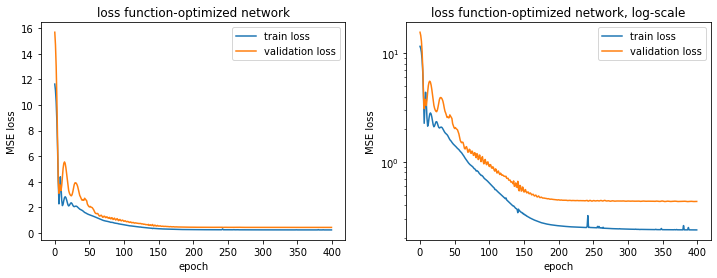

In [78]:
fig=plt.figure(figsize=(12, 4))

ax1=plt.subplot(1, 2, 1)
ax1.plot(compl_net_skorch.history[:, 'train_loss'], label='train loss')
ax1.plot(compl_net_skorch.history[:, 'valid_loss'], label='validation loss')

ax1.set_xlabel('epoch')
ax1.set_ylabel('MSE loss')
ax1.set_title('loss function-optimized network')
ax1.legend()



ax2=plt.subplot(1, 2, 2)
ax2.plot(compl_net_skorch.history[:, 'train_loss'], label='train loss')
ax2.plot(compl_net_skorch.history[:, 'valid_loss'], label='validation loss')

ax2.set_xlabel('epoch')
ax2.set_ylabel('MSE loss')
ax2.set_title('loss function-optimized network, log-scale')
ax2.legend()
ax2.set_yscale('log')
#plt.savefig('outfile/opt_network_loss_log.png', dpi=300)


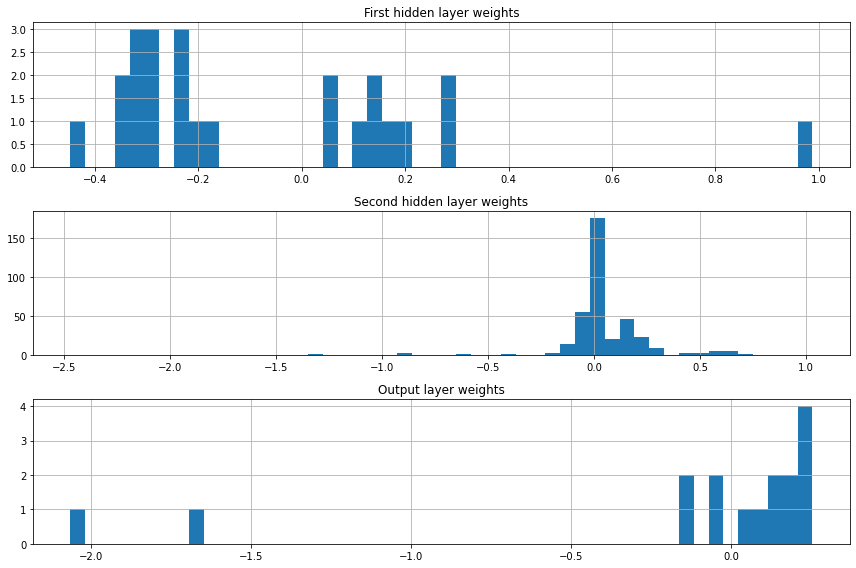

In [79]:
compl_net_skorch.module_.weight_plot('outfile/opt_network_trained.png')



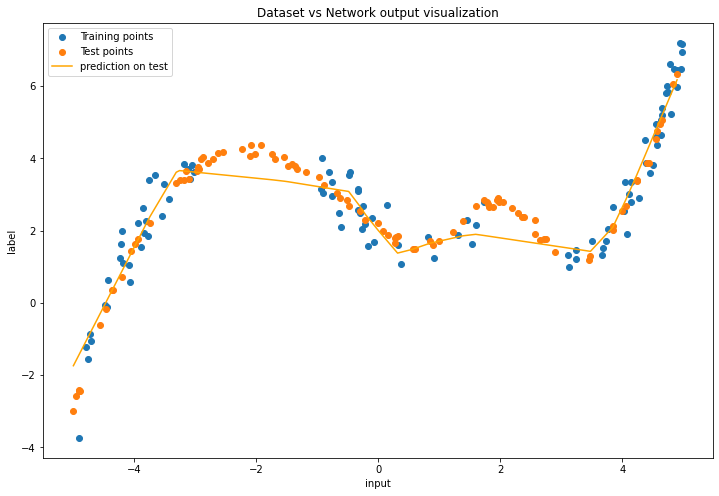

In [80]:
label_test = np.asarray(test_df.label).reshape(-1,1).astype(np.float32)
x_test = np.sort(np.asarray(test_df.input).reshape(-1,1).astype(np.float32), axis=0)
prediction = compl_net_skorch.predict(x_test)

fig = plt.figure(figsize=(12,8))
plt.scatter(train_df.input, train_df.label, label='Training points')
plt.scatter(test_df.input, test_df.label, label='Test points')
plt.plot(x_test, prediction, label='prediction on test', color='orange')
plt.xlabel('input')
plt.ylabel('label')
plt.title('Dataset vs Network output visualization')
plt.legend()
plt.savefig('outfile/output_display.png', dpi=300)
plt.show()

#### Activation profiles

In the plot below, the activation profiles for each layers of the network are reported. We can see how the encoded complexity increases with the layer depth, until the function profile is actually encoded in the output layer.

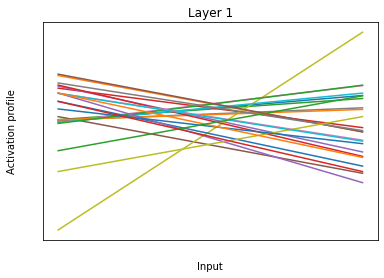

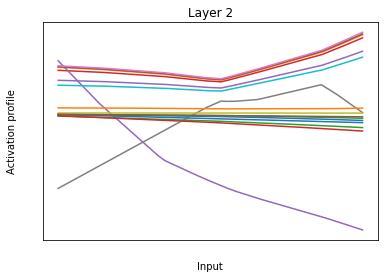

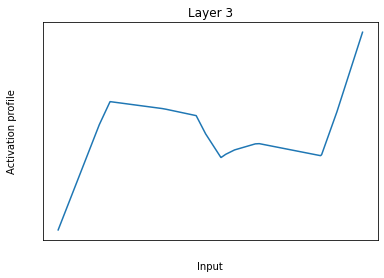

In [88]:
net = compl_net_skorch.module_
layers = [net.fc1, net.fc2, net.out]

# Add a fordard_hook to each layer to record all the activations
activtns = []


def record_hidden_activations(module, input, output):
    activtns.append(output.detach())

# Add hook to each layer
for layer in layers:
    layer.register_forward_hook(record_hidden_activations)
    
xs = np.linspace(-5, 5, 1000, dtype=np.float32)
ys = net(torch.tensor(xs).unsqueeze(1))

for num, curves in enumerate(activtns):
    plt.plot(xs, curves.detach())

    plt.title(f'Layer {num+1}')
    plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
    plt.xlabel('Input')
    plt.ylabel('Activation profile')
    plt.show()

## Classification task <a name="classification"></a>

### Introduction <a name="classification_intro"></a>

The goal is to train a Neural Network that maps an input B&W image from the fashionMNIST dataset to its integer label.

### Dataset

Fashion-MNIST is a dataset of Zalando's article images—consisting of a training set of $60000$ examples and a test set of $10000$ examples. Each example is a 28x28 grayscale image, associated with a label from 10 classes encoding in an integer number the clothing item type: 
$$\begin{aligned}
\begin{array}{ |c|c| } 
 \hline
 Label & Description  \\ 
 \hline
 0 & T-shirt/top \\ 
 \hline
 1 & Trousers  \\
 \hline
 2 & Pullover  \\
 \hline
 3 & Dress \\
 \hline
 4 & Coat  \\
 \hline
 5 & Sandal  \\
 \hline
 6 & Shirt  \\
 \hline
 7 & Sneaker  \\
 \hline
 8 & Bag  \\
 \hline
 9 & Ankle boot  \\
 \hline
\end{array}
\end{aligned}$$

At first, we download and import the dataset.
The display of some items is reported below.


In [27]:
train_dataset = torchvision.datasets.FashionMNIST('classifier_data', train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST('classifier_data', train=False, download=True)

In [28]:
train_X = train_dataset.data.type(torch.float32).reshape(60000,1,28,28)
train_y = train_dataset.targets.type(torch.int64).reshape(60000)


test_X = test_dataset.data.type(torch.float32).reshape(10000,1,28,28)
test_y = test_dataset.targets.type(torch.int64).reshape(10000)

In [29]:
labels = {
            0 : 't-shirt/top',
            1 : 'trousers', 
            2 : 'pullover',
            3 : 'dress', 
            4 : 'coat', 
            5 : 'sandal', 
            6 : 'shirt', 
            7 : 'sneaker', 
            8 : 'bag', 
            9 : 'ankleboot'
         }

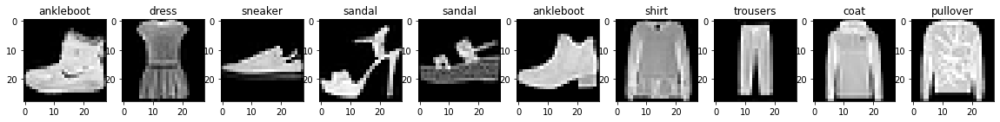

In [32]:
n_items = 10
fig, axs = plt.subplots(1, n_items, figsize=(n_items*2, 6))


for i in range(n_items):

    axs[i].imshow(train_dataset.data[i*3], cmap='gray')
    axs[i].set_title(labels[np.array(train_y)[i*3]])

### Baseline-Method <a name="classification_bl_method"></a>

The implemented architecture is a Convolutional Neural Network, being constituted by two convolutional layers, each one followed by a MaxPooling layer, and by two linear layers, one hidden and one returning the predicted label.
The convolutional layers have an adaptive number of filters, kernel size, stride and padding. 


At first, we consider a simple baseline, for which the following parameters are set: 
* number of filters (out_channels parameter): $8$
* kernel size: $5\times5$
* stride: 1
* padding: 'same'
* N_h: 50
* N_o: 10


The following table displays the network structure:
$$\begin{aligned}
\begin{array}{ |c| }
     \hline  
     \textbf{Convolutional stack} \\
     \hline
     Conv2D( 1, \quad 8, \quad 5\times 5)  \\
     \hline
     BatchNorm() \\
     \hline
      MaxPooling(2, \quad 2)  \\
     \hline
     Conv2D(8, \quad 8, \quad 5\times 5)  \\
     \hline
     BatchNorm() \\
     \hline
      MaxPooling(2, \quad 2)  \\
     \hline
     \textbf{Linear stack} \\
     \hline 
     Linear(8\times 3 \times 3, \quad 50)  \\
     \hline
     Dropout(\text{dropout rate 1} \\
     \hline
    Linear(50, 10)  \\
     \hline
    Dropout(\text{dropout rate 2} \\
    \hline
\end{array}
\end{aligned}$$

The syntax is the following: 
* Conv2D ( input filters, output filters, kernel size ) for convolutional layers,
* MaxPooling ( kernel, stride ) for max pooling layers,
* Linear ( input nodes, output nodes ) for linear layers,
* BatchNorm() for batch normalization layers,
* Dropout(rate) for dropout layers.



The application of a Max Pooling layer, with kernel and stride parameters set to 2, leads to the shrinking of the image by a factor 4: since the model includes two of this layers, the matrix returned by each filter after the application of the two convolutional layers will be of size $7\times 7$. 

At first, we test a simple baseline that does not include any:
* dropout
* regularization
* adaptive learning rate
* hyper-parameters optimization trough Grid/Random search procedures 



In [40]:
from torch.nn import Conv2d, BatchNorm2d, MaxPool2d, Sequential, Linear, Dropout, CrossEntropyLoss

In [41]:
class ConvNet(nn.Module):   
    def __init__(self, in_channels, out_channels, kernel, stride, padding,  Nh, No, activation,  L1dropout, L2dropout,  pooling):
        super().__init__()
    

        self.cnn_layers = Sequential(
            
            Conv2d(in_channels, out_channels, kernel, stride, padding),
            BatchNorm2d(out_channels),
            activation(inplace=True),
            
            pooling(kernel_size=2, stride=2),

            Conv2d(out_channels, out_channels , kernel, stride, padding),
            BatchNorm2d(out_channels),
            activation(inplace=True),

            pooling(kernel_size=2, stride=2),


        )

        self.linear_layers = Sequential(
            Linear(out_channels * 7 * 7 , Nh ),
            Dropout(L1dropout), 
            Linear(Nh , No), 
            Dropout(L2dropout)
        )

    def forward(self, x):
        x = self.cnn_layers(x)
        x = x.view(x.size(0), -1)
        x = self.linear_layers(x)
        return x
    
    
    def count_parameters(self):
        model = self
        table = PrettyTable(["Modules", "Parameters"])
        total_params = 0
        for name, parameter in model.named_parameters():
            if not parameter.requires_grad: continue
            param = parameter.numel()
            table.add_row([name, param])
            total_params+=param
        print(table)
        print(f"Total Trainable Params: {total_params}")
        return total_params
    

In [44]:
in_channels = 1
out_channels = 8
kernel = 5
stride =  1
padding= 'same'
Nh =  50
No = len(np.unique(train_y))
L1dropout = 0
L2dropout = 0

activation = nn.ReLU
pooling = MaxPool2d




conv_net_2 = NeuralNetClassifier(
    
                module = ConvNet(in_channels, out_channels, kernel, stride, padding, Nh, No, activation, L1dropout, L2dropout, pooling),
                max_epochs= 30 ,
                criterion = CrossEntropyLoss(),
                callbacks=  [
                            EpochScoring(scoring='accuracy', on_train=True),
                            ]        
               
            )

scores = cross_val_score(conv_net_2, train_X, train_y, scoring='accuracy', cv=5)
conv_net_2.fit(train_X, train_y)

  epoch    accuracy    train_loss    valid_acc    valid_loss     dur
-------  ----------  ------------  -----------  ------------  ------
      1      0.7193        0.9298       0.7914        0.5981  6.8639
      2      0.8135        0.5292       0.8241        0.4896  6.6874
      3      0.8391        0.4519       0.8435        0.4363  6.1381
      4      0.8544        0.4099       0.8526        0.4046  5.5718
      5      0.8639        0.3823       0.8610        0.3835  5.4557
      6      0.8703        0.3624       0.8656        0.3687  5.5956
      7      0.8765        0.3471       0.8689        0.3580  5.4651
      8      0.8814        0.3350       0.8709        0.3497  5.9614
      9      0.8849        0.3250       0.8742        0.3436  6.5177
     10      0.8873        0.3169       0.8766        0.3383  6.5028
     11      0.8897        0.3098       0.8791        0.3331  5.8976
     12      0.8914        0.3035       0.8804        0.3293  5.6634
     13      0.8938        0.2975 

     24      0.9084        0.2558       0.8943        0.2992  5.5105
     25      0.9089        0.2532       0.8939        0.2990  5.5809
     26      0.9101        0.2508       0.8941        0.2980  5.5331
     27      0.9108        0.2483       0.8940        0.2980  5.5560
     28      0.9115        0.2460       0.8950        0.2973  5.5863
     29      0.9126        0.2438       0.8952        0.2962  5.5876
     30      0.9131        0.2416       0.8955        0.2955  5.5776
  epoch    accuracy    train_loss    valid_acc    valid_loss     dur
-------  ----------  ------------  -----------  ------------  ------
      1      0.7173        0.9343       0.7933        0.5905  5.6299
      2      0.8124        0.5327       0.8291        0.4829  5.6234
      3      0.8375        0.4547       0.8459        0.4320  6.3933
      4      0.8525        0.4124       0.8553        0.4025  5.5953
      5      0.8618        0.3849       0.8619        0.3819  6.1326
      6      0.8695        0.3648 

     17      0.9033        0.2701       0.8970        0.2958  8.5912
     18      0.9046        0.2665       0.8970        0.2944  7.0211
     19      0.9052        0.2632       0.8975        0.2933  6.9734
     20      0.9064        0.2601       0.8976        0.2920  7.0219
     21      0.9072        0.2572       0.8980        0.2912  7.9425
     22      0.9083        0.2544       0.8980        0.2902  7.4889
     23      0.9091        0.2518       0.8979        0.2898  7.2966
     24      0.9098        0.2494       0.8982        0.2896  6.9234
     25      0.9108        0.2471       0.8988        0.2887  6.9661
     26      0.9116        0.2448       0.8987        0.2883  9.0999
     27      0.9127        0.2427       0.8990        0.2878  8.1268
     28      0.9133        0.2407       0.8990        0.2876  6.9516
     29      0.9140        0.2389       0.8988        0.2874  6.9255
     30      0.9145        0.2371       0.8993        0.2872  6.9872


<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=ConvNet(
    (cnn_layers): Sequential(
      (0): Conv2d(1, 8, kernel_size=(5, 5), stride=(1, 1), padding=same)
      (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv2d(8, 8, kernel_size=(5, 5), stride=(1, 1), padding=same)
      (5): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU(inplace=True)
      (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (linear_layers): Sequential(
      (0): Linear(in_features=392, out_features=50, bias=True)
      (1): Dropout(p=0, inplace=False)
      (2): Linear(in_features=50, out_features=10, bias=True)
      (3): Dropout(p=0, inplace=False)
    )
  ),
)

### Baseline-Results <a name="classification_bl_results"></a>
##### Loss curve
In order to monitor the learning process, the loss curve is displayed.
We see that starting from epoch 10 an overfitting behaviour is displayed. 


#### Confusion matrix
Still, the network is able to reach pretty high accuracy $89\%$ on validation set. 
In particular, to investigate further the classification capability of the model, the normalized confusion matrix is displayed below.
We see that the lowest accuracy is retrieved in the 'Shirt' category, that is easily misclassified as 'T-shirt', 'Pullover' and 'Coat'. On the other hand, the model gets top scoring in the 'Bag' cluster, since no similar categories are present.


#### Network complexity
To get an estimation of the complexity of the network, we report below the number of trainable parameters, being around $22 k$.

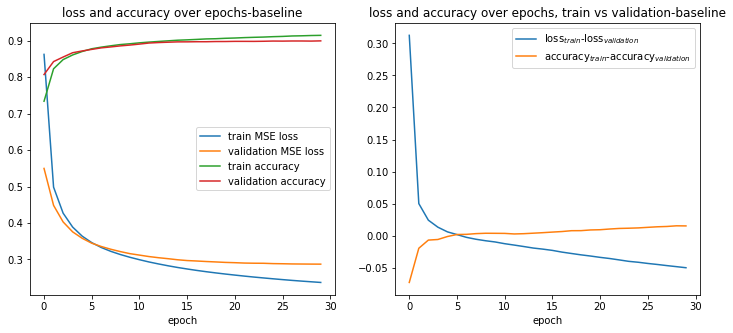

In [45]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].plot(conv_net_2.history[:, 'train_loss'], label='train MSE loss')
axs[0].plot(conv_net_2.history[:, 'valid_loss'], label='validation MSE loss')
axs[0].plot(conv_net_2.history[:, 'accuracy'], label='train accuracy')
axs[0].plot(conv_net_2.history[:, 'valid_acc'], label='validation accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_title('loss and accuracy over epochs-baseline')
axs[0].legend()



axs[1].plot(np.asarray(conv_net_2.history[:, 'train_loss'])-np.asarray(conv_net_2.history[:, 'valid_loss']), 
         label=r'loss$_{train}$-loss$_{validation}$')


axs[1].plot(np.asarray(conv_net_2.history[:, 'accuracy'])-np.asarray(conv_net_2.history[:, 'valid_acc']), 
         label=r'accuracy$_{train}$-accuracy$_{validation}$')
axs[1].set_xlabel('epoch')
axs[1].set_title('loss and accuracy over epochs, train vs validation-baseline')
axs[1].legend()

plt.show()

In [46]:
conv_net_2.module.count_parameters()

+------------------------+------------+
|        Modules         | Parameters |
+------------------------+------------+
|  cnn_layers.0.weight   |    200     |
|   cnn_layers.0.bias    |     8      |
|  cnn_layers.1.weight   |     8      |
|   cnn_layers.1.bias    |     8      |
|  cnn_layers.4.weight   |    1600    |
|   cnn_layers.4.bias    |     8      |
|  cnn_layers.5.weight   |     8      |
|   cnn_layers.5.bias    |     8      |
| linear_layers.0.weight |   19600    |
|  linear_layers.0.bias  |     50     |
| linear_layers.2.weight |    500     |
|  linear_layers.2.bias  |     10     |
+------------------------+------------+
Total Trainable Params: 22008


22008

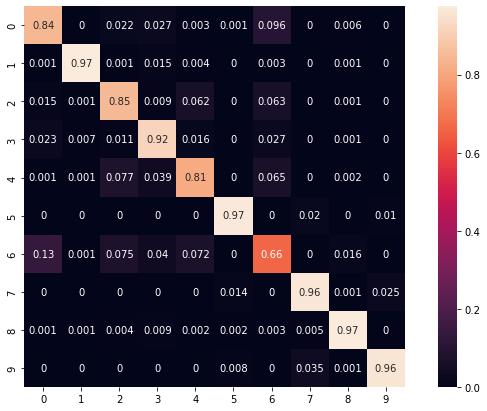

Test accuracy:  0.892


In [55]:
pred_y = conv_net_2.predict(test_X)
cf_matrix = confusion_matrix(test_y, pred_y, normalize='true')
df_cm = pd.DataFrame(cf_matrix , index = [i for i in range(10)],
                     columns = [i for i in range(10)])
plt.figure(figsize = (12,7))
sn.heatmap(df_cm, annot=True)
plt.imshow(cf_matrix)
plt.show()


print('Test accuracy: ', sum(pred_y==np.array(test_y))/len(test_y))



### Fine-tuned Model-Method <a name="classification_cm_method"></a>

Now we implement a fine-tuned model via structured grid search. 

The overall structure is reported in the following table and is pretty similar to the baseline one.


$$\begin{aligned}
\begin{array}{ |c| }
     \hline  
     \textbf{Convolutional stack} \\
     \hline
     Conv2D( 1, \quad 8, \quad 5\times 5)  \\
     \hline
     BatchNorm() \\
     \hline
      MaxPooling(2, \quad 2)  \\
     \hline
     Conv2D(8, \quad 8, \quad 5\times 5)  \\
     \hline
     BatchNorm() \\
     \hline
      MaxPooling(2, \quad 2)  \\
     \hline
     \textbf{Linear stack} \\
     \hline 
     Linear(8\times 3 \times 3, \quad N_h)  \\
     \hline
     Dropout(\text{dropout rate 1}) \\
     \hline
    Linear(N_h, 10)  \\
     \hline
    Dropout(\text{dropout rate 2}) \\
    \hline
\end{array}
\end{aligned}$$



The upgrades are the following:
* hyper-parameters optimization trough Grid/Random search procedures,
* l2-regularization penalty is applied,
* Dropouts have been included,
* an adaptive procedure for the learning rate, following an exponential decay has been set up in which $lr(t)=lr_0 \cdot \gamma^{t}$.



However, now, the structure is optimized via sampling the following hyper-parameters, for a total of 10 trials: 
* N$_h$
* dropout rate 1
* dropout rate 2
* activation function
* optimization algorithm
* starting learning rate $lr_0$
* $l_2$ penalty

In [49]:
in_channels = 1
out_channels = 8
kernel = 5
stride =  1
padding= 'same'
Nh =  50
No = len(np.unique(train_y))
L1dropout = 0
L2dropout = 0


compl_conv_net_2= NeuralNetClassifier(
    
                module = ConvNet(in_channels, out_channels, kernel, stride, padding,  Nh, No, activation, L1dropout, L2dropout,  pooling),
                max_epochs= 30,
                criterion = CrossEntropyLoss(),
                
                callbacks=[
                         ('lr_scheduler',
                             LRScheduler(policy=ExponentialLR,
                                         gamma=0.99)),
                            EpochScoring(scoring='accuracy', on_train=True),
                     ],
             
                optimizer = torch.optim.Adam,
                optimizer__lr = 0.01,
                optimizer__weight_decay = 10**-5
)



grid = {'module__in_channels' :        [1],
        'module__out_channels' :    [8],
        'module__kernel':        [5],
        'module__stride':         [1],
        'module__padding':        [padding],
        'module__Nh' :        randint.rvs(45, 50, size=500),
        'module__No' :        [No],
        'module__L1dropout':  loguniform.rvs(5e-3, 5e-1, size=500),
        'module__L2dropout':  loguniform.rvs(5e-3, 5e-1, size=500),  
        'module__pooling' : [MaxPool2d],
        'module__activation':   [nn.ReLU, nn.LeakyReLU],
        'optimizer' : [torch.optim.Adam, torch.optim.SGD],
                 
       'optimizer__lr':         loguniform.rvs(1e-4, 1e-1, size=500),
       'optimizer__weight_decay': loguniform.rvs(1e-5, 1e-2, size=500)
                   
       }


gs2 = RandomizedSearchCV(compl_conv_net_2, 
                         param_distributions=grid, 
                         cv=ShuffleSplit(n_splits = 1, test_size = 0.2), 
                        verbose=2, 
                         n_iter=10)
gs2.fit(train_X, train_y)





Fitting 1 folds for each of 10 candidates, totalling 10 fits
  epoch    accuracy    train_loss    valid_acc    valid_loss      lr     dur
-------  ----------  ------------  -----------  ------------  ------  ------
      1      0.7878        0.5922       0.8482        0.4217  0.0026  6.9098
      2      0.8510        0.4128       0.8709        0.3553  0.0026  5.7636
      3      0.8673        0.3682       0.8858        0.3231  0.0025  5.6890
      4      0.8729        0.3495       0.8857        0.3208  0.0025  6.0702
      5      0.8784        0.3328       0.8881        0.3186  0.0025  5.7266
      6      0.8835        0.3216       0.8871        0.3172  0.0025  5.7768
      7      0.8861        0.3116       0.8932        0.3013  0.0024  5.7596
      8      0.8882        0.3034       0.8915        0.3103  0.0024  6.0505
      9      0.8915        0.2967       0.8934        0.3086  0.0024  6.0218
     10      0.8940        0.2879       0.8923        0.3041  0.0024  5.6876
     11      0.

     12      0.8863        0.3072       0.8959        0.2993  0.0374  5.6414
     13      0.8874        0.3049       0.8893        0.3141  0.0371  5.6383
     14      0.8891        0.3023       0.8979        0.2944  0.0367  5.6568
     15      0.8907        0.2933       0.8975        0.2909  0.0363  5.6772
     16      0.8945        0.2906       0.8986        0.2933  0.0360  5.5951
     17      0.8945        0.2870       0.8970        0.2957  0.0356  5.7001
     18      0.8945        0.2831       0.9004        0.2884  0.0352  5.6277
     19      0.8976        0.2792       0.8819        0.3330  0.0349  6.2347
     20      0.8967        0.2789       0.8992        0.2903  0.0345  6.2159
     21      0.8983        0.2749       0.8989        0.2920  0.0342  5.6646
     22      0.9011        0.2708       0.8984        0.2941  0.0338  5.6988
     23      0.9008        0.2694       0.8976        0.2993  0.0335  5.6270
     24      0.9017        0.2658       0.9004        0.2929  0.0332  5.6390

     29      0.9121        0.2508       0.8931        0.2971  0.0013  5.6041
     30      0.9117        0.2511       0.8972        0.2883  0.0013  7.2975
[CV] END module__L1dropout=0.23990807135813552, module__L2dropout=0.006597979120387808, module__Nh=45, module__No=10, module__activation=<class 'torch.nn.modules.activation.ReLU'>, module__in_channels=1, module__kernel=5, module__out_channels=8, module__padding=same, module__pooling=<class 'torch.nn.modules.pooling.MaxPool2d'>, module__stride=1, optimizer=<class 'torch.optim.adam.Adam'>, optimizer__lr=0.001706143982490562, optimizer__weight_decay=0.002395685393959227; total time= 2.9min
  epoch    accuracy    train_loss    valid_acc    valid_loss      lr     dur
-------  ----------  ------------  -----------  ------------  ------  ------
      1      0.5942        1.1610       0.8041        0.6010  0.0142  6.7371
      2      0.6912        0.8030       0.8434        0.4804  0.0141  6.4246
      3      0.7124        0.7360       0.8538

      7      0.8823        0.3332       0.8928        0.3070  0.0018  6.7722
      8      0.8844        0.3276       0.8965        0.2984  0.0018  5.8442
      9      0.8860        0.3256       0.8889        0.3136  0.0018  5.8376
     10      0.8876        0.3226       0.8926        0.3063  0.0018  5.8278
     11      0.8871        0.3196       0.8929        0.3080  0.0017  6.7878
     12      0.8896        0.3166       0.8931        0.3015  0.0017  6.1012
     13      0.8901        0.3134       0.8951        0.2970  0.0017  5.8976
     14      0.8914        0.3113       0.8922        0.3066  0.0017  5.8402
     15      0.8923        0.3098       0.8934        0.2981  0.0017  5.8418
     16      0.8913        0.3079       0.8928        0.2968  0.0016  6.6802
     17      0.8929        0.3055       0.8953        0.2966  0.0016  6.9614
     18      0.8930        0.3043       0.8962        0.2946  0.0016  5.8209
     19      0.8936        0.3029       0.8954        0.2936  0.0016  5.8618

     17      0.7609        0.6959       0.7839        0.6335  0.0005  5.5892
     18      0.7624        0.6891       0.7874        0.6233  0.0005  5.5230
     19      0.7677        0.6743       0.7908        0.6136  0.0005  5.7369
     20      0.7686        0.6676       0.7940        0.6046  0.0005  5.5153
     21      0.7725        0.6625       0.7973        0.5964  0.0005  5.4641
     22      0.7771        0.6471       0.8001        0.5885  0.0005  5.4641
     23      0.7793        0.6407       0.8025        0.5814  0.0005  5.5570
     24      0.7817        0.6345       0.8047        0.5742  0.0005  5.4692
     25      0.7827        0.6312       0.8067        0.5676  0.0005  5.5353
     26      0.7826        0.6251       0.8076        0.5616  0.0005  5.6027
     27      0.7877        0.6156       0.8096        0.5557  0.0005  7.2539
     28      0.7893        0.6096       0.8114        0.5501  0.0005  7.1718
     29      0.7929        0.6041       0.8132        0.5450  0.0005  7.0698

RandomizedSearchCV(cv=ShuffleSplit(n_splits=1, random_state=None, test_size=0.2, train_size=None),
                   estimator=<class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=ConvNet(
    (cnn_layers): Sequential(
      (0): Conv2d(1, 8, kernel_size=(5, 5), stride=(1, 1), padding=same)
      (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReL...
       9.48757397e-04, 1.42993220e-05, 2.30353538e-05, 8.61979481e-03,
       7.33461203e-03, 1.97797793e-05, 6.59390007e-03, 4.53220191e-05,
       2.40702409e-04, 2.41316955e-05, 6.47409269e-04, 7.42820504e-04,
       5.42296394e-03, 4.45415373e-03, 1.11077413e-05, 2.37633438e-03,
       3.79355150e-03, 2.19192971e-03, 2.15782168e-05, 2.41813013e-05,
       4.26625614e-05, 3.71012233e-03, 9.05711203e-04, 3.87232780e-05])},
                   verbose=2)

### Fine-tuned Model-Results <a name="classification_cm_results"></a>

The hyper-parameters retrieved by the grid-search for the best model are the following: 
* N$_h=47$
* dropout rate 1$=1.9\cdot10^{-2}$
* dropout rate 2$=4.8\cdot10^{-2}$
* activation function: Leaky ReLU
* optimization algorithm: SGD
* starting learning rate $lr_0=4.2\cdot10^{-2}$
* $l_2$ penalty$=2.1\cdot10^{-4}$

This best model is trained for 30 epochs using a KFold (k=5) cross-validation approach.

#### Loss curve
In order to monitor the learning process, the loss and accuracy curves are displayed.
No discrepancy is highlighted between the training and validation graphs and boths display good convergence behaviours, so that overfitting issues are excluded.

#### Confusion matrix
The total accuracy reached on the test set is $89\%$.
To visuaize the prediction capability of the model on each class the confusion matrix is reported below. Again, the most misclasified items are 'Shirts', whether on the 'Bag' category the highest accuracy is reached.



#### Network complexity
What is interesting of this fine-tuned model is that is able to reach the same accuracy as the baseline but without displaying any overfitting behaviour and, moreover,  with 10$\%$ less parameters, for a total of $20 k$ trainable parameters.

In [50]:
params = gs2.best_params_
compl_conv_net_2.set_params(**params)

print(gs2.best_score_, gs2.best_params_)


scores = cross_val_score(compl_conv_net_2, train_X, train_y, scoring='accuracy', cv=5)



compl_conv_net_2.fit(train_X, train_y)


0.8959166666666667 {'optimizer__weight_decay': 0.00021278222537233363, 'optimizer__lr': 0.041802349519615485, 'optimizer': <class 'torch.optim.sgd.SGD'>, 'module__stride': 1, 'module__pooling': <class 'torch.nn.modules.pooling.MaxPool2d'>, 'module__padding': 'same', 'module__out_channels': 8, 'module__kernel': 5, 'module__in_channels': 1, 'module__activation': <class 'torch.nn.modules.activation.LeakyReLU'>, 'module__No': 10, 'module__Nh': 47, 'module__L2dropout': 0.04783385310875987, 'module__L1dropout': 0.019250641682267398}
  epoch    accuracy    train_loss    valid_acc    valid_loss      lr     dur
-------  ----------  ------------  -----------  ------------  ------  ------
      1      0.7500        0.7175       0.8148        0.4775  0.0418  5.7385
      2      0.8231        0.4873       0.8191        0.4778  0.0414  5.5992
      3      0.8416        0.4395       0.8407        0.4230  0.0410  5.5492
      4      0.8544        0.4053       0.8634        0.3661  0.0406  5.6125
     

     16      0.8905        0.2990       0.8967        0.2993  0.0360  5.6530
     17      0.8927        0.2953       0.8956        0.3004  0.0356  5.6536
     18      0.8914        0.2940       0.8950        0.3023  0.0352  5.6952
     19      0.8952        0.2883       0.8930        0.3034  0.0349  5.6018
     20      0.8956        0.2865       0.8950        0.3013  0.0345  5.6385
     21      0.8977        0.2833       0.8984        0.2929  0.0342  5.7004
     22      0.8977        0.2781       0.8978        0.2895  0.0338  5.6662
     23      0.8983        0.2766       0.8970        0.2936  0.0335  5.6619
     24      0.9001        0.2752       0.8944        0.3043  0.0332  5.6928
     25      0.9003        0.2735       0.8974        0.2919  0.0328  5.6651
     26      0.9004        0.2701       0.9000        0.2901  0.0325  5.6871
     27      0.9008        0.2708       0.9004        0.2886  0.0322  5.5953
     28      0.9027        0.2645       0.8967        0.3007  0.0319  5.8649

     10      0.8835        0.3199       0.8950        0.2963  0.0382  7.0384
     11      0.8872        0.3111       0.8925        0.3010  0.0378  7.1528
     12      0.8894        0.3072       0.8980        0.2879  0.0374  7.0763
     13      0.8895        0.3035       0.9034        0.2811  0.0371  7.2340
     14      0.8905        0.2970       0.8942        0.2954  0.0367  7.9427
     15      0.8918        0.2942       0.9014        0.2819  0.0363  7.1060
     16      0.8944        0.2906       0.9030        0.2791  0.0360  7.0490
     17      0.8952        0.2863       0.8993        0.2858  0.0356  7.2087
     18      0.8957        0.2832       0.9019        0.2794  0.0352  7.0423
     19      0.8965        0.2813       0.8985        0.2833  0.0349  7.0985
     20      0.8980        0.2792       0.9018        0.2845  0.0345  7.1291
     21      0.8978        0.2774       0.9018        0.2772  0.0342  7.0870
     22      0.8985        0.2760       0.9004        0.2788  0.0338  7.3756

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=ConvNet(
    (cnn_layers): Sequential(
      (0): Conv2d(1, 8, kernel_size=(5, 5), stride=(1, 1), padding=same)
      (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01, inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv2d(8, 8, kernel_size=(5, 5), stride=(1, 1), padding=same)
      (5): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): LeakyReLU(negative_slope=0.01, inplace=True)
      (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (linear_layers): Sequential(
      (0): Linear(in_features=392, out_features=47, bias=True)
      (1): Dropout(p=0.019250641682267398, inplace=False)
      (2): Linear(in_features=47, out_features=10, bias=True)
      (3): Dropout(p=0.04783385310875987, inplace=False)


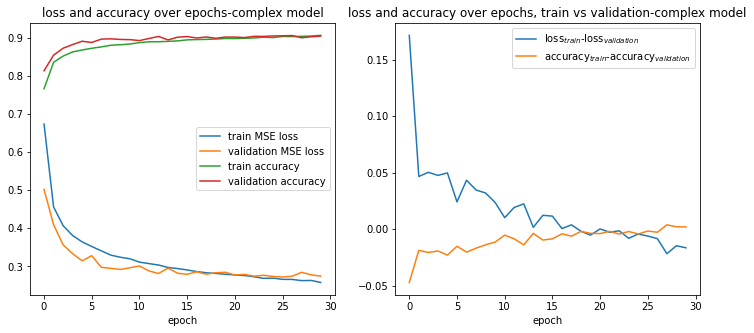

In [51]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))



axs[0].plot(compl_conv_net_2.history[:, 'train_loss'], label='train MSE loss')
axs[0].plot(compl_conv_net_2.history[:, 'valid_loss'], label='validation MSE loss')
axs[0].plot(compl_conv_net_2.history[:, 'accuracy'], label='train accuracy')
axs[0].plot(compl_conv_net_2.history[:, 'valid_acc'], label='validation accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_title('loss and accuracy over epochs-complex model')
axs[0].legend()


axs[1].plot(np.asarray(compl_conv_net_2.history[:, 'train_loss'])-np.asarray(compl_conv_net_2.history[:, 'valid_loss']), 
         label=r'loss$_{train}$-loss$_{validation}$')


axs[1].plot(np.asarray(compl_conv_net_2.history[:, 'accuracy'])-np.asarray(compl_conv_net_2.history[:, 'valid_acc']), 
         label=r'accuracy$_{train}$-accuracy$_{validation}$')
axs[1].set_xlabel('epoch')
axs[1].set_title('loss and accuracy over epochs, train vs validation-complex model')
axs[1].legend()


plt.show()



In [52]:
wd, lr, optim, stride, pooling, padding, out_channels, kernel, in_channels, activation, No, Nh, L1dropout, L2dropout = params.values()
count_net = ConvNet(in_channels, out_channels, kernel, stride, padding,  Nh, No, activation, L1dropout, L2dropout,  pooling)

count_net.count_parameters()

+------------------------+------------+
|        Modules         | Parameters |
+------------------------+------------+
|  cnn_layers.0.weight   |    200     |
|   cnn_layers.0.bias    |     8      |
|  cnn_layers.1.weight   |     8      |
|   cnn_layers.1.bias    |     8      |
|  cnn_layers.4.weight   |    1600    |
|   cnn_layers.4.bias    |     8      |
|  cnn_layers.5.weight   |     8      |
|   cnn_layers.5.bias    |     8      |
| linear_layers.0.weight |   18424    |
|  linear_layers.0.bias  |     47     |
| linear_layers.2.weight |    470     |
|  linear_layers.2.bias  |     10     |
+------------------------+------------+
Total Trainable Params: 20799


20799

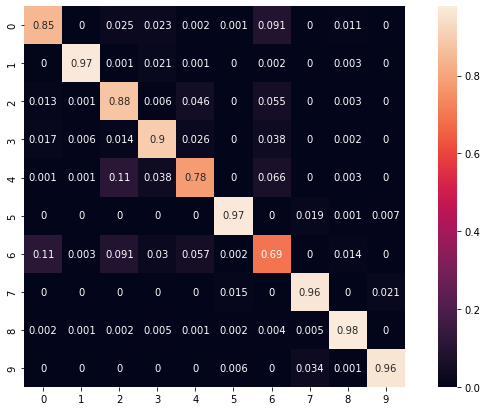

Test accuracy:  0.8943


In [56]:
pred_y = compl_conv_net_2.predict(test_X)
cf_matrix = confusion_matrix(test_y, pred_y, normalize='true')
df_cm = pd.DataFrame(cf_matrix , index = [i for i in range(10)],
                     columns = [i for i in range(10)])
plt.figure(figsize = (12,7))
sn.heatmap(df_cm, annot=True)
plt.imshow(cf_matrix)
plt.show()

print('Test accuracy: ', sum(pred_y==np.array(test_y))/len(test_y))

#### Filters
To have an insight on the learning process, the first conv layer filters after training are displayed.

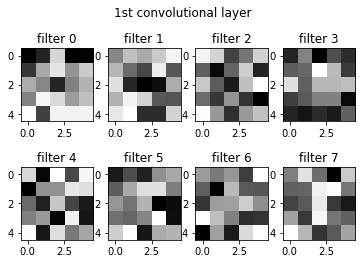

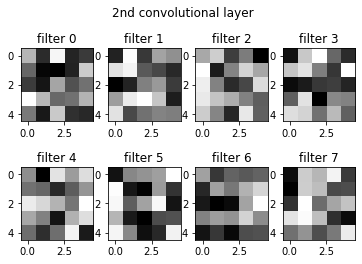

In [57]:
filters = compl_conv_net_2.module.cnn_layers[0].weight.detach().numpy()
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

fig, axs = plt.subplots(2, 4)
fig.suptitle('1st convolutional layer')

for k in range(len(filters)):
    axs[m.floor(k/4), k%4].imshow(filters[k][0] ,cmap='gray')
    axs[m.floor(k/4), k%4].set_title(f'filter {k}')
    
    
filters = compl_conv_net_2.module.cnn_layers[4].weight.detach().numpy()
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

fig, axs = plt.subplots(2, 4)
fig.suptitle('2nd convolutional layer')

for k in range(len(filters)):

    axs[m.floor(k/4), k%4].imshow(filters[k][0] ,cmap='gray')
    axs[m.floor(k/4), k%4].set_title(f'filter {k}')
    